In [2]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
from proj1_helpers import *
from helpers2 import *

In [4]:
#data_folder = Path("../data/")
DATA_TRAIN_PATH = "../data/train.csv"
y, tX, ids = load_csv_data(DATA_TRAIN_PATH)

## Data analysis

In [99]:
print(y)
print(np.shape(y))
print(np.shape(tX))
print(tX.dtype)
print(y.dtype)

[ 1. -1. -1. ...  1. -1. -1.]
(250000,)
(250000, 30)
float64
float64


In [61]:
feature_names = ['DER_mass_MMC', 'DER_mass_transverse_met_lep', 'DER_mass_vis', 'DER_pt_h', 'DER_deltaeta_jet_jet', 
                 'DER_mass_jet_jet', 'DER_prodeta_jet_jet', 'DER_deltar_tau_lep', 'DER_pt_tot', 'DER_sum_pt', 
                 'DER_pt_ratio_lep_tau', 'DER_met_phi_centrality', 'DER_lep_eta_centrality', 'PRI_tau_pt', 
                 'PRI_tau_eta', 'PRI_tau_phi', 'PRI_lep_pt', 'PRI_lep_eta', 'PRI_lep_phi', 'PRI_met', 'PRI_met_phi', 
                 'PRI_met_sumet', 'PRI_jet_num', 'PRI_jet_leading_pt', 'PRI_jet_leading_eta', 'PRI_jet_leading_phi',
                 'PRI_jet_subleading_pt', 'PRI_jet_subleading_eta', 'PRI_jet_subleading_phi', 'PRI_jet_all_pt']

for i, name in enumerate(feature_names):
    print(i, feature_names[i])


0 DER_mass_MMC
1 DER_mass_transverse_met_lep
2 DER_mass_vis
3 DER_pt_h
4 DER_deltaeta_jet_jet
5 DER_mass_jet_jet
6 DER_prodeta_jet_jet
7 DER_deltar_tau_lep
8 DER_pt_tot
9 DER_sum_pt
10 DER_pt_ratio_lep_tau
11 DER_met_phi_centrality
12 DER_lep_eta_centrality
13 PRI_tau_pt
14 PRI_tau_eta
15 PRI_tau_phi
16 PRI_lep_pt
17 PRI_lep_eta
18 PRI_lep_phi
19 PRI_met
20 PRI_met_phi
21 PRI_met_sumet
22 PRI_jet_num
23 PRI_jet_leading_pt
24 PRI_jet_leading_eta
25 PRI_jet_leading_phi
26 PRI_jet_subleading_pt
27 PRI_jet_subleading_eta
28 PRI_jet_subleading_phi
29 PRI_jet_all_pt


The training data set is composed of : 
* a y vector of length 250'000 and type float
* a tX float matrix of 250'000 rows and 30 columns

It means that our data set is composed of 250'000 different obsevations of 30 different features. In the rest of the notebook, we name the features by their index nummer. So, it means from the feature 0 from the feature  29.

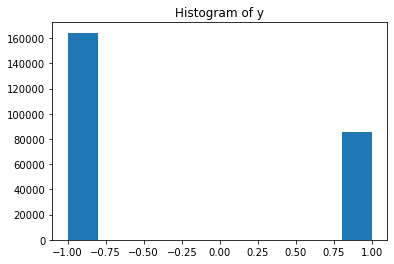

In [5]:
plt.hist(y)
plt.title('Histogram of y')
plt.show()

There is more y = -1 than y = 1 in the data, so there is more y = 'b' than y = 's'. So, we have to pay attention to normalize the data in order to compare them in the next plots.

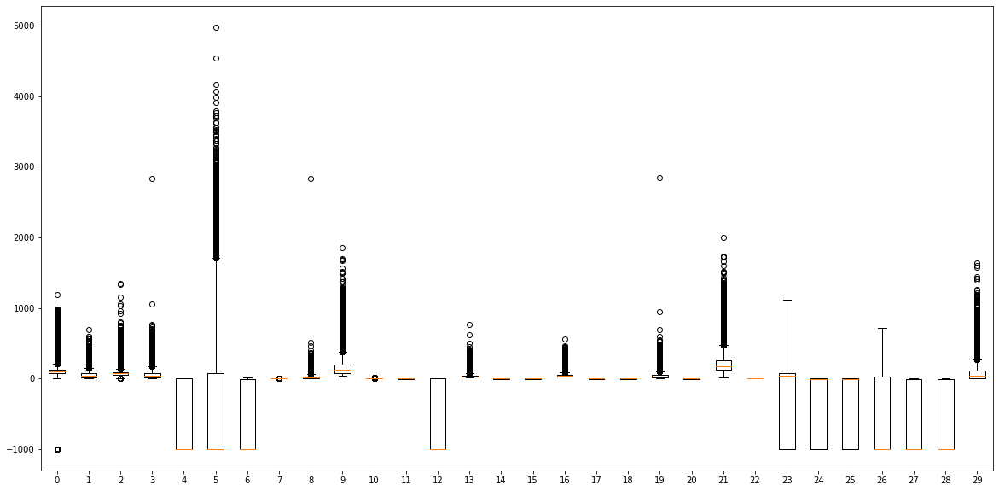

In [6]:
plt.figure(figsize=(20, 10))
ind = np.arange(30)
plt.boxplot(tX[:,], labels = ind)

plt.show()

There are many outliers depending on the feature. There are also feature that has a long interquantile range. Maybe we have to treat these feature in order to be more efficient in our futur predictions. Let's do more plots to be have a better idea :

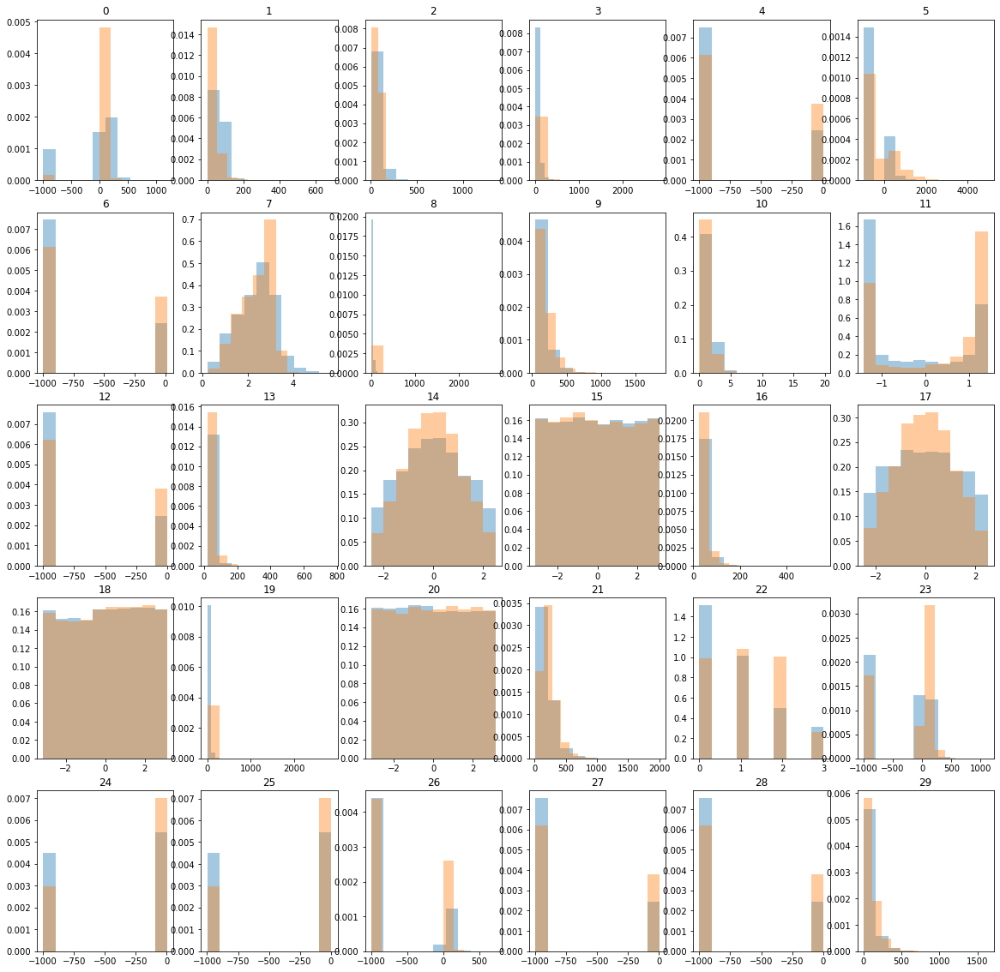

In [7]:
ind_1 = np.where(y == 1)
ind_2 = np.where(y == -1)
tX_1 = tX[ind_1[0],:]
tX_2 = tX[ind_2[0],:]

fig, axs = plt.subplots(5, 6, figsize=(20,20))

n = 0
for i in range(5) :
    for j in range(6) :
        axs[i,j].hist(tX_2[:,n], alpha=0.4, density=True, label=['y=-1', 'y=1'])
        axs[i,j].hist(tX_1[:,n], alpha=0.4, density=True)
        axs[i,j].set_title(n)
        n = n + 1
plt.show()

By plotting the histograms of the features with a color for each y, we can see that there are useless features as they have almost the same distribution for y=1 than for y = -1. We can cut feature 15, 18, 20. 


There are also features that are very inequally distributed with value that are about -1000 and values around 0 ; it can be problematic for the prediction with such a large gap between values of a single distribution. Moreover, there is not a big difference in the distribution of y=1 and y=-1. Maybe it can be useful to put off these big negative values of these features. The features in question are : 0, 4, 5, 6, 12, 23, 24, 25, 26, 27, 28.


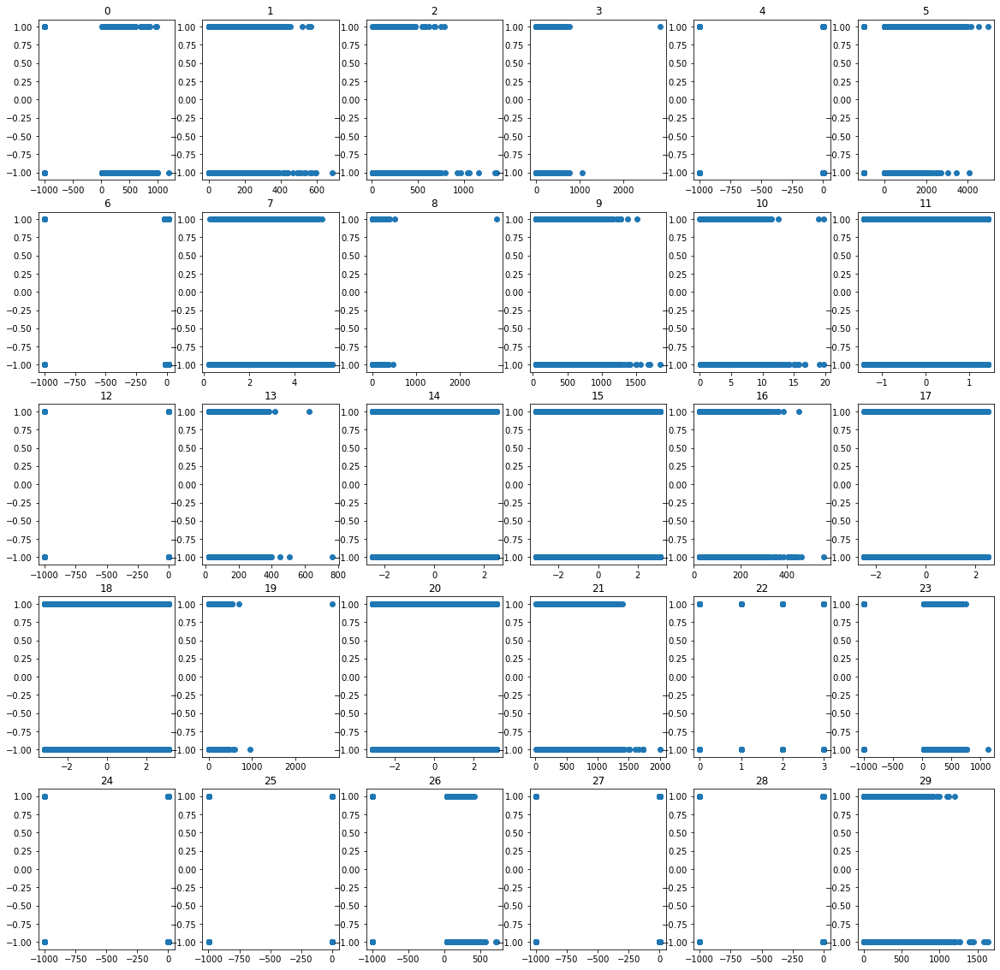

In [8]:
fig, axs = plt.subplots(5, 6, figsize=(20,20))

n = 0
for i in range(5) :
    for j in range(6) :
        axs[i,j].scatter(tX[:,n], y)
        axs[i,j].set_title(n)
        n = n + 1
plt.show()

#meme constat comment faire pour se debarrasser de ces valeurs ??

These plots confirm the obsevations that we made in the previous plot ; no difference of the distribution of y for features 15, 18, 20 and very large gap in the distributions of features : 0, 4, 5, 6, 12, 23, 24, 25, 26, 27, 28.

## Data filtering

### Outliers

In [5]:
def nb_outliers(tX, outlier) : 
    sum = 0
    nb_outliers = []
    for col in range(tX.shape[1]) :
        sum = np.where(tX[:,col] == outlier)[0].shape
        nb_outliers.append(sum)   
    print(nb_outliers)
    print(np.where(tX==outlier)[0].shape)

out = -999

print('number of -999 in the entire matrix :')
nb_outliers(tX, out)

ind_1 = np.where(y == 1)
ind_2 = np.where(y == -1)
tX_1 = tX[ind_1[0],:]
tX_2 = tX[ind_2[0],:]

print('number of -999 in the rows where y = 1 :')
nb_outliers(tX_1, out)
print('number of -999 in the rows where y = -1 :')
nb_outliers(tX_2, out)

number of -999 in the entire matrix :
[(38114,), (0,), (0,), (0,), (177457,), (177457,), (177457,), (0,), (0,), (0,), (0,), (0,), (177457,), (0,), (0,), (0,), (0,), (0,), (0,), (0,), (0,), (0,), (0,), (99913,), (99913,), (99913,), (177457,), (177457,), (177457,), (0,)]
(1580052,)
number of -999 in the rows where y = 1 :
[(2835,), (0,), (0,), (0,), (53202,), (53202,), (53202,), (0,), (0,), (0,), (0,), (0,), (53202,), (0,), (0,), (0,), (0,), (0,), (0,), (0,), (0,), (0,), (0,), (25492,), (25492,), (25492,), (53202,), (53202,), (53202,), (0,)]
(451725,)
number of -999 in the rows where y = -1 :
[(35279,), (0,), (0,), (0,), (124255,), (124255,), (124255,), (0,), (0,), (0,), (0,), (0,), (124255,), (0,), (0,), (0,), (0,), (0,), (0,), (0,), (0,), (0,), (0,), (74421,), (74421,), (74421,), (124255,), (124255,), (124255,), (0,)]
(1128327,)


We have a problem with features  0, 4, 5, 6, 12, 23, 24, 25, 26, 27, 28. They are inequally distributed; they have a lot of -999 values and the rest is values around 0. So, here we can see how much of these -999 there are. We can see that the -999 appear only in the features that we identified with the histograms. It seems that there is a correlation between features as many features have the same number of -999. We can also see that there is more -999 in the obsevations where y=-1, so we have to take this into account when we filter the data. As there are many -999, we can't delete the rows where there is -999 because we will loose to much information.

### Mean and Standardization

In [29]:
# Changer par la valeur da la mean du feature en question sans les compter dedans
def filtering_with_mean(tX):
    index = np.arange(tX.shape[1])
    tX_filtered = np.copy(tX)
    arr = []
    for ind in index :
        arr = np.delete(tX_filtered[:,ind], np.where(tX_filtered[:,ind]==-999))
        mean = np.mean(arr)
        tX_filtered[np.where(tX_filtered[:,ind]==-999), ind] = mean
    return tX_filtered

In [7]:
def filtering_with_mean_bis(tX, y):
    #index = [0,4,5,6,12,23,24,25,26,27,28]
    index = np.arange(tX.shape[1])
    tX_filtered = np.copy(tX)
    
    ind_1 = np.where(y == 1)[0]
    ind_2 = np.where(y == -1)[0]
    tX_1 = tX[ind_1,:]
    tX_2 = tX[ind_2,:]
    
    ind_3 = np.where(tX[:,0]==-999)[0]
    new_ind_1 = np.intersect1d(ind_3, ind_1)
    new_ind_2 = np.intersect1d(ind_3, ind_2)
    
    arr_1 = []
    arr_2 = []
    for ind in index :
        arr_1 = np.delete(tX_1[:,ind], np.where(tX_1[:,ind]==-999))
        mean_1 = np.mean(arr_1)
        arr_2 = np.delete(tX_2[:,ind], np.where(tX_2[:,ind]==-999))
        mean_2 = np.mean(arr_2)
        tX_filtered[new_ind_1, ind] = mean_1
        tX_filtered[new_ind_2, ind] = mean_2
    return tX_filtered

In [8]:
def std(tX):
    mean = np.mean(tX, axis = 0)
    std = np.std(tX, axis = 0)
    tX[:, std>0] = (tX[:, std>0] - mean[std>0])/std[std>0]
    return tX

In order to filter the data, we want to get rif of these -999, but we can't just delete the rows. So, we have the idea to replace the -999 by the mean of the rest of values of the feature. As there is a significant difference of amount of -999 in between y=1 and y=-1 in certain features, we calculate the mean for the rows where y = 1 and y = -1 separatly.

Then, we can also standardize the data. It can be a good idea because the features are not all in the same range of values and it can create disproportionality between the importance of the features.

In [9]:
def log_distribution(tX, to_log):
    tX_log = np.copy(tX)
    index = np.arange(tX.shape[1])
    for i in range(tX.shape[1]):
        for j in range(len(to_log)):
            if index[i] == to_log[j]:
                tX_log[:, i] = np.log(1+tX[:, to_log[j]], where=np.all(tX[:, i]>0))  
    return tX_log

In [10]:
def separate_sets(tX, y, ids):
    index1 = np.where(tX[:, 22]==0)
    index2 = np.where(tX[:, 22]==1)
    index3 = np.where(tX[:, 22]>1)
    
    set1_x = tX[index1]
    set1_y = y[index1]
    set1_ids = ids[index1]
    
    set2_x = tX[index2]
    set2_y = y[index2]
    set2_ids = ids[index2]
    
    set3_x = tX[index3]
    set3_y = y[index3]
    set3_ids = ids[index3]
    
    return set1_x, set1_y, set1_ids, set2_x, set2_y, set2_ids, set3_x, set3_y, set3_ids

def concatenate_sets(set1_x, set1_y, set1_ids, set2_x, set2_y, set2_ids, set3_x, set3_y, set3_ids):
    tX = np.concatenate((set1_x, set2_x, set3_x), axis = 0)
    y = np.concatenate((set1_y, set2_y, set3_y), axis = 0)
    ids = np.concatenate((set1_ids, set2_ids, set3_ids), axis = 0)
    return tX, y, ids

In [11]:
def outliers(tX, outlier):
    outliers = []
    M = np.squeeze(tX.shape[0])
    for col in range(tX.shape[1]) :
        out_col = np.nonzero(tX[:,col] == outlier)[0].shape
        out_col = np.squeeze(out_col)
        outliers.append(out_col/M)
    print('outliers ratio for each feature', outliers)
    
    index_full = np.arange(tX.shape[1])
    index = index_full[~(outliers==np.ones(len(outliers)))]
    index = index.reshape(-1)
    X_without_outliers = tX[:, index]
    return X_without_outliers 

### Cutting features 

In [12]:
def cut(tX, to_cut):
    cut_index = 100*np.ones(tX.shape[1])
    index_full = np.arange(tX.shape[1])
    for i in range(tX.shape[1]):
        for j in range(len(to_cut)):
            if index_full[i] == to_cut[j]:
                cut_index[i] = to_cut[j]
    index = index_full[~(index_full == cut_index)]
    index = index.reshape(-1)
    tX_cut = tX[:, index]
    return tX_cut

def keep(tX, to_keep):
    keep_index = 100*np.ones(tX.shape[1])
    index_full = np.arange(tX.shape[1])
    for i in range(tX.shape[1]):
        for j in range(len(to_keep)):
            if index_full[i] == to_keep[j]:
                keep_index[i] = to_keep[j]
    index = index_full[index_full == keep_index]
    index = index.reshape(-1)
    tX_kept = tX[:, index]
    return tX_kept

As we see above in the histograms, some features seem to be useless as they have a similar distribution between the y = 1 and y = -1. So, it is useful to have function that cut or keep some parameters.

## Fonctions 

In [13]:
from implementations import *
from cross_validation import *

#### Feature engineering

In [14]:
tX_mean = filtering_with_mean_bis(tX, y)
tX_std = std(tX_mean)

to_cut = [15,18,20]
tX_mean_cut = cut(tX_std, to_cut)

to_cut1 = [0, 4, 5, 6, 12, 23, 24, 25, 26, 27, 28]
tX_cut = cut(tX_std, to_cut1)

to_keep = [13, 14, 17]
tX_kept = keep(tX_std, to_keep)

In [64]:
to_log = [1, 2, 5, 9, 10, 13, 16, 19, 21, 23, 26, 29]

set1_x, set1_y, set1_ids, set2_x, set2_y, set2_ids, set3_x, set3_y, set3_ids = separate_sets(tX, y, ids)

print('Set 1')
set1_x = outliers(set1_x, -999)
#set1_x = log_distribution(set1_x, to_log)
set1_x = filtering_with_mean_bis(set1_x, set1_y)
#set1_x = std(set1_x)
_ = outliers(set1_x, -999)

print('\nSet 2')
set2_x = outliers(set2_x, -999)
#set2_x = log_distribution(set2_x, to_log)
set2_x = filtering_with_mean_bis(set2_x, set2_y)
#set2_x = std(set2_x)
_ = outliers(set2_x, -999)

print('\nSet 3')
set3_x = outliers(set3_x, -999)
#set3_x = log_distribution(set3_x, to_log)
set3_x = filtering_with_mean_bis(set3_x, set3_y)
#set3_x = std(set3_x)
_ = outliers(set3_x, -999)

Set 1
outliers ratio for each feature [0.2614574679971575, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0]
outliers ratio for each feature [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]

Set 2
outliers ratio for each feature [0.09751882802022077, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0]
outliers ratio for each feature [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]

Set 3
outliers ratio for each feature [0.06105344416415092, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
outliers ratio for each feature [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 

#### Choose x and generate test and train data 

In [94]:
x1 = tX_mean
x2 = tX_kept
x3 = tX_std
x4 = tX_mean_cut

### Least squares

Cross validation to get parameters

In [ ]:
np.random.seed(seed=1)
degrees = np.arange(1,11)
degree_opt, _ = best_degree_selection(y, tX_log, degrees, k_fold=4, lambdas=0, fonction=0)
print("Cross validation finished: optimal degree {d}".format(d=degree_opt))
tX_poly = build_poly(tX_log, degree_opt)
w_ls, loss_ls = least_squares(y, tX_poly)
print("Least square loss {loss}".format(loss=loss_ls))
degree_ls = degree_opt

In [ ]:
np.random.seed(seed=1)
degrees = np.arange(1,11)
degree_opt, _ = best_degree_selection(set1_y, set1_x, degrees, k_fold=4, lambdas=0, fonction=0)
print("Cross validation finished: optimal degree {d}".format(d=degree_opt))
tX_poly = build_poly(set1_x, degree_opt)
w_ls1, loss_ls1 = least_squares(set1_y, tX_poly)
print("Least square loss {loss}".format(loss=loss_ls1))
degree_ls1 = degree_opt

In [ ]:
#je commente sinon pas le bon w_ls pour la submission
""""w_ls, loss_ls = least_squares(y, x1)
print("Least square loss {loss}".format(loss=loss_ls))
w_ls, loss_ls = least_squares(y, build_poly(x1, 8))
print("Least square mse loss {loss} with degree 8".format(loss=loss_ls))
w_ls, loss_ls = least_squares(y, build_poly(x1, 8))
loss_ls = np.sqrt(2*loss_ls)
print("Least square rmse loss {loss} with degree 8".format(loss=loss_ls))"""

In [ ]:
np.random.seed(seed=1)
degrees = np.arange(1,11)
degree_opt, _ = best_degree_selection(y, x4, degrees, k_fold=4, lambdas=0, fonction=0)
print("Cross validation finished: optimal degree {d}".format(d=degree_opt))
tX2 = build_poly(x4, degree_opt)
w_ls2, loss_ls2 = least_squares(y, tX2)
print("Least square loss {loss}".format(loss=loss_ls))
degree_ls2 = degree_opt

### Ridge regression 

Cross validation to find the oprimal lambda and degree

In [ ]:
degrees = np.arange(1,11)
degree_opt, lambda_opt = best_degree_selection(y, x4, degrees, k_fold=4, lambdas=np.logspace(-4, 0, 30), fonction=1)
print("Cross validation finished: optimal lambda {l} and degree {d}".format(l=lambda_opt, d=degree_opt))
tX = build_poly(x1, degree_opt)
w_rr, loss_rr = ridge_regression(y, tX, lambda_opt)
print("Ridge regression loss {loss}".format(loss=loss_rr))
degree_rr = degree_opt

In [ ]:
degrees = np.arange(1,11)
degree_opt, lambda_opt = best_degree_selection(set1_y, set1_x, degrees, k_fold=10, lambdas=np.logspace(-4, 0, 30), fonction=1)
print("Cross validation finished: optimal lambda {l} and degree {d}".format(l=lambda_opt, d=degree_opt))
tX_poly = build_poly(x1, degree_opt)
w_rr1, loss_rr1 = ridge_regression(set1_y, tX_poly, lambda_opt)
print("Ridge regression loss {loss}".format(loss=loss_rr1))
degree_rr1 = degree_opt

### Gradient descent

In the next cells, we perform a 4-fold cross validation for the gamma parameter for gradient descent method for each set. Then we we perform a stochastic gradient descent with the optimal gamma found. For the cross validation we use 50 iterations and for the final descent 500 iterations as we want a more precise final result. 

In [39]:
k_fold = 4
max_iters = 500
initial_w = np.zeros(set1_x.shape[1])
gammas = np.arange(0, 3, 0.01)
gamma_opt1 = cross_validation(set1_y, set1_x, k_fold, gammas, fonction=2)
w_gd1, loss_gd1 = least_squares_GD(set1_y, set1_x, gamma_opt1, max_iters=max_iters)
print("Cross validation finished: optimal gamma {g}".format(g=gamma_opt1))
print("Gradient descent regression loss {loss}".format(loss=loss_gd1))

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.5
Gradient Descent(2/49): loss=0.5
Gradient Descent(3/49): loss=0.5
Gradient Descent(4/49): loss=0.5
Gradient Descent(5/49): loss=0.5
Gradient Descent(6/49): loss=0.5
Gradient Descent(7/49): loss=0.5
Gradient Descent(8/49): loss=0.5
Gradient Descent(9/49): loss=0.5
Gradient Descent(10/49): loss=0.5
Gradient Descent(11/49): loss=0.5
Gradient Descent(12/49): loss=0.5
Gradient Descent(13/49): loss=0.5
Gradient Descent(14/49): loss=0.5
Gradient Descent(15/49): loss=0.5
Gradient Descent(16/49): loss=0.5
Gradient Descent(17/49): loss=0.5
Gradient Descent(18/49): loss=0.5
Gradient Descent(19/49): loss=0.5
Gradient Descent(20/49): loss=0.5
Gradient Descent(21/49): loss=0.5
Gradient Descent(22/49): loss=0.5
Gradient Descent(23/49): loss=0.5
Gradient Descent(24/49): loss=0.5
Gradient Descent(25/49): loss=0.5
Gradient Descent(26/49): loss=0.5
Gradient Descent(27/49): loss=0.5
Gradient Descent(28/49): loss=0.5
Gradient Descent(29/49):

Gradient Descent(19/49): loss=0.433779406559099
Gradient Descent(20/49): loss=0.4317456553585308
Gradient Descent(21/49): loss=0.42980916845837075
Gradient Descent(22/49): loss=0.42796496072061946
Gradient Descent(23/49): loss=0.4262083058631192
Gradient Descent(24/49): loss=0.4245347228987089
Gradient Descent(25/49): loss=0.42293996329214756
Gradient Descent(26/49): loss=0.4214199987963258
Gradient Descent(27/49): loss=0.4199710099313795
Gradient Descent(28/49): loss=0.4185893750723009
Gradient Descent(29/49): loss=0.417271660112512
Gradient Descent(30/49): loss=0.41601460867263274
Gradient Descent(31/49): loss=0.4148151328253419
Gradient Descent(32/49): loss=0.4136703043088099
Gradient Descent(33/49): loss=0.4125773462026678
Gradient Descent(34/49): loss=0.4115336250418859
Gradient Descent(35/49): loss=0.41053664334526746
Gradient Descent(36/49): loss=0.40958403253651465
Gradient Descent(37/49): loss=0.4086735462370176
Gradient Descent(38/49): loss=0.4078030539106357
Gradient Descent

Gradient Descent(47/49): loss=0.3880027000441821
Gradient Descent(48/49): loss=0.3877210060003931
Gradient Descent(49/49): loss=0.3874482591925993
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.4895511775071247
Gradient Descent(2/49): loss=0.4801383879259218
Gradient Descent(3/49): loss=0.47165544302773993
Gradient Descent(4/49): loss=0.4640071540237735
Gradient Descent(5/49): loss=0.45710818072826337
Gradient Descent(6/49): loss=0.4508820025906069
Gradient Descent(7/49): loss=0.44525999849769327
Gradient Descent(8/49): loss=0.44018062368151323
Gradient Descent(9/49): loss=0.43558867334043205
Gradient Descent(10/49): loss=0.43143462371383756
Gradient Descent(11/49): loss=0.42767404235546547
Gradient Descent(12/49): loss=0.4242670602448354
Gradient Descent(13/49): loss=0.42117789917160997
Gradient Descent(14/49): loss=0.4183744485354239
Gradient Descent(15/49): loss=0.41582788633376083
Gradient Descent(16/49): loss=0.4135123396714562
Gradient Descent(17/49): loss=0.4114

Gradient Descent(28/49): loss=0.3899024666727518
Gradient Descent(29/49): loss=0.3894086135591386
Gradient Descent(30/49): loss=0.3889434646126702
Gradient Descent(31/49): loss=0.388503399191535
Gradient Descent(32/49): loss=0.38808532540030577
Gradient Descent(33/49): loss=0.3876866012784001
Gradient Descent(34/49): loss=0.38730496780804763
Gradient Descent(35/49): loss=0.38693849196066865
Gradient Descent(36/49): loss=0.38658551827035076
Gradient Descent(37/49): loss=0.3862446276517837
Gradient Descent(38/49): loss=0.3859146023738817
Gradient Descent(39/49): loss=0.3855943962647314
Gradient Descent(40/49): loss=0.38528310936294313
Gradient Descent(41/49): loss=0.38497996634878745
Gradient Descent(42/49): loss=0.38468429818887573
Gradient Descent(43/49): loss=0.3843955265133383
Gradient Descent(44/49): loss=0.3841131503167645
Gradient Descent(45/49): loss=0.3838367346355643
Gradient Descent(46/49): loss=0.38356590090654236
Gradient Descent(47/49): loss=0.3833003187557467
Gradient Desc

Gradient Descent(39/49): loss=0.3820250402250945
Gradient Descent(40/49): loss=0.38170750362062517
Gradient Descent(41/49): loss=0.3813966034701825
Gradient Descent(42/49): loss=0.3810920666051417
Gradient Descent(43/49): loss=0.38079365250668207
Gradient Descent(44/49): loss=0.38050114744762426
Gradient Descent(45/49): loss=0.3802143597580248
Gradient Descent(46/49): loss=0.3799331159961561
Gradient Descent(47/49): loss=0.3796572578491563
Gradient Descent(48/49): loss=0.3793866396219222
Gradient Descent(49/49): loss=0.3791211262003882
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.47966940170637157
Gradient Descent(2/49): loss=0.4631555152790177
Gradient Descent(3/49): loss=0.4497205366373557
Gradient Descent(4/49): loss=0.4387702560975397
Gradient Descent(5/49): loss=0.42982598863150245
Gradient Descent(6/49): loss=0.4225020188698072
Gradient Descent(7/49): loss=0.416487470070845
Gradient Descent(8/49): loss=0.4115317240411562
Gradient Descent(9/49): loss=0.407432692

Gradient Descent(2/49): loss=0.4556402248316454
Gradient Descent(3/49): loss=0.4407838517101148
Gradient Descent(4/49): loss=0.4292972497810827
Gradient Descent(5/49): loss=0.4203809015914057
Gradient Descent(6/49): loss=0.4134266167887285
Gradient Descent(7/49): loss=0.40797156567007214
Gradient Descent(8/49): loss=0.4036633982788362
Gradient Descent(9/49): loss=0.40023376272230343
Gradient Descent(10/49): loss=0.3974781916048643
Gradient Descent(11/49): loss=0.3952408194398054
Gradient Descent(12/49): loss=0.39340276679157365
Gradient Descent(13/49): loss=0.3918733087108203
Gradient Descent(14/49): loss=0.3905831582133168
Gradient Descent(15/49): loss=0.3894793569689242
Gradient Descent(16/49): loss=0.38852138767240035
Gradient Descent(17/49): loss=0.38767821529947283
Gradient Descent(18/49): loss=0.3869260347996295
Gradient Descent(19/49): loss=0.3862465561703197
Gradient Descent(20/49): loss=0.3856256983991683
Gradient Descent(21/49): loss=0.38505259455594
Gradient Descent(22/49): 

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.46578179656921015
Gradient Descent(2/49): loss=0.4425909793625242
Gradient Descent(3/49): loss=0.42675369729334656
Gradient Descent(4/49): loss=0.4158319322765183
Gradient Descent(5/49): loss=0.40820422297731085
Gradient Descent(6/49): loss=0.40279007991479654
Gradient Descent(7/49): loss=0.3988682336244702
Gradient Descent(8/49): loss=0.3959564206241145
Gradient Descent(9/49): loss=0.3937316750631804
Gradient Descent(10/49): loss=0.39197736552531093
Gradient Descent(11/49): loss=0.3905479383366196
Gradient Descent(12/49): loss=0.3893454102433883
Gradient Descent(13/49): loss=0.38830367292001156
Gradient Descent(14/49): loss=0.3873780002332395
Gradient Descent(15/49): loss=0.3865380257676721
Gradient Descent(16/49): loss=0.3857630380711294
Gradient Descent(17/49): loss=0.38503882566491704
Gradient Descent(18/49): loss=0.38435555940244
Gradient Descent(19/49): loss=0.3837063698446359
Gradient Descent(20/49): loss=0.38308639

Gradient Descent(18/49): loss=0.3827259585834994
Gradient Descent(19/49): loss=0.38206497298932424
Gradient Descent(20/49): loss=0.3814319916856075
Gradient Descent(21/49): loss=0.38082474206378175
Gradient Descent(22/49): loss=0.3802414619313462
Gradient Descent(23/49): loss=0.3796807275886848
Gradient Descent(24/49): loss=0.37914134401866445
Gradient Descent(25/49): loss=0.37862227445187174
Gradient Descent(26/49): loss=0.3781225949319774
Gradient Descent(27/49): loss=0.37764146478351746
Gradient Descent(28/49): loss=0.377178107218419
Gradient Descent(29/49): loss=0.37673179642547255
Gradient Descent(30/49): loss=0.3763018488207664
Gradient Descent(31/49): loss=0.3758876169818682
Gradient Descent(32/49): loss=0.3754884853241246
Gradient Descent(33/49): loss=0.37510386691739245
Gradient Descent(34/49): loss=0.3747332010575673
Gradient Descent(35/49): loss=0.37437595134480367
Gradient Descent(36/49): loss=0.37403160410803143
Gradient Descent(37/49): loss=0.3736996670714261
Gradient Des

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.4571913746793411
Gradient Descent(2/49): loss=0.4315897324797413
Gradient Descent(3/49): loss=0.4160439160628807
Gradient Descent(4/49): loss=0.4064012394850032
Gradient Descent(5/49): loss=0.4002410414653499
Gradient Descent(6/49): loss=0.39614764677075065
Gradient Descent(7/49): loss=0.39329066377814437
Gradient Descent(8/49): loss=0.3911816062999798
Gradient Descent(9/49): loss=0.38953224218006033
Gradient Descent(10/49): loss=0.3881718976109477
Gradient Descent(11/49): loss=0.38699905604028345
Gradient Descent(12/49): loss=0.3859529674226283
Gradient Descent(13/49): loss=0.3849969631239839
Gradient Descent(14/49): loss=0.3841086332958759
Gradient Descent(15/49): loss=0.38327403494000983
Gradient Descent(16/49): loss=0.3824842713171563
Gradient Descent(17/49): loss=0.3817334685419157
Gradient Descent(18/49): loss=0.38101757652478035
Gradient Descent(19/49): loss=0.3803336569239153
Gradient Descent(20/49): loss=0.3796794

Gradient Descent(5/49): loss=0.39751992932773866
Gradient Descent(6/49): loss=0.39396779266187887
Gradient Descent(7/49): loss=0.39148643776903774
Gradient Descent(8/49): loss=0.38962039887578914
Gradient Descent(9/49): loss=0.3881178234846179
Gradient Descent(10/49): loss=0.3868386671809589
Gradient Descent(11/49): loss=0.3857044441296978
Gradient Descent(12/49): loss=0.384670653836856
Gradient Descent(13/49): loss=0.38371161728681324
Gradient Descent(14/49): loss=0.3828121203462503
Gradient Descent(15/49): loss=0.38196279913927816
Gradient Descent(16/49): loss=0.38115758622910373
Gradient Descent(17/49): loss=0.3803922937114406
Gradient Descent(18/49): loss=0.37966382458628023
Gradient Descent(19/49): loss=0.37896973193867395
Gradient Descent(20/49): loss=0.3783079710390095
Gradient Descent(21/49): loss=0.3776767586979039
Gradient Descent(22/49): loss=0.3770744924242722
Gradient Descent(23/49): loss=0.37649970305816566
Gradient Descent(24/49): loss=0.3759510262416564
Gradient Descent

Gradient Descent(35/49): loss=0.37068232049552907
Gradient Descent(36/49): loss=0.3703909021470819
Gradient Descent(37/49): loss=0.3701134883864333
Gradient Descent(38/49): loss=0.3698493688094177
Gradient Descent(39/49): loss=0.3695978704293538
Gradient Descent(40/49): loss=0.3693583556029721
Gradient Descent(41/49): loss=0.3691302200817139
Gradient Descent(42/49): loss=0.3689128911794946
Gradient Descent(43/49): loss=0.3687058260488786
Gradient Descent(44/49): loss=0.3685085100583471
Gradient Descent(45/49): loss=0.3683204552639652
Gradient Descent(46/49): loss=0.36814119896930375
Gradient Descent(47/49): loss=0.36797030236796213
Gradient Descent(48/49): loss=0.3678073492634623
Gradient Descent(49/49): loss=0.36765194486167985
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.44918113802725884
Gradient Descent(2/49): loss=0.42255885414084277
Gradient Descent(3/49): loss=0.40822067780813803
Gradient Descent(4/49): loss=0.40016790822086856
Gradient Descent(5/49): loss=0.3

Gradient Descent(4/49): loss=0.3978749442783713
Gradient Descent(5/49): loss=0.3936285655804093
Gradient Descent(6/49): loss=0.39086691567536347
Gradient Descent(7/49): loss=0.38885672325906595
Gradient Descent(8/49): loss=0.3872458515881521
Gradient Descent(9/49): loss=0.3858634974247945
Gradient Descent(10/49): loss=0.384625499491763
Gradient Descent(11/49): loss=0.38348929073621413
Gradient Descent(12/49): loss=0.38243239561689707
Gradient Descent(13/49): loss=0.3814421326157696
Gradient Descent(14/49): loss=0.3805106651882882
Gradient Descent(15/49): loss=0.37963261258727576
Gradient Descent(16/49): loss=0.3788038892536143
Gradient Descent(17/49): loss=0.37802113562965284
Gradient Descent(18/49): loss=0.37728143474705333
Gradient Descent(19/49): loss=0.3765821676023
Gradient Descent(20/49): loss=0.3759209364336865
Gradient Descent(21/49): loss=0.37529552159326135
Gradient Descent(22/49): loss=0.3747038553317538
Gradient Descent(23/49): loss=0.37414400433017114
Gradient Descent(24/4

Gradient Descent(2/49): loss=0.4154302120678773
Gradient Descent(3/49): loss=0.40283887927227463
Gradient Descent(4/49): loss=0.3963519054238727
Gradient Descent(5/49): loss=0.39260573447853336
Gradient Descent(6/49): loss=0.39012402785987416
Gradient Descent(7/49): loss=0.3882534762100382
Gradient Descent(8/49): loss=0.38670190882590244
Gradient Descent(9/49): loss=0.3853365040488168
Gradient Descent(10/49): loss=0.384095168019758
Gradient Descent(11/49): loss=0.3829474361499711
Gradient Descent(12/49): loss=0.38187714694794656
Gradient Descent(13/49): loss=0.3808747264960694
Gradient Descent(14/49): loss=0.3799337312389347
Gradient Descent(15/49): loss=0.37904928495861473
Gradient Descent(16/49): loss=0.37821736217833724
Gradient Descent(17/49): loss=0.3774344520495493
Gradient Descent(18/49): loss=0.37669739471987107
Gradient Descent(19/49): loss=0.3760032968875472
Gradient Descent(20/49): loss=0.37534948443116506
Gradient Descent(21/49): loss=0.3747334729344117
Gradient Descent(22/

Gradient Descent(30/49): loss=0.36932308906982375
Gradient Descent(31/49): loss=0.36900165584262873
Gradient Descent(32/49): loss=0.36869946304923285
Gradient Descent(33/49): loss=0.36841529022557196
Gradient Descent(34/49): loss=0.36814799722785957
Gradient Descent(35/49): loss=0.36789651869609474
Gradient Descent(36/49): loss=0.36765985892763164
Gradient Descent(37/49): loss=0.3674370871268015
Gradient Descent(38/49): loss=0.36722733299993643
Gradient Descent(39/49): loss=0.36702978266807723
Gradient Descent(40/49): loss=0.36684367487222086
Gradient Descent(41/49): loss=0.36666829744824236
Gradient Descent(42/49): loss=0.3665029840506619
Gradient Descent(43/49): loss=0.36634711110623114
Gradient Descent(44/49): loss=0.36620009497995204
Gradient Descent(45/49): loss=0.36606138933760257
Gradient Descent(46/49): loss=0.36593048269016754
Gradient Descent(47/49): loss=0.36580689610677075
Gradient Descent(48/49): loss=0.3656901810837928
Gradient Descent(49/49): loss=0.3655799175588418
Grad

Gradient Descent(1/49): loss=0.4348000733015889
Gradient Descent(2/49): loss=0.40924482154573866
Gradient Descent(3/49): loss=0.39840404996204987
Gradient Descent(4/49): loss=0.39314007515459026
Gradient Descent(5/49): loss=0.39005592318881177
Gradient Descent(6/49): loss=0.3878736778447799
Gradient Descent(7/49): loss=0.38610583597071135
Gradient Descent(8/49): loss=0.3845621688888018
Gradient Descent(9/49): loss=0.383165179863266
Gradient Descent(10/49): loss=0.3818805935919745
Gradient Descent(11/49): loss=0.3806910149971696
Gradient Descent(12/49): loss=0.3795858771495674
Gradient Descent(13/49): loss=0.37855756639257937
Gradient Descent(14/49): loss=0.37759990273144706
Gradient Descent(15/49): loss=0.37670752463754337
Gradient Descent(16/49): loss=0.3758756249431343
Gradient Descent(17/49): loss=0.3750998255638664
Gradient Descent(18/49): loss=0.3743761089319296
Gradient Descent(19/49): loss=0.373700773943545
Gradient Descent(20/49): loss=0.37307040351375603
Gradient Descent(21/49

Gradient Descent(30/49): loss=0.3685319357848987
Gradient Descent(31/49): loss=0.36825851637240714
Gradient Descent(32/49): loss=0.3680035869033711
Gradient Descent(33/49): loss=0.3677658151847591
Gradient Descent(34/49): loss=0.36754396810389484
Gradient Descent(35/49): loss=0.3673369040034264
Gradient Descent(36/49): loss=0.36714356567329964
Gradient Descent(37/49): loss=0.36696297390587224
Gradient Descent(38/49): loss=0.3667942215655628
Gradient Descent(39/49): loss=0.3666364681290739
Gradient Descent(40/49): loss=0.3664889346563702
Gradient Descent(41/49): loss=0.3663508991562833
Gradient Descent(42/49): loss=0.36622169231392115
Gradient Descent(43/49): loss=0.366100693550032
Gradient Descent(44/49): loss=0.3659873273851327
Gradient Descent(45/49): loss=0.36588106008361937
Gradient Descent(46/49): loss=0.36578139655524666
Gradient Descent(47/49): loss=0.3656878774933163
Gradient Descent(48/49): loss=0.3656000767306943
Gradient Descent(49/49): loss=0.3655175987963774
Gradient Desce

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.4284993039243225
Gradient Descent(2/49): loss=0.4046050501648661
Gradient Descent(3/49): loss=0.3955394249881494
Gradient Descent(4/49): loss=0.39125025106874944
Gradient Descent(5/49): loss=0.3885898507176118
Gradient Descent(6/49): loss=0.3865544300059746
Gradient Descent(7/49): loss=0.38481509682097276
Gradient Descent(8/49): loss=0.3832579675322551
Gradient Descent(9/49): loss=0.38183872389530726
Gradient Descent(10/49): loss=0.38053619748766376
Gradient Descent(11/49): loss=0.37933739341072653
Gradient Descent(12/49): loss=0.37823257163674573
Gradient Descent(13/49): loss=0.3772135755261453
Gradient Descent(14/49): loss=0.37627322341675234
Gradient Descent(15/49): loss=0.37540505690691633
Gradient Descent(16/49): loss=0.3746032144595924
Gradient Descent(17/49): loss=0.3738623529034323
Gradient Descent(18/49): loss=0.37317758993053796
Gradient Descent(19/49): loss=0.3725444576195978
Gradient Descent(20/49): loss=0.3719

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.42552168528481743
Gradient Descent(2/49): loss=0.40263113318866595
Gradient Descent(3/49): loss=0.39437456235327223
Gradient Descent(4/49): loss=0.3904485709419528
Gradient Descent(5/49): loss=0.38790807493798496
Gradient Descent(6/49): loss=0.3858917092821415
Gradient Descent(7/49): loss=0.3841375059190075
Gradient Descent(8/49): loss=0.38255850062261576
Gradient Descent(9/49): loss=0.38111999940668895
Gradient Descent(10/49): loss=0.379803679417486
Gradient Descent(11/49): loss=0.37859691672697177
Gradient Descent(12/49): loss=0.3774895148977863
Gradient Descent(13/49): loss=0.3764726350625088
Gradient Descent(14/49): loss=0.37553839715355997
Gradient Descent(15/49): loss=0.37467969574925303
Gradient Descent(16/49): loss=0.37389009115727345
Gradient Descent(17/49): loss=0.3731637313421317
Gradient Descent(18/49): loss=0.37249528944034715
Gradient Descent(19/49): loss=0.3718799109316828
Gradient Descent(20/49): loss=0.371

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.42268054494076385
Gradient Descent(2/49): loss=0.4008866177338421
Gradient Descent(3/49): loss=0.3933767367895098
Gradient Descent(4/49): loss=0.38974310057161216
Gradient Descent(5/49): loss=0.3872802422319952
Gradient Descent(6/49): loss=0.3852638746953224
Gradient Descent(7/49): loss=0.38348857666662667
Gradient Descent(8/49): loss=0.38188746343495866
Gradient Descent(9/49): loss=0.38043195866657203
Gradient Descent(10/49): loss=0.37910498127878006
Gradient Descent(11/49): loss=0.37789358549766966
Gradient Descent(12/49): loss=0.37678682565056365
Gradient Descent(13/49): loss=0.37577505662160243
Gradient Descent(14/49): loss=0.3748496472041265
Gradient Descent(15/49): loss=0.3740028237773374
Gradient Descent(16/49): loss=0.37322756269713536
Gradient Descent(17/49): loss=0.3725175057765015
Gradient Descent(18/49): loss=0.37186688958946107
Gradient Descent(19/49): loss=0.3712704845326147
Gradient Descent(20/49): loss=0.37

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.41997588289216176
Gradient Descent(2/49): loss=0.3993496397011045
Gradient Descent(3/49): loss=0.3925168359177709
Gradient Descent(4/49): loss=0.3891115225504002
Gradient Descent(5/49): loss=0.3866929149194913
Gradient Descent(6/49): loss=0.38466369341134854
Gradient Descent(7/49): loss=0.3828644342457436
Gradient Descent(8/49): loss=0.38124248974193437
Gradient Descent(9/49): loss=0.3797727533903591
Gradient Descent(10/49): loss=0.3784382924988991
Gradient Descent(11/49): loss=0.3772254053764298
Gradient Descent(12/49): loss=0.37612222514419935
Gradient Descent(13/49): loss=0.37511823121100746
Gradient Descent(14/49): loss=0.3742040140060924
Gradient Descent(15/49): loss=0.3733711235724401
Gradient Descent(16/49): loss=0.3726119542482715
Gradient Descent(17/49): loss=0.3719196497277193
Gradient Descent(18/49): loss=0.3712880220704587
Gradient Descent(19/49): loss=0.3707114813516436
Gradient Descent(20/49): loss=0.37018497

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.4174076991390114
Gradient Descent(2/49): loss=0.3979994812483885
Gradient Descent(3/49): loss=0.3917699174962503
Gradient Descent(4/49): loss=0.38853647308647515
Gradient Descent(5/49): loss=0.38613653334451814
Gradient Descent(6/49): loss=0.3840863638261574
Gradient Descent(7/49): loss=0.38226254148523797
Gradient Descent(8/49): loss=0.38062190276195806
Gradient Descent(9/49): loss=0.3791408953083016
Gradient Descent(10/49): loss=0.3778020167638216
Gradient Descent(11/49): loss=0.37659054488035243
Gradient Descent(12/49): loss=0.37549359190672277
Gradient Descent(13/49): loss=0.3744997237112832
Gradient Descent(14/49): loss=0.37359873985846503
Gradient Descent(15/49): loss=0.37278151414627547
Gradient Descent(16/49): loss=0.37203986632744046
Gradient Descent(17/49): loss=0.37136645415595765
Gradient Descent(18/49): loss=0.3707546805265622
Gradient Descent(19/49): loss=0.37019861261481835
Gradient Descent(20/49): loss=0.36

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.4149759936813126
Gradient Descent(2/49): loss=0.39681657079085514
Gradient Descent(3/49): loss=0.3911147771513668
Gradient Descent(4/49): loss=0.38800460108857265
Gradient Descent(5/49): loss=0.38560438410964726
Gradient Descent(6/49): loss=0.3835287064702953
Gradient Descent(7/49): loss=0.3816811794679608
Gradient Descent(8/49): loss=0.3800244222119222
Gradient Descent(9/49): loss=0.3785351038328378
Gradient Descent(10/49): loss=0.37719469537912015
Gradient Descent(11/49): loss=0.37598729533779884
Gradient Descent(12/49): loss=0.37489893753235876
Gradient Descent(13/49): loss=0.3739172542698939
Gradient Descent(14/49): loss=0.3730312509974243
Gradient Descent(15/49): loss=0.37223113123656815
Gradient Descent(16/49): loss=0.371508151931593
Gradient Descent(17/49): loss=0.3708545005079841
Gradient Descent(18/49): loss=0.3702631887952311
Gradient Descent(19/49): loss=0.3697279606673884
Gradient Descent(20/49): loss=0.3692432

Gradient Descent(36/49): loss=0.3661529410758977
Gradient Descent(37/49): loss=0.366039066803218
Gradient Descent(38/49): loss=0.36593337263643644
Gradient Descent(39/49): loss=0.365835216945193
Gradient Descent(40/49): loss=0.3657440102145612
Gradient Descent(41/49): loss=0.3656592106330252
Gradient Descent(42/49): loss=0.36558032008962865
Gradient Descent(43/49): loss=0.36550688053457603
Gradient Descent(44/49): loss=0.36543847066426477
Gradient Descent(45/49): loss=0.3653747028971635
Gradient Descent(46/49): loss=0.3653152206114094
Gradient Descent(47/49): loss=0.36525969561869004
Gradient Descent(48/49): loss=0.36520782585204326
Gradient Descent(49/49): loss=0.36515933324779865
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.41268076651906527
Gradient Descent(2/49): loss=0.3957824830008909
Gradient Descent(3/49): loss=0.39053354144992397
Gradient Descent(4/49): loss=0.3875057716692862
Gradient Descent(5/49): loss=0.38509181141643517
Gradient Descent(6/49): loss=0.38

Gradient Descent(6/49): loss=0.3816839617110166
Gradient Descent(7/49): loss=0.3800611911471663
Gradient Descent(8/49): loss=0.37863520399673795
Gradient Descent(9/49): loss=0.3773724809043419
Gradient Descent(10/49): loss=0.37624762180799
Gradient Descent(11/49): loss=0.3752405427194587
Gradient Descent(12/49): loss=0.3743350579448207
Gradient Descent(13/49): loss=0.37351795217906264
Gradient Descent(14/49): loss=0.3727783116201626
Gradient Descent(15/49): loss=0.37210702555998443
Gradient Descent(16/49): loss=0.37149640979238985
Gradient Descent(17/49): loss=0.37093991965322426
Gradient Descent(18/49): loss=0.370431929829955
Gradient Descent(19/49): loss=0.36996756425577665
Gradient Descent(20/49): loss=0.36954256376451694
Gradient Descent(21/49): loss=0.36915318234416644
Gradient Descent(22/49): loss=0.3687961051472083
Gradient Descent(23/49): loss=0.3684683831308513
Gradient Descent(24/49): loss=0.36816738047346187
Gradient Descent(25/49): loss=0.36789073186180965
Gradient Descent(

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.40979916216003653
Gradient Descent(2/49): loss=0.3932018079152877
Gradient Descent(3/49): loss=0.38818635317262873
Gradient Descent(4/49): loss=0.38532668860235225
Gradient Descent(5/49): loss=0.3831039070152467
Gradient Descent(6/49): loss=0.38122313190491
Gradient Descent(7/49): loss=0.3795929847770802
Gradient Descent(8/49): loss=0.37816459486522214
Gradient Descent(9/49): loss=0.37690356857627394
Gradient Descent(10/49): loss=0.3757835157964666
Gradient Descent(11/49): loss=0.37478357859530437
Gradient Descent(12/49): loss=0.3738870027834562
Gradient Descent(13/49): loss=0.3730801545936255
Gradient Descent(14/49): loss=0.37235180505837134
Gradient Descent(15/49): loss=0.3716925987637921
Gradient Descent(16/49): loss=0.371094655399272
Gradient Descent(17/49): loss=0.37055126857045123
Gradient Descent(18/49): loss=0.37005667645550977
Gradient Descent(19/49): loss=0.36960588583788007
Gradient Descent(20/49): loss=0.369194

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.4076961455792989
Gradient Descent(2/49): loss=0.39236461234411607
Gradient Descent(3/49): loss=0.3877085705231888
Gradient Descent(4/49): loss=0.3849007202415713
Gradient Descent(5/49): loss=0.3826704699645612
Gradient Descent(6/49): loss=0.3807785381646869
Gradient Descent(7/49): loss=0.3791423581823467
Gradient Descent(8/49): loss=0.3777130282766843
Gradient Descent(9/49): loss=0.3764549803220292
Gradient Descent(10/49): loss=0.37534080525303526
Gradient Descent(11/49): loss=0.37434889826940737
Gradient Descent(12/49): loss=0.3734619683696703
Gradient Descent(13/49): loss=0.37266598881201146
Gradient Descent(14/49): loss=0.37194943376138506
Gradient Descent(15/49): loss=0.3713027154865997
Gradient Descent(16/49): loss=0.37071776568007614
Gradient Descent(17/49): loss=0.3701877214985576
Gradient Descent(18/49): loss=0.3697066882180656
Gradient Descent(19/49): loss=0.36926955825131336
Gradient Descent(20/49): loss=0.368871

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.40572555713156866
Gradient Descent(2/49): loss=0.39163435490113124
Gradient Descent(3/49): loss=0.38727227810611153
Gradient Descent(4/49): loss=0.38449351670922216
Gradient Descent(5/49): loss=0.38225158265743076
Gradient Descent(6/49): loss=0.3803491053222667
Gradient Descent(7/49): loss=0.3787083376822722
Gradient Descent(8/49): loss=0.3772794435467231
Gradient Descent(9/49): loss=0.3760255329579372
Gradient Descent(10/49): loss=0.3749181893803982
Gradient Descent(11/49): loss=0.37393509654880147
Gradient Descent(12/49): loss=0.3730584580185143
Gradient Descent(13/49): loss=0.37227387711757726
Gradient Descent(14/49): loss=0.3715695467749572
Gradient Descent(15/49): loss=0.3709356570484017
Gradient Descent(16/49): loss=0.37036395802536737
Gradient Descent(17/49): loss=0.36984743455960445
Gradient Descent(18/49): loss=0.36938006201356005
Gradient Descent(19/49): loss=0.3689566210106756
Gradient Descent(20/49): loss=0.368

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.4038873968168461
Gradient Descent(2/49): loss=0.39099704572701155
Gradient Descent(3/49): loss=0.3868687040153165
Gradient Descent(4/49): loss=0.38410172374034957
Gradient Descent(5/49): loss=0.38184591297053583
Gradient Descent(6/49): loss=0.37993396497793486
Gradient Descent(7/49): loss=0.378290054433996
Gradient Descent(8/49): loss=0.3768628665277069
Gradient Descent(9/49): loss=0.37561413683353656
Gradient Descent(10/49): loss=0.37451447399543497
Gradient Descent(11/49): loss=0.3735408882615838
Gradient Descent(12/49): loss=0.3726751071681824
Gradient Descent(13/49): loss=0.37190238436673057
Gradient Descent(14/49): loss=0.3712106446158246
Gradient Descent(15/49): loss=0.37058986386059256
Gradient Descent(16/49): loss=0.3700316155946832
Gradient Descent(17/49): loss=0.36952873571395123
Gradient Descent(18/49): loss=0.3690750723369931
Gradient Descent(19/49): loss=0.3686652969277329
Gradient Descent(20/49): loss=0.36829

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.40218166463513105
Gradient Descent(2/49): loss=0.3904397348727311
Gradient Descent(3/49): loss=0.38649081396534973
Gradient Descent(4/49): loss=0.38372293444777955
Gradient Descent(5/49): loss=0.38145248474935783
Gradient Descent(6/49): loss=0.3795323818808504
Gradient Descent(7/49): loss=0.377886716509185
Gradient Descent(8/49): loss=0.37646239648247715
Gradient Descent(9/49): loss=0.3752197857707916
Gradient Descent(10/49): loss=0.37412856075032674
Gradient Descent(11/49): loss=0.3731650956846681
Gradient Descent(12/49): loss=0.37231066881659236
Gradient Descent(13/49): loss=0.3715502015388517
Gradient Descent(14/49): loss=0.37087136115375535
Gradient Descent(15/49): loss=0.3702639158975934
Gradient Descent(16/49): loss=0.3697192666338797
Gradient Descent(17/49): loss=0.3692301031535605
Gradient Descent(18/49): loss=0.3687901489411277
Gradient Descent(19/49): loss=0.36839396917664985
Gradient Descent(20/49): loss=0.36803

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.40060836058642346
Gradient Descent(2/49): loss=0.3899505122995593
Gradient Descent(3/49): loss=0.38613306032540295
Gradient Descent(4/49): loss=0.3833554398600551
Gradient Descent(5/49): loss=0.3810705550429129
Gradient Descent(6/49): loss=0.37914370883051834
Gradient Descent(7/49): loss=0.3774975925173927
Gradient Descent(8/49): loss=0.3760771972780327
Gradient Descent(9/49): loss=0.3748415489499606
Gradient Descent(10/49): loss=0.3737594377667869
Gradient Descent(11/49): loss=0.3728066374701269
Gradient Descent(12/49): loss=0.37196400074222774
Gradient Descent(13/49): loss=0.3712161314153906
Gradient Descent(14/49): loss=0.3705504479726495
Gradient Descent(15/49): loss=0.3699565159759676
Gradient Descent(16/49): loss=0.36942556689197703
Gradient Descent(17/49): loss=0.3689501470422152
Gradient Descent(18/49): loss=0.3685238580419585
Gradient Descent(19/49): loss=0.36814116205950176
Gradient Descent(20/49): loss=0.3677972

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.39916748467072344
Gradient Descent(2/49): loss=0.3895185078790607
Gradient Descent(3/49): loss=0.3857911520633143
Gradient Descent(4/49): loss=0.3829980334647443
Gradient Descent(5/49): loss=0.38069953139224
Gradient Descent(6/49): loss=0.37876735967770747
Gradient Descent(7/49): loss=0.377122001717926
Gradient Descent(8/49): loss=0.3757064909043287
Gradient Descent(9/49): loss=0.3744785640012827
Gradient Descent(10/49): loss=0.37340617135538495
Gradient Descent(11/49): loss=0.3724645188401663
Gradient Descent(12/49): loss=0.371634054268332
Gradient Descent(13/49): loss=0.37089907609725525
Gradient Descent(14/49): loss=0.370246760854596
Gradient Descent(15/49): loss=0.36966647541416425
Gradient Descent(16/49): loss=0.36914928463970303
Gradient Descent(17/49): loss=0.3686875940375304
Gradient Descent(18/49): loss=0.36827488644496453
Gradient Descent(19/49): loss=0.36790552479363414
Gradient Descent(20/49): loss=0.3675746017

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.39785903688803087
Gradient Descent(2/49): loss=0.38913389139309573
Gradient Descent(3/49): loss=0.38546184559954777
Gradient Descent(4/49): loss=0.3826498614665503
Gradient Descent(5/49): loss=0.38033891778031
Gradient Descent(6/49): loss=0.3784027934409143
Gradient Descent(7/49): loss=0.3767593076863121
Gradient Descent(8/49): loss=0.3753495522894082
Gradient Descent(9/49): loss=0.3741300309335449
Gradient Descent(10/49): loss=0.37306789863010514
Gradient Descent(11/49): loss=0.37213782288217856
Gradient Descent(12/49): loss=0.3713198643719462
Gradient Descent(13/49): loss=0.3705980261134388
Gradient Descent(14/49): loss=0.3699592480840226
Gradient Descent(15/49): loss=0.3693927017124029
Gradient Descent(16/49): loss=0.368889287873471
Gradient Descent(17/49): loss=0.36844127412731364
Gradient Descent(18/49): loss=0.36804202808009234
Gradient Descent(19/49): loss=0.36768581777200493
Gradient Descent(20/49): loss=0.36736765

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.39668301723834587
Gradient Descent(2/49): loss=0.3887878725338197
Gradient Descent(3/49): loss=0.38514275657115665
Gradient Descent(4/49): loss=0.3823103112840302
Gradient Descent(5/49): loss=0.3799882805535568
Gradient Descent(6/49): loss=0.37804950501451984
Gradient Descent(7/49): loss=0.3764089138981682
Gradient Descent(8/49): loss=0.3750057048933411
Gradient Descent(9/49): loss=0.3737952067070701
Gradient Descent(10/49): loss=0.3727438208926233
Gradient Descent(11/49): loss=0.37182570280901667
Gradient Descent(12/49): loss=0.3710205409690514
Gradient Descent(13/49): loss=0.3703120509089265
Gradient Descent(14/49): loss=0.3696869403133908
Gradient Descent(15/49): loss=0.3691341879477952
Gradient Descent(16/49): loss=0.3686445333564608
Gradient Descent(17/49): loss=0.36821010939346444
Gradient Descent(18/49): loss=0.3678241725264767
Gradient Descent(19/49): loss=0.3674809008522998
Gradient Descent(20/49): loss=0.36717523

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.3956394257216685
Gradient Descent(2/49): loss=0.3884727009036838
Gradient Descent(3/49): loss=0.38483219250572565
Gradient Descent(4/49): loss=0.3819789316230929
Gradient Descent(5/49): loss=0.37964722790906386
Gradient Descent(6/49): loss=0.377707019665041
Gradient Descent(7/49): loss=0.37607026035618385
Gradient Descent(8/49): loss=0.3746743168233049
Gradient Descent(9/49): loss=0.373473400340881
Gradient Descent(10/49): loss=0.3724331976927129
Gradient Descent(11/49): loss=0.3715273750710783
Gradient Descent(12/49): loss=0.3707352612301947
Gradient Descent(13/49): loss=0.3700402905291078
Gradient Descent(14/49): loss=0.36942894176927477
Gradient Descent(15/49): loss=0.36889000362658064
Gradient Descent(16/49): loss=0.36841405720520054
Gradient Descent(17/49): loss=0.3679931043832711
Gradient Descent(18/49): loss=0.3676202951839865
Gradient Descent(19/49): loss=0.36728972331514903
Gradient Descent(20/49): loss=0.36699626

Gradient Descent(48/49): loss=0.36381394268852585
Gradient Descent(49/49): loss=0.3637953745515891
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.3947282623379986
Gradient Descent(2/49): loss=0.3881816660154346
Gradient Descent(3/49): loss=0.38452900640529486
Gradient Descent(4/49): loss=0.38165537827982465
Gradient Descent(5/49): loss=0.3793153984613386
Gradient Descent(6/49): loss=0.37737488969815475
Gradient Descent(7/49): loss=0.37574282082301
Gradient Descent(8/49): loss=0.37435479734067933
Gradient Descent(9/49): loss=0.3731639684826112
Gradient Descent(10/49): loss=0.3721353414890096
Gradient Descent(11/49): loss=0.37124211322236267
Gradient Descent(12/49): loss=0.37046326279995634
Gradient Descent(13/49): loss=0.3697819483426514
Gradient Descent(14/49): loss=0.369184422609433
Gradient Descent(15/49): loss=0.3686592867748615
Gradient Descent(16/49): loss=0.3681969667774948
Gradient Descent(17/49): loss=0.36778933782309803
Gradient Descent(18/49): loss=0.36742944

Gradient Descent(18/49): loss=0.366356981795501
Gradient Descent(19/49): loss=0.36605219844394926
Gradient Descent(20/49): loss=0.36578813297327883
Gradient Descent(21/49): loss=0.36555877538261533
Gradient Descent(22/49): loss=0.3653590344423129
Gradient Descent(23/49): loss=0.3651845941477553
Gradient Descent(24/49): loss=0.36503179315012874
Gradient Descent(25/49): loss=0.364897523357185
Gradient Descent(26/49): loss=0.36477914456061805
Gradient Descent(27/49): loss=0.36467441248622384
Gradient Descent(28/49): loss=0.36458141810376854
Gradient Descent(29/49): loss=0.3644985363950912
Gradient Descent(30/49): loss=0.3644243830767738
Gradient Descent(31/49): loss=0.3643577780198296
Gradient Descent(32/49): loss=0.36429771431288593
Gradient Descent(33/49): loss=0.3642433320849398
Gradient Descent(34/49): loss=0.36419389634508487
Gradient Descent(35/49): loss=0.3641487782146211
Gradient Descent(36/49): loss=0.36410743902569054
Gradient Descent(37/49): loss=0.3640694168433173
Gradient Des

Gradient Descent(48/49): loss=0.3634058640491285
Gradient Descent(49/49): loss=0.36338966413757356
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.3955232979059871
Gradient Descent(2/49): loss=0.38985630967673984
Gradient Descent(3/49): loss=0.38583508348736734
Gradient Descent(4/49): loss=0.38250447091898687
Gradient Descent(5/49): loss=0.3797166797450463
Gradient Descent(6/49): loss=0.37737386923047744
Gradient Descent(7/49): loss=0.3754002325432449
Gradient Descent(8/49): loss=0.37373441263666096
Gradient Descent(9/49): loss=0.3723259717482558
Gradient Descent(10/49): loss=0.3711331685827684
Gradient Descent(11/49): loss=0.3701213278828338
Gradient Descent(12/49): loss=0.36926156795641585
Gradient Descent(13/49): loss=0.3685297822298679
Gradient Descent(14/49): loss=0.36790581430437375
Gradient Descent(15/49): loss=0.36737278500353354
Gradient Descent(16/49): loss=0.3669165406367347
Gradient Descent(17/49): loss=0.36652519883199797
Gradient Descent(18/49): loss=0.366

Gradient Descent(21/49): loss=0.36490363275741045
Gradient Descent(22/49): loss=0.3647294944244751
Gradient Descent(23/49): loss=0.3645782932462429
Gradient Descent(24/49): loss=0.36444653761950596
Gradient Descent(25/49): loss=0.3643312920679174
Gradient Descent(26/49): loss=0.36423008687487585
Gradient Descent(27/49): loss=0.3641408426471939
Gradient Descent(28/49): loss=0.3640618072885724
Gradient Descent(29/49): loss=0.36399150330173674
Gradient Descent(30/49): loss=0.36392868369728987
Gradient Descent(31/49): loss=0.3638722950817416
Gradient Descent(32/49): loss=0.36382144673925354
Gradient Descent(33/49): loss=0.3637753847212327
Gradient Descent(34/49): loss=0.3637334701228758
Gradient Descent(35/49): loss=0.3636951608623908
Gradient Descent(36/49): loss=0.3636599963919815
Gradient Descent(37/49): loss=0.363627584863878
Gradient Descent(38/49): loss=0.3635975923530745
Gradient Descent(39/49): loss=0.36356973380372665
Gradient Descent(40/49): loss=0.3635437654206034
Gradient Desce

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.39452864809752797
Gradient Descent(2/49): loss=0.3889619700383027
Gradient Descent(3/49): loss=0.3847803752289425
Gradient Descent(4/49): loss=0.3813594652749125
Gradient Descent(5/49): loss=0.3785296972709195
Gradient Descent(6/49): loss=0.37617820700387966
Gradient Descent(7/49): loss=0.3742186487904351
Gradient Descent(8/49): loss=0.3725820895411965
Gradient Descent(9/49): loss=0.3712125929673275
Gradient Descent(10/49): loss=0.370064426878206
Gradient Descent(11/49): loss=0.36910003782178724
Gradient Descent(12/49): loss=0.36828849309657186
Gradient Descent(13/49): loss=0.3676042515156796
Gradient Descent(14/49): loss=0.36702618111953944
Gradient Descent(15/49): loss=0.36653676798987544
Gradient Descent(16/49): loss=0.3661214752826248
Gradient Descent(17/49): loss=0.3657682215436745
Gradient Descent(18/49): loss=0.36546695446620947
Gradient Descent(19/49): loss=0.3652093014898198
Gradient Descent(20/49): loss=0.3649882

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.394417125145411
Gradient Descent(2/49): loss=0.38873432429825727
Gradient Descent(3/49): loss=0.38447955370576087
Gradient Descent(4/49): loss=0.38102321727945676
Gradient Descent(5/49): loss=0.37817993035149666
Gradient Descent(6/49): loss=0.37582918269401694
Gradient Descent(7/49): loss=0.37387965384952493
Gradient Descent(8/49): loss=0.3722590120037099
Gradient Descent(9/49): loss=0.3709089427634209
Gradient Descent(10/49): loss=0.3697820336737209
Gradient Descent(11/49): loss=0.36883954784019307
Gradient Descent(12/49): loss=0.368049731070841
Gradient Descent(13/49): loss=0.36738648695456216
Gradient Descent(14/49): loss=0.36682832439532176
Gradient Descent(15/49): loss=0.36635751406278727
Gradient Descent(16/49): loss=0.3659594080498232
Gradient Descent(17/49): loss=0.3656218885086938
Gradient Descent(18/49): loss=0.36533491905995186
Gradient Descent(19/49): loss=0.3650901786237626
Gradient Descent(20/49): loss=0.3648

Gradient Descent(47/49): loss=0.363967412906982
Gradient Descent(48/49): loss=0.363952978158949
Gradient Descent(49/49): loss=0.3639391889028358
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.39444221957483516
Gradient Descent(2/49): loss=0.38851736701623374
Gradient Descent(3/49): loss=0.38418649324625087
Gradient Descent(4/49): loss=0.38069493362086315
Gradient Descent(5/49): loss=0.3778390142971707
Gradient Descent(6/49): loss=0.375490101703897
Gradient Descent(7/49): loss=0.37355162981646706
Gradient Descent(8/49): loss=0.3719477239818987
Gradient Descent(9/49): loss=0.3706176406781398
Gradient Descent(10/49): loss=0.3695122885576406
Gradient Descent(11/49): loss=0.3685917732980307
Gradient Descent(12/49): loss=0.36782355463262706
Gradient Descent(13/49): loss=0.36718101811901016
Gradient Descent(14/49): loss=0.36664234886983016
Gradient Descent(15/49): loss=0.3661896340190319
Gradient Descent(16/49): loss=0.3658081423899677
Gradient Descent(17/49): loss=0.36548574

Gradient Descent(18/49): loss=0.36565967226880425
Gradient Descent(19/49): loss=0.36544669778530947
Gradient Descent(20/49): loss=0.36526550467899765
Gradient Descent(21/49): loss=0.36511067504567174
Gradient Descent(22/49): loss=0.3649777530154608
Gradient Descent(23/49): loss=0.3648630707831095
Gradient Descent(24/49): loss=0.36476360660761464
Gradient Descent(25/49): loss=0.3646768687781993
Gradient Descent(26/49): loss=0.3646008007082469
Gradient Descent(27/49): loss=0.36453370324617507
Gradient Descent(28/49): loss=0.36447417103408336
Gradient Descent(29/49): loss=0.3644210403408007
Gradient Descent(30/49): loss=0.36437334627605245
Gradient Descent(31/49): loss=0.36433028768045855
Gradient Descent(32/49): loss=0.36429119830037665
Gradient Descent(33/49): loss=0.3642555231117626
Gradient Descent(34/49): loss=0.3642227988647161
Gradient Descent(35/49): loss=0.3641926380893786
Gradient Descent(36/49): loss=0.36416471594166705
Gradient Descent(37/49): loss=0.3641387593798287
Gradient 

Gradient Descent(48/49): loss=0.36440720751809447
Gradient Descent(49/49): loss=0.3643949236997711
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.39500232657216555
Gradient Descent(2/49): loss=0.3882903077076941
Gradient Descent(3/49): loss=0.38384422061287676
Gradient Descent(4/49): loss=0.3803258855617154
Gradient Descent(5/49): loss=0.37748657045159
Gradient Descent(6/49): loss=0.3751801725579191
Gradient Descent(7/49): loss=0.37329913811636517
Gradient Descent(8/49): loss=0.37176026820957975
Gradient Descent(9/49): loss=0.3704979710162374
Gradient Descent(10/49): loss=0.3694599868140054
Gradient Descent(11/49): loss=0.36860439607970735
Gradient Descent(12/49): loss=0.36789741807927556
Gradient Descent(13/49): loss=0.3673117402324259
Gradient Descent(14/49): loss=0.3668252243615398
Gradient Descent(15/49): loss=0.36641989110834494
Gradient Descent(16/49): loss=0.3660811152274664
Gradient Descent(17/49): loss=0.36579698372859243
Gradient Descent(18/49): loss=0.365557

Gradient Descent(18/49): loss=0.3662786158839848
Gradient Descent(19/49): loss=0.36604881414386936
Gradient Descent(20/49): loss=0.36585003474137096
Gradient Descent(21/49): loss=0.3656777280952944
Gradient Descent(22/49): loss=0.36552803171758724
Gradient Descent(23/49): loss=0.3653976635773014
Gradient Descent(24/49): loss=0.3652838329643441
Gradient Descent(25/49): loss=0.36518416560941647
Gradient Descent(26/49): loss=0.3650966405599341
Gradient Descent(27/49): loss=0.3650195368360348
Gradient Descent(28/49): loss=0.36495138827422147
Gradient Descent(29/49): loss=0.36489094525600024
Gradient Descent(30/49): loss=0.36483714224421226
Gradient Descent(31/49): loss=0.36478907022903345
Gradient Descent(32/49): loss=0.36474595333082155
Gradient Descent(33/49): loss=0.3647071289261965
Gradient Descent(34/49): loss=0.36467203076257504
Gradient Descent(35/49): loss=0.36464017460891096
Gradient Descent(36/49): loss=0.36461114605966405
Gradient Descent(37/49): loss=0.36458459016736516
Gradien

Gradient Descent(47/49): loss=0.3636421792540439
Gradient Descent(48/49): loss=0.3636278239938005
Gradient Descent(49/49): loss=0.3636141049152281
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.39248705787030824
Gradient Descent(2/49): loss=0.3860560306054868
Gradient Descent(3/49): loss=0.38208745030095903
Gradient Descent(4/49): loss=0.3790721644706388
Gradient Descent(5/49): loss=0.3767013478791264
Gradient Descent(6/49): loss=0.37479269186088954
Gradient Descent(7/49): loss=0.3732294736201833
Gradient Descent(8/49): loss=0.3719333241843111
Gradient Descent(9/49): loss=0.370849171795492
Gradient Descent(10/49): loss=0.36993665397261893
Gradient Descent(11/49): loss=0.36916509438734296
Gradient Descent(12/49): loss=0.3685104809120392
Gradient Descent(13/49): loss=0.36795358621879204
Gradient Descent(14/49): loss=0.3674787534007912
Gradient Descent(15/49): loss=0.3670730778989645
Gradient Descent(16/49): loss=0.36672583251928675
Gradient Descent(17/49): loss=0.3664280

Gradient Descent(45/49): loss=0.3644029515371136
Gradient Descent(46/49): loss=0.36439003744193277
Gradient Descent(47/49): loss=0.364377813453879
Gradient Descent(48/49): loss=0.3643662196523847
Gradient Descent(49/49): loss=0.3643552036886189
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.3967147776988726
Gradient Descent(2/49): loss=0.38789197732853387
Gradient Descent(3/49): loss=0.38313834022095145
Gradient Descent(4/49): loss=0.37950584481428007
Gradient Descent(5/49): loss=0.37662644954950625
Gradient Descent(6/49): loss=0.3743245578380393
Gradient Descent(7/49): loss=0.37247631748103566
Gradient Descent(8/49): loss=0.3709872077312668
Gradient Descent(9/49): loss=0.36978366089049136
Gradient Descent(10/49): loss=0.36880794612450796
Gradient Descent(11/49): loss=0.3680145169023663
Gradient Descent(12/49): loss=0.36736728909671573
Gradient Descent(13/49): loss=0.3668375774773702
Gradient Descent(14/49): loss=0.366402514047052
Gradient Descent(15/49): loss=0.366043

Gradient Descent(16/49): loss=0.36565102946352573
Gradient Descent(17/49): loss=0.3654149639807544
Gradient Descent(18/49): loss=0.36521816686997605
Gradient Descent(19/49): loss=0.3650531591884528
Gradient Descent(20/49): loss=0.3649139485477174
Gradient Descent(21/49): loss=0.36479572752927747
Gradient Descent(22/49): loss=0.364694634451135
Gradient Descent(23/49): loss=0.36460756326882127
Gradient Descent(24/49): loss=0.3645320122981765
Gradient Descent(25/49): loss=0.36446596368006323
Gradient Descent(26/49): loss=0.36440778723474915
Gradient Descent(27/49): loss=0.36435616369721374
Gradient Descent(28/49): loss=0.3643100233741543
Gradient Descent(29/49): loss=0.36426849708650905
Gradient Descent(30/49): loss=0.36423087690884165
Gradient Descent(31/49): loss=0.3641965847278104
Gradient Descent(32/49): loss=0.3641651470459426
Gradient Descent(33/49): loss=0.3641361747770672
Gradient Descent(34/49): loss=0.3641093470338422
Gradient Descent(35/49): loss=0.3640843981097723
Gradient Des

Gradient Descent(43/49): loss=0.364403161472463
Gradient Descent(44/49): loss=0.3643896721574233
Gradient Descent(45/49): loss=0.3643769336257367
Gradient Descent(46/49): loss=0.36436487808796164
Gradient Descent(47/49): loss=0.3643534466734723
Gradient Descent(48/49): loss=0.36434258806389314
Gradient Descent(49/49): loss=0.3643322573457092
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.39853880326060187
Gradient Descent(2/49): loss=0.38782213882357147
Gradient Descent(3/49): loss=0.38278707508015974
Gradient Descent(4/49): loss=0.3790767987870681
Gradient Descent(5/49): loss=0.3761726542403552
Gradient Descent(6/49): loss=0.3738711629772384
Gradient Descent(7/49): loss=0.37203832355506417
Gradient Descent(8/49): loss=0.37057385315713776
Gradient Descent(9/49): loss=0.3694002203508689
Gradient Descent(10/49): loss=0.3684568569536101
Gradient Descent(11/49): loss=0.3676962187356745
Gradient Descent(12/49): loss=0.3670808682024746
Gradient Descent(13/49): loss=0.3665812

Gradient Descent(15/49): loss=0.36658665321658834
Gradient Descent(16/49): loss=0.36628364596733803
Gradient Descent(17/49): loss=0.3660268901342905
Gradient Descent(18/49): loss=0.3658087714769542
Gradient Descent(19/49): loss=0.36562296881175094
Gradient Descent(20/49): loss=0.3654642266160014
Gradient Descent(21/49): loss=0.3653281705284744
Gradient Descent(22/49): loss=0.36521115644496704
Gradient Descent(23/49): loss=0.3651101464111698
Gradient Descent(24/49): loss=0.3650226061707292
Gradient Descent(25/49): loss=0.36494642037254993
Gradient Descent(26/49): loss=0.3648798222689784
Gradient Descent(27/49): loss=0.36482133535603134
Gradient Descent(28/49): loss=0.3647697248841773
Gradient Descent(29/49): loss=0.36472395754412895
Gradient Descent(30/49): loss=0.36468316793299377
Gradient Descent(31/49): loss=0.36464663064973296
Gradient Descent(32/49): loss=0.3646137370676853
Gradient Descent(33/49): loss=0.3645839759950888
Gradient Descent(34/49): loss=0.3645569175689755
Gradient De

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.3958769289324105
Gradient Descent(2/49): loss=0.3853586491191557
Gradient Descent(3/49): loss=0.3810278343311609
Gradient Descent(4/49): loss=0.377955663702445
Gradient Descent(5/49): loss=0.3755811904511292
Gradient Descent(6/49): loss=0.37369414505610465
Gradient Descent(7/49): loss=0.37216887602429566
Gradient Descent(8/49): loss=0.3709218859221709
Gradient Descent(9/49): loss=0.3698944073444386
Gradient Descent(10/49): loss=0.36904314127837834
Gradient Descent(11/49): loss=0.3683350216651377
Gradient Descent(12/49): loss=0.3677441198064984
Gradient Descent(13/49): loss=0.3672497208322306
Gradient Descent(14/49): loss=0.3668350629540933
Gradient Descent(15/49): loss=0.3664864666093515
Gradient Descent(16/49): loss=0.36619270397639936
Gradient Descent(17/49): loss=0.36594452453957493
Gradient Descent(18/49): loss=0.36573428736528596
Gradient Descent(19/49): loss=0.36555566991020677
Gradient Descent(20/49): loss=0.3654034

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.3969521875438536
Gradient Descent(2/49): loss=0.3853315458896667
Gradient Descent(3/49): loss=0.3808637086448776
Gradient Descent(4/49): loss=0.377782406990221
Gradient Descent(5/49): loss=0.3754133737603329
Gradient Descent(6/49): loss=0.37353422647674916
Gradient Descent(7/49): loss=0.3720177353977022
Gradient Descent(8/49): loss=0.3707800278030349
Gradient Descent(9/49): loss=0.3697621254019984
Gradient Descent(10/49): loss=0.36892053647981105
Gradient Descent(11/49): loss=0.36822200948294065
Gradient Descent(12/49): loss=0.3676404495256785
Gradient Descent(13/49): loss=0.36715500536257106
Gradient Descent(14/49): loss=0.3667488130403933
Gradient Descent(15/49): loss=0.36640812434818704
Gradient Descent(16/49): loss=0.3661216725778087
Gradient Descent(17/49): loss=0.3658801929705823
Gradient Descent(18/49): loss=0.36567604963152733
Gradient Descent(19/49): loss=0.3655029393614679
Gradient Descent(20/49): loss=0.36535565

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.3981598742883042
Gradient Descent(2/49): loss=0.38536263940618504
Gradient Descent(3/49): loss=0.38072436504995555
Gradient Descent(4/49): loss=0.3776350676827431
Gradient Descent(5/49): loss=0.37527841907745063
Gradient Descent(6/49): loss=0.37341415688852164
Gradient Descent(7/49): loss=0.37191255912901383
Gradient Descent(8/49): loss=0.370689193826901
Gradient Descent(9/49): loss=0.3696848361368075
Gradient Descent(10/49): loss=0.36885583210230377
Gradient Descent(11/49): loss=0.36816881687966
Gradient Descent(12/49): loss=0.3675976270785104
Gradient Descent(13/49): loss=0.3671213856709047
Gradient Descent(14/49): loss=0.3667232407441898
Gradient Descent(15/49): loss=0.36638948681175065
Gradient Descent(16/49): loss=0.3661089226719368
Gradient Descent(17/49): loss=0.3658723643341554
Gradient Descent(18/49): loss=0.36567226542875836
Gradient Descent(19/49): loss=0.36550241579109244
Gradient Descent(20/49): loss=0.3653576

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.3994999891657622
Gradient Descent(2/49): loss=0.3854628976564793
Gradient Descent(3/49): loss=0.3806157897260132
Gradient Descent(4/49): loss=0.37752000238352956
Gradient Descent(5/49): loss=0.3751871389490005
Gradient Descent(6/49): loss=0.3733514156156893
Gradient Descent(7/49): loss=0.37187908465746367
Gradient Descent(8/49): loss=0.37068467256429394
Gradient Descent(9/49): loss=0.36970841908437646
Gradient Descent(10/49): loss=0.3689062941238928
Gradient Descent(11/49): loss=0.3682446605096817
Gradient Descent(12/49): loss=0.36769717226732457
Gradient Descent(13/49): loss=0.3672428487053171
Gradient Descent(14/49): loss=0.36686480050061243
Gradient Descent(15/49): loss=0.36654933735942696
Gradient Descent(16/49): loss=0.36628531272099263
Gradient Descent(17/49): loss=0.366063625015718
Gradient Descent(18/49): loss=0.3658768283352427
Gradient Descent(19/49): loss=0.36571882325919663
Gradient Descent(20/49): loss=0.36558

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.40097253217622786
Gradient Descent(2/49): loss=0.38564432853861336
Gradient Descent(3/49): loss=0.38054545444448773
Gradient Descent(4/49): loss=0.37744530686609506
Gradient Descent(5/49): loss=0.37515404540797104
Gradient Descent(6/49): loss=0.3733713288861879
Gradient Descent(7/49): loss=0.37195771461645966
Gradient Descent(8/49): loss=0.37082650703192827
Gradient Descent(9/49): loss=0.3699174885447067
Gradient Descent(10/49): loss=0.3691863940063079
Gradient Descent(11/49): loss=0.36859949250751756
Gradient Descent(12/49): loss=0.3681304684969509
Gradient Descent(13/49): loss=0.3677584841237728
Gradient Descent(14/49): loss=0.36746689210483474
Gradient Descent(15/49): loss=0.36724232968237436
Gradient Descent(16/49): loss=0.36707405070692106
Gradient Descent(17/49): loss=0.3669534163149901
Gradient Descent(18/49): loss=0.36687349741933584
Gradient Descent(19/49): loss=0.36682875973061296
Gradient Descent(20/49): loss=0.

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.4025775033197011
Gradient Descent(2/49): loss=0.38591997986094695
Gradient Descent(3/49): loss=0.38052256744219703
Gradient Descent(4/49): loss=0.3774212228314533
Gradient Descent(5/49): loss=0.3751983931801136
Gradient Descent(6/49): loss=0.3735100301091353
Gradient Descent(7/49): loss=0.3722106983206639
Gradient Descent(8/49): loss=0.37121465572717127
Gradient Descent(9/49): loss=0.37046425849182013
Gradient Descent(10/49): loss=0.369918638454653
Gradient Descent(11/49): loss=0.36954823456770475
Gradient Descent(12/49): loss=0.3693317471782433
Gradient Descent(13/49): loss=0.36925430165696654
Gradient Descent(14/49): loss=0.369306280687199
Gradient Descent(15/49): loss=0.36948255909552374
Gradient Descent(16/49): loss=0.3697820031325751
Gradient Descent(17/49): loss=0.37020715945844335
Gradient Descent(18/49): loss=0.3707640918362352
Gradient Descent(19/49): loss=0.37146234137602363
Gradient Descent(20/49): loss=0.372314

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.40431490259618175
Gradient Descent(2/49): loss=0.38630393934213464
Gradient Descent(3/49): loss=0.3805583452048803
Gradient Descent(4/49): loss=0.37746062446382606
Gradient Descent(5/49): loss=0.3753454700159165
Gradient Descent(6/49): loss=0.3738183622387658
Gradient Descent(7/49): loss=0.37273234304093505
Gradient Descent(8/49): loss=0.37201228312487367
Gradient Descent(9/49): loss=0.3716164523123996
Gradient Descent(10/49): loss=0.37152470889118105
Gradient Descent(11/49): loss=0.3717339074134587
Gradient Descent(12/49): loss=0.37225620145384203
Gradient Descent(13/49): loss=0.37311893148810793
Gradient Descent(14/49): loss=0.3743656182221067
Gradient Descent(15/49): loss=0.37605790061916694
Gradient Descent(16/49): loss=0.3782784149390232
Gradient Descent(17/49): loss=0.381134706724035
Gradient Descent(18/49): loss=0.38476434048893043
Gradient Descent(19/49): loss=0.3893414399341214
Gradient Descent(20/49): loss=0.3950

Gradient Descent(49/49): loss=5346.780421559704
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.40618473000567
Gradient Descent(2/49): loss=0.38681133461112716
Gradient Descent(3/49): loss=0.38066630516072203
Gradient Descent(4/49): loss=0.37757959603890395
Gradient Descent(5/49): loss=0.37562818292007605
Gradient Descent(6/49): loss=0.37436697159675975
Gradient Descent(7/49): loss=0.37366334448843125
Gradient Descent(8/49): loss=0.37348096995340385
Gradient Descent(9/49): loss=0.3738353357036518
Gradient Descent(10/49): loss=0.3747853684671353
Gradient Descent(11/49): loss=0.3764359002952919
Gradient Descent(12/49): loss=0.378945947607007
Gradient Descent(13/49): loss=0.3825421055589111
Gradient Descent(14/49): loss=0.3875377137174716
Gradient Descent(15/49): loss=0.3943592106500563
Gradient Descent(16/49): loss=0.40358179427097385
Gradient Descent(17/49): loss=0.41597731631134094
Gradient Descent(18/49): loss=0.4325783675663556
Gradient Descent(19/49): loss=0.45476385

Gradient Descent(20/49): loss=2.0639912607849715
Gradient Descent(21/49): loss=2.8735271383647834
Gradient Descent(22/49): loss=4.068712770649668
Gradient Descent(23/49): loss=5.833234710622895
Gradient Descent(24/49): loss=8.438275126056125
Gradient Descent(25/49): loss=12.284187646129057
Gradient Descent(26/49): loss=17.962024451965398
Gradient Descent(27/49): loss=26.344370197756284
Gradient Descent(28/49): loss=38.71944226748721
Gradient Descent(29/49): loss=56.98906610967208
Gradient Descent(30/49): loss=83.96095081411768
Gradient Descent(31/49): loss=123.780182303653
Gradient Descent(32/49): loss=182.56624669539207
Gradient Descent(33/49): loss=269.35348258559304
Gradient Descent(34/49): loss=397.47949244635777
Gradient Descent(35/49): loss=586.6348863834495
Gradient Descent(36/49): loss=865.8893661023311
Gradient Descent(37/49): loss=1278.1592024290758
Gradient Descent(38/49): loss=1886.8026753625625
Gradient Descent(39/49): loss=2785.3570742649213
Gradient Descent(40/49): loss=

Gradient Descent(49/49): loss=2936796.109683375
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.4163364937636927
Gradient Descent(2/49): loss=0.39344800346150116
Gradient Descent(3/49): loss=0.3851908048329931
Gradient Descent(4/49): loss=0.38170594824777515
Gradient Descent(5/49): loss=0.38085047111098796
Gradient Descent(6/49): loss=0.38237184116619527
Gradient Descent(7/49): loss=0.3867532089967967
Gradient Descent(8/49): loss=0.39509178038418574
Gradient Descent(9/49): loss=0.4092877327999588
Gradient Descent(10/49): loss=0.4324387155728069
Gradient Descent(11/49): loss=0.469492209088176
Gradient Descent(12/49): loss=0.5282858725874755
Gradient Descent(13/49): loss=0.6211923298159944
Gradient Descent(14/49): loss=0.7677124979612217
Gradient Descent(15/49): loss=0.9985603797619484
Gradient Descent(16/49): loss=1.362094496384831
Gradient Descent(17/49): loss=1.9344423567637323
Gradient Descent(18/49): loss=2.83543740246614
Gradient Descent(19/49): loss=4.2537045672975

Gradient Descent(24/49): loss=173.07668389715536
Gradient Descent(25/49): loss=288.3963733919355
Gradient Descent(26/49): loss=480.7145203714969
Gradient Descent(27/49): loss=801.4426363451538
Gradient Descent(28/49): loss=1336.3194626185063
Gradient Descent(29/49): loss=2228.3311032195693
Gradient Descent(30/49): loss=3715.934824930678
Gradient Descent(31/49): loss=6196.804712382826
Gradient Descent(32/49): loss=10334.140003155606
Gradient Descent(33/49): loss=17233.95500806978
Gradient Descent(34/49): loss=28740.7446938202
Gradient Descent(35/49): loss=47930.56481188387
Gradient Descent(36/49): loss=79933.33935600915
Gradient Descent(37/49): loss=133304.2189175747
Gradient Descent(38/49): loss=222310.5886917573
Gradient Descent(39/49): loss=370746.10118447104
Gradient Descent(40/49): loss=618291.3209719633
Gradient Descent(41/49): loss=1031121.3426387004
Gradient Descent(42/49): loss=1719596.0663027014
Gradient Descent(43/49): loss=2867762.1885427115
Gradient Descent(44/49): loss=478

Gradient Descent(3/49): loss=0.38752879519188294
Gradient Descent(4/49): loss=0.38530155989057135
Gradient Descent(5/49): loss=0.3878007638600341
Gradient Descent(6/49): loss=0.39612167006260907
Gradient Descent(7/49): loss=0.4135012880210026
Gradient Descent(8/49): loss=0.4461736110719507
Gradient Descent(9/49): loss=0.5054288699345652
Gradient Descent(10/49): loss=0.6114142238384351
Gradient Descent(11/49): loss=0.7999153420332961
Gradient Descent(12/49): loss=1.1343884314033266
Gradient Descent(13/49): loss=1.7272825771753713
Gradient Descent(14/49): loss=2.777813936789309
Gradient Descent(15/49): loss=4.638878926049883
Gradient Descent(16/49): loss=7.935579870602646
Gradient Descent(17/49): loss=13.775170674751049
Gradient Descent(18/49): loss=24.118933633705034
Gradient Descent(19/49): loss=42.440883471876354
Gradient Descent(20/49): loss=74.89452636573753
Gradient Descent(21/49): loss=132.3795333647223
Gradient Descent(22/49): loss=234.20242637502616
Gradient Descent(23/49): loss

Gradient Descent(34/49): loss=2777841.4116316824
Gradient Descent(35/49): loss=5287044.9284572285
Gradient Descent(36/49): loss=10062793.64379431
Gradient Descent(37/49): loss=19152441.27064649
Gradient Descent(38/49): loss=36452701.168100834
Gradient Descent(39/49): loss=69380159.3937818
Gradient Descent(40/49): loss=132050749.98781505
Gradient Descent(41/49): loss=251331227.0439292
Gradient Descent(42/49): loss=478356887.275827
Gradient Descent(43/49): loss=910453167.2016798
Gradient Descent(44/49): loss=1732858858.8536458
Gradient Descent(45/49): loss=3298137601.3079987
Gradient Descent(46/49): loss=6277321192.143766
Gradient Descent(47/49): loss=11947579547.526703
Gradient Descent(48/49): loss=22739740834.830975
Gradient Descent(49/49): loss=43280382539.56396
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.4236337582869705
Gradient Descent(2/49): loss=0.39819791694911794
Gradient Descent(3/49): loss=0.38928729493813563
Gradient Descent(4/49): loss=0.3879013487935707

Gradient Descent(45/49): loss=21569280281.658287
Gradient Descent(46/49): loss=42876602241.101074
Gradient Descent(47/49): loss=85232469314.82214
Gradient Descent(48/49): loss=169429792609.6752
Gradient Descent(49/49): loss=336801865000.0046
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.4271311491773475
Gradient Descent(2/49): loss=0.4009182742083316
Gradient Descent(3/49): loss=0.39142666945358673
Gradient Descent(4/49): loss=0.3904129305759859
Gradient Descent(5/49): loss=0.39741802880668414
Gradient Descent(6/49): loss=0.41677930005336056
Gradient Descent(7/49): loss=0.4590146674724186
Gradient Descent(8/49): loss=0.5458672040747594
Gradient Descent(9/49): loss=0.7210958032218108
Gradient Descent(10/49): loss=1.072249297722942
Gradient Descent(11/49): loss=1.774210379223582
Gradient Descent(12/49): loss=3.1761428709170283
Gradient Descent(13/49): loss=5.975056439376458
Gradient Descent(14/49): loss=11.562256286844288
Gradient Descent(15/49): loss=22.714874693334938

Gradient Descent(26/49): loss=194367.66338323406
Gradient Descent(27/49): loss=408330.6948108552
Gradient Descent(28/49): loss=857828.0926426772
Gradient Descent(29/49): loss=1802140.3380736394
Gradient Descent(30/49): loss=3785968.5452036993
Gradient Descent(31/49): loss=7953630.644692782
Gradient Descent(32/49): loss=16709130.396645376
Gradient Descent(33/49): loss=35102842.28506794
Gradient Descent(34/49): loss=73744684.16948727
Gradient Descent(35/49): loss=154924162.96516126
Gradient Descent(36/49): loss=325467477.0558241
Gradient Descent(37/49): loss=683747949.0730246
Gradient Descent(38/49): loss=1436430030.5331285
Gradient Descent(39/49): loss=3017678130.831233
Gradient Descent(40/49): loss=6339592676.539583
Gradient Descent(41/49): loss=13318330704.372318
Gradient Descent(42/49): loss=27979389497.723537
Gradient Descent(43/49): loss=58779606397.23269
Gradient Descent(44/49): loss=123485257907.68295
Gradient Descent(45/49): loss=259420058336.26605
Gradient Descent(46/49): loss=

Gradient Descent(16/49): loss=274.8187935521606
Gradient Descent(17/49): loss=608.8024702644833
Gradient Descent(18/49): loss=1349.2120651145804
Gradient Descent(19/49): loss=2990.6282983075243
Gradient Descent(20/49): loss=6629.488482834123
Gradient Descent(21/49): loss=14696.487396860042
Gradient Descent(22/49): loss=32580.238709396468
Gradient Descent(23/49): loss=72226.77427639755
Gradient Descent(24/49): loss=160119.28362141084
Gradient Descent(25/49): loss=354968.4194306993
Gradient Descent(26/49): loss=786929.9824497032
Gradient Descent(27/49): loss=1744546.710535683
Gradient Descent(28/49): loss=3867489.760048633
Gradient Descent(29/49): loss=8573847.804149676
Gradient Descent(30/49): loss=19007385.361454953
Gradient Descent(31/49): loss=42137522.28247091
Gradient Descent(32/49): loss=93414783.8101032
Gradient Descent(33/49): loss=207091480.09385607
Gradient Descent(34/49): loss=459101647.81746745
Gradient Descent(35/49): loss=1017783653.1209127
Gradient Descent(36/49): loss=22

Gradient Descent(2/49): loss=0.40937966129493814
Gradient Descent(3/49): loss=0.4009947888663406
Gradient Descent(4/49): loss=0.40700704644883123
Gradient Descent(5/49): loss=0.43443894801131044
Gradient Descent(6/49): loss=0.5063134108626088
Gradient Descent(7/49): loss=0.6792304802394096
Gradient Descent(8/49): loss=1.0866723642492748
Gradient Descent(9/49): loss=2.041071243410786
Gradient Descent(10/49): loss=4.2726186421851695
Gradient Descent(11/49): loss=9.487303382126473
Gradient Descent(12/49): loss=21.670615149327435
Gradient Descent(13/49): loss=50.133168053032875
Gradient Descent(14/49): loss=116.62562344221486
Gradient Descent(15/49): loss=271.9599316451835
Gradient Descent(16/49): loss=634.8383656806661
Gradient Descent(17/49): loss=1482.5623714355029
Gradient Descent(18/49): loss=3462.938312484778
Gradient Descent(19/49): loss=8089.312346014975
Gradient Descent(20/49): loss=18897.02575211992
Gradient Descent(21/49): loss=44145.02040225924
Gradient Descent(22/49): loss=103

Gradient Descent(38/49): loss=987482426276.8036
Gradient Descent(39/49): loss=2458598306655.6035
Gradient Descent(40/49): loss=6121329830933.307
Gradient Descent(41/49): loss=15240667333756.867
Gradient Descent(42/49): loss=37945666577949.06
Gradient Descent(43/49): loss=94475758870196.31
Gradient Descent(44/49): loss=235222353935044.3
Gradient Descent(45/49): loss=585648175282323.5
Gradient Descent(46/49): loss=1458125809361761.5
Gradient Descent(47/49): loss=3630389311640815.5
Gradient Descent(48/49): loss=9038813022481780.0
Gradient Descent(49/49): loss=2.2504512282860508e+16
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.4394702293113292
Gradient Descent(2/49): loss=0.4131266300281925
Gradient Descent(3/49): loss=0.4054703676310365
Gradient Descent(4/49): loss=0.41492628400402304
Gradient Descent(5/49): loss=0.45315833384985404
Gradient Descent(6/49): loss=0.5557465366087331
Gradient Descent(7/49): loss=0.8133067291420885
Gradient Descent(8/49): loss=1.450094612142

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.443698075164186
Gradient Descent(2/49): loss=0.4178271572320774
Gradient Descent(3/49): loss=0.4102820244461781
Gradient Descent(4/49): loss=0.42160341329094164
Gradient Descent(5/49): loss=0.4676242113944388
Gradient Descent(6/49): loss=0.5963750434143961
Gradient Descent(7/49): loss=0.9358671854144636
Gradient Descent(8/49): loss=1.8198809053625855
Gradient Descent(9/49): loss=4.115129272312371
Gradient Descent(10/49): loss=10.070330318678264
Gradient Descent(11/49): loss=25.518883169903113
Gradient Descent(12/49): loss=65.5926614299521
Gradient Descent(13/49): loss=169.54351999305746
Gradient Descent(14/49): loss=439.1899904388404
Gradient Descent(15/49): loss=1138.6471950240707
Gradient Descent(16/49): loss=2953.0241041112877
Gradient Descent(17/49): loss=7659.478656441426
Gradient Descent(18/49): loss=19867.920295140142
Gradient Descent(19/49): loss=51536.35486792974
Gradient Descent(20/49): loss=133683.5920770777
Gra

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.44742127459085634
Gradient Descent(2/49): loss=0.42250830748916296
Gradient Descent(3/49): loss=0.41635413662799803
Gradient Descent(4/49): loss=0.432664026094619
Gradient Descent(5/49): loss=0.49493104547384226
Gradient Descent(6/49): loss=0.6740551623196291
Gradient Descent(7/49): loss=1.166724633402841
Gradient Descent(8/49): loss=2.5104440692779844
Gradient Descent(9/49): loss=6.169860080464258
Gradient Descent(10/49): loss=16.13371638886724
Gradient Descent(11/49): loss=43.26350495019067
Gradient Descent(12/49): loss=117.134755748286
Gradient Descent(13/49): loss=318.2803838752881
Gradient Descent(14/49): loss=865.9878720240633
Gradient Descent(15/49): loss=2357.366975298
Gradient Descent(16/49): loss=6418.320087878843
Gradient Descent(17/49): loss=17476.10459471184
Gradient Descent(18/49): loss=47585.93857159884
Gradient Descent(19/49): loss=129573.62595074545
Gradient Descent(20/49): loss=352822.319921889
Gradient D

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.4512810787606276
Gradient Descent(2/49): loss=0.4276976056972948
Gradient Descent(3/49): loss=0.42344776328828215
Gradient Descent(4/49): loss=0.44606829164274986
Gradient Descent(5/49): loss=0.5292216008410635
Gradient Descent(6/49): loss=0.7756965219072597
Gradient Descent(7/49): loss=1.4826552407798599
Gradient Descent(8/49): loss=3.500556199928902
Gradient Descent(9/49): loss=9.258627821366648
Gradient Descent(10/49): loss=25.69305450545466
Gradient Descent(11/49): loss=72.60733819793217
Gradient Descent(12/49): loss=206.54174106098898
Gradient Descent(13/49): loss=588.9220087145276
Gradient Descent(14/49): loss=1680.628002304354
Gradient Descent(15/49): loss=4797.498556344344
Gradient Descent(16/49): loss=13696.330387690494
Gradient Descent(17/49): loss=39102.99786031345
Gradient Descent(18/49): loss=111640.50008024709
Gradient Descent(19/49): loss=318739.29241542774
Gradient Descent(20/49): loss=910018.4444493807
Gra

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.45527748767349974
Gradient Descent(2/49): loss=0.4334295049472459
Gradient Descent(3/49): loss=0.4316946168857697
Gradient Descent(4/49): loss=0.46223223746795106
Gradient Descent(5/49): loss=0.572050852830946
Gradient Descent(6/49): loss=0.9078618318734123
Gradient Descent(7/49): loss=1.9118677935805637
Gradient Descent(8/49): loss=4.908289162568882
Gradient Descent(9/49): loss=13.857861762841782
Gradient Descent(10/49): loss=40.6046474297827
Gradient Descent(11/49): loss=120.565727359607
Gradient Descent(12/49): loss=359.64807485699305
Gradient Descent(13/49): loss=1074.5437638861072
Gradient Descent(14/49): loss=3212.2536538176646
Gradient Descent(15/49): loss=9604.585792668368
Gradient Descent(16/49): loss=28719.472215882663
Gradient Descent(17/49): loss=85878.50238122512
Gradient Descent(18/49): loss=256800.62619589572
Gradient Descent(19/49): loss=767907.6285249011
Gradient Descent(20/49): loss=2296266.8103240184
Gra

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.45941050132947264
Gradient Descent(2/49): loss=0.4397396084322606
Gradient Descent(3/49): loss=0.4412391081266559
Gradient Descent(4/49): loss=0.4816335311888054
Gradient Descent(5/49): loss=0.6252739568280457
Gradient Descent(6/49): loss=1.0787009887277492
Gradient Descent(7/49): loss=2.49094472348219
Gradient Descent(8/49): loss=6.893834704792
Gradient Descent(9/49): loss=20.64435099061486
Gradient Descent(10/49): loss=63.63046017804772
Gradient Descent(11/49): loss=198.07309302976415
Gradient Descent(12/49): loss=618.6375854881454
Gradient Descent(13/49): loss=1934.361195295101
Gradient Descent(14/49): loss=6050.70686458596
Gradient Descent(15/49): loss=18929.20487729557
Gradient Descent(16/49): loss=59221.41916078215
Gradient Descent(17/49): loss=185281.64858029774
Gradient Descent(18/49): loss=579680.3490073463
Gradient Descent(19/49): loss=1813617.472071152
Gradient Descent(20/49): loss=5674180.575319937
Gradient Des

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.46368011972854667
Gradient Descent(2/49): loss=0.44666466944805644
Gradient Descent(3/49): loss=0.4522391537206593
Gradient Descent(4/49): loss=0.5048187821992917
Gradient Descent(5/49): loss=0.6910955631488102
Gradient Descent(6/49): loss=1.2982864445390867
Gradient Descent(7/49): loss=3.267051479478474
Gradient Descent(8/49): loss=9.673033964517593
Gradient Descent(9/49): loss=30.571869061525046
Gradient Descent(10/49): loss=98.84300718737603
Gradient Descent(11/49): loss=322.001074921691
Gradient Descent(12/49): loss=1051.6261549636806
Gradient Descent(13/49): loss=3437.424959181171
Gradient Descent(14/49): loss=11239.09119738953
Gradient Descent(15/49): loss=36751.35361074967
Gradient Descent(16/49): loss=120179.75109137122
Gradient Descent(17/49): loss=393002.2596376921
Gradient Descent(18/49): loss=1285171.112247165
Gradient Descent(19/49): loss=4202693.168209602
Gradient Descent(20/49): loss=13743417.201849971
Gradi

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.46808634287072126
Gradient Descent(2/49): loss=0.4542425913928219
Gradient Descent(3/49): loss=0.4648670094929832
Gradient Descent(4/49): loss=0.5324114909502436
Gradient Descent(5/49): loss=0.7721258521866644
Gradient Descent(6/49): loss=1.5790096553236008
Gradient Descent(7/49): loss=4.300659520779137
Gradient Descent(8/49): loss=13.534796422341692
Gradient Descent(9/49): loss=44.974330991010774
Gradient Descent(10/49): loss=152.19557330916598
Gradient Descent(11/49): loss=518.1323726271547
Gradient Descent(12/49): loss=1767.4370106319886
Gradient Descent(13/49): loss=6033.117134655862
Gradient Descent(14/49): loss=20598.848902365888
Gradient Descent(15/49): loss=70336.62438592833
Gradient Descent(16/49): loss=240178.42022156453
Gradient Descent(17/49): loss=820147.0698540134
Gradient Descent(18/49): loss=2800602.9917375282
Gradient Descent(19/49): loss=9563396.721293766
Gradient Descent(20/49): loss=32656762.00510448
Gr

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.472629170755997
Gradient Descent(2/49): loss=0.462512427767218
Gradient Descent(3/49): loss=0.47931012885216867
Gradient Descent(4/49): loss=0.5651206839620405
Gradient Descent(5/49): loss=0.8714440204200466
Gradient Descent(6/49): loss=1.9360480239343738
Gradient Descent(7/49): loss=5.6688869822192824
Gradient Descent(8/49): loss=18.86340162459205
Gradient Descent(9/49): loss=65.70375767314553
Gradient Descent(10/49): loss=232.31920325042742
Gradient Descent(11/49): loss=825.5053147967343
Gradient Descent(12/49): loss=2938.164550906313
Gradient Descent(13/49): loss=10463.68822202719
Gradient Descent(14/49): loss=37272.21302584284
Gradient Descent(15/49): loss=132776.1400172857
Gradient Descent(16/49): loss=473007.7166031818
Gradient Descent(17/49): loss=1685084.490165174
Gradient Descent(18/49): loss=6003123.174830916
Gradient Descent(19/49): loss=21386203.219823718
Gradient Descent(20/49): loss=76188684.98982525
Gradient

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.4773086033843736
Gradient Descent(2/49): loss=0.4715143821743776
Gradient Descent(3/49): loss=0.4957720466138463
Gradient Descent(4/49): loss=0.6037502738233724
Gradient Descent(5/49): loss=0.9926700073497038
Gradient Descent(6/49): loss=2.387912949293317
Gradient Descent(7/49): loss=7.469579172878926
Gradient Descent(8/49): loss=26.16690032897179
Gradient Descent(9/49): loss=95.31363304157283
Gradient Descent(10/49): loss=351.62857432679675
Gradient Descent(11/49): loss=1302.7089331927032
Gradient Descent(12/49): loss=4833.3170333375465
Gradient Descent(13/49): loss=17942.092046062793
Gradient Descent(14/49): loss=66617.39637511021
Gradient Descent(15/49): loss=247363.76605104085
Gradient Descent(16/49): loss=918539.9537609881
Gradient Descent(17/49): loss=3410872.8344350047
Gradient Descent(18/49): loss=12665877.22193785
Gradient Descent(19/49): loss=47033355.26580723
Gradient Descent(20/49): loss=174653399.1687383
Gradi

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.482124640755851
Gradient Descent(2/49): loss=0.48128980831990553
Gradient Descent(3/49): loss=0.514473288180379
Gradient Descent(4/49): loss=0.649209184546543
Gradient Descent(5/49): loss=1.1400453161190753
Gradient Descent(6/49): loss=2.9570909115722177
Gradient Descent(7/49): loss=9.826271834966851
Gradient Descent(8/49): loss=36.11309874826288
Gradient Descent(9/49): loss=137.30112244749816
Gradient Descent(10/49): loss=527.8458208798149
Gradient Descent(11/49): loss=2036.9326110752427
Gradient Descent(12/49): loss=7871.027204852128
Gradient Descent(13/49): loss=30430.288809534533
Gradient Descent(14/49): loss=117670.26466421297
Gradient Descent(15/49): loss=455053.01647529076
Gradient Descent(16/49): loss=1759833.05230754
Gradient Descent(17/49): loss=6805920.119185874
Gradient Descent(18/49): loss=26321140.243822683
Gradient Descent(19/49): loss=101794331.10458747
Gradient Descent(20/49): loss=393679614.6646176
Gradie

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.48707728287042934
Gradient Descent(2/49): loss=0.4918812100118787
Gradient Descent(3/49): loss=0.5356523040764001
Gradient Descent(4/49): loss=0.7025222837654196
Gradient Descent(5/49): loss=1.3185238465674525
Gradient Descent(6/49): loss=3.6707909705669564
Gradient Descent(7/49): loss=12.894203833372702
Gradient Descent(8/49): loss=49.57492762218657
Gradient Descent(9/49): loss=196.42520192302962
Gradient Descent(10/49): loss=786.0863094514821
Gradient Descent(11/49): loss=3156.8777257773695
Gradient Descent(12/49): loss=12694.217856061317
Gradient Descent(13/49): loss=51070.73755838109
Gradient Descent(14/49): loss=205506.76835598855
Gradient Descent(15/49): loss=827020.6301038694
Gradient Descent(16/49): loss=3328294.2127331076
Gradient Descent(17/49): loss=13394714.883600606
Gradient Descent(18/49): loss=53907346.2192279
Gradient Descent(19/49): loss=216951964.66829118
Gradient Descent(20/49): loss=873131617.4181895
Gr

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.49216652972810837
Gradient Descent(2/49): loss=0.5033322411608461
Gradient Descent(3/49): loss=0.5595664298402464
Gradient Descent(4/49): loss=0.7648421643777772
Gradient Descent(5/49): loss=1.533873728856865
Gradient Descent(6/49): loss=4.561813641559772
Gradient Descent(7/49): loss=16.867573017142806
Gradient Descent(8/49): loss=67.68737530119411
Gradient Descent(9/49): loss=279.12217602988767
Gradient Descent(10/49): loss=1161.6953871052292
Gradient Descent(11/49): loss=4851.046386874454
Gradient Descent(12/49): loss=20282.969694390587
Gradient Descent(13/49): loss=84849.44742722901
Gradient Descent(14/49): loss=355024.0710401064
Gradient Descent(15/49): loss=1485610.4134610628
Gradient Descent(16/49): loss=6216820.872930671
Gradient Descent(17/49): loss=26015892.481974013
Gradient Descent(18/49): loss=108870968.27964306
Gradient Descent(19/49): loss=455603154.3387469
Gradient Descent(20/49): loss=1906610188.1697607
Gra

Gradient Descent(34/49): loss=3.601811461530167e+18
Gradient Descent(35/49): loss=1.560578427940338e+19
Gradient Descent(36/49): loss=6.761611638393045e+19
Gradient Descent(37/49): loss=2.9296439787929125e+20
Gradient Descent(38/49): loss=1.2693443962009105e+21
Gradient Descent(39/49): loss=5.499764503230905e+21
Gradient Descent(40/49): loss=2.382915911672999e+22
Gradient Descent(41/49): loss=1.0324602514832715e+23
Gradient Descent(42/49): loss=4.473402379291328e+23
Gradient Descent(43/49): loss=1.9382178459945966e+24
Gradient Descent(44/49): loss=8.397832566823713e+24
Gradient Descent(45/49): loss=3.6385792219458113e+25
Gradient Descent(46/49): loss=1.576509015752293e+26
Gradient Descent(47/49): loss=6.830635050510597e+26
Gradient Descent(48/49): loss=2.959550166035645e+27
Gradient Descent(49/49): loss=1.28230202909565e+28
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.49739238132888847
Gradient Descent(2/49): loss=0.5156877057798281
Gradient Descent(3/49): loss=0.586

Gradient Descent(12/49): loss=55456.00991387889
Gradient Descent(13/49): loss=249395.2581253257
Gradient Descent(14/49): loss=1121801.5265902125
Gradient Descent(15/49): loss=5046404.909247406
Gradient Descent(16/49): loss=22702036.69798564
Gradient Descent(17/49): loss=102130352.4096044
Gradient Descent(18/49): loss=459460337.7356056
Gradient Descent(19/49): loss=2067010207.1852467
Gradient Descent(20/49): loss=9299033820.272238
Gradient Descent(21/49): loss=41834376595.59068
Gradient Descent(22/49): loss=188204019173.95242
Gradient Descent(23/49): loss=846690208500.1182
Gradient Descent(24/49): loss=3809080962620.3047
Gradient Descent(25/49): loss=17136253573805.018
Gradient Descent(26/49): loss=77092399024778.98
Gradient Descent(27/49): loss=346822482983899.4
Gradient Descent(28/49): loss=1560281382555133.2
Gradient Descent(29/49): loss=7019377676614056.0
Gradient Descent(30/49): loss=3.157870339035587e+16
Gradient Descent(31/49): loss=1.420659428684733e+17
Gradient Descent(32/49): 

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.5074722496155846
Gradient Descent(2/49): loss=0.5422297282086043
Gradient Descent(3/49): loss=0.6539566369550412
Gradient Descent(4/49): loss=1.0520155358749843
Gradient Descent(5/49): loss=2.6534125425427986
Gradient Descent(6/49): loss=9.609142787306242
Gradient Descent(7/49): loss=41.0258216197584
Gradient Descent(8/49): loss=185.5340442381501
Gradient Descent(9/49): loss=855.7060068848314
Gradient Descent(10/49): loss=3975.035117448415
Gradient Descent(11/49): loss=18517.395759298728
Gradient Descent(12/49): loss=86362.2557119813
Gradient Descent(13/49): loss=402979.8054158907
Gradient Descent(14/49): loss=1880770.735991135
Gradient Descent(15/49): loss=8778679.815662451
Gradient Descent(16/49): loss=40977028.848894596
Gradient Descent(17/49): loss=191275613.03227425
Gradient Descent(18/49): loss=892857625.6266111
Gradient Descent(19/49): loss=4167795033.3204412
Gradient Descent(20/49): loss=19454997019.934456
Gradient

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.5130986566881978
Gradient Descent(2/49): loss=0.557512284009762
Gradient Descent(3/49): loss=0.6921283655601482
Gradient Descent(4/49): loss=1.1697311590201358
Gradient Descent(5/49): loss=3.129634745761596
Gradient Descent(6/49): loss=11.899971273400121
Gradient Descent(7/49): loss=52.8667860819259
Gradient Descent(8/49): loss=248.03652019843562
Gradient Descent(9/49): loss=1186.0831143985438
Gradient Descent(10/49): loss=5712.313010782837
Gradient Descent(11/49): loss=27590.025571602473
Gradient Descent(12/49): loss=133418.08139566326
Gradient Descent(13/49): loss=645509.5809002205
Gradient Descent(14/49): loss=3123843.7416152107
Gradient Descent(15/49): loss=15118870.70907446
Gradient Descent(16/49): loss=73175990.72614753
Gradient Descent(17/49): loss=354181909.95168865
Gradient Descent(18/49): loss=1714304286.337132
Gradient Descent(19/49): loss=8297573704.935149
Gradient Descent(20/49): loss=40161975642.24137
Gradien

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.5188616811423523
Gradient Descent(2/49): loss=0.5738855254093583
Gradient Descent(3/49): loss=0.7346605669849169
Gradient Descent(4/49): loss=1.3052073155094293
Gradient Descent(5/49): loss=3.6942756275103013
Gradient Descent(6/49): loss=14.70317243681961
Gradient Descent(7/49): loss=67.8515255847181
Gradient Descent(8/49): loss=329.93437405981206
Gradient Descent(9/49): loss=1634.56493439947
Gradient Descent(10/49): loss=8156.188856264908
Gradient Descent(11/49): loss=40817.355747138594
Gradient Descent(12/49): loss=204524.18940306403
Gradient Descent(13/49): loss=1025370.4490239084
Gradient Descent(14/49): loss=5141870.151949255
Gradient Descent(15/49): loss=25787404.016939256
Gradient Descent(16/49): loss=129334592.70774639
Gradient Descent(17/49): loss=648680633.6066731
Gradient Descent(18/49): loss=3253503265.9466233
Gradient Descent(19/49): loss=16318242486.418661
Gradient Descent(20/49): loss=81845787138.58543
Gradi

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.5247613229780479
Gradient Descent(2/49): loss=0.5913998309284169
Gradient Descent(3/49): loss=0.7819460840964233
Gradient Descent(4/49): loss=1.4607246308818878
Gradient Descent(5/49): loss=4.361780779153417
Gradient Descent(6/49): loss=18.12137849524893
Gradient Descent(7/49): loss=86.73695136973183
Gradient Descent(8/49): loss=436.73882996757237
Gradient Descent(9/49): loss=2240.1095272729444
Gradient Descent(10/49): loss=11573.46609927358
Gradient Descent(11/49): loss=59974.35639523757
Gradient Descent(12/49): loss=311194.1386676337
Gradient Descent(13/49): loss=1615641.255554199
Gradient Descent(14/49): loss=8390124.920229428
Gradient Descent(15/49): loss=43575360.22406303
Gradient Descent(16/49): loss=226326545.06465614
Gradient Descent(17/49): loss=1175546554.454069
Gradient Descent(18/49): loss=6105884408.04448
Gradient Descent(19/49): loss=31714604460.436672
Gradient Descent(20/49): loss=164729320214.46515
Gradient

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.5307975821952846
Gradient Descent(2/49): loss=0.6101067262648637
Gradient Descent(3/49): loss=0.8344040613040566
Gradient Descent(4/49): loss=1.6388065019100435
Gradient Descent(5/49): loss=5.148643373726241
Gradient Descent(6/49): loss=22.27546889367526
Gradient Descent(7/49): loss=110.4441982203828
Gradient Descent(8/49): loss=575.3884962966672
Gradient Descent(9/49): loss=3053.4914453218753
Gradient Descent(10/49): loss=16324.222936758224
Gradient Descent(11/49): loss=87541.95680816485
Gradient Descent(12/49): loss=470095.734677921
Gradient Descent(13/49): loss=2525898.4378333017
Gradient Descent(14/49): loss=13575672.58544752
Gradient Descent(15/49): loss=72972432.36254272
Gradient Descent(16/49): loss=392265101.7889684
Gradient Descent(17/49): loss=2108681800.0092406
Gradient Descent(18/49): loss=11335669351.702343
Gradient Descent(19/49): loss=60937611368.96562
Gradient Descent(20/49): loss=327585482702.7738
Gradient

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.5369704587940628
Gradient Descent(2/49): loss=0.6300588842935265
Gradient Descent(3/49): loss=0.8924811053122257
Gradient Descent(4/49): loss=1.8422396497175881
Gradient Descent(5/49): loss=6.0736510796722945
Gradient Descent(6/49): loss=27.307417338714313
Gradient Descent(7/49): loss=140.0904900678686
Gradient Descent(8/49): loss=754.5844982019972
Gradient Descent(9/49): loss=4140.584132149356
Gradient Descent(10/49): loss=22891.911864207716
Gradient Descent(11/49): loss=126967.82530753681
Gradient Descent(12/49): loss=705204.6849895846
Gradient Descent(13/49): loss=3919298.197117025
Gradient Descent(14/49): loss=21788301.8810955
Gradient Descent(15/49): loss=121141641.50754799
Gradient Descent(16/49): loss=673578750.5731739
Gradient Descent(17/49): loss=3745368441.795259
Gradient Descent(18/49): loss=20825997246.294594
Gradient Descent(19/49): loss=115802883102.96362
Gradient Descent(20/49): loss=643923065159.0258
Gradie

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.543279952774382
Gradient Descent(2/49): loss=0.6513101250661355
Gradient Descent(3/49): loss=0.9566524711719573
Gradient Descent(4/49): loss=2.074095969409681
Gradient Descent(5/49): loss=7.158157622805746
Gradient Descent(6/49): loss=33.383522991799154
Gradient Descent(7/49): loss=177.02648408574785
Gradient Descent(8/49): loss=985.1964814386552
Gradient Descent(9/49): loss=5586.473448825544
Gradient Descent(10/49): loss=31922.39329618886
Gradient Descent(11/49): loss=183016.37676002242
Gradient Descent(12/49): loss=1050796.410206447
Gradient Descent(13/49): loss=6037138.676852886
Gradient Descent(14/49): loss=34695396.21951267
Gradient Descent(15/49): loss=199420868.88714877
Gradient Descent(16/49): loss=1146293202.504681
Gradient Descent(17/49): loss=6589201872.04321
Gradient Descent(18/49): loss=37876981348.77589
Gradient Descent(19/49): loss=217731060221.8401
Gradient Descent(20/49): loss=1251602849951.5164
Gradient D

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.5497260641362424
Gradient Descent(2/49): loss=0.6739154158113215
Gradient Descent(3/49): loss=1.0274232736313422
Gradient Descent(4/49): loss=2.3377557303333516
Gradient Descent(5/49): loss=8.426380953036295
Gradient Descent(6/49): loss=40.698069783186206
Gradient Descent(7/49): loss=222.8799181592799
Gradient Descent(8/49): loss=1280.752881897125
Gradient Descent(9/49): loss=7500.593101309275
Gradient Descent(10/49): loss=44274.33246727401
Gradient Descent(11/49): loss=262236.1989407757
Gradient Descent(12/49): loss=1555579.098356028
Gradient Descent(13/49): loss=9233960.731153911
Gradient Descent(14/49): loss=54830012.25812171
Gradient Descent(15/49): loss=325619069.8496014
Gradient Descent(16/49): loss=1933878656.9752598
Gradient Descent(17/49): loss=11485802665.675838
Gradient Descent(18/49): loss=68218050268.75306
Gradient Descent(19/49): loss=405172458185.83276
Gradient Descent(20/49): loss=2406477173794.1074
Gradien

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.556308792879644
Gradient Descent(2/49): loss=0.6979308709346199
Gradient Descent(3/49): loss=1.1053297237848716
Gradient Descent(4/49): loss=2.6369321822056184
Gradient Descent(5/49): loss=9.905730088206639
Gradient Descent(6/49): loss=49.47746196138283
Gradient Descent(7/49): loss=279.60649377715106
Gradient Descent(8/49): loss=1658.0310963403667
Gradient Descent(9/49): loss=10023.112180709695
Gradient Descent(10/49): loss=61083.99102750241
Gradient Descent(11/49): loss=373581.28437370143
Gradient Descent(12/49): loss=2288372.6507818634
Gradient Descent(13/49): loss=14027411.257772248
Gradient Descent(14/49): loss=86013983.20289604
Gradient Descent(15/49): loss=527502990.82442915
Gradient Descent(16/49): loss=3235268027.7761555
Gradient Descent(17/49): loss=19843081837.374893
Gradient Descent(18/49): loss=121706615502.29071
Gradient Descent(19/49): loss=746486737082.4092
Gradient Descent(20/49): loss=4578585353135.345
Gra

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.5630281390045869
Gradient Descent(2/49): loss=0.7234137520184657
Gradient Descent(3/49): loss=1.190940391021616
Gradient Descent(4/49): loss=2.975697623466472
Gradient Descent(5/49): loss=11.627162827746337
Gradient Descent(6/49): loss=59.984888456388916
Gradient Descent(7/49): loss=349.5490453310705
Gradient Descent(8/49): loss=2137.7657588871275
Gradient Descent(9/49): loss=13332.851749585498
Gradient Descent(10/49): loss=83848.18230946959
Gradient Descent(11/49): loss=529232.8329454721
Gradient Descent(12/49): loss=3345871.1645325082
Gradient Descent(13/49): loss=21168671.226083864
Gradient Descent(14/49): loss=133975430.27120824
Gradient Descent(15/49): loss=848055502.6309335
Gradient Descent(16/49): loss=5368518674.61749
Gradient Descent(17/49): loss=33985915493.90233
Gradient Descent(18/49): loss=215154322431.80292
Gradient Descent(19/49): loss=1362085029241.488
Gradient Descent(20/49): loss=8623027411280.328
Gradien

Gradient Descent(21/49): loss=142376004357513.12
Gradient Descent(22/49): loss=939938519271893.5
Gradient Descent(23/49): loss=6205291384144775.0
Gradient Descent(24/49): loss=4.096613106289204e+16
Gradient Descent(25/49): loss=2.7045046840008186e+17
Gradient Descent(26/49): loss=1.7854616797387564e+18
Gradient Descent(27/49): loss=1.1787272747982864e+19
Gradient Descent(28/49): loss=7.781729561867865e+19
Gradient Descent(29/49): loss=5.137347405944899e+20
Gradient Descent(30/49): loss=3.3915774352503593e+21
Gradient Descent(31/49): loss=2.239053852948296e+22
Gradient Descent(32/49): loss=1.478180066026884e+23
Gradient Descent(33/49): loss=9.758659019629853e+23
Gradient Descent(34/49): loss=6.442478020987007e+24
Gradient Descent(35/49): loss=4.253199437340702e+25
Gradient Descent(36/49): loss=2.8078800416520214e+26
Gradient Descent(37/49): loss=1.8537081189073392e+27
Gradient Descent(38/49): loss=1.2237822624665156e+28
Gradient Descent(39/49): loss=8.079173903663582e+28
Gradient Descen

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.5767834006156356
Gradient Descent(2/49): loss=0.7797436970718988
Gradient Descent(3/49): loss=1.4027554972319087
Gradient Descent(4/49): loss=3.9485045853149767
Gradient Descent(5/49): loss=17.302711900467717
Gradient Descent(6/49): loss=98.19645825486604
Gradient Descent(7/49): loss=621.9127533243139
Gradient Descent(8/49): loss=4110.650421816359
Gradient Descent(9/49): loss=27635.48392722308
Gradient Descent(10/49): loss=187103.39978353694
Gradient Descent(11/49): loss=1270597.6725968122
Gradient Descent(12/49): loss=8639925.450837322
Gradient Descent(13/49): loss=58785202.4350019
Gradient Descent(14/49): loss=400074550.73039895
Gradient Descent(15/49): loss=2723112751.67613
Gradient Descent(16/49): loss=18535902350.101078
Gradient Descent(17/49): loss=126174746754.15732
Gradient Descent(18/49): loss=858886851388.436
Gradient Descent(19/49): loss=5846576609052.611
Gradient Descent(20/49): loss=39798648377575.78
Gradient 

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.5839051758395467
Gradient Descent(2/49): loss=0.8099955388773588
Gradient Descent(3/49): loss=1.5164795874496526
Gradient Descent(4/49): loss=4.453732706736986
Gradient Descent(5/49): loss=20.19307232961991
Gradient Descent(6/49): loss=118.00860939310938
Gradient Descent(7/49): loss=769.3274288328465
Gradient Descent(8/49): loss=5236.854873433228
Gradient Descent(9/49): loss=36271.39230519736
Gradient Descent(10/49): loss=253046.63278868786
Gradient Descent(11/49): loss=1770885.8916571268
Gradient Descent(12/49): loss=12410140.166373568
Gradient Descent(13/49): loss=87021978.72681947
Gradient Descent(14/49): loss=610381078.7032297
Gradient Descent(15/49): loss=4281810049.6894393
Gradient Descent(16/49): loss=30038506728.59528
Gradient Descent(17/49): loss=210736841391.28455
Gradient Descent(18/49): loss=1478453542891.4868
Gradient Descent(19/49): loss=10372351237796.896
Gradient Descent(20/49): loss=72769233789931.61
Gradi

Gradient Descent(22/49): loss=740812342156636.0
Gradient Descent(23/49): loss=5019688747680577.0
Gradient Descent(24/49): loss=3.4013033653545656e+16
Gradient Descent(25/49): loss=2.304697594778242e+17
Gradient Descent(26/49): loss=1.5616457671780365e+18
Gradient Descent(27/49): loss=1.0581594338765933e+19
Gradient Descent(28/49): loss=7.170008788392884e+19
Gradient Descent(29/49): loss=4.85834406232116e+20
Gradient Descent(30/49): loss=3.2919774193445964e+21
Gradient Descent(31/49): loss=2.2306191555106003e+22
Gradient Descent(32/49): loss=1.5114507735358154e+23
Gradient Descent(33/49): loss=1.0241476834709087e+24
Gradient Descent(34/49): loss=6.939547724105716e+24
Gradient Descent(35/49): loss=4.702185377399107e+25
Gradient Descent(36/49): loss=3.186165468193437e+26
Gradient Descent(37/49): loss=2.1589217727361164e+27
Gradient Descent(38/49): loss=1.462869165874431e+28
Gradient Descent(39/49): loss=9.912291512786184e+28
Gradient Descent(40/49): loss=6.716494224261134e+29
Gradient Des

Gradient Descent(49/49): loss=6.038267225290405e+38
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.5753674181248026
Gradient Descent(2/49): loss=0.7523309632425855
Gradient Descent(3/49): loss=1.181286171005139
Gradient Descent(4/49): loss=2.578324130026317
Gradient Descent(5/49): loss=9.24971145649752
Gradient Descent(6/49): loss=49.92281830468783
Gradient Descent(7/49): loss=322.59900634254655
Gradient Descent(8/49): loss=2204.7184191633114
Gradient Descent(9/49): loss=15303.365729193187
Gradient Descent(10/49): loss=106671.19889917369
Gradient Descent(11/49): loss=744392.3792464635
Gradient Descent(12/49): loss=5196261.428041011
Gradient Descent(13/49): loss=36275771.00600492
Gradient Descent(14/49): loss=253251654.0219392
Gradient Descent(15/49): loss=1768034169.3455796
Gradient Descent(16/49): loss=12343256723.888336
Gradient Descent(17/49): loss=86172575473.52827
Gradient Descent(18/49): loss=601600848148.9886
Gradient Descent(19/49): loss=4199985797831.411
Gradi

Gradient Descent(17/49): loss=409080843292.3377
Gradient Descent(18/49): loss=3022264402193.1436
Gradient Descent(19/49): loss=22328542339327.496
Gradient Descent(20/49): loss=164964479672496.3
Gradient Descent(21/49): loss=1218769333321304.2
Gradient Descent(22/49): loss=9004364468711567.0
Gradient Descent(23/49): loss=6.652499240257649e+16
Gradient Descent(24/49): loss=4.9149228471995885e+17
Gradient Descent(25/49): loss=3.6311870780707927e+18
Gradient Descent(26/49): loss=2.682752240755122e+19
Gradient Descent(27/49): loss=1.982040474812431e+20
Gradient Descent(28/49): loss=1.4643486002278414e+21
Gradient Descent(29/49): loss=1.0818733833433167e+22
Gradient Descent(30/49): loss=7.992973942960524e+22
Gradient Descent(31/49): loss=5.905278150932868e+23
Gradient Descent(32/49): loss=4.3628704794690985e+24
Gradient Descent(33/49): loss=3.2233263766710762e+25
Gradient Descent(34/49): loss=2.3814213556595415e+26
Gradient Descent(35/49): loss=1.7594146576510125e+27
Gradient Descent(36/49):

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.6071323842365853
Gradient Descent(2/49): loss=0.9130962603088776
Gradient Descent(3/49): loss=1.8919511841547565
Gradient Descent(4/49): loss=5.917109148363045
Gradient Descent(5/49): loss=27.384565658583536
Gradient Descent(6/49): loss=164.33566007658368
Gradient Descent(7/49): loss=1124.80336209256
Gradient Descent(8/49): loss=8165.785462900464
Gradient Descent(9/49): loss=60823.78015424656
Gradient Descent(10/49): loss=458212.71148384217
Gradient Descent(11/49): loss=3469523.5235673916
Gradient Descent(12/49): loss=26331784.95200891
Gradient Descent(13/49): loss=200057850.28884614
Gradient Descent(14/49): loss=1520711510.2144787
Gradient Descent(15/49): loss=11562155936.173166
Gradient Descent(16/49): loss=87918029627.71469
Gradient Descent(17/49): loss=668558100888.3425
Gradient Descent(18/49): loss=5084060641968.967
Gradient Descent(19/49): loss=38662252134798.52
Gradient Descent(20/49): loss=294012541696385.7
Gradien

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.6148171212131813
Gradient Descent(2/49): loss=0.9507041304327771
Gradient Descent(3/49): loss=2.049718024234017
Gradient Descent(4/49): loss=6.660461104141683
Gradient Descent(5/49): loss=31.766482054986305
Gradient Descent(6/49): loss=195.7505047837694
Gradient Descent(7/49): loss=1376.0114302058594
Gradient Descent(8/49): loss=10267.132207438244
Gradient Descent(9/49): loss=78641.70605331004
Gradient Descent(10/49): loss=609388.1039830134
Gradient Descent(11/49): loss=4746838.998642625
Gradient Descent(12/49): loss=37064095.12976955
Gradient Descent(13/49): loss=289722803.81928176
Gradient Descent(14/49): loss=2265874261.0869117
Gradient Descent(15/49): loss=17725304884.948807
Gradient Descent(16/49): loss=138675839159.78745
Gradient Descent(17/49): loss=1085003182868.8414
Gradient Descent(18/49): loss=8489304314565.253
Gradient Descent(19/49): loss=66422973654879.94
Gradient Descent(20/49): loss=519717019981019.3
Gradie

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.6226384629328782
Gradient Descent(2/49): loss=0.9902862297437679
Gradient Descent(3/49): loss=2.221035297075979
Gradient Descent(4/49): loss=7.490367887138559
Gradient Descent(5/49): loss=36.78257041708257
Gradient Descent(6/49): loss=232.61911510944384
Gradient Descent(7/49): loss=1678.625513947724
Gradient Descent(8/49): loss=12868.01973787519
Gradient Descent(9/49): loss=101314.13259260073
Gradient Descent(10/49): loss=807206.3495095747
Gradient Descent(11/49): loss=6465900.888300777
Gradient Descent(12/49): loss=51920935.5266647
Gradient Descent(13/49): loss=417399509.18887746
Gradient Descent(14/49): loss=3357323272.210078
Gradient Descent(15/49): loss=27011159603.989826
Gradient Descent(16/49): loss=217342444252.06204
Gradient Descent(17/49): loss=1748920372719.0576
Gradient Descent(18/49): loss=14073656240015.197
Gradient Descent(19/49): loss=113252874030947.38
Gradient Descent(20/49): loss=911368623469306.6
Gradien

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.6305964093956762
Gradient Descent(2/49): loss=1.0319103643043117
Gradient Descent(3/49): loss=2.406823563716539
Gradient Descent(4/49): loss=8.415402205925059
Gradient Descent(5/49): loss=42.51374902465546
Gradient Descent(6/49): loss=275.7928073041231
Gradient Descent(7/49): loss=2042.2282675642855
Gradient Descent(8/49): loss=16077.693798913357
Gradient Descent(9/49): loss=130067.22186942486
Gradient Descent(10/49): loss=1065091.5957329767
Gradient Descent(11/49): loss=8769934.27644288
Gradient Descent(12/49): loss=72394459.11059256
Gradient Descent(13/49): loss=598309485.8314917
Gradient Descent(14/49): loss=4947504981.924647
Gradient Descent(15/49): loss=40922251833.28179
Gradient Descent(16/49): loss=338521414878.0394
Gradient Descent(17/49): loss=2800515680239.3135
Gradient Descent(18/49): loss=23168708377870.684
Gradient Descent(19/49): loss=191677573336485.34
Gradient Descent(20/49): loss=1585781939852557.2
Gradien

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.6386909606015748
Gradient Descent(2/49): loss=1.0756454902793406
Gradient Descent(3/49): loss=2.6080498028580714
Gradient Descent(4/49): loss=9.444838938593989
Gradient Descent(5/49): loss=49.049900774174375
Gradient Descent(6/49): loss=326.241257879442
Gradient Descent(7/49): loss=2478.0189928586988
Gradient Descent(8/49): loss=20027.273696262208
Gradient Descent(9/49): loss=166413.2153306215
Gradient Descent(10/49): loss=1400061.789488042
Gradient Descent(11/49): loss=11845600.96637888
Gradient Descent(12/49): loss=100484065.753555
Gradient Descent(13/49): loss=853423322.0209029
Gradient Descent(14/49): loss=7252364563.145181
Gradient Descent(15/49): loss=61646978745.33382
Gradient Descent(16/49): loss=524082210662.53
Gradient Descent(17/49): loss=4455673467924.715
Gradient Descent(18/49): loss=37882601640152.31
Gradient Descent(19/49): loss=322086247680698.9
Gradient Descent(20/49): loss=2738466252919615.5
Gradient Desc

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.6469221165505743
Gradient Descent(2/49): loss=1.1215617139362601
Gradient Descent(3/49): loss=2.8257289539464496
Gradient Descent(4/49): loss=10.588700775662064
Gradient Descent(5/49): loss=56.49071813808611
Gradient Descent(6/49): loss=385.0669877369036
Gradient Descent(7/49): loss=2999.058543383713
Gradient Descent(8/49): loss=24873.73963514987
Gradient Descent(9/49): loss=212211.83038772809
Gradient Descent(10/49): loss=1833620.7269687036
Gradient Descent(11/49): loss=15935290.4814797
Gradient Descent(12/49): loss=138858102.8300203
Gradient Descent(13/49): loss=1211505332.2667217
Gradient Descent(14/49): loss=10576337330.320316
Gradient Descent(15/49): loss=92356284189.09187
Gradient Descent(16/49): loss=806594377044.0377
Gradient Descent(17/49): loss=7044843301833.525
Gradient Descent(18/49): loss=61531931232674.79
Gradient Descent(19/49): loss=537447420040020.94
Gradient Descent(20/49): loss=4694338361593593.0
Gradien

Gradient Descent(48/49): loss=3.745621441413931e+42
Gradient Descent(49/49): loss=3.349035244847877e+43
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.6552898772426747
Gradient Descent(2/49): loss=1.1697302916449446
Gradient Descent(3/49): loss=3.0609254856039194
Gradient Descent(4/49): loss=11.857806069548705
Gradient Descent(5/49): loss=64.94661401258529
Gradient Descent(6/49): loss=453.521382850947
Gradient Descent(7/49): loss=3620.547225032397
Gradient Descent(8/49): loss=30804.577438611104
Gradient Descent(9/49): loss=269743.7190058786
Gradient Descent(10/49): loss=2392854.6541033178
Gradient Descent(11/49): loss=21352646.778031163
Gradient Descent(12/49): loss=191063794.4506447
Gradient Descent(13/49): loss=1711841704.1250372
Gradient Descent(14/49): loss=15346620059.900759
Gradient Descent(15/49): loss=137621801930.69733
Gradient Descent(16/49): loss=1234302099660.4844
Gradient Descent(17/49): loss=11070932650312.66
Gradient Descent(18/49): loss=99302590196270.1

Gradient Descent(17/49): loss=18797011594609.043
Gradient Descent(18/49): loss=172533629821500.78
Gradient Descent(19/49): loss=1583670214452607.2
Gradient Descent(20/49): loss=1.4536459770615388e+16
Gradient Descent(21/49): loss=1.3343014498792136e+17
Gradient Descent(22/49): loss=1.2247570359854623e+18
Gradient Descent(23/49): loss=1.1242069227478335e+19
Gradient Descent(24/49): loss=1.0319121485646789e+20
Gradient Descent(25/49): loss=9.471947268348605e+20
Gradient Descent(26/49): loss=8.69432468370191e+21
Gradient Descent(27/49): loss=7.980543245325804e+22
Gradient Descent(28/49): loss=7.325361550501326e+23
Gradient Descent(29/49): loss=6.723968620465404e+24
Gradient Descent(30/49): loss=6.1719484976650575e+25
Gradient Descent(31/49): loss=5.6652477862909423e+26
Gradient Descent(32/49): loss=5.200145873950823e+27
Gradient Descent(33/49): loss=4.7732276052864005e+28
Gradient Descent(34/49): loss=4.381358202212789e+29
Gradient Descent(35/49): loss=4.0216602445569905e+30
Gradient Desc

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.6714438098156122
Gradient Descent(2/49): loss=1.269050580240984
Gradient Descent(3/49): loss=3.6053429061083873
Gradient Descent(4/49): loss=15.277904216054099
Gradient Descent(5/49): loss=91.02774899889371
Gradient Descent(6/49): loss=682.9375649191668
Gradient Descent(7/49): loss=5794.435549032757
Gradient Descent(8/49): loss=52065.55143593644
Gradient Descent(9/49): loss=479996.33496141084
Gradient Descent(10/49): loss=4476529.162033558
Gradient Descent(11/49): loss=41970511.89355843
Gradient Descent(12/49): loss=394475569.65619344
Gradient Descent(13/49): loss=3711960774.6140623
Gradient Descent(14/49): loss=34948516685.9307
Gradient Descent(15/49): loss=329132131921.7225
Gradient Descent(16/49): loss=3100043221552.734
Gradient Descent(17/49): loss=29200628577981.656
Gradient Descent(18/49): loss=275061424242730.03
Gradient Descent(19/49): loss=2591036174232966.0
Gradient Descent(20/49): loss=2.4407332244552544e+16
Gra

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.6802124166636729
Gradient Descent(2/49): loss=1.324196320918791
Gradient Descent(3/49): loss=3.900904533321781
Gradient Descent(4/49): loss=17.042419984874638
Gradient Descent(5/49): loss=104.0626107094449
Gradient Descent(6/49): loss=799.0551722431034
Gradient Descent(7/49): loss=6943.71611326398
Gradient Descent(8/49): loss=63950.504509742095
Gradient Descent(9/49): loss=604556.1235819885
Gradient Descent(10/49): loss=5782890.145815564
Gradient Descent(11/49): loss=55616436.07832934
Gradient Descent(12/49): loss=536241255.5740754
Gradient Descent(13/49): loss=5176522238.348309
Gradient Descent(14/49): loss=49999425393.170166
Gradient Descent(15/49): loss=483071866983.51404
Gradient Descent(16/49): loss=4667843734199.373
Gradient Descent(17/49): loss=45107509204931.445
Gradient Descent(18/49): loss=435908094869924.5
Gradient Descent(19/49): loss=4212574451436063.5
Gradient Descent(20/49): loss=4.071021819154413e+16
Gradie

Gradient Descent(30/49): loss=9.060634930985951e+26
Gradient Descent(31/49): loss=9.072214926213426e+27
Gradient Descent(32/49): loss=9.083809727180568e+28
Gradient Descent(33/49): loss=9.095419349745511e+29
Gradient Descent(34/49): loss=9.107043811392559e+30
Gradient Descent(35/49): loss=9.118683130392707e+31
Gradient Descent(36/49): loss=9.130337325404113e+32
Gradient Descent(37/49): loss=9.142006415281908e+33
Gradient Descent(38/49): loss=9.153690418987746e+34
Gradient Descent(39/49): loss=9.165389355546713e+35
Gradient Descent(40/49): loss=9.177103244026885e+36
Gradient Descent(41/49): loss=9.188832103529593e+37
Gradient Descent(42/49): loss=9.200575953184826e+38
Gradient Descent(43/49): loss=9.212334812149011e+39
Gradient Descent(44/49): loss=9.224108699604041e+40
Gradient Descent(45/49): loss=9.235897634756748e+41
Gradient Descent(46/49): loss=9.247701636838774e+42
Gradient Descent(47/49): loss=9.259520725106397e+43
Gradient Descent(48/49): loss=9.27135491884058e+44
Gradient Desc

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.6979402499967173
Gradient Descent(2/49): loss=1.4430196695527904
Gradient Descent(3/49): loss=4.605273773556343
Gradient Descent(4/49): loss=21.88984630566885
Gradient Descent(5/49): loss=145.40909830500038
Gradient Descent(6/49): loss=1208.6771794964307
Gradient Descent(7/49): loss=11292.4454645582
Gradient Descent(8/49): loss=111231.12806311111
Gradient Descent(9/49): loss=1121062.2803667989
Gradient Descent(10/49): loss=11412762.75069008
Gradient Descent(11/49): loss=116707554.94388661
Gradient Descent(12/49): loss=1195901394.3426616
Gradient Descent(13/49): loss=12266010461.712692
Gradient Descent(14/49): loss=125864721915.11111
Gradient Descent(15/49): loss=1291800907215.4216
Gradient Descent(16/49): loss=13259592613888.398
Gradient Descent(17/49): loss=136108487012182.25
Gradient Descent(18/49): loss=1397172233089198.0
Gradient Descent(19/49): loss=1.434231673793477e+16
Gradient Descent(20/49): loss=1.472281565954966

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.7071091996524018
Gradient Descent(2/49): loss=1.5060162307095664
Gradient Descent(3/49): loss=4.974963654003801
Gradient Descent(4/49): loss=24.322285045273972
Gradient Descent(5/49): loss=165.33252717845906
Gradient Descent(6/49): loss=1405.252931956138
Gradient Descent(7/49): loss=13435.928790027796
Gradient Descent(8/49): loss=135535.06691241142
Gradient Descent(9/49): loss=1399496.3654142728
Gradient Descent(10/49): loss=14599385.354618466
Gradient Descent(11/49): loss=152998188.17156157
Gradient Descent(12/49): loss=1606745211.6542807
Gradient Descent(13/49): loss=16890005464.711977
Gradient Descent(14/49): loss=177627680233.7785
Gradient Descent(15/49): loss=1868465617401.0571
Gradient Descent(16/49): loss=19656401382168.31
Gradient Descent(17/49): loss=206796917633222.6
Gradient Descent(18/49): loss=2175675854749256.5
Gradient Descent(19/49): loss=2.2890176084156628e+16
Gradient Descent(20/49): loss=2.40827663311690

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.7164146276035381
Gradient Descent(2/49): loss=1.5717850318457414
Gradient Descent(3/49): loss=5.371343413657721
Gradient Descent(4/49): loss=26.993674330984327
Gradient Descent(5/49): loss=187.69944815699597
Gradient Descent(6/49): loss=1630.8430193373927
Gradient Descent(7/49): loss=15952.757740574167
Gradient Descent(8/49): loss=164754.55670296366
Gradient Descent(9/49): loss=1742388.53629804
Gradient Descent(10/49): loss=18620007.738453824
Gradient Descent(11/49): loss=199914942.46133825
Gradient Descent(12/49): loss=2150999995.9874
Gradient Descent(13/49): loss=23166909297.305305
Gradient Descent(14/49): loss=249631403760.3797
Gradient Descent(15/49): loss=2690460986933.553
Gradient Descent(16/49): loss=29000135359505.36
Gradient Descent(17/49): loss=312604498631094.1
Gradient Descent(18/49): loss=3369774772286321.5
Gradient Descent(19/49): loss=3.6325493720535464e+16
Gradient Descent(20/49): loss=3.915836680114539e+17

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.725856533850126
Gradient Descent(2/49): loss=1.6404062257550847
Gradient Descent(3/49): loss=5.7959401674093165
Gradient Descent(4/49): loss=29.923995400676027
Gradient Descent(5/49): loss=212.77422118865968
Gradient Descent(6/49): loss=1889.3022434595161
Gradient Descent(7/49): loss=18902.265981240602
Gradient Descent(8/49): loss=199805.9801922255
Gradient Descent(9/49): loss=2163602.373217609
Gradient Descent(10/49): loss=23678697.11341632
Gradient Descent(11/49): loss=260381523.87331587
Gradient Descent(12/49): loss=2869544555.7124043
Gradient Descent(13/49): loss=31656200857.32168
Gradient Descent(14/49): loss=349392359474.67303
Gradient Descent(15/49): loss=3857155331623.04
Gradient Descent(16/49): loss=42586124400301.93
Gradient Descent(17/49): loss=470209836867499.25
Gradient Descent(18/49): loss=5191897734242883.0
Gradient Descent(19/49): loss=5.732786134698802e+16
Gradient Descent(20/49): loss=6.33006023320339e+17

Gradient Descent(38/49): loss=4.8123189949730226e+35
Gradient Descent(39/49): loss=5.14212578540856e+36
Gradient Descent(40/49): loss=5.494535507846525e+37
Gradient Descent(41/49): loss=5.8710972284369304e+38
Gradient Descent(42/49): loss=6.27346617681056e+39
Gradient Descent(43/49): loss=6.703411021871966e+40
Gradient Descent(44/49): loss=7.162821646230668e+41
Gradient Descent(45/49): loss=7.653717453444036e+42
Gradient Descent(46/49): loss=8.178256244587703e+43
Gradient Descent(47/49): loss=8.738743703171468e+44
Gradient Descent(48/49): loss=9.33764353009325e+45
Gradient Descent(49/49): loss=9.977588273180348e+46
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.7354349183921653
Gradient Descent(2/49): loss=1.7119611114885978
Gradient Descent(3/49): loss=6.250345964571595
Gradient Descent(4/49): loss=33.134612166250335
Gradient Descent(5/49): loss=240.84605015416898
Gradient Descent(6/49): loss=2184.941983015842
Gradient Descent(7/49): loss=22352.333892152714
Gradient D

Gradient Descent(4/49): loss=17.452814561447674
Gradient Descent(5/49): loss=99.16927947124563
Gradient Descent(6/49): loss=791.1792956471979
Gradient Descent(7/49): loss=7696.825332206784
Gradient Descent(8/49): loss=81064.29333326156
Gradient Descent(9/49): loss=876657.5083823049
Gradient Descent(10/49): loss=9558805.256443191
Gradient Descent(11/49): loss=104487721.55101097
Gradient Descent(12/49): loss=1143025611.1734612
Gradient Descent(13/49): loss=12506793681.827797
Gradient Descent(14/49): loss=136856670681.06085
Gradient Descent(15/49): loss=1497597106097.9185
Gradient Descent(16/49): loss=16388029571566.83
Gradient Descent(17/49): loss=179332625850940.47
Gradient Descent(18/49): loss=1962420735789955.5
Gradient Descent(19/49): loss=2.147459665450698e+16
Gradient Descent(20/49): loss=2.349946252618739e+17
Gradient Descent(21/49): loss=2.5715255869507297e+18
Gradient Descent(22/49): loss=2.8139979236525883e+19
Gradient Descent(23/49): loss=3.079333282071793e+20
Gradient Descent

Gradient Descent(24/49): loss=1.9932974037292926e+22
Gradient Descent(25/49): loss=2.2914280930724797e+23
Gradient Descent(26/49): loss=2.6341495748082603e+24
Gradient Descent(27/49): loss=3.0281310264840414e+25
Gradient Descent(28/49): loss=3.4810391708748665e+26
Gradient Descent(29/49): loss=4.0016874510362736e+27
Gradient Descent(30/49): loss=4.600207527776795e+28
Gradient Descent(31/49): loss=5.288246433559368e+29
Gradient Descent(32/49): loss=6.079193217538958e+30
Gradient Descent(33/49): loss=6.988439491141247e+31
Gradient Descent(34/49): loss=8.033678943738565e+32
Gradient Descent(35/49): loss=9.235251656584743e+33
Gradient Descent(36/49): loss=1.0616539915077861e+35
Gradient Descent(37/49): loss=1.2204423221646049e+36
Gradient Descent(38/49): loss=1.402980136362607e+37
Gradient Descent(39/49): loss=1.6128195714862707e+38
Gradient Descent(40/49): loss=1.854044047217941e+39
Gradient Descent(41/49): loss=2.1313477277987293e+40
Gradient Descent(42/49): loss=2.450126869217153e+41
Gr

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.756351157900438
Gradient Descent(2/49): loss=1.8697705882163531
Gradient Descent(3/49): loss=7.163164236915998
Gradient Descent(4/49): loss=38.13729911941383
Gradient Descent(5/49): loss=270.6128768813491
Gradient Descent(6/49): loss=2412.296447388569
Gradient Descent(7/49): loss=24760.827750550765
Gradient Descent(8/49): loss=273222.6347753296
Gradient Descent(9/49): loss=3119594.447756053
Gradient Descent(10/49): loss=36187048.44227662
Gradient Descent(11/49): loss=422882308.70628357
Gradient Descent(12/49): loss=4959151187.235329
Gradient Descent(13/49): loss=58253908826.79025
Gradient Descent(14/49): loss=684851128007.081
Gradient Descent(15/49): loss=8054515795367.206
Gradient Descent(16/49): loss=94747314434096.16
Gradient Descent(17/49): loss=1114642696480631.4
Gradient Descent(18/49): loss=1.3113684234598796e+16
Gradient Descent(19/49): loss=1.542850125316711e+17
Gradient Descent(20/49): loss=1.815213291199797e+18


Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.7663581755097492
Gradient Descent(2/49): loss=1.950944048696445
Gradient Descent(3/49): loss=7.711878173593898
Gradient Descent(4/49): loss=42.118625294319344
Gradient Descent(5/49): loss=305.34957119532294
Gradient Descent(6/49): loss=2778.5998920932902
Gradient Descent(7/49): loss=29132.60204132226
Gradient Descent(8/49): loss=328597.13851356733
Gradient Descent(9/49): loss=3836875.2480884194
Gradient Descent(10/49): loss=45527445.11860704
Gradient Descent(11/49): loss=544297801.8596374
Gradient Descent(12/49): loss=6530564098.101616
Gradient Descent(13/49): loss=78489233244.67484
Gradient Descent(14/49): loss=944128211285.5641
Gradient Descent(15/49): loss=11361307646283.605
Gradient Descent(16/49): loss=136745219172328.33
Gradient Descent(17/49): loss=1646032790423451.2
Gradient Descent(18/49): loss=1.9814619217481016e+16
Gradient Descent(19/49): loss=2.3853015178075405e+17
Gradient Descent(20/49): loss=2.8714808113554

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.7765017978621612
Gradient Descent(2/49): loss=2.0354008553616514
Gradient Descent(3/49): loss=8.297214522677082
Gradient Descent(4/49): loss=46.46447623796879
Gradient Descent(5/49): loss=344.0743191432933
Gradient Descent(6/49): loss=3195.4299130237787
Gradient Descent(7/49): loss=34213.490465451796
Gradient Descent(8/49): loss=394371.6541014733
Gradient Descent(9/49): loss=4708044.493593791
Gradient Descent(10/49): loss=57130019.05321268
Gradient Descent(11/49): loss=698573163.3418397
Gradient Descent(12/49): loss=8573130684.625377
Gradient Descent(13/49): loss=105396842185.1275
Gradient Descent(14/49): loss=1296836896219.113
Gradient Descent(15/49): loss=15963344026484.877
Gradient Descent(16/49): loss=196540092886138.16
Gradient Descent(17/49): loss=2420037800934834.5
Gradient Descent(18/49): loss=2.979989266274264e+16
Gradient Descent(19/49): loss=3.669592949486495e+17
Gradient Descent(20/49): loss=4.51883353668897e+1

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.7867820249576741
Gradient Descent(2/49): loss=2.1232283660164635
Gradient Descent(3/49): loss=8.921110046012242
Gradient Descent(4/49): loss=51.20324412344415
Gradient Descent(5/49): loss=387.19110625943017
Gradient Descent(6/49): loss=3669.0662014672407
Gradient Descent(7/49): loss=40108.56229260618
Gradient Descent(8/49): loss=472348.5590577428
Gradient Descent(9/49): loss=5763808.020037371
Gradient Descent(10/49): loss=71507518.41492857
Gradient Descent(11/49): loss=894073632.9560052
Gradient Descent(12/49): loss=11220286555.736683
Gradient Descent(13/49): loss=141062151195.56192
Gradient Descent(14/49): loss=1774985263913.4731
Gradient Descent(15/49): loss=22344161233083.29
Gradient Descent(16/49): loss=281335421872196.06
Gradient Descent(17/49): loss=3542661835512279.0
Gradient Descent(18/49): loss=4.46125638412799e+16
Gradient Descent(19/49): loss=5.618179995614763e+17
Gradient Descent(20/49): loss=7.075213546251888e

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.7971988567962875
Gradient Descent(2/49): loss=2.2145150885678304
Gradient Descent(3/49): loss=9.58557760382316
Gradient Descent(4/49): loss=56.365149907263174
Gradient Descent(5/49): loss=435.13946746466377
Gradient Descent(6/49): loss=4206.484864104943
Gradient Descent(7/49): loss=46937.013169165926
Gradient Descent(8/49): loss=564617.0560917916
Gradient Descent(9/49): loss=7040548.567600268
Gradient Descent(10/49): loss=89281140.47851953
Gradient Descent(11/49): loss=1141162899.3292696
Gradient Descent(12/49): loss=14641094986.449663
Gradient Descent(13/49): loss=188187423402.70218
Gradient Descent(14/49): loss=2420992281419.376
Gradient Descent(15/49): loss=31159147485369.39
Gradient Descent(16/49): loss=401117004391394.75
Gradient Descent(17/49): loss=5164196052900918.0
Gradient Descent(18/49): loss=6.649013541355742e+16
Gradient Descent(19/49): loss=8.56097125734024e+17
Gradient Descent(20/49): loss=1.1022864734547583

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.8077522933780019
Gradient Descent(2/49): loss=2.3093506810251903
Gradient Descent(3/49): loss=10.292708128838022
Gradient Descent(4/49): loss=61.98233682970738
Gradient Descent(5/49): loss=488.39714933811877
Gradient Descent(6/49): loss=4815.426507128529
Gradient Descent(7/49): loss=54833.87473734004
Gradient Descent(8/49): loss=673594.8471048124
Gradient Descent(9/49): loss=8581294.104935404
Gradient Descent(10/49): loss=111201864.85362822
Gradient Descent(11/49): loss=1452649960.468405
Gradient Descent(12/49): loss=19049196235.27707
Gradient Descent(13/49): loss=250264144880.0543
Gradient Descent(14/49): loss=3290898132922.2407
Gradient Descent(15/49): loss=43293619337565.05
Gradient Descent(16/49): loss=569677393742749.8
Gradient Descent(17/49): loss=7496895227138634.0
Gradient Descent(18/49): loss=9.866369931648107e+16
Gradient Descent(19/49): loss=1.2985091639847657e+18
Gradient Descent(20/49): loss=1.7089857558245069

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.8184423347028177
Gradient Descent(2/49): loss=2.407825951500439
Gradient Descent(3/49): loss=11.044672625772462
Gradient Descent(4/49): loss=68.08896747182463
Gradient Descent(5/49): loss=547.4829373642733
Gradient Descent(6/49): loss=5504.470098045427
Gradient Descent(7/49): loss=63951.908687748895
Gradient Descent(8/49): loss=802075.2982793245
Gradient Descent(9/49): loss=10436837.78983244
Gradient Descent(10/49): loss=138175675.06138688
Gradient Descent(11/49): loss=1844329232.1274688
Gradient Descent(12/49): loss=24713866738.980167
Gradient Descent(13/49): loss=331790820474.6334
Gradient Descent(14/49): loss=4458511588943.95
Gradient Descent(15/49): loss=59939535646586.12
Gradient Descent(16/49): loss=805999512974072.9
Gradient Descent(17/49): loss=1.083938829029655e+16
Gradient Descent(18/49): loss=1.457803268566572e+17
Gradient Descent(19/49): loss=1.9606726145154598e+18
Gradient Descent(20/49): loss=2.63704311362783

Gradient Descent(18/49): loss=2.3298353156880086e+17
Gradient Descent(19/49): loss=3.1917158014886124e+18
Gradient Descent(20/49): loss=4.372488487321597e+19
Gradient Descent(21/49): loss=5.99012492267545e+20
Gradient Descent(22/49): loss=8.206244664386004e+21
Gradient Descent(23/49): loss=1.1242262800010332e+23
Gradient Descent(24/49): loss=1.5401511761867337e+24
Gradient Descent(25/49): loss=2.109954764048867e+25
Gradient Descent(26/49): loss=2.8905668935371306e+26
Gradient Descent(27/49): loss=3.9599795933793494e+27
Gradient Descent(28/49): loss=5.425039361182177e+28
Gradient Descent(29/49): loss=7.432122344023456e+29
Gradient Descent(30/49): loss=1.0181758981469237e+31
Gradient Descent(31/49): loss=1.3948669279264776e+32
Gradient Descent(32/49): loss=1.910921046559441e+33
Gradient Descent(33/49): loss=2.6178979363246986e+34
Gradient Descent(34/49): loss=3.586432638278292e+35
Gradient Descent(35/49): loss=4.9132927971149887e+36
Gradient Descent(36/49): loss=6.731046850690645e+37
Gra

Gradient Descent(46/49): loss=4.1628672258058274e+49
Gradient Descent(47/49): loss=5.825383071945421e+50
Gradient Descent(48/49): loss=8.15185450175899e+51
Gradient Descent(49/49): loss=1.1407444110908554e+53
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.8402322315817512
Gradient Descent(2/49): loss=2.616064509464568
Gradient Descent(3/49): loss=12.692200088589852
Gradient Descent(4/49): loss=81.9179148986467
Gradient Descent(5/49): loss=685.4373519193197
Gradient Descent(6/49): loss=7161.8577758453
Gradient Descent(7/49): loss=86563.98770802919
Gradient Descent(8/49): loss=1130922.6710332183
Gradient Descent(9/49): loss=15342275.609310988
Gradient Descent(10/49): loss=211865386.33442438
Gradient Descent(11/49): loss=2950410590.043921
Gradient Descent(12/49): loss=41253147475.14187
Gradient Descent(13/49): loss=577940575923.1466
Gradient Descent(14/49): loss=8104517514451.905
Gradient Descent(15/49): loss=113704500460636.42
Gradient Descent(16/49): loss=15956243938688

Gradient Descent(45/49): loss=7.651034069263459e+48
Gradient Descent(46/49): loss=1.0967237797808126e+50
Gradient Descent(47/49): loss=1.5720790657159453e+51
Gradient Descent(48/49): loss=2.2534685892890898e+52
Gradient Descent(49/49): loss=3.230194201841924e+53
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.8223919411115423
Gradient Descent(2/49): loss=2.350355691977397
Gradient Descent(3/49): loss=9.75117330786431
Gradient Descent(4/49): loss=51.699586334017646
Gradient Descent(5/49): loss=367.82984214527477
Gradient Descent(6/49): loss=3598.714482202467
Gradient Descent(7/49): loss=43535.067814086
Gradient Descent(8/49): loss=578788.8741502423
Gradient Descent(9/49): loss=7959675.886506861
Gradient Descent(10/49): loss=110689011.36714108
Gradient Descent(11/49): loss=1544747597.1593435
Gradient Descent(12/49): loss=21582361422.828854
Gradient Descent(13/49): loss=301643824389.9353
Gradient Descent(14/49): loss=4216367483668.408
Gradient Descent(15/49): loss=58938321

Gradient Descent(44/49): loss=2.4387407449991144e+47
Gradient Descent(45/49): loss=3.4808318765669766e+48
Gradient Descent(46/49): loss=4.968215903133719e+49
Gradient Descent(47/49): loss=7.091169621353547e+50
Gradient Descent(48/49): loss=1.0121276445955215e+52
Gradient Descent(49/49): loss=1.4446169301460635e+53
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.87237344232477
Gradient Descent(2/49): loss=2.9482178383787523
Gradient Descent(3/49): loss=15.724402327754936
Gradient Descent(4/49): loss=113.12698346454998
Gradient Descent(5/49): loss=1069.3819845233832
Gradient Descent(6/49): loss=12559.446526273923
Gradient Descent(7/49): loss=167906.62104167265
Gradient Descent(8/49): loss=2392816.6168333422
Gradient Descent(9/49): loss=35109668.523713626
Gradient Descent(10/49): loss=522006544.20099115
Gradient Descent(11/49): loss=7808303836.244518
Gradient Descent(12/49): loss=117130516660.45355
Gradient Descent(13/49): loss=1759425121664.358
Gradient Descent(14/49): lo

Gradient Descent(47/49): loss=4.862728486323461e+52
Gradient Descent(48/49): loss=7.4640207324738856e+53
Gradient Descent(49/49): loss=1.1456861235722074e+55
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.8842742037485396
Gradient Descent(2/49): loss=3.069394303653412
Gradient Descent(3/49): loss=16.67096435316094
Gradient Descent(4/49): loss=119.9393053729936
Gradient Descent(5/49): loss=1117.6155722031338
Gradient Descent(6/49): loss=12924.579486028602
Gradient Descent(7/49): loss=171405.48405523013
Gradient Descent(8/49): loss=2441420.062157549
Gradient Descent(9/49): loss=35982407.844391905
Gradient Descent(10/49): loss=538893973.6129774
Gradient Descent(11/49): loss=8132450470.009148
Gradient Descent(12/49): loss=123178354112.54106
Gradient Descent(13/49): loss=1869083715169.0244
Gradient Descent(14/49): loss=28386399585922.895
Gradient Descent(15/49): loss=431305745190971.5
Gradient Descent(16/49): loss=6554766760105143.0
Gradient Descent(17/49): loss=9.962724647

Gradient Descent(47/49): loss=7.345702036467711e+52
Gradient Descent(48/49): loss=1.1393605301890592e+54
Gradient Descent(49/49): loss=1.767213550601596e+55
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.897097556783351
Gradient Descent(2/49): loss=3.2069332322468713
Gradient Descent(3/49): loss=17.76390202158196
Gradient Descent(4/49): loss=127.88180613806382
Gradient Descent(5/49): loss=1177.939526618181
Gradient Descent(6/49): loss=13507.530155418559
Gradient Descent(7/49): loss=179603.73323641656
Gradient Descent(8/49): loss=2589119.2773643993
Gradient Descent(9/49): loss=38835894.3891807
Gradient Descent(10/49): loss=593640028.4804242
Gradient Descent(11/49): loss=9156483544.162771
Gradient Descent(12/49): loss=141848784997.11514
Gradient Descent(13/49): loss=2202155413021.335
Gradient Descent(14/49): loss=34223765899611.35
Gradient Descent(15/49): loss=532151680882309.8
Gradient Descent(16/49): loss=8276697419741315.0
Gradient Descent(17/49): loss=1.2874665284150

Gradient Descent(41/49): loss=1.1789934264392726e+46
Gradient Descent(42/49): loss=1.8711789839251432e+47
Gradient Descent(43/49): loss=2.969745811447708e+48
Gradient Descent(44/49): loss=4.713279841419943e+49
Gradient Descent(45/49): loss=7.480440507034889e+50
Gradient Descent(46/49): loss=1.1872197718362015e+52
Gradient Descent(47/49): loss=1.8842350063656115e+53
Gradient Descent(48/49): loss=2.990467008246358e+54
Gradient Descent(49/49): loss=4.746166426798178e+55
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.8774287840465816
Gradient Descent(2/49): loss=2.8757641061124226
Gradient Descent(3/49): loss=13.684112837893188
Gradient Descent(4/49): loss=81.31738156062264
Gradient Descent(5/49): loss=635.4361125528525
Gradient Descent(6/49): loss=6774.56221360569
Gradient Descent(7/49): loss=89736.53024878858
Gradient Descent(8/49): loss=1314252.3668200425
Gradient Descent(9/49): loss=19974807.331621643
Gradient Descent(10/49): loss=307394689.5785192
Gradient Descent(11/

Gradient Descent(49/49): loss=2.0440134916391436e+55
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.9311836286710926
Gradient Descent(2/49): loss=3.6011516242585455
Gradient Descent(3/49): loss=21.780465763221763
Gradient Descent(4/49): loss=173.73438920876893
Gradient Descent(5/49): loss=1800.4364577524345
Gradient Descent(6/49): loss=23151.88031560752
Gradient Descent(7/49): loss=339881.65742313955
Gradient Descent(8/49): loss=5333441.860336894
Gradient Descent(9/49): loss=86312928.84698795
Gradient Descent(10/49): loss=1416604588.7737021
Gradient Descent(11/49): loss=23401412768.066593
Gradient Descent(12/49): loss=387761445471.7329
Gradient Descent(13/49): loss=6434643658070.374
Gradient Descent(14/49): loss=106854799883296.11
Gradient Descent(15/49): loss=1775069691815548.8
Gradient Descent(16/49): loss=2.9492507005026504e+16
Gradient Descent(17/49): loss=4.900552834690578e+17
Gradient Descent(18/49): loss=8.1432334112288e+18
Gradient Descent(19/49): loss=1.353187

Gradient Descent(13/49): loss=1898942000389.6865
Gradient Descent(14/49): loss=30578099959153.08
Gradient Descent(15/49): loss=492412796449118.94
Gradient Descent(16/49): loss=7929660978109078.0
Gradient Descent(17/49): loss=1.2769738059324234e+17
Gradient Descent(18/49): loss=2.0564115166185004e+18
Gradient Descent(19/49): loss=3.3116031094340547e+19
Gradient Descent(20/49): loss=5.332938869775354e+20
Gradient Descent(21/49): loss=8.58805766114164e+21
Gradient Descent(22/49): loss=1.3830035823889148e+23
Gradient Descent(23/49): loss=2.227161244834021e+24
Gradient Descent(24/49): loss=3.586575828290517e+25
Gradient Descent(25/49): loss=5.775749829094293e+26
Gradient Descent(26/49): loss=9.301151764619291e+27
Gradient Descent(27/49): loss=1.4978388384773115e+29
Gradient Descent(28/49): loss=2.4120896453134003e+30
Gradient Descent(29/49): loss=3.8843808209550664e+31
Gradient Descent(30/49): loss=6.255329022098667e+32
Gradient Descent(31/49): loss=1.0073456485946011e+34
Gradient Descent(3

Gradient Descent(47/49): loss=2.9740853532488104e+54
Gradient Descent(48/49): loss=5.005545152111478e+55
Gradient Descent(49/49): loss=8.42460094242359e+56
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.9120400274036955
Gradient Descent(2/49): loss=3.237649815918964
Gradient Descent(3/49): loss=16.64431775907459
Gradient Descent(4/49): loss=105.5307014781276
Gradient Descent(5/49): loss=870.6566951990931
Gradient Descent(6/49): loss=9756.733819654704
Gradient Descent(7/49): loss=136177.2220695086
Gradient Descent(8/49): loss=2108652.4874213496
Gradient Descent(9/49): loss=33948204.17302449
Gradient Descent(10/49): loss=553837345.5614045
Gradient Descent(11/49): loss=9074828822.075636
Gradient Descent(12/49): loss=148904852076.91846
Gradient Descent(13/49): loss=2444432385356.6685
Gradient Descent(14/49): loss=40133908712136.71
Gradient Descent(15/49): loss=658970007145373.0
Gradient Descent(16/49): loss=1.08199821691633e+16
Gradient Descent(17/49): loss=1.7765997993805

Gradient Descent(9/49): loss=93944662.1765247
Gradient Descent(10/49): loss=1581653924.2139635
Gradient Descent(11/49): loss=26885640950.925716
Gradient Descent(12/49): loss=459151191635.10846
Gradient Descent(13/49): loss=7859387051646.73
Gradient Descent(14/49): loss=134684620562176.77
Gradient Descent(15/49): loss=2309384224202436.0
Gradient Descent(16/49): loss=3.9609540048403896e+16
Gradient Descent(17/49): loss=6.794645877923355e+17
Gradient Descent(18/49): loss=1.1656441781166895e+19
Gradient Descent(19/49): loss=1.999776610425416e+20
Gradient Descent(20/49): loss=3.4308778586815217e+21
Gradient Descent(21/49): loss=5.88617597531312e+22
Gradient Descent(22/49): loss=1.009865109822135e+24
Gradient Descent(23/49): loss=1.7325851310174916e+25
Gradient Descent(24/49): loss=2.9725307226759342e+26
Gradient Descent(25/49): loss=5.09986174479495e+27
Gradient Descent(26/49): loss=8.749648304753238e+28
Gradient Descent(27/49): loss=1.5011457592120238e+30
Gradient Descent(28/49): loss=2.57

Gradient Descent(47/49): loss=1.7865652143422343e+55
Gradient Descent(48/49): loss=3.114672486113944e+56
Gradient Descent(49/49): loss=5.4300758896884374e+57
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.9698439035475996
Gradient Descent(2/49): loss=4.062626044720523
Gradient Descent(3/49): loss=26.046484201652532
Gradient Descent(4/49): loss=211.90492572092955
Gradient Descent(5/49): loss=2177.6840443669143
Gradient Descent(6/49): loss=27767.882846892408
Gradient Descent(7/49): loss=411534.4002301013
Gradient Descent(8/49): loss=6634177.867777235
Gradient Descent(9/49): loss=111532465.02385668
Gradient Descent(10/49): loss=1913324616.1370223
Gradient Descent(11/49): loss=33143260099.7293
Gradient Descent(12/49): loss=576839083257.6693
Gradient Descent(13/49): loss=10062965511781.41
Gradient Descent(14/49): loss=175752430554701.44
Gradient Descent(15/49): loss=3071352936184442.0
Gradient Descent(16/49): loss=5.368905991020579e+16
Gradient Descent(17/49): loss=9.386561

Gradient Descent(47/49): loss=4.3391364403747384e+55
Gradient Descent(48/49): loss=7.731580465425638e+56
Gradient Descent(49/49): loss=1.377632100644265e+58
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.9478431239578771
Gradient Descent(2/49): loss=3.6375375358965654
Gradient Descent(3/49): loss=20.13496360469536
Gradient Descent(4/49): loss=135.8867544311887
Gradient Descent(5/49): loss=1182.0658301203696
Gradient Descent(6/49): loss=13907.15620039358
Gradient Descent(7/49): loss=204226.3939785463
Gradient Descent(8/49): loss=3338041.329096851
Gradient Descent(9/49): loss=56830457.01871241
Gradient Descent(10/49): loss=981218218.5500368
Gradient Descent(11/49): loss=17020504224.825489
Gradient Descent(12/49): loss=295693689783.51514
Gradient Descent(13/49): loss=5139584968839.328
Gradient Descent(14/49): loss=89347946723349.86
Gradient Descent(15/49): loss=1553331275963209.2
Gradient Descent(16/49): loss=2.7005429299347188e+16
Gradient Descent(17/49): loss=4.69505327

Gradient Descent(47/49): loss=1.8155646721794187e+55
Gradient Descent(48/49): loss=3.216048746763372e+56
Gradient Descent(49/49): loss=5.696833442535798e+57
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.0062596360365816
Gradient Descent(2/49): loss=4.540880263249101
Gradient Descent(3/49): loss=31.566446738536968
Gradient Descent(4/49): loss=282.83353138827135
Gradient Descent(5/49): loss=3255.5807351736703
Gradient Descent(6/49): loss=46428.95327585873
Gradient Descent(7/49): loss=758239.3562858991
Gradient Descent(8/49): loss=13276248.201286077
Gradient Descent(9/49): loss=240180935.34525946
Gradient Descent(10/49): loss=4410966444.672957
Gradient Descent(11/49): loss=81577149802.86452
Gradient Descent(12/49): loss=1513717515096.1055
Gradient Descent(13/49): loss=28133060122229.54
Gradient Descent(14/49): loss=523274532504745.25
Gradient Descent(15/49): loss=9736669874443574.0
Gradient Descent(16/49): loss=1.8120699080732656e+17
Gradient Descent(17/49): loss=3.37272

Gradient Descent(43/49): loss=7.686979839725192e+51
Gradient Descent(44/49): loss=1.4573101047920882e+53
Gradient Descent(45/49): loss=2.7627921313840736e+54
Gradient Descent(46/49): loss=5.237746129763139e+55
Gradient Descent(47/49): loss=9.929804058804919e+56
Gradient Descent(48/49): loss=1.882508357668782e+58
Gradient Descent(49/49): loss=3.5688898750731525e+59
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.0198014501979906
Gradient Descent(2/49): loss=4.715369328346587
Gradient Descent(3/49): loss=33.276596249546095
Gradient Descent(4/49): loss=297.96166788130046
Gradient Descent(5/49): loss=3380.489587395478
Gradient Descent(6/49): loss=47398.09727552099
Gradient Descent(7/49): loss=765919.2765059484
Gradient Descent(8/49): loss=13368211.519253382
Gradient Descent(9/49): loss=242326915.59826362
Gradient Descent(10/49): loss=4472880294.201297
Gradient Descent(11/49): loss=83281973753.28853
Gradient Descent(12/49): loss=1557256642070.6575
Gradient Descent(13/49): lo

Gradient Descent(40/49): loss=1.473176782055915e+48
Gradient Descent(41/49): loss=2.817073270176122e+49
Gradient Descent(42/49): loss=5.386931090874792e+50
Gradient Descent(43/49): loss=1.0301125954083987e+52
Gradient Descent(44/49): loss=1.9698264954958493e+53
Gradient Descent(45/49): loss=3.766788640055283e+54
Gradient Descent(46/49): loss=7.203018484776198e+55
Gradient Descent(47/49): loss=1.3773927939658188e+57
Gradient Descent(48/49): loss=2.633910926202807e+58
Gradient Descent(49/49): loss=5.036680021532981e+59
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.034222489619748
Gradient Descent(2/49): loss=4.913170371975872
Gradient Descent(3/49): loss=35.25603297908183
Gradient Descent(4/49): loss=315.681009393538
Gradient Descent(5/49): loss=3538.8124383664663
Gradient Descent(6/49): loss=49094.887892012935
Gradient Descent(7/49): loss=792925.9250049235
Gradient Descent(8/49): loss=13964079.823024455
Gradient Descent(9/49): loss=256917114.51145566
Gradient Descent(1

Gradient Descent(49/49): loss=1.2243470454803474e+60
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.0101635142083303
Gradient Descent(2/49): loss=4.395485496985799
Gradient Descent(3/49): loss=27.334647419273324
Gradient Descent(4/49): loss=203.74777379943097
Gradient Descent(5/49): loss=1930.5785847325894
Gradient Descent(6/49): loss=24573.276978736652
Gradient Descent(7/49): loss=391574.1394242004
Gradient Descent(8/49): loss=6980037.974838298
Gradient Descent(9/49): loss=129986675.65134843
Gradient Descent(10/49): loss=2458085931.0738087
Gradient Descent(11/49): loss=46723734345.82198
Gradient Descent(12/49): loss=889658004970.78
Gradient Descent(13/49): loss=16949429728344.463
Gradient Descent(14/49): loss=322974693051033.94
Gradient Descent(15/49): loss=6154726688542906.0
Gradient Descent(16/49): loss=1.1728917215964214e+17
Gradient Descent(17/49): loss=2.23516710854795e+18
Gradient Descent(18/49): loss=4.259543339837639e+19
Gradient Descent(19/49): loss=8.1173898

Gradient Descent(13/49): loss=53310977349881.87
Gradient Descent(14/49): loss=1058319960522268.8
Gradient Descent(15/49): loss=2.102321635888497e+16
Gradient Descent(16/49): loss=4.17758003790775e+17
Gradient Descent(17/49): loss=8.302782978476218e+18
Gradient Descent(18/49): loss=1.6502894701208433e+20
Gradient Descent(19/49): loss=3.2803170825709326e+21
Gradient Descent(20/49): loss=6.520507664526064e+22
Gradient Descent(21/49): loss=1.2961404793512807e+24
Gradient Descent(22/49): loss=2.57647154235388e+25
Gradient Descent(23/49): loss=5.121532918132848e+26
Gradient Descent(24/49): loss=1.0180644615048173e+28
Gradient Descent(25/49): loss=2.0237224124180412e+29
Gradient Descent(26/49): loss=4.022784685716925e+30
Gradient Descent(27/49): loss=7.996551319833185e+31
Gradient Descent(28/49): loss=1.5895665595033316e+33
Gradient Descent(29/49): loss=3.1597646168032186e+34
Gradient Descent(30/49): loss=6.2810284148200855e+35
Gradient Descent(31/49): loss=1.2485524502459476e+37
Gradient Des

Gradient Descent(49/49): loss=6.92350442016527e+60
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.0744888981802474
Gradient Descent(2/49): loss=5.48961440865696
Gradient Descent(3/49): loss=42.0003390897026
Gradient Descent(4/49): loss=397.4065670655288
Gradient Descent(5/49): loss=4685.5268597314025
Gradient Descent(6/49): loss=68265.67590026828
Gradient Descent(7/49): loss=1158846.0610189664
Gradient Descent(8/49): loss=21479543.501437426
Gradient Descent(9/49): loss=416354169.58611804
Gradient Descent(10/49): loss=8248555610.235812
Gradient Descent(11/49): loss=165156426568.04547
Gradient Descent(12/49): loss=3324081917209.7754
Gradient Descent(13/49): loss=67076546545226.02
Gradient Descent(14/49): loss=1355295219576615.2
Gradient Descent(15/49): loss=2.7402046550438704e+16
Gradient Descent(16/49): loss=5.542143498348117e+17
Gradient Descent(17/49): loss=1.1211069512717158e+19
Gradient Descent(18/49): loss=2.268059964626262e+20
Gradient Descent(19/49): loss=4.58861

Gradient Descent(45/49): loss=9.194797841969519e+55
Gradient Descent(46/49): loss=1.887645217768116e+57
Gradient Descent(47/49): loss=3.875239596786005e+58
Gradient Descent(48/49): loss=7.955669736634862e+59
Gradient Descent(49/49): loss=1.633258521896493e+61
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.0881842438532825
Gradient Descent(2/49): loss=5.693464855240023
Gradient Descent(3/49): loss=44.476942236504925
Gradient Descent(4/49): loss=428.50043885140894
Gradient Descent(5/49): loss=5136.447996265177
Gradient Descent(6/49): loss=76047.06460813954
Gradient Descent(7/49): loss=1312178.5809508653
Gradient Descent(8/49): loss=24732587.960513607
Gradient Descent(9/49): loss=487670973.6112053
Gradient Descent(10/49): loss=9829820339.341263
Gradient Descent(11/49): loss=200268695384.7136
Gradient Descent(12/49): loss=4101702654936.0
Gradient Descent(13/49): loss=84227035734217.84
Gradient Descent(14/49): loss=1731850714414622.8
Gradient Descent(15/49): loss=3.56335676

Gradient Descent(5/49): loss=5626.175452443709
Gradient Descent(6/49): loss=84635.6978709959
Gradient Descent(7/49): loss=1484198.740648661
Gradient Descent(8/49): loss=28443517.691246614
Gradient Descent(9/49): loss=570421156.2099735
Gradient Descent(10/49): loss=11696412216.059132
Gradient Descent(11/49): loss=242440061052.863
Gradient Descent(12/49): loss=5052013426058.49
Gradient Descent(13/49): loss=105553895291476.62
Gradient Descent(14/49): loss=2208324796446951.0
Gradient Descent(15/49): loss=4.623230726833381e+16
Gradient Descent(16/49): loss=9.682294593884351e+17
Gradient Descent(17/49): loss=2.0280934894216356e+19
Gradient Descent(18/49): loss=4.248515449697505e+20
Gradient Descent(19/49): loss=8.90034406160034e+21
Gradient Descent(20/49): loss=1.8646051673833706e+23
Gradient Descent(21/49): loss=3.9063610718578e+24
Gradient Descent(22/49): loss=8.183906814169141e+25
Gradient Descent(23/49): loss=1.714551003937521e+27
Gradient Descent(24/49): loss=3.5920376985149606e+28
Grad

Gradient Descent(45/49): loss=4.331900926717285e+56
Gradient Descent(46/49): loss=9.233016333124227e+57
Gradient Descent(47/49): loss=1.967925676277606e+59
Gradient Descent(48/49): loss=4.194438012050103e+60
Gradient Descent(49/49): loss=8.940027791197505e+61
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.0757946077839717
Gradient Descent(2/49): loss=5.278589360602855
Gradient Descent(3/49): loss=36.602609954008585
Gradient Descent(4/49): loss=299.7807469060367
Gradient Descent(5/49): loss=3084.2264049819046
Gradient Descent(6/49): loss=42352.64949190434
Gradient Descent(7/49): loss=729804.90303383
Gradient Descent(8/49): loss=14132794.224880515
Gradient Descent(9/49): loss=286734084.83077645
Gradient Descent(10/49): loss=5914792510.029722
Gradient Descent(11/49): loss=122704798634.7264
Gradient Descent(12/49): loss=2550421427881.283
Gradient Descent(13/49): loss=53044418916701.92
Gradient Descent(14/49): loss=1103469029894016.1
Gradient Descent(15/49): loss=2.29568116

Gradient Descent(23/49): loss=3.7712004365541094e+27
Gradient Descent(24/49): loss=8.176245524059e+28
Gradient Descent(25/49): loss=1.7726730284679405e+30
Gradient Descent(26/49): loss=3.843293560115342e+31
Gradient Descent(27/49): loss=8.332562648374486e+32
Gradient Descent(28/49): loss=1.806565336326876e+34
Gradient Descent(29/49): loss=3.916776470398567e+35
Gradient Descent(30/49): loss=8.491881328461439e+36
Gradient Descent(31/49): loss=1.8411071024574682e+38
Gradient Descent(32/49): loss=3.9916659959351686e+39
Gradient Descent(33/49): loss=8.65424802175621e+40
Gradient Descent(34/49): loss=1.8763095179722385e+42
Gradient Descent(35/49): loss=4.0679876551852574e+43
Gradient Descent(36/49): loss=8.819719462699055e+44
Gradient Descent(37/49): loss=1.912185041374006e+46
Gradient Descent(38/49): loss=4.145768636482939e+47
Gradient Descent(39/49): loss=8.988354796706582e+48
Gradient Descent(40/49): loss=1.948746518181445e+50
Gradient Descent(41/49): loss=4.225036814978903e+51
Gradient D

Gradient Descent(35/49): loss=7.620432390240054e+43
Gradient Descent(36/49): loss=1.675465521414707e+45
Gradient Descent(37/49): loss=3.683760409710753e+46
Gradient Descent(38/49): loss=8.099295739071407e+47
Gradient Descent(39/49): loss=1.780750759524486e+49
Gradient Descent(40/49): loss=3.915245682907662e+50
Gradient Descent(41/49): loss=8.608250579661839e+51
Gradient Descent(42/49): loss=1.8926520592745978e+53
Gradient Descent(43/49): loss=4.161277351711726e+54
Gradient Descent(44/49): loss=9.149187835701183e+55
Gradient Descent(45/49): loss=2.0115851691227264e+57
Gradient Descent(46/49): loss=4.422769501844263e+58
Gradient Descent(47/49): loss=9.724117261703698e+59
Gradient Descent(48/49): loss=2.1379919636317932e+61
Gradient Descent(49/49): loss=4.700693660448409e+62
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.144331673976431
Gradient Descent(2/49): loss=6.570513426535689
Gradient Descent(3/49): loss=55.65008231451783
Gradient Descent(4/49): loss=575.2968454185

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.1573528629411347
Gradient Descent(2/49): loss=6.7814403481307055
Gradient Descent(3/49): loss=58.848820779211245
Gradient Descent(4/49): loss=629.8145413407583
Gradient Descent(5/49): loss=8417.96929756663
Gradient Descent(6/49): loss=138547.9253323018
Gradient Descent(7/49): loss=2636650.9297733526
Gradient Descent(8/49): loss=54429748.20285302
Gradient Descent(9/49): loss=1170434413.660327
Gradient Descent(10/49): loss=25671508176.451992
Gradient Descent(11/49): loss=568500578357.1304
Gradient Descent(12/49): loss=12649359653953.342
Gradient Descent(13/49): loss=282121710969977.94
Gradient Descent(14/49): loss=6299801553435551.0
Gradient Descent(15/49): loss=1.407617157212888e+17
Gradient Descent(16/49): loss=3.146153481897011e+18
Gradient Descent(17/49): loss=7.0330946325410054e+19
Gradient Descent(18/49): loss=1.5723526002779512e+21
Gradient Descent(19/49): loss=3.515382692269287e+22
Gradient Descent(20/49): loss=7.859

Gradient Descent(28/49): loss=1.0993062677736434e+35
Gradient Descent(29/49): loss=2.522635118858959e+36
Gradient Descent(30/49): loss=5.788821776457738e+37
Gradient Descent(31/49): loss=1.3283909999177716e+39
Gradient Descent(32/49): loss=3.048327838404713e+40
Gradient Descent(33/49): loss=6.995156271109466e+41
Gradient Descent(34/49): loss=1.6052148559314883e+43
Gradient Descent(35/49): loss=3.6835699382755974e+44
Gradient Descent(36/49): loss=8.452879341690872e+45
Gradient Descent(37/49): loss=1.939726145413399e+47
Gradient Descent(38/49): loss=4.451190378371305e+48
Gradient Descent(39/49): loss=1.021437785546835e+50
Gradient Descent(40/49): loss=2.3439463628338618e+51
Gradient Descent(41/49): loss=5.378775515891418e+52
Gradient Descent(42/49): loss=1.2342955670515359e+54
Gradient Descent(43/49): loss=2.832402174707947e+55
Gradient Descent(44/49): loss=6.499660448807013e+56
Gradient Descent(45/49): loss=1.4915108570051648e+58
Gradient Descent(46/49): loss=3.4226474661049337e+59
Grad

Gradient Descent(48/49): loss=1.8547406016514325e+61
Gradient Descent(49/49): loss=4.128390373646961e+62
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.1857793881500767
Gradient Descent(2/49): loss=7.269625710938012
Gradient Descent(3/49): loss=65.9833847882254
Gradient Descent(4/49): loss=743.5137311329771
Gradient Descent(5/49): loss=10564.776069221742
Gradient Descent(6/49): loss=185366.05853938358
Gradient Descent(7/49): loss=3743566.61348371
Gradient Descent(8/49): loss=81515820.55766188
Gradient Descent(9/49): loss=1840623274.0596342
Gradient Descent(10/49): loss=42274167834.76812
Gradient Descent(11/49): loss=978743335622.2434
Gradient Descent(12/49): loss=22747534294927.08
Gradient Descent(13/49): loss=529683522376350.06
Gradient Descent(14/49): loss=1.2345346189917232e+16
Gradient Descent(15/49): loss=2.878675672638785e+17
Gradient Descent(16/49): loss=6.714047813235058e+18
Gradient Descent(17/49): loss=1.5661304794975286e+20
Gradient Descent(18/49): loss=3.65

Gradient Descent(26/49): loss=4.903717593660986e+32
Gradient Descent(27/49): loss=1.1628553029430355e+34
Gradient Descent(28/49): loss=2.757566136237046e+35
Gradient Descent(29/49): loss=6.539223986659762e+36
Gradient Descent(30/49): loss=1.5506953988577667e+38
Gradient Descent(31/49): loss=3.677280743622396e+39
Gradient Descent(32/49): loss=8.720212717230411e+40
Gradient Descent(33/49): loss=2.067889708119704e+42
Gradient Descent(34/49): loss=4.903742591419476e+43
Gradient Descent(35/49): loss=1.1628614101251145e+45
Gradient Descent(36/49): loss=2.7575808363335284e+46
Gradient Descent(37/49): loss=6.539259110409618e+47
Gradient Descent(38/49): loss=1.5507037601093534e+49
Gradient Descent(39/49): loss=3.677300610255136e+50
Gradient Descent(40/49): loss=8.72025987578772e+51
Gradient Descent(41/49): loss=2.067900896928664e+53
Gradient Descent(42/49): loss=4.903769131260681e+54
Gradient Descent(43/49): loss=1.1628677045645653e+56
Gradient Descent(44/49): loss=2.7575957638403278e+57
Gradie

Gradient Descent(38/49): loss=2.1716307680901793e+48
Gradient Descent(39/49): loss=4.995576705274428e+49
Gradient Descent(40/49): loss=1.149172639519547e+51
Gradient Descent(41/49): loss=2.6435341369616216e+52
Gradient Descent(42/49): loss=6.081133933194862e+53
Gradient Descent(43/49): loss=1.3988920890561172e+55
Gradient Descent(44/49): loss=3.2179838469627103e+56
Gradient Descent(45/49): loss=7.402586747273762e+57
Gradient Descent(46/49): loss=1.702876495251348e+59
Gradient Descent(47/49): loss=3.91726359592808e+60
Gradient Descent(48/49): loss=9.011196127713563e+61
Gradient Descent(49/49): loss=2.0729178331661804e+63
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.2154449859839263
Gradient Descent(2/49): loss=7.78582973284704
Gradient Descent(3/49): loss=73.37198526569357
Gradient Descent(4/49): loss=854.4653848322291
Gradient Descent(5/49): loss=12518.455523431794
Gradient Descent(6/49): loss=226346.67974852852
Gradient Descent(7/49): loss=4713688.443584205
Gradient

Gradient Descent(30/49): loss=4.511274660867274e+37
Gradient Descent(31/49): loss=1.0547817241959089e+39
Gradient Descent(32/49): loss=2.466186542241667e+40
Gradient Descent(33/49): loss=5.766194011156449e+41
Gradient Descent(34/49): loss=1.3481945832077172e+43
Gradient Descent(35/49): loss=3.152215535366899e+44
Gradient Descent(36/49): loss=7.37019930592439e+45
Gradient Descent(37/49): loss=1.7232272729956612e+47
Gradient Descent(38/49): loss=4.029079962612517e+48
Gradient Descent(39/49): loss=9.420397181217661e+49
Gradient Descent(40/49): loss=2.2025843089584802e+51
Gradient Descent(41/49): loss=5.149865281415905e+52
Gradient Descent(42/49): loss=1.2040906815173736e+54
Gradient Descent(43/49): loss=2.815286012527218e+55
Gradient Descent(44/49): loss=6.5824239436380345e+56
Gradient Descent(45/49): loss=1.5390374115091937e+58
Gradient Descent(46/49): loss=3.598425404237637e+59
Gradient Descent(47/49): loss=8.41348318957707e+60
Gradient Descent(48/49): loss=1.9671576156041728e+62
Gradie

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.2456564969995825
Gradient Descent(2/49): loss=8.330537240169356
Gradient Descent(3/49): loss=81.44275768805498
Gradient Descent(4/49): loss=979.691558770665
Gradient Descent(5/49): loss=14792.402167732504
Gradient Descent(6/49): loss=275500.60499900964
Gradient Descent(7/49): loss=5913341.015820735
Gradient Descent(8/49): loss=137057400.18752164
Gradient Descent(9/49): loss=3297453323.2465863
Gradient Descent(10/49): loss=80739549496.21893
Gradient Descent(11/49): loss=1993453048739.4565
Gradient Descent(12/49): loss=49415658080641.67
Gradient Descent(13/49): loss=1227369224660275.8
Gradient Descent(14/49): loss=3.05147287213256e+16
Gradient Descent(15/49): loss=7.590260760563739e+17
Gradient Descent(16/49): loss=1.888476893243442e+19
Gradient Descent(17/49): loss=4.699173834110886e+20
Gradient Descent(18/49): loss=1.1693899464094312e+22
Gradient Descent(19/49): loss=2.910124256404297e+23
Gradient Descent(20/49): loss=7.24

Gradient Descent(16/49): loss=5.170511376675075e+18
Gradient Descent(17/49): loss=1.248394479653645e+20
Gradient Descent(18/49): loss=3.014197528677759e+21
Gradient Descent(19/49): loss=7.277665650324447e+22
Gradient Descent(20/49): loss=1.7571654943089787e+24
Gradient Descent(21/49): loss=4.242611781024262e+25
Gradient Descent(22/49): loss=1.0243631366763346e+27
Gradient Descent(23/49): loss=2.4732874625251578e+28
Gradient Descent(24/49): loss=5.971662476621029e+29
Gradient Descent(25/49): loss=1.4418361529482865e+31
Gradient Descent(26/49): loss=3.481260874009027e+32
Gradient Descent(27/49): loss=8.405377581034972e+33
Gradient Descent(28/49): loss=2.0294478018702564e+35
Gradient Descent(29/49): loss=4.9000277987650423e+36
Gradient Descent(30/49): loss=1.1830938645846033e+38
Gradient Descent(31/49): loss=2.8565370440848255e+39
Gradient Descent(32/49): loss=6.897004648994511e+40
Gradient Descent(33/49): loss=1.665256651467926e+42
Gradient Descent(34/49): loss=4.020701531153476e+43
Grad

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.2764139211970444
Gradient Descent(2/49): loss=8.904779182711804
Gradient Descent(3/49): loss=90.24528083285277
Gradient Descent(4/49): loss=1120.7427028118927
Gradient Descent(5/49): loss=17432.59239952792
Gradient Descent(6/49): loss=334286.7400380591
Gradient Descent(7/49): loss=7391830.414409258
Gradient Descent(8/49): loss=176627427.08356798
Gradient Descent(9/49): loss=4383123126.404677
Gradient Descent(10/49): loss=110728574542.76291
Gradient Descent(11/49): loss=2821048671501.5757
Gradient Descent(12/49): loss=72166101161995.56
Gradient Descent(13/49): loss=1849802656005720.2
Gradient Descent(14/49): loss=4.746249106182683e+16
Gradient Descent(15/49): loss=1.218410440621073e+18
Gradient Descent(16/49): loss=3.1285798676406403e+19
Gradient Descent(17/49): loss=8.034470179972046e+20
Gradient Descent(18/49): loss=2.063460089149318e+22
Gradient Descent(19/49): loss=5.299680476183618e+23
Gradient Descent(20/49): loss=1.3

Gradient Descent(22/49): loss=2.054276976442017e+27
Gradient Descent(23/49): loss=5.119366788355555e+28
Gradient Descent(24/49): loss=1.275773265697249e+30
Gradient Descent(25/49): loss=3.179294424576919e+31
Gradient Descent(26/49): loss=7.922969791659878e+32
Gradient Descent(27/49): loss=1.974445960371155e+34
Gradient Descent(28/49): loss=4.920423721473545e+35
Gradient Descent(29/49): loss=1.2261956055234338e+37
Gradient Descent(30/49): loss=3.0557442775860016e+38
Gradient Descent(31/49): loss=7.615076296121294e+39
Gradient Descent(32/49): loss=1.897717273698797e+41
Gradient Descent(33/49): loss=4.72921177786553e+42
Gradient Descent(34/49): loss=1.1785445782612772e+44
Gradient Descent(35/49): loss=2.936995398366376e+45
Gradient Descent(36/49): loss=7.319147810896861e+46
Gradient Descent(37/49): loss=1.8239703306158898e+48
Gradient Descent(38/49): loss=4.5454304967225154e+49
Gradient Descent(39/49): loss=1.1327453113537562e+51
Gradient Descent(40/49): loss=2.8228612038378036e+52
Gradie

Gradient Descent(31/49): loss=1.2362103063670236e+40
Gradient Descent(32/49): loss=3.1292286114989928e+41
Gradient Descent(33/49): loss=7.921040338035004e+42
Gradient Descent(34/49): loss=2.005059004197538e+44
Gradient Descent(35/49): loss=5.0754212057341104e+45
Gradient Descent(36/49): loss=1.284745254961984e+47
Gradient Descent(37/49): loss=3.252085498406636e+48
Gradient Descent(38/49): loss=8.232028916315939e+49
Gradient Descent(39/49): loss=2.0837797810747602e+51
Gradient Descent(40/49): loss=5.274687710838616e+52
Gradient Descent(41/49): loss=1.3351857379344503e+54
Gradient Descent(42/49): loss=3.3797658790687535e+55
Gradient Descent(43/49): loss=8.555227241259055e+56
Gradient Descent(44/49): loss=2.1655912204708108e+58
Gradient Descent(45/49): loss=5.481777633635447e+59
Gradient Descent(46/49): loss=1.3876065686160664e+61
Gradient Descent(47/49): loss=3.512459129046285e+62
Gradient Descent(48/49): loss=8.891114680672992e+63
Gradient Descent(49/49): loss=2.2506146651261693e+65
Gra

Gradient Descent(7/49): loss=10264151.494949682
Gradient Descent(8/49): loss=256509170.6402313
Gradient Descent(9/49): loss=6662122642.211866
Gradient Descent(10/49): loss=176216887875.3306
Gradient Descent(11/49): loss=4701643990263.816
Gradient Descent(12/49): loss=125971502771742.7
Gradient Descent(13/49): loss=3382128589567075.5
Gradient Descent(14/49): loss=9.08980811911241e+16
Gradient Descent(15/49): loss=2.4442451702304957e+18
Gradient Descent(16/49): loss=6.5742991162397606e+19
Gradient Descent(17/49): loss=1.7685313315141536e+21
Gradient Descent(18/49): loss=4.757799316668245e+22
Gradient Descent(19/49): loss=1.2800146427079145e+24
Gradient Descent(20/49): loss=3.4437507826313668e+25
Gradient Descent(21/49): loss=9.265152971798963e+26
Gradient Descent(22/49): loss=2.4927319998965455e+28
Gradient Descent(23/49): loss=6.706557850347842e+29
Gradient Descent(24/49): loss=1.8043647105677256e+31
Gradient Descent(25/49): loss=4.854553201282872e+32
Gradient Descent(26/49): loss=1.306

Gradient Descent(34/49): loss=5.732558771873818e+44
Gradient Descent(35/49): loss=1.4966206170614724e+46
Gradient Descent(36/49): loss=3.9072835718722995e+47
Gradient Descent(37/49): loss=1.0200891753715668e+49
Gradient Descent(38/49): loss=2.6631850659654557e+50
Gradient Descent(39/49): loss=6.952877127627555e+51
Gradient Descent(40/49): loss=1.8152137066885117e+53
Gradient Descent(41/49): loss=4.739046498976689e+54
Gradient Descent(42/49): loss=1.2372406420638108e+56
Gradient Descent(43/49): loss=3.2301105437665796e+57
Gradient Descent(44/49): loss=8.432970733606019e+58
Gradient Descent(45/49): loss=2.2016272951119986e+60
Gradient Descent(46/49): loss=5.747870945722443e+61
Gradient Descent(47/49): loss=1.5006182237125441e+63
Gradient Descent(48/49): loss=3.917720273476252e+64
Gradient Descent(49/49): loss=1.022813924199482e+66
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.339566509137388
Gradient Descent(2/49): loss=10.146081873262505
Gradient Descent(3/49): loss=11

Gradient Descent(49/49): loss=1.2503775292578811e+67
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.292552108462026
Gradient Descent(2/49): loss=8.812785979239989
Gradient Descent(3/49): loss=81.68275260018316
Gradient Descent(4/49): loss=865.3654757994733
Gradient Descent(5/49): loss=11206.39857528382
Gradient Descent(6/49): loss=190378.53710238807
Gradient Descent(7/49): loss=4075062.5508798547
Gradient Descent(8/49): loss=99170842.14651383
Gradient Descent(9/49): loss=2548200637.283696
Gradient Descent(10/49): loss=66814425167.74021
Gradient Descent(11/49): loss=1764478687002.8713
Gradient Descent(12/49): loss=46713560592246.05
Gradient Descent(13/49): loss=1237777224725751.5
Gradient Descent(14/49): loss=3.2807298706856536e+16
Gradient Descent(15/49): loss=8.696463481555181e+17
Gradient Descent(16/49): loss=2.3053140591499764e+19
Gradient Descent(17/49): loss=6.111147357419392e+20
Gradient Descent(18/49): loss=1.6200082064483535e+22
Gradient Descent(19/49): loss=4.

Gradient Descent(36/49): loss=1.1683790870015069e+48
Gradient Descent(37/49): loss=3.1445689160814025e+49
Gradient Descent(38/49): loss=8.463275128761901e+50
Gradient Descent(39/49): loss=2.2778011173111025e+52
Gradient Descent(40/49): loss=6.130461140736571e+53
Gradient Descent(41/49): loss=1.6499488700947938e+55
Gradient Descent(42/49): loss=4.440663127015595e+56
Gradient Descent(43/49): loss=1.1951575812469279e+58
Gradient Descent(44/49): loss=3.216640405172956e+59
Gradient Descent(45/49): loss=8.657247929930946e+60
Gradient Descent(46/49): loss=2.3300068481314706e+62
Gradient Descent(47/49): loss=6.270967351610606e+63
Gradient Descent(48/49): loss=1.6877646328165311e+65
Gradient Descent(49/49): loss=4.542440258526799e+66
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.3719616728802693
Gradient Descent(2/49): loss=10.815296221462477
Gradient Descent(3/49): loss=121.57959932649435
Gradient Descent(4/49): loss=1656.4828774824311
Gradient Descent(5/49): loss=28099.37348

Gradient Descent(34/49): loss=2.689874133950369e+45
Gradient Descent(35/49): loss=7.349228292825771e+46
Gradient Descent(36/49): loss=2.0079436364091427e+48
Gradient Descent(37/49): loss=5.486069402595411e+49
Gradient Descent(38/49): loss=1.4988945378923487e+51
Gradient Descent(39/49): loss=4.095254126133794e+52
Gradient Descent(40/49): loss=1.1188983569983734e+54
Gradient Descent(41/49): loss=3.057035033075161e+55
Gradient Descent(42/49): loss=8.352379047655026e+56
Gradient Descent(43/49): loss=2.2820227770020273e+58
Gradient Descent(44/49): loss=6.234903762201882e+59
Gradient Descent(45/49): loss=1.703489786153201e+61
Gradient Descent(46/49): loss=4.654245778612418e+62
Gradient Descent(47/49): loss=1.2716251041720875e+64
Gradient Descent(48/49): loss=3.4743124503467057e+65
Gradient Descent(49/49): loss=9.492457299742488e+66
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.3883639721948873
Gradient Descent(2/49): loss=11.162524273111211
Gradient Descent(3/49): loss=127.

Gradient Descent(45/49): loss=3.3350696564574763e+61
Gradient Descent(46/49): loss=9.249076330943943e+62
Gradient Descent(47/49): loss=2.5650262749382602e+64
Gradient Descent(48/49): loss=7.113531725445472e+65
Gradient Descent(49/49): loss=1.9727803221094567e+67
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.4049027498049567
Gradient Descent(2/49): loss=11.518352205266025
Gradient Descent(3/49): loss=133.85951860322277
Gradient Descent(4/49): loss=1879.2520058006144
Gradient Descent(5/49): loss=32787.35619833363
Gradient Descent(6/49): loss=703708.11428501
Gradient Descent(7/49): loss=17451209.42921368
Gradient Descent(8/49): loss=468917482.88148767
Gradient Descent(9/49): loss=13109694124.525267
Gradient Descent(10/49): loss=373503781130.3707
Gradient Descent(11/49): loss=10737776576036.508
Gradient Descent(12/49): loss=310050827437178.75
Gradient Descent(13/49): loss=8971985275048763.0
Gradient Descent(14/49): loss=2.5990435012759523e+17
Gradient Descent(15/49): loss

Gradient Descent(36/49): loss=6.558710398184743e+49
Gradient Descent(37/49): loss=1.9302101171498983e+51
Gradient Descent(38/49): loss=5.680554363150364e+52
Gradient Descent(39/49): loss=1.671771253735746e+54
Gradient Descent(40/49): loss=4.919976020403453e+55
Gradient Descent(41/49): loss=1.4479351758059123e+57
Gradient Descent(42/49): loss=4.2612327065507646e+58
Gradient Descent(43/49): loss=1.2540688618448432e+60
Gradient Descent(44/49): loss=3.6906895693251834e+61
Gradient Descent(45/49): loss=1.0861596130461654e+63
Gradient Descent(46/49): loss=3.196537348518409e+64
Gradient Descent(47/49): loss=9.407319971897166e+65
Gradient Descent(48/49): loss=2.76854794437777e+67
Gradient Descent(49/49): loss=8.147759131417592e+68
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.4225439536681852
Gradient Descent(2/49): loss=11.885569230517747
Gradient Descent(3/49): loss=139.58853419830032
Gradient Descent(4/49): loss=1956.7249973193407
Gradient Descent(5/49): loss=33651.0401084

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.4383897399114502
Gradient Descent(2/49): loss=12.256372475058013
Gradient Descent(3/49): loss=147.16087274352304
Gradient Descent(4/49): loss=2127.8739485229935
Gradient Descent(5/49): loss=38169.51724502175
Gradient Descent(6/49): loss=841818.923027273
Gradient Descent(7/49): loss=21461358.925264016
Gradient Descent(8/49): loss=593203231.2249621
Gradient Descent(9/49): loss=17067336482.90543
Gradient Descent(10/49): loss=500545278538.26556
Gradient Descent(11/49): loss=14814813798849.639
Gradient Descent(12/49): loss=440432128453746.94
Gradient Descent(13/49): loss=1.3122461759403896e+16
Gradient Descent(14/49): loss=3.9140811376744237e+17
Gradient Descent(15/49): loss=1.168118395674404e+19
Gradient Descent(16/49): loss=3.487128129698232e+20
Gradient Descent(17/49): loss=1.041148550439955e+22
Gradient Descent(18/49): loss=3.1087828642561105e+23
Gradient Descent(19/49): loss=9.282930456960025e+24
Gradient Descent(20/49): l

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.4553379524078744
Gradient Descent(2/49): loss=12.63885006032032
Gradient Descent(3/49): loss=154.21539133607413
Gradient Descent(4/49): loss=2262.6643797494207
Gradient Descent(5/49): loss=41148.69453889799
Gradient Descent(6/49): loss=919828.1564706408
Gradient Descent(7/49): loss=23773050.20806579
Gradient Descent(8/49): loss=666350612.5974215
Gradient Descent(9/49): loss=19446008292.61109
Gradient Descent(10/49): loss=578531929154.9144
Gradient Descent(11/49): loss=17371136343267.156
Gradient Descent(12/49): loss=523931289205686.6
Gradient Descent(13/49): loss=1.5837334767845428e+16
Gradient Descent(14/49): loss=4.7926137480247546e+17
Gradient Descent(15/49): loss=1.4511345583900746e+19
Gradient Descent(16/49): loss=4.395094908117146e+20
Gradient Descent(17/49): loss=1.3313532637167965e+22
Gradient Descent(18/49): loss=4.033217605891958e+23
Gradient Descent(19/49): loss=1.221876295281639e+25
Gradient Descent(20/49): los

Gradient Descent(21/49): loss=2.6665465390571e+27
Gradient Descent(22/49): loss=7.841585788572942e+28
Gradient Descent(23/49): loss=2.3059964762576216e+30
Gradient Descent(24/49): loss=6.781306662339298e+31
Gradient Descent(25/49): loss=1.9941973312837837e+33
Gradient Descent(26/49): loss=5.86439044617974e+34
Gradient Descent(27/49): loss=1.7245572831962675e+36
Gradient Descent(28/49): loss=5.0714526099562225e+37
Gradient Descent(29/49): loss=1.4913758926299948e+39
Gradient Descent(30/49): loss=4.38572973902204e+40
Gradient Descent(31/49): loss=1.2897234988777422e+42
Gradient Descent(32/49): loss=3.792725048150142e+43
Gradient Descent(33/49): loss=1.1153369930370288e+45
Gradient Descent(34/49): loss=3.2799018970381205e+46
Gradient Descent(35/49): loss=9.645296911476133e+47
Gradient Descent(36/49): loss=2.8364187536994565e+49
Gradient Descent(37/49): loss=8.341133943492885e+50
Gradient Descent(38/49): loss=2.45289999484545e+52
Gradient Descent(39/49): loss=7.2133098754595566e+53
Gradien

Gradient Descent(39/49): loss=5.7227762353411626e+54
Gradient Descent(40/49): loss=1.7478354355159082e+56
Gradient Descent(41/49): loss=5.338193534364935e+57
Gradient Descent(42/49): loss=1.6303771872404842e+59
Gradient Descent(43/49): loss=4.979455607225242e+60
Gradient Descent(44/49): loss=1.520812382470451e+62
Gradient Descent(45/49): loss=4.644825629792358e+63
Gradient Descent(46/49): loss=1.4186105649783384e+65
Gradient Descent(47/49): loss=4.3326834965826795e+66
Gradient Descent(48/49): loss=1.3232769263817214e+68
Gradient Descent(49/49): loss=4.041517976736489e+69
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.420339497060348
Gradient Descent(2/49): loss=11.339801504649644
Gradient Descent(3/49): loss=120.53267106701944
Gradient Descent(4/49): loss=1446.3074643829166
Gradient Descent(5/49): loss=20981.977018942383
Gradient Descent(6/49): loss=396088.88858459966
Gradient Descent(7/49): loss=9429524.192493612
Gradient Descent(8/49): loss=256510218.2792557
Gradient

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.492211496180602
Gradient Descent(2/49): loss=13.482149884359476
Gradient Descent(3/49): loss=168.20408558623365
Gradient Descent(4/49): loss=2461.9164163029654
Gradient Descent(5/49): loss=43585.12098192496
Gradient Descent(6/49): loss=942164.4133704483
Gradient Descent(7/49): loss=23830487.38149138
Gradient Descent(8/49): loss=664352921.2176694
Gradient Descent(9/49): loss=19515327567.706585
Gradient Descent(10/49): loss=588624841153.9247
Gradient Descent(11/49): loss=17989915356904.64
Gradient Descent(12/49): loss=553469147102702.25
Gradient Descent(13/49): loss=1.7085068302278146e+16
Gradient Descent(14/49): loss=5.283106081927448e+17
Gradient Descent(15/49): loss=1.6351226602302714e+19
Gradient Descent(16/49): loss=5.063071153311754e+20
Gradient Descent(17/49): loss=1.5681369957855513e+22
Gradient Descent(18/49): loss=4.8574671842965955e+23
Gradient Descent(19/49): loss=1.5047530070134117e+25
Gradient Descent(20/49): l

Gradient Descent(37/49): loss=1.7562837790720132e+52
Gradient Descent(38/49): loss=5.518661394894943e+53
Gradient Descent(39/49): loss=1.7340946810926998e+55
Gradient Descent(40/49): loss=5.448937972719326e+56
Gradient Descent(41/49): loss=1.7121859236400395e+58
Gradient Descent(42/49): loss=5.380095445898201e+59
Gradient Descent(43/49): loss=1.6905539642509997e+61
Gradient Descent(44/49): loss=5.312122684084092e+62
Gradient Descent(45/49): loss=1.6691953056577838e+64
Gradient Descent(46/49): loss=5.245008698282913e+65
Gradient Descent(47/49): loss=1.6481064948992056e+67
Gradient Descent(48/49): loss=5.178742638539409e+68
Gradient Descent(49/49): loss=1.6272841226729077e+70
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.453610625540003
Gradient Descent(2/49): loss=12.051644879628123
Gradient Descent(3/49): loss=132.35009540169148
Gradient Descent(4/49): loss=1636.3935237730022
Gradient Descent(5/49): loss=24401.323240428734
Gradient Descent(6/49): loss=472569.817071296

Gradient Descent(13/49): loss=2.4660944267038884e+16
Gradient Descent(14/49): loss=7.843761618845565e+17
Gradient Descent(15/49): loss=2.497091771416729e+19
Gradient Descent(16/49): loss=7.953371428650134e+20
Gradient Descent(17/49): loss=2.5338245090327925e+22
Gradient Descent(18/49): loss=8.073446322442992e+23
Gradient Descent(19/49): loss=2.572595882886974e+25
Gradient Descent(20/49): loss=8.197853144643938e+26
Gradient Descent(21/49): loss=2.61238476244584e+28
Gradient Descent(22/49): loss=8.324892248742191e+29
Gradient Descent(23/49): loss=2.6529097065332187e+31
Gradient Descent(24/49): loss=8.454103716665762e+32
Gradient Descent(25/49): loss=2.694097689744127e+34
Gradient Descent(26/49): loss=8.585378766252388e+35
Gradient Descent(27/49): loss=2.7359349497685606e+37
Gradient Descent(28/49): loss=8.718708819245326e+38
Gradient Descent(29/49): loss=2.7784247089502e+40
Gradient Descent(30/49): loss=8.85411420211006e+41
Gradient Descent(31/49): loss=2.821575143458136e+43
Gradient Des

Gradient Descent(47/49): loss=6.182210738313443e+67
Gradient Descent(48/49): loss=1.9921737352089897e+69
Gradient Descent(49/49): loss=6.419639121426615e+70
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.5447723316201807
Gradient Descent(2/49): loss=14.74726968372087
Gradient Descent(3/49): loss=192.80450137404557
Gradient Descent(4/49): loss=2946.053533873821
Gradient Descent(5/49): loss=54320.22276519787
Gradient Descent(6/49): loss=1221499.1058002138
Gradient Descent(7/49): loss=32146747.163281962
Gradient Descent(8/49): loss=933220964.4795837
Gradient Descent(9/49): loss=28565621835.541275
Gradient Descent(10/49): loss=898216629182.9011
Gradient Descent(11/49): loss=28625735661857.215
Gradient Descent(12/49): loss=918474707595639.5
Gradient Descent(13/49): loss=2.957131175861522e+16
Gradient Descent(14/49): loss=9.537665748620238e+17
Gradient Descent(15/49): loss=3.079020135752609e+19
Gradient Descent(16/49): loss=9.944697285062718e+20
Gradient Descent(17/49): loss

Gradient Descent(29/49): loss=6.227853293287382e+40
Gradient Descent(30/49): loss=2.0406683841080237e+42
Gradient Descent(31/49): loss=6.686618013088141e+43
Gradient Descent(32/49): loss=2.1909910322441307e+45
Gradient Descent(33/49): loss=7.179177488382734e+46
Gradient Descent(34/49): loss=2.3523870670569664e+48
Gradient Descent(35/49): loss=7.708020783417799e+49
Gradient Descent(36/49): loss=2.5256721276191343e+51
Gradient Descent(37/49): loss=8.275820577723257e+52
Gradient Descent(38/49): loss=2.7117219814306685e+54
Gradient Descent(39/49): loss=8.885446509090148e+55
Gradient Descent(40/49): loss=2.911476921893855e+57
Gradient Descent(41/49): loss=9.539979626890936e+58
Gradient Descent(42/49): loss=3.1259465118940188e+60
Gradient Descent(43/49): loss=1.024272794865557e+62
Gradient Descent(44/49): loss=3.356214683519728e+63
Gradient Descent(45/49): loss=1.0997243174274054e+65
Gradient Descent(46/49): loss=3.603445215477321e+66
Gradient Descent(47/49): loss=1.1807338634959206e+68
Grad

Gradient Descent(39/49): loss=1.5629061419033055e+56
Gradient Descent(40/49): loss=5.177532996546568e+57
Gradient Descent(41/49): loss=1.7151924362752501e+59
Gradient Descent(42/49): loss=5.682020946107688e+60
Gradient Descent(43/49): loss=1.8823171878424257e+62
Gradient Descent(44/49): loss=6.235665143240732e+63
Gradient Descent(45/49): loss=2.0657262245686947e+65
Gradient Descent(46/49): loss=6.84325526926015e+66
Gradient Descent(47/49): loss=2.267006252975384e+68
Gradient Descent(48/49): loss=7.510047702179443e+69
Gradient Descent(49/49): loss=2.487898584973443e+71
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.5804959122954048
Gradient Descent(2/49): loss=15.640166482947603
Gradient Descent(3/49): loss=210.8204903589998
Gradient Descent(4/49): loss=3313.411635512774
Gradient Descent(5/49): loss=62744.941906678665
Gradient Descent(6/49): loss=1447963.8726947752
Gradient Descent(7/49): loss=39111427.47225902
Gradient Descent(8/49): loss=1165930836.0233793
Gradient De

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.5969820594274524
Gradient Descent(2/49): loss=16.04575952394954
Gradient Descent(3/49): loss=220.36479589842477
Gradient Descent(4/49): loss=3564.553532837295
Gradient Descent(5/49): loss=70176.74262713475
Gradient Descent(6/49): loss=1685977.746907274
Gradient Descent(7/49): loss=47069134.15947952
Gradient Descent(8/49): loss=1437700240.5904846
Gradient Descent(9/49): loss=46039914503.67404
Gradient Descent(10/49): loss=1509633005854.9624
Gradient Descent(11/49): loss=50085416010903.82
Gradient Descent(12/49): loss=1671530106982738.5
Gradient Descent(13/49): loss=5.5953038938017416e+16
Gradient Descent(14/49): loss=1.8758935941493537e+18
Gradient Descent(15/49): loss=6.294266778288029e+19
Gradient Descent(16/49): loss=2.1128441948796798e+21
Gradient Descent(17/49): loss=7.093945034816873e+22
Gradient Descent(18/49): loss=2.3821010228750267e+24
Gradient Descent(19/49): loss=7.99945118256119e+25
Gradient Descent(20/49): los

Gradient Descent(12/49): loss=2367932404751596.0
Gradient Descent(13/49): loss=8.114601126879514e+16
Gradient Descent(14/49): loss=2.784107514765495e+18
Gradient Descent(15/49): loss=9.558081823049651e+19
Gradient Descent(16/49): loss=3.282406553424062e+21
Gradient Descent(17/49): loss=1.1274177718721013e+23
Gradient Descent(18/49): loss=3.87270332206491e+24
Gradient Descent(19/49): loss=1.3303404147714012e+26
Gradient Descent(20/49): loss=4.5700543949963557e+27
Gradient Descent(21/49): loss=1.5699477383576516e+29
Gradient Descent(22/49): loss=5.393265047243379e+30
Gradient Descent(23/49): loss=1.8527625651833967e+32
Gradient Descent(24/49): loss=6.364855113938986e+33
Gradient Descent(25/49): loss=2.186541226744929e+35
Gradient Descent(26/49): loss=7.511506104925e+36
Gradient Descent(27/49): loss=2.5804561695279016e+38
Gradient Descent(28/49): loss=8.864740062128425e+39
Gradient Descent(29/49): loss=3.0453383651526588e+41
Gradient Descent(30/49): loss=1.046176878787517e+43
Gradient Des

Gradient Descent(38/49): loss=2.938887078052432e+54
Gradient Descent(39/49): loss=9.802460372145671e+55
Gradient Descent(40/49): loss=3.269544790103431e+57
Gradient Descent(41/49): loss=1.090534695235149e+59
Gradient Descent(42/49): loss=3.637405198152973e+60
Gradient Descent(43/49): loss=1.2132320625248306e+62
Gradient Descent(44/49): loss=4.0466540221740526e+63
Gradient Descent(45/49): loss=1.3497342578549193e+65
Gradient Descent(46/49): loss=4.5019479225170374e+66
Gradient Descent(47/49): loss=1.5015944789951375e+68
Gradient Descent(48/49): loss=5.008467485976668e+69
Gradient Descent(49/49): loss=1.6705406758602418e+71
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.6323263836219526
Gradient Descent(2/49): loss=16.99238060460375
Gradient Descent(3/49): loss=241.7361469999701
Gradient Descent(4/49): loss=4081.4848341270435
Gradient Descent(5/49): loss=84749.79661177924
Gradient Descent(6/49): loss=2157360.8139089765
Gradient Descent(7/49): loss=63609363.072611056
Grad

Gradient Descent(21/49): loss=2.7610797378076236e+29
Gradient Descent(22/49): loss=9.743641808609612e+30
Gradient Descent(23/49): loss=3.438469270374292e+32
Gradient Descent(24/49): loss=1.2134161149091302e+34
Gradient Descent(25/49): loss=4.282079983452531e+35
Gradient Descent(26/49): loss=1.5111236570133661e+37
Gradient Descent(27/49): loss=5.332677816803708e+38
Gradient Descent(28/49): loss=1.8818748816668898e+40
Gradient Descent(29/49): loss=6.641041222454121e+41
Gradient Descent(30/49): loss=2.343589926433732e+43
Gradient Descent(31/49): loss=8.270410717561966e+44
Gradient Descent(32/49): loss=2.918586283554032e+46
Gradient Descent(33/49): loss=1.0299544038478198e+48
Gradient Descent(34/49): loss=3.634657241296573e+49
Gradient Descent(35/49): loss=1.2826522447822184e+51
Gradient Descent(36/49): loss=4.526415210834334e+52
Gradient Descent(37/49): loss=1.5973491452989202e+54
Gradient Descent(38/49): loss=5.636964736295239e+55
Gradient Descent(39/49): loss=1.9892564838001276e+57
Grad

Gradient Descent(40/49): loss=1.1954200890908885e+59
Gradient Descent(41/49): loss=4.27509354195286e+60
Gradient Descent(42/49): loss=1.528870474867886e+62
Gradient Descent(43/49): loss=5.4675877989686034e+63
Gradient Descent(44/49): loss=1.955333485143675e+65
Gradient Descent(45/49): loss=6.992716310572105e+66
Gradient Descent(46/49): loss=2.500754054064068e+68
Gradient Descent(47/49): loss=8.943264049575555e+69
Gradient Descent(48/49): loss=3.198314193691966e+71
Gradient Descent(49/49): loss=1.1437897421868961e+73
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.6705825884143128
Gradient Descent(2/49): loss=17.99184027947967
Gradient Descent(3/49): loss=262.10745586017003
Gradient Descent(4/49): loss=4477.427614447403
Gradient Descent(5/49): loss=92827.60554885605
Gradient Descent(6/49): loss=2345630.3374487013
Gradient Descent(7/49): loss=68905146.75211975
Gradient Descent(8/49): loss=2216756364.395875
Gradient Descent(9/49): loss=74828153424.7552
Gradient Descent(10/

Gradient Descent(42/49): loss=1.685812464210526e+62
Gradient Descent(43/49): loss=6.054163606092558e+63
Gradient Descent(44/49): loss=2.1741977680129697e+65
Gradient Descent(45/49): loss=7.808074313855822e+66
Gradient Descent(46/49): loss=2.80406986833634e+68
Gradient Descent(47/49): loss=1.0070098606224208e+70
Gradient Descent(48/49): loss=3.616417946081288e+71
Gradient Descent(49/49): loss=1.2987438626133901e+73
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.6909451681554983
Gradient Descent(2/49): loss=18.569859862008176
Gradient Descent(3/49): loss=273.5240287518126
Gradient Descent(4/49): loss=4667.4555447668645
Gradient Descent(5/49): loss=95558.02344398662
Gradient Descent(6/49): loss=2378794.4603215517
Gradient Descent(7/49): loss=69333360.21260644
Gradient Descent(8/49): loss=2233400949.7655945
Gradient Descent(9/49): loss=75989578197.87482
Gradient Descent(10/49): loss=2658929608634.603
Gradient Descent(11/49): loss=94358121182264.2
Gradient Descent(12/49): l

Gradient Descent(41/49): loss=7.864897925922633e+60
Gradient Descent(42/49): loss=2.8698714603232283e+62
Gradient Descent(43/49): loss=1.047205224598611e+64
Gradient Descent(44/49): loss=3.8212121957411263e+65
Gradient Descent(45/49): loss=1.3943458552329225e+67
Gradient Descent(46/49): loss=5.08791520706098e+68
Gradient Descent(47/49): loss=1.8565609857222152e+70
Gradient Descent(48/49): loss=6.774520709239996e+71
Gradient Descent(49/49): loss=2.4719969445060875e+73
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.6460704436881484
Gradient Descent(2/49): loss=16.60593850512484
Gradient Descent(3/49): loss=216.08959067358472
Gradient Descent(4/49): loss=3126.468661257333
Gradient Descent(5/49): loss=53910.54779396642
Gradient Descent(6/49): loss=1195507.3155694627
Gradient Descent(7/49): loss=33441439.336375367
Gradient Descent(8/49): loss=1076196101.7802384
Gradient Descent(9/49): loss=36901918834.60779
Gradient Descent(10/49): loss=1297126953578.793
Gradient Descent(11

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.6643613595905697
Gradient Descent(2/49): loss=17.07748186360646
Gradient Descent(3/49): loss=225.5093222332566
Gradient Descent(4/49): loss=3307.7519088578815
Gradient Descent(5/49): loss=57767.45569366534
Gradient Descent(6/49): loss=1296371.5398540604
Gradient Descent(7/49): loss=36695922.00643777
Gradient Descent(8/49): loss=1195586128.3326523
Gradient Descent(9/49): loss=41520549669.782036
Gradient Descent(10/49): loss=1478459648924.6926
Gradient Descent(11/49): loss=53132519958009.84
Gradient Descent(12/49): loss=1915814835207609.5
Gradient Descent(13/49): loss=6.916106483806396e+16
Gradient Descent(14/49): loss=2.497774234309877e+18
Gradient Descent(15/49): loss=9.0221472501142e+19
Gradient Descent(16/49): loss=3.259041034260903e+21
Gradient Descent(17/49): loss=1.1772751844140156e+23
Gradient Descent(18/49): loss=4.2527424386137347e+24
Gradient Descent(19/49): loss=1.5362475883415047e+26
Gradient Descent(20/49): los

Gradient Descent(14/49): loss=2.9959491411502925e+18
Gradient Descent(15/49): loss=1.0963065374261754e+20
Gradient Descent(16/49): loss=4.0119280545290293e+21
Gradient Descent(17/49): loss=1.4681913343943946e+23
Gradient Descent(18/49): loss=5.372979233715223e+24
Gradient Descent(19/49): loss=1.966295250688037e+26
Gradient Descent(20/49): loss=7.19585952522188e+27
Gradient Descent(21/49): loss=2.633399553689655e+29
Gradient Descent(22/49): loss=9.637200323444454e+30
Gradient Descent(23/49): loss=3.526834110331896e+32
Gradient Descent(24/49): loss=1.290681795351728e+34
Gradient Descent(25/49): loss=4.723384919801319e+35
Gradient Descent(26/49): loss=1.728572078761165e+37
Gradient Descent(27/49): loss=6.32589019122561e+38
Gradient Descent(28/49): loss=2.315025633706762e+40
Gradient Descent(29/49): loss=8.472078273791275e+41
Gradient Descent(30/49): loss=3.1004455948230373e+43
Gradient Descent(31/49): loss=1.1346404714286273e+45
Gradient Descent(32/49): loss=4.152335398363582e+46
Gradient

Gradient Descent(46/49): loss=5.810353922410727e+68
Gradient Descent(47/49): loss=2.1539805910022558e+70
Gradient Descent(48/49): loss=7.985111489541471e+71
Gradient Descent(49/49): loss=2.9601940596288506e+73
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.7837435658657286
Gradient Descent(2/49): loss=21.237003024879428
Gradient Descent(3/49): loss=338.65482599833916
Gradient Descent(4/49): loss=6355.438162903731
Gradient Descent(5/49): loss=145891.18178575774
Gradient Descent(6/49): loss=4097154.6750715314
Gradient Descent(7/49): loss=133426498.80328877
Gradient Descent(8/49): loss=4734953173.01903
Gradient Descent(9/49): loss=175560836154.60394
Gradient Descent(10/49): loss=6649702847433.483
Gradient Descent(11/49): loss=254486295625766.38
Gradient Descent(12/49): loss=9788795400628380.0
Gradient Descent(13/49): loss=3.774798098000303e+17
Gradient Descent(14/49): loss=1.4575235973517443e+19
Gradient Descent(15/49): loss=5.63149109133968e+20
Gradient Descent(16/49): l

Gradient Descent(14/49): loss=1.741546753384855e+19
Gradient Descent(15/49): loss=6.81494893751713e+20
Gradient Descent(16/49): loss=2.667713898179106e+22
Gradient Descent(17/49): loss=1.0444643369629447e+24
Gradient Descent(18/49): loss=4.089673536134147e+25
Gradient Descent(19/49): loss=1.6014190864107973e+27
Gradient Descent(20/49): loss=6.270938958912671e+28
Gradient Descent(21/49): loss=2.4556476301199882e+30
Gradient Descent(22/49): loss=9.616181066721705e+31
Gradient Descent(23/49): loss=3.7656578255022275e+33
Gradient Descent(24/49): loss=1.4746193901913028e+35
Gradient Descent(25/49): loss=5.774567757256809e+36
Gradient Descent(26/49): loss=2.261305625587657e+38
Gradient Descent(27/49): loss=8.855216249952248e+39
Gradient Descent(28/49): loss=3.4676810605526925e+41
Gradient Descent(29/49): loss=1.3579355460499196e+43
Gradient Descent(30/49): loss=5.317643099183551e+44
Gradient Descent(31/49): loss=2.082376358086974e+46
Gradient Descent(32/49): loss=8.154536262604412e+47
Gradie

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.8229626443811882
Gradient Descent(2/49): loss=22.41454199986963
Gradient Descent(3/49): loss=367.38822485550367
Gradient Descent(4/49): loss=7073.380860209234
Gradient Descent(5/49): loss=166371.98458544462
Gradient Descent(6/49): loss=4785026.307146411
Gradient Descent(7/49): loss=159625434.23134127
Gradient Descent(8/49): loss=5805414201.81984
Gradient Descent(9/49): loss=220676175016.27054
Gradient Descent(10/49): loss=8570997835533.211
Gradient Descent(11/49): loss=336391270993707.0
Gradient Descent(12/49): loss=1.3270505327221846e+16
Gradient Descent(13/49): loss=5.2486090048865645e+17
Gradient Descent(14/49): loss=2.0785774634990076e+19
Gradient Descent(15/49): loss=8.237178295044342e+20
Gradient Descent(16/49): loss=3.2654353672928934e+22
Gradient Descent(17/49): loss=1.2947386270145855e+24
Gradient Descent(18/49): loss=5.1340979787562604e+25
Gradient Descent(19/49): loss=2.0359529749147895e+27
Gradient Descent(20/4

Gradient Descent(43/49): loss=7.9998716998818825e+65
Gradient Descent(44/49): loss=3.2126514591514993e+67
Gradient Descent(45/49): loss=1.290161865742475e+69
Gradient Descent(46/49): loss=5.181133593179853e+70
Gradient Descent(47/49): loss=2.0806804187280275e+72
Gradient Descent(48/49): loss=8.355760234746607e+73
Gradient Descent(49/49): loss=3.3555719788659956e+75
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.84417589545491
Gradient Descent(2/49): loss=23.029768448509913
Gradient Descent(3/49): loss=380.637532802174
Gradient Descent(4/49): loss=7313.5688129139935
Gradient Descent(5/49): loss=169573.65018453903
Gradient Descent(6/49): loss=4779273.169422232
Gradient Descent(7/49): loss=156712451.8969414
Gradient Descent(8/49): loss=5638832525.866105
Gradient Descent(9/49): loss=213246563981.81235
Gradient Descent(10/49): loss=8270211982938.998
Gradient Descent(11/49): loss=324814189593680.44
Gradient Descent(12/49): loss=1.28388701251138e+16
Gradient Descent(13/49): l

Gradient Descent(45/49): loss=2.2620398804678167e+69
Gradient Descent(46/49): loss=9.198136928031636e+70
Gradient Descent(47/49): loss=3.740240111478342e+72
Gradient Descent(48/49): loss=1.5208945247254245e+74
Gradient Descent(49/49): loss=6.184416204301054e+75
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.8641471275893484
Gradient Descent(2/49): loss=23.649689498999482
Gradient Descent(3/49): loss=396.20050343616293
Gradient Descent(4/49): loss=7709.537270704889
Gradient Descent(5/49): loss=180924.29363204443
Gradient Descent(6/49): loss=5159591.046626153
Gradient Descent(7/49): loss=171199299.2594804
Gradient Descent(8/49): loss=6234797620.8861885
Gradient Descent(9/49): loss=238685647533.33304
Gradient Descent(10/49): loss=9371745154770.785
Gradient Descent(11/49): loss=372671435158611.56
Gradient Descent(12/49): loss=1.4914908644815874e+16
Gradient Descent(13/49): loss=5.988894544615309e+17
Gradient Descent(14/49): loss=2.408893645594321e+19
Gradient Descent(15/49

Gradient Descent(42/49): loss=3.596187649416347e+64
Gradient Descent(43/49): loss=1.467372603648632e+66
Gradient Descent(44/49): loss=5.987402682725567e+67
Gradient Descent(45/49): loss=2.4430734767878887e+69
Gradient Descent(46/49): loss=9.968609644763041e+70
Gradient Descent(47/49): loss=4.06754766870723e+72
Gradient Descent(48/49): loss=1.659704274398776e+74
Gradient Descent(49/49): loss=6.772184379427058e+75
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.885955640703724
Gradient Descent(2/49): loss=24.365793585356464
Gradient Descent(3/49): loss=412.395402960242
Gradient Descent(4/49): loss=8014.58036568683
Gradient Descent(5/49): loss=185720.28000524495
Gradient Descent(6/49): loss=5214621.922337575
Gradient Descent(7/49): loss=171474452.21951017
Gradient Descent(8/49): loss=6244750180.485276
Gradient Descent(9/49): loss=240679559861.23758
Gradient Descent(10/49): loss=9551880229258.826
Gradient Descent(11/49): loss=384756062130017.56
Gradient Descent(12/49): loss

Gradient Descent(43/49): loss=2.448663936075361e+66
Gradient Descent(44/49): loss=1.0143531371956195e+68
Gradient Descent(45/49): loss=4.2019334372040316e+69
Gradient Descent(46/49): loss=1.7406408047975945e+71
Gradient Descent(47/49): loss=7.210562605555405e+72
Gradient Descent(48/49): loss=2.986958190650145e+74
Gradient Descent(49/49): loss=1.2373402355350472e+76
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.834938868697707
Gradient Descent(2/49): loss=21.7982949644807
Gradient Descent(3/49): loss=326.8293294709362
Gradient Descent(4/49): loss=5401.0575156337145
Gradient Descent(5/49): loss=105433.53815466948
Gradient Descent(6/49): loss=2625921.125935634
Gradient Descent(7/49): loss=82456002.7104713
Gradient Descent(8/49): loss=2991582054.607732
Gradient Descent(9/49): loss=116074745529.2691
Gradient Descent(10/49): loss=4626003765711.313
Gradient Descent(11/49): loss=186217810816661.94
Gradient Descent(12/49): loss=7523515502332021.0
Gradient Descent(13/49): loss=

Gradient Descent(33/49): loss=6.382110882332018e+49
Gradient Descent(34/49): loss=2.6156975395387222e+51
Gradient Descent(35/49): loss=1.072039289898779e+53
Gradient Descent(36/49): loss=4.393735214849973e+54
Gradient Descent(37/49): loss=1.8007650764400657e+56
Gradient Descent(38/49): loss=7.380405741261674e+57
Gradient Descent(39/49): loss=3.0248470285380603e+59
Gradient Descent(40/49): loss=1.2397285280539901e+61
Gradient Descent(41/49): loss=5.081006770824129e+62
Gradient Descent(42/49): loss=2.082442181570604e+64
Gradient Descent(43/49): loss=8.534854675820777e+65
Gradient Descent(44/49): loss=3.497996005941453e+67
Gradient Descent(45/49): loss=1.4336478501792007e+69
Gradient Descent(46/49): loss=5.875781890066128e+70
Gradient Descent(47/49): loss=2.4081794434605125e+72
Gradient Descent(48/49): loss=9.869883430680784e+73
Gradient Descent(49/49): loss=4.045155322613499e+75
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.9438953590184052
Gradient Descent(2/49): loss=

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.8743016912957091
Gradient Descent(2/49): loss=22.970571031139347
Gradient Descent(3/49): loss=353.85949190846327
Gradient Descent(4/49): loss=5999.199144848174
Gradient Descent(5/49): loss=119950.88999035353
Gradient Descent(6/49): loss=3055409.7686164915
Gradient Descent(7/49): loss=98108812.69048257
Gradient Descent(8/49): loss=3642681818.0965447
Gradient Descent(9/49): loss=144742202069.7579
Gradient Descent(10/49): loss=5909690869942.032
Gradient Descent(11/49): loss=243756084069327.5
Gradient Descent(12/49): loss=1.0091635771826276e+16
Gradient Descent(13/49): loss=4.1836216598774566e+17
Gradient Descent(14/49): loss=1.7352185439347421e+19
Gradient Descent(15/49): loss=7.198333494273235e+20
Gradient Descent(16/49): loss=2.986325350000113e+22
Gradient Descent(17/49): loss=1.2389453104022616e+24
Gradient Descent(18/49): loss=5.14008973740438e+25
Gradient Descent(19/49): loss=2.13250738726915e+27
Gradient Descent(20/49):

Gradient Descent(24/49): loss=1.1011008350727655e+36
Gradient Descent(25/49): loss=4.731013165465104e+37
Gradient Descent(26/49): loss=2.0327394476270166e+39
Gradient Descent(27/49): loss=8.733926640554707e+40
Gradient Descent(28/49): loss=3.752645219720937e+42
Gradient Descent(29/49): loss=1.612373131141465e+44
Gradient Descent(30/49): loss=6.9277728382047e+45
Gradient Descent(31/49): loss=2.9766087042823217e+47
Gradient Descent(32/49): loss=1.2789391094041282e+49
Gradient Descent(33/49): loss=5.495130305861083e+50
Gradient Descent(34/49): loss=2.3610551197350027e+52
Gradient Descent(35/49): loss=1.0144584372427984e+54
Gradient Descent(36/49): loss=4.358754332699936e+55
Gradient Descent(37/49): loss=1.8727962289199566e+57
Gradient Descent(38/49): loss=8.046715758011548e+58
Gradient Descent(39/49): loss=3.457377450567566e+60
Gradient Descent(40/49): loss=1.4855077770244835e+62
Gradient Descent(41/49): loss=6.3826798993856084e+63
Gradient Descent(42/49): loss=2.7424025192202085e+65
Grad

Gradient Descent(48/49): loss=3.0887310202083556e+75
Gradient Descent(49/49): loss=1.3394646698053334e+77
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.9885835548441195
Gradient Descent(2/49): loss=27.735317655736225
Gradient Descent(3/49): loss=501.3446279823068
Gradient Descent(4/49): loss=10366.664777001432
Gradient Descent(5/49): loss=254890.9225181611
Gradient Descent(6/49): loss=7581271.300319391
Gradient Descent(7/49): loss=264098346.33500522
Gradient Descent(8/49): loss=10198277089.250164
Gradient Descent(9/49): loss=417142619383.52313
Gradient Descent(10/49): loss=17580418427475.748
Gradient Descent(11/49): loss=752272102691865.9
Gradient Descent(12/49): loss=3.244017850720793e+16
Gradient Descent(13/49): loss=1.4045022419300352e+18
Gradient Descent(14/49): loss=6.0934461368934425e+19
Gradient Descent(15/49): loss=2.6465340381399765e+21
Gradient Descent(16/49): loss=1.1501198417828657e+23
Gradient Descent(17/49): loss=4.999682884109197e+24
Gradient Descent(18

Gradient Descent(49/49): loss=2.402184834874594e+77
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.9343391361902684
Gradient Descent(2/49): loss=24.81839620153063
Gradient Descent(3/49): loss=397.88716964217747
Gradient Descent(4/49): loss=7005.194363157799
Gradient Descent(5/49): loss=145120.5055254598
Gradient Descent(6/49): loss=3821626.9951198525
Gradient Descent(7/49): loss=126832818.7808748
Gradient Descent(8/49): loss=4872748948.117487
Gradient Descent(9/49): loss=200548681287.20956
Gradient Descent(10/49): loss=8486007362846.768
Gradient Descent(11/49): loss=362842316828366.75
Gradient Descent(12/49): loss=1.5573779081103504e+16
Gradient Descent(13/49): loss=6.693812755326214e+17
Gradient Descent(14/49): loss=2.8785350770695987e+19
Gradient Descent(15/49): loss=1.2380792524048213e+21
Gradient Descent(16/49): loss=5.325420346790764e+22
Gradient Descent(17/49): loss=2.290707547845684e+24
Gradient Descent(18/49): loss=9.853468293650672e+25
Gradient Descent(19/49):

Gradient Descent(13/49): loss=1.9151697043601664e+18
Gradient Descent(14/49): loss=8.509254208061845e+19
Gradient Descent(15/49): loss=3.784911846911378e+21
Gradient Descent(16/49): loss=1.6845139092602047e+23
Gradient Descent(17/49): loss=7.499445637336771e+24
Gradient Descent(18/49): loss=3.339307116630666e+26
Gradient Descent(19/49): loss=1.4870396319113167e+28
Gradient Descent(20/49): loss=6.62231256836584e+29
Gradient Descent(21/49): loss=2.9492261923587183e+31
Gradient Descent(22/49): loss=1.3134470257703097e+33
Gradient Descent(23/49): loss=5.849521107408024e+34
Gradient Descent(24/49): loss=2.605132560302217e+36
Gradient Descent(25/49): loss=1.1602198521296195e+38
Gradient Descent(26/49): loss=5.167152392754032e+39
Gradient Descent(27/49): loss=2.301243233860499e+41
Gradient Descent(28/49): loss=1.02488214720966e+43
Gradient Descent(29/49): loss=4.5644180270298116e+44
Gradient Descent(30/49): loss=2.0328107053347602e+46
Gradient Descent(31/49): loss=9.053332893180576e+47
Gradie

Gradient Descent(40/49): loss=1.0287616034249462e+63
Gradient Descent(41/49): loss=4.6233792648415125e+64
Gradient Descent(42/49): loss=2.0778026470542825e+66
Gradient Descent(43/49): loss=9.337896791370746e+67
Gradient Descent(44/49): loss=4.196563933126132e+69
Gradient Descent(45/49): loss=1.8859866668538264e+71
Gradient Descent(46/49): loss=8.475852540912075e+72
Gradient Descent(47/49): loss=3.809150804619876e+74
Gradient Descent(48/49): loss=1.7118785139691474e+76
Gradient Descent(49/49): loss=7.693389411197286e+77
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.051799560245568
Gradient Descent(2/49): loss=29.92036861448806
Gradient Descent(3/49): loss=562.0121065251619
Gradient Descent(4/49): loss=12050.986633013987
Gradient Descent(5/49): loss=306784.437698961
Gradient Descent(6/49): loss=9438500.295600249
Gradient Descent(7/49): loss=340104991.84443575
Gradient Descent(8/49): loss=13592049298.911077
Gradient Descent(9/49): loss=575673507123.0741
Gradient Descent(

Gradient Descent(42/49): loss=3.3307214017605807e+66
Gradient Descent(43/49): loss=1.5187477908878282e+68
Gradient Descent(44/49): loss=6.9252110102929e+69
Gradient Descent(45/49): loss=3.157769040080209e+71
Gradient Descent(46/49): loss=1.4398846902602555e+73
Gradient Descent(47/49): loss=6.565609754661505e+74
Gradient Descent(48/49): loss=2.993797471572679e+76
Gradient Descent(49/49): loss=1.3651166663445135e+78
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.9955684342818956
Gradient Descent(2/49): loss=26.777328141860885
Gradient Descent(3/49): loss=446.3952326082122
Gradient Descent(4/49): loss=8155.994376858222
Gradient Descent(5/49): loss=174956.7219629721
Gradient Descent(6/49): loss=4760804.212025284
Gradient Descent(7/49): loss=163219968.2275003
Gradient Descent(8/49): loss=6484645726.960009
Gradient Descent(9/49): loss=276269085831.60565
Gradient Descent(10/49): loss=12107469369416.662
Gradient Descent(11/49): loss=536307158365003.9
Gradient Descent(12/49): l

Gradient Descent(23/49): loss=4.297920954420742e+34
Gradient Descent(24/49): loss=1.9381291854052005e+36
Gradient Descent(25/49): loss=8.73991124412445e+37
Gradient Descent(26/49): loss=3.941225865587923e+39
Gradient Descent(27/49): loss=1.7772790712723403e+41
Gradient Descent(28/49): loss=8.014564518864443e+42
Gradient Descent(29/49): loss=3.614133845025528e+44
Gradient Descent(30/49): loss=1.6297783141718305e+46
Gradient Descent(31/49): loss=7.349416118183477e+47
Gradient Descent(32/49): loss=3.314187997770601e+49
Gradient Descent(33/49): loss=1.4945190077638856e+51
Gradient Descent(34/49): loss=6.739470018212222e+52
Gradient Descent(35/49): loss=3.0391353934235646e+54
Gradient Descent(36/49): loss=1.3704852035250888e+56
Gradient Descent(37/49): loss=6.1801448436473385e+57
Gradient Descent(38/49): loss=2.786910080475165e+59
Gradient Descent(39/49): loss=1.2567452694313164e+61
Gradient Descent(40/49): loss=5.667239439489583e+62
Gradient Descent(41/49): loss=2.5556175659240498e+64
Grad

Gradient Descent(43/49): loss=8.569097074759944e+67
Gradient Descent(44/49): loss=3.909401807993509e+69
Gradient Descent(45/49): loss=1.7835510979750528e+71
Gradient Descent(46/49): loss=8.136934178993187e+72
Gradient Descent(47/49): loss=3.712240031050331e+74
Gradient Descent(48/49): loss=1.6936017601948562e+76
Gradient Descent(49/49): loss=7.726566434669822e+77
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.1345067159172104
Gradient Descent(2/49): loss=32.90921726600879
Gradient Descent(3/49): loss=654.9897008171469
Gradient Descent(4/49): loss=15132.31337449127
Gradient Descent(5/49): loss=423546.77819277626
Gradient Descent(6/49): loss=14443602.641158309
Gradient Descent(7/49): loss=572143043.9367747
Gradient Descent(8/49): loss=24784654957.0258
Gradient Descent(9/49): loss=1124876179461.0544
Gradient Descent(10/49): loss=52241640413077.695
Gradient Descent(11/49): loss=2453677950559308.5
Gradient Descent(12/49): loss=1.1588762765089978e+17
Gradient Descent(13/49):

Gradient Descent(19/49): loss=7.819243061893987e+28
Gradient Descent(20/49): loss=3.757217617812088e+30
Gradient Descent(21/49): loss=1.805406404536459e+32
Gradient Descent(22/49): loss=8.675356423548369e+33
Gradient Descent(23/49): loss=4.1687097122754764e+35
Gradient Descent(24/49): loss=2.0031664400809253e+37
Gradient Descent(25/49): loss=9.625714551385541e+38
Gradient Descent(26/49): loss=4.625399196696687e+40
Gradient Descent(27/49): loss=2.222622067534445e+42
Gradient Descent(28/49): loss=1.0680266957802276e+44
Gradient Descent(29/49): loss=5.1321417093971644e+45
Gradient Descent(30/49): loss=2.466125621307564e+47
Gradient Descent(31/49): loss=1.1850365995897112e+49
Gradient Descent(32/49): loss=5.694404828214103e+50
Gradient Descent(33/49): loss=2.736307606962326e+52
Gradient Descent(34/49): loss=1.3148660095824669e+54
Gradient Descent(35/49): loss=6.318268541440348e+55
Gradient Descent(36/49): loss=3.036090150748578e+57
Gradient Descent(37/49): loss=1.458919219601873e+59
Gradie

Gradient Descent(25/49): loss=1.2803103041752877e+39
Gradient Descent(26/49): loss=6.222813261239336e+40
Gradient Descent(27/49): loss=3.024533906871657e+42
Gradient Descent(28/49): loss=1.4700436571903951e+44
Gradient Descent(29/49): loss=7.144997042948685e+45
Gradient Descent(30/49): loss=3.472753027850285e+47
Gradient Descent(31/49): loss=1.687896283465691e+49
Gradient Descent(32/49): loss=8.203848319899125e+50
Gradient Descent(33/49): loss=3.987397122026901e+52
Gradient Descent(34/49): loss=1.9380338666736147e+54
Gradient Descent(35/49): loss=9.419616763847593e+55
Gradient Descent(36/49): loss=4.5783090594126135e+57
Gradient Descent(37/49): loss=2.225240621082047e+59
Gradient Descent(38/49): loss=1.0815556047602355e+61
Gradient Descent(39/49): loss=5.25679117725494e+62
Gradient Descent(40/49): loss=2.5550099655094862e+64
Gradient Descent(41/49): loss=1.2418366459869687e+66
Gradient Descent(42/49): loss=6.035820901600331e+67
Gradient Descent(43/49): loss=2.9336494517616448e+69
Gradi

Gradient Descent(12/49): loss=1.7477774242633955e+17
Gradient Descent(13/49): loss=8.565726107119496e+18
Gradient Descent(14/49): loss=4.2041097977813585e+20
Gradient Descent(15/49): loss=2.0649569155208547e+22
Gradient Descent(16/49): loss=1.0146560458932441e+24
Gradient Descent(17/49): loss=4.986738561331374e+25
Gradient Descent(18/49): loss=2.4511046843359778e+27
Gradient Descent(19/49): loss=1.2048481180062512e+29
Gradient Descent(20/49): loss=5.922650777083718e+30
Gradient Descent(21/49): loss=2.911434773079132e+32
Gradient Descent(22/49): loss=1.4312048308378538e+34
Gradient Descent(23/49): loss=7.035557897631881e+35
Gradient Descent(24/49): loss=3.4585683705880977e+37
Gradient Descent(25/49): loss=1.700179453105309e+39
Gradient Descent(26/49): loss=8.357828730565398e+40
Gradient Descent(27/49): loss=4.10858555022382e+42
Gradient Descent(28/49): loss=2.019720569886223e+44
Gradient Descent(29/49): loss=9.928652005999519e+45
Gradient Descent(30/49): loss=4.8807809232219116e+47
Grad

Gradient Descent(41/49): loss=2.6983793566578724e+65
Gradient Descent(42/49): loss=1.2888231735375296e+67
Gradient Descent(43/49): loss=6.155788171699819e+68
Gradient Descent(44/49): loss=2.940180530027997e+70
Gradient Descent(45/49): loss=1.4043143311685192e+72
Gradient Descent(46/49): loss=6.707406979211942e+73
Gradient Descent(47/49): loss=3.2036494527080544e+75
Gradient Descent(48/49): loss=1.5301546257213206e+77
Gradient Descent(49/49): loss=7.308456225250186e+78
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.222771310220644
Gradient Descent(2/49): loss=36.25056124488598
Gradient Descent(3/49): loss=757.4115030122376
Gradient Descent(4/49): loss=18321.798952663983
Gradient Descent(5/49): loss=535893.8145380174
Gradient Descent(6/49): loss=19079609.600235716
Gradient Descent(7/49): loss=789306458.3405292
Gradient Descent(8/49): loss=35734264453.734245
Gradient Descent(9/49): loss=1695988591877.689
Gradient Descent(10/49): loss=82396384588651.36
Gradient Descent(11/

Gradient Descent(35/49): loss=3.0794977460922424e+56
Gradient Descent(36/49): loss=1.5482826208232655e+58
Gradient Descent(37/49): loss=7.784318331529281e+59
Gradient Descent(38/49): loss=3.91373067778904e+61
Gradient Descent(39/49): loss=1.967710873204183e+63
Gradient Descent(40/49): loss=9.893082584672403e+64
Gradient Descent(41/49): loss=4.973956507824842e+66
Gradient Descent(42/49): loss=2.5007618334089653e+68
Gradient Descent(43/49): loss=1.2573109028399829e+70
Gradient Descent(44/49): loss=6.321396485244402e+71
Gradient Descent(45/49): loss=3.178215780487625e+73
Gradient Descent(46/49): loss=1.5979152029056536e+75
Gradient Descent(47/49): loss=8.033856641693343e+76
Gradient Descent(48/49): loss=4.039191342692177e+78
Gradient Descent(49/49): loss=2.030788876442652e+80
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.246990878252792
Gradient Descent(2/49): loss=37.14037793496298
Gradient Descent(3/49): loss=781.5265688149082
Gradient Descent(4/49): loss=18859.5279482

Gradient Descent(47/49): loss=9.241080002302823e+75
Gradient Descent(48/49): loss=4.51441986908679e+77
Gradient Descent(49/49): loss=2.2053685012278893e+79
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.267722477145069
Gradient Descent(2/49): loss=38.0146441040824
Gradient Descent(3/49): loss=813.4306118865372
Gradient Descent(4/49): loss=20126.702101102164
Gradient Descent(5/49): loss=601574.7253075147
Gradient Descent(6/49): loss=21877169.912223622
Gradient Descent(7/49): loss=924566281.6567461
Gradient Descent(8/49): loss=42775882931.10655
Gradient Descent(9/49): loss=2075309160655.9185
Gradient Descent(10/49): loss=103083782756643.28
Gradient Descent(11/49): loss=5179844303774349.0
Gradient Descent(12/49): loss=2.6177755818376707e+17
Gradient Descent(13/49): loss=1.3267920080906754e+19
Gradient Descent(14/49): loss=6.734657528667014e+20
Gradient Descent(15/49): loss=3.4210628414809586e+22
Gradient Descent(16/49): loss=1.7385241884846742e+24
Gradient Descent(17/49):

Gradient Descent(33/49): loss=2.5386614607368252e+53
Gradient Descent(34/49): loss=1.3050817914826158e+55
Gradient Descent(35/49): loss=6.709198974607441e+56
Gradient Descent(36/49): loss=3.449082750041311e+58
Gradient Descent(37/49): loss=1.7731135818997022e+60
Gradient Descent(38/49): loss=9.115269198857049e+61
Gradient Descent(39/49): loss=4.686001699699101e+63
Gradient Descent(40/49): loss=2.40899214856413e+65
Gradient Descent(41/49): loss=1.2384210557523158e+67
Gradient Descent(42/49): loss=6.366507721060704e+68
Gradient Descent(43/49): loss=3.272911129439021e+70
Gradient Descent(44/49): loss=1.6825468106902995e+72
Gradient Descent(45/49): loss=8.649681149953678e+73
Gradient Descent(46/49): loss=4.446650965114514e+75
Gradient Descent(47/49): loss=2.2859460901270243e+77
Gradient Descent(48/49): loss=1.1751652126436782e+79
Gradient Descent(49/49): loss=6.041320409842583e+80
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.292261420401777
Gradient Descent(2/49): loss=3

Gradient Descent(45/49): loss=1.055735565287417e+73
Gradient Descent(46/49): loss=5.273684782764331e+74
Gradient Descent(47/49): loss=2.6343482309785123e+76
Gradient Descent(48/49): loss=1.3159282148869664e+78
Gradient Descent(49/49): loss=6.5734174638422e+79
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.313219557251301
Gradient Descent(2/49): loss=39.84302960698323
Gradient Descent(3/49): loss=872.8653054472384
Gradient Descent(4/49): loss=22085.5026184745
Gradient Descent(5/49): loss=674423.450172449
Gradient Descent(6/49): loss=25046638.33420498
Gradient Descent(7/49): loss=1081105758.3265862
Gradient Descent(8/49): loss=51103207714.66638
Gradient Descent(9/49): loss=2533802034408.42
Gradient Descent(10/49): loss=128645997246203.92
Gradient Descent(11/49): loss=6608164495478073.0
Gradient Descent(12/49): loss=3.414111304754611e+17
Gradient Descent(13/49): loss=1.7690564797787355e+19
Gradient Descent(14/49): loss=9.180256285260547e+20
Gradient Descent(15/49): loss=4

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.336172814747594
Gradient Descent(2/49): loss=40.7818177812382
Gradient Descent(3/49): loss=903.914751069613
Gradient Descent(4/49): loss=23126.065979181807
Gradient Descent(5/49): loss=713748.5482078403
Gradient Descent(6/49): loss=26784552.784716632
Gradient Descent(7/49): loss=1168295277.9731088
Gradient Descent(8/49): loss=55815436146.05211
Gradient Descent(9/49): loss=2797438348643.7256
Gradient Descent(10/49): loss=143583003014846.47
Gradient Descent(11/49): loss=7456368517580925.0
Gradient Descent(12/49): loss=3.894711601293149e+17
Gradient Descent(13/49): loss=2.040312130619616e+19
Gradient Descent(14/49): loss=1.0704598869816267e+21
Gradient Descent(15/49): loss=5.620600839525763e+22
Gradient Descent(16/49): loss=2.952381202180421e+24
Gradient Descent(17/49): loss=1.5511565979868743e+26
Gradient Descent(18/49): loss=8.150578113979139e+27
Gradient Descent(19/49): loss=4.282994601979073e+29
Gradient Descent(20/49): l

Gradient Descent(20/49): loss=5.63692399184236e+30
Gradient Descent(21/49): loss=2.878552624701708e+32
Gradient Descent(22/49): loss=1.4699624851761122e+34
Gradient Descent(23/49): loss=7.506515048263836e+35
Gradient Descent(24/49): loss=3.8332794331238543e+37
Gradient Descent(25/49): loss=1.957503749265627e+39
Gradient Descent(26/49): loss=9.996195186065486e+40
Gradient Descent(27/49): loss=5.104660379929605e+42
Gradient Descent(28/49): loss=2.606747579602509e+44
Gradient Descent(29/49): loss=1.3311625924489848e+46
Gradient Descent(30/49): loss=6.797719355381926e+47
Gradient Descent(31/49): loss=3.471325644042992e+49
Gradient Descent(32/49): loss=1.772668316698151e+51
Gradient Descent(33/49): loss=9.052313966647192e+52
Gradient Descent(34/49): loss=4.6226576838402e+54
Gradient Descent(35/49): loss=2.3606079219864216e+56
Gradient Descent(36/49): loss=1.2054688325345876e+58
Gradient Descent(37/49): loss=6.1558511800196385e+59
Gradient Descent(38/49): loss=3.1435490265537555e+61
Gradient

Gradient Descent(48/49): loss=3.435320291208316e+79
Gradient Descent(49/49): loss=1.8140918404194408e+81
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.2746679185117307
Gradient Descent(2/49): loss=36.65818866876493
Gradient Descent(3/49): loss=717.532094082529
Gradient Descent(4/49): loss=15280.332403687304
Gradient Descent(5/49): loss=378851.0177074125
Gradient Descent(6/49): loss=11815545.438828992
Gradient Descent(7/49): loss=463613079.03854287
Gradient Descent(8/49): loss=21165794864.1497
Gradient Descent(9/49): loss=1040325354384.468
Gradient Descent(10/49): loss=52717162196235.54
Gradient Descent(11/49): loss=2702863685369142.5
Gradient Descent(12/49): loss=1.3918595631663518e+17
Gradient Descent(13/49): loss=7.179061821113711e+18
Gradient Descent(14/49): loss=3.705080744230855e+20
Gradient Descent(15/49): loss=1.912591683483492e+22
Gradient Descent(16/49): loss=9.873737077395625e+23
Gradient Descent(17/49): loss=5.0974571799547836e+25
Gradient Descent(18/49): l

Gradient Descent(36/49): loss=2.6425972899032383e+58
Gradient Descent(37/49): loss=1.3792146486431402e+60
Gradient Descent(38/49): loss=7.198346317465248e+61
Gradient Descent(39/49): loss=3.7569344088059264e+63
Gradient Descent(40/49): loss=1.960805375232367e+65
Gradient Descent(41/49): loss=1.0233763226018456e+67
Gradient Descent(42/49): loss=5.341168026622562e+68
Gradient Descent(43/49): loss=2.787642752578544e+70
Gradient Descent(44/49): loss=1.454916242527867e+72
Gradient Descent(45/49): loss=7.593445289262424e+73
Gradient Descent(46/49): loss=3.963143009582372e+75
Gradient Descent(47/49): loss=2.0684290089785105e+77
Gradient Descent(48/49): loss=1.0795468533028468e+79
Gradient Descent(49/49): loss=5.634331192500631e+80
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.405851457009183
Gradient Descent(2/49): loss=43.698904776188876
Gradient Descent(3/49): loss=1002.6463253005105
Gradient Descent(4/49): loss=26509.966338085014
Gradient Descent(5/49): loss=844433.422278

Gradient Descent(1/49): loss=2.429350627687284
Gradient Descent(2/49): loss=44.70549816867028
Gradient Descent(3/49): loss=1037.4909078852013
Gradient Descent(4/49): loss=27730.46462840501
Gradient Descent(5/49): loss=892560.9844322082
Gradient Descent(6/49): loss=34900949.55511312
Gradient Descent(7/49): loss=1586596756.5873005
Gradient Descent(8/49): loss=79051380406.37988
Gradient Descent(9/49): loss=4134196520232.392
Gradient Descent(10/49): loss=221490486362295.6
Gradient Descent(11/49): loss=1.2008335537383784e+16
Gradient Descent(12/49): loss=6.54905753856544e+17
Gradient Descent(13/49): loss=3.5823868832493203e+19
Gradient Descent(14/49): loss=1.9626010490486606e+21
Gradient Descent(15/49): loss=1.0760626870103237e+23
Gradient Descent(16/49): loss=5.902345640911753e+24
Gradient Descent(17/49): loss=3.238229230881917e+26
Gradient Descent(18/49): loss=1.7768118100473335e+28
Gradient Descent(19/49): loss=9.749949741199394e+29
Gradient Descent(20/49): loss=5.350295708199699e+31
Gra

Gradient Descent(16/49): loss=7.002143210537263e+24
Gradient Descent(17/49): loss=3.882853129626078e+26
Gradient Descent(18/49): loss=2.1533873691656006e+28
Gradient Descent(19/49): loss=1.1943198434019867e+30
Gradient Descent(20/49): loss=6.624204103605457e+31
Gradient Descent(21/49): loss=3.6741302995396805e+33
Gradient Descent(22/49): loss=2.0378845338760724e+35
Gradient Descent(23/49): loss=1.130334091701163e+37
Gradient Descent(24/49): loss=6.2695342117433255e+38
Gradient Descent(25/49): loss=3.4774778178000015e+40
Gradient Descent(26/49): loss=1.9288293425785073e+42
Gradient Descent(27/49): loss=1.069851314029685e+44
Gradient Descent(28/49): loss=5.934076538232975e+45
Gradient Descent(29/49): loss=3.291417059596578e+47
Gradient Descent(30/49): loss=1.8256298010264602e+49
Gradient Descent(31/49): loss=1.012610747019127e+51
Gradient Descent(32/49): loss=5.616585266732497e+52
Gradient Descent(33/49): loss=3.1153165685886995e+54
Gradient Descent(34/49): loss=1.72795335852842e+56
Grad

Gradient Descent(45/49): loss=4.260417581060009e+75
Gradient Descent(46/49): loss=2.388334526493983e+77
Gradient Descent(47/49): loss=1.338869184046884e+79
Gradient Descent(48/49): loss=7.505526014496109e+80
Gradient Descent(49/49): loss=4.207499987715934e+82
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.4788082842593635
Gradient Descent(2/49): loss=46.79241656279965
Gradient Descent(3/49): loss=1105.5072219483777
Gradient Descent(4/49): loss=29791.47381897468
Gradient Descent(5/49): loss=955139.7275269205
Gradient Descent(6/49): loss=36943087.90865466
Gradient Descent(7/49): loss=1664361153.7046952
Gradient Descent(8/49): loss=82689780459.75189
Gradient Descent(9/49): loss=4336960915520.986
Gradient Descent(10/49): loss=233943022725718.44
Gradient Descent(11/49): loss=1.2800961797520448e+16
Gradient Descent(12/49): loss=7.055927881872073e+17
Gradient Descent(13/49): loss=3.9040488124118565e+19
Gradient Descent(14/49): loss=2.1644323165603095e+21
Gradient Descent(15/4

Gradient Descent(39/49): loss=1.3614229906806802e+65
Gradient Descent(40/49): loss=7.645666847177112e+66
Gradient Descent(41/49): loss=4.2937589527558972e+68
Gradient Descent(42/49): loss=2.411348325066948e+70
Gradient Descent(43/49): loss=1.3541982232946349e+72
Gradient Descent(44/49): loss=7.605093005262013e+73
Gradient Descent(45/49): loss=4.2709729362064536e+75
Gradient Descent(46/49): loss=2.398551840106076e+77
Gradient Descent(47/49): loss=1.3470117969912834e+79
Gradient Descent(48/49): loss=7.564734482276799e+80
Gradient Descent(49/49): loss=4.2483078407508935e+82
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.5046586871684267
Gradient Descent(2/49): loss=48.01228891592917
Gradient Descent(3/49): loss=1144.1007877699967
Gradient Descent(4/49): loss=30778.155558321134
Gradient Descent(5/49): loss=974241.7730808192
Gradient Descent(6/49): loss=37054770.43688191
Gradient Descent(7/49): loss=1650283725.592981
Gradient Descent(8/49): loss=81751568137.97751
Gradient D

Gradient Descent(7/49): loss=1777952455.419005
Gradient Descent(8/49): loss=88974285579.14891
Gradient Descent(9/49): loss=4733710493049.721
Gradient Descent(10/49): loss=260154534314810.44
Gradient Descent(11/49): loss=1.4538670349314398e+16
Gradient Descent(12/49): loss=8.195170768698284e+17
Gradient Descent(13/49): loss=4.640181157105311e+19
Gradient Descent(14/49): loss=2.633500442191394e+21
Gradient Descent(15/49): loss=1.4964912755441872e+23
Gradient Descent(16/49): loss=8.509522639616514e+24
Gradient Descent(17/49): loss=4.840524420383767e+26
Gradient Descent(18/49): loss=2.7540007903635157e+28
Gradient Descent(19/49): loss=1.567044999267717e+30
Gradient Descent(20/49): loss=8.917101867135908e+31
Gradient Descent(21/49): loss=5.074339296743226e+33
Gradient Descent(22/49): loss=2.8876372403630836e+35
Gradient Descent(23/49): loss=1.6432731948187575e+37
Gradient Descent(24/49): loss=9.351452895462852e+38
Gradient Descent(25/49): loss=5.321690332577459e+40
Gradient Descent(26/49): 

Gradient Descent(25/49): loss=6.912095732591512e+40
Gradient Descent(26/49): loss=3.9748733794500306e+42
Gradient Descent(27/49): loss=2.285794638214065e+44
Gradient Descent(28/49): loss=1.314471926679267e+46
Gradient Descent(29/49): loss=7.55902056740377e+47
Gradient Descent(30/49): loss=4.346901473922687e+49
Gradient Descent(31/49): loss=2.4997357302234286e+51
Gradient Descent(32/49): loss=1.4375018633959654e+53
Gradient Descent(33/49): loss=8.266520444466249e+54
Gradient Descent(34/49): loss=4.753758085823015e+56
Gradient Descent(35/49): loss=2.7337035256578886e+58
Gradient Descent(36/49): loss=1.5720478109128594e+60
Gradient Descent(37/49): loss=9.040242664694445e+61
Gradient Descent(38/49): loss=5.198696054572196e+63
Gradient Descent(39/49): loss=2.989570267706307e+65
Gradient Descent(40/49): loss=1.7191869450552403e+67
Gradient Descent(41/49): loss=9.886383285504575e+68
Gradient Descent(42/49): loss=5.685279006920311e+70
Gradient Descent(43/49): loss=3.2693854218205206e+72
Gradie

Gradient Descent(40/49): loss=2.6065979113921898e+67
Gradient Descent(41/49): loss=1.514632095489774e+69
Gradient Descent(42/49): loss=8.801167126225385e+70
Gradient Descent(43/49): loss=5.114149041102535e+72
Gradient Descent(44/49): loss=2.9717104606964466e+74
Gradient Descent(45/49): loss=1.7267903206128798e+76
Gradient Descent(46/49): loss=1.0033968150074625e+78
Gradient Descent(47/49): loss=5.830500416601578e+79
Gradient Descent(48/49): loss=3.387965219704496e+81
Gradient Descent(49/49): loss=1.9686660680547957e+83
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.481001023530902
Gradient Descent(2/49): loss=44.96560747565542
Gradient Descent(3/49): loss=976.3234199004035
Gradient Descent(4/49): loss=22970.097582906958
Gradient Descent(5/49): loss=626069.022036554
Gradient Descent(6/49): loss=21353966.804588713
Gradient Descent(7/49): loss=915271710.6132063
Gradient Descent(8/49): loss=45752919824.66411
Gradient Descent(9/49): loss=2468400132574.5273
Gradient Descent(

Gradient Descent(20/49): loss=1.6647765613024754e+32
Gradient Descent(21/49): loss=9.773900130170031e+33
Gradient Descent(22/49): loss=5.738354391527712e+35
Gradient Descent(23/49): loss=3.3690770096257582e+37
Gradient Descent(24/49): loss=1.978047645785037e+39
Gradient Descent(25/49): loss=1.1613517531862101e+41
Gradient Descent(26/49): loss=6.818541339761173e+42
Gradient Descent(27/49): loss=4.0033129340329015e+44
Gradient Descent(28/49): loss=2.3504325891157664e+46
Gradient Descent(29/49): loss=1.3799907291265562e+48
Gradient Descent(30/49): loss=8.102230545747451e+49
Gradient Descent(31/49): loss=4.7569989647878135e+51
Gradient Descent(32/49): loss=2.792939542015143e+53
Gradient Descent(33/49): loss=1.6397967533700803e+55
Gradient Descent(34/49): loss=9.627610567461039e+56
Gradient Descent(35/49): loss=5.652583813235137e+58
Gradient Descent(36/49): loss=3.318757406833176e+60
Gradient Descent(37/49): loss=1.948516131915398e+62
Gradient Descent(38/49): loss=1.1440170687371084e+64
Gra

Gradient Descent(42/49): loss=2.0949834336803076e+71
Gradient Descent(43/49): loss=1.2427430195909032e+73
Gradient Descent(44/49): loss=7.371944751245531e+74
Gradient Descent(45/49): loss=4.373033568449651e+76
Gradient Descent(46/49): loss=2.5940811056297564e+78
Gradient Descent(47/49): loss=1.5388074839321878e+80
Gradient Descent(48/49): loss=9.128197524251854e+81
Gradient Descent(49/49): loss=5.414841746737089e+83
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.5283095341093555
Gradient Descent(2/49): loss=46.99040239359068
Gradient Descent(3/49): loss=1043.302158534919
Gradient Descent(4/49): loss=25079.201736122384
Gradient Descent(5/49): loss=697692.2225967969
Gradient Descent(6/49): loss=24262611.536653195
Gradient Descent(7/49): loss=1060010182.6627305
Gradient Descent(8/49): loss=54036575277.569016
Gradient Descent(9/49): loss=2974539250635.6484
Gradient Descent(10/49): loss=169105565756168.78
Gradient Descent(11/49): loss=9735159765700822.0
Gradient Descent(12/

Gradient Descent(4/49): loss=26195.940822421475
Gradient Descent(5/49): loss=736202.0669254105
Gradient Descent(6/49): loss=25849391.167586274
Gradient Descent(7/49): loss=1140102148.9089844
Gradient Descent(8/49): loss=58687298188.759125
Gradient Descent(9/49): loss=3262947348703.823
Gradient Descent(10/49): loss=187390878608403.1
Gradient Descent(11/49): loss=1.0898464329583562e+16
Gradient Descent(12/49): loss=6.368685397695592e+17
Gradient Descent(13/49): loss=3.7282535701312635e+19
Gradient Descent(14/49): loss=2.1839738757725408e+21
Gradient Descent(15/49): loss=1.2796629398578678e+23
Gradient Descent(16/49): loss=7.498649901021039e+24
Gradient Descent(17/49): loss=4.394253750751151e+26
Gradient Descent(18/49): loss=2.57509101243795e+28
Gradient Descent(19/49): loss=1.5090444516316315e+30
Gradient Descent(20/49): loss=8.843256521588306e+31
Gradient Descent(21/49): loss=5.182301634592709e+33
Gradient Descent(22/49): loss=3.036919312127313e+35
Gradient Descent(23/49): loss=1.779687

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.5761477572198395
Gradient Descent(2/49): loss=49.08339362662987
Gradient Descent(3/49): loss=1114.0698348465444
Gradient Descent(4/49): loss=27355.984031594086
Gradient Descent(5/49): loss=776616.8434787283
Gradient Descent(6/49): loss=27530911.10467811
Gradient Descent(7/49): loss=1225788475.5309718
Gradient Descent(8/49): loss=63711446282.08829
Gradient Descent(9/49): loss=3577630180447.748
Gradient Descent(10/49): loss=207544643841479.0
Gradient Descent(11/49): loss=1.2193753720699684e+16
Gradient Descent(12/49): loss=7.198542905265312e+17
Gradient Descent(13/49): loss=4.257245118087043e+19
Gradient Descent(14/49): loss=2.519424884298972e+21
Gradient Descent(15/49): loss=1.4913558516987294e+23
Gradient Descent(16/49): loss=8.828783465226557e+24
Gradient Descent(17/49): loss=5.226791435670221e+26
Gradient Descent(18/49): loss=3.094389177954643e+28
Gradient Descent(19/49): loss=1.8319630891389956e+30
Gradient Descent(20/4

Gradient Descent(47/49): loss=1.2467582158434835e+80
Gradient Descent(48/49): loss=7.4565007180591286e+81
Gradient Descent(49/49): loss=4.459517671660257e+83
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.7219859828697017
Gradient Descent(2/49): loss=58.20363838243633
Gradient Descent(3/49): loss=1540.8551649477781
Gradient Descent(4/49): loss=46708.13813541736
Gradient Descent(5/49): loss=1696871.4225803062
Gradient Descent(6/49): loss=74704641.65272689
Gradient Descent(7/49): loss=3825745179.4461217
Gradient Descent(8/49): loss=215110120242.2618
Gradient Descent(9/49): loss=12714440806088.422
Gradient Descent(10/49): loss=770597405133111.4
Gradient Descent(11/49): loss=4.728834841746251e+16
Gradient Descent(12/49): loss=2.919955285174859e+18
Gradient Descent(13/49): loss=1.8086953937663574e+20
Gradient Descent(14/49): loss=1.122170504847157e+22
Gradient Descent(15/49): loss=6.968184535776948e+23
Gradient Descent(16/49): loss=4.328864414307936e+25
Gradient Descent(17/

Gradient Descent(20/49): loss=7.892440422062054e+32
Gradient Descent(21/49): loss=4.954901320595311e+34
Gradient Descent(22/49): loss=3.1107368944061766e+36
Gradient Descent(23/49): loss=1.9529629862664506e+38
Gradient Descent(24/49): loss=1.22610050294736e+40
Gradient Descent(25/49): loss=7.697662100412913e+41
Gradient Descent(26/49): loss=4.832724087225932e+43
Gradient Descent(27/49): loss=3.034068390810184e+45
Gradient Descent(28/49): loss=1.9048414940949453e+47
Gradient Descent(29/49): loss=1.1958931553180718e+49
Gradient Descent(30/49): loss=7.508029147819361e+50
Gradient Descent(31/49): loss=4.7136739355005054e+52
Gradient Descent(32/49): loss=2.9593282093077097e+54
Gradient Descent(33/49): loss=1.857918827844382e+56
Gradient Descent(34/49): loss=1.1664344569219137e+58
Gradient Descent(35/49): loss=7.323082830855689e+59
Gradient Descent(36/49): loss=4.5975615627482066e+61
Gradient Descent(37/49): loss=2.8864308696784955e+63
Gradient Descent(38/49): loss=1.8121526065876722e+65
Gra

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.7750226658306847
Gradient Descent(2/49): loss=60.751869540894084
Gradient Descent(3/49): loss=1635.1813257637189
Gradient Descent(4/49): loss=49932.54936132919
Gradient Descent(5/49): loss=1805838.1462217178
Gradient Descent(6/49): loss=78576953.90408155
Gradient Descent(7/49): loss=3983065501.1581073
Gradient Descent(8/49): loss=222997277926.9783
Gradient Descent(9/49): loss=13199507183240.193
Gradient Descent(10/49): loss=804344191908364.9
Gradient Descent(11/49): loss=4.9749790126370936e+16
Gradient Descent(12/49): loss=3.100739872218335e+18
Gradient Descent(13/49): loss=1.9403096710033483e+20
Gradient Descent(14/49): loss=1.216720829062122e+22
Gradient Descent(15/49): loss=7.638341075077187e+23
Gradient Descent(16/49): loss=4.798109879139294e+25
Gradient Descent(17/49): loss=3.0149767200600797e+27
Gradient Descent(18/49): loss=1.8948525786899168e+29
Gradient Descent(19/49): loss=1.1909933571148316e+31
Gradient Descent(

Gradient Descent(29/49): loss=1.530745404115007e+49
Gradient Descent(30/49): loss=9.718642738404865e+50
Gradient Descent(31/49): loss=6.170328746519948e+52
Gradient Descent(32/49): loss=3.9175180550766586e+54
Gradient Descent(33/49): loss=2.487217243653149e+56
Gradient Descent(34/49): loss=1.5791247434603334e+58
Gradient Descent(35/49): loss=1.0025802847556112e+60
Gradient Descent(36/49): loss=6.365344063592084e+61
Gradient Descent(37/49): loss=4.04133272391803e+63
Gradient Descent(38/49): loss=2.565826770831334e+65
Gradient Descent(39/49): loss=1.6290336559161267e+67
Gradient Descent(40/49): loss=1.0342672713471122e+69
Gradient Descent(41/49): loss=6.566523563811174e+70
Gradient Descent(42/49): loss=4.169060833027875e+72
Gradient Descent(43/49): loss=2.6469208648343673e+74
Gradient Descent(44/49): loss=1.680519988917237e+76
Gradient Descent(45/49): loss=1.0669557487415997e+78
Gradient Descent(46/49): loss=6.774061464850649e+79
Gradient Descent(47/49): loss=4.300825857486186e+81
Gradie

Gradient Descent(18/49): loss=2.477401353277475e+29
Gradient Descent(19/49): loss=1.592612974941695e+31
Gradient Descent(20/49): loss=1.0238845104431107e+33
Gradient Descent(21/49): loss=6.5827348642633055e+34
Gradient Descent(22/49): loss=4.2322349999450254e+36
Gradient Descent(23/49): loss=2.7210565964272947e+38
Gradient Descent(24/49): loss=1.749475151484796e+40
Gradient Descent(25/49): loss=1.1248103339807754e+42
Gradient Descent(26/49): loss=7.231885436606835e+43
Gradient Descent(27/49): loss=4.649691857295307e+45
Gradient Descent(28/49): loss=2.9894894385574777e+47
Gradient Descent(29/49): loss=1.9220735084425982e+49
Gradient Descent(30/49): loss=1.2357853071395181e+51
Gradient Descent(31/49): loss=7.945406061146089e+52
Gradient Descent(32/49): loss=5.108450468217014e+54
Gradient Descent(33/49): loss=3.284447217279032e+56
Gradient Descent(34/49): loss=2.1117154282868545e+58
Gradient Descent(35/49): loss=1.357714643581134e+60
Gradient Descent(36/49): loss=8.729344097005247e+61
Gra

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.8541720048724386
Gradient Descent(2/49): loss=64.898758804415
Gradient Descent(3/49): loss=1797.9306188841317
Gradient Descent(4/49): loss=55908.57923557786
Gradient Descent(5/49): loss=2035292.8714361934
Gradient Descent(6/49): loss=88716708.80751932
Gradient Descent(7/49): loss=4526454383.269738
Gradient Descent(8/49): loss=257289633474.735
Gradient Descent(9/49): loss=15573719348778.297
Gradient Descent(10/49): loss=974913756316024.6
Gradient Descent(11/49): loss=6.210346924620926e+16
Gradient Descent(12/49): loss=3.9919539460723236e+18
Gradient Descent(13/49): loss=2.5781072988521575e+20
Gradient Descent(14/49): loss=1.6691528436617738e+22
Gradient Descent(15/49): loss=1.0820985617408143e+24
Gradient Descent(16/49): loss=7.020158143267222e+25
Gradient Descent(17/49): loss=4.5561104997087075e+27
Gradient Descent(18/49): loss=2.957552354387955e+29
Gradient Descent(19/49): loss=1.9200834878252617e+31
Gradient Descent(20/4

Gradient Descent(27/49): loss=8.428757232245452e+45
Gradient Descent(28/49): loss=5.511764833924345e+47
Gradient Descent(29/49): loss=3.6042750353335934e+49
Gradient Descent(30/49): loss=2.3569220987345578e+51
Gradient Descent(31/49): loss=1.5412481431520572e+53
Gradient Descent(32/49): loss=1.0078593350096686e+55
Gradient Descent(33/49): loss=6.5906354359801836e+56
Gradient Descent(34/49): loss=4.30977563012968e+58
Gradient Descent(35/49): loss=2.8182663558704864e+60
Gradient Descent(36/49): loss=1.8429324320140927e+62
Gradient Descent(37/49): loss=1.2051380271974208e+64
Gradient Descent(38/49): loss=7.88068863012944e+65
Gradient Descent(39/49): loss=5.1533726364719e+67
Gradient Descent(40/49): loss=3.3699148369195556e+69
Gradient Descent(41/49): loss=2.2036687061887455e+71
Gradient Descent(42/49): loss=1.4410321928491645e+73
Gradient Descent(43/49): loss=9.423257566437287e+74
Gradient Descent(44/49): loss=6.162095726033923e+76
Gradient Descent(45/49): loss=4.029543230648177e+78
Gradi

Gradient Descent(47/49): loss=2.7243853311793884e+82
Gradient Descent(48/49): loss=1.7989912874440665e+84
Gradient Descent(49/49): loss=1.1879265444819074e+86
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.906288154719769
Gradient Descent(2/49): loss=67.63468997192845
Gradient Descent(3/49): loss=1912.7234428422773
Gradient Descent(4/49): loss=60672.3335645795
Gradient Descent(5/49): loss=2251568.7853559153
Gradient Descent(6/49): loss=100001372.30760807
Gradient Descent(7/49): loss=5198448874.80191
Gradient Descent(8/49): loss=301120892553.64435
Gradient Descent(9/49): loss=18578718750773.92
Gradient Descent(10/49): loss=1185682449033047.0
Gradient Descent(11/49): loss=7.700914760497885e+16
Gradient Descent(12/49): loss=5.047340088231101e+18
Gradient Descent(13/49): loss=3.323866861061042e+20
Gradient Descent(14/49): loss=2.1943852224822485e+22
Gradient Descent(15/49): loss=1.4506499142595556e+24
Gradient Descent(16/49): loss=9.59675823311046e+25
Gradient Descent(17/4

Gradient Descent(25/49): loss=2.987981110546259e+42
Gradient Descent(26/49): loss=1.9976619372660404e+44
Gradient Descent(27/49): loss=1.3355696776264578e+46
Gradient Descent(28/49): loss=8.929174906226132e+47
Gradient Descent(29/49): loss=5.969751216460322e+49
Gradient Descent(30/49): loss=3.9911789718820715e+51
Gradient Descent(31/49): loss=2.668370986602654e+53
Gradient Descent(32/49): loss=1.783985159594371e+55
Gradient Descent(33/49): loss=1.1927138869747181e+57
Gradient Descent(34/49): loss=7.974093442214415e+58
Gradient Descent(35/49): loss=5.331217101675411e+60
Gradient Descent(36/49): loss=3.5642767559293884e+62
Gradient Descent(37/49): loss=2.3829584464719008e+64
Gradient Descent(38/49): loss=1.5931678019710593e+66
Gradient Descent(39/49): loss=1.0651397009348288e+68
Gradient Descent(40/49): loss=7.121174439628898e+69
Gradient Descent(41/49): loss=4.760983499705466e+71
Gradient Descent(42/49): loss=3.183037303643444e+73
Gradient Descent(43/49): loss=2.1280742681960427e+75
Gra

Gradient Descent(5/49): loss=1373171.3277358606
Gradient Descent(6/49): loss=53937092.96698151
Gradient Descent(7/49): loss=2656849223.0418525
Gradient Descent(8/49): loss=153129753509.06705
Gradient Descent(9/49): loss=9560449464452.36
Gradient Descent(10/49): loss=617630595072383.2
Gradient Descent(11/49): loss=4.044108977392864e+16
Gradient Descent(12/49): loss=2.6616112084768876e+18
Gradient Descent(13/49): loss=1.7551123712495606e+20
Gradient Descent(14/49): loss=1.1581888314976133e+22
Gradient Descent(15/49): loss=7.644890865170251e+23
Gradient Descent(16/49): loss=5.046695572520483e+25
Gradient Descent(17/49): loss=3.3316496700951635e+27
Gradient Descent(18/49): loss=2.199468143409003e+29
Gradient Descent(19/49): loss=1.4520391075992295e+31
Gradient Descent(20/49): loss=9.586052556207119e+32
Gradient Descent(21/49): loss=6.3285121405557185e+34
Gradient Descent(22/49): loss=4.1779529879292194e+36
Gradient Descent(23/49): loss=2.7581985423636604e+38
Gradient Descent(24/49): loss=1

Gradient Descent(11/49): loss=4.495532893410253e+16
Gradient Descent(12/49): loss=2.987240712270162e+18
Gradient Descent(13/49): loss=1.9888557770021706e+20
Gradient Descent(14/49): loss=1.3251125624730225e+22
Gradient Descent(15/49): loss=8.831218983288058e+23
Gradient Descent(16/49): loss=5.886170185453776e+25
Gradient Descent(17/49): loss=3.9233904417440116e+27
Gradient Descent(18/49): loss=2.6151489722711964e+29
Gradient Descent(19/49): loss=1.7431455474608083e+31
Gradient Descent(20/49): loss=1.1619079765334298e+33
Gradient Descent(21/49): loss=7.744798780167643e+34
Gradient Descent(22/49): loss=5.162364494387117e+36
Gradient Descent(23/49): loss=3.441020315941443e+38
Gradient Descent(24/49): loss=2.2936430172821414e+40
Gradient Descent(25/49): loss=1.52884838919421e+42
Gradient Descent(26/49): loss=1.0190676544839513e+44
Gradient Descent(27/49): loss=6.792687187725111e+45
Gradient Descent(28/49): loss=4.527726796381813e+47
Gradient Descent(29/49): loss=3.017997058003808e+49
Gradi

Gradient Descent(48/49): loss=2.1486685326496173e+84
Gradient Descent(49/49): loss=1.4459878085017827e+86
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.0342742125971447
Gradient Descent(2/49): loss=74.57346662072605
Gradient Descent(3/49): loss=2233.3536571593813
Gradient Descent(4/49): loss=76217.43640626692
Gradient Descent(5/49): loss=3104220.0990319075
Gradient Descent(6/49): loss=152860815.8558751
Gradient Descent(7/49): loss=8759391482.086418
Gradient Descent(8/49): loss=551938109155.923
Gradient Descent(9/49): loss=36608720969002.54
Gradient Descent(10/49): loss=2492000705752868.5
Gradient Descent(11/49): loss=1.7183922130812058e+17
Gradient Descent(12/49): loss=1.1926409568554322e+19
Gradient Descent(13/49): loss=8.304795687305253e+20
Gradient Descent(14/49): loss=5.792794672716215e+22
Gradient Descent(15/49): loss=4.044219347755395e+24
Gradient Descent(16/49): loss=2.8247896460412146e+26
Gradient Descent(17/49): loss=1.9735431880412585e+28
Gradient Descent(18

Gradient Descent(37/49): loss=2.162453257316096e+65
Gradient Descent(38/49): loss=1.5256145113497295e+67
Gradient Descent(39/49): loss=1.0763236755069224e+69
Gradient Descent(40/49): loss=7.593482141458947e+70
Gradient Descent(41/49): loss=5.357214781251292e+72
Gradient Descent(42/49): loss=3.7795242919320156e+74
Gradient Descent(43/49): loss=2.666460923633622e+76
Gradient Descent(44/49): loss=1.8811927925835286e+78
Gradient Descent(45/49): loss=1.3271847682192427e+80
Gradient Descent(46/49): loss=9.363311490164987e+81
Gradient Descent(47/49): loss=6.605832447859433e+83
Gradient Descent(48/49): loss=4.6604262151362675e+85
Gradient Descent(49/49): loss=3.287938753848255e+87
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.0638346143693576
Gradient Descent(2/49): loss=76.11758732628276
Gradient Descent(3/49): loss=2292.2365457774436
Gradient Descent(4/49): loss=77994.00272747024
Gradient Descent(5/49): loss=3131508.606865734
Gradient Descent(6/49): loss=150931820.1112277
G

Gradient Descent(14/49): loss=7.546303186033131e+22
Gradient Descent(15/49): loss=5.368824123179276e+24
Gradient Descent(16/49): loss=3.8214727103306526e+26
Gradient Descent(17/49): loss=2.720774153880938e+28
Gradient Descent(18/49): loss=1.937372969881829e+30
Gradient Descent(19/49): loss=1.3796397863277013e+32
Gradient Descent(20/49): loss=9.825061745456462e+33
Gradient Descent(21/49): loss=6.997035896347263e+35
Gradient Descent(22/49): loss=4.983080553027923e+37
Gradient Descent(23/49): loss=3.548823612749717e+39
Gradient Descent(24/49): loss=2.5273906949763394e+41
Gradient Descent(25/49): loss=1.799952903292726e+43
Gradient Descent(26/49): loss=1.2818887312051864e+45
Gradient Descent(27/49): loss=9.129347742876115e+46
Gradient Descent(28/49): loss=6.501735471427006e+48
Gradient Descent(29/49): loss=4.6304042699563825e+50
Gradient Descent(30/49): loss=3.297680383833334e+52
Gradient Descent(31/49): loss=2.3485414621489072e+54
Gradient Descent(32/49): loss=1.67258390595578e+56
Gradien

Gradient Descent(37/49): loss=4.33527064559062e+65
Gradient Descent(38/49): loss=3.116580417769969e+67
Gradient Descent(39/49): loss=2.240476846276365e+69
Gradient Descent(40/49): loss=1.6106552139711712e+71
Gradient Descent(41/49): loss=1.1578830742516582e+73
Gradient Descent(42/49): loss=8.323899504269111e+74
Gradient Descent(43/49): loss=5.983963709290789e+76
Gradient Descent(44/49): loss=4.30180850409397e+78
Gradient Descent(45/49): loss=3.092524838899922e+80
Gradient Descent(46/49): loss=2.223183544817671e+82
Gradient Descent(47/49): loss=1.5982232419898577e+84
Gradient Descent(48/49): loss=1.1489458606305137e+86
Gradient Descent(49/49): loss=8.259650817100108e+87
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.118121903700061
Gradient Descent(2/49): loss=79.19920748987349
Gradient Descent(3/49): loss=2432.5905540673443
Gradient Descent(4/49): loss=84362.63888284101
Gradient Descent(5/49): loss=3450267.7455114652
Gradient Descent(6/49): loss=169324245.48207662
Grad

Gradient Descent(46/49): loss=3.4153309847698755e+82
Gradient Descent(47/49): loss=2.4782684290761068e+84
Gradient Descent(48/49): loss=1.7983072311153736e+86
Gradient Descent(49/49): loss=1.304906627362365e+88
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.1454704744377233
Gradient Descent(2/49): loss=80.7748207195766
Gradient Descent(3/49): loss=2505.4105152674524
Gradient Descent(4/49): loss=87714.35420692488
Gradient Descent(5/49): loss=3620357.4993131687
Gradient Descent(6/49): loss=179271530.57254353
Gradient Descent(7/49): loss=10341368174.656416
Gradient Descent(8/49): loss=659885911450.8376
Gradient Descent(9/49): loss=44586576700986.87
Gradient Descent(10/49): loss=3104730058233411.5
Gradient Descent(11/49): loss=2.1957479523370973e+17
Gradient Descent(12/49): loss=1.5653880772116533e+19
Gradient Descent(13/49): loss=1.1206796548026443e+21
Gradient Descent(14/49): loss=8.040912909346264e+22
Gradient Descent(15/49): loss=5.776253800326943e+24
Gradient Descent(

Gradient Descent(11/49): loss=2.432298439144888e+17
Gradient Descent(12/49): loss=1.7501636047991044e+19
Gradient Descent(13/49): loss=1.264638469270696e+21
Gradient Descent(14/49): loss=9.158449720154449e+22
Gradient Descent(15/49): loss=6.640435369763074e+24
Gradient Descent(16/49): loss=4.8178358939732925e+26
Gradient Descent(17/49): loss=3.4967167261948264e+28
Gradient Descent(18/49): loss=2.53835662823176e+30
Gradient Descent(19/49): loss=1.8428534829596477e+32
Gradient Descent(20/49): loss=1.3379943564488142e+34
Gradient Descent(21/49): loss=9.714751633316464e+35
Gradient Descent(22/49): loss=7.053697265948338e+37
Gradient Descent(23/49): loss=5.12160615474753e+39
Gradient Descent(24/49): loss=3.718757739942508e+41
Gradient Descent(25/49): loss=2.700168654679602e+43
Gradient Descent(26/49): loss=1.960580198359545e+45
Gradient Descent(27/49): loss=1.4235696762228734e+47
Gradient Descent(28/49): loss=1.0336489400339986e+49
Gradient Descent(29/49): loss=7.505290724817899e+50
Gradien

Gradient Descent(28/49): loss=1.3392765950092703e+49
Gradient Descent(29/49): loss=9.81482344363669e+50
Gradient Descent(30/49): loss=7.192746781428325e+52
Gradient Descent(31/49): loss=5.2711707958015006e+54
Gradient Descent(32/49): loss=3.862953016626802e+56
Gradient Descent(33/49): loss=2.83094723702641e+58
Gradient Descent(34/49): loss=2.0746466085995413e+60
Gradient Descent(35/49): loss=1.520395198051146e+62
Gradient Descent(36/49): loss=1.1142146131934759e+64
Gradient Descent(37/49): loss=8.165470457229207e+65
Gradient Descent(38/49): loss=5.984027411671364e+67
Gradient Descent(39/49): loss=4.385366927486356e+69
Gradient Descent(40/49): loss=3.213795956074718e+71
Gradient Descent(41/49): loss=2.355215565866422e+73
Gradient Descent(42/49): loss=1.7260088811544379e+75
Gradient Descent(43/49): loss=1.2648976599885188e+77
Gradient Descent(44/49): loss=9.26974425088914e+78
Gradient Descent(45/49): loss=6.793289385918813e+80
Gradient Descent(46/49): loss=4.978430842572386e+82
Gradient 

Gradient Descent(45/49): loss=1.640125343598205e+81
Gradient Descent(46/49): loss=1.2236031348713158e+83
Gradient Descent(47/49): loss=9.128598844685522e+84
Gradient Descent(48/49): loss=6.810322276273122e+86
Gradient Descent(49/49): loss=5.0807895380068065e+88
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.2283358909399618
Gradient Descent(2/49): loss=85.64365603150553
Gradient Descent(3/49): loss=2734.8669564758816
Gradient Descent(4/49): loss=98479.49688065315
Gradient Descent(5/49): loss=4176909.0641769217
Gradient Descent(6/49): loss=212418835.6871188
Gradient Descent(7/49): loss=12584354830.932627
Gradient Descent(8/49): loss=824938155228.5469
Gradient Descent(9/49): loss=57278128188626.9
Gradient Descent(10/49): loss=4099517032430001.5
Gradient Descent(11/49): loss=2.9803743684462374e+17
Gradient Descent(12/49): loss=2.1843464025803334e+19
Gradient Descent(13/49): loss=1.6077188090883835e+21
Gradient Descent(14/49): loss=1.1859689391795514e+23
Gradient Descent(1

Gradient Descent(35/49): loss=2.892431311177961e+62
Gradient Descent(36/49): loss=2.1590147158163536e+64
Gradient Descent(37/49): loss=1.6115662061818467e+66
Gradient Descent(38/49): loss=1.2029309580355704e+68
Gradient Descent(39/49): loss=8.97910917565957e+69
Gradient Descent(40/49): loss=6.702329928753177e+71
Gradient Descent(41/49): loss=5.002860039411158e+73
Gradient Descent(42/49): loss=3.734314610478692e+75
Gradient Descent(43/49): loss=2.7874266921685417e+77
Gradient Descent(44/49): loss=2.0806355047645648e+79
Gradient Descent(45/49): loss=1.553061149893196e+81
Gradient Descent(46/49): loss=1.1592606825239728e+83
Gradient Descent(47/49): loss=8.653138546073554e+84
Gradient Descent(48/49): loss=6.459013734063646e+86
Gradient Descent(49/49): loss=4.8212400847134604e+88
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.258362091179751
Gradient Descent(2/49): loss=87.59839441354826
Gradient Descent(3/49): loss=2817.9855357153383
Gradient Descent(4/49): loss=101254.576

Gradient Descent(14/49): loss=1.5321386243628415e+23
Gradient Descent(15/49): loss=1.1524510868765566e+25
Gradient Descent(16/49): loss=8.674257640418078e+26
Gradient Descent(17/49): loss=6.531271914084041e+28
Gradient Descent(18/49): loss=4.9186791334749675e+30
Gradient Descent(19/49): loss=3.704640789706438e+32
Gradient Descent(20/49): loss=2.7904198260073434e+34
Gradient Descent(21/49): loss=2.1018767653861518e+36
Gradient Descent(22/49): loss=1.583262132882999e+38
Gradient Descent(23/49): loss=1.1926218265442628e+40
Gradient Descent(24/49): loss=8.983696861747138e+41
Gradient Descent(25/49): loss=6.767196020540764e+43
Gradient Descent(26/49): loss=5.0975695622793234e+45
Gradient Descent(27/49): loss=3.839882834894071e+47
Gradient Descent(28/49): loss=2.892497624016209e+49
Gradient Descent(29/49): loss=2.1788542178814714e+51
Gradient Descent(30/49): loss=1.641282751279651e+53
Gradient Descent(31/49): loss=1.2363421494010525e+55
Gradient Descent(32/49): loss=9.313093577135523e+56
Gra

Gradient Descent(15/49): loss=1.3206806692657503e+25
Gradient Descent(16/49): loss=1.003115262700142e+27
Gradient Descent(17/49): loss=7.621845440612793e+28
Gradient Descent(18/49): loss=5.792354020271466e+30
Gradient Descent(19/49): loss=4.402477693928401e+32
Gradient Descent(20/49): loss=3.346302476612253e+34
Gradient Descent(21/49): loss=2.5435926289461598e+36
Gradient Descent(22/49): loss=1.933471791798181e+38
Gradient Descent(23/49): loss=1.4697128865475905e+40
Gradient Descent(24/49): loss=1.1171965514360576e+42
Gradient Descent(25/49): loss=8.49235247703369e+43
Gradient Descent(26/49): loss=6.45545975926213e+45
Gradient Descent(27/49): loss=4.907120874655264e+47
Gradient Descent(28/49): loss=3.730152271672824e+49
Gradient Descent(29/49): loss=2.8354793693492185e+51
Gradient Descent(30/49): loss=2.155393120363812e+53
Gradient Descent(31/49): loss=1.6384248696432082e+55
Gradient Descent(32/49): loss=1.245450846143951e+57
Gradient Descent(33/49): loss=9.467311447430253e+58
Gradient

Gradient Descent(13/49): loss=2.581396036544189e+21
Gradient Descent(14/49): loss=1.974762222600509e+23
Gradient Descent(15/49): loss=1.5125356034251916e+25
Gradient Descent(16/49): loss=1.1592684008071457e+27
Gradient Descent(17/49): loss=8.888312565577388e+28
Gradient Descent(18/49): loss=6.816174153144093e+30
Gradient Descent(19/49): loss=5.2276844691463574e+32
Gradient Descent(20/49): loss=4.009628620920055e+34
Gradient Descent(21/49): loss=3.0754830691367087e+36
Gradient Descent(22/49): loss=2.359013878693897e+38
Gradient Descent(23/49): loss=1.8094727892798334e+40
Gradient Descent(24/49): loss=1.3879571388471706e+42
Gradient Descent(25/49): loss=1.064636625814472e+44
Gradient Descent(26/49): loss=8.166340754602777e+45
Gradient Descent(27/49): loss=6.2640325561437305e+47
Gradient Descent(28/49): loss=4.804860064239657e+49
Gradient Descent(29/49): loss=3.685594986056641e+51
Gradient Descent(30/49): loss=2.8270568585549433e+53
Gradient Descent(31/49): loss=2.1685104380483393e+55
Gra

Gradient Descent(35/49): loss=1.5041748024699763e+63
Gradient Descent(36/49): loss=1.1742964681267742e+65
Gradient Descent(37/49): loss=9.167632608821012e+66
Gradient Descent(38/49): loss=7.157092777757398e+68
Gradient Descent(39/49): loss=5.587481439846911e+70
Gradient Descent(40/49): loss=4.362099223330463e+72
Gradient Descent(41/49): loss=3.4054537524985163e+74
Gradient Descent(42/49): loss=2.6586087723764023e+76
Gradient Descent(43/49): loss=2.0755532503145396e+78
Gradient Descent(44/49): loss=1.6203667646515959e+80
Gradient Descent(45/49): loss=1.2650065478279822e+82
Gradient Descent(46/49): loss=9.875798498004741e+83
Gradient Descent(47/49): loss=7.709951868702993e+85
Gradient Descent(48/49): loss=6.019093831230078e+87
Gradient Descent(49/49): loss=4.6990553464088096e+89
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.3691772660745154
Gradient Descent(2/49): loss=94.2458047342552
Gradient Descent(3/49): loss=3156.1607690984647
Gradient Descent(4/49): loss=119004.0

Gradient Descent(5/49): loss=5746817.5874157455
Gradient Descent(6/49): loss=317390781.05007
Gradient Descent(7/49): loss=20403736366.893448
Gradient Descent(8/49): loss=1444399963002.0674
Gradient Descent(9/49): loss=107773770389857.19
Gradient Descent(10/49): loss=8259984174416619.0
Gradient Descent(11/49): loss=6.416075067833034e+17
Gradient Descent(12/49): loss=5.017542651029303e+19
Gradient Descent(13/49): loss=3.9374001621604316e+21
Gradient Descent(14/49): loss=3.0953095296552116e+23
Gradient Descent(15/49): loss=2.4356016186421247e+25
Gradient Descent(16/49): loss=1.9174530428473738e+27
Gradient Descent(17/49): loss=1.5099371564725848e+29
Gradient Descent(18/49): loss=1.1892007449765094e+31
Gradient Descent(19/49): loss=9.366665535114478e+32
Gradient Descent(20/49): loss=7.377903917807508e+34
Gradient Descent(21/49): loss=5.811534337503773e+36
Gradient Descent(22/49): loss=4.577769849319947e+38
Gradient Descent(23/49): loss=3.605952455491367e+40
Gradient Descent(24/49): loss=2.

Gradient Descent(28/49): loss=2.2169068464391653e+49
Gradient Descent(29/49): loss=1.6980029647447674e+51
Gradient Descent(30/49): loss=1.3005571584144848e+53
Gradient Descent(31/49): loss=9.961401466953804e+54
Gradient Descent(32/49): loss=7.629769944807643e+56
Gradient Descent(33/49): loss=5.843895520548418e+58
Gradient Descent(34/49): loss=4.476034677614527e+60
Gradient Descent(35/49): loss=3.4283443919867444e+62
Gradient Descent(36/49): loss=2.625883425089002e+64
Gradient Descent(37/49): loss=2.0112517803855557e+66
Gradient Descent(38/49): loss=1.540484884231748e+68
Gradient Descent(39/49): loss=1.1799088019162022e+70
Gradient Descent(40/49): loss=9.03731542639337e+71
Gradient Descent(41/49): loss=6.92198159582238e+73
Gradient Descent(42/49): loss=5.3017767945746406e+75
Gradient Descent(43/49): loss=4.060807846766696e+77
Gradient Descent(44/49): loss=3.110308299896087e+79
Gradient Descent(45/49): loss=2.382288964523435e+81
Gradient Descent(46/49): loss=1.8246746506382514e+83
Gradie

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.301502696629778
Gradient Descent(2/49): loss=86.42428662627304
Gradient Descent(3/49): loss=2608.4487115817137
Gradient Descent(4/49): loss=84442.25503874295
Gradient Descent(5/49): loss=3123992.1133152097
Gradient Descent(6/49): loss=142453975.79128018
Gradient Descent(7/49): loss=8126523940.3856325
Gradient Descent(8/49): loss=544020073177.36346
Gradient Descent(9/49): loss=39593035059948.41
Gradient Descent(10/49): loss=2988344118426687.5
Gradient Descent(11/49): loss=2.288571975106475e+17
Gradient Descent(12/49): loss=1.7625403173054816e+19
Gradient Descent(13/49): loss=1.3603250443068983e+21
Gradient Descent(14/49): loss=1.0507471263920546e+23
Gradient Descent(15/49): loss=8.118704385178479e+24
Gradient Descent(16/49): loss=6.273725003294259e+26
Gradient Descent(17/49): loss=4.848229786073099e+28
Gradient Descent(18/49): loss=3.7466926947574065e+30
Gradient Descent(19/49): loss=2.8954472365785293e+32
Gradient Descent(

Gradient Descent(34/49): loss=3.151047305651704e+61
Gradient Descent(35/49): loss=2.511745682101315e+63
Gradient Descent(36/49): loss=2.002149061038035e+65
Gradient Descent(37/49): loss=1.595942177852605e+67
Gradient Descent(38/49): loss=1.272148756876219e+69
Gradient Descent(39/49): loss=1.0140483054429445e+71
Gradient Descent(40/49): loss=8.083126762573686e+72
Gradient Descent(41/49): loss=6.443178093839783e+74
Gradient Descent(42/49): loss=5.13595112070599e+76
Gradient Descent(43/49): loss=4.093941457499893e+78
Gradient Descent(44/49): loss=3.26334037538212e+80
Gradient Descent(45/49): loss=2.60125615288271e+82
Gradient Descent(46/49): loss=2.073499174051218e+84
Gradient Descent(47/49): loss=1.6528163979771856e+86
Gradient Descent(48/49): loss=1.3174840287475375e+88
Gradient Descent(49/49): loss=1.0501857121778185e+90
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.329328438108743
Gradient Descent(2/49): loss=88.06609097925218
Gradient Descent(3/49): loss=2683.230388

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.486497773575599
Gradient Descent(2/49): loss=101.91124767425369
Gradient Descent(3/49): loss=3534.758884350312
Gradient Descent(4/49): loss=136635.9262900229
Gradient Descent(5/49): loss=6141227.298693514
Gradient Descent(6/49): loss=328862777.54031795
Gradient Descent(7/49): loss=20596816554.07362
Gradient Descent(8/49): loss=1440055913838.2764
Gradient Descent(9/49): loss=107479968044185.47
Gradient Descent(10/49): loss=8311200787210337.0
Gradient Descent(11/49): loss=6.547301964877404e+17
Gradient Descent(12/49): loss=5.2079174092041535e+19
Gradient Descent(13/49): loss=4.163642299518769e+21
Gradient Descent(14/49): loss=3.33775822841814e+23
Gradient Descent(15/49): loss=2.679570015845708e+25
Gradient Descent(16/49): loss=2.1528584027339332e+27
Gradient Descent(17/49): loss=1.73041779719398e+29
Gradient Descent(18/49): loss=1.3911941093166862e+31
Gradient Descent(19/49): loss=1.1186134453453028e+33
Gradient Descent(20/4

Gradient Descent(35/49): loss=4.867735327903337e+63
Gradient Descent(36/49): loss=3.938672779755378e+65
Gradient Descent(37/49): loss=3.1869323748325526e+67
Gradient Descent(38/49): loss=2.5786701625597457e+69
Gradient Descent(39/49): loss=2.086501698440064e+71
Gradient Descent(40/49): loss=1.6882691717794463e+73
Gradient Descent(41/49): loss=1.366043842309989e+75
Gradient Descent(42/49): loss=1.1053188736580057e+77
Gradient Descent(43/49): loss=8.943562239529961e+78
Gradient Descent(44/49): loss=7.236581898867964e+80
Gradient Descent(45/49): loss=5.855398126358787e+82
Gradient Descent(46/49): loss=4.737828949880227e+84
Gradient Descent(47/49): loss=3.8335605323651497e+86
Gradient Descent(48/49): loss=3.1018820035158353e+88
Gradient Descent(49/49): loss=2.5098526246099916e+90
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.515629455219034
Gradient Descent(2/49): loss=103.8168439027055
Gradient Descent(3/49): loss=3634.1746843441624
Gradient Descent(4/49): loss=141741.69

Gradient Descent(9/49): loss=139449775758276.34
Gradient Descent(10/49): loss=1.1003369633645952e+16
Gradient Descent(11/49): loss=8.823104429911199e+17
Gradient Descent(12/49): loss=7.134127462800914e+19
Gradient Descent(13/49): loss=5.793771370655443e+21
Gradient Descent(14/49): loss=4.716203534612984e+23
Gradient Descent(15/49): loss=3.843858738029256e+25
Gradient Descent(16/49): loss=3.134999576229583e+27
Gradient Descent(17/49): loss=2.557813752351425e+29
Gradient Descent(18/49): loss=2.0873197804711685e+31
Gradient Descent(19/49): loss=1.7035618843023342e+33
Gradient Descent(20/49): loss=1.3904450498038919e+35
Gradient Descent(21/49): loss=1.1349185117736751e+37
Gradient Descent(22/49): loss=9.263685476937421e+38
Gradient Descent(23/49): loss=7.561492188099466e+40
Gradient Descent(24/49): loss=6.172111412583733e+42
Gradient Descent(25/49): loss=5.038037739436147e+44
Gradient Descent(26/49): loss=4.1123479963471697e+46
Gradient Descent(27/49): loss=3.356747969740007e+48
Gradient D

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.57209312128762
Gradient Descent(2/49): loss=107.36273077119989
Gradient Descent(3/49): loss=3835.7924933380773
Gradient Descent(4/49): loss=153994.53657909995
Gradient Descent(5/49): loss=7257861.705133215
Gradient Descent(6/49): loss=409252601.76459897
Gradient Descent(7/49): loss=26879899876.17671
Gradient Descent(8/49): loss=1955631642902.8071
Gradient Descent(9/49): loss=150876080788172.72
Gradient Descent(10/49): loss=1.2008213347045542e+16
Gradient Descent(11/49): loss=9.712726092169125e+17
Gradient Descent(12/49): loss=7.92204581548259e+19
Gradient Descent(13/49): loss=6.489931935019439e+21
Gradient Descent(14/49): loss=5.3291359360406145e+23
Gradient Descent(15/49): loss=4.3814612453119505e+25
Gradient Descent(16/49): loss=3.6047686773880665e+27
Gradient Descent(17/49): loss=2.9668651813753384e+29
Gradient Descent(18/49): loss=2.4423462084048054e+31
Gradient Descent(19/49): loss=2.0107853386313217e+33
Gradient Desc

Gradient Descent(31/49): loss=3.6084352953888254e+56
Gradient Descent(32/49): loss=3.0230235244506953e+58
Gradient Descent(33/49): loss=2.53258562993236e+60
Gradient Descent(34/49): loss=2.1217135682232416e+62
Gradient Descent(35/49): loss=1.777499024624203e+64
Gradient Descent(36/49): loss=1.4891278625188283e+66
Gradient Descent(37/49): loss=1.2475403718039966e+68
Gradient Descent(38/49): loss=1.0451466389501033e+70
Gradient Descent(39/49): loss=8.755880948263457e+71
Gradient Descent(40/49): loss=7.335377481068142e+73
Gradient Descent(41/49): loss=6.1453282787194765e+75
Gradient Descent(42/49): loss=5.148345774060165e+77
Gradient Descent(43/49): loss=4.31310794283343e+79
Gradient Descent(44/49): loss=3.6133742649218137e+81
Gradient Descent(45/49): loss=3.0271613304362376e+83
Gradient Descent(46/49): loss=2.536052190746886e+85
Gradient Descent(47/49): loss=2.1246177564266904e+87
Gradient Descent(48/49): loss=1.7799320642538555e+89
Gradient Descent(49/49): loss=1.4911661844954466e+91
Gr

Gradient Descent(48/49): loss=2.0678823633661074e+88
Gradient Descent(49/49): loss=1.6846420184661952e+90
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.6280683439941406
Gradient Descent(2/49): loss=111.29047906555554
Gradient Descent(3/49): loss=4065.820637633571
Gradient Descent(4/49): loss=168131.8445250631
Gradient Descent(5/49): loss=8246133.783155518
Gradient Descent(6/49): loss=487223226.90741354
Gradient Descent(7/49): loss=33511905848.661648
Gradient Descent(8/49): loss=2540242917837.138
Gradient Descent(9/49): loss=203105007944003.9
Gradient Descent(10/49): loss=1.6688541002608606e+16
Gradient Descent(11/49): loss=1.390154112866771e+18
Gradient Descent(12/49): loss=1.1660230619227474e+20
Gradient Descent(13/49): loss=9.814898997825924e+21
Gradient Descent(14/49): loss=8.276782234632292e+23
Gradient Descent(15/49): loss=6.986451431556695e+25
Gradient Descent(16/49): loss=5.900309078629062e+27
Gradient Descent(17/49): loss=4.9843938894801574e+29
Gradient Descen

Gradient Descent(13/49): loss=1.0977535487326573e+22
Gradient Descent(14/49): loss=9.337196698460773e+23
Gradient Descent(15/49): loss=7.949668611493287e+25
Gradient Descent(16/49): loss=6.771819317472109e+27
Gradient Descent(17/49): loss=5.7700774330557965e+29
Gradient Descent(18/49): loss=4.917252941153208e+31
Gradient Descent(19/49): loss=4.190814259194395e+33
Gradient Descent(20/49): loss=3.571850184466746e+35
Gradient Descent(21/49): loss=3.044376468619749e+37
Gradient Descent(22/49): loss=2.5948310178040336e+39
Gradient Descent(23/49): loss=2.211682874769124e+41
Gradient Descent(24/49): loss=1.8851169184497856e+43
Gradient Descent(25/49): loss=1.6067733964560332e+45
Gradient Descent(26/49): loss=1.369529738901363e+47
Gradient Descent(27/49): loss=1.1673163569327932e+49
Gradient Descent(28/49): loss=9.949604587991806e+50
Gradient Descent(29/49): loss=8.480533070471306e+52
Gradient Descent(30/49): loss=7.228372519202479e+54
Gradient Descent(31/49): loss=6.161095264058065e+56
Gradie

Gradient Descent(41/49): loss=1.7634553909023744e+75
Gradient Descent(42/49): loss=1.461677055960259e+77
Gradient Descent(43/49): loss=1.2115417418227901e+79
Gradient Descent(44/49): loss=1.004211830645926e+81
Gradient Descent(45/49): loss=8.323620771761613e+82
Gradient Descent(46/49): loss=6.899207979609005e+84
Gradient Descent(47/49): loss=5.718553505871307e+86
Gradient Descent(48/49): loss=4.7399432364070144e+88
Gradient Descent(49/49): loss=3.928801551177826e+90
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.6877591668273357
Gradient Descent(2/49): loss=115.38648818130805
Gradient Descent(3/49): loss=4291.6967312141305
Gradient Descent(4/49): loss=180582.8838875231
Gradient Descent(5/49): loss=9007258.954793848
Gradient Descent(6/49): loss=541062413.2155747
Gradient Descent(7/49): loss=37835925091.515724
Gradient Descent(8/49): loss=2916403373738.2173
Gradient Descent(9/49): loss=237157704928042.72
Gradient Descent(10/49): loss=1.9821219605782136e+16
Gradient Desce

Gradient Descent(38/49): loss=3.8578563235386343e+70
Gradient Descent(39/49): loss=3.3449849208834484e+72
Gradient Descent(40/49): loss=2.9002957044659074e+74
Gradient Descent(41/49): loss=2.5147243929028706e+76
Gradient Descent(42/49): loss=2.1804117293875137e+78
Gradient Descent(43/49): loss=1.890543283093868e+80
Gradient Descent(44/49): loss=1.639210547785342e+82
Gradient Descent(45/49): loss=1.4212905062953292e+84
Gradient Descent(46/49): loss=1.2323412059708628e+86
Gradient Descent(47/49): loss=1.0685112165403947e+88
Gradient Descent(48/49): loss=9.264611248435107e+89
Gradient Descent(49/49): loss=8.032954662153813e+91
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.7211315393146456
Gradient Descent(2/49): loss=117.540765596558
Gradient Descent(3/49): loss=4392.526188771858
Gradient Descent(4/49): loss=184213.80132514943
Gradient Descent(5/49): loss=9057912.702161023
Gradient Descent(6/49): loss=532403511.8744912
Gradient Descent(7/49): loss=36448557586.31665
Gradi

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.747995902842337
Gradient Descent(2/49): loss=119.59493809352665
Gradient Descent(3/49): loss=4527.940404097741
Gradient Descent(4/49): loss=193833.93440133415
Gradient Descent(5/49): loss=9831086.011736931
Gradient Descent(6/49): loss=600309261.8048644
Gradient Descent(7/49): loss=42673541630.04516
Gradient Descent(8/49): loss=3344322736898.1035
Gradient Descent(9/49): loss=276554044268434.47
Gradient Descent(10/49): loss=2.3507463162312776e+16
Gradient Descent(11/49): loss=2.0259906558534817e+18
Gradient Descent(12/49): loss=1.7583350123433293e+20
Gradient Descent(13/49): loss=1.531505317863611e+22
Gradient Descent(14/49): loss=1.3364186574884588e+24
Gradient Descent(15/49): loss=1.1673247110538572e+26
Gradient Descent(16/49): loss=1.0201571421131437e+28
Gradient Descent(17/49): loss=8.91792470366327e+29
Gradient Descent(18/49): loss=7.7969716393052115e+31
Gradient Descent(19/49): loss=6.817474538517236e+33
Gradient Desce

Gradient Descent(23/49): loss=9.327436848812172e+40
Gradient Descent(24/49): loss=7.93207431267804e+42
Gradient Descent(25/49): loss=6.7454548568409485e+44
Gradient Descent(26/49): loss=5.736350894718339e+46
Gradient Descent(27/49): loss=4.878206493580118e+48
Gradient Descent(28/49): loss=4.1484384511215595e+50
Gradient Descent(29/49): loss=3.5278419666622033e+52
Gradient Descent(30/49): loss=3.0000852345772764e+54
Gradient Descent(31/49): loss=2.551279649240889e+56
Gradient Descent(32/49): loss=2.1696143075415662e+58
Gradient Descent(33/49): loss=1.845045189354881e+60
Gradient Descent(34/49): loss=1.5690308360062575e+62
Gradient Descent(35/49): loss=1.3343075706467878e+64
Gradient Descent(36/49): loss=1.1346983451376205e+66
Gradient Descent(37/49): loss=9.64950182988301e+67
Gradient Descent(38/49): loss=8.205959404446744e+69
Gradient Descent(39/49): loss=6.978367477883176e+71
Gradient Descent(40/49): loss=5.934420371369277e+73
Gradient Descent(41/49): loss=5.0466452584703495e+75
Gradi

Gradient Descent(40/49): loss=3.6373445339046113e+74
Gradient Descent(41/49): loss=3.188858967298324e+76
Gradient Descent(42/49): loss=2.7956717930410476e+78
Gradient Descent(43/49): loss=2.450964704076211e+80
Gradient Descent(44/49): loss=2.1487600926142377e+82
Gradient Descent(45/49): loss=1.8838173916022658e+84
Gradient Descent(46/49): loss=1.6515421973614657e+86
Gradient Descent(47/49): loss=1.4479065974485332e+88
Gradient Descent(48/49): loss=1.269379322123508e+90
Gradient Descent(49/49): loss=1.1128645081654206e+92
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.644151851155845
Gradient Descent(2/49): loss=107.71848683451036
Gradient Descent(3/49): loss=3630.8847450340436
Gradient Descent(4/49): loss=130917.74536522488
Gradient Descent(5/49): loss=5373368.56750084
Gradient Descent(6/49): loss=270581976.8119699
Gradient Descent(7/49): loss=17016900101.843435
Gradient Descent(8/49): loss=1257963047351.8447
Gradient Descent(9/49): loss=101326823353192.94
Gradient Des

Gradient Descent(23/49): loss=1.3763561101014524e+41
Gradient Descent(24/49): loss=1.19042414843979e+43
Gradient Descent(25/49): loss=1.0296097590891335e+45
Gradient Descent(26/49): loss=8.905197915072114e+46
Gradient Descent(27/49): loss=7.702194879876692e+48
Gradient Descent(28/49): loss=6.661705511973028e+50
Gradient Descent(29/49): loss=5.76177583660793e+52
Gradient Descent(30/49): loss=4.9834176454046115e+54
Gradient Descent(31/49): loss=4.310207848128504e+56
Gradient Descent(32/49): loss=3.7279419499683553e+58
Gradient Descent(33/49): loss=3.2243343412071336e+60
Gradient Descent(34/49): loss=2.7887590749668493e+62
Gradient Descent(35/49): loss=2.412025663352464e+64
Gradient Descent(36/49): loss=2.0861851613133622e+66
Gradient Descent(37/49): loss=1.8043624466399056e+68
Gradient Descent(38/49): loss=1.560611157254581e+70
Gradient Descent(39/49): loss=1.3497882250226206e+72
Gradient Descent(40/49): loss=1.167445358788068e+74
Gradient Descent(41/49): loss=1.0097351869645807e+76
Grad

Gradient Descent(27/49): loss=9.664203510420154e+48
Gradient Descent(28/49): loss=8.429213463688298e+50
Gradient Descent(29/49): loss=7.352042987442426e+52
Gradient Descent(30/49): loss=6.412524291998118e+54
Gradient Descent(31/49): loss=5.5930668343949415e+56
Gradient Descent(32/49): loss=4.878327970438977e+58
Gradient Descent(33/49): loss=4.254925694976633e+60
Gradient Descent(34/49): loss=3.711188091399959e+62
Gradient Descent(35/49): loss=3.2369347991265124e+64
Gradient Descent(36/49): loss=2.8232864074127435e+66
Gradient Descent(37/49): loss=2.462498206770823e+68
Gradient Descent(38/49): loss=2.1478151853204737e+70
Gradient Descent(39/49): loss=1.8733455551802065e+72
Gradient Descent(40/49): loss=1.6339504409406774e+74
Gradient Descent(41/49): loss=1.4251476648649714e+76
Gradient Descent(42/49): loss=1.243027827392853e+78
Gradient Descent(43/49): loss=1.0841811117301958e+80
Gradient Descent(44/49): loss=9.456334420910987e+81
Gradient Descent(45/49): loss=8.247908002879793e+83
Grad

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.9009761130502443
Gradient Descent(2/49): loss=130.62142173607543
Gradient Descent(3/49): loss=5166.409761832733
Gradient Descent(4/49): loss=230753.1996613761
Gradient Descent(5/49): loss=12195567.58735229
Gradient Descent(6/49): loss=775396354.9179245
Gradient Descent(7/49): loss=57394646748.04764
Gradient Descent(8/49): loss=4685726354972.647
Gradient Descent(9/49): loss=403821497188818.0
Gradient Descent(10/49): loss=3.5783182152412436e+16
Gradient Descent(11/49): loss=3.215482963763636e+18
Gradient Descent(12/49): loss=2.9099533758512284e+20
Gradient Descent(13/49): loss=2.6430216713626098e+22
Gradient Descent(14/49): loss=2.4051098580129306e+24
Gradient Descent(15/49): loss=2.1907923124410074e+26
Gradient Descent(16/49): loss=1.9966305325767213e+28
Gradient Descent(17/49): loss=1.8201945519849612e+30
Gradient Descent(18/49): loss=1.659604659204002e+32
Gradient Descent(19/49): loss=1.513309125440995e+34
Gradient Descen

Gradient Descent(35/49): loss=5.808161024268908e+64
Gradient Descent(36/49): loss=5.151266916204982e+66
Gradient Descent(37/49): loss=4.568666524760036e+68
Gradient Descent(38/49): loss=4.051957344474357e+70
Gradient Descent(39/49): loss=3.5936871803753554e+72
Gradient Descent(40/49): loss=3.1872466693179534e+74
Gradient Descent(41/49): loss=2.8267739569968318e+76
Gradient Descent(42/49): loss=2.5070701558425247e+78
Gradient Descent(43/49): loss=2.223524364499909e+80
Gradient Descent(44/49): loss=1.9720471674887065e+82
Gradient Descent(45/49): loss=1.749011655950483e+84
Gradient Descent(46/49): loss=1.551201118858721e+86
Gradient Descent(47/49): loss=1.3757626502728505e+88
Gradient Descent(48/49): loss=1.2201660035407472e+90
Gradient Descent(49/49): loss=1.0821670990278207e+92
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.9319815899781796
Gradient Descent(2/49): loss=132.91542087120988
Gradient Descent(3/49): loss=5302.702379783325
Gradient Descent(4/49): loss=238833.

Gradient Descent(10/49): loss=1.2886390117349106e+16
Gradient Descent(11/49): loss=1.1411241865407717e+18
Gradient Descent(12/49): loss=1.0166518471913033e+20
Gradient Descent(13/49): loss=9.07874263691044e+21
Gradient Descent(14/49): loss=8.114594378027686e+23
Gradient Descent(15/49): loss=7.2553070040034e+25
Gradient Descent(16/49): loss=6.487854899866058e+27
Gradient Descent(17/49): loss=5.8018692154920986e+29
Gradient Descent(18/49): loss=5.1885131459978e+31
Gradient Descent(19/49): loss=4.640032519787673e+33
Gradient Descent(20/49): loss=4.1495434299973174e+35
Gradient Descent(21/49): loss=3.710906881381716e+37
Gradient Descent(22/49): loss=3.318638683335933e+39
Gradient Descent(23/49): loss=2.9678363609947864e+41
Gradient Descent(24/49): loss=2.6541163450323646e+43
Gradient Descent(25/49): loss=2.3735586705629166e+45
Gradient Descent(26/49): loss=2.122657818002174e+47
Gradient Descent(27/49): loss=1.89827885130668e+49
Gradient Descent(28/49): loss=1.6976182270765186e+51
Gradient 

Gradient Descent(49/49): loss=1.2935099773069761e+93
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.8226275476012854
Gradient Descent(2/49): loss=119.73820470217849
Gradient Descent(3/49): loss=4255.675081016005
Gradient Descent(4/49): loss=161604.46408857312
Gradient Descent(5/49): loss=6973053.685574717
Gradient Descent(6/49): loss=368355581.4519503
Gradient Descent(7/49): loss=24281665786.18355
Gradient Descent(8/49): loss=1882849884936.0637
Gradient Descent(9/49): loss=159248031284133.66
Gradient Descent(10/49): loss=1.3997877273935768e+16
Gradient Descent(11/49): loss=1.2497814660206356e+18
Gradient Descent(12/49): loss=1.1226769917783572e+20
Gradient Descent(13/49): loss=1.0108681133925452e+22
Gradient Descent(14/49): loss=9.110115333394905e+23
Gradient Descent(15/49): loss=8.213002846199976e+25
Gradient Descent(16/49): loss=7.405199795739146e+27
Gradient Descent(17/49): loss=6.677181860311093e+29
Gradient Descent(18/49): loss=6.020850848373488e+31
Gradient Desce

Gradient Descent(26/49): loss=1.0447242741141309e+48
Gradient Descent(27/49): loss=9.708776680694274e+49
Gradient Descent(28/49): loss=9.022515394602824e+51
Gradient Descent(29/49): loss=8.384765384734506e+53
Gradient Descent(30/49): loss=7.792095900963819e+55
Gradient Descent(31/49): loss=7.241319556848114e+57
Gradient Descent(32/49): loss=6.729474708859001e+59
Gradient Descent(33/49): loss=6.253809283964773e+61
Gradient Descent(34/49): loss=5.811765854951363e+63
Gradient Descent(35/49): loss=5.400967824630416e+65
Gradient Descent(36/49): loss=5.0192066144295046e+67
Gradient Descent(37/49): loss=4.6644297728965905e+69
Gradient Descent(38/49): loss=4.334729932145638e+71
Gradient Descent(39/49): loss=4.0283345487226555e+73
Gradient Descent(40/49): loss=3.7435963715971146e+75
Gradient Descent(41/49): loss=3.47898458492875e+77
Gradient Descent(42/49): loss=3.233076577421965e+79
Gradient Descent(43/49): loss=3.0045502937243973e+81
Gradient Descent(44/49): loss=2.792177126597557e+83
Gradien

Gradient Descent(48/49): loss=3.1173783801676733e+91
Gradient Descent(49/49): loss=2.91311450388663e+93
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=4.031768568851865
Gradient Descent(2/49): loss=140.50387296223795
Gradient Descent(3/49): loss=5716.366812589813
Gradient Descent(4/49): loss=258095.19932125887
Gradient Descent(5/49): loss=13490867.575251296
Gradient Descent(6/49): loss=837382564.1807305
Gradient Descent(7/49): loss=60747623844.72186
Gradient Descent(8/49): loss=4925609165575.86
Gradient Descent(9/49): loss=427022504757182.8
Gradient Descent(10/49): loss=3.84021133162648e+16
Gradient Descent(11/49): loss=3.5208959717677906e+18
Gradient Descent(12/49): loss=3.2609872425603e+20
Gradient Descent(13/49): loss=3.0364394058681644e+22
Gradient Descent(14/49): loss=2.835414954523122e+24
Gradient Descent(15/49): loss=2.651762171952673e+26
Gradient Descent(16/49): loss=2.4820712239774233e+28
Gradient Descent(17/49): loss=2.3242972602956913e+30
Gradient Descent(18/4

Gradient Descent(25/49): loss=1.8167320705374453e+46
Gradient Descent(26/49): loss=1.711592508554001e+48
Gradient Descent(27/49): loss=1.6125394713122968e+50
Gradient Descent(28/49): loss=1.519219759124221e+52
Gradient Descent(29/49): loss=1.4313010722751263e+54
Gradient Descent(30/49): loss=1.3484705830784743e+56
Gradient Descent(31/49): loss=1.2704336942980208e+58
Gradient Descent(32/49): loss=1.1969129238855469e+60
Gradient Descent(33/49): loss=1.1276468828630564e+62
Gradient Descent(34/49): loss=1.0623893273797616e+64
Gradient Descent(35/49): loss=1.000908273519447e+66
Gradient Descent(36/49): loss=9.429851674806731e+67
Gradient Descent(37/49): loss=8.884141059574072e+69
Gradient Descent(38/49): loss=8.370011027810991e+71
Gradient Descent(39/49): loss=7.885633986038705e+73
Gradient Descent(40/49): loss=7.429288108466283e+75
Gradient Descent(41/49): loss=6.999351214320118e+77
Gradient Descent(42/49): loss=6.594295000367794e+79
Gradient Descent(43/49): loss=6.212679607667065e+81
Grad

Gradient Descent(1/49): loss=4.092758715496708
Gradient Descent(2/49): loss=144.92500773119102
Gradient Descent(3/49): loss=6008.838878517995
Gradient Descent(4/49): loss=278799.93602210743
Gradient Descent(5/49): loss=15123793.111646563
Gradient Descent(6/49): loss=978795883.5584686
Gradient Descent(7/49): loss=73768764466.94518
Gradient Descent(8/49): loss=6166564462183.483
Gradient Descent(9/49): loss=547408325718050.56
Gradient Descent(10/49): loss=5.0182091192300584e+16
Gradient Descent(11/49): loss=4.67802174625687e+18
Gradient Descent(12/49): loss=4.3991214504136153e+20
Gradient Descent(13/49): loss=4.155905635258374e+22
Gradient Descent(14/49): loss=3.935776979344417e+24
Gradient Descent(15/49): loss=3.73224709027441e+26
Gradient Descent(16/49): loss=3.5417978811173494e+28
Gradient Descent(17/49): loss=3.362398922991745e+30
Gradient Descent(18/49): loss=3.1927847438640384e+32
Gradient Descent(19/49): loss=3.0320936086376293e+34
Gradient Descent(20/49): loss=2.8796834077600945e+

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=4.1246156598252295
Gradient Descent(2/49): loss=147.40563607622542
Gradient Descent(3/49): loss=6163.34679816598
Gradient Descent(4/49): loss=288323.0350580936
Gradient Descent(5/49): loss=15765625.224255046
Gradient Descent(6/49): loss=1028345797.2355117
Gradient Descent(7/49): loss=78110414033.38147
Gradient Descent(8/49): loss=6581112552158.085
Gradient Descent(9/49): loss=588872279300219.8
Gradient Descent(10/49): loss=5.441726132741469e+16
Gradient Descent(11/49): loss=5.113796545306835e+18
Gradient Descent(12/49): loss=4.8478500756622305e+20
Gradient Descent(13/49): loss=4.616957958411168e+22
Gradient Descent(14/49): loss=4.4078885223644233e+24
Gradient Descent(15/49): loss=4.213878860842652e+26
Gradient Descent(16/49): loss=4.031326156367286e+28
Gradient Descent(17/49): loss=3.8582154188135605e+30
Gradient Descent(18/49): loss=3.693348424017429e+32
Gradient Descent(19/49): loss=3.5359559741892222e+34
Gradient Descent(

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=4.1566092215352946
Gradient Descent(2/49): loss=149.91806241857125
Gradient Descent(3/49): loss=6321.1528891898115
Gradient Descent(4/49): loss=298129.710153402
Gradient Descent(5/49): loss=16431884.129530614
Gradient Descent(6/49): loss=1080186676.1413558
Gradient Descent(7/49): loss=82688434838.75569
Gradient Descent(8/49): loss=7021683507781.864
Gradient Descent(9/49): loss=633290437871768.5
Gradient Descent(10/49): loss=5.8990593417972904e+16
Gradient Descent(11/49): loss=5.588159187881668e+18
Gradient Descent(12/49): loss=5.3402603310039545e+20
Gradient Descent(13/49): loss=5.126985150412511e+22
Gradient Descent(14/49): loss=4.934378765737653e+24
Gradient Descent(15/49): loss=4.755337191637001e+26
Gradient Descent(16/49): loss=4.586121534669277e+28
Gradient Descent(17/49): loss=4.424691669511478e+30
Gradient Descent(18/49): loss=4.269883939233543e+32
Gradient Descent(19/49): loss=4.120994982502077e+34
Gradient Descent(2

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=4.188739400626899
Gradient Descent(2/49): loss=152.46255739471502
Gradient Descent(3/49): loss=6482.313256960709
Gradient Descent(4/49): loss=308227.172588948
Gradient Descent(5/49): loss=17123393.217127673
Gradient Descent(6/49): loss=1134414465.580422
Gradient Descent(7/49): loss=87514660703.89853
Gradient Descent(8/49): loss=7489795983659.525
Gradient Descent(9/49): loss=680860100263461.4
Gradient Descent(10/49): loss=6.392756244359801e+16
Gradient Descent(11/49): loss=6.104350452626275e+18
Gradient Descent(12/49): loss=5.8804026090572264e+20
Gradient Descent(13/49): loss=5.69096053981301e+22
Gradient Descent(14/49): loss=5.521253838410876e+24
Gradient Descent(15/49): loss=5.363767015120018e+26
Gradient Descent(16/49): loss=5.214569517686958e+28
Gradient Descent(17/49): loss=5.071550926707955e+30
Gradient Descent(18/49): loss=4.933544571027425e+32
Gradient Descent(19/49): loss=4.799881042864911e+34
Gradient Descent(20/49)

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=4.2210061971000465
Gradient Descent(2/49): loss=155.03939278831942
Gradient Descent(3/49): loss=6646.884719896002
Gradient Descent(4/49): loss=318622.78590139095
Gradient Descent(5/49): loss=17841000.076028775
Gradient Descent(6/49): loss=1191128714.1740084
Gradient Descent(7/49): loss=92601466489.9294
Gradient Descent(8/49): loss=7987050608134.282
Gradient Descent(9/49): loss=731790868879493.1
Gradient Descent(10/49): loss=6.925544849430368e+16
Gradient Descent(11/49): loss=6.665868619467331e+18
Gradient Descent(12/49): loss=6.472684318768805e+20
Gradient Descent(13/49): loss=6.314339430507791e+22
Gradient Descent(14/49): loss=6.175155063968972e+24
Gradient Descent(15/49): loss=6.047132635110197e+26
Gradient Descent(16/49): loss=5.926092674059914e+28
Gradient Descent(17/49): loss=5.809807133928176e+30
Gradient Descent(18/49): loss=5.6970660925099124e+32
Gradient Descent(19/49): loss=5.587199099040938e+34
Gradient Descent(20

Gradient Descent(36/49): loss=7.872783450669313e+68
Gradient Descent(37/49): loss=7.850462925892843e+70
Gradient Descent(38/49): loss=7.82820569048389e+72
Gradient Descent(39/49): loss=7.806011561666399e+74
Gradient Descent(40/49): loss=7.783880358697372e+76
Gradient Descent(41/49): loss=7.761811902174314e+78
Gradient Descent(42/49): loss=7.739806013655984e+80
Gradient Descent(43/49): loss=7.7178625154545e+82
Gradient Descent(44/49): loss=7.695981230520987e+84
Gradient Descent(45/49): loss=7.674161982382469e+86
Gradient Descent(46/49): loss=7.652404595106698e+88
Gradient Descent(47/49): loss=7.630708893282325e+90
Gradient Descent(48/49): loss=7.609074702007384e+92
Gradient Descent(49/49): loss=7.587501846882397e+94
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=4.253409610954734
Gradient Descent(2/49): loss=157.6488415302245
Gradient Descent(3/49): loss=6814.924815477293
Gradient Descent(4/49): loss=329324.06844541087
Gradient Descent(5/49): loss=18585577.101992995
Gradi

Gradient Descent(13/49): loss=9.361730645342949e+22
Gradient Descent(14/49): loss=9.388505548041179e+24
Gradient Descent(15/49): loss=9.425076699544532e+26
Gradient Descent(16/49): loss=9.467005895619552e+28
Gradient Descent(17/49): loss=9.511942954372237e+30
Gradient Descent(18/49): loss=9.558628349044712e+32
Gradient Descent(19/49): loss=9.60638146276112e+34
Gradient Descent(20/49): loss=9.654832548366829e+36
Gradient Descent(21/49): loss=9.703780169165088e+38
Gradient Descent(22/49): loss=9.753114536699871e+40
Gradient Descent(23/49): loss=9.802775963603824e+42
Gradient Descent(24/49): loss=9.85273222550898e+44
Gradient Descent(25/49): loss=9.90296618045891e+46
Gradient Descent(26/49): loss=9.953468981047301e+48
Gradient Descent(27/49): loss=1.0004236346537469e+51
Gradient Descent(28/49): loss=1.0055266513176775e+53
Gradient Descent(29/49): loss=1.0106559106363691e+55
Gradient Descent(30/49): loss=1.0158114519747003e+57
Gradient Descent(31/49): loss=1.0209933573292207e+59
Gradient D

Gradient Descent(8/49): loss=9670989999430.168
Gradient Descent(9/49): loss=907045637303093.8
Gradient Descent(10/49): loss=8.788705660169658e+16
Gradient Descent(11/49): loss=8.661644849675977e+18
Gradient Descent(12/49): loss=8.61243884953348e+20
Gradient Descent(13/49): loss=8.603641789441185e+22
Gradient Descent(14/49): loss=8.616349402067355e+24
Gradient Descent(15/49): loss=8.64073747954017e+26
Gradient Descent(16/49): loss=8.671584610117491e+28
Gradient Descent(17/49): loss=8.706069200890519e+30
Gradient Descent(18/49): loss=8.742648324089251e+32
Gradient Descent(19/49): loss=8.780471339086499e+34
Gradient Descent(20/49): loss=8.819066728149293e+36
Gradient Descent(21/49): loss=8.858172258320022e+38
Gradient Descent(22/49): loss=8.89764186125188e+40
Gradient Descent(23/49): loss=8.93739418685542e+42
Gradient Descent(24/49): loss=8.977384032151734e+44
Gradient Descent(25/49): loss=9.017586417945181e+46
Gradient Descent(26/49): loss=9.057987693304936e+48
Gradient Descent(27/49): l

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=4.351439556808046
Gradient Descent(2/49): loss=165.67561436179892
Gradient Descent(3/49): loss=7340.4431859664655
Gradient Descent(4/49): loss=363339.4919961982
Gradient Descent(5/49): loss=20990238.35413708
Gradient Descent(6/49): loss=1444974198.695024
Gradient Descent(7/49): loss=115822200577.7263
Gradient Descent(8/49): loss=10302605299341.691
Gradient Descent(9/49): loss=973788706019972.2
Gradient Descent(10/49): loss=9.509186931436517e+16
Gradient Descent(11/49): loss=9.445308303631671e+18
Gradient Descent(12/49): loss=9.465588148788125e+20
Gradient Descent(13/49): loss=9.53046878127294e+22
Gradient Descent(14/49): loss=9.619854272089607e+24
Gradient Descent(15/49): loss=9.723236487522725e+26
Gradient Descent(16/49): loss=9.834998180946497e+28
Gradient Descent(17/49): loss=9.952089231000785e+30
Gradient Descent(18/49): loss=1.0072837029110986e+33
Gradient Descent(19/49): loss=1.0196320334310418e+35
Gradient Descent(20/

Gradient Descent(39/49): loss=2.669038690595943e+75
Gradient Descent(40/49): loss=2.746706360952786e+77
Gradient Descent(41/49): loss=2.826634121523326e+79
Gradient Descent(42/49): loss=2.908887739601407e+81
Gradient Descent(43/49): loss=2.993534896355996e+83
Gradient Descent(44/49): loss=3.0806452424890404e+85
Gradient Descent(45/49): loss=3.17029045552816e+87
Gradient Descent(46/49): loss=3.262544298795107e+89
Gradient Descent(47/49): loss=3.3574826820950076e+91
Gradient Descent(48/49): loss=3.4551837241744146e+93
Gradient Descent(49/49): loss=3.5557278169983564e+95
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=4.384389440188897
Gradient Descent(2/49): loss=168.41826874884575
Gradient Descent(3/49): loss=7522.947780284551
Gradient Descent(4/49): loss=375341.82286533306
Gradient Descent(5/49): loss=21851938.117142204
Gradient Descent(6/49): loss=1515748675.636868
Gradient Descent(7/49): loss=122418080888.6372
Gradient Descent(8/49): loss=10972744507476.49
Gradient Desc

Gradient Descent(9/49): loss=1288944706167606.0
Gradient Descent(10/49): loss=1.2975197243259755e+17
Gradient Descent(11/49): loss=1.325216772122146e+19
Gradient Descent(12/49): loss=1.3634936342675883e+21
Gradient Descent(13/49): loss=1.4081897022969356e+23
Gradient Descent(14/49): loss=1.457223396460668e+25
Gradient Descent(15/49): loss=1.5095389628608083e+27
Gradient Descent(16/49): loss=1.5646051982138501e+29
Gradient Descent(17/49): loss=1.6221676056347e+31
Gradient Descent(18/49): loss=1.6821216435617554e+33
Gradient Descent(19/49): loss=1.7444460693655165e+35
Gradient Descent(20/49): loss=1.8091671220962844e+37
Gradient Descent(21/49): loss=1.8763389762754502e+39
Gradient Descent(22/49): loss=1.9460329693853285e+41
Gradient Descent(23/49): loss=2.0183316386668825e+43
Gradient Descent(24/49): loss=2.0933254262848247e+45
Gradient Descent(25/49): loss=2.171110878335599e+47
Gradient Descent(26/49): loss=2.251789686006421e+49
Gradient Descent(27/49): loss=2.3354682044065647e+51
Gradi

Gradient Descent(40/49): loss=5.514470599686949e+76
Gradient Descent(41/49): loss=5.563286614942639e+78
Gradient Descent(42/49): loss=5.612534766575235e+80
Gradient Descent(43/49): loss=5.6622188800065217e+82
Gradient Descent(44/49): loss=5.712342814522239e+84
Gradient Descent(45/49): loss=5.762910463571884e+86
Gradient Descent(46/49): loss=5.813925755071123e+88
Gradient Descent(47/49): loss=5.865392651706899e+90
Gradient Descent(48/49): loss=5.917315151245245e+92
Gradient Descent(49/49): loss=5.9696972868417965e+94
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=4.44663026900657
Gradient Descent(2/49): loss=173.90543454061032
Gradient Descent(3/49): loss=7926.366641906985
Gradient Descent(4/49): loss=406395.7935675536
Gradient Descent(5/49): loss=24560046.69821984
Gradient Descent(6/49): loss=1781212044.245683
Gradient Descent(7/49): loss=150400083758.55643
Gradient Descent(8/49): loss=14025700453260.63
Gradient Descent(9/49): loss=1382563368259189.8
Gradient Descent(10/

Gradient Descent(15/49): loss=4.9725454214770226e+26
Gradient Descent(16/49): loss=5.0553122252764105e+28
Gradient Descent(17/49): loss=5.139737847939802e+30
Gradient Descent(18/49): loss=5.225683131241176e+32
Gradient Descent(19/49): loss=5.313108379959943e+34
Gradient Descent(20/49): loss=5.402012950479615e+36
Gradient Descent(21/49): loss=5.492411684508796e+38
Gradient Descent(22/49): loss=5.584325718355379e+40
Gradient Descent(23/49): loss=5.67777890115598e+42
Gradient Descent(24/49): loss=5.772796401643646e+44
Gradient Descent(25/49): loss=5.869404168905577e+46
Gradient Descent(26/49): loss=5.967628726423451e+48
Gradient Descent(27/49): loss=6.067497096228575e+50
Gradient Descent(28/49): loss=6.169036773901178e+52
Gradient Descent(29/49): loss=6.27227572348501e+54
Gradient Descent(30/49): loss=6.377242380250708e+56
Gradient Descent(31/49): loss=6.483965656601048e+58
Gradient Descent(32/49): loss=6.592474949282943e+60
Gradient Descent(33/49): loss=6.702800147191384e+62
Gradient Des

Gradient Descent(1/49): loss=4.321870089531785
Gradient Descent(2/49): loss=156.73546072566575
Gradient Descent(3/49): loss=6373.979888325567
Gradient Descent(4/49): loss=276191.88983132126
Gradient Descent(5/49): loss=13540576.753882123
Gradient Descent(6/49): loss=808490266.9719007
Gradient Descent(7/49): loss=60108979848.05259
Gradient Descent(8/49): loss=5265833009264.007
Gradient Descent(9/49): loss=504451021027174.8
Gradient Descent(10/49): loss=5.030790984125916e+16
Gradient Descent(11/49): loss=5.100498185167223e+18
Gradient Descent(12/49): loss=5.204862916859616e+20
Gradient Descent(13/49): loss=5.3247548503864155e+22
Gradient Descent(14/49): loss=5.452697386440987e+24
Gradient Descent(15/49): loss=5.585797792723849e+26
Gradient Descent(16/49): loss=5.722967323384849e+28
Gradient Descent(17/49): loss=5.863828000564889e+30
Gradient Descent(18/49): loss=6.008282666452025e+32
Gradient Descent(19/49): loss=6.156345897785043e+34
Gradient Descent(20/49): loss=6.308077526006154e+36
G

Gradient Descent(46/49): loss=8.371356757458336e+89
Gradient Descent(47/49): loss=8.834625846243124e+91
Gradient Descent(48/49): loss=9.32353214716995e+93
Gradient Descent(49/49): loss=9.839494418043506e+95
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=4.354198387533004
Gradient Descent(2/49): loss=159.30257392969824
Gradient Descent(3/49): loss=6531.212318119818
Gradient Descent(4/49): loss=285269.0295604599
Gradient Descent(5/49): loss=14094008.263668872
Gradient Descent(6/49): loss=847800906.2450333
Gradient Descent(7/49): loss=63492560483.502365
Gradient Descent(8/49): loss=5603457144732.494
Gradient Descent(9/49): loss=540851274952496.2
Gradient Descent(10/49): loss=5.435113403231774e+16
Gradient Descent(11/49): loss=5.552912817968718e+18
Gradient Descent(12/49): loss=5.710363993891721e+20
Gradient Descent(13/49): loss=5.887146822983111e+22
Gradient Descent(14/49): loss=6.07532233655457e+24
Gradient Descent(15/49): loss=6.271863973854804e+26
Gradient Descent(16/49)

Gradient Descent(43/49): loss=2.14295546397709e+83
Gradient Descent(44/49): loss=2.2298889286124347e+85
Gradient Descent(45/49): loss=2.3203490308286995e+87
Gradient Descent(46/49): loss=2.4144788360458554e+89
Gradient Descent(47/49): loss=2.5124272134314655e+91
Gradient Descent(48/49): loss=2.614349071341833e+93
Gradient Descent(49/49): loss=2.720405602314318e+95
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=4.580751570581731
Gradient Descent(2/49): loss=185.48997724376915
Gradient Descent(3/49): loss=8728.787650845858
Gradient Descent(4/49): loss=461691.10702262196
Gradient Descent(5/49): loss=28760101.19850618
Gradient Descent(6/49): loss=2148830010.345104
Gradient Descent(7/49): loss=186921077404.95175
Gradient Descent(8/49): loss=17963172670746.074
Gradient Descent(9/49): loss=1825228375558571.8
Gradient Descent(10/49): loss=1.908986146814292e+17
Gradient Descent(11/49): loss=2.0260252008637272e+19
Gradient Descent(12/49): loss=2.1662853860042067e+21
Gradient Desce

Gradient Descent(18/49): loss=3.8634233725904664e+33
Gradient Descent(19/49): loss=4.195977085829023e+35
Gradient Descent(20/49): loss=4.557381458001189e+37
Gradient Descent(21/49): loss=4.9500479427677447e+39
Gradient Descent(22/49): loss=5.37662652404334e+41
Gradient Descent(23/49): loss=5.840013735483366e+43
Gradient Descent(24/49): loss=6.343366533352472e+45
Gradient Descent(25/49): loss=6.890120382085777e+47
Gradient Descent(26/49): loss=7.484010673884661e+49
Gradient Descent(27/49): loss=8.129097043968113e+51
Gradient Descent(28/49): loss=8.829790404029703e+53
Gradient Descent(29/49): loss=9.590882675746926e+55
Gradient Descent(30/49): loss=1.0417579307359668e+58
Gradient Descent(31/49): loss=1.131553472422413e+60
Gradient Descent(32/49): loss=1.2290890913275393e+62
Gradient Descent(33/49): loss=1.3350319379972726e+64
Gradient Descent(34/49): loss=1.4501066749608547e+66
Gradient Descent(35/49): loss=1.575100431588919e+68
Gradient Descent(36/49): loss=1.7108681870331397e+70
Gradie

Gradient Descent(16/49): loss=3.699877892991352e+29
Gradient Descent(17/49): loss=4.0479509690637748e+31
Gradient Descent(18/49): loss=4.429507784532206e+33
Gradient Descent(19/49): loss=4.847469978652328e+35
Gradient Descent(20/49): loss=5.305133701111134e+37
Gradient Descent(21/49): loss=5.806164492859233e+39
Gradient Descent(22/49): loss=6.354608578264447e+41
Gradient Descent(23/49): loss=6.954914934862483e+43
Gradient Descent(24/49): loss=7.611965107528595e+45
Gradient Descent(25/49): loss=8.331109170538821e+47
Gradient Descent(26/49): loss=9.118207061690152e+49
Gradient Descent(27/49): loss=9.979674997555933e+51
Gradient Descent(28/49): loss=1.0922536976696736e+54
Gradient Descent(29/49): loss=1.1954481569686e+56
Gradient Descent(30/49): loss=1.3083924327027608e+58
Gradient Descent(31/49): loss=1.4320076234873015e+60
Gradient Descent(32/49): loss=1.567301872942717e+62
Gradient Descent(33/49): loss=1.715378585337335e+64
Gradient Descent(34/49): loss=1.877445420725906e+66
Gradient D

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=4.687086172785923
Gradient Descent(2/49): loss=194.66576126454115
Gradient Descent(3/49): loss=9342.617589774096
Gradient Descent(4/49): loss=499975.7238983976
Gradient Descent(5/49): loss=31165452.800451234
Gradient Descent(6/49): loss=2311623822.5717793
Gradient Descent(7/49): loss=199603537302.7457
Gradient Descent(8/49): loss=19138525591219.402
Gradient Descent(9/49): loss=1951282438038449.5
Gradient Descent(10/49): loss=2.0564513314273382e+17
Gradient Descent(11/49): loss=2.205212345871948e+19
Gradient Descent(12/49): loss=2.386285363948403e+21
Gradient Descent(13/49): loss=2.5946341603274623e+23
Gradient Descent(14/49): loss=2.828422280539858e+25
Gradient Descent(15/49): loss=3.087564411457331e+27
Gradient Descent(16/49): loss=3.3730125915444305e+29
Gradient Descent(17/49): loss=3.686394259527654e+31
Gradient Descent(18/49): loss=4.0298262552921117e+33
Gradient Descent(19/49): loss=4.405820973112279e+35
Gradient Descen

Gradient Descent(36/49): loss=2.64022891798596e+70
Gradient Descent(37/49): loss=2.9088959507465802e+72
Gradient Descent(38/49): loss=3.2049022766638153e+74
Gradient Descent(39/49): loss=3.5310299127413405e+76
Gradient Descent(40/49): loss=3.8903439720269176e+78
Gradient Descent(41/49): loss=4.2862214708819577e+80
Gradient Descent(42/49): loss=4.7223830677647265e+82
Gradient Descent(43/49): loss=5.2029280317911555e+84
Gradient Descent(44/49): loss=5.732372769705041e+86
Gradient Descent(45/49): loss=6.315693273341139e+88
Gradient Descent(46/49): loss=6.958371886516204e+90
Gradient Descent(47/49): loss=7.666448830882217e+92
Gradient Descent(48/49): loss=8.446578975005157e+94
Gradient Descent(49/49): loss=9.306094380212188e+96
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=4.723857472307319
Gradient Descent(2/49): loss=198.38158722267707
Gradient Descent(3/49): loss=9578.325264070822
Gradient Descent(4/49): loss=511209.2947679535
Gradient Descent(5/49): loss=31453101.217119

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=4.755854904559993
Gradient Descent(2/49): loss=200.89327778744016
Gradient Descent(3/49): loss=9793.158950306524
Gradient Descent(4/49): loss=532140.9027599606
Gradient Descent(5/49): loss=33667361.213429146
Gradient Descent(6/49): loss=2533913186.2657723
Gradient Descent(7/49): loss=222005993223.5074
Gradient Descent(8/49): loss=21601147750383.223
Gradient Descent(9/49): loss=2235215505420324.2
Gradient Descent(10/49): loss=2.391068372249959e+17
Gradient Descent(11/49): loss=2.602706459618832e+19
Gradient Descent(12/49): loss=2.8589994757858127e+21
Gradient Descent(13/49): loss=3.1556859174672954e+23
Gradient Descent(14/49): loss=3.4921510655750144e+25
Gradient Descent(15/49): loss=3.8698928794876134e+27
Gradient Descent(16/49): loss=4.2917734274245274e+29
Gradient Descent(17/49): loss=4.761650873374687e+31
Gradient Descent(18/49): loss=5.284204884296536e+33
Gradient Descent(19/49): loss=5.864865987922605e+35
Gradient Desce

Gradient Descent(45/49): loss=1.9638130330766418e+89
Gradient Descent(46/49): loss=2.2150306920226847e+91
Gradient Descent(47/49): loss=2.4983849704571855e+93
Gradient Descent(48/49): loss=2.8179868943140235e+95
Gradient Descent(49/49): loss=3.1784733859827375e+97
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=4.79044419651934
Gradient Descent(2/49): loss=204.06259479275454
Gradient Descent(3/49): loss=10025.132740684563
Gradient Descent(4/49): loss=548892.1622067508
Gradient Descent(5/49): loss=34984908.203149825
Gradient Descent(6/49): loss=2652257878.4645085
Gradient Descent(7/49): loss=234062843862.69632
Gradient Descent(8/49): loss=22941034236995.7
Gradient Descent(9/49): loss=2391405032996409.0
Gradient Descent(10/49): loss=2.577180181082928e+17
Gradient Descent(11/49): loss=2.8262486635498578e+19
Gradient Descent(12/49): loss=3.127803316038724e+21
Gradient Descent(13/49): loss=3.478273953239302e+23
Gradient Descent(14/49): loss=3.878021951323049e+25
Gradient Desce

Gradient Descent(43/49): loss=1.366508912116944e+85
Gradient Descent(44/49): loss=1.5397554159366208e+87
Gradient Descent(45/49): loss=1.7349661754658025e+89
Gradient Descent(46/49): loss=1.9549258271275422e+91
Gradient Descent(47/49): loss=2.2027720445843934e+93
Gradient Descent(48/49): loss=2.4820402969274236e+95
Gradient Descent(49/49): loss=2.796714281325851e+97
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=4.827645086409729
Gradient Descent(2/49): loss=207.91842130763678
Gradient Descent(3/49): loss=10275.3912368297
Gradient Descent(4/49): loss=561062.1166745474
Gradient Descent(5/49): loss=35297296.05746245
Gradient Descent(6/49): loss=2626872499.5569167
Gradient Descent(7/49): loss=228266748110.31042
Gradient Descent(8/49): loss=22198565971721.67
Gradient Descent(9/49): loss=2312284320197370.0
Gradient Descent(10/49): loss=2.5019309011167814e+17
Gradient Descent(11/49): loss=2.7624197694595408e+19
Gradient Descent(12/49): loss=3.082698304617178e+21
Gradient Desce

Gradient Descent(43/49): loss=1.835249442723239e+85
Gradient Descent(44/49): loss=2.0888301966433703e+87
Gradient Descent(45/49): loss=2.377448802875533e+89
Gradient Descent(46/49): loss=2.7059465242799644e+91
Gradient Descent(47/49): loss=3.079833552460215e+93
Gradient Descent(48/49): loss=3.5053814352257205e+95
Gradient Descent(49/49): loss=3.989728274976567e+97
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=4.684764914860621
Gradient Descent(2/49): loss=186.74793745463677
Gradient Descent(3/49): loss=8289.504821485682
Gradient Descent(4/49): loss=391437.6721553223
Gradient Descent(5/49): loss=20859266.150989223
Gradient Descent(6/49): loss=1349432294.3070385
Gradient Descent(7/49): loss=108544972741.32642
Gradient Descent(8/49): loss=10298058056773.895
Gradient Descent(9/49): loss=1070056620022293.5
Gradient Descent(10/49): loss=1.1587477911548722e+17
Gradient Descent(11/49): loss=1.2763528478612e+19
Gradient Descent(12/49): loss=1.415415529048325e+21
Gradient Descent

Gradient Descent(9/49): loss=1144016590217654.5
Gradient Descent(10/49): loss=1.247938909842647e+17
Gradient Descent(11/49): loss=1.3847622464225544e+19
Gradient Descent(12/49): loss=1.5470284445947042e+21
Gradient Descent(13/49): loss=1.7328781149548175e+23
Gradient Descent(14/49): loss=1.9430406200435505e+25
Gradient Descent(15/49): loss=2.1795525988368032e+27
Gradient Descent(16/49): loss=2.445226390958533e+29
Gradient Descent(17/49): loss=2.7434456302754202e+31
Gradient Descent(18/49): loss=3.078105523415129e+33
Gradient Descent(19/49): loss=3.453619247247729e+35
Gradient Descent(20/49): loss=3.8749568964797606e+37
Gradient Descent(21/49): loss=4.3477029336463763e+39
Gradient Descent(22/49): loss=4.878126600015641e+41
Gradient Descent(23/49): loss=5.473263493049132e+43
Gradient Descent(24/49): loss=6.141008211619514e+45
Gradient Descent(25/49): loss=6.890218786798258e+47
Gradient Descent(26/49): loss=7.730834062294032e+49
Gradient Descent(27/49): loss=8.67400548590667e+51
Gradient 

Gradient Descent(25/49): loss=8.286502115858094e+47
Gradient Descent(26/49): loss=9.366344211780382e+49
Gradient Descent(27/49): loss=1.05869042266317e+52
Gradient Descent(28/49): loss=1.1966519568081325e+54
Gradient Descent(29/49): loss=1.3525917265375022e+56
Gradient Descent(30/49): loss=1.5288525362330017e+58
Gradient Descent(31/49): loss=1.7280824892776117e+60
Gradient Descent(32/49): loss=1.9532747724753837e+62
Gradient Descent(33/49): loss=2.2078126249855146e+64
Gradient Descent(34/49): loss=2.4955201673418716e+66
Gradient Descent(35/49): loss=2.8207198541878875e+68
Gradient Descent(36/49): loss=3.18829741387792e+70
Gradient Descent(37/49): loss=3.603775250580693e+72
Gradient Descent(38/49): loss=4.0733954116605537e+74
Gradient Descent(39/49): loss=4.604213366819808e+76
Gradient Descent(40/49): loss=5.2042040079189665e+78
Gradient Descent(41/49): loss=5.882381461992744e+80
Gradient Descent(42/49): loss=6.648934517506098e+82
Gradient Descent(43/49): loss=7.5153796984644825e+84
Gra

Gradient Descent(22/49): loss=6.7458558306429615e+41
Gradient Descent(23/49): loss=7.681209596856828e+43
Gradient Descent(24/49): loss=8.746256493240459e+45
Gradient Descent(25/49): loss=9.958978977053772e+47
Gradient Descent(26/49): loss=1.1339853052257084e+50
Gradient Descent(27/49): loss=1.2912193921324275e+52
Gradient Descent(28/49): loss=1.4702549616434453e+54
Gradient Descent(29/49): loss=1.6741149233198429e+56
Gradient Descent(30/49): loss=1.9062413324938583e+58
Gradient Descent(31/49): loss=2.170553507076947e+60
Gradient Descent(32/49): loss=2.4715142028200216e+62
Gradient Descent(33/49): loss=2.8142049642700634e+64
Gradient Descent(34/49): loss=3.2044119236418507e+66
Gradient Descent(35/49): loss=3.648723496251671e+68
Gradient Descent(36/49): loss=4.154641622035772e+70
Gradient Descent(37/49): loss=4.730708431397953e+72
Gradient Descent(38/49): loss=5.386650474063387e+74
Gradient Descent(39/49): loss=6.133542946157496e+76
Gradient Descent(40/49): loss=6.98399668838739e+78
Grad

Gradient Descent(39/49): loss=3.447861035731633e+77
Gradient Descent(40/49): loss=4.041519050993373e+79
Gradient Descent(41/49): loss=4.73739401822117e+81
Gradient Descent(42/49): loss=5.553085809054193e+83
Gradient Descent(43/49): loss=6.509224668271109e+85
Gradient Descent(44/49): loss=7.629992988046908e+87
Gradient Descent(45/49): loss=8.943736922122746e+89
Gradient Descent(46/49): loss=1.0483683308656976e+92
Gradient Descent(47/49): loss=1.2288780033963844e+94
Gradient Descent(48/49): loss=1.4404681091379268e+96
Gradient Descent(49/49): loss=1.6884901249081347e+98
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=4.820699513515879
Gradient Descent(2/49): loss=198.66598647256689
Gradient Descent(3/49): loss=9095.334064917359
Gradient Descent(4/49): loss=442734.1022522023
Gradient Descent(5/49): loss=24298979.8893798
Gradient Descent(6/49): loss=1617223381.162758
Gradient Descent(7/49): loss=133763797769.01732
Gradient Descent(8/49): loss=13053711579034.557
Gradient Desce

Gradient Descent(159/499): loss=0.36353098697172465
Gradient Descent(160/499): loss=0.3635308648756401
Gradient Descent(161/499): loss=0.3635307473194878
Gradient Descent(162/499): loss=0.3635306341315024
Gradient Descent(163/499): loss=0.36353052514655576
Gradient Descent(164/499): loss=0.3635304202058936
Gradient Descent(165/499): loss=0.36353031915688394
Gradient Descent(166/499): loss=0.3635302218527744
Gradient Descent(167/499): loss=0.36353012815246105
Gradient Descent(168/499): loss=0.3635300379202652
Gradient Descent(169/499): loss=0.36352995102571994
Gradient Descent(170/499): loss=0.36352986734336534
Gradient Descent(171/499): loss=0.36352978675255115
Gradient Descent(172/499): loss=0.3635297091372491
Gradient Descent(173/499): loss=0.3635296343858701
Gradient Descent(174/499): loss=0.36352956239109235
Gradient Descent(175/499): loss=0.36352949304969284
Gradient Descent(176/499): loss=0.3635294262623877
Gradient Descent(177/499): loss=0.3635293619336789
Gradient Descent(178/4

Gradient Descent(387/499): loss=0.36352765848234914
Gradient Descent(388/499): loss=0.36352765845247054
Gradient Descent(389/499): loss=0.363527658423646
Gradient Descent(390/499): loss=0.36352765839583834
Gradient Descent(391/499): loss=0.3635276583690115
Gradient Descent(392/499): loss=0.36352765834313105
Gradient Descent(393/499): loss=0.36352765831816347
Gradient Descent(394/499): loss=0.3635276582940766
Gradient Descent(395/499): loss=0.3635276582708394
Gradient Descent(396/499): loss=0.36352765824842154
Gradient Descent(397/499): loss=0.3635276582267945
Gradient Descent(398/499): loss=0.3635276582059302
Gradient Descent(399/499): loss=0.3635276581858018
Gradient Descent(400/499): loss=0.36352765816638316
Gradient Descent(401/499): loss=0.36352765814764926
Gradient Descent(402/499): loss=0.36352765812957605
Gradient Descent(403/499): loss=0.3635276581121402
Gradient Descent(404/499): loss=0.3635276580953191
Gradient Descent(405/499): loss=0.3635276580790911
Gradient Descent(406/49

In [40]:
k_fold = 4
max_iters = 500
initial_w = np.zeros(set2_x.shape[1])
gammas = np.arange(0, 3, 0.01)
gamma_opt2 = cross_validation(set2_y, set2_x, k_fold, gammas, fonction=2)
w_gd2, loss_gd2 = least_squares_GD(set2_y, set2_x, gamma_opt2, max_iters=max_iters)
print("Cross validation finished: optimal gamma {g}".format(g=gamma_opt2))
print("Gradient descent regression loss {loss}".format(loss=loss_gd2))

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.5
Gradient Descent(2/49): loss=0.5
Gradient Descent(3/49): loss=0.5
Gradient Descent(4/49): loss=0.5
Gradient Descent(5/49): loss=0.5
Gradient Descent(6/49): loss=0.5
Gradient Descent(7/49): loss=0.5
Gradient Descent(8/49): loss=0.5
Gradient Descent(9/49): loss=0.5
Gradient Descent(10/49): loss=0.5
Gradient Descent(11/49): loss=0.5
Gradient Descent(12/49): loss=0.5
Gradient Descent(13/49): loss=0.5
Gradient Descent(14/49): loss=0.5
Gradient Descent(15/49): loss=0.5
Gradient Descent(16/49): loss=0.5
Gradient Descent(17/49): loss=0.5
Gradient Descent(18/49): loss=0.5
Gradient Descent(19/49): loss=0.5
Gradient Descent(20/49): loss=0.5
Gradient Descent(21/49): loss=0.5
Gradient Descent(22/49): loss=0.5
Gradient Descent(23/49): loss=0.5
Gradient Descent(24/49): loss=0.5
Gradient Descent(25/49): loss=0.5
Gradient Descent(26/49): loss=0.5
Gradient Descent(27/49): loss=0.5
Gradient Descent(28/49): loss=0.5
Gradient Descent(29/49):

Gradient Descent(16/49): loss=0.4530946361124036
Gradient Descent(17/49): loss=0.4511510192905121
Gradient Descent(18/49): loss=0.4492819965263334
Gradient Descent(19/49): loss=0.4474832558101802
Gradient Descent(20/49): loss=0.44575083178854585
Gradient Descent(21/49): loss=0.44408107231571287
Gradient Descent(22/49): loss=0.4424706084979004
Gradient Descent(23/49): loss=0.440916327853656
Gradient Descent(24/49): loss=0.4394153502552487
Gradient Descent(25/49): loss=0.4379650063523664
Gradient Descent(26/49): loss=0.4365628182119684
Gradient Descent(27/49): loss=0.43520648193711625
Gradient Descent(28/49): loss=0.43389385205341063
Gradient Descent(29/49): loss=0.43262292747463793
Gradient Descent(30/49): loss=0.4313918388796907
Gradient Descent(31/49): loss=0.4301988373510477
Gradient Descent(32/49): loss=0.4290422841413282
Gradient Descent(33/49): loss=0.4279206414488888
Gradient Descent(34/49): loss=0.4268324640963033
Gradient Descent(35/49): loss=0.4257763920170371
Gradient Descent

Gradient Descent(25/49): loss=0.41283383401525436
Gradient Descent(26/49): loss=0.4115006446527965
Gradient Descent(27/49): loss=0.41023444588704816
Gradient Descent(28/49): loss=0.40903105788839283
Gradient Descent(29/49): loss=0.4078866243792832
Gradient Descent(30/49): loss=0.4067975799018057
Gradient Descent(31/49): loss=0.4057606214953227
Gradient Descent(32/49): loss=0.4047726840412306
Gradient Descent(33/49): loss=0.40383091867420773
Gradient Descent(34/49): loss=0.40293267377266895
Gradient Descent(35/49): loss=0.4020754781315712
Gradient Descent(36/49): loss=0.40125702599298646
Gradient Descent(37/49): loss=0.4004751636677744
Gradient Descent(38/49): loss=0.3997278775281928
Gradient Descent(39/49): loss=0.3990132831887486
Gradient Descent(40/49): loss=0.3983296157228626
Gradient Descent(41/49): loss=0.3976752207874546
Gradient Descent(42/49): loss=0.39704854654752963
Gradient Descent(43/49): loss=0.39644813630915965
Gradient Descent(44/49): loss=0.3958726217826454
Gradient Des

Gradient Descent(38/49): loss=0.3900737368968257
Gradient Descent(39/49): loss=0.3895822384444634
Gradient Descent(40/49): loss=0.3891163506910593
Gradient Descent(41/49): loss=0.38867433029930876
Gradient Descent(42/49): loss=0.38825456972739425
Gradient Descent(43/49): loss=0.38785558534792863
Gradient Descent(44/49): loss=0.3874760067259491
Gradient Descent(45/49): loss=0.3871145669313812
Gradient Descent(46/49): loss=0.386770093776046
Gradient Descent(47/49): loss=0.38644150187803444
Gradient Descent(48/49): loss=0.386127785467396
Gradient Descent(49/49): loss=0.38582801185682475
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.48802158853890154
Gradient Descent(2/49): loss=0.4779718185336535
Gradient Descent(3/49): loss=0.4694089076101155
Gradient Descent(4/49): loss=0.4620124644896986
Gradient Descent(5/49): loss=0.45554751491506307
Gradient Descent(6/49): loss=0.4498395068814684
Gradient Descent(7/49): loss=0.44475690511500293
Gradient Descent(8/49): loss=0.440199

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.4842729762758172
Gradient Descent(2/49): loss=0.47182360911887655
Gradient Descent(3/49): loss=0.46168742074321645
Gradient Descent(4/49): loss=0.45324048941511985
Gradient Descent(5/49): loss=0.4460694795167895
Gradient Descent(6/49): loss=0.43989283307674815
Gradient Descent(7/49): loss=0.43451273106164834
Gradient Descent(8/49): loss=0.4297856027014814
Gradient Descent(9/49): loss=0.425603850377791
Gradient Descent(10/49): loss=0.4218843848889671
Gradient Descent(11/49): loss=0.4185613196152596
Gradient Descent(12/49): loss=0.4155812236225911
Gradient Descent(13/49): loss=0.41289996494919595
Gradient Descent(14/49): loss=0.4104805548049344
Gradient Descent(15/49): loss=0.40829163204001206
Gradient Descent(16/49): loss=0.4063063653678096
Gradient Descent(17/49): loss=0.4045016345945362
Gradient Descent(18/49): loss=0.40285740316696533
Gradient Descent(19/49): loss=0.40135622567980156
Gradient Descent(20/49): loss=0.39998

Gradient Descent(28/49): loss=0.3883626608779489
Gradient Descent(29/49): loss=0.38784317616028435
Gradient Descent(30/49): loss=0.3873609324822429
Gradient Descent(31/49): loss=0.3869122060357733
Gradient Descent(32/49): loss=0.3864937000924476
Gradient Descent(33/49): loss=0.386102490581285
Gradient Descent(34/49): loss=0.38573597937766985
Gradient Descent(35/49): loss=0.3853918540966155
Gradient Descent(36/49): loss=0.3850680533887392
Gradient Descent(37/49): loss=0.38476273690523816
Gradient Descent(38/49): loss=0.38447425923600403
Gradient Descent(39/49): loss=0.3842011472384479
Gradient Descent(40/49): loss=0.38394208026820564
Gradient Descent(41/49): loss=0.3836958729003016
Gradient Descent(42/49): loss=0.38346145979353835
Gradient Descent(43/49): loss=0.3832378824042343
Gradient Descent(44/49): loss=0.38302427729989885
Gradient Descent(45/49): loss=0.3828198658605819
Gradient Descent(46/49): loss=0.38262394518675663
Gradient Descent(47/49): loss=0.3824358800587235
Gradient Desc

Gradient Descent(2/49): loss=0.46022506212001124
Gradient Descent(3/49): loss=0.4478197176119084
Gradient Descent(4/49): loss=0.43804804291742316
Gradient Descent(5/49): loss=0.43012196335731645
Gradient Descent(6/49): loss=0.4235678694316639
Gradient Descent(7/49): loss=0.4180764867168378
Gradient Descent(8/49): loss=0.4134311028738476
Gradient Descent(9/49): loss=0.40947157856732447
Gradient Descent(10/49): loss=0.40607511554549897
Gradient Descent(11/49): loss=0.4031451732923465
Gradient Descent(12/49): loss=0.40060456274319534
Gradient Descent(13/49): loss=0.3983908294331114
Gradient Descent(14/49): loss=0.39645298934641854
Gradient Descent(15/49): loss=0.3947491250278448
Gradient Descent(16/49): loss=0.3932445645160142
Gradient Descent(17/49): loss=0.3919104749006821
Gradient Descent(18/49): loss=0.39072276135402834
Gradient Descent(19/49): loss=0.3896611967234355
Gradient Descent(20/49): loss=0.38870872806304146
Gradient Descent(21/49): loss=0.3878509205619293
Gradient Descent(22

Gradient Descent(35/49): loss=0.3798423651226141
Gradient Descent(36/49): loss=0.3796102842793086
Gradient Descent(37/49): loss=0.3793893083489295
Gradient Descent(38/49): loss=0.3791784393510424
Gradient Descent(39/49): loss=0.3789768031653457
Gradient Descent(40/49): loss=0.37878363242056906
Gradient Descent(41/49): loss=0.37859825187668644
Gradient Descent(42/49): loss=0.37842006591658833
Gradient Descent(43/49): loss=0.37824854782678136
Gradient Descent(44/49): loss=0.37808323059868615
Gradient Descent(45/49): loss=0.377923699024949
Gradient Descent(46/49): loss=0.3777695829006348
Gradient Descent(47/49): loss=0.37762055116860593
Gradient Descent(48/49): loss=0.37747630687295114
Gradient Descent(49/49): loss=0.37733658280486665
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.4703055153776407
Gradient Descent(2/49): loss=0.4515366979353197
Gradient Descent(3/49): loss=0.43824821249272283
Gradient Descent(4/49): loss=0.4282324469360569
Gradient Descent(5/49): loss=0.4

Gradient Descent(44/49): loss=0.37715596280856445
Gradient Descent(45/49): loss=0.37700765024892324
Gradient Descent(46/49): loss=0.3768642553766954
Gradient Descent(47/49): loss=0.37672552268628046
Gradient Descent(48/49): loss=0.37659122071182793
Gradient Descent(49/49): loss=0.3764611388172595
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.46714373553517824
Gradient Descent(2/49): loss=0.4474619412750506
Gradient Descent(3/49): loss=0.4338708637237427
Gradient Descent(4/49): loss=0.4238227378966376
Gradient Descent(5/49): loss=0.41613695951042423
Gradient Descent(6/49): loss=0.4101357176838974
Gradient Descent(7/49): loss=0.4053770950144832
Gradient Descent(8/49): loss=0.4015540187988879
Gradient Descent(9/49): loss=0.3984459483732518
Gradient Descent(10/49): loss=0.3958912201342405
Gradient Descent(11/49): loss=0.393769495932119
Gradient Descent(12/49): loss=0.391990022974806
Gradient Descent(13/49): loss=0.39048355459360556
Gradient Descent(14/49): loss=0.38919668

Gradient Descent(18/49): loss=0.38424473326821196
Gradient Descent(19/49): loss=0.3836560660568882
Gradient Descent(20/49): loss=0.38312630840136014
Gradient Descent(21/49): loss=0.3826458823533438
Gradient Descent(22/49): loss=0.3822070710929873
Gradient Descent(23/49): loss=0.3818036281838867
Gradient Descent(24/49): loss=0.38143047470568153
Gradient Descent(25/49): loss=0.3810834628403546
Gradient Descent(26/49): loss=0.38075919019933213
Gradient Descent(27/49): loss=0.3804548532299826
Gradient Descent(28/49): loss=0.3801681309506389
Gradient Descent(29/49): loss=0.3798970923801159
Gradient Descent(30/49): loss=0.37964012258582597
Gradient Descent(31/49): loss=0.37939586343461335
Gradient Descent(32/49): loss=0.379163166003289
Gradient Descent(33/49): loss=0.3789410522691059
Gradient Descent(34/49): loss=0.378728684208883
Gradient Descent(35/49): loss=0.3785253388283746
Gradient Descent(36/49): loss=0.3783303879491934
Gradient Descent(37/49): loss=0.3781432818199044
Gradient Descent

Gradient Descent(40/49): loss=0.37701269723309117
Gradient Descent(41/49): loss=0.3768611258415481
Gradient Descent(42/49): loss=0.3767154090505651
Gradient Descent(43/49): loss=0.37657527182395045
Gradient Descent(44/49): loss=0.37644045820726335
Gradient Descent(45/49): loss=0.37631072898829404
Gradient Descent(46/49): loss=0.3761858597690462
Gradient Descent(47/49): loss=0.3760656393675739
Gradient Descent(48/49): loss=0.3759498684847881
Gradient Descent(49/49): loss=0.3758383585846316
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.46048112223467114
Gradient Descent(2/49): loss=0.4391666107650748
Gradient Descent(3/49): loss=0.4250541007293671
Gradient Descent(4/49): loss=0.4150349561231996
Gradient Descent(5/49): loss=0.4076893839418024
Gradient Descent(6/49): loss=0.40218136652404696
Gradient Descent(7/49): loss=0.3979711674971601
Gradient Descent(8/49): loss=0.3946965642839075
Gradient Descent(9/49): loss=0.3921084138775189
Gradient Descent(10/49): loss=0.3900318

Gradient Descent(29/49): loss=0.3776082307400536
Gradient Descent(30/49): loss=0.3773876784124938
Gradient Descent(31/49): loss=0.37717765264760417
Gradient Descent(32/49): loss=0.37697738266995595
Gradient Descent(33/49): loss=0.3767862001428612
Gradient Descent(34/49): loss=0.3766035193592862
Gradient Descent(35/49): loss=0.37642882176643483
Gradient Descent(36/49): loss=0.37626164384136274
Gradient Descent(37/49): loss=0.3761015675615853
Gradient Descent(38/49): loss=0.37594821288812874
Gradient Descent(39/49): loss=0.37580123181158637
Gradient Descent(40/49): loss=0.3756603036140267
Gradient Descent(41/49): loss=0.37552513107832697
Gradient Descent(42/49): loss=0.3753954374371654
Gradient Descent(43/49): loss=0.3752709639006966
Gradient Descent(44/49): loss=0.375151467638061
Gradient Descent(45/49): loss=0.37503672011580047
Gradient Descent(46/49): loss=0.3749265057178416
Gradient Descent(47/49): loss=0.374820620588422
Gradient Descent(48/49): loss=0.37471887165227874
Gradient Desc

Gradient Descent(6/49): loss=0.3993005992690788
Gradient Descent(7/49): loss=0.39565655438885816
Gradient Descent(8/49): loss=0.39287699841635293
Gradient Descent(9/49): loss=0.3907123136881757
Gradient Descent(10/49): loss=0.38899345889540865
Gradient Descent(11/49): loss=0.3876033454172697
Gradient Descent(12/49): loss=0.38645927136601443
Gradient Descent(13/49): loss=0.3855018423354767
Gradient Descent(14/49): loss=0.3846877982126182
Gradient Descent(15/49): loss=0.38398525333985856
Gradient Descent(16/49): loss=0.38337046601240776
Gradient Descent(17/49): loss=0.3828256013011925
Gradient Descent(18/49): loss=0.382337154376648
Gradient Descent(19/49): loss=0.3818948226730038
Gradient Descent(20/49): loss=0.3814906890741157
Gradient Descent(21/49): loss=0.38111862432466764
Gradient Descent(22/49): loss=0.38077384621948457
Gradient Descent(23/49): loss=0.38045259227190903
Gradient Descent(24/49): loss=0.38015187533409683
Gradient Descent(25/49): loss=0.37986930033877797
Gradient Desce

Gradient Descent(16/49): loss=0.3826900019091423
Gradient Descent(17/49): loss=0.3821808769772212
Gradient Descent(18/49): loss=0.38172164621369836
Gradient Descent(19/49): loss=0.3813033664657441
Gradient Descent(20/49): loss=0.38091923218998514
Gradient Descent(21/49): loss=0.38056401565591896
Gradient Descent(22/49): loss=0.38023365985654717
Gradient Descent(23/49): loss=0.37992498082257936
Gradient Descent(24/49): loss=0.37963544895147255
Gradient Descent(25/49): loss=0.379363027765205
Gradient Descent(26/49): loss=0.3791060546153533
Gradient Descent(27/49): loss=0.3788631521483506
Gradient Descent(28/49): loss=0.37863316239937145
Gradient Descent(29/49): loss=0.37841509757714437
Gradient Descent(30/49): loss=0.3782081031883298
Gradient Descent(31/49): loss=0.3780114303034608
Gradient Descent(32/49): loss=0.3778244146086078
Gradient Descent(33/49): loss=0.3776464605039263
Gradient Descent(34/49): loss=0.37747702896349655
Gradient Descent(35/49): loss=0.3773156282045253
Gradient Des

Gradient Descent(7/49): loss=0.3924969961058634
Gradient Descent(8/49): loss=0.3901278921315478
Gradient Descent(9/49): loss=0.3883034993997756
Gradient Descent(10/49): loss=0.38686384214004904
Gradient Descent(11/49): loss=0.38570123090788827
Gradient Descent(12/49): loss=0.384741634285332
Gradient Descent(13/49): loss=0.3839332816788879
Gradient Descent(14/49): loss=0.38323945752379884
Gradient Descent(15/49): loss=0.3826338122919409
Gradient Descent(16/49): loss=0.38209723606349955
Gradient Descent(17/49): loss=0.381615732111981
Gradient Descent(18/49): loss=0.38117894762250865
Gradient Descent(19/49): loss=0.3807791458843891
Gradient Descent(20/49): loss=0.380410480424214
Gradient Descent(21/49): loss=0.38006847857393183
Gradient Descent(22/49): loss=0.379749671898218
Gradient Descent(23/49): loss=0.3794513304634671
Gradient Descent(24/49): loss=0.3791712710010106
Gradient Descent(25/49): loss=0.3789077179134661
Gradient Descent(26/49): loss=0.3786592022170899
Gradient Descent(27/4

Gradient Descent(33/49): loss=0.3769057060270262
Gradient Descent(34/49): loss=0.3767519036723927
Gradient Descent(35/49): loss=0.3766060902449627
Gradient Descent(36/49): loss=0.37646779191199853
Gradient Descent(37/49): loss=0.37633656724455056
Gradient Descent(38/49): loss=0.37621200413987577
Gradient Descent(39/49): loss=0.37609371724042834
Gradient Descent(40/49): loss=0.3759813457317737
Gradient Descent(41/49): loss=0.37587455143393506
Gradient Descent(42/49): loss=0.3757730171236765
Gradient Descent(43/49): loss=0.3756764450417064
Gradient Descent(44/49): loss=0.3755845555506282
Gradient Descent(45/49): loss=0.37549708591800235
Gradient Descent(46/49): loss=0.3754137892050575
Gradient Descent(47/49): loss=0.3753344332460824
Gradient Descent(48/49): loss=0.3752587997068052
Gradient Descent(49/49): loss=0.3751866832124834
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.44776587052736716
Gradient Descent(2/49): loss=0.4248423726134299
Gradient Descent(3/49): loss=0.

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.44555555222148663
Gradient Descent(2/49): loss=0.4224343033289369
Gradient Descent(3/49): loss=0.4088165252356898
Gradient Descent(4/49): loss=0.40027708065202006
Gradient Descent(5/49): loss=0.3946419555857802
Gradient Descent(6/49): loss=0.3907588056623817
Gradient Descent(7/49): loss=0.3879793163155708
Gradient Descent(8/49): loss=0.38592007557399616
Gradient Descent(9/49): loss=0.38434480085069983
Gradient Descent(10/49): loss=0.38310296004162075
Gradient Descent(11/49): loss=0.38209609144187334
Gradient Descent(12/49): loss=0.3812584352481309
Gradient Descent(13/49): loss=0.38054532468220426
Gradient Descent(14/49): loss=0.37992598094528274
Gradient Descent(15/49): loss=0.37937891403830143
Gradient Descent(16/49): loss=0.3788889224278527
Gradient Descent(17/49): loss=0.37844510336924525
Gradient Descent(18/49): loss=0.3780395172156007
Gradient Descent(19/49): loss=0.37766628249747775
Gradient Descent(20/49): loss=0.37

Gradient Descent(24/49): loss=0.37801725282863047
Gradient Descent(25/49): loss=0.3777776504269342
Gradient Descent(26/49): loss=0.37755282310826993
Gradient Descent(27/49): loss=0.3773416750331872
Gradient Descent(28/49): loss=0.37714322447650195
Gradient Descent(29/49): loss=0.3769565834659132
Gradient Descent(30/49): loss=0.37678094280434077
Gradient Descent(31/49): loss=0.37661556082846925
Gradient Descent(32/49): loss=0.37645975478175076
Gradient Descent(33/49): loss=0.37631289403569484
Gradient Descent(34/49): loss=0.37617439463418384
Gradient Descent(35/49): loss=0.3760437147990791
Gradient Descent(36/49): loss=0.3759203511466152
Gradient Descent(37/49): loss=0.37580383543991513
Gradient Descent(38/49): loss=0.37569373175480614
Gradient Descent(39/49): loss=0.3755896339716696
Gradient Descent(40/49): loss=0.37549116353054
Gradient Descent(41/49): loss=0.37539796740359915
Gradient Descent(42/49): loss=0.37530971625098924
Gradient Descent(43/49): loss=0.3752261027341254
Gradient D

Gradient Descent(20/49): loss=0.37879840040495527
Gradient Descent(21/49): loss=0.37849326624957946
Gradient Descent(22/49): loss=0.3782090251049931
Gradient Descent(23/49): loss=0.3779438022844488
Gradient Descent(24/49): loss=0.3776959965597663
Gradient Descent(25/49): loss=0.37746421395674046
Gradient Descent(26/49): loss=0.37724722198270966
Gradient Descent(27/49): loss=0.37704391749955296
Gradient Descent(28/49): loss=0.3768533037598968
Gradient Descent(29/49): loss=0.37667447363855605
Gradient Descent(30/49): loss=0.37650659708826967
Gradient Descent(31/49): loss=0.37634891150655203
Gradient Descent(32/49): loss=0.3762007141352873
Gradient Descent(33/49): loss=0.3760613559027034
Gradient Descent(34/49): loss=0.3759302363085788
Gradient Descent(35/49): loss=0.37580679908080233
Gradient Descent(36/49): loss=0.375690528416378
Gradient Descent(37/49): loss=0.3755809456768835
Gradient Descent(38/49): loss=0.37547760644669625
Gradient Descent(39/49): loss=0.375380097888204
Gradient Des

Gradient Descent(34/49): loss=0.37571120391017165
Gradient Descent(35/49): loss=0.37559472856574616
Gradient Descent(36/49): loss=0.37548524230470476
Gradient Descent(37/49): loss=0.3753822588747597
Gradient Descent(38/49): loss=0.375285328169776
Gradient Descent(39/49): loss=0.37519403338876656
Gradient Descent(40/49): loss=0.37510798844718196
Gradient Descent(41/49): loss=0.3750268356097257
Gradient Descent(42/49): loss=0.37495024332007343
Gradient Descent(43/49): loss=0.37487790420727063
Gradient Descent(44/49): loss=0.37480953325180283
Gradient Descent(45/49): loss=0.3747448660967407
Gradient Descent(46/49): loss=0.3746836574912317
Gradient Descent(47/49): loss=0.3746256798550873
Gradient Descent(48/49): loss=0.3745707219544117
Gradient Descent(49/49): loss=0.3745185876792283
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.43966881950583947
Gradient Descent(2/49): loss=0.4159918277879834
Gradient Descent(3/49): loss=0.4032079358735812
Gradient Descent(4/49): loss=0.

Gradient Descent(23/49): loss=0.3773614202794315
Gradient Descent(24/49): loss=0.3771292870824639
Gradient Descent(25/49): loss=0.3769132020386364
Gradient Descent(26/49): loss=0.37671189549246187
Gradient Descent(27/49): loss=0.3765242175361923
Gradient Descent(28/49): loss=0.3763491213600847
Gradient Descent(29/49): loss=0.37618565048367497
Gradient Descent(30/49): loss=0.37603292863272625
Gradient Descent(31/49): loss=0.3758901514639036
Gradient Descent(32/49): loss=0.37575657961680964
Gradient Descent(33/49): loss=0.37563153274987565
Gradient Descent(34/49): loss=0.3755143843298069
Gradient Descent(35/49): loss=0.3754045570171626
Gradient Descent(36/49): loss=0.37530151853793053
Gradient Descent(37/49): loss=0.3752047779619052
Gradient Descent(38/49): loss=0.375113882329194
Gradient Descent(39/49): loss=0.37502841357996913
Gradient Descent(40/49): loss=0.37494798575204763
Gradient Descent(41/49): loss=0.3748722424175074
Gradient Descent(42/49): loss=0.3748008543343204
Gradient Desc

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.4363645161970704
Gradient Descent(2/49): loss=0.41231356831452154
Gradient Descent(3/49): loss=0.40015899436673674
Gradient Descent(4/49): loss=0.39320615428881156
Gradient Descent(5/49): loss=0.3888939671105616
Gradient Descent(6/49): loss=0.3860397959763085
Gradient Descent(7/49): loss=0.3840392613076618
Gradient Descent(8/49): loss=0.38256158288568143
Gradient Descent(9/49): loss=0.3814168446691027
Gradient Descent(10/49): loss=0.3804922545124981
Gradient Descent(11/49): loss=0.3797190827555264
Gradient Descent(12/49): loss=0.3790545029230304
Gradient Descent(13/49): loss=0.37847121726776184
Gradient Descent(14/49): loss=0.3779513750573975
Gradient Descent(15/49): loss=0.3774829469417967
Gradient Descent(16/49): loss=0.3770575385719007
Gradient Descent(17/49): loss=0.3766690606119681
Gradient Descent(18/49): loss=0.376312913468433
Gradient Descent(19/49): loss=0.3759854835663643
Gradient Descent(20/49): loss=0.375683829

Gradient Descent(8/49): loss=0.38208547326725406
Gradient Descent(9/49): loss=0.38099562543724635
Gradient Descent(10/49): loss=0.3801090648437906
Gradient Descent(11/49): loss=0.3793625595319656
Gradient Descent(12/49): loss=0.3787171989638755
Gradient Descent(13/49): loss=0.37814840036462166
Gradient Descent(14/49): loss=0.377640145151315
Gradient Descent(15/49): loss=0.3771816061791118
Gradient Descent(16/49): loss=0.3767651535947024
Gradient Descent(17/49): loss=0.37638516568755176
Gradient Descent(18/49): loss=0.37603731376233623
Gradient Descent(19/49): loss=0.37571812789742526
Gradient Descent(20/49): loss=0.3754247300543392
Gradient Descent(21/49): loss=0.37515466744231607
Gradient Descent(22/49): loss=0.3749058063173784
Gradient Descent(23/49): loss=0.37467626249143215
Gradient Descent(24/49): loss=0.3744643543613133
Gradient Descent(25/49): loss=0.37426856993345037
Gradient Descent(26/49): loss=0.3740875426968807
Gradient Descent(27/49): loss=0.37392003321644746
Gradient Desc

Gradient Descent(3/49): loss=0.39797080911235344
Gradient Descent(4/49): loss=0.3918990061762137
Gradient Descent(5/49): loss=0.3882149275154598
Gradient Descent(6/49): loss=0.38578607989861485
Gradient Descent(7/49): loss=0.3840659468646706
Gradient Descent(8/49): loss=0.38276827434999533
Gradient Descent(9/49): loss=0.381735610652159
Gradient Descent(10/49): loss=0.3808784080771639
Gradient Descent(11/49): loss=0.3801442299058366
Gradient Descent(12/49): loss=0.37950137952345225
Gradient Descent(13/49): loss=0.37892995052688594
Gradient Descent(14/49): loss=0.3784168525163693
Gradient Descent(15/49): loss=0.3779530149532063
Gradient Descent(16/49): loss=0.3775317999231
Gradient Descent(17/49): loss=0.3771480916719596
Gradient Descent(18/49): loss=0.3767977675795853
Gradient Descent(19/49): loss=0.3764773854977177
Gradient Descent(20/49): loss=0.3761839946900673
Gradient Descent(21/49): loss=0.37591501799957855
Gradient Descent(22/49): loss=0.37566817553097265
Gradient Descent(23/49):

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.4320945232146171
Gradient Descent(2/49): loss=0.4079315868984669
Gradient Descent(3/49): loss=0.39697132886200165
Gradient Descent(4/49): loss=0.39111162585875137
Gradient Descent(5/49): loss=0.38759385575644795
Gradient Descent(6/49): loss=0.38528197182195134
Gradient Descent(7/49): loss=0.3836403218171598
Gradient Descent(8/49): loss=0.3823941514777408
Gradient Descent(9/49): loss=0.3813951656806558
Gradient Descent(10/49): loss=0.3805604050929251
Gradient Descent(11/49): loss=0.37984190038765153
Gradient Descent(12/49): loss=0.37921084973821756
Gradient Descent(13/49): loss=0.3786491470016329
Gradient Descent(14/49): loss=0.37814477382508876
Gradient Descent(15/49): loss=0.3776892644226044
Gradient Descent(16/49): loss=0.37727629537847146
Gradient Descent(17/49): loss=0.3769008911241058
Gradient Descent(18/49): loss=0.37655896872899286
Gradient Descent(19/49): loss=0.3762470710851825
Gradient Descent(20/49): loss=0.3759

Gradient Descent(25/49): loss=0.374694638444423
Gradient Descent(26/49): loss=0.37453321076577445
Gradient Descent(27/49): loss=0.37438505641970815
Gradient Descent(28/49): loss=0.3742489276725635
Gradient Descent(29/49): loss=0.3741237006764708
Gradient Descent(30/49): loss=0.37400836269364307
Gradient Descent(31/49): loss=0.37390200073327906
Gradient Descent(32/49): loss=0.3738037914115633
Gradient Descent(33/49): loss=0.3737129918834448
Gradient Descent(34/49): loss=0.3736289317210944
Gradient Descent(35/49): loss=0.3735510056329508
Gradient Descent(36/49): loss=0.3734786669317504
Gradient Descent(37/49): loss=0.3734114216714797
Gradient Descent(38/49): loss=0.373348823382682
Gradient Descent(39/49): loss=0.37329046834358676
Gradient Descent(40/49): loss=0.3732359913314287
Gradient Descent(41/49): loss=0.373185061804346
Gradient Descent(42/49): loss=0.3731373804695333
Gradient Descent(43/49): loss=0.3730926761980039
Gradient Descent(44/49): loss=0.3730507032504629
Gradient Descent(4

Gradient Descent(9/49): loss=0.38077880184356766
Gradient Descent(10/49): loss=0.37997946168547164
Gradient Descent(11/49): loss=0.37928638204078685
Gradient Descent(12/49): loss=0.3786754611310979
Gradient Descent(13/49): loss=0.3781313686385748
Gradient Descent(14/49): loss=0.37764362546455604
Gradient Descent(15/49): loss=0.3772045479193172
Gradient Descent(16/49): loss=0.3768081504824075
Gradient Descent(17/49): loss=0.3764495469907675
Gradient Descent(18/49): loss=0.37612461385835705
Gradient Descent(19/49): loss=0.37582979279338663
Gradient Descent(20/49): loss=0.37556196898955246
Gradient Descent(21/49): loss=0.37531839106378734
Gradient Descent(22/49): loss=0.37509661480312
Gradient Descent(23/49): loss=0.37489446106437446
Gradient Descent(24/49): loss=0.3747099825421515
Gradient Descent(25/49): loss=0.3745414364460445
Gradient Descent(26/49): loss=0.3743872613769495
Gradient Descent(27/49): loss=0.3742460573715844
Gradient Descent(28/49): loss=0.37411656846023766
Gradient Desc

Gradient Descent(42/49): loss=0.37205551051750096
Gradient Descent(43/49): loss=0.37201733399573
Gradient Descent(44/49): loss=0.3719815365509792
Gradient Descent(45/49): loss=0.3719479185721411
Gradient Descent(46/49): loss=0.3719162996249935
Gradient Descent(47/49): loss=0.3718865165018963
Gradient Descent(48/49): loss=0.3718584214751209
Gradient Descent(49/49): loss=0.3718318807322414
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.42957623966810676
Gradient Descent(2/49): loss=0.4054969547530429
Gradient Descent(3/49): loss=0.39483028165575373
Gradient Descent(4/49): loss=0.38932149614124006
Gradient Descent(5/49): loss=0.3861160608777689
Gradient Descent(6/49): loss=0.3840412802360146
Gradient Descent(7/49): loss=0.38256397158840344
Gradient Descent(8/49): loss=0.3814265718709291
Gradient Descent(9/49): loss=0.3804990628668129
Gradient Descent(10/49): loss=0.37971290582713574
Gradient Descent(11/49): loss=0.3790300380824198
Gradient Descent(12/49): loss=0.378427895

Gradient Descent(29/49): loss=0.37377641133182893
Gradient Descent(30/49): loss=0.3736781219564063
Gradient Descent(31/49): loss=0.37358786646850756
Gradient Descent(32/49): loss=0.37350484792340927
Gradient Descent(33/49): loss=0.37342835471827635
Gradient Descent(34/49): loss=0.37335775114588626
Gradient Descent(35/49): loss=0.3732924690140086
Gradient Descent(36/49): loss=0.3732320002078277
Gradient Descent(37/49): loss=0.3731758900874845
Gradient Descent(38/49): loss=0.3731237316255412
Gradient Descent(39/49): loss=0.37307516020027665
Gradient Descent(40/49): loss=0.3730298489704507
Gradient Descent(41/49): loss=0.3729875047657441
Gradient Descent(42/49): loss=0.37294786443461775
Gradient Descent(43/49): loss=0.37291069159800017
Gradient Descent(44/49): loss=0.37287577376308945
Gradient Descent(45/49): loss=0.3728429197567654
Gradient Descent(46/49): loss=0.37281195744270285
Gradient Descent(47/49): loss=0.37278273169035475
Gradient Descent(48/49): loss=0.3727551025675809
Gradient 

Gradient Descent(48/49): loss=0.3717720763299019
Gradient Descent(49/49): loss=0.3717485427659671
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.4285085292319136
Gradient Descent(2/49): loss=0.40505333481065453
Gradient Descent(3/49): loss=0.3945063952504745
Gradient Descent(4/49): loss=0.38896202158464604
Gradient Descent(5/49): loss=0.38570683363560965
Gradient Descent(6/49): loss=0.38359715146792117
Gradient Descent(7/49): loss=0.38209977139431534
Gradient Descent(8/49): loss=0.38095304872258945
Gradient Descent(9/49): loss=0.38002374305075437
Gradient Descent(10/49): loss=0.37924120848171755
Gradient Descent(11/49): loss=0.3785659847264084
Gradient Descent(12/49): loss=0.3779745102909734
Gradient Descent(13/49): loss=0.37745157539075236
Gradient Descent(14/49): loss=0.3769865422543118
Gradient Descent(15/49): loss=0.3765714188243004
Gradient Descent(16/49): loss=0.37619985363418423
Gradient Descent(17/49): loss=0.37586659380319054
Gradient Descent(18/49): loss=0.37

Gradient Descent(43/49): loss=0.37281462336448434
Gradient Descent(44/49): loss=0.37278335823393216
Gradient Descent(45/49): loss=0.37275391277515685
Gradient Descent(46/49): loss=0.3727261337122143
Gradient Descent(47/49): loss=0.3726998834658084
Gradient Descent(48/49): loss=0.3726750384003389
Gradient Descent(49/49): loss=0.3726514872746422
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.4272448764387073
Gradient Descent(2/49): loss=0.40430932940961195
Gradient Descent(3/49): loss=0.39395136320791696
Gradient Descent(4/49): loss=0.38838235811649524
Gradient Descent(5/49): loss=0.3850229475333739
Gradient Descent(6/49): loss=0.3827982617923082
Gradient Descent(7/49): loss=0.3812041531894786
Gradient Descent(8/49): loss=0.37998757623697943
Gradient Descent(9/49): loss=0.3790143869847265
Gradient Descent(10/49): loss=0.37820939441414525
Gradient Descent(11/49): loss=0.377527851045717
Gradient Descent(12/49): loss=0.3769414243053725
Gradient Descent(13/49): loss=0.376431

Gradient Descent(26/49): loss=0.3731332913649086
Gradient Descent(27/49): loss=0.3730250360233961
Gradient Descent(28/49): loss=0.3729267428144083
Gradient Descent(29/49): loss=0.37283726786431226
Gradient Descent(30/49): loss=0.3727556165707717
Gradient Descent(31/49): loss=0.37268092184777984
Gradient Descent(32/49): loss=0.3726124259397235
Gradient Descent(33/49): loss=0.37254946514394804
Gradient Descent(34/49): loss=0.37249145691706365
Gradient Descent(35/49): loss=0.3724378889458195
Gradient Descent(36/49): loss=0.37238830984584964
Gradient Descent(37/49): loss=0.3723423212163383
Gradient Descent(38/49): loss=0.3722995708297126
Gradient Descent(39/49): loss=0.37225974677593904
Gradient Descent(40/49): loss=0.3722225724132451
Gradient Descent(41/49): loss=0.37218780200290275
Gradient Descent(42/49): loss=0.37215521692650483
Gradient Descent(43/49): loss=0.37212462240099387
Gradient Descent(44/49): loss=0.37209584462040635
Gradient Descent(45/49): loss=0.37206872826450804
Gradient 

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.42696881833646044
Gradient Descent(2/49): loss=0.40614331209098076
Gradient Descent(3/49): loss=0.39690786491687685
Gradient Descent(4/49): loss=0.39179028513139985
Gradient Descent(5/49): loss=0.3884838500022894
Gradient Descent(6/49): loss=0.3860878269403247
Gradient Descent(7/49): loss=0.3842089530843904
Gradient Descent(8/49): loss=0.3826622648915196
Gradient Descent(9/49): loss=0.38135327394077057
Gradient Descent(10/49): loss=0.3802284241430198
Gradient Descent(11/49): loss=0.3792536324153831
Gradient Descent(12/49): loss=0.378404774993794
Gradient Descent(13/49): loss=0.37766334289274894
Gradient Descent(14/49): loss=0.37701436690906426
Gradient Descent(15/49): loss=0.3764453572753049
Gradient Descent(16/49): loss=0.37594570929318083
Gradient Descent(17/49): loss=0.37550633214901386
Gradient Descent(18/49): loss=0.37511939165643127
Gradient Descent(19/49): loss=0.3747781164980038
Gradient Descent(20/49): loss=0.3744

Gradient Descent(25/49): loss=0.37521103161510677
Gradient Descent(26/49): loss=0.3749809501486274
Gradient Descent(27/49): loss=0.37477099883100284
Gradient Descent(28/49): loss=0.3745791914911737
Gradient Descent(29/49): loss=0.37440375482116817
Gradient Descent(30/49): loss=0.37424310405912126
Gradient Descent(31/49): loss=0.37409582159420646
Gradient Descent(32/49): loss=0.373960638127274
Gradient Descent(33/49): loss=0.3738364160689904
Gradient Descent(34/49): loss=0.37372213489849637
Gradient Descent(35/49): loss=0.37361687824115924
Gradient Descent(36/49): loss=0.373519822454788
Gradient Descent(37/49): loss=0.3734302265403824
Gradient Descent(38/49): loss=0.3733474232166967
Gradient Descent(39/49): loss=0.3732708110180812
Gradient Descent(40/49): loss=0.3731998472926442
Gradient Descent(41/49): loss=0.37313404199308714
Gradient Descent(42/49): loss=0.3730729521659205
Gradient Descent(43/49): loss=0.37301617705641416
Gradient Descent(44/49): loss=0.3729633537568057
Gradient Desc

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.4279782615566121
Gradient Descent(2/49): loss=0.4099546291289465
Gradient Descent(3/49): loss=0.40281957216111786
Gradient Descent(4/49): loss=0.39938566352506116
Gradient Descent(5/49): loss=0.39749246158837187
Gradient Descent(6/49): loss=0.39632204163697493
Gradient Descent(7/49): loss=0.39553606177175016
Gradient Descent(8/49): loss=0.3949859696757748
Gradient Descent(9/49): loss=0.39460147434270565
Gradient Descent(10/49): loss=0.39434565819200207
Gradient Descent(11/49): loss=0.39419650969159903
Gradient Descent(12/49): loss=0.3941391682086753
Gradient Descent(13/49): loss=0.3941625744900994
Gradient Descent(14/49): loss=0.39425795905784994
Gradient Descent(15/49): loss=0.39441811156694423
Gradient Descent(16/49): loss=0.39463699119536916
Gradient Descent(17/49): loss=0.39490949251165
Gradient Descent(18/49): loss=0.3952312871287293
Gradient Descent(19/49): loss=0.39559870597700597
Gradient Descent(20/49): loss=0.396

Gradient Descent(24/49): loss=0.4184913456519769
Gradient Descent(25/49): loss=0.42097990517589434
Gradient Descent(26/49): loss=0.42362664680273293
Gradient Descent(27/49): loss=0.42643864208481075
Gradient Descent(28/49): loss=0.42942360338943414
Gradient Descent(29/49): loss=0.4325898886952654
Gradient Descent(30/49): loss=0.4359465109136068
Gradient Descent(31/49): loss=0.4395031514085739
Gradient Descent(32/49): loss=0.44327017745343805
Gradient Descent(33/49): loss=0.44725866341520587
Gradient Descent(34/49): loss=0.4514804155073212
Gradient Descent(35/49): loss=0.4559479999924441
Gradient Descent(36/49): loss=0.4606747747545075
Gradient Descent(37/49): loss=0.465674924192516
Gradient Descent(38/49): loss=0.4709634974183985
Gradient Descent(39/49): loss=0.47655644976834616
Gradient Descent(40/49): loss=0.4824706876617916
Gradient Descent(41/49): loss=0.4887241168649917
Gradient Descent(42/49): loss=0.4953356942374853
Gradient Descent(43/49): loss=0.5023254830596545
Gradient Desce

Gradient Descent(28/49): loss=1.5048098519351125
Gradient Descent(29/49): loss=1.7037621358326682
Gradient Descent(30/49): loss=1.9376950834138604
Gradient Descent(31/49): loss=2.2127540789200415
Gradient Descent(32/49): loss=2.53616466602689
Gradient Descent(33/49): loss=2.9164223370473743
Gradient Descent(34/49): loss=3.363515678048067
Gradient Descent(35/49): loss=3.8891887310230535
Gradient Descent(36/49): loss=4.507249464334694
Gradient Descent(37/49): loss=5.233932453700013
Gradient Descent(38/49): loss=6.088325299883827
Gradient Descent(39/49): loss=7.092869983357458
Gradient Descent(40/49): loss=8.273952324461353
Gradient Descent(41/49): loss=9.662595031777652
Gradient Descent(42/49): loss=11.29527254224843
Gradient Descent(43/49): loss=13.21486905553975
Gradient Descent(44/49): loss=15.47180492627224
Gradient Descent(45/49): loss=18.125360999802783
Gradient Descent(46/49): loss=21.24523567639895
Gradient Descent(47/49): loss=24.91337560146126
Gradient Descent(48/49): loss=29.2

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.4291268495789844
Gradient Descent(2/49): loss=0.4187069038666685
Gradient Descent(3/49): loss=0.42136359068489254
Gradient Descent(4/49): loss=0.431145896940864
Gradient Descent(5/49): loss=0.4475214638291835
Gradient Descent(6/49): loss=0.47185163899318394
Gradient Descent(7/49): loss=0.5067764117635037
Gradient Descent(8/49): loss=0.5562646367707915
Gradient Descent(9/49): loss=0.6259759484897353
Gradient Descent(10/49): loss=0.7238708973448945
Gradient Descent(11/49): loss=0.861102338141691
Gradient Descent(12/49): loss=1.0532760683909965
Gradient Descent(13/49): loss=1.3222188177373366
Gradient Descent(14/49): loss=1.6984521996026016
Gradient Descent(15/49): loss=2.224652355411856
Gradient Descent(16/49): loss=2.960487145998643
Gradient Descent(17/49): loss=3.9893790200089145
Gradient Descent(18/49): loss=5.427959988359984
Gradient Descent(19/49): loss=7.439290257849768
Gradient Descent(20/49): loss=10.251338629035383


Gradient Descent(23/49): loss=47.94653890577711
Gradient Descent(24/49): loss=68.53425009685022
Gradient Descent(25/49): loss=98.03143623215722
Gradient Descent(26/49): loss=140.2937035091913
Gradient Descent(27/49): loss=200.84518859210752
Gradient Descent(28/49): loss=287.60062201419265
Gradient Descent(29/49): loss=411.899867544356
Gradient Descent(30/49): loss=589.990162791364
Gradient Descent(31/49): loss=845.1498056209488
Gradient Descent(32/49): loss=1210.7308747338232
Gradient Descent(33/49): loss=1734.518700267565
Gradient Descent(34/49): loss=2484.9779134838536
Gradient Descent(35/49): loss=3560.201500503969
Gradient Descent(36/49): loss=5100.732596362854
Gradient Descent(37/49): loss=7307.934963898959
Gradient Descent(38/49): loss=10470.31337397489
Gradient Descent(39/49): loss=15001.2242399729
Gradient Descent(40/49): loss=21492.905686586873
Gradient Descent(41/49): loss=30793.88935614124
Gradient Descent(42/49): loss=44119.91249682775
Gradient Descent(43/49): loss=63212.82

Gradient Descent(48/49): loss=103152285.91966626
Gradient Descent(49/49): loss=166172047.11629096
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.42895245247798547
Gradient Descent(2/49): loss=0.4227906372911564
Gradient Descent(3/49): loss=0.4333611103510675
Gradient Descent(4/49): loss=0.4570292864496422
Gradient Descent(5/49): loss=0.49735694126523633
Gradient Descent(6/49): loss=0.5624066600348044
Gradient Descent(7/49): loss=0.665689236463171
Gradient Descent(8/49): loss=0.8287403591803543
Gradient Descent(9/49): loss=1.0855116069810027
Gradient Descent(10/49): loss=1.4893875314620104
Gradient Descent(11/49): loss=2.124250999297466
Gradient Descent(12/49): loss=3.121880247845064
Gradient Descent(13/49): loss=4.689281876200323
Gradient Descent(14/49): loss=7.15162745675004
Gradient Descent(15/49): loss=11.019698740647044
Gradient Descent(16/49): loss=17.09583008895777
Gradient Descent(17/49): loss=26.640321579082258
Gradient Descent(18/49): loss=41.63283848156153
Gr

Gradient Descent(40/49): loss=28684253.668082986
Gradient Descent(41/49): loss=49198190.65574503
Gradient Descent(42/49): loss=84382950.91307905
Gradient Descent(43/49): loss=144730574.8289721
Gradient Descent(44/49): loss=248236629.3155745
Gradient Descent(45/49): loss=425766457.6699497
Gradient Descent(46/49): loss=730259176.5921235
Gradient Descent(47/49): loss=1252514037.8515112
Gradient Descent(48/49): loss=2148266622.9199886
Gradient Descent(49/49): loss=3684628949.393975
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.43137549907202133
Gradient Descent(2/49): loss=0.4335417084182935
Gradient Descent(3/49): loss=0.4606048015961995
Gradient Descent(4/49): loss=0.5180790345396683
Gradient Descent(5/49): loss=0.6265749454529479
Gradient Descent(6/49): loss=0.8264952574683071
Gradient Descent(7/49): loss=1.1924371818739299
Gradient Descent(8/49): loss=1.860740428534227
Gradient Descent(9/49): loss=3.0801123607084144
Gradient Descent(10/49): loss=5.304060660421732
Grad

Gradient Descent(42/49): loss=2901485495.95747
Gradient Descent(43/49): loss=5413848751.309172
Gradient Descent(44/49): loss=10101638744.600445
Gradient Descent(45/49): loss=18848532719.58218
Gradient Descent(46/49): loss=35169262598.49454
Gradient Descent(47/49): loss=65621926657.56324
Gradient Descent(48/49): loss=122443205802.2375
Gradient Descent(49/49): loss=228465383611.5229
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.4323695070076259
Gradient Descent(2/49): loss=0.4401251204757537
Gradient Descent(3/49): loss=0.4805590544127551
Gradient Descent(4/49): loss=0.5693172684725768
Gradient Descent(5/49): loss=0.7488709179560323
Gradient Descent(6/49): loss=1.1062728308416063
Gradient Descent(7/49): loss=1.8146573039816956
Gradient Descent(8/49): loss=3.2167382529982382
Gradient Descent(9/49): loss=5.990357927638426
Gradient Descent(10/49): loss=11.475993952419001
Gradient Descent(11/49): loss=22.32444187278644
Gradient Descent(12/49): loss=43.777606583907136
Gradie

Gradient Descent(18/49): loss=10575.08730820992
Gradient Descent(19/49): loss=22608.980256819665
Gradient Descent(20/49): loss=48337.29500495991
Gradient Descent(21/49): loss=103344.11443344255
Gradient Descent(22/49): loss=220948.0153121641
Gradient Descent(23/49): loss=472383.70335852704
Gradient Descent(24/49): loss=1009950.0997882442
Gradient Descent(25/49): loss=2159260.4175656256
Gradient Descent(26/49): loss=4616471.685316481
Gradient Descent(27/49): loss=9869959.034050563
Gradient Descent(28/49): loss=21101850.11531165
Gradient Descent(29/49): loss=45115494.55497508
Gradient Descent(30/49): loss=96456369.8449442
Gradient Descent(31/49): loss=206222527.25437066
Gradient Descent(32/49): loss=440901216.3958711
Gradient Descent(33/49): loss=942641355.95217
Gradient Descent(34/49): loss=2015355578.8025317
Gradient Descent(35/49): loss=4308805341.309077
Gradient Descent(36/49): loss=9212172613.875753
Gradient Descent(37/49): loss=19695511295.51366
Gradient Descent(38/49): loss=421087

Gradient Descent(49/49): loss=7126317928616369.0
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.43443244889480515
Gradient Descent(2/49): loss=0.4604834923722392
Gradient Descent(3/49): loss=0.5534330076797765
Gradient Descent(4/49): loss=0.7868380627468415
Gradient Descent(5/49): loss=1.351612338697257
Gradient Descent(6/49): loss=2.7095437525611565
Gradient Descent(7/49): loss=5.969759373875355
Gradient Descent(8/49): loss=13.793845615564493
Gradient Descent(9/49): loss=32.56809286415393
Gradient Descent(10/49): loss=77.61568214838847
Gradient Descent(11/49): loss=185.7027286005063
Gradient Descent(12/49): loss=445.0449978571139
Gradient Descent(13/49): loss=1067.3053078765622
Gradient Descent(14/49): loss=2560.342372192139
Gradient Descent(15/49): loss=6142.700236975783
Gradient Descent(16/49): loss=14738.124307136119
Gradient Descent(17/49): loss=35361.779274352026
Gradient Descent(18/49): loss=84845.68324771912
Gradient Descent(19/49): loss=203576.17724380054
Grad

Gradient Descent(34/49): loss=303695028672.9251
Gradient Descent(35/49): loss=752496056565.0618
Gradient Descent(36/49): loss=1864536003834.4788
Gradient Descent(37/49): loss=4619950469195.67
Gradient Descent(38/49): loss=11447321099688.248
Gradient Descent(39/49): loss=28364191614847.883
Gradient Descent(40/49): loss=70280842037856.32
Gradient Descent(41/49): loss=174141989471136.3
Gradient Descent(42/49): loss=431489316542782.2
Gradient Descent(43/49): loss=1069144959558511.5
Gradient Descent(44/49): loss=2649129192138480.0
Gradient Descent(45/49): loss=6564016800432910.0
Gradient Descent(46/49): loss=1.62643319488639e+16
Gradient Descent(47/49): loss=4.029978925791106e+16
Gradient Descent(48/49): loss=9.985488609911704e+16
Gradient Descent(49/49): loss=2.4742060595044698e+17
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.4358646908438045
Gradient Descent(2/49): loss=0.4709055787738561
Gradient Descent(3/49): loss=0.5937271074910739
Gradient Descent(4/49): loss=0.921

Gradient Descent(26/49): loss=1314597202.3977962
Gradient Descent(27/49): loss=3493019995.3807807
Gradient Descent(28/49): loss=9281313445.077925
Gradient Descent(29/49): loss=24661404567.760708
Gradient Descent(30/49): loss=65527888791.0858
Gradient Descent(31/49): loss=174114341202.42505
Gradient Descent(32/49): loss=462639715268.00604
Gradient Descent(33/49): loss=1229281314022.28
Gradient Descent(34/49): loss=3266326904358.878
Gradient Descent(35/49): loss=8678966583515.86
Gradient Descent(36/49): loss=23060906995337.504
Gradient Descent(37/49): loss=61275202102711.28
Gradient Descent(38/49): loss=162814515209106.2
Gradient Descent(39/49): loss=432614915220385.3
Gradient Descent(40/49): loss=1149502331722518.0
Gradient Descent(41/49): loss=3054345941730584.5
Gradient Descent(42/49): loss=8115711359877575.0
Gradient Descent(43/49): loss=2.156427992551705e+16
Gradient Descent(44/49): loss=5.729851002402751e+16
Gradient Descent(45/49): loss=1.522480352839721e+17
Gradient Descent(46/49

Gradient Descent(48/49): loss=8.020105849521099e+18
Gradient Descent(49/49): loss=2.17722975426289e+19
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.43917298247008973
Gradient Descent(2/49): loss=0.4885111969874423
Gradient Descent(3/49): loss=0.6640916548992905
Gradient Descent(4/49): loss=1.1752847017940398
Gradient Descent(5/49): loss=2.634139793262396
Gradient Descent(6/49): loss=6.7847706489074975
Gradient Descent(7/49): loss=18.586306892203325
Gradient Descent(8/49): loss=52.136286187655365
Gradient Descent(9/49): loss=147.50946624842828
Gradient Descent(10/49): loss=418.625113902323
Gradient Descent(11/49): loss=1189.317803635236
Gradient Descent(12/49): loss=3380.141374091828
Gradient Descent(13/49): loss=9607.923701705715
Gradient Descent(14/49): loss=27311.43456235296
Gradient Descent(15/49): loss=77636.6179180781
Gradient Descent(16/49): loss=220694.34682719843
Gradient Descent(17/49): loss=627359.8049905305
Gradient Descent(18/49): loss=1783374.2055593394


Gradient Descent(44/49): loss=2.845195443065023e+18
Gradient Descent(45/49): loss=8.261081679506979e+18
Gradient Descent(46/49): loss=2.39862153167122e+19
Gradient Descent(47/49): loss=6.964445426643145e+19
Gradient Descent(48/49): loss=2.0221406111908178e+20
Gradient Descent(49/49): loss=5.8713255699930835e+20
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.44090036471947075
Gradient Descent(2/49): loss=0.5018307242049916
Gradient Descent(3/49): loss=0.7241973791529579
Gradient Descent(4/49): loss=1.4117037668629702
Gradient Descent(5/49): loss=3.5039965810442895
Gradient Descent(6/49): loss=9.85691460118313
Gradient Descent(7/49): loss=29.13770909291241
Gradient Descent(8/49): loss=87.64748857589639
Gradient Descent(9/49): loss=265.196957077386
Gradient Descent(10/49): loss=803.9712677086551
Gradient Descent(11/49): loss=2438.8797590339336
Gradient Descent(12/49): loss=7400.000102211793
Gradient Descent(13/49): loss=22454.488572670296
Gradient Descent(14/49): loss=681

Gradient Descent(31/49): loss=20505237738691.406
Gradient Descent(32/49): loss=63539008760275.81
Gradient Descent(33/49): loss=196886555800357.47
Gradient Descent(34/49): loss=610086883809909.5
Gradient Descent(35/49): loss=1890459225536493.2
Gradient Descent(36/49): loss=5857913320637030.0
Gradient Descent(37/49): loss=1.8151752763859996e+16
Gradient Descent(38/49): loss=5.624633045346402e+16
Gradient Descent(39/49): loss=1.742889367565141e+17
Gradient Descent(40/49): loss=5.400642714078671e+17
Gradient Descent(41/49): loss=1.673482107810328e+18
Gradient Descent(42/49): loss=5.185572372452463e+18
Gradient Descent(43/49): loss=1.6068388603883272e+19
Gradient Descent(44/49): loss=4.97906679881695e+19
Gradient Descent(45/49): loss=1.542849553756141e+20
Gradient Descent(46/49): loss=4.780784917549386e+20
Gradient Descent(47/49): loss=1.4814084997609845e+21
Gradient Descent(48/49): loss=4.5903992357158964e+21
Gradient Descent(49/49): loss=1.4224142190800676e+22
Gradient Descent(0/49): loss

Gradient Descent(8/49): loss=171.65820947562327
Gradient Descent(9/49): loss=565.6357126381231
Gradient Descent(10/49): loss=1865.8305581733314
Gradient Descent(11/49): loss=6156.697396662735
Gradient Descent(12/49): loss=20317.293256943187
Gradient Descent(13/49): loss=67049.68331610496
Gradient Descent(14/49): loss=221274.56679739678
Gradient Descent(15/49): loss=730243.0693771238
Gradient Descent(16/49): loss=2409926.2081030477
Gradient Descent(17/49): loss=7953167.9440576555
Gradient Descent(18/49): loss=26246814.06857527
Gradient Descent(19/49): loss=86618976.14706182
Gradient Descent(20/49): loss=285857440.10366964
Gradient Descent(21/49): loss=943378458.9490011
Gradient Descent(22/49): loss=3113310316.6721535
Gradient Descent(23/49): loss=10274456701.66563
Gradient Descent(24/49): loss=33907464975.535233
Gradient Descent(25/49): loss=111900435660.11497
Gradient Descent(26/49): loss=369290582767.6829
Gradient Descent(27/49): loss=1218722105205.5723
Gradient Descent(28/49): loss=4

Gradient Descent(21/49): loss=3401851533.6310873
Gradient Descent(22/49): loss=11933752345.1538
Gradient Descent(23/49): loss=41863803765.53898
Gradient Descent(24/49): loss=146858927105.11868
Gradient Descent(25/49): loss=515183584161.5171
Gradient Descent(26/49): loss=1807272670594.0793
Gradient Descent(27/49): loss=6339942898594.843
Gradient Descent(28/49): loss=22240626227272.574
Gradient Descent(29/49): loss=78020490545883.33
Gradient Descent(30/49): loss=273697191923305.25
Gradient Descent(31/49): loss=960134348586905.4
Gradient Descent(32/49): loss=3368167429334562.5
Gradient Descent(33/49): loss=1.1815587942173596e+16
Gradient Descent(34/49): loss=4.1449281055134536e+16
Gradient Descent(35/49): loss=1.4540477447214483e+17
Gradient Descent(36/49): loss=5.100823922897971e+17
Gradient Descent(37/49): loss=1.789377603786489e+18
Gradient Descent(38/49): loss=6.277166703518697e+18
Gradient Descent(39/49): loss=2.2020406280029467e+19
Gradient Descent(40/49): loss=7.72479552702895e+19


Gradient Descent(2/49): loss=0.5701434921701611
Gradient Descent(3/49): loss=1.0847616938045677
Gradient Descent(4/49): loss=3.088981884307985
Gradient Descent(5/49): loss=10.841828819030667
Gradient Descent(6/49): loss=40.80726751093766
Gradient Descent(7/49): loss=156.6104598364709
Gradient Descent(8/49): loss=604.1267009783198
Gradient Descent(9/49): loss=2333.5235723418064
Gradient Descent(10/49): loss=9016.655436110956
Gradient Descent(11/49): loss=34843.13932250877
Gradient Descent(12/49): loss=134647.7291731567
Gradient Descent(13/49): loss=520335.38552558527
Gradient Descent(14/49): loss=2010797.5789054616
Gradient Descent(15/49): loss=7770581.466538006
Gradient Descent(16/49): loss=30028851.80426573
Gradient Descent(17/49): loss=116044335.73217915
Gradient Descent(18/49): loss=448444983.3589519
Gradient Descent(19/49): loss=1732983365.2526255
Gradient Descent(20/49): loss=6696989501.637391
Gradient Descent(21/49): loss=25880033986.254227
Gradient Descent(22/49): loss=100011528

Gradient Descent(25/49): loss=23485588858030.336
Gradient Descent(26/49): loss=95998955233052.5
Gradient Descent(27/49): loss=392402313671883.94
Gradient Descent(28/49): loss=1603971370326236.2
Gradient Descent(29/49): loss=6556342985728394.0
Gradient Descent(30/49): loss=2.6799501625622172e+16
Gradient Descent(31/49): loss=1.0954480095765493e+17
Gradient Descent(32/49): loss=4.477718871226819e+17
Gradient Descent(33/49): loss=1.8302982993680558e+18
Gradient Descent(34/49): loss=7.481469830980597e+18
Gradient Descent(35/49): loss=3.058102105607479e+19
Gradient Descent(36/49): loss=1.250020209878359e+20
Gradient Descent(37/49): loss=5.1095433414049864e+20
Gradient Descent(38/49): loss=2.0885608849665279e+21
Gradient Descent(39/49): loss=8.537135862737842e+21
Gradient Descent(40/49): loss=3.4896128364489875e+22
Gradient Descent(41/49): loss=1.4264031806569385e+23
Gradient Descent(42/49): loss=5.8305208318142554e+23
Gradient Descent(43/49): loss=2.3832653790468606e+24
Gradient Descent(44/

Gradient Descent(43/49): loss=5.618673361473428e+24
Gradient Descent(44/49): loss=2.3427814212375412e+25
Gradient Descent(45/49): loss=9.768542206654371e+25
Gradient Descent(46/49): loss=4.0731250460737096e+26
Gradient Descent(47/49): loss=1.6983442657033812e+27
Gradient Descent(48/49): loss=7.081474819016357e+27
Gradient Descent(49/49): loss=2.9527161615606575e+28
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.4538314683139749
Gradient Descent(2/49): loss=0.6146650493460558
Gradient Descent(3/49): loss=1.360531551100006
Gradient Descent(4/49): loss=4.597461547464204
Gradient Descent(5/49): loss=18.57988339049672
Gradient Descent(6/49): loss=78.94747768061778
Gradient Descent(7/49): loss=339.55716800186616
Gradient Descent(8/49): loss=1464.6054524268827
Gradient Descent(9/49): loss=6321.410183276102
Gradient Descent(10/49): loss=27288.102114079542
Gradient Descent(11/49): loss=117800.7240318942
Gradient Descent(12/49): loss=508541.17136154324
Gradient Descent(13/49): l

Gradient Descent(31/49): loss=1.0995719352943073e+18
Gradient Descent(32/49): loss=4.841269236566641e+18
Gradient Descent(33/49): loss=2.131546565405316e+19
Gradient Descent(34/49): loss=9.384916513573962e+19
Gradient Descent(35/49): loss=4.132054133661692e+20
Gradient Descent(36/49): loss=1.8192885721269412e+21
Gradient Descent(37/49): loss=8.010086028903613e+21
Gradient Descent(38/49): loss=3.526734525431835e+22
Gradient Descent(39/49): loss=1.5527743856922615e+23
Gradient Descent(40/49): loss=6.836659452179011e+23
Gradient Descent(41/49): loss=3.010090383750856e+24
Gradient Descent(42/49): loss=1.3253028297996395e+25
Gradient Descent(43/49): loss=5.835132393886007e+25
Gradient Descent(44/49): loss=2.5691313176570475e+26
Gradient Descent(45/49): loss=1.1311544077872424e+27
Gradient Descent(46/49): loss=4.980322669622689e+27
Gradient Descent(47/49): loss=2.1927699457122332e+28
Gradient Descent(48/49): loss=9.654474928193862e+28
Gradient Descent(49/49): loss=4.250737124584634e+29
Gradi

Gradient Descent(10/49): loss=56609.92041788535
Gradient Descent(11/49): loss=262807.17589242186
Gradient Descent(12/49): loss=1220066.950442804
Gradient Descent(13/49): loss=5664094.45502843
Gradient Descent(14/49): loss=26295255.38093566
Gradient Descent(15/49): loss=122074320.81038733
Gradient Descent(16/49): loss=566723529.2292604
Gradient Descent(17/49): loss=2630983789.6603665
Gradient Descent(18/49): loss=12214202070.75504
Gradient Descent(19/49): loss=56703782373.93044
Gradient Descent(20/49): loss=263244288652.22083
Gradient Descent(21/49): loss=1222097585154.2686
Gradient Descent(22/49): loss=5673522929169.149
Gradient Descent(23/49): loss=26339027929386.46
Gradient Descent(24/49): loss=122277533893147.17
Gradient Descent(25/49): loss=567666936497237.1
Gradient Descent(26/49): loss=2635363508997129.0
Gradient Descent(27/49): loss=1.2234534685793526e+16
Gradient Descent(28/49): loss=5.679817545733844e+16
Gradient Descent(29/49): loss=2.6368250351430214e+17
Gradient Descent(30/

Gradient Descent(40/49): loss=9.882890494678208e+25
Gradient Descent(41/49): loss=4.930762090614862e+26
Gradient Descent(42/49): loss=2.4600510151697298e+27
Gradient Descent(43/49): loss=1.2273662541449074e+28
Gradient Descent(44/49): loss=6.123563749387354e+28
Gradient Descent(45/49): loss=3.0551624558828442e+29
Gradient Descent(46/49): loss=1.5242786739617013e+30
Gradient Descent(47/49): loss=7.604916299689978e+30
Gradient Descent(48/49): loss=3.7942374260852324e+31
Gradient Descent(49/49): loss=1.893017237558909e+32
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.4588531875921932
Gradient Descent(2/49): loss=0.6775311375099667
Gradient Descent(3/49): loss=1.8043037312118446
Gradient Descent(4/49): loss=7.33138697065753
Gradient Descent(5/49): loss=34.35973855944964
Gradient Descent(6/49): loss=166.49110726894713
Gradient Descent(7/49): loss=812.403566291928
Gradient Descent(8/49): loss=3969.868532649732
Gradient Descent(9/49): loss=19404.738106100165
Gradient Descent

Gradient Descent(32/49): loss=1.2816425104386503e+21
Gradient Descent(33/49): loss=6.723293594283972e+21
Gradient Descent(34/49): loss=3.5269333208578503e+22
Gradient Descent(35/49): loss=1.8501733525891283e+23
Gradient Descent(36/49): loss=9.705716335454503e+23
Gradient Descent(37/49): loss=5.091465048530911e+24
Gradient Descent(38/49): loss=2.6709019143405546e+25
Gradient Descent(39/49): loss=1.4011128364882765e+26
Gradient Descent(40/49): loss=7.350016000332744e+26
Gradient Descent(41/49): loss=3.8557019676265855e+27
Gradient Descent(42/49): loss=2.02264017690389e+28
Gradient Descent(43/49): loss=1.061044997662018e+29
Gradient Descent(44/49): loss=5.566073985472365e+29
Gradient Descent(45/49): loss=2.919874244732161e+30
Gradient Descent(46/49): loss=1.531719777225836e+31
Gradient Descent(47/49): loss=8.035159322965899e+31
Gradient Descent(48/49): loss=4.2151173018330636e+32
Gradient Descent(49/49): loss=2.2111837679970832e+33
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): 

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.46612680091317704
Gradient Descent(2/49): loss=0.7480596419232015
Gradient Descent(3/49): loss=2.365268475998466
Gradient Descent(4/49): loss=11.295091614851888
Gradient Descent(5/49): loss=60.50010266645485
Gradient Descent(6/49): loss=331.5748141927992
Gradient Descent(7/49): loss=1824.9122009515
Gradient Descent(8/49): loss=10051.607443031933
Gradient Descent(9/49): loss=55371.896729935914
Gradient Descent(10/49): loss=305038.18674174027
Gradient Descent(11/49): loss=1680432.2260550503
Gradient Descent(12/49): loss=9257381.282770379
Gradient Descent(13/49): loss=50998260.88133472
Gradient Descent(14/49): loss=280945831.6731805
Gradient Descent(15/49): loss=1547710830.909854
Gradient Descent(16/49): loss=8526230141.916238
Gradient Descent(17/49): loss=46970402347.044205
Gradient Descent(18/49): loss=258756643907.8425
Gradient Descent(19/49): loss=1425472157383.4075
Gradient Descent(20/49): loss=7852825886090.048
Gradient

Gradient Descent(29/49): loss=1.466292680328685e+20
Gradient Descent(30/49): loss=8.472905566554768e+20
Gradient Descent(31/49): loss=4.896029947013177e+21
Gradient Descent(32/49): loss=2.8291486378264103e+22
Gradient Descent(33/49): loss=1.6348106734514326e+23
Gradient Descent(34/49): loss=9.44667912564686e+23
Gradient Descent(35/49): loss=5.458720569430163e+24
Gradient Descent(36/49): loss=3.1542968548833127e+25
Gradient Descent(37/49): loss=1.8226960919095835e+26
Gradient Descent(38/49): loss=1.0532366471212706e+27
Gradient Descent(39/49): loss=6.086080064379054e+27
Gradient Descent(40/49): loss=3.5168136858199804e+28
Gradient Descent(41/49): loss=2.0321747939463885e+29
Gradient Descent(42/49): loss=1.1742829623879123e+30
Gradient Descent(43/49): loss=6.785540691982974e+30
Gradient Descent(44/49): loss=3.9209938283466796e+31
Gradient Descent(45/49): loss=2.2657284511015018e+32
Gradient Descent(46/49): loss=1.309240880977214e+33
Gradient Descent(47/49): loss=7.56538888668965e+33
Grad

Gradient Descent(6/49): loss=583.9785260111624
Gradient Descent(7/49): loss=3533.732649893036
Gradient Descent(8/49): loss=21392.776741423226
Gradient Descent(9/49): loss=129518.8648695429
Gradient Descent(10/49): loss=784159.1965345545
Gradient Descent(11/49): loss=4747624.160509706
Gradient Descent(12/49): loss=28744090.237865213
Gradient Descent(13/49): loss=174028680.7140163
Gradient Descent(14/49): loss=1053642043.8468624
Gradient Descent(15/49): loss=6379187348.170176
Gradient Descent(16/49): loss=38622254560.543884
Gradient Descent(17/49): loss=233835199687.05765
Gradient Descent(18/49): loss=1415735596878.2585
Gradient Descent(19/49): loss=8571452385923.262
Gradient Descent(20/49): loss=51895139294488.49
Gradient Descent(21/49): loss=314194766667232.25
Gradient Descent(22/49): loss=1902265852701174.2
Gradient Descent(23/49): loss=1.151710899814411e+16
Gradient Descent(24/49): loss=6.9729370101861016e+16
Gradient Descent(25/49): loss=4.22170620733535e+17
Gradient Descent(26/49):

Gradient Descent(27/49): loss=4.868552388691368e+19
Gradient Descent(28/49): loss=3.0719908085447066e+20
Gradient Descent(29/49): loss=1.9383847136376054e+21
Gradient Descent(30/49): loss=1.2230945768499396e+22
Gradient Descent(31/49): loss=7.717561603714912e+22
Gradient Descent(32/49): loss=4.869677147987376e+23
Gradient Descent(33/49): loss=3.0727005164708687e+24
Gradient Descent(34/49): loss=1.9388325297545645e+25
Gradient Descent(35/49): loss=1.223377142772094e+26
Gradient Descent(36/49): loss=7.719344556523797e+26
Gradient Descent(37/49): loss=4.870802167131424e+27
Gradient Descent(38/49): loss=3.0734103883576143e+28
Gradient Descent(39/49): loss=1.939280449328429e+29
Gradient Descent(40/49): loss=1.2236597739741476e+30
Gradient Descent(41/49): loss=7.721127921239983e+30
Gradient Descent(42/49): loss=4.871927446183361e+31
Gradient Descent(43/49): loss=3.0741204242427733e+32
Gradient Descent(44/49): loss=1.939728472383089e+33
Gradient Descent(45/49): loss=1.2239424704711759e+34
Gra

Gradient Descent(1/49): loss=0.47943292101829654
Gradient Descent(2/49): loss=0.9183888514187304
Gradient Descent(3/49): loss=3.890397275528519
Gradient Descent(4/49): loss=23.522958542926432
Gradient Descent(5/49): loss=153.06607601219562
Gradient Descent(6/49): loss=1007.756294320005
Gradient Descent(7/49): loss=6646.709301946905
Gradient Descent(8/49): loss=43850.54242524396
Gradient Descent(9/49): loss=289308.34307224455
Gradient Descent(10/49): loss=1908752.519639187
Gradient Descent(11/49): loss=12593275.19089839
Gradient Descent(12/49): loss=83085995.06207007
Gradient Descent(13/49): loss=548172148.8928703
Gradient Descent(14/49): loss=3616646891.812153
Gradient Descent(15/49): loss=23861363210.2322
Gradient Descent(16/49): loss=157428875785.99475
Gradient Descent(17/49): loss=1038660310945.4043
Gradient Descent(18/49): loss=6852715146118.195
Gradient Descent(19/49): loss=45211802529651.2
Gradient Descent(20/49): loss=298291559534348.44
Gradient Descent(21/49): loss=196802271776

Gradient Descent(31/49): loss=4.157198317621051e+23
Gradient Descent(32/49): loss=2.770118471042922e+24
Gradient Descent(33/49): loss=1.845848034501358e+25
Gradient Descent(34/49): loss=1.2299672386176954e+26
Gradient Descent(35/49): loss=8.19579607744634e+26
Gradient Descent(36/49): loss=5.46120833418095e+27
Gradient Descent(37/49): loss=3.6390359383637037e+28
Gradient Descent(38/49): loss=2.424844787154369e+29
Gradient Descent(39/49): loss=1.6157774590249245e+30
Gradient Descent(40/49): loss=1.076661405679842e+31
Gradient Descent(41/49): loss=7.174253954378255e+31
Gradient Descent(42/49): loss=4.780511266623519e+32
Gradient Descent(43/49): loss=3.185458462390766e+33
Gradient Descent(44/49): loss=2.122606777744052e+34
Gradient Descent(45/49): loss=1.414383388174376e+35
Gradient Descent(46/49): loss=9.424639503270524e+35
Gradient Descent(47/49): loss=6.280039097550224e+36
Gradient Descent(48/49): loss=4.1846577848493434e+37
Gradient Descent(49/49): loss=2.788415884724537e+38
Gradient D

Gradient Descent(32/49): loss=1.092942270941454e+25
Gradient Descent(33/49): loss=7.601913323062597e+25
Gradient Descent(34/49): loss=5.287478369884747e+26
Gradient Descent(35/49): loss=3.6776830152985536e+27
Gradient Descent(36/49): loss=2.557996726388572e+28
Gradient Descent(37/49): loss=1.7792037065172156e+29
Gradient Descent(38/49): loss=1.237517545127524e+30
Gradient Descent(39/49): loss=8.607500472760721e+30
Gradient Descent(40/49): loss=5.986910220407448e+31
Gradient Descent(41/49): loss=4.1641698540300194e+32
Gradient Descent(42/49): loss=2.89637057093404e+33
Gradient Descent(43/49): loss=2.0145581900445428e+34
Gradient Descent(44/49): loss=1.4012173517447205e+35
Gradient Descent(45/49): loss=9.746107491623719e+35
Gradient Descent(46/49): loss=6.77886347325143e+36
Gradient Descent(47/49): loss=4.71500955930114e+37
Gradient Descent(48/49): loss=3.2795047771684947e+38
Gradient Descent(49/49): loss=2.281045552125047e+39
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss

Gradient Descent(46/49): loss=1.5811920049332033e+37
Gradient Descent(47/49): loss=1.1201585138019581e+38
Gradient Descent(48/49): loss=7.935501141722598e+38
Gradient Descent(49/49): loss=5.62172028283255e+39
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.4889669079602501
Gradient Descent(2/49): loss=1.0275613420712935
Gradient Descent(3/49): loss=5.0178590044999
Gradient Descent(4/49): loss=33.988990173377005
Gradient Descent(5/49): loss=244.15492702164013
Gradient Descent(6/49): loss=1768.6588224592751
Gradient Descent(7/49): loss=12827.040400504911
Gradient Descent(8/49): loss=93041.79556086732
Gradient Descent(9/49): loss=674899.6694079477
Gradient Descent(10/49): loss=4895551.861145356
Gradient Descent(11/49): loss=35511112.30278692
Gradient Descent(12/49): loss=257588767.24049214
Gradient Descent(13/49): loss=1868484798.8847356
Gradient Descent(14/49): loss=13553523644.829868
Gradient Descent(15/49): loss=98313886914.12021
Gradient Descent(16/49): loss=7131444643

Gradient Descent(17/49): loss=7074425828078.976
Gradient Descent(18/49): loss=52261000019720.875
Gradient Descent(19/49): loss=386068380591534.7
Gradient Descent(20/49): loss=2852008083204039.5
Gradient Descent(21/49): loss=2.1068677248829268e+16
Gradient Descent(22/49): loss=1.5564091968373952e+17
Gradient Descent(23/49): loss=1.1497682362259474e+18
Gradient Descent(24/49): loss=8.493698185029673e+18
Gradient Descent(25/49): loss=6.2745609580572385e+19
Gradient Descent(26/49): loss=4.6352147626067886e+20
Gradient Descent(27/49): loss=3.4241783670773866e+21
Gradient Descent(28/49): loss=2.5295478397567754e+22
Gradient Descent(29/49): loss=1.868656240322994e+23
Gradient Descent(30/49): loss=1.3804349099931886e+24
Gradient Descent(31/49): loss=1.019770517234629e+25
Gradient Descent(32/49): loss=7.533364306370025e+25
Gradient Descent(33/49): loss=5.565132234493938e+26
Gradient Descent(34/49): loss=4.111137538007456e+27
Gradient Descent(35/49): loss=3.0370261018516535e+28
Gradient Descent(

Gradient Descent(17/49): loss=14210348313560.342
Gradient Descent(18/49): loss=109372889047635.7
Gradient Descent(19/49): loss=841811093906223.6
Gradient Descent(20/49): loss=6479173440457973.0
Gradient Descent(21/49): loss=4.9868300353157736e+16
Gradient Descent(22/49): loss=3.838217024079213e+17
Gradient Descent(23/49): loss=2.95416322986805e+18
Gradient Descent(24/49): loss=2.2737329166002606e+19
Gradient Descent(25/49): loss=1.750025632897217e+20
Gradient Descent(26/49): loss=1.3469434749515583e+21
Gradient Descent(27/49): loss=1.0367029434369104e+22
Gradient Descent(28/49): loss=7.979198926439105e+22
Gradient Descent(29/49): loss=6.141355719181566e+23
Gradient Descent(30/49): loss=4.72682162924291e+24
Gradient Descent(31/49): loss=3.6380961690420075e+25
Gradient Descent(32/49): loss=2.8001360688784896e+26
Gradient Descent(33/49): loss=2.1551827219286912e+27
Gradient Descent(34/49): loss=1.6587810201524738e+28
Gradient Descent(35/49): loss=1.2767151688909594e+29
Gradient Descent(36

Gradient Descent(16/49): loss=3512883191910.899
Gradient Descent(17/49): loss=28146792836747.9
Gradient Descent(18/49): loss=225524705409837.3
Gradient Descent(19/49): loss=1807004906214047.8
Gradient Descent(20/49): loss=1.4478532297150472e+16
Gradient Descent(21/49): loss=1.1600848274331997e+17
Gradient Descent(22/49): loss=9.295119002535896e+17
Gradient Descent(23/49): loss=7.447665483434532e+18
Gradient Descent(24/49): loss=5.967403014206685e+19
Gradient Descent(25/49): loss=4.7813504531276346e+20
Gradient Descent(26/49): loss=3.8310320421123785e+21
Gradient Descent(27/49): loss=3.0695943858478765e+22
Gradient Descent(28/49): loss=2.4594964464023027e+23
Gradient Descent(29/49): loss=1.9706586634881087e+24
Gradient Descent(30/49): loss=1.5789799467535073e+25
Gradient Descent(31/49): loss=1.2651494236128767e+26
Gradient Descent(32/49): loss=1.0136943584109185e+27
Gradient Descent(33/49): loss=8.122173026326691e+27
Gradient Descent(34/49): loss=6.507848654993364e+28
Gradient Descent(3

Gradient Descent(22/49): loss=2.2121300952162276e+18
Gradient Descent(23/49): loss=1.8437075764782877e+19
Gradient Descent(24/49): loss=1.5366445377305674e+20
Gradient Descent(25/49): loss=1.280721772509894e+21
Gradient Descent(26/49): loss=1.067422047393817e+22
Gradient Descent(27/49): loss=8.896466443523428e+22
Gradient Descent(28/49): loss=7.41479111978071e+23
Gradient Descent(29/49): loss=6.179883631214478e+24
Gradient Descent(30/49): loss=5.15064565925115e+25
Gradient Descent(31/49): loss=4.292823666316984e+26
Gradient Descent(32/49): loss=3.577868921538386e+27
Gradient Descent(33/49): loss=2.981987385168547e+28
Gradient Descent(34/49): loss=2.4853478314350676e+29
Gradient Descent(35/49): loss=2.071421855753378e+30
Gradient Descent(36/49): loss=1.726433801426992e+31
Gradient Descent(37/49): loss=1.4389022991290183e+32
Gradient Descent(38/49): loss=1.1992581613772031e+33
Gradient Descent(39/49): loss=9.995259153456043e+33
Gradient Descent(40/49): loss=8.330583752710765e+34
Gradient

Gradient Descent(35/49): loss=8.012300031985422e+30
Gradient Descent(36/49): loss=6.941030772893231e+31
Gradient Descent(37/49): loss=6.0129935221999e+32
Gradient Descent(38/49): loss=5.209037718031459e+33
Gradient Descent(39/49): loss=4.512573287780182e+34
Gradient Descent(40/49): loss=3.909228302781952e+35
Gradient Descent(41/49): loss=3.386552405620639e+36
Gradient Descent(42/49): loss=2.933759890117791e+37
Gradient Descent(43/49): loss=2.5415071323210728e+38
Gradient Descent(44/49): loss=2.201699779657003e+39
Gradient Descent(45/49): loss=1.9073257194893742e+40
Gradient Descent(46/49): loss=1.6523103802973605e+41
Gradient Descent(47/49): loss=1.431391379532861e+42
Gradient Descent(48/49): loss=1.240009931446574e+43
Gradient Descent(49/49): loss=1.0742167740230094e+44
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.5098267244367641
Gradient Descent(2/49): loss=1.3396641967767722
Gradient Descent(3/49): loss=8.771428014521396
Gradient Descent(4/49): loss=74.4870436571

Gradient Descent(22/49): loss=1.8261728090132734e+19
Gradient Descent(23/49): loss=1.6755193627751304e+20
Gradient Descent(24/49): loss=1.537294346503427e+21
Gradient Descent(25/49): loss=1.4104724542706332e+22
Gradient Descent(26/49): loss=1.294112964625918e+23
Gradient Descent(27/49): loss=1.1873527626449821e+24
Gradient Descent(28/49): loss=1.0893999376385146e+25
Gradient Descent(29/49): loss=9.995279090293809e+25
Gradient Descent(30/49): loss=9.17070036826236e+26
Gradient Descent(31/49): loss=8.414146767159003e+27
Gradient Descent(32/49): loss=7.720006430949021e+28
Gradient Descent(33/49): loss=7.083130463864896e+29
Gradient Descent(34/49): loss=6.498794737657134e+30
Gradient Descent(35/49): loss=5.962664849625729e+31
Gradient Descent(36/49): loss=5.470763971502141e+32
Gradient Descent(37/49): loss=5.0194433506965294e+33
Gradient Descent(38/49): loss=4.605355245098197e+34
Gradient Descent(39/49): loss=4.2254280906687296e+35
Gradient Descent(40/49): loss=3.8768437176297663e+36
Gradi

Gradient Descent(11/49): loss=1009670644.1669931
Gradient Descent(12/49): loss=9923468895.003784
Gradient Descent(13/49): loss=97532037314.04219
Gradient Descent(14/49): loss=958585994836.1489
Gradient Descent(15/49): loss=9421387421042.365
Gradient Descent(16/49): loss=92597368849081.95
Gradient Descent(17/49): loss=910085992071919.6
Gradient Descent(18/49): loss=8944708940007273.0
Gradient Descent(19/49): loss=8.79123717081931e+16
Gradient Descent(20/49): loss=8.640398643707258e+17
Gradient Descent(21/49): loss=8.492148177958925e+18
Gradient Descent(22/49): loss=8.346441368064957e+19
Gradient Descent(23/49): loss=8.203234570418211e+20
Gradient Descent(24/49): loss=8.062484890240721e+21
Gradient Descent(25/49): loss=7.924150168735945e+22
Gradient Descent(26/49): loss=7.788188970460585e+23
Gradient Descent(27/49): loss=7.65456057091352e+24
Gradient Descent(28/49): loss=7.523224944337644e+25
Gradient Descent(29/49): loss=7.394142751730771e+26
Gradient Descent(30/49): loss=7.267275329062

Gradient Descent(13/49): loss=155362281221.09842
Gradient Descent(14/49): loss=1582643461084.588
Gradient Descent(15/49): loss=16122061965318.006
Gradient Descent(16/49): loss=164232114436876.3
Gradient Descent(17/49): loss=1672998619558151.0
Gradient Descent(18/49): loss=1.7042491297396398e+16
Gradient Descent(19/49): loss=1.7360833788287382e+17
Gradient Descent(20/49): loss=1.7685122706830162e+18
Gradient Descent(21/49): loss=1.801546912836921e+19
Gradient Descent(22/49): loss=1.8351986203062927e+20
Gradient Descent(23/49): loss=1.8694789194640335e+21
Gradient Descent(24/49): loss=1.9043995519880446e+22
Gradient Descent(25/49): loss=1.9399724788830687e+23
Gradient Descent(26/49): loss=1.976209884577496e+24
Gradient Descent(27/49): loss=2.013124181096788e+25
Gradient Descent(28/49): loss=2.0507280123148768e+26
Gradient Descent(29/49): loss=2.0890342582848956e+27
Gradient Descent(30/49): loss=2.1280560396508973e+28
Gradient Descent(31/49): loss=2.1678067221418596e+29
Gradient Descent(3

Gradient Descent(2/49): loss=1.7529419159058048
Gradient Descent(3/49): loss=14.740534680179694
Gradient Descent(4/49): loss=151.79415791267928
Gradient Descent(5/49): loss=1597.9153889934316
Gradient Descent(6/49): loss=16856.754834388412
Gradient Descent(7/49): loss=177861.60992642178
Gradient Descent(8/49): loss=1876717.5132776804
Gradient Descent(9/49): loss=19802335.168525517
Gradient Descent(10/49): loss=208945963.55321994
Gradient Descent(11/49): loss=2204710509.3283505
Gradient Descent(12/49): loss=23263184201.79717
Gradient Descent(13/49): loss=245463400754.80978
Gradient Descent(14/49): loss=2590027254587.8237
Gradient Descent(15/49): loss=27328885523835.168
Gradient Descent(16/49): loss=288362982533121.06
Gradient Descent(17/49): loss=3042685718847789.5
Gradient Descent(18/49): loss=3.2105148526187504e+16
Gradient Descent(19/49): loss=3.387601142976049e+17
Gradient Descent(20/49): loss=3.574455198215909e+18
Gradient Descent(21/49): loss=3.7716157908803625e+19
Gradient Descen

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.5372460305183528
Gradient Descent(2/49): loss=1.8513869701396044
Gradient Descent(3/49): loss=16.310639907896316
Gradient Descent(4/49): loss=174.253473182878
Gradient Descent(5/49): loss=1899.4048236752733
Gradient Descent(6/49): loss=20742.818294651257
Gradient Descent(7/49): loss=226565.35546191165
Gradient Descent(8/49): loss=2474721.2203374403
Gradient Descent(9/49): loss=27030851.372923866
Gradient Descent(10/49): loss=295252259.35369444
Gradient Descent(11/49): loss=3224977884.0052023
Gradient Descent(12/49): loss=35225750309.765915
Gradient Descent(13/49): loss=384763409140.42535
Gradient Descent(14/49): loss=4202689217788.6733
Gradient Descent(15/49): loss=45905084115978.92
Gradient Descent(16/49): loss=501411510224441.1
Gradient Descent(17/49): loss=5476811717638172.0
Gradient Descent(18/49): loss=5.982205429833975e+16
Gradient Descent(19/49): loss=6.534236276460429e+17
Gradient Descent(20/49): loss=7.13720787716

Gradient Descent(29/49): loss=1.679802120321837e+28
Gradient Descent(30/49): loss=1.8391019906151317e+29
Gradient Descent(31/49): loss=2.013508669245233e+30
Gradient Descent(32/49): loss=2.2044547729349326e+31
Gradient Descent(33/49): loss=2.4135087770629095e+32
Gradient Descent(34/49): loss=2.6423878994825084e+33
Gradient Descent(35/49): loss=2.892972206145627e+34
Gradient Descent(36/49): loss=3.1673200543986087e+35
Gradient Descent(37/49): loss=3.4676850008045154e+36
Gradient Descent(38/49): loss=3.796534312377193e+37
Gradient Descent(39/49): loss=4.156569233281922e+38
Gradient Descent(40/49): loss=4.5507471734788416e+39
Gradient Descent(41/49): loss=4.982306001570961e+40
Gradient Descent(42/49): loss=5.45479064140438e+41
Gradient Descent(43/49): loss=5.972082190891287e+42
Gradient Descent(44/49): loss=6.538429802244197e+43
Gradient Descent(45/49): loss=7.158485585493093e+44
Gradient Descent(46/49): loss=7.8373428219912e+45
Gradient Descent(47/49): loss=8.580577801804182e+46
Gradient

Gradient Descent(9/49): loss=49583034.6376027
Gradient Descent(10/49): loss=579350559.5091474
Gradient Descent(11/49): loss=6769393532.054417
Gradient Descent(12/49): loss=79096650694.32329
Gradient Descent(13/49): loss=924200982266.56
Gradient Descent(14/49): loss=10798781593578.314
Gradient Descent(15/49): loss=126177840257165.8
Gradient Descent(16/49): loss=1474318860327043.5
Gradient Descent(17/49): loss=1.7226607282910996e+16
Gradient Descent(18/49): loss=2.0128345805317424e+17
Gradient Descent(19/49): loss=2.3518868120965135e+18
Gradient Descent(20/49): loss=2.7480507491341857e+19
Gradient Descent(21/49): loss=3.210946581687413e+20
Gradient Descent(22/49): loss=3.7518149741952395e+21
Gradient Descent(23/49): loss=4.383790026552963e+22
Gradient Descent(24/49): loss=5.122218214139771e+23
Gradient Descent(25/49): loss=5.985031051748552e+24
Gradient Descent(26/49): loss=6.993180530948954e+25
Gradient Descent(27/49): loss=8.17114790476419e+26
Gradient Descent(28/49): loss=9.5475381746

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.5511000256710796
Gradient Descent(2/49): loss=2.1405666815693496
Gradient Descent(3/49): loss=21.510467661711957
Gradient Descent(4/49): loss=256.29298063311023
Gradient Descent(5/49): loss=3102.317406515755
Gradient Descent(6/49): loss=37602.78651121196
Gradient Descent(7/49): loss=455831.19347957015
Gradient Descent(8/49): loss=5525765.828290977
Gradient Descent(9/49): loss=66985578.81627122
Gradient Descent(10/49): loss=812026478.5426925
Gradient Descent(11/49): loss=9843715907.082098
Gradient Descent(12/49): loss=119329536058.55913
Gradient Descent(13/49): loss=1446561269331.558
Gradient Descent(14/49): loss=17535805258893.49
Gradient Descent(15/49): loss=212576178138946.12
Gradient Descent(16/49): loss=2576935067709667.5
Gradient Descent(17/49): loss=3.1238657131428484e+16
Gradient Descent(18/49): loss=3.7868773319239014e+17
Gradient Descent(19/49): loss=4.590607037525776e+18
Gradient Descent(20/49): loss=5.5649209429

Gradient Descent(36/49): loss=3.874988717134359e+37
Gradient Descent(37/49): loss=4.8517444328981434e+38
Gradient Descent(38/49): loss=6.074707763166313e+39
Gradient Descent(39/49): loss=7.605939455024011e+40
Gradient Descent(40/49): loss=9.523143704832026e+41
Gradient Descent(41/49): loss=1.1923611351254767e+43
Gradient Descent(42/49): loss=1.4929157016042381e+44
Gradient Descent(43/49): loss=1.8692300733719506e+45
Gradient Descent(44/49): loss=2.340400776442737e+46
Gradient Descent(45/49): loss=2.9303379356040614e+47
Gradient Descent(46/49): loss=3.668978622495497e+48
Gradient Descent(47/49): loss=4.593806048364205e+49
Gradient Descent(48/49): loss=5.7517516947629594e+50
Gradient Descent(49/49): loss=7.201576908104013e+51
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.556364158821197
Gradient Descent(2/49): loss=2.241271823085303
Gradient Descent(3/49): loss=23.041640374386414
Gradient Descent(4/49): loss=278.73808844296457
Gradient Descent(5/49): loss=3422.678047797

Gradient Descent(47/49): loss=2.048762739319483e+50
Gradient Descent(48/49): loss=2.6481003522696996e+51
Gradient Descent(49/49): loss=3.422766014389801e+52
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.5620922106699254
Gradient Descent(2/49): loss=2.364208285904709
Gradient Descent(3/49): loss=25.31676677524361
Gradient Descent(4/49): loss=316.59232834824496
Gradient Descent(5/49): loss=4013.961976304526
Gradient Descent(6/49): loss=50950.168221235595
Gradient Descent(7/49): loss=646786.9270844884
Gradient Descent(8/49): loss=8210712.236040643
Gradient Descent(9/49): loss=104231942.0206563
Gradient Descent(10/49): loss=1323185921.9776173
Gradient Descent(11/49): loss=16797355701.287615
Gradient Descent(12/49): loss=213236215951.86255
Gradient Descent(13/49): loss=2706954869081.5684
Gradient Descent(14/49): loss=34363790553857.34
Gradient Descent(15/49): loss=436235607295204.25
Gradient Descent(16/49): loss=5537849637806426.0
Gradient Descent(17/49): loss=7.0300952279

Gradient Descent(15/49): loss=889831743746919.6
Gradient Descent(16/49): loss=1.1867238269325708e+16
Gradient Descent(17/49): loss=1.582673860880032e+17
Gradient Descent(18/49): loss=2.1107324999005596e+18
Gradient Descent(19/49): loss=2.8149777387864027e+19
Gradient Descent(20/49): loss=3.754194181515863e+20
Gradient Descent(21/49): loss=5.006779896811451e+21
Gradient Descent(22/49): loss=6.67729044452177e+22
Gradient Descent(23/49): loss=8.905166314360344e+23
Gradient Descent(24/49): loss=1.1876372271851639e+25
Gradient Descent(25/49): loss=1.5838920168414347e+26
Gradient Descent(26/49): loss=2.1123570932177515e+27
Gradient Descent(27/49): loss=2.817144377156122e+28
Gradient Descent(28/49): loss=3.7570837181004496e+29
Gradient Descent(29/49): loss=5.010633526374324e+30
Gradient Descent(30/49): loss=6.68242983638388e+31
Gradient Descent(31/49): loss=8.912020462710937e+32
Gradient Descent(32/49): loss=1.1885513304657162e+34
Gradient Descent(33/49): loss=1.5851111103958544e+35
Gradient 

Gradient Descent(11/49): loss=39484241924.619675
Gradient Descent(12/49): loss=543068900935.255
Gradient Descent(13/49): loss=7469405940864.237
Gradient Descent(14/49): loss=102734708274306.88
Gradient Descent(15/49): loss=1413020040387875.5
Gradient Descent(16/49): loss=1.9434772026678384e+16
Gradient Descent(17/49): loss=2.6730715271759e+17
Gradient Descent(18/49): loss=3.676560434869066e+18
Gradient Descent(19/49): loss=5.056765781918827e+19
Gradient Descent(20/49): loss=6.955109436163998e+20
Gradient Descent(21/49): loss=9.566103979342688e+21
Gradient Descent(22/49): loss=1.31572833157415e+23
Gradient Descent(23/49): loss=1.8096615364469832e+24
Gradient Descent(24/49): loss=2.4890205659534155e+25
Gradient Descent(25/49): loss=3.4234155133244296e+26
Gradient Descent(26/49): loss=4.7085885657923464e+27
Gradient Descent(27/49): loss=6.476224167244242e+28
Gradient Descent(28/49): loss=8.907441981467897e+29
Gradient Descent(29/49): loss=1.225135520393492e+31
Gradient Descent(30/49): los

Gradient Descent(29/49): loss=2.7236042640121914e+31
Gradient Descent(30/49): loss=3.846669715478038e+32
Gradient Descent(31/49): loss=5.432825941525833e+33
Gradient Descent(32/49): loss=7.67302625233267e+34
Gradient Descent(33/49): loss=1.0836962660440187e+36
Gradient Descent(34/49): loss=1.530553341558977e+37
Gradient Descent(35/49): loss=2.161669837535636e+38
Gradient Descent(36/49): loss=3.053024262291809e+39
Gradient Descent(37/49): loss=4.311924505903517e+40
Gradient Descent(38/49): loss=6.089926363917714e+41
Gradient Descent(39/49): loss=8.601078953762659e+42
Gradient Descent(40/49): loss=1.2147693543090378e+44
Gradient Descent(41/49): loss=1.7156738033695666e+45
Gradient Descent(42/49): loss=2.4231238540281276e+46
Gradient Descent(43/49): loss=3.422287616928435e+47
Gradient Descent(44/49): loss=4.833451873915548e+48
Gradient Descent(45/49): loss=6.826503097488283e+49
Gradient Descent(46/49): loss=9.641379650743349e+50
Gradient Descent(47/49): loss=1.3616957356097856e+52
Gradien

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.589707037262441
Gradient Descent(2/49): loss=2.99622330766659
Gradient Descent(3/49): loss=38.067105601009715
Gradient Descent(4/49): loss=548.2382131860202
Gradient Descent(5/49): loss=7971.933863643209
Gradient Descent(6/49): loss=116003.48765908515
Gradient Descent(7/49): loss=1688120.9761684698
Gradient Descent(8/49): loss=24566219.798039455
Gradient Descent(9/49): loss=357497761.89845
Gradient Descent(10/49): loss=5202455176.216863
Gradient Descent(11/49): loss=75708278328.08752
Gradient Descent(12/49): loss=1101738163765.2522
Gradient Descent(13/49): loss=16032949215860.574
Gradient Descent(14/49): loss=233318104988254.6
Gradient Descent(15/49): loss=3395341517179636.0
Gradient Descent(16/49): loss=4.941041338762846e+16
Gradient Descent(17/49): loss=7.190407618154463e+17
Gradient Descent(18/49): loss=1.0463778416425703e+19
Gradient Descent(19/49): loss=1.522732292278013e+20
Gradient Descent(20/49): loss=2.21594298127

Gradient Descent(8/49): loss=31099909.907248195
Gradient Descent(9/49): loss=466118911.82787913
Gradient Descent(10/49): loss=6986092684.13228
Gradient Descent(11/49): loss=104706095655.7946
Gradient Descent(12/49): loss=1569313058753.695
Gradient Descent(13/49): loss=23520535851352.76
Gradient Descent(14/49): loss=352520871256340.06
Gradient Descent(15/49): loss=5283509077218994.0
Gradient Descent(16/49): loss=7.918812883214365e+16
Gradient Descent(17/49): loss=1.1868551101718077e+18
Gradient Descent(18/49): loss=1.7788336122031958e+19
Gradient Descent(19/49): loss=2.666078607898352e+20
Gradient Descent(20/49): loss=3.9958628478408034e+21
Gradient Descent(21/49): loss=5.988915649918103e+22
Gradient Descent(22/49): loss=8.97606149851092e+23
Gradient Descent(23/49): loss=1.3453133210542408e+25
Gradient Descent(24/49): loss=2.0163274640065988e+26
Gradient Descent(25/49): loss=3.0220294250274457e+27
Gradient Descent(26/49): loss=4.529354486688599e+28
Gradient Descent(27/49): loss=6.788501

Gradient Descent(49/49): loss=4.596143080921469e+55
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.6027468772412355
Gradient Descent(2/49): loss=3.3225904466918674
Gradient Descent(3/49): loss=45.30495398745237
Gradient Descent(4/49): loss=692.7713114597481
Gradient Descent(5/49): loss=10682.076928272172
Gradient Descent(6/49): loss=164811.00322381748
Gradient Descent(7/49): loss=2542952.1654870263
Gradient Descent(8/49): loss=39236674.87333964
Gradient Descent(9/49): loss=605405581.6911896
Gradient Descent(10/49): loss=9341157024.652292
Gradient Descent(11/49): loss=144130179690.77823
Gradient Descent(12/49): loss=2223868913269.697
Gradient Descent(13/49): loss=34313375275031.348
Gradient Descent(14/49): loss=529441153552642.06
Gradient Descent(15/49): loss=8169057483540791.0
Gradient Descent(16/49): loss=1.2604516993367613e+17
Gradient Descent(17/49): loss=1.944824711494612e+18
Gradient Descent(18/49): loss=3.0007838939249988e+19
Gradient Descent(19/49): loss=4.63008

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.6094552297506473
Gradient Descent(2/49): loss=3.4968346361725864
Gradient Descent(3/49): loss=49.33695038766628
Gradient Descent(4/49): loss=776.8037990286934
Gradient Descent(5/49): loss=12326.340433998546
Gradient Descent(6/49): loss=195705.0753493938
Gradient Descent(7/49): loss=3107349.733152167
Gradient Descent(8/49): loss=49337839.79613424
Gradient Descent(9/49): loss=783376150.7475271
Gradient Descent(10/49): loss=12438287442.055447
Gradient Descent(11/49): loss=197492603898.62418
Gradient Descent(12/49): loss=3135747491288.3423
Gradient Descent(13/49): loss=49788762397787.01
Gradient Descent(14/49): loss=790535866823378.9
Gradient Descent(15/49): loss=1.2551968087565832e+16
Gradient Descent(16/49): loss=1.992976024028421e+17
Gradient Descent(17/49): loss=3.164406891925623e+18
Gradient Descent(18/49): loss=5.024381054733507e+19
Gradient Descent(19/49): loss=7.977610290123975e+20
Gradient Descent(20/49): loss=1.26666

Gradient Descent(23/49): loss=9.705639587986809e+25
Gradient Descent(24/49): loss=1.5851663984889244e+27
Gradient Descent(25/49): loss=2.588961281859801e+28
Gradient Descent(26/49): loss=4.228401841824682e+29
Gradient Descent(27/49): loss=6.906005996004076e+30
Gradient Descent(28/49): loss=1.127918315262661e+32
Gradient Descent(29/49): loss=1.8421642359434278e+33
Gradient Descent(30/49): loss=3.0087010967622935e+34
Gradient Descent(31/49): loss=4.913938786257396e+35
Gradient Descent(32/49): loss=8.025654133961472e+36
Gradient Descent(33/49): loss=1.3107840182728512e+38
Gradient Descent(34/49): loss=2.1408282912279434e+39
Gradient Descent(35/49): loss=3.496491953389019e+40
Gradient Descent(36/49): loss=5.7106195906547684e+41
Gradient Descent(37/49): loss=9.326827158163762e+42
Gradient Descent(38/49): loss=1.52329713890621e+44
Gradient Descent(39/49): loss=2.487913771800485e+45
Gradient Descent(40/49): loss=4.0633667442971625e+46
Gradient Descent(41/49): loss=6.6364636450849906e+47
Gradi

Gradient Descent(36/49): loss=5.186809956617469e+41
Gradient Descent(37/49): loss=8.4501598558799e+42
Gradient Descent(38/49): loss=1.3766689388498505e+44
Gradient Descent(39/49): loss=2.242818360264777e+45
Gradient Descent(40/49): loss=3.6539171148463447e+46
Gradient Descent(41/49): loss=5.952827263546567e+47
Gradient Descent(42/49): loss=9.698127055384309e+48
Gradient Descent(43/49): loss=1.579983161250718e+50
Gradient Descent(44/49): loss=2.574050407444246e+51
Gradient Descent(45/49): loss=4.1935481735254493e+52
Gradient Descent(46/49): loss=6.831974320634827e+53
Gradient Descent(47/49): loss=1.1130401079564578e+55
Gradient Descent(48/49): loss=1.8133239730980235e+56
Gradient Descent(49/49): loss=2.9542006688770878e+57
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.6232487998095005
Gradient Descent(2/49): loss=3.868540914279764
Gradient Descent(3/49): loss=58.309902615898935
Gradient Descent(4/49): loss=972.0221987299585
Gradient Descent(5/49): loss=16314.8560901203

Gradient Descent(49/49): loss=6.685282687643317e+57
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.6238232534168427
Gradient Descent(2/49): loss=3.8335573662464015
Gradient Descent(3/49): loss=57.488260047504795
Gradient Descent(4/49): loss=955.3340107295445
Gradient Descent(5/49): loss=15989.04584296749
Gradient Descent(6/49): loss=267745.4144351664
Gradient Descent(7/49): loss=4483767.183528063
Gradient Descent(8/49): loss=75087314.38503322
Gradient Descent(9/49): loss=1257449150.0726688
Gradient Descent(10/49): loss=21057865286.65821
Gradient Descent(11/49): loss=352645431800.31616
Gradient Descent(12/49): loss=5905574911386.768
Gradient Descent(13/49): loss=98897679949056.81
Gradient Descent(14/49): loss=1656189489890744.0
Gradient Descent(15/49): loss=2.7735368795995172e+16
Gradient Descent(16/49): loss=4.6447021125703206e+17
Gradient Descent(17/49): loss=7.778248010041412e+18
Gradient Descent(18/49): loss=1.30258390397043e+20
Gradient Descent(19/49): loss=2.18137

Gradient Descent(42/49): loss=6.199401979348521e+49
Gradient Descent(43/49): loss=1.0555216958738e+51
Gradient Descent(44/49): loss=1.797150844826138e+52
Gradient Descent(45/49): loss=3.0598624089726398e+53
Gradient Descent(46/49): loss=5.209778571898116e+54
Gradient Descent(47/49): loss=8.870265763787048e+55
Gradient Descent(48/49): loss=1.5102679247180721e+57
Gradient Descent(49/49): loss=2.571410220586699e+58
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.6308064849149557
Gradient Descent(2/49): loss=4.027339926392133
Gradient Descent(3/49): loss=62.339821047797145
Gradient Descent(4/49): loss=1064.949275394331
Gradient Descent(5/49): loss=18314.981257802952
Gradient Descent(6/49): loss=315139.97415635275
Gradient Descent(7/49): loss=5422772.473565626
Gradient Descent(8/49): loss=93312921.48682505
Gradient Descent(9/49): loss=1605693114.535869
Gradient Descent(10/49): loss=27630157287.133144
Gradient Descent(11/49): loss=475449262139.2924
Gradient Descent(12/49): lo

Gradient Descent(25/49): loss=1.8542414774603145e+29
Gradient Descent(26/49): loss=3.277373500611872e+30
Gradient Descent(27/49): loss=5.79276064799534e+31
Gradient Descent(28/49): loss=1.0238709722495377e+33
Gradient Descent(29/49): loss=1.809692876190199e+34
Gradient Descent(30/49): loss=3.1986338072834777e+35
Gradient Descent(31/49): loss=5.653588168306137e+36
Gradient Descent(32/49): loss=9.992722237859566e+37
Gradient Descent(33/49): loss=1.7662145658715502e+39
Gradient Descent(34/49): loss=3.121785854186847e+40
Gradient Descent(35/49): loss=5.517759341199908e+41
Gradient Descent(36/49): loss=9.752644662210282e+42
Gradient Descent(37/49): loss=1.7237808325046438e+44
Gradient Descent(38/49): loss=3.0467841918039914e+45
Gradient Descent(39/49): loss=5.385193834612254e+46
Gradient Descent(40/49): loss=9.518335008550349e+47
Gradient Descent(41/49): loss=1.6823665798748154e+49
Gradient Descent(42/49): loss=2.9735844625526823e+50
Gradient Descent(43/49): loss=5.2558132464760826e+51
Grad

Gradient Descent(15/49): loss=9.264964072360406e+16
Gradient Descent(16/49): loss=1.681466864008979e+18
Gradient Descent(17/49): loss=3.0516371058533364e+19
Gradient Descent(18/49): loss=5.538312544333206e+20
Gradient Descent(19/49): loss=1.005129534566394e+22
Gradient Descent(20/49): loss=1.8241754562793334e+23
Gradient Descent(21/49): loss=3.3106340833248055e+24
Gradient Descent(22/49): loss=6.008357362743468e+25
Gradient Descent(23/49): loss=1.0904363723030002e+27
Gradient Descent(24/49): loss=1.9789959389139922e+28
Gradient Descent(25/49): loss=3.5916125192766346e+29
Gradient Descent(26/49): loss=6.518295583619845e+30
Gradient Descent(27/49): loss=1.1829833281680244e+32
Gradient Descent(28/49): loss=2.146956266052492e+33
Gradient Descent(29/49): loss=3.8964380127657557e+34
Gradient Descent(30/49): loss=7.071513019331764e+35
Gradient Descent(31/49): loss=1.2833848817495565e+37
Gradient Descent(32/49): loss=2.3291716358304484e+38
Gradient Descent(33/49): loss=4.227134499014373e+39
Gr

Gradient Descent(14/49): loss=7356814917939985.0
Gradient Descent(15/49): loss=1.370469742086977e+17
Gradient Descent(16/49): loss=2.5529897583816704e+18
Gradient Descent(17/49): loss=4.7558559713103995e+19
Gradient Descent(18/49): loss=8.859481690278216e+20
Gradient Descent(19/49): loss=1.6503951400939762e+22
Gradient Descent(20/49): loss=3.074450869326521e+23
Gradient Descent(21/49): loss=5.727263682662322e+24
Gradient Descent(22/49): loss=1.0669075774799436e+26
Gradient Descent(23/49): loss=1.9874967208685954e+27
Gradient Descent(24/49): loss=3.7024230578563948e+28
Gradient Descent(25/49): loss=6.897086347571863e+29
Gradient Descent(26/49): loss=1.2848288632202878e+31
Gradient Descent(27/49): loss=2.39345300982799e+32
Gradient Descent(28/49): loss=4.458661751960116e+33
Gradient Descent(29/49): loss=8.305851226977163e+34
Gradient Descent(30/49): loss=1.547261677214014e+36
Gradient Descent(31/49): loss=2.88232793045875e+37
Gradient Descent(32/49): loss=5.369366036171455e+38
Gradient D

Gradient Descent(35/49): loss=8.552200865968618e+42
Gradient Descent(36/49): loss=1.6347319202553849e+44
Gradient Descent(37/49): loss=3.1247493984102013e+45
Gradient Descent(38/49): loss=5.97288074080031e+46
Gradient Descent(39/49): loss=1.1417012948934024e+48
Gradient Descent(40/49): loss=2.1823336231331248e+49
Gradient Descent(41/49): loss=4.17147643079618e+50
Gradient Descent(42/49): loss=7.97367342382128e+51
Gradient Descent(43/49): loss=1.524147838889235e+53
Gradient Descent(44/49): loss=2.9133706778743953e+54
Gradient Descent(45/49): loss=5.568835574955724e+55
Gradient Descent(46/49): loss=1.0644690665836967e+57
Gradient Descent(47/49): loss=2.0347061400220448e+58
Gradient Descent(48/49): loss=3.8892901693521206e+59
Gradient Descent(49/49): loss=7.434281405006813e+60
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.6676444303062962
Gradient Descent(2/49): loss=5.185835701197618
Gradient Descent(3/49): loss=93.84103056591452
Gradient Descent(4/49): loss=1838.376599

Gradient Descent(24/49): loss=2.6033680764695053e+29
Gradient Descent(25/49): loss=5.258926923504075e+30
Gradient Descent(26/49): loss=1.062328167758032e+32
Gradient Descent(27/49): loss=2.1459532570575882e+33
Gradient Descent(28/49): loss=4.334927305179937e+34
Gradient Descent(29/49): loss=8.756758647651287e+35
Gradient Descent(30/49): loss=1.7689067570196058e+37
Gradient Descent(31/49): loss=3.5732755017393005e+38
Gradient Descent(32/49): loss=7.218185899658946e+39
Gradient Descent(33/49): loss=1.4581077685354638e+41
Gradient Descent(34/49): loss=2.945446812008413e+42
Gradient Descent(35/49): loss=5.949942185058394e+43
Gradient Descent(36/49): loss=1.2019165262535634e+45
Gradient Descent(37/49): loss=2.4279283582101683e+46
Gradient Descent(38/49): loss=4.904530376144862e+47
Gradient Descent(39/49): loss=9.90738385224029e+48
Gradient Descent(40/49): loss=2.0013385027250206e+50
Gradient Descent(41/49): loss=4.042798646167277e+51
Gradient Descent(42/49): loss=8.166644908493823e+52
Gradi

Gradient Descent(43/49): loss=1.3399236560028352e+54
Gradient Descent(44/49): loss=2.694036185815302e+55
Gradient Descent(45/49): loss=5.416600369705642e+56
Gradient Descent(46/49): loss=1.089055882752228e+58
Gradient Descent(47/49): loss=2.1896441214135404e+59
Gradient Descent(48/49): loss=4.402475074395867e+60
Gradient Descent(49/49): loss=8.85156934459501e+61
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.6834479472453066
Gradient Descent(2/49): loss=5.69864951297707
Gradient Descent(3/49): loss=109.11092642383122
Gradient Descent(4/49): loss=2249.076340609578
Gradient Descent(5/49): loss=46567.078471234585
Gradient Descent(6/49): loss=964497.3370328011
Gradient Descent(7/49): loss=19977383.899768505
Gradient Descent(8/49): loss=413788356.43197465
Gradient Descent(9/49): loss=8570738046.985685
Gradient Descent(10/49): loss=177524469779.6074
Gradient Descent(11/49): loss=3677038981166.407
Gradient Descent(12/49): loss=76161983307837.36
Gradient Descent(13/49): loss=1

Gradient Descent(6/49): loss=930584.2469014454
Gradient Descent(7/49): loss=19179988.266454216
Gradient Descent(8/49): loss=395315514.07275206
Gradient Descent(9/49): loss=8147790301.466405
Gradient Descent(10/49): loss=167932945109.6118
Gradient Descent(11/49): loss=3461242108861.3765
Gradient Descent(12/49): loss=71339170450220.98
Gradient Descent(13/49): loss=1470361530536503.5
Gradient Descent(14/49): loss=3.0305413101075468e+16
Gradient Descent(15/49): loss=6.24620574038763e+17
Gradient Descent(16/49): loss=1.2873966119940151e+19
Gradient Descent(17/49): loss=2.6534349098656157e+20
Gradient Descent(18/49): loss=5.46895708385399e+21
Gradient Descent(19/49): loss=1.1271989930422758e+23
Gradient Descent(20/49): loss=2.3232538680302496e+24
Gradient Descent(21/49): loss=4.788425618399298e+25
Gradient Descent(22/49): loss=9.869356172591976e+26
Gradient Descent(23/49): loss=2.0341590122483947e+28
Gradient Descent(24/49): loss=4.192576308677952e+29
Gradient Descent(25/49): loss=8.64125960

Gradient Descent(21/49): loss=6.754403598065222e+25
Gradient Descent(22/49): loss=1.414939266386478e+27
Gradient Descent(23/49): loss=2.964070918320284e+28
Gradient Descent(24/49): loss=6.2092533704780774e+29
Gradient Descent(25/49): loss=1.3007390336207734e+31
Gradient Descent(26/49): loss=2.7248397393943635e+32
Gradient Descent(27/49): loss=5.70810240445767e+33
Gradient Descent(28/49): loss=1.1957559407518597e+35
Gradient Descent(29/49): loss=2.5049169908492872e+36
Gradient Descent(30/49): loss=5.247399504534479e+37
Gradient Descent(31/49): loss=1.0992460692620758e+39
Gradient Descent(32/49): loss=2.3027442826564865e+40
Gradient Descent(33/49): loss=4.823880093441455e+41
Gradient Descent(34/49): loss=1.010525542552053e+43
Gradient Descent(35/49): loss=2.1168890029801725e+44
Gradient Descent(36/49): loss=4.4345430790608246e+45
Gradient Descent(37/49): loss=9.289656799370025e+46
Gradient Descent(38/49): loss=1.9460341665765908e+48
Gradient Descent(39/49): loss=4.076629588447498e+49
Gra

Gradient Descent(8/49): loss=549071843.9077847
Gradient Descent(9/49): loss=11787050552.440512
Gradient Descent(10/49): loss=253035356452.73453
Gradient Descent(11/49): loss=5431969059230.869
Gradient Descent(12/49): loss=116609348410307.05
Gradient Descent(13/49): loss=2503280118615033.5
Gradient Descent(14/49): loss=5.373849900376015e+16
Gradient Descent(15/49): loss=1.1536169099858788e+18
Gradient Descent(16/49): loss=2.4764963660768555e+19
Gradient Descent(17/49): loss=5.316352593403341e+20
Gradient Descent(18/49): loss=1.1412738288069747e+22
Gradient Descent(19/49): loss=2.44999918541135e+23
Gradient Descent(20/49): loss=5.259470476766288e+24
Gradient Descent(21/49): loss=1.1290628119670815e+26
Gradient Descent(22/49): loss=2.4237855103443893e+27
Gradient Descent(23/49): loss=5.203196968218532e+28
Gradient Descent(24/49): loss=1.1169824464472391e+30
Gradient Descent(25/49): loss=2.3978523075178253e+31
Gradient Descent(26/49): loss=5.147525555980288e+32
Gradient Descent(27/49): los

Gradient Descent(36/49): loss=4.595806010247583e+46
Gradient Descent(37/49): loss=1.0281281561747793e+48
Gradient Descent(38/49): loss=2.3000263787513659e+49
Gradient Descent(39/49): loss=5.145390981834761e+50
Gradient Descent(40/49): loss=1.1510758572394785e+52
Gradient Descent(41/49): loss=2.5750727861056294e+53
Gradient Descent(42/49): loss=5.760697535299129e+54
Gradient Descent(43/49): loss=1.2887261390148615e+56
Gradient Descent(44/49): loss=2.8830103493602643e+57
Gradient Descent(45/49): loss=6.449584921798904e+58
Gradient Descent(46/49): loss=1.4428371952506667e+60
Gradient Descent(47/49): loss=3.2277723252586644e+61
Gradient Descent(48/49): loss=7.220852233363469e+62
Gradient Descent(49/49): loss=1.6153774715783822e+64
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.7027010247143063
Gradient Descent(2/49): loss=6.367661917717338
Gradient Descent(3/49): loss=130.16446551311964
Gradient Descent(4/49): loss=2849.2435697445685
Gradient Descent(5/49): loss=62634.6917

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.711033854270016
Gradient Descent(2/49): loss=6.662387249771338
Gradient Descent(3/49): loss=139.81058546872376
Gradient Descent(4/49): loss=3134.8334041098883
Gradient Descent(5/49): loss=70578.6215662799
Gradient Descent(6/49): loss=1589616.4390159117
Gradient Descent(7/49): loss=35804100.061048746
Gradient Descent(8/49): loss=806448375.9902378
Gradient Descent(9/49): loss=18164395797.021942
Gradient Descent(10/49): loss=409133876174.66315
Gradient Descent(11/49): loss=9215309835748.709
Gradient Descent(12/49): loss=207565153842434.12
Gradient Descent(13/49): loss=4675186608879070.0
Gradient Descent(14/49): loss=1.0530365732261018e+17
Gradient Descent(15/49): loss=2.371854039976329e+18
Gradient Descent(16/49): loss=5.342351566908835e+19
Gradient Descent(17/49): loss=1.2033084575798321e+21
Gradient Descent(18/49): loss=2.7103256420865463e+22
Gradient Descent(19/49): loss=6.104723223608436e+23
Gradient Descent(20/49): loss=

Gradient Descent(44/49): loss=2.3217622410563227e+58
Gradient Descent(45/49): loss=5.446199806195141e+59
Gradient Descent(46/49): loss=1.2775249680822214e+61
Gradient Descent(47/49): loss=2.996713492253749e+62
Gradient Descent(48/49): loss=7.029445199913849e+63
Gradient Descent(49/49): loss=1.6489097121336656e+65
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.719490720859391
Gradient Descent(2/49): loss=6.967900056359134
Gradient Descent(3/49): loss=150.04703230043353
Gradient Descent(4/49): loss=3445.1675416153807
Gradient Descent(5/49): loss=79418.10524900677
Gradient Descent(6/49): loss=1831417.8629647242
Gradient Descent(7/49): loss=42235427.877978794
Gradient Descent(8/49): loss=974024404.9523139
Gradient Descent(9/49): loss=22462773372.389088
Gradient Descent(10/49): loss=518032510555.175
Gradient Descent(11/49): loss=11946774722790.19
Gradient Descent(12/49): loss=275514421201892.75
Gradient Descent(13/49): loss=6353865218627675.0
Gradient Descent(14/49): loss=1

Gradient Descent(7/49): loss=54502615.29810482
Gradient Descent(8/49): loss=1308602089.9571822
Gradient Descent(9/49): loss=31419429371.81332
Gradient Descent(10/49): loss=754378054181.5356
Gradient Descent(11/49): loss=18112558851059.11
Gradient Descent(12/49): loss=434881141813549.4
Gradient Descent(13/49): loss=1.0441462699826056e+16
Gradient Descent(14/49): loss=2.5069871475751574e+17
Gradient Descent(15/49): loss=6.019256821495789e+18
Gradient Descent(16/49): loss=1.4452189241691018e+20
Gradient Descent(17/49): loss=3.4699594995161e+21
Gradient Descent(18/49): loss=8.331346017494e+22
Gradient Descent(19/49): loss=2.0003497583442533e+24
Gradient Descent(20/49): loss=4.802824354319079e+25
Gradient Descent(21/49): loss=1.1531544262306205e+27
Gradient Descent(22/49): loss=2.7687148907276737e+28
Gradient Descent(23/49): loss=6.647663115854058e+29
Gradient Descent(24/49): loss=1.5960987911713948e+31
Gradient Descent(25/49): loss=3.8322208974506366e+32
Gradient Descent(26/49): loss=9.201

Gradient Descent(20/49): loss=7.291374799847209e+25
Gradient Descent(21/49): loss=1.7848716376840722e+27
Gradient Descent(22/49): loss=4.369226449689253e+28
Gradient Descent(23/49): loss=1.0695525305917331e+30
Gradient Descent(24/49): loss=2.6181811102433185e+31
Gradient Descent(25/49): loss=6.409102993980528e+32
Gradient Descent(26/49): loss=1.5688983862400832e+34
Gradient Descent(27/49): loss=3.840540788092408e+35
Gradient Descent(28/49): loss=9.401344073244677e+36
Gradient Descent(29/49): loss=2.3013756463040693e+38
Gradient Descent(30/49): loss=5.63358794672172e+39
Gradient Descent(31/49): loss=1.3790583560062062e+41
Gradient Descent(32/49): loss=3.375827212171651e+42
Gradient Descent(33/49): loss=8.26376151292283e+43
Gradient Descent(34/49): loss=2.022904315014804e+45
Gradient Descent(35/49): loss=4.951911863993446e+46
Gradient Descent(36/49): loss=1.2121893718230388e+48
Gradient Descent(37/49): loss=2.9673449639625317e+49
Gradient Descent(38/49): loss=7.2638288536646524e+50
Gradi

Gradient Descent(42/49): loss=1.9741209900462265e+56
Gradient Descent(43/49): loss=4.8012540447052415e+57
Gradient Descent(44/49): loss=1.1677116305449306e+59
Gradient Descent(45/49): loss=2.8399881352114708e+60
Gradient Descent(46/49): loss=6.90712706559069e+61
Gradient Descent(47/49): loss=1.6798804089603313e+63
Gradient Descent(48/49): loss=4.085632364383627e+64
Gradient Descent(49/49): loss=9.936654852252112e+65
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.7516868822017411
Gradient Descent(2/49): loss=8.17217826268758
Gradient Descent(3/49): loss=192.61782624700098
Gradient Descent(4/49): loss=4805.878117131375
Gradient Descent(5/49): loss=120311.81035123697
Gradient Descent(6/49): loss=3012823.13018805
Gradient Descent(7/49): loss=75449413.51400438
Gradient Descent(8/49): loss=1889472959.5710838
Gradient Descent(9/49): loss=47317948715.114746
Gradient Descent(10/49): loss=1184980503815.1958
Gradient Descent(11/49): loss=29675395242918.062
Gradient Descent(12/49)

Gradient Descent(41/49): loss=6.820092200589554e+55
Gradient Descent(42/49): loss=1.7468354839369337e+57
Gradient Descent(43/49): loss=4.474183219513388e+58
Gradient Descent(44/49): loss=1.1459760043721328e+60
Gradient Descent(45/49): loss=2.9351971927952207e+61
Gradient Descent(46/49): loss=7.5179432446434845e+62
Gradient Descent(47/49): loss=1.9255766109484478e+64
Gradient Descent(48/49): loss=4.931994248923829e+65
Gradient Descent(49/49): loss=1.2632354969993398e+67
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.752110903578833
Gradient Descent(2/49): loss=8.3468007794782
Gradient Descent(3/49): loss=202.105271801637
Gradient Descent(4/49): loss=5176.628336834738
Gradient Descent(5/49): loss=133028.18263018332
Gradient Descent(6/49): loss=3419560.257018643
Gradient Descent(7/49): loss=87905165.83181126
Gradient Descent(8/49): loss=2259754807.176814
Gradient Descent(9/49): loss=58090980029.50758
Gradient Descent(10/49): loss=1493331291989.627
Gradient Descent(11/49):

Gradient Descent(18/49): loss=4.103809595992999e+23
Gradient Descent(19/49): loss=1.0747726259809907e+25
Gradient Descent(20/49): loss=2.8147899422184532e+26
Gradient Descent(21/49): loss=7.371831238800399e+27
Gradient Descent(22/49): loss=1.9306554637793854e+29
Gradient Descent(23/49): loss=5.056315587099298e+30
Gradient Descent(24/49): loss=1.324230438625014e+32
Gradient Descent(25/49): loss=3.4681107703306556e+33
Gradient Descent(26/49): loss=9.082854437156966e+34
Gradient Descent(27/49): loss=2.3787661406996214e+36
Gradient Descent(28/49): loss=6.229900953813057e+37
Gradient Descent(29/49): loss=1.6315881258889024e+39
Gradient Descent(30/49): loss=4.2730692386245944e+40
Gradient Descent(31/49): loss=1.1191011032966463e+42
Gradient Descent(32/49): loss=2.930884592459559e+43
Gradient Descent(33/49): loss=7.675878854030436e+44
Gradient Descent(34/49): loss=2.0102844149283872e+46
Gradient Descent(35/49): loss=5.264860878806074e+47
Gradient Descent(36/49): loss=1.378847682812586e+49
Gra

Gradient Descent(28/49): loss=1.1539716751374735e+38
Gradient Descent(29/49): loss=3.0894826271983386e+39
Gradient Descent(30/49): loss=8.271349383530805e+40
Gradient Descent(31/49): loss=2.2144555862570912e+42
Gradient Descent(32/49): loss=5.928674169258613e+43
Gradient Descent(33/49): loss=1.5872604365321253e+45
Gradient Descent(34/49): loss=4.24950945431227e+46
Gradient Descent(35/49): loss=1.1377043229114684e+48
Gradient Descent(36/49): loss=3.0459306898539734e+49
Gradient Descent(37/49): loss=8.154749507896775e+50
Gradient Descent(38/49): loss=2.183238763707078e+52
Gradient Descent(39/49): loss=5.845098607550723e+53
Gradient Descent(40/49): loss=1.564885082654902e+55
Gradient Descent(41/49): loss=4.18960480624291e+56
Gradient Descent(42/49): loss=1.1216662889210148e+58
Gradient Descent(43/49): loss=3.0029926971324414e+59
Gradient Descent(44/49): loss=8.039793321867259e+60
Gradient Descent(45/49): loss=2.1524619996600077e+62
Gradient Descent(46/49): loss=5.76270119703066e+63
Gradie

Gradient Descent(40/49): loss=3.7390986844271e+55
Gradient Descent(41/49): loss=1.0230919036609042e+57
Gradient Descent(42/49): loss=2.7993833051155827e+58
Gradient Descent(43/49): loss=7.659670515345255e+59
Gradient Descent(44/49): loss=2.095838476154194e+61
Gradient Descent(45/49): loss=5.734631678122994e+62
Gradient Descent(46/49): loss=1.569109492830603e+64
Gradient Descent(47/49): loss=4.293396226097253e+65
Gradient Descent(48/49): loss=1.1747587557458136e+67
Gradient Descent(49/49): loss=3.214374032875935e+68
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.7793252370614662
Gradient Descent(2/49): loss=9.47860519233394
Gradient Descent(3/49): loss=246.32938278139346
Gradient Descent(4/49): loss=6741.540401195385
Gradient Descent(5/49): loss=185068.52793268487
Gradient Descent(6/49): loss=5082009.162694024
Gradient Descent(7/49): loss=139558649.29153004
Gradient Descent(8/49): loss=3832490508.9538913
Gradient Descent(9/49): loss=105246080203.80876
Gradient Descent(1

Gradient Descent(18/49): loss=1.33018367083287e+24
Gradient Descent(19/49): loss=3.7189007189187674e+25
Gradient Descent(20/49): loss=1.0397227736613917e+27
Gradient Descent(21/49): loss=2.9068359920735824e+28
Gradient Descent(22/49): loss=8.126873527121818e+29
Gradient Descent(23/49): loss=2.2720949343523005e+31
Gradient Descent(24/49): loss=6.35227726072129e+32
Gradient Descent(25/49): loss=1.7759568839750065e+34
Gradient Descent(26/49): loss=4.965184490986862e+35
Gradient Descent(27/49): loss=1.3881562808190086e+37
Gradient Descent(28/49): loss=3.880979374432605e+38
Gradient Descent(29/49): loss=1.0850363977667343e+40
Gradient Descent(30/49): loss=3.0335229097957525e+41
Gradient Descent(31/49): loss=8.481062260396226e+42
Gradient Descent(32/49): loss=2.3711183071157284e+44
Gradient Descent(33/49): loss=6.629124812104267e+45
Gradient Descent(34/49): loss=1.8533573648592897e+47
Gradient Descent(35/49): loss=5.181579196708259e+48
Gradient Descent(36/49): loss=1.4486554768566269e+50
Gra

Gradient Descent(35/49): loss=3.94288503980029e+48
Gradient Descent(36/49): loss=1.0939659381888343e+50
Gradient Descent(37/49): loss=3.035243132470314e+51
Gradient Descent(38/49): loss=8.421378172396043e+52
Gradient Descent(39/49): loss=2.336538037557111e+54
Gradient Descent(40/49): loss=6.482798764276307e+55
Gradient Descent(41/49): loss=1.7986730428768024e+57
Gradient Descent(42/49): loss=4.990475306744838e+58
Gradient Descent(43/49): loss=1.3846231746152792e+60
Gradient Descent(44/49): loss=3.8416808376760014e+61
Gradient Descent(45/49): loss=1.0658865118784104e+63
Gradient Descent(46/49): loss=2.9573358751259985e+64
Gradient Descent(47/49): loss=8.205222020207811e+65
Gradient Descent(48/49): loss=2.2765648287424996e+67
Gradient Descent(49/49): loss=6.316401197558475e+68
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.8081421939794797
Gradient Descent(2/49): loss=10.53108016139607
Gradient Descent(3/49): loss=285.5922343144923
Gradient Descent(4/49): loss=8129.63861

Gradient Descent(20/49): loss=2.4276625681874446e+27
Gradient Descent(21/49): loss=7.081166931313341e+28
Gradient Descent(22/49): loss=2.06548165985702e+30
Gradient Descent(23/49): loss=6.02473367537808e+31
Gradient Descent(24/49): loss=1.757334212386434e+33
Gradient Descent(25/49): loss=5.125908796010025e+34
Gradient Descent(26/49): loss=1.4951590198276488e+36
Gradient Descent(27/49): loss=4.361178833911533e+37
Gradient Descent(28/49): loss=1.2720975206737805e+39
Gradient Descent(29/49): loss=3.710538282726149e+40
Gradient Descent(30/49): loss=1.0823143763603796e+42
Gradient Descent(31/49): loss=3.156966240530833e+43
Gradient Descent(32/49): loss=9.208448175073344e+44
Gradient Descent(33/49): loss=2.685981139245658e+46
Gradient Descent(34/49): loss=7.834647644445256e+47
Gradient Descent(35/49): loss=2.2852619035832025e+49
Gradient Descent(36/49): loss=6.665803243457175e+50
Gradient Descent(37/49): loss=1.944325628971254e+52
Gradient Descent(38/49): loss=5.671337741906961e+53
Gradient 

Gradient Descent(34/49): loss=5.936445317251606e+47
Gradient Descent(35/49): loss=1.7178212929208758e+49
Gradient Descent(36/49): loss=4.97083664838431e+50
Gradient Descent(37/49): loss=1.4384043955414398e+52
Gradient Descent(38/49): loss=4.162291685415623e+53
Gradient Descent(39/49): loss=1.2044368140267456e+55
Gradient Descent(40/49): loss=3.485262803820147e+56
Gradient Descent(41/49): loss=1.0085258662163837e+58
Gradient Descent(42/49): loss=2.9183578974666113e+59
Gradient Descent(43/49): loss=8.44481346785644e+60
Gradient Descent(44/49): loss=2.4436644514641924e+62
Gradient Descent(45/49): loss=7.07119935103267e+63
Gradient Descent(46/49): loss=2.0461835597798385e+65
Gradient Descent(47/49): loss=5.921014176614717e+66
Gradient Descent(48/49): loss=1.713356004260168e+68
Gradient Descent(49/49): loss=4.957915501922955e+69
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.8279656046788044
Gradient Descent(2/49): loss=11.425454335214607
Gradient Descent(3/49): loss=323.87

Gradient Descent(2/49): loss=11.894245409338422
Gradient Descent(3/49): loss=344.56314524497174
Gradient Descent(4/49): loss=10443.1964792124
Gradient Descent(5/49): loss=317413.56859398715
Gradient Descent(6/49): loss=9650494.472912136
Gradient Descent(7/49): loss=293422493.4324473
Gradient Descent(8/49): loss=8921554140.399847
Gradient Descent(9/49): loss=271261515519.4536
Gradient Descent(10/49): loss=8247758714720.82
Gradient Descent(11/49): loss=250774704380655.06
Gradient Descent(12/49): loss=7624853603940729.0
Gradient Descent(13/49): loss=2.3183515533957994e+17
Gradient Descent(14/49): loss=7.048992945077044e+18
Gradient Descent(15/49): loss=2.1432600016404962e+20
Gradient Descent(16/49): loss=6.51662368007535e+21
Gradient Descent(17/49): loss=1.9813920921985278e+23
Gradient Descent(18/49): loss=6.024461156213535e+24
Gradient Descent(19/49): loss=1.8317491205112678e+26
Gradient Descent(20/49): loss=5.56946879312719e+27
Gradient Descent(21/49): loss=1.6934078084317468e+29
Gradie

Gradient Descent(13/49): loss=3.0240061726258496e+17
Gradient Descent(14/49): loss=9.384424390157154e+18
Gradient Descent(15/49): loss=2.9122765004510082e+20
Gradient Descent(16/49): loss=9.037692736940146e+21
Gradient Descent(17/49): loss=2.804674968011221e+23
Gradient Descent(18/49): loss=8.703771974940285e+24
Gradient Descent(19/49): loss=2.7010490504529357e+26
Gradient Descent(20/49): loss=8.382188772819674e+27
Gradient Descent(21/49): loss=2.601251858473392e+29
Gradient Descent(22/49): loss=8.072487287750573e+30
Gradient Descent(23/49): loss=2.5051419299759258e+32
Gradient Descent(24/49): loss=7.774228519190651e+33
Gradient Descent(25/49): loss=2.4125830295442775e+35
Gradient Descent(26/49): loss=7.486989686599846e+36
Gradient Descent(27/49): loss=2.32344395532953e+38
Gradient Descent(28/49): loss=7.210363630150759e+39
Gradient Descent(29/49): loss=2.2375983530718203e+41
Gradient Descent(30/49): loss=6.943958233580862e+42
Gradient Descent(31/49): loss=2.15492453699389e+44
Gradient

Gradient Descent(36/49): loss=1.284997661771418e+52
Gradient Descent(37/49): loss=4.069252856457922e+53
Gradient Descent(38/49): loss=1.2886263767176015e+55
Gradient Descent(39/49): loss=4.080744051422122e+56
Gradient Descent(40/49): loss=1.2922653388202746e+58
Gradient Descent(41/49): loss=4.092267696461657e+59
Gradient Descent(42/49): loss=1.2959145770165035e+61
Gradient Descent(43/49): loss=4.1038238832125267e+62
Gradient Descent(44/49): loss=1.2995741203249963e+64
Gradient Descent(45/49): loss=4.1154127035695383e+65
Gradient Descent(46/49): loss=1.3032439978464668e+67
Gradient Descent(47/49): loss=4.127034249686961e+68
Gradient Descent(48/49): loss=1.3069242387637541e+70
Gradient Descent(49/49): loss=4.1386886139793505e+71
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.8470987007733743
Gradient Descent(2/49): loss=12.587796140752936
Gradient Descent(3/49): loss=381.71574338039994
Gradient Descent(4/49): loss=12093.662095721202
Gradient Descent(5/49): loss=384211.70

Gradient Descent(17/49): loss=5.561053180366738e+23
Gradient Descent(18/49): loss=1.796671796274565e+25
Gradient Descent(19/49): loss=5.804708998153652e+26
Gradient Descent(20/49): loss=1.8753924129667311e+28
Gradient Descent(21/49): loss=6.05904051991561e+29
Gradient Descent(22/49): loss=1.9575621490279704e+31
Gradient Descent(23/49): loss=6.324515498305982e+32
Gradient Descent(24/49): loss=2.0433321265521046e+34
Gradient Descent(25/49): loss=6.601622180415683e+35
Gradient Descent(26/49): loss=2.1328600890005783e+37
Gradient Descent(27/49): loss=6.890870205730388e+38
Gradient Descent(28/49): loss=2.226310691315578e+40
Gradient Descent(29/49): loss=7.19279154343137e+41
Gradient Descent(30/49): loss=2.323855802744464e+43
Gradient Descent(31/49): loss=7.507941470764328e+44
Gradient Descent(32/49): loss=2.4256748229322507e+46
Gradient Descent(33/49): loss=7.836899594275108e+47
Gradient Descent(34/49): loss=2.531955011863701e+49
Gradient Descent(35/49): loss=8.180270915790308e+50
Gradient 

Gradient Descent(20/49): loss=2.7883937454766894e+28
Gradient Descent(21/49): loss=9.18922529382063e+29
Gradient Descent(22/49): loss=3.0283334854546387e+31
Gradient Descent(23/49): loss=9.979953049244286e+32
Gradient Descent(24/49): loss=3.288919907384886e+34
Gradient Descent(25/49): loss=1.0838722490795447e+36
Gradient Descent(26/49): loss=3.571929646833036e+37
Gradient Descent(27/49): loss=1.1771388567942294e+39
Gradient Descent(28/49): loss=3.879292217872689e+40
Gradient Descent(29/49): loss=1.2784310045317199e+42
Gradient Descent(30/49): loss=4.2131031681965982e+43
Gradient Descent(31/49): loss=1.3884392855733415e+45
Gradient Descent(32/49): loss=4.575638366217754e+46
Gradient Descent(33/49): loss=1.507913718370366e+48
Gradient Descent(34/49): loss=4.969369517567607e+49
Gradient Descent(35/49): loss=1.6376688600471266e+51
Gradient Descent(36/49): loss=5.396981016780612e+52
Gradient Descent(37/49): loss=1.7785893599180986e+54
Gradient Descent(38/49): loss=5.861388249056464e+55
Grad

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.8779759076152348
Gradient Descent(2/49): loss=14.140258013902411
Gradient Descent(3/49): loss=456.2706081327077
Gradient Descent(4/49): loss=15342.662967286245
Gradient Descent(5/49): loss=517300.47994914395
Gradient Descent(6/49): loss=17447053.89412511
Gradient Descent(7/49): loss=588468585.7728065
Gradient Descent(8/49): loss=19848527602.870277
Gradient Descent(9/49): loss=669474421827.485
Gradient Descent(10/49): loss=22580824944137.16
Gradient Descent(11/49): loss=761632803477463.1
Gradient Descent(12/49): loss=2.5689253336872252e+16
Gradient Descent(13/49): loss=8.664775664263828e+17
Gradient Descent(14/49): loss=2.9225581743896097e+19
Gradient Descent(15/49): loss=9.85755040186339e+20
Gradient Descent(16/49): loss=3.3248713670676024e+22
Gradient Descent(17/49): loss=1.1214519994211318e+24
Gradient Descent(18/49): loss=3.7825661451535362e+25
Gradient Descent(19/49): loss=1.27582871579415e+27
Gradient Descent(20/49): 

Gradient Descent(33/49): loss=5.977314015934542e+48
Gradient Descent(34/49): loss=2.0556790266873754e+50
Gradient Descent(35/49): loss=7.069757836876202e+51
Gradient Descent(36/49): loss=2.4313852125356096e+53
Gradient Descent(37/49): loss=8.361862157288404e+54
Gradient Descent(38/49): loss=2.87575734100044e+56
Gradient Descent(39/49): loss=9.890117929185844e+57
Gradient Descent(40/49): loss=3.401345143369258e+59
Gradient Descent(41/49): loss=1.1697685373579832e+61
Gradient Descent(42/49): loss=4.022992002620413e+62
Gradient Descent(43/49): loss=1.3835612889454015e+64
Gradient Descent(44/49): loss=4.758254152683847e+65
Gradient Descent(45/49): loss=1.6364278736644075e+67
Gradient Descent(46/49): loss=5.627896492656605e+68
Gradient Descent(47/49): loss=1.935509620789553e+70
Gradient Descent(48/49): loss=6.656479018505501e+71
Gradient Descent(49/49): loss=2.2892530446699056e+73
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.8929246522249935
Gradient Descent(2/49): loss=1

Gradient Descent(43/49): loss=2.800112618557965e+64
Gradient Descent(44/49): loss=9.782248560408325e+65
Gradient Descent(45/49): loss=3.417447793470947e+67
Gradient Descent(46/49): loss=1.1938921147810101e+69
Gradient Descent(47/49): loss=4.170885607848832e+70
Gradient Descent(48/49): loss=1.4571070985715877e+72
Gradient Descent(49/49): loss=5.090432335790562e+73
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.8991711910696796
Gradient Descent(2/49): loss=15.254708163075506
Gradient Descent(3/49): loss=512.4279139621799
Gradient Descent(4/49): loss=17911.312600196212
Gradient Descent(5/49): loss=627728.1183185843
Gradient Descent(6/49): loss=22006721.285023417
Gradient Descent(7/49): loss=771545974.2244952
Gradient Descent(8/49): loss=27050311630.5401
Gradient Descent(9/49): loss=948382327485.0298
Gradient Descent(10/49): loss=33250238249107.44
Gradient Descent(11/49): loss=1165751797393471.0
Gradient Descent(12/49): loss=4.087120387181881e+16
Gradient Descent(13/49): l

Gradient Descent(27/49): loss=1.016743515919007e+40
Gradient Descent(28/49): loss=3.633332271164673e+41
Gradient Descent(29/49): loss=1.2983710430407285e+43
Gradient Descent(30/49): loss=4.639728050157896e+44
Gradient Descent(31/49): loss=1.6580065070618524e+46
Gradient Descent(32/49): loss=5.92488513926132e+47
Gradient Descent(33/49): loss=2.1172573065257518e+49
Gradient Descent(34/49): loss=7.566017562655355e+50
Gradient Descent(35/49): loss=2.703715867786668e+52
Gradient Descent(36/49): loss=9.661726837382472e+53
Gradient Descent(37/49): loss=3.4526174363363855e+55
Gradient Descent(38/49): loss=1.233792608953899e+57
Gradient Descent(39/49): loss=4.40895705932759e+58
Gradient Descent(40/49): loss=1.575540508990108e+60
Gradient Descent(41/49): loss=5.630192950546363e+61
Gradient Descent(42/49): loss=2.0119490726836732e+63
Gradient Descent(43/49): loss=7.18969865975882e+64
Gradient Descent(44/49): loss=2.5692383331148597e+66
Gradient Descent(45/49): loss=9.18117145756465e+67
Gradient D

Gradient Descent(42/49): loss=3.949319605954941e+63
Gradient Descent(43/49): loss=1.4330989903635336e+65
Gradient Descent(44/49): loss=5.200320361725653e+66
Gradient Descent(45/49): loss=1.8870526074209608e+68
Gradient Descent(46/49): loss=6.84759263945155e+69
Gradient Descent(47/49): loss=2.4848022133285923e+71
Gradient Descent(48/49): loss=9.016660839008684e+72
Gradient Descent(49/49): loss=3.2718971453588597e+74
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.9208548576386878
Gradient Descent(2/49): loss=16.43571579925303
Gradient Descent(3/49): loss=574.236397750565
Gradient Descent(4/49): loss=20848.668028921016
Gradient Descent(5/49): loss=758936.3158452823
Gradient Descent(6/49): loss=27635965.194806125
Gradient Descent(7/49): loss=1006392511.2848177
Gradient Descent(8/49): loss=36649184833.56008
Gradient Descent(9/49): loss=1334633415843.6006
Gradient Descent(10/49): loss=48602633932190.86
Gradient Descent(11/49): loss=1769936322540816.0
Gradient Descent(12/49):

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.9318798345911532
Gradient Descent(2/49): loss=17.051991876447183
Gradient Descent(3/49): loss=607.3982661712023
Gradient Descent(4/49): loss=22469.339027693346
Gradient Descent(5/49): loss=833379.4814263186
Gradient Descent(6/49): loss=30919965.002740737
Gradient Descent(7/49): loss=1147252512.832653
Gradient Descent(8/49): loss=42568004162.361084
Gradient Descent(9/49): loss=1579458898870.7354
Gradient Descent(10/49): loss=58604843416187.195
Gradient Descent(11/49): loss=2174496516745791.2
Gradient Descent(12/49): loss=8.06833510073696e+16
Gradient Descent(13/49): loss=2.993705941760227e+18
Gradient Descent(14/49): loss=1.1107961130805043e+20
Gradient Descent(15/49): loss=4.1215404215338224e+21
Gradient Descent(16/49): loss=1.5292721361285366e+23
Gradient Descent(17/49): loss=5.674269877653828e+24
Gradient Descent(18/49): loss=2.105402817707261e+26
Gradient Descent(19/49): loss=7.811967214084657e+27
Gradient Descent(20/49

Gradient Descent(39/49): loss=3.938163243513408e+59
Gradient Descent(40/49): loss=1.4885757979053715e+61
Gradient Descent(41/49): loss=5.626627869627747e+62
Gradient Descent(42/49): loss=2.1267940287501528e+64
Gradient Descent(43/49): loss=8.039011901148849e+65
Gradient Descent(44/49): loss=3.038644620644891e+67
Gradient Descent(45/49): loss=1.1485691580148787e+69
Gradient Descent(46/49): loss=4.3414458597103754e+70
Gradient Descent(47/49): loss=1.641011516047718e+72
Gradient Descent(48/49): loss=6.202815566104724e+73
Gradient Descent(49/49): loss=2.344585676021054e+75
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.9482328737067757
Gradient Descent(2/49): loss=17.61286505906721
Gradient Descent(3/49): loss=628.413218657774
Gradient Descent(4/49): loss=23288.429305892783
Gradient Descent(5/49): loss=865545.2492978317
Gradient Descent(6/49): loss=32182167.962986913
Gradient Descent(7/49): loss=1196664032.4892833
Gradient Descent(8/49): loss=44497450199.26052
Gradient Des

Gradient Descent(7/49): loss=1361077024.657406
Gradient Descent(8/49): loss=51550485816.28182
Gradient Descent(9/49): loss=1952468280885.365
Gradient Descent(10/49): loss=73949533196162.52
Gradient Descent(11/49): loss=2800831163585141.5
Gradient Descent(12/49): loss=1.0608120186147648e+17
Gradient Descent(13/49): loss=4.0178149888912246e+18
Gradient Descent(14/49): loss=1.521743439303158e+20
Gradient Descent(15/49): loss=5.763588173641086e+21
Gradient Descent(16/49): loss=2.1829533006853177e+23
Gradient Descent(17/49): loss=8.267913961637833e+24
Gradient Descent(18/49): loss=3.1314642074868646e+26
Gradient Descent(19/49): loss=1.1860389607671665e+28
Gradient Descent(20/49): loss=4.492110793074181e+29
Gradient Descent(21/49): loss=1.7013825046861212e+31
Gradient Descent(22/49): loss=6.44396935114557e+32
Gradient Descent(23/49): loss=2.440646996435638e+34
Gradient Descent(24/49): loss=9.243926276824019e+35
Gradient Descent(25/49): loss=3.501127903222001e+37
Gradient Descent(26/49): loss

Gradient Descent(8/49): loss=59641447007.17678
Gradient Descent(9/49): loss=2300455381623.2456
Gradient Descent(10/49): loss=88731880874506.39
Gradient Descent(11/49): loss=3422516931244480.0
Gradient Descent(12/49): loss=1.3201142884272744e+17
Gradient Descent(13/49): loss=5.091871789835547e+18
Gradient Descent(14/49): loss=1.9640086143172323e+20
Gradient Descent(15/49): loss=7.575465362997764e+21
Gradient Descent(16/49): loss=2.9219665865643204e+23
Gradient Descent(17/49): loss=1.1270447852283857e+25
Gradient Descent(18/49): loss=4.3471747888992795e+26
Gradient Descent(19/49): loss=1.676768207699545e+28
Gradient Descent(20/49): loss=6.467537559178643e+29
Gradient Descent(21/49): loss=2.494622803993561e+31
Gradient Descent(22/49): loss=9.622121058072379e+32
Gradient Descent(23/49): loss=3.7113912976336005e+34
Gradient Descent(24/49): loss=1.4315373170860856e+36
Gradient Descent(25/49): loss=5.521646535941028e+37
Gradient Descent(26/49): loss=2.1297789518983193e+39
Gradient Descent(27/

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.9867410095946461
Gradient Descent(2/49): loss=19.670011460713315
Gradient Descent(3/49): loss=743.7879461974316
Gradient Descent(4/49): loss=29184.35372879012
Gradient Descent(5/49): loss=1148448.013247988
Gradient Descent(6/49): loss=45211629.04392846
Gradient Descent(7/49): loss=1780001907.553913
Gradient Descent(8/49): loss=70080423286.24316
Gradient Descent(9/49): loss=2759142313639.1245
Gradient Descent(10/49): loss=108630481686710.19
Gradient Descent(11/49): loss=4276902513057427.0
Gradient Descent(12/49): loss=1.6838639729519382e+17
Gradient Descent(13/49): loss=6.629559315290065e+18
Gradient Descent(14/49): loss=2.61013107064419e+20
Gradient Descent(15/49): loss=1.027637567272237e+22
Gradient Descent(16/49): loss=4.0459231399277125e+23
Gradient Descent(17/49): loss=1.592924838056952e+25
Gradient Descent(18/49): loss=6.271521855322507e+26
Gradient Descent(19/49): loss=2.469167749921735e+28
Gradient Descent(20/49): l

Gradient Descent(22/49): loss=2.1223500897356412e+33
Gradient Descent(23/49): loss=8.485915233317443e+34
Gradient Descent(24/49): loss=3.3929726153717913e+36
Gradient Descent(25/49): loss=1.3566318837906052e+38
Gradient Descent(26/49): loss=5.424299800650115e+39
Gradient Descent(27/49): loss=2.1688291922729305e+41
Gradient Descent(28/49): loss=8.671755319813794e+42
Gradient Descent(29/49): loss=3.4672781330423973e+44
Gradient Descent(30/49): loss=1.3863418890988777e+46
Gradient Descent(31/49): loss=5.5430910348798885e+47
Gradient Descent(32/49): loss=2.2163261791748818e+49
Gradient Descent(33/49): loss=8.861665272294033e+50
Gradient Descent(34/49): loss=3.5432109287910455e+52
Gradient Descent(35/49): loss=1.4167025384219259e+54
Gradient Descent(36/49): loss=5.664483776741844e+55
Gradient Descent(37/49): loss=2.2648633419343288e+57
Gradient Descent(38/49): loss=9.055734220124197e+58
Gradient Descent(39/49): loss=3.62080663972819e+60
Gradient Descent(40/49): loss=1.44772808075192e+62
Gra

Gradient Descent(42/49): loss=9.400807473487624e+65
Gradient Descent(43/49): loss=3.888835155478972e+67
Gradient Descent(44/49): loss=1.6086957326952586e+69
Gradient Descent(45/49): loss=6.654696990037869e+70
Gradient Descent(46/49): loss=2.7528507180796966e+72
Gradient Descent(47/49): loss=1.138772672501326e+74
Gradient Descent(48/49): loss=4.710764703363259e+75
Gradient Descent(49/49): loss=1.9487036022483633e+77
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.006642021030202
Gradient Descent(2/49): loss=21.049213672326484
Gradient Descent(3/49): loss=824.014844125589
Gradient Descent(4/49): loss=33422.64618580918
Gradient Descent(5/49): loss=1359564.2374445603
Gradient Descent(6/49): loss=55327801.605725355
Gradient Descent(7/49): loss=2251753517.4597254
Gradient Descent(8/49): loss=91644156577.15544
Gradient Descent(9/49): loss=3729838026258.9004
Gradient Descent(10/49): loss=151801272877359.44
Gradient Descent(11/49): loss=6178184910550453.0
Gradient Descent(12/49)

Gradient Descent(36/49): loss=2.02021832571998e+56
Gradient Descent(37/49): loss=8.367966158474236e+57
Gradient Descent(38/49): loss=3.4661034769306334e+59
Gradient Descent(39/49): loss=1.4356981236861428e+61
Gradient Descent(40/49): loss=5.94681929167676e+62
Gradient Descent(41/49): loss=2.4632378565112745e+64
Gradient Descent(42/49): loss=1.0203001705873976e+66
Gradient Descent(43/49): loss=4.226195352384993e+67
Gradient Descent(44/49): loss=1.75053652556364e+69
Gradient Descent(45/49): loss=7.250914526710391e+70
Gradient Descent(46/49): loss=3.0034084239819885e+72
Gradient Descent(47/49): loss=1.2440447515988467e+74
Gradient Descent(48/49): loss=5.152969977785218e+75
Gradient Descent(49/49): loss=2.1344167529206477e+77
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.0223581903645156
Gradient Descent(2/49): loss=21.83415873430632
Gradient Descent(3/49): loss=871.5048482819251
Gradient Descent(4/49): loss=36048.99818946896
Gradient Descent(5/49): loss=1495480.428759127

Gradient Descent(23/49): loss=2.9751086931229464e+35
Gradient Descent(24/49): loss=1.256393788321376e+37
Gradient Descent(25/49): loss=5.3057737183900575e+38
Gradient Descent(26/49): loss=2.240637848772766e+40
Gradient Descent(27/49): loss=9.462254207999659e+41
Gradient Descent(28/49): loss=3.995927085934332e+43
Gradient Descent(29/49): loss=1.6874872440653947e+45
Gradient Descent(30/49): loss=7.126289188076107e+46
Gradient Descent(31/49): loss=3.009444828142503e+48
Gradient Descent(32/49): loss=1.2708940003147287e+50
Gradient Descent(33/49): loss=5.367008376202388e+51
Gradient Descent(34/49): loss=2.2664973556483305e+53
Gradient Descent(35/49): loss=9.57145937378946e+54
Gradient Descent(36/49): loss=4.042044625191996e+56
Gradient Descent(37/49): loss=1.7069627644018317e+58
Gradient Descent(38/49): loss=7.208534663112321e+59
Gradient Descent(39/49): loss=3.044177241177334e+61
Gradient Descent(40/49): loss=1.2855615612314909e+63
Gradient Descent(41/49): loss=5.428949751548597e+64
Gradie

Gradient Descent(38/49): loss=1.2961134299675005e+60
Gradient Descent(39/49): loss=5.558253406616963e+61
Gradient Descent(40/49): loss=2.383601636852412e+63
Gradient Descent(41/49): loss=1.0221838314247606e+65
Gradient Descent(42/49): loss=4.3835335950094415e+66
Gradient Descent(43/49): loss=1.8798347408600105e+68
Gradient Descent(44/49): loss=8.061484134551506e+69
Gradient Descent(45/49): loss=3.4570872129905484e+71
Gradient Descent(46/49): loss=1.482537433398749e+73
Gradient Descent(47/49): loss=6.357714185426186e+74
Gradient Descent(48/49): loss=2.72644243261397e+76
Gradient Descent(49/49): loss=1.16920769345023e+78
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.046714122805909
Gradient Descent(2/49): loss=23.375040678237852
Gradient Descent(3/49): loss=966.415451384472
Gradient Descent(4/49): loss=41374.88340149011
Gradient Descent(5/49): loss=1776555.6503499604
Gradient Descent(6/49): loss=76314570.17358688
Gradient Descent(7/49): loss=3278459702.114596
Gradient D

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.0556020054949269
Gradient Descent(2/49): loss=24.14991803197372
Gradient Descent(3/49): loss=1014.8811228494533
Gradient Descent(4/49): loss=44121.73103523889
Gradient Descent(5/49): loss=1923762.4755042836
Gradient Descent(6/49): loss=83915549.57447329
Gradient Descent(7/49): loss=3660741258.5522423
Gradient Descent(8/49): loss=159699130297.72183
Gradient Descent(9/49): loss=6966865601473.743
Gradient Descent(10/49): loss=303929309859176.44
Gradient Descent(11/49): loss=1.3258908959748578e+16
Gradient Descent(12/49): loss=5.784196040885745e+17
Gradient Descent(13/49): loss=2.5233542293778006e+19
Gradient Descent(14/49): loss=1.1008127193444403e+21
Gradient Descent(15/49): loss=4.80229303199331e+22
Gradient Descent(16/49): loss=2.0949992637918508e+24
Gradient Descent(17/49): loss=9.139429614312931e+25
Gradient Descent(18/49): loss=3.987074130227547e+27
Gradient Descent(19/49): loss=1.739360199791805e+29
Gradient Descent(20

Gradient Descent(14/49): loss=1.704699053551134e+21
Gradient Descent(15/49): loss=7.687553881837034e+22
Gradient Descent(16/49): loss=3.4667987035108653e+24
Gradient Descent(17/49): loss=1.5633962942495658e+26
Gradient Descent(18/49): loss=7.050331391896662e+27
Gradient Descent(19/49): loss=3.179435240981515e+29
Gradient Descent(20/49): loss=1.4338061418239143e+31
Gradient Descent(21/49): loss=6.465928369396037e+32
Gradient Descent(22/49): loss=2.915891378800847e+34
Gradient Descent(23/49): loss=1.3149577364958226e+36
Gradient Descent(24/49): loss=5.929966600749393e+37
Gradient Descent(25/49): loss=2.6741927067338048e+39
Gradient Descent(26/49): loss=1.2059606932431312e+41
Gradient Descent(27/49): loss=5.438430783186709e+42
Gradient Descent(28/49): loss=2.4525284737078773e+44
Gradient Descent(29/49): loss=1.1059984311914654e+46
Gradient Descent(30/49): loss=4.987638442984641e+47
Gradient Descent(31/49): loss=2.2492380220774343e+49
Gradient Descent(32/49): loss=1.0143220559771349e+51
Gr

Gradient Descent(25/49): loss=3.8462905705300125e+39
Gradient Descent(26/49): loss=1.7577999563091527e+41
Gradient Descent(27/49): loss=8.033352212323049e+42
Gradient Descent(28/49): loss=3.671336293735009e+44
Gradient Descent(29/49): loss=1.6778437973900665e+46
Gradient Descent(30/49): loss=7.667943177104889e+47
Gradient Descent(31/49): loss=3.504340073776283e+49
Gradient Descent(32/49): loss=1.6015245638936703e+51
Gradient Descent(33/49): loss=7.319155318139191e+52
Gradient Descent(34/49): loss=3.344939926541286e+54
Gradient Descent(35/49): loss=1.5286768248299184e+56
Gradient Descent(36/49): loss=6.98623259637554e+57
Gradient Descent(37/49): loss=3.1927903333060955e+59
Gradient Descent(38/49): loss=1.459142674084665e+61
Gradient Descent(39/49): loss=6.668453362329856e+62
Gradient Descent(40/49): loss=3.0475614917824284e+64
Gradient Descent(41/49): loss=1.3927713881394229e+66
Gradient Descent(42/49): loss=6.36512879182385e+67
Gradient Descent(43/49): loss=2.908938601232188e+69
Gradie

Gradient Descent(36/49): loss=1.2739610858203694e+58
Gradient Descent(37/49): loss=5.92012815541656e+59
Gradient Descent(38/49): loss=2.751097954768886e+61
Gradient Descent(39/49): loss=1.2784419117361218e+63
Gradient Descent(40/49): loss=5.940950662444904e+64
Gradient Descent(41/49): loss=2.7607742244365527e+66
Gradient Descent(42/49): loss=1.2829384977885984e+68
Gradient Descent(43/49): loss=5.96184640721201e+69
Gradient Descent(44/49): loss=2.7704845278595387e+71
Gradient Descent(45/49): loss=1.2874508994099584e+73
Gradient Descent(46/49): loss=5.982815647312453e+74
Gradient Descent(47/49): loss=2.7802289847427342e+76
Gradient Descent(48/49): loss=1.2919791722273506e+78
Gradient Descent(49/49): loss=6.003858641246909e+79
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.0863152508295275
Gradient Descent(2/49): loss=26.791860950584024
Gradient Descent(3/49): loss=1206.0016527215087
Gradient Descent(4/49): loss=56065.68052092974
Gradient Descent(5/49): loss=2613312.79508

Gradient Descent(1/49): loss=1.118155555423679
Gradient Descent(2/49): loss=28.342245123241387
Gradient Descent(3/49): loss=1292.8859686714825
Gradient Descent(4/49): loss=60891.05149257207
Gradient Descent(5/49): loss=2875504.1594670634
Gradient Descent(6/49): loss=135844277.67729294
Gradient Descent(7/49): loss=6417966997.847332
Gradient Descent(8/49): loss=303220701552.474
Gradient Descent(9/49): loss=14325875919200.346
Gradient Descent(10/49): loss=676836392843820.0
Gradient Descent(11/49): loss=3.1977628493837056e+16
Gradient Descent(12/49): loss=1.5108063774016883e+18
Gradient Descent(13/49): loss=7.137914922420127e+19
Gradient Descent(14/49): loss=3.3723599679720894e+21
Gradient Descent(15/49): loss=1.593296064500963e+23
Gradient Descent(16/49): loss=7.527643470173798e+24
Gradient Descent(17/49): loss=3.556490063381967e+26
Gradient Descent(18/49): loss=1.6802896711379697e+28
Gradient Descent(19/49): loss=7.938651109989094e+29
Gradient Descent(20/49): loss=3.7506736206651416e+31


Gradient Descent(17/49): loss=2.908149327282808e+26
Gradient Descent(18/49): loss=1.3582997435086353e+28
Gradient Descent(19/49): loss=6.3441659474206e+29
Gradient Descent(20/49): loss=2.9631487277209887e+31
Gradient Descent(21/49): loss=1.3839881326188363e+33
Gradient Descent(22/49): loss=6.464147861734054e+34
Gradient Descent(23/49): loss=3.019188285906299e+36
Gradient Descent(24/49): loss=1.4101623447871625e+38
Gradient Descent(25/49): loss=6.586398893829491e+39
Gradient Descent(26/49): loss=3.076287673472509e+41
Gradient Descent(27/49): loss=1.4368315679794144e+43
Gradient Descent(28/49): loss=6.710961957637094e+44
Gradient Descent(29/49): loss=3.1344669340879356e+46
Gradient Descent(30/49): loss=1.464005163925857e+48
Gradient Descent(31/49): loss=6.837880778682475e+49
Gradient Descent(32/49): loss=3.19374649049005e+51
Gradient Descent(33/49): loss=1.4916926714072998e+53
Gradient Descent(34/49): loss=6.967199909435593e+54
Gradient Descent(35/49): loss=3.2541471516544835e+56
Gradien

Gradient Descent(12/49): loss=1.5911783792280481e+18
Gradient Descent(13/49): loss=7.554067241914712e+19
Gradient Descent(14/49): loss=3.586268685956454e+21
Gradient Descent(15/49): loss=1.702569315116045e+23
Gradient Descent(16/49): loss=8.082892071750046e+24
Gradient Descent(17/49): loss=3.837326543126089e+26
Gradient Descent(18/49): loss=1.8217582107854e+28
Gradient Descent(19/49): loss=8.6487374511041e+29
Gradient Descent(20/49): loss=4.105959784086087e+31
Gradient Descent(21/49): loss=1.9492909622757058e+33
Gradient Descent(22/49): loss=9.254195012666209e+34
Gradient Descent(23/49): loss=4.3933987788295656e+36
Gradient Descent(24/49): loss=2.085751683793414e+38
Gradient Descent(25/49): loss=9.902037819580846e+39
Gradient Descent(26/49): loss=4.700960030010938e+41
Gradient Descent(27/49): loss=2.231765380663419e+43
Gradient Descent(28/49): loss=1.0595233064162371e+45
Gradient Descent(29/49): loss=5.030052202465339e+46
Gradient Descent(30/49): loss=2.3880008119034906e+48
Gradient De

Gradient Descent(1/49): loss=1.1358101014981117
Gradient Descent(2/49): loss=29.430790300733776
Gradient Descent(3/49): loss=1369.2526479581986
Gradient Descent(4/49): loss=65830.67621034496
Gradient Descent(5/49): loss=3174466.599312707
Gradient Descent(6/49): loss=153148502.58621654
Gradient Descent(7/49): loss=7389100416.157893
Gradient Descent(8/49): loss=356514786372.6869
Gradient Descent(9/49): loss=17201445426093.23
Gradient Descent(10/49): loss=829951317400167.0
Gradient Descent(11/49): loss=4.004426727682521e+16
Gradient Descent(12/49): loss=1.9320933039852526e+18
Gradient Descent(13/49): loss=9.322144737047031e+19
Gradient Descent(14/49): loss=4.49783571051905e+21
Gradient Descent(15/49): loss=2.1701579039573404e+23
Gradient Descent(16/49): loss=1.0470781129878028e+25
Gradient Descent(17/49): loss=5.052040557545116e+26
Gradient Descent(18/49): loss=2.4375558498011747e+28
Gradient Descent(19/49): loss=1.176094778579734e+30
Gradient Descent(20/49): loss=5.674532250473035e+31
Gr

Gradient Descent(45/49): loss=1.3805609750816347e+74
Gradient Descent(46/49): loss=6.763299151201807e+75
Gradient Descent(47/49): loss=3.313306419221527e+77
Gradient Descent(48/49): loss=1.6231722392027887e+79
Gradient Descent(49/49): loss=7.951839596947488e+80
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.149027014663325
Gradient Descent(2/49): loss=30.38488985686974
Gradient Descent(3/49): loss=1436.820459160553
Gradient Descent(4/49): loss=70195.46287513331
Gradient Descent(5/49): loss=3439683.401037256
Gradient Descent(6/49): loss=168627847.0227307
Gradient Descent(7/49): loss=8267560340.889178
Gradient Descent(8/49): loss=405352369953.1813
Gradient Descent(9/49): loss=19874192857046.523
Gradient Descent(10/49): loss=974420854486959.6
Gradient Descent(11/49): loss=4.777533023399532e+16
Gradient Descent(12/49): loss=2.342398798806874e+18
Gradient Descent(13/49): loss=1.1484655646844176e+20
Gradient Descent(14/49): loss=5.630865057324166e+21
Gradient Descent(15/49):

Gradient Descent(16/49): loss=1.7317003150596565e+25
Gradient Descent(17/49): loss=8.620620119057011e+26
Gradient Descent(18/49): loss=4.291452198221765e+28
Gradient Descent(19/49): loss=2.136338420587383e+30
Gradient Descent(20/49): loss=1.0634959068562622e+32
Gradient Descent(21/49): loss=5.294215246988178e+33
Gradient Descent(22/49): loss=2.635526371163592e+35
Gradient Descent(23/49): loss=1.3119978937483291e+37
Gradient Descent(24/49): loss=6.5312891270371435e+38
Gradient Descent(25/49): loss=3.2513571755120633e+40
Gradient Descent(26/49): loss=1.6185661478363264e+42
Gradient Descent(27/49): loss=8.057424126308558e+43
Gradient Descent(28/49): loss=4.011086209729897e+45
Gradient Descent(29/49): loss=1.996768735228087e+47
Gradient Descent(30/49): loss=9.940163769885304e+48
Gradient Descent(31/49): loss=4.948337482901e+50
Gradient Descent(32/49): loss=2.463344106951839e+52
Gradient Descent(33/49): loss=1.226283415434491e+54
Gradient Descent(34/49): loss=6.104591765015142e+55
Gradient 

Gradient Descent(12/49): loss=3.412702268449165e+18
Gradient Descent(13/49): loss=1.726122319010432e+20
Gradient Descent(14/49): loss=8.730612955729702e+21
Gradient Descent(15/49): loss=4.415886508303167e+23
Gradient Descent(16/49): loss=2.2335263003972273e+25
Gradient Descent(17/49): loss=1.1297028864391644e+27
Gradient Descent(18/49): loss=5.713962765536634e+28
Gradient Descent(19/49): loss=2.890084718546146e+30
Gradient Descent(20/49): loss=1.4617858083977518e+32
Gradient Descent(21/49): loss=7.393616304466077e+33
Gradient Descent(22/49): loss=3.739642411605128e+35
Gradient Descent(23/49): loss=1.8914864919658172e+37
Gradient Descent(24/49): loss=9.567014049756529e+38
Gradient Descent(25/49): loss=4.838932671050368e+40
Gradient Descent(26/49): loss=2.4475002621695385e+42
Gradient Descent(27/49): loss=1.2379295064710251e+44
Gradient Descent(28/49): loss=6.261365878805528e+45
Gradient Descent(29/49): loss=3.1669576064982348e+47
Gradient Descent(30/49): loss=1.6018262908588278e+49
Grad

Gradient Descent(42/49): loss=1.6628775226941615e+70
Gradient Descent(43/49): loss=8.682608844603142e+71
Gradient Descent(44/49): loss=4.5335687878106334e+73
Gradient Descent(45/49): loss=2.3671740051477657e+75
Gradient Descent(46/49): loss=1.2360047973052553e+77
Gradient Descent(47/49): loss=6.453720155930192e+78
Gradient Descent(48/49): loss=3.3697687858385443e+80
Gradient Descent(49/49): loss=1.7595032625605154e+82
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.1866845590133426
Gradient Descent(2/49): loss=33.429415789311285
Gradient Descent(3/49): loss=1658.7775957750525
Gradient Descent(4/49): loss=84927.41126997175
Gradient Descent(5/49): loss=4361273.773644854
Gradient Descent(6/49): loss=224072898.2746788
Gradient Descent(7/49): loss=11513447599.475283
Gradient Descent(8/49): loss=591601725342.1337
Gradient Descent(9/49): loss=30398705341486.258
Gradient Descent(10/49): loss=1562000147269029.0
Gradient Descent(11/49): loss=8.026147184561002e+16
Gradient Descent

Gradient Descent(21/49): loss=1.4307116467264197e+34
Gradient Descent(22/49): loss=7.467537853027732e+35
Gradient Descent(23/49): loss=3.8976492372865473e+37
Gradient Descent(24/49): loss=2.0343612414044624e+39
Gradient Descent(25/49): loss=1.0618260927476227e+41
Gradient Descent(26/49): loss=5.542155583249801e+42
Gradient Descent(27/49): loss=2.892704249663567e+44
Gradient Descent(28/49): loss=1.509834531046316e+46
Gradient Descent(29/49): loss=7.880516341775944e+47
Gradient Descent(30/49): loss=4.113201581762806e+49
Gradient Descent(31/49): loss=2.1468678597274856e+51
Gradient Descent(32/49): loss=1.1205484378802431e+53
Gradient Descent(33/49): loss=5.848654335880917e+54
Gradient Descent(34/49): loss=3.0526799542309975e+56
Gradient Descent(35/49): loss=1.593333161406633e+58
Gradient Descent(36/49): loss=8.316333848621831e+59
Gradient Descent(37/49): loss=4.3406746534212146e+61
Gradient Descent(38/49): loss=2.2655964502887184e+63
Gradient Descent(39/49): loss=1.182518314639214e+65
Gra

Gradient Descent(39/49): loss=3.937858271110411e+65
Gradient Descent(40/49): loss=2.1212048526975314e+67
Gradient Descent(41/49): loss=1.142628738092898e+69
Gradient Descent(42/49): loss=6.154994561017698e+70
Gradient Descent(43/49): loss=3.3155089473232868e+72
Gradient Descent(44/49): loss=1.7859641419347136e+74
Gradient Descent(45/49): loss=9.620447318809767e+75
Gradient Descent(46/49): loss=5.182243273581762e+77
Gradient Descent(47/49): loss=2.7915173231161074e+79
Gradient Descent(48/49): loss=1.5037057416780469e+81
Gradient Descent(49/49): loss=8.100006898869891e+82
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.214389514121015
Gradient Descent(2/49): loss=35.57141678266895
Gradient Descent(3/49): loss=1821.5777883991125
Gradient Descent(4/49): loss=96213.71055203865
Gradient Descent(5/49): loss=5097336.837211282
Gradient Descent(6/49): loss=270186640.02085394
Gradient Descent(7/49): loss=14322715104.886097
Gradient Descent(8/49): loss=759267883198.4827
Gradient De

Gradient Descent(19/49): loss=9.455366602816554e+30
Gradient Descent(20/49): loss=5.0903141010689024e+32
Gradient Descent(21/49): loss=2.7403800123226297e+34
Gradient Descent(22/49): loss=1.4752886487614744e+36
Gradient Descent(23/49): loss=7.942243730349571e+37
Gradient Descent(24/49): loss=4.275721603716839e+39
Gradient Descent(25/49): loss=2.301842634548094e+41
Gradient Descent(26/49): loss=1.2392012402344962e+43
Gradient Descent(27/49): loss=6.671262799423215e+44
Gradient Descent(28/49): loss=3.591486668504815e+46
Gradient Descent(29/49): loss=1.9334834914857605e+48
Gradient Descent(30/49): loss=1.040894414179816e+50
Gradient Descent(31/49): loss=5.6036743330979834e+51
Gradient Descent(32/49): loss=3.016748442844137e+53
Gradient Descent(33/49): loss=1.6240721045562917e+55
Gradient Descent(34/49): loss=8.743222216802462e+56
Gradient Descent(35/49): loss=4.7069298535407667e+58
Gradient Descent(36/49): loss=2.5339843934855174e+60
Gradient Descent(37/49): loss=1.364175185571965e+62
Gra

Gradient Descent(33/49): loss=4.43657975843177e+55
Gradient Descent(34/49): loss=2.464312475287764e+57
Gradient Descent(35/49): loss=1.3688102787552564e+59
Gradient Descent(36/49): loss=7.60310065389442e+60
Gradient Descent(37/49): loss=4.223166676233399e+62
Gradient Descent(38/49): loss=2.3457714933857707e+64
Gradient Descent(39/49): loss=1.302966309652992e+66
Gradient Descent(40/49): loss=7.237368212878755e+67
Gradient Descent(41/49): loss=4.020019417289273e+69
Gradient Descent(42/49): loss=2.2329326959799274e+71
Gradient Descent(43/49): loss=1.2402896372421797e+73
Gradient Descent(44/49): loss=6.889228623056348e+74
Gradient Descent(45/49): loss=3.826644164041475e+76
Gradient Descent(46/49): loss=2.1255217905217756e+78
Gradient Descent(47/49): loss=1.1806279048458522e+80
Gradient Descent(48/49): loss=6.557835614371843e+81
Gradient Descent(49/49): loss=3.6425708530697936e+83
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.2425906173633505
Gradient Descent(2/49): loss=3

Gradient Descent(11/49): loss=1.8738957156132806e+17
Gradient Descent(12/49): loss=1.0400343644353483e+19
Gradient Descent(13/49): loss=5.772314210787122e+20
Gradient Descent(14/49): loss=3.2037029290539997e+22
Gradient Descent(15/49): loss=1.7780931678180552e+24
Gradient Descent(16/49): loss=9.868628220685471e+25
Gradient Descent(17/49): loss=5.477205847365556e+27
Gradient Descent(18/49): loss=3.0399142842985212e+29
Gradient Descent(19/49): loss=1.687188525209785e+31
Gradient Descent(20/49): loss=9.364096659905507e+32
Gradient Descent(21/49): loss=5.197184840096769e+34
Gradient Descent(22/49): loss=2.884499300160408e+36
Gradient Descent(23/49): loss=1.6009313635400705e+38
Gradient Descent(24/49): loss=8.885359170042921e+39
Gradient Descent(25/49): loss=4.9314798484607104e+41
Gradient Descent(26/49): loss=2.737029874691802e+43
Gradient Descent(27/49): loss=1.5190840812811338e+45
Gradient Descent(28/49): loss=8.431097034560457e+46
Gradient Descent(29/49): loss=4.679358969137872e+48
Grad

Gradient Descent(25/49): loss=1.0422188299200842e+42
Gradient Descent(26/49): loss=5.966642492612762e+43
Gradient Descent(27/49): loss=3.4158683006506474e+45
Gradient Descent(28/49): loss=1.9555648359753573e+47
Gradient Descent(29/49): loss=1.1195495525910389e+49
Gradient Descent(30/49): loss=6.409356405110676e+50
Gradient Descent(31/49): loss=3.6693194537624426e+52
Gradient Descent(32/49): loss=2.1006641545200476e+54
Gradient Descent(33/49): loss=1.2026180728310963e+56
Gradient Descent(34/49): loss=6.884918876670309e+57
Gradient Descent(35/49): loss=3.9415762168567346e+59
Gradient Descent(36/49): loss=2.256529575959834e+61
Gradient Descent(37/49): loss=1.291850124679834e+63
Gradient Descent(38/49): loss=7.395767210032857e+64
Gradient Descent(39/49): loss=4.2340339316492175e+66
Gradient Descent(40/49): loss=2.4239599253526675e+68
Gradient Descent(41/49): loss=1.3877030308604738e+70
Gradient Descent(42/49): loss=7.944519551325459e+71
Gradient Descent(43/49): loss=4.5481914716476655e+73


Gradient Descent(37/49): loss=2.0371363781976502e+63
Gradient Descent(38/49): loss=1.17972623973681e+65
Gradient Descent(39/49): loss=6.831913737434198e+66
Gradient Descent(40/49): loss=3.95643020758405e+68
Gradient Descent(41/49): loss=2.2912086699388257e+70
Gradient Descent(42/49): loss=1.326862068523255e+72
Gradient Descent(43/49): loss=7.683992174020597e+73
Gradient Descent(44/49): loss=4.44987743120304e+75
Gradient Descent(45/49): loss=2.576968938057772e+77
Gradient Descent(46/49): loss=1.4923487242926653e+79
Gradient Descent(47/49): loss=8.642342102021951e+80
Gradient Descent(48/49): loss=5.004867548218869e+82
Gradient Descent(49/49): loss=2.8983693169648973e+84
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.275706416633985
Gradient Descent(2/49): loss=41.51106441473051
Gradient Descent(3/49): loss=2334.4378573603462
Gradient Descent(4/49): loss=135206.70332692622
Gradient Descent(5/49): loss=7852890.740388858
Gradient Descent(6/49): loss=456296468.48158836
Gradi

Gradient Descent(48/49): loss=2.701451786625203e+82
Gradient Descent(49/49): loss=1.544668112175485e+84
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.31495664648349
Gradient Descent(2/49): loss=43.781860055424886
Gradient Descent(3/49): loss=2490.145814845924
Gradient Descent(4/49): loss=145865.01984776248
Gradient Descent(5/49): loss=8568840.589683654
Gradient Descent(6/49): loss=503596687.42318684
Gradient Descent(7/49): loss=29599032567.605373
Gradient Descent(8/49): loss=1739716654724.6436
Gradient Descent(9/49): loss=102254101955397.22
Gradient Descent(10/49): loss=6010120642539660.0
Gradient Descent(11/49): loss=3.532528590995225e+17
Gradient Descent(12/49): loss=2.076290849520319e+19
Gradient Descent(13/49): loss=1.2203676763801935e+21
Gradient Descent(14/49): loss=7.172874007505632e+22
Gradient Descent(15/49): loss=4.215952497815213e+24
Gradient Descent(16/49): loss=2.4779823883318682e+26
Gradient Descent(17/49): loss=1.4564672443765597e+28
Gradient Descent(18

Gradient Descent(39/49): loss=2.163316613499317e+67
Gradient Descent(40/49): loss=1.2903768006614807e+69
Gradient Descent(41/49): loss=7.696849722759608e+70
Gradient Descent(42/49): loss=4.591022996102873e+72
Gradient Descent(43/49): loss=2.738457019424335e+74
Gradient Descent(44/49): loss=1.633437003822484e+76
Gradient Descent(45/49): loss=9.743137929612136e+77
Gradient Descent(46/49): loss=5.811594600422228e+79
Gradient Descent(47/49): loss=3.4665045331038996e+81
Gradient Descent(48/49): loss=2.0677033592736808e+83
Gradient Descent(49/49): loss=1.2333453313339503e+85
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.3047158299214476
Gradient Descent(2/49): loss=44.031742295817466
Gradient Descent(3/49): loss=2550.9509113065733
Gradient Descent(4/49): loss=152171.92080463094
Gradient Descent(5/49): loss=9103210.587313222
Gradient Descent(6/49): loss=544808686.7988813
Gradient Descent(7/49): loss=32608279023.471596
Gradient Descent(8/49): loss=1951723721570.4753
Gradient 

Gradient Descent(33/49): loss=7.78036404208079e+56
Gradient Descent(34/49): loss=4.709161764328244e+58
Gradient Descent(35/49): loss=2.850278522016318e+60
Gradient Descent(36/49): loss=1.725166401079538e+62
Gradient Descent(37/49): loss=1.0441783455282562e+64
Gradient Descent(38/49): loss=6.320018849125856e+65
Gradient Descent(39/49): loss=3.8252697371442695e+67
Gradient Descent(40/49): loss=2.315291917829594e+69
Gradient Descent(41/49): loss=1.4013591284072249e+71
Gradient Descent(42/49): loss=8.481899805581194e+72
Gradient Descent(43/49): loss=5.133774979843186e+74
Gradient Descent(44/49): loss=3.10728093325526e+76
Gradient Descent(45/49): loss=1.8807202957046213e+78
Gradient Descent(46/49): loss=1.1383292681456146e+80
Gradient Descent(47/49): loss=6.889878977094034e+81
Gradient Descent(48/49): loss=4.1701846422989404e+83
Gradient Descent(49/49): loss=2.5240559389623316e+85
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.3194036802331404
Gradient Descent(2/49): loss=4

Gradient Descent(20/49): loss=7.386548412325263e+33
Gradient Descent(21/49): loss=4.551762116298138e+35
Gradient Descent(22/49): loss=2.804901180745753e+37
Gradient Descent(23/49): loss=1.7284450357321045e+39
Gradient Descent(24/49): loss=1.0651078412511635e+41
Gradient Descent(25/49): loss=6.563441070107263e+42
Gradient Descent(26/49): loss=4.044544318645413e+44
Gradient Descent(27/49): loss=2.4923418326995954e+46
Gradient Descent(28/49): loss=1.5358387303083898e+48
Gradient Descent(29/49): loss=9.46419377377438e+49
Gradient Descent(30/49): loss=5.832055281583092e+51
Gradient Descent(31/49): loss=3.5938474655593263e+53
Gradient Descent(32/49): loss=2.2146119990483496e+55
Gradient Descent(33/49): loss=1.3646951778921957e+57
Gradient Descent(34/49): loss=8.409567587290744e+58
Gradient Descent(35/49): loss=5.1821702128705885e+60
Gradient Descent(36/49): loss=3.1933732426086466e+62
Gradient Descent(37/49): loss=1.967830512645402e+64
Gradient Descent(38/49): loss=1.2126227134461046e+66
Gra

Gradient Descent(37/49): loss=3.0435688472340077e+64
Gradient Descent(38/49): loss=1.896198533493273e+66
Gradient Descent(39/49): loss=1.1813660406235518e+68
Gradient Descent(40/49): loss=7.360124466331423e+69
Gradient Descent(41/49): loss=4.585490889114927e+71
Gradient Descent(42/49): loss=2.8568439012603577e+73
Gradient Descent(43/49): loss=1.7798655091742618e+75
Gradient Descent(44/49): loss=1.1088884588165799e+77
Gradient Descent(45/49): loss=6.908576000593877e+78
Gradient Descent(46/49): loss=4.304168014059615e+80
Gradient Descent(47/49): loss=2.681574653251447e+82
Gradient Descent(48/49): loss=1.6706695922351822e+84
Gradient Descent(49/49): loss=1.0408574242134059e+86
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.3491456681924485
Gradient Descent(2/49): loss=48.028239759815456
Gradient Descent(3/49): loss=2906.94130798083
Gradient Descent(4/49): loss=181110.79822957783
Gradient Descent(5/49): loss=11316156.40292278
Gradient Descent(6/49): loss=707371530.7868174


Gradient Descent(30/49): loss=1.2829520116360998e+52
Gradient Descent(31/49): loss=8.108157111128311e+53
Gradient Descent(32/49): loss=5.124292346282061e+55
Gradient Descent(33/49): loss=3.2385129802338786e+57
Gradient Descent(34/49): loss=2.0467150612031215e+59
Gradient Descent(35/49): loss=1.293508028939006e+61
Gradient Descent(36/49): loss=8.174870320962665e+62
Gradient Descent(37/49): loss=5.166454576967118e+64
Gradient Descent(38/49): loss=3.265159182698941e+66
Gradient Descent(39/49): loss=2.0635552542923467e+68
Gradient Descent(40/49): loss=1.3041509002319814e+70
Gradient Descent(41/49): loss=8.242132441271405e+71
Gradient Descent(42/49): loss=5.2089637148104727e+73
Gradient Descent(43/49): loss=3.29202462779485e+75
Gradient Descent(44/49): loss=2.080534007022174e+77
Gradient Descent(45/49): loss=1.314881340142115e+79
Gradient Descent(46/49): loss=8.309947988442075e+80
Gradient Descent(47/49): loss=5.251822614134089e+82
Gradient Descent(48/49): loss=3.3191111194308574e+84
Gradie

Gradient Descent(47/49): loss=2.8048794276306787e+82
Gradient Descent(48/49): loss=1.7493929366632216e+84
Gradient Descent(49/49): loss=1.0910899116374141e+86
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.4068372720239983
Gradient Descent(2/49): loss=52.06406736005468
Gradient Descent(3/49): loss=3230.8795586784377
Gradient Descent(4/49): loss=206381.926351645
Gradient Descent(5/49): loss=13222285.348988816
Gradient Descent(6/49): loss=847502255.4322736
Gradient Descent(7/49): loss=54326424729.00907
Gradient Descent(8/49): loss=3482476557302.752
Gradient Descent(9/49): loss=223237214753070.28
Gradient Descent(10/49): loss=1.4310184897548636e+16
Gradient Descent(11/49): loss=9.173265110142277e+17
Gradient Descent(12/49): loss=5.880342935464444e+19
Gradient Descent(13/49): loss=3.7694793265805116e+21
Gradient Descent(14/49): loss=2.4163513185518045e+23
Gradient Descent(15/49): loss=1.548954958969432e+25
Gradient Descent(16/49): loss=9.929274135649836e+26
Gradient Descen

Gradient Descent(33/49): loss=8.240068577025434e+57
Gradient Descent(34/49): loss=5.357140412668577e+59
Gradient Descent(35/49): loss=3.482853708410154e+61
Gradient Descent(36/49): loss=2.2643180913273574e+63
Gradient Descent(37/49): loss=1.472107888520175e+65
Gradient Descent(38/49): loss=9.570659015372592e+66
Gradient Descent(39/49): loss=6.22220115134425e+68
Gradient Descent(40/49): loss=4.045258232019747e+70
Gradient Descent(41/49): loss=2.6299558252288536e+72
Gradient Descent(42/49): loss=1.7098210413137967e+74
Gradient Descent(43/49): loss=1.1116110640622537e+76
Gradient Descent(44/49): loss=7.226950235658285e+77
Gradient Descent(45/49): loss=4.69847875729277e+79
Gradient Descent(46/49): loss=3.0546360377311425e+81
Gradient Descent(47/49): loss=1.9859196571918008e+83
Gradient Descent(48/49): loss=1.2911118824323732e+85
Gradient Descent(49/49): loss=8.39394427121611e+86
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.3946743684712177
Gradient Descent(2/49): loss=52

Gradient Descent(16/49): loss=1.5951536531894494e+27
Gradient Descent(17/49): loss=1.0552918743849298e+29
Gradient Descent(18/49): loss=6.981402311420211e+30
Gradient Descent(19/49): loss=4.6186253696237005e+32
Gradient Descent(20/49): loss=3.0555036586329587e+34
Gradient Descent(21/49): loss=2.0214028765619944e+36
Gradient Descent(22/49): loss=1.3372818513335463e+38
Gradient Descent(23/49): loss=8.846938780198341e+39
Gradient Descent(24/49): loss=5.852792042494828e+41
Gradient Descent(25/49): loss=3.8719805283791717e+43
Gradient Descent(26/49): loss=2.561552350279124e+45
Gradient Descent(27/49): loss=1.6946238223897175e+47
Gradient Descent(28/49): loss=1.1210974857093306e+49
Gradient Descent(29/49): loss=7.41674674849889e+50
Gradient Descent(30/49): loss=4.906632387687962e+52
Gradient Descent(31/49): loss=3.246037946864098e+54
Gradient Descent(32/49): loss=2.1474529819925522e+56
Gradient Descent(33/49): loss=1.4206717189870723e+58
Gradient Descent(34/49): loss=9.398613846515766e+59
Gr

Gradient Descent(35/49): loss=9.249097384980664e+61
Gradient Descent(36/49): loss=6.183303025487485e+63
Gradient Descent(37/49): loss=4.1337262127965787e+65
Gradient Descent(38/49): loss=2.7635217507416895e+67
Gradient Descent(39/49): loss=1.8474983764480507e+69
Gradient Descent(40/49): loss=1.2351088787566522e+71
Gradient Descent(41/49): loss=8.257078662858593e+72
Gradient Descent(42/49): loss=5.520108325451318e+74
Gradient Descent(43/49): loss=3.690360376701034e+76
Gradient Descent(44/49): loss=2.4671181989552108e+78
Gradient Descent(45/49): loss=1.6493435833649108e+80
Gradient Descent(46/49): loss=1.1026363702959314e+82
Gradient Descent(47/49): loss=7.37145963619637e+83
Gradient Descent(48/49): loss=4.928045059269028e+85
Gradient Descent(49/49): loss=3.294548068463279e+87
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.425637314216935
Gradient Descent(2/49): loss=55.292418504124754
Gradient Descent(3/49): loss=3591.9910055081828
Gradient Descent(4/49): loss=240113.04

Gradient Descent(12/49): loss=1.1612226669988064e+20
Gradient Descent(13/49): loss=7.898022153288129e+21
Gradient Descent(14/49): loss=5.3718167733320316e+23
Gradient Descent(15/49): loss=3.6536255397223922e+25
Gradient Descent(16/49): loss=2.485002774362402e+27
Gradient Descent(17/49): loss=1.690167402626709e+29
Gradient Descent(18/49): loss=1.1495624384725033e+31
Gradient Descent(19/49): loss=7.818715459152536e+32
Gradient Descent(20/49): loss=5.317876557660089e+34
Gradient Descent(21/49): loss=3.6169382592644656e+36
Gradient Descent(22/49): loss=2.4600500273905196e+38
Gradient Descent(23/49): loss=1.6731958644200773e+40
Gradient Descent(24/49): loss=1.1380192961693975e+42
Gradient Descent(25/49): loss=7.740205112823199e+43
Gradient Descent(26/49): loss=5.264477974163992e+45
Gradient Descent(27/49): loss=3.5806193681538204e+47
Gradient Descent(28/49): loss=2.43534783933333e+49
Gradient Descent(29/49): loss=1.6563947431261082e+51
Gradient Descent(30/49): loss=1.1265920624328036e+53
Gr

Gradient Descent(37/49): loss=1.2597987477196154e+66
Gradient Descent(38/49): loss=8.686772822595137e+67
Gradient Descent(39/49): loss=5.989847363157746e+69
Gradient Descent(40/49): loss=4.130218686116082e+71
Gradient Descent(41/49): loss=2.847936743775298e+73
Gradient Descent(42/49): loss=1.963756477062593e+75
Gradient Descent(43/49): loss=1.3540818663314923e+77
Gradient Descent(44/49): loss=9.336889385950745e+78
Gradient Descent(45/49): loss=6.438126495384132e+80
Gradient Descent(46/49): loss=4.439323532410737e+82
Gradient Descent(47/49): loss=3.061075833092963e+84
Gradient Descent(48/49): loss=2.110723669391432e+86
Gradient Descent(49/49): loss=1.4554211171004132e+88
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.4699136134732511
Gradient Descent(2/49): loss=58.25998871745079
Gradient Descent(3/49): loss=3825.1237356867314
Gradient Descent(4/49): loss=258592.53070033898
Gradient Descent(5/49): loss=17539420.669782374
Gradient Descent(6/49): loss=1190305605.9047747
G

Gradient Descent(47/49): loss=5.805340329790257e+84
Gradient Descent(48/49): loss=4.057877035812792e+86
Gradient Descent(49/49): loss=2.836417006127803e+88
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.486060776149904
Gradient Descent(2/49): loss=59.87003499469874
Gradient Descent(3/49): loss=3984.8711887665454
Gradient Descent(4/49): loss=273082.92736814806
Gradient Descent(5/49): loss=18776323.203030366
Gradient Descent(6/49): loss=1291731330.1423466
Gradient Descent(7/49): loss=88875527322.2126
Gradient Descent(8/49): loss=6115080388894.608
Gradient Descent(9/49): loss=420750116405130.75
Gradient Descent(10/49): loss=2.8949879510023016e+16
Gradient Descent(11/49): loss=1.9919084296605238e+18
Gradient Descent(12/49): loss=1.3705408932320864e+20
Gradient Descent(13/49): loss=9.430063802514185e+21
Gradient Descent(14/49): loss=6.488394759982612e+23
Gradient Descent(15/49): loss=4.464367098788985e+25
Gradient Descent(16/49): loss=3.071726417985395e+27
Gradient Descent(

Gradient Descent(11/49): loss=2.6759475939585587e+18
Gradient Descent(12/49): loss=1.8959318025905367e+20
Gradient Descent(13/49): loss=1.3432839375305522e+22
Gradient Descent(14/49): loss=9.517281879267651e+23
Gradient Descent(15/49): loss=6.743075820372426e+25
Gradient Descent(16/49): loss=4.777527039572409e+27
Gradient Descent(17/49): loss=3.3849188741291796e+29
Gradient Descent(18/49): loss=2.398244047506926e+31
Gradient Descent(19/49): loss=1.6991764722527773e+33
Gradient Descent(20/49): loss=1.2038811007824539e+35
Gradient Descent(21/49): loss=8.529600830099033e+36
Gradient Descent(22/49): loss=6.0432953282130736e+38
Gradient Descent(23/49): loss=4.2817265604184087e+40
Gradient Descent(24/49): loss=3.033639983239632e+42
Gradient Descent(25/49): loss=2.1493599411474168e+44
Gradient Descent(26/49): loss=1.5228399487521818e+46
Gradient Descent(27/49): loss=1.078945161822244e+48
Gradient Descent(28/49): loss=7.64441898949071e+49
Gradient Descent(29/49): loss=5.416136403836384e+51
Gra

Gradient Descent(34/49): loss=1.401585717538721e+61
Gradient Descent(35/49): loss=1.0030406465948682e+63
Gradient Descent(36/49): loss=7.178230529405085e+64
Gradient Descent(37/49): loss=5.137079310614934e+66
Gradient Descent(38/49): loss=3.676335516872163e+68
Gradient Descent(39/49): loss=2.630958569140305e+70
Gradient Descent(40/49): loss=1.882837668315443e+72
Gradient Descent(41/49): loss=1.3474471726044336e+74
Gradient Descent(42/49): loss=9.642965580692389e+75
Gradient Descent(43/49): loss=6.900959613183714e+77
Gradient Descent(44/49): loss=4.938651204785614e+79
Gradient Descent(45/49): loss=3.5343310336050736e+81
Gradient Descent(46/49): loss=2.5293334834011763e+83
Gradient Descent(47/49): loss=1.810109978218081e+85
Gradient Descent(48/49): loss=1.2953998176779598e+87
Gradient Descent(49/49): loss=9.270490234477521e+88
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.5051813547074435
Gradient Descent(2/49): loss=63.35876028031249
Gradient Descent(3/49): loss=4406.6

Gradient Descent(2/49): loss=66.64590397083502
Gradient Descent(3/49): loss=4680.290806488057
Gradient Descent(4/49): loss=338190.39767368
Gradient Descent(5/49): loss=24512924.905345947
Gradient Descent(6/49): loss=1777633939.0278513
Gradient Descent(7/49): loss=128922420216.77264
Gradient Descent(8/49): loss=9350224841512.81
Gradient Descent(9/49): loss=678136512406806.1
Gradient Descent(10/49): loss=4.91827143008456e+16
Gradient Descent(11/49): loss=3.567039471157756e+18
Gradient Descent(12/49): loss=2.5870412205047356e+20
Gradient Descent(13/49): loss=1.876284903941045e+22
Gradient Descent(14/49): loss=1.360799749341945e+24
Gradient Descent(15/49): loss=9.869375137537953e+25
Gradient Descent(16/49): loss=7.157891207470021e+27
Gradient Descent(17/49): loss=5.191352626116927e+29
Gradient Descent(18/49): loss=3.7650952365145317e+31
Gradient Descent(19/49): loss=2.730683727534099e+33
Gradient Descent(20/49): loss=1.9804634813760523e+35
Gradient Descent(21/49): loss=1.4363566023832925e+

Gradient Descent(25/49): loss=2.7865992368523513e+44
Gradient Descent(26/49): loss=1.9930146406806645e+46
Gradient Descent(27/49): loss=1.4254318688661579e+48
Gradient Descent(28/49): loss=1.0194887540240786e+50
Gradient Descent(29/49): loss=7.291525763404652e+51
Gradient Descent(30/49): loss=5.2150009255656915e+53
Gradient Descent(31/49): loss=3.7298413989217485e+55
Gradient Descent(32/49): loss=2.6676345909951116e+57
Gradient Descent(33/49): loss=1.9079294666874808e+59
Gradient Descent(34/49): loss=1.3645777656888395e+61
Gradient Descent(35/49): loss=9.759650506605193e+62
Gradient Descent(36/49): loss=6.980238166418928e+64
Gradient Descent(37/49): loss=4.992363694474089e+66
Gradient Descent(38/49): loss=3.5706081459810253e+68
Gradient Descent(39/49): loss=2.5537487475637534e+70
Gradient Descent(40/49): loss=1.826476723026582e+72
Gradient Descent(41/49): loss=1.3063216273489872e+74
Gradient Descent(42/49): loss=9.342994479841919e+75
Gradient Descent(43/49): loss=6.682239964709449e+77


Gradient Descent(6/49): loss=2083112521.3807607
Gradient Descent(7/49): loss=155123292804.87146
Gradient Descent(8/49): loss=11551780676230.482
Gradient Descent(9/49): loss=860245397035804.4
Gradient Descent(10/49): loss=6.4061348787055224e+16
Gradient Descent(11/49): loss=4.770565448624098e+18
Gradient Descent(12/49): loss=3.5525782314278296e+20
Gradient Descent(13/49): loss=2.64555895827649e+22
Gradient Descent(14/49): loss=1.970113465013928e+24
Gradient Descent(15/49): loss=1.4671179614873322e+26
Gradient Descent(16/49): loss=1.0925437297061478e+28
Gradient Descent(17/49): loss=8.136031543913893e+29
Gradient Descent(18/49): loss=6.058797234732014e+31
Gradient Descent(19/49): loss=4.511907768974748e+33
Gradient Descent(20/49): loss=3.359959233994145e+35
Gradient Descent(21/49): loss=2.502118091094749e+37
Gradient Descent(22/49): loss=1.863294910974672e+39
Gradient Descent(23/49): loss=1.3875715689122628e+41
Gradient Descent(24/49): loss=1.0333065622159175e+43
Gradient Descent(25/49):

Gradient Descent(28/49): loss=2.1287304811527338e+50
Gradient Descent(29/49): loss=1.563060819155119e+52
Gradient Descent(30/49): loss=1.147707117462275e+54
Gradient Descent(31/49): loss=8.427257668614342e+55
Gradient Descent(32/49): loss=6.1878741303138894e+57
Gradient Descent(33/49): loss=4.543564200630834e+59
Gradient Descent(34/49): loss=3.3361983793627864e+61
Gradient Descent(35/49): loss=2.4496670752264307e+63
Gradient Descent(36/49): loss=1.7987146137858358e+65
Gradient Descent(37/49): loss=1.3207403955280973e+67
Gradient Descent(38/49): loss=9.697787403351896e+68
Gradient Descent(39/49): loss=7.120784738548569e+70
Gradient Descent(40/49): loss=5.2285715476935075e+72
Gradient Descent(41/49): loss=3.839178044711168e+74
Gradient Descent(42/49): loss=2.8189894552545956e+76
Gradient Descent(43/49): loss=2.0698965914810817e+78
Gradient Descent(44/49): loss=1.5198609173364293e+80
Gradient Descent(45/49): loss=1.1159867683988395e+82
Gradient Descent(46/49): loss=8.194344976143604e+83
G

Gradient Descent(43/49): loss=3.934555139932283e+78
Gradient Descent(44/49): loss=2.9323041421163784e+80
Gradient Descent(45/49): loss=2.185356991088179e+82
Gradient Descent(46/49): loss=1.628680023297673e+84
Gradient Descent(47/49): loss=1.213805629517796e+86
Gradient Descent(48/49): loss=9.046123763868504e+87
Gradient Descent(49/49): loss=6.741800594855985e+89
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.585487134203312
Gradient Descent(2/49): loss=69.84187161069602
Gradient Descent(3/49): loss=5022.333113732027
Gradient Descent(4/49): loss=372050.9869432645
Gradient Descent(5/49): loss=27656532.207194354
Gradient Descent(6/49): loss=2057051522.8855693
Gradient Descent(7/49): loss=153017641073.29
Gradient Descent(8/49): loss=11382767097137.219
Gradient Descent(9/49): loss=846752117293109.0
Gradient Descent(10/49): loss=6.2989066756070744e+16
Gradient Descent(11/49): loss=4.685696440873412e+18
Gradient Descent(12/49): loss=3.485644932218227e+20
Gradient Descent(13/4

Gradient Descent(23/49): loss=1.8116681580504716e+41
Gradient Descent(24/49): loss=1.3652270704219234e+43
Gradient Descent(25/49): loss=1.0288004155344352e+45
Gradient Descent(26/49): loss=7.75277840540262e+46
Gradient Descent(27/49): loss=5.8422967269170576e+48
Gradient Descent(28/49): loss=4.402606299382977e+50
Gradient Descent(29/49): loss=3.317692190823528e+52
Gradient Descent(30/49): loss=2.500128497656961e+54
Gradient Descent(31/49): loss=1.8840332813529973e+56
Gradient Descent(32/49): loss=1.4197595877861042e+58
Gradient Descent(33/49): loss=1.0698947343769842e+60
Gradient Descent(34/49): loss=8.06245474582461e+61
Gradient Descent(35/49): loss=6.075660944936022e+63
Gradient Descent(36/49): loss=4.578463641850231e+65
Gradient Descent(37/49): loss=3.4502138137277587e+67
Gradient Descent(38/49): loss=2.5999934239135516e+69
Gradient Descent(39/49): loss=1.959288951165012e+71
Gradient Descent(40/49): loss=1.476470347520747e+73
Gradient Descent(41/49): loss=1.1126305212979417e+75
Grad

Gradient Descent(44/49): loss=9.178113389742148e+80
Gradient Descent(45/49): loss=7.019871615418984e+82
Gradient Descent(46/49): loss=5.36914237211763e+84
Gradient Descent(47/49): loss=4.106583623089314e+86
Gradient Descent(48/49): loss=3.140916720890377e+88
Gradient Descent(49/49): loss=2.402327275670387e+90
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.6193769327238003
Gradient Descent(2/49): loss=73.54307852207455
Gradient Descent(3/49): loss=5426.561972236872
Gradient Descent(4/49): loss=412478.64866988803
Gradient Descent(5/49): loss=31462332.890286647
Gradient Descent(6/49): loss=2401241183.1843853
Gradient Descent(7/49): loss=183286410884.99414
Gradient Descent(8/49): loss=13990554952342.23
Gradient Descent(9/49): loss=1067927459450746.4
Gradient Descent(10/49): loss=8.151715557920114e+16
Gradient Descent(11/49): loss=6.222377802219546e+18
Gradient Descent(12/49): loss=4.749673494880135e+20
Gradient Descent(13/49): loss=3.625526968749362e+22
Gradient Descent(14

Gradient Descent(39/49): loss=5.321549757100142e+71
Gradient Descent(40/49): loss=4.114253284096243e+73
Gradient Descent(41/49): loss=3.1808553632543168e+75
Gradient Descent(42/49): loss=2.459216811238761e+77
Gradient Descent(43/49): loss=1.901295920130096e+79
Gradient Descent(44/49): loss=1.4699501725032649e+81
Gradient Descent(45/49): loss=1.1364635492903851e+83
Gradient Descent(46/49): loss=8.786348156728622e+84
Gradient Descent(47/49): loss=6.792995162885156e+86
Gradient Descent(48/49): loss=5.2518728440828865e+88
Gradient Descent(49/49): loss=4.060383926241514e+90
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.6739616891470825
Gradient Descent(2/49): loss=79.96953346052499
Gradient Descent(3/49): loss=6150.835557420683
Gradient Descent(4/49): loss=486730.8672639352
Gradient Descent(5/49): loss=38640008.06060741
Gradient Descent(6/49): loss=3069086920.579396
Gradient Descent(7/49): loss=243793608635.91147
Gradient Descent(8/49): loss=19366156511921.273
Gradient Des

Gradient Descent(14/49): loss=5.810593679442036e+24
Gradient Descent(15/49): loss=4.674620859975672e+26
Gradient Descent(16/49): loss=3.76073107002756e+28
Gradient Descent(17/49): loss=3.025507010055707e+30
Gradient Descent(18/49): loss=2.4340194758587784e+32
Gradient Descent(19/49): loss=1.9581679332328072e+34
Gradient Descent(20/49): loss=1.5753455109017535e+36
Gradient Descent(21/49): loss=1.2673649877521975e+38
Gradient Descent(22/49): loss=1.0195947498912252e+40
Gradient Descent(23/49): loss=8.202636683608663e+41
Gradient Descent(24/49): loss=6.599018734694461e+43
Gradient Descent(25/49): loss=5.30890857909976e+45
Gradient Descent(26/49): loss=4.271015348548492e+47
Gradient Descent(27/49): loss=3.4360305580229e+49
Gradient Descent(28/49): loss=2.7642855462178583e+51
Gradient Descent(29/49): loss=2.223866887093611e+53
Gradient Descent(30/49): loss=1.7891002390393736e+55
Gradient Descent(31/49): loss=1.4393306019831105e+57
Gradient Descent(32/49): loss=1.1579410346048574e+59
Gradien

Gradient Descent(43/49): loss=5.6421484260692746e+79
Gradient Descent(44/49): loss=4.473869681194152e+81
Gradient Descent(45/49): loss=3.547497941001975e+83
Gradient Descent(46/49): loss=2.8129432768936137e+85
Gradient Descent(47/49): loss=2.2304875184187202e+87
Gradient Descent(48/49): loss=1.7686366485554402e+89
Gradient Descent(49/49): loss=1.4024178879203298e+91
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.709613431527645
Gradient Descent(2/49): loss=84.12107249076648
Gradient Descent(3/49): loss=6635.428075504526
Gradient Descent(4/49): loss=538489.5716319819
Gradient Descent(5/49): loss=43842252.333364464
Gradient Descent(6/49): loss=3571370876.7459197
Gradient Descent(7/49): loss=290950305115.3887
Gradient Descent(8/49): loss=23703409362198.52
Gradient Descent(9/49): loss=1931098539348313.0
Gradient Descent(10/49): loss=1.5732523106494995e+17
Gradient Descent(11/49): loss=1.2817177136998703e+19
Gradient Descent(12/49): loss=1.0442065370955412e+21
Gradient Desc

Gradient Descent(44/49): loss=2.5685505751653183e+82
Gradient Descent(45/49): loss=2.1189273967746383e+84
Gradient Descent(46/49): loss=1.748010475718656e+86
Gradient Descent(47/49): loss=1.4420223306722036e+88
Gradient Descent(48/49): loss=1.1895972198349578e+90
Gradient Descent(49/49): loss=9.813589674297125e+91
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.6909226723069637
Gradient Descent(2/49): loss=84.21279082140985
Gradient Descent(3/49): loss=6751.210193258159
Gradient Descent(4/49): loss=556694.0428428759
Gradient Descent(5/49): loss=46050774.312100425
Gradient Descent(6/49): loss=3811379171.6755223
Gradient Descent(7/49): loss=315478341064.868
Gradient Descent(8/49): loss=26113514593563.61
Gradient Descent(9/49): loss=2161537681700394.8
Gradient Descent(10/49): loss=1.7892072295593434e+17
Gradient Descent(11/49): loss=1.4810119051418487e+19
Gradient Descent(12/49): loss=1.2259040214144894e+21
Gradient Descent(13/49): loss=1.0147390949644737e+23
Gradient Desc

Gradient Descent(48/49): loss=2.160762196094137e+90
Gradient Descent(49/49): loss=1.8048249010008222e+92
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.7085408213060382
Gradient Descent(2/49): loss=86.33681744959829
Gradient Descent(3/49): loss=7007.9343938431475
Gradient Descent(4/49): loss=585080.7826117008
Gradient Descent(5/49): loss=49004241.10847071
Gradient Descent(6/49): loss=4106555893.1792665
Gradient Descent(7/49): loss=344163082167.6222
Gradient Descent(8/49): loss=28844252126924.777
Gradient Descent(9/49): loss=2417441679265432.5
Gradient Descent(10/49): loss=2.0260636341329517e+17
Gradient Descent(11/49): loss=1.6980490460501637e+19
Gradient Descent(12/49): loss=1.4231392409322924e+21
Gradient Descent(13/49): loss=1.1927366398583401e+23
Gradient Descent(14/49): loss=9.99635631729903e+24
Gradient Descent(15/49): loss=8.377971826582077e+26
Gradient Descent(16/49): loss=7.02159964125304e+28
Gradient Descent(17/49): loss=5.884820639554885e+30
Gradient Descent

Gradient Descent(25/49): loss=1.9510023250651064e+46
Gradient Descent(26/49): loss=1.6554682014667265e+48
Gradient Descent(27/49): loss=1.404701025138977e+50
Gradient Descent(28/49): loss=1.1919195840054681e+52
Gradient Descent(29/49): loss=1.0113698711049226e+54
Gradient Descent(30/49): loss=8.581694855129557e+55
Gradient Descent(31/49): loss=7.2817560311639e+57
Gradient Descent(32/49): loss=6.17872946923737e+59
Gradient Descent(33/49): loss=5.242787274200965e+61
Gradient Descent(34/49): loss=4.448619823763903e+63
Gradient Descent(35/49): loss=3.7747513491097153e+65
Gradient Descent(36/49): loss=3.202959190059535e+67
Gradient Descent(37/49): loss=2.717781020359513e+69
Gradient Descent(38/49): loss=2.3060967175448436e+71
Gradient Descent(39/49): loss=1.956773570362032e+73
Gradient Descent(40/49): loss=1.6603652294964624e+75
Gradient Descent(41/49): loss=1.4088562606713887e+77
Gradient Descent(42/49): loss=1.1954453923579886e+79
Gradient Descent(43/49): loss=1.0143615967103112e+81
Gradi

Gradient Descent(33/49): loss=7.862295467224444e+61
Gradient Descent(34/49): loss=6.753755901781346e+63
Gradient Descent(35/49): loss=5.801514197856638e+65
Gradient Descent(36/49): loss=4.983533233567826e+67
Gradient Descent(37/49): loss=4.280882997623369e+69
Gradient Descent(38/49): loss=3.6773025041554183e+71
Gradient Descent(39/49): loss=3.1588234751043455e+73
Gradient Descent(40/49): loss=2.713447081276227e+75
Gradient Descent(41/49): loss=2.33086626109846e+77
Gradient Descent(42/49): loss=2.0022271908733152e+79
Gradient Descent(43/49): loss=1.719924386388075e+81
Gradient Descent(44/49): loss=1.477424694048905e+83
Gradient Descent(45/49): loss=1.2691160982776956e+85
Gradient Descent(46/49): loss=1.0901778462180597e+87
Gradient Descent(47/49): loss=9.36468884129296e+88
Gradient Descent(48/49): loss=8.044320236231954e+90
Gradient Descent(49/49): loss=6.910116199239005e+92
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.761284415554894
Gradient Descent(2/49): loss=90.4

Gradient Descent(42/49): loss=3.342952036625361e+79
Gradient Descent(43/49): loss=2.906876257206e+81
Gradient Descent(44/49): loss=2.527684956927476e+83
Gradient Descent(45/49): loss=2.1979577650197296e+85
Gradient Descent(46/49): loss=1.9112422707467724e+87
Gradient Descent(47/49): loss=1.6619277565856673e+89
Gradient Descent(48/49): loss=1.4451354024472668e+91
Gradient Descent(49/49): loss=1.25662281235194e+93
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.7795402078038647
Gradient Descent(2/49): loss=92.73913895107097
Gradient Descent(3/49): loss=7679.226544468564
Gradient Descent(4/49): loss=654554.2178985353
Gradient Descent(5/49): loss=55992194.73568829
Gradient Descent(6/49): loss=4792718540.653766
Gradient Descent(7/49): loss=410290087580.9171
Gradient Descent(8/49): loss=35124622101206.41
Gradient Descent(9/49): loss=3007009329180664.5
Gradient Descent(10/49): loss=2.5742956732884205e+17
Gradient Descent(11/49): loss=2.203850823698118e+19
Gradient Descent(12/4

Gradient Descent(39/49): loss=8.160236465666369e+73
Gradient Descent(40/49): loss=7.182363716905909e+75
Gradient Descent(41/49): loss=6.321673247947203e+77
Gradient Descent(42/49): loss=5.564122652232887e+79
Gradient Descent(43/49): loss=4.897352279184022e+81
Gradient Descent(44/49): loss=4.3104835830324824e+83
Gradient Descent(45/49): loss=3.793941636293376e+85
Gradient Descent(46/49): loss=3.3392989121360133e+87
Gradient Descent(47/49): loss=2.9391377869183574e+89
Gradient Descent(48/49): loss=2.58692951957561e+91
Gradient Descent(49/49): loss=2.2769277333773336e+93
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.7979200370865018
Gradient Descent(2/49): loss=95.02372793500365
Gradient Descent(3/49): loss=7964.261933636205
Gradient Descent(4/49): loss=687127.2071624831
Gradient Descent(5/49): loss=59496206.91181501
Gradient Descent(6/49): loss=5154843429.176833
Gradient Descent(7/49): loss=446680193040.67474
Gradient Descent(8/49): loss=38707001998023.57
Gradient Desce

Gradient Descent(17/49): loss=1.6607366517146834e+31
Gradient Descent(18/49): loss=1.479455514493166e+33
Gradient Descent(19/49): loss=1.3179624939966853e+35
Gradient Descent(20/49): loss=1.1740975774977985e+37
Gradient Descent(21/49): loss=1.0459365329175294e+39
Gradient Descent(22/49): loss=9.31765171701499e+40
Gradient Descent(23/49): loss=8.30056421085333e+42
Gradient Descent(24/49): loss=7.394498990843528e+44
Gradient Descent(25/49): loss=6.587337190174529e+46
Gradient Descent(26/49): loss=5.868282801957204e+48
Gradient Descent(27/49): loss=5.227718279718734e+50
Gradient Descent(28/49): loss=4.6570759001237216e+52
Gradient Descent(29/49): loss=4.1487231673624183e+54
Gradient Descent(30/49): loss=3.69586072645982e+56
Gradient Descent(31/49): loss=3.292431420068003e+58
Gradient Descent(32/49): loss=2.933039272352272e+60
Gradient Descent(33/49): loss=2.612877316358213e+62
Gradient Descent(34/49): loss=2.327663299531618e+64
Gradient Descent(35/49): loss=2.0735824074350075e+66
Gradient

Gradient Descent(2/49): loss=99.94235718684197
Gradient Descent(3/49): loss=8725.300842408325
Gradient Descent(4/49): loss=783548.0010821277
Gradient Descent(5/49): loss=70596326.62477659
Gradient Descent(6/49): loss=6364040639.735149
Gradient Descent(7/49): loss=573757043272.4703
Gradient Descent(8/49): loss=51728750115134.82
Gradient Descent(9/49): loss=4663776825155325.0
Gradient Descent(10/49): loss=4.204786137285853e+17
Gradient Descent(11/49): loss=3.790968201602589e+19
Gradient Descent(12/49): loss=3.417876670562686e+21
Gradient Descent(13/49): loss=3.081503300693991e+23
Gradient Descent(14/49): loss=2.7782344194378134e+25
Gradient Descent(15/49): loss=2.504812015034222e+27
Gradient Descent(16/49): loss=2.258298719216211e+29
Gradient Descent(17/49): loss=2.0360462480527087e+31
Gradient Descent(18/49): loss=1.835666950942986e+33
Gradient Descent(19/49): loss=1.6550081600598347e+35
Gradient Descent(20/49): loss=1.492129064293461e+37
Gradient Descent(21/49): loss=1.3452798591813865

Gradient Descent(1/49): loss=1.8352865461015055
Gradient Descent(2/49): loss=102.35829189394398
Gradient Descent(3/49): loss=9043.01161768179
Gradient Descent(4/49): loss=821796.3667563583
Gradient Descent(5/49): loss=74929548.48975088
Gradient Descent(6/49): loss=6835616375.146878
Gradient Descent(7/49): loss=623658407820.0879
Gradient Descent(8/49): loss=56901644640233.79
Gradient Descent(9/49): loss=5191641466652844.0
Gradient Descent(10/49): loss=4.7367988925009984e+17
Gradient Descent(11/49): loss=4.321806114375853e+19
Gradient Descent(12/49): loss=3.943171163071159e+21
Gradient Descent(13/49): loss=3.597708581199403e+23
Gradient Descent(14/49): loss=3.282512100342785e+25
Gradient Descent(15/49): loss=2.9949300921397693e+27
Gradient Descent(16/49): loss=2.7325432422646034e+29
Gradient Descent(17/49): loss=2.4931441941010215e+31
Gradient Descent(18/49): loss=2.2747189784442416e+33
Gradient Descent(19/49): loss=2.0754300706476082e+35
Gradient Descent(20/49): loss=1.8936009322324569e

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.8538814613297072
Gradient Descent(2/49): loss=104.81799587460696
Gradient Descent(3/49): loss=9370.306647426041
Gradient Descent(4/49): loss=861668.5804359369
Gradient Descent(5/49): loss=79500695.64416419
Gradient Descent(6/49): loss=7339028645.1479645
Gradient Descent(7/49): loss=677565147560.5886
Gradient Descent(8/49): loss=62556513992668.21
Gradient Descent(9/49): loss=5775583567177826.0
Gradient Descent(10/49): loss=5.332361560725166e+17
Gradient Descent(11/49): loss=4.923153603582864e+19
Gradient Descent(12/49): loss=4.5453486337642757e+21
Gradient Descent(13/49): loss=4.1965366168442857e+23
Gradient Descent(14/49): loss=3.874492591190589e+25
Gradient Descent(15/49): loss=3.577162363878455e+27
Gradient Descent(16/49): loss=3.302649386288992e+29
Gradient Descent(17/49): loss=3.0492026526562045e+31
Gradient Descent(18/49): loss=2.815205530321864e+33
Gradient Descent(19/49): loss=2.599165447746187e+35
Gradient Descent(

Gradient Descent(39/49): loss=7.531924640794016e+74
Gradient Descent(40/49): loss=7.012640121808253e+76
Gradient Descent(41/49): loss=6.529157396456715e+78
Gradient Descent(42/49): loss=6.079008129211245e+80
Gradient Descent(43/49): loss=5.659894162617541e+82
Gradient Descent(44/49): loss=5.269675784458725e+84
Gradient Descent(45/49): loss=4.906360803833089e+86
Gradient Descent(46/49): loss=4.5680943803760766e+88
Gradient Descent(47/49): loss=4.253149554700678e+90
Gradient Descent(48/49): loss=3.9599184317118255e+92
Gradient Descent(49/49): loss=3.6869039717825685e+94
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.8725984723365499
Gradient Descent(2/49): loss=107.3219956277889
Gradient Descent(3/49): loss=9707.415884376995
Gradient Descent(4/49): loss=903223.3808886154
Gradient Descent(5/49): loss=84321310.3822523
Gradient Descent(6/49): loss=7876219533.212497
Gradient Descent(7/49): loss=735772219785.3046
Gradient Descent(8/49): loss=68735014982220.84
Gradient Descent

Gradient Descent(22/49): loss=3.2822402374002005e+41
Gradient Descent(23/49): loss=3.09193256316772e+43
Gradient Descent(24/49): loss=2.912659124168586e+45
Gradient Descent(25/49): loss=2.743780144063327e+47
Gradient Descent(26/49): loss=2.58469294140459e+49
Gradient Descent(27/49): loss=2.4348297788368646e+51
Gradient Descent(28/49): loss=2.2936558370021153e+53
Gradient Descent(29/49): loss=2.1606673059202583e+55
Gradient Descent(30/49): loss=2.0353895870335083e+57
Gradient Descent(31/49): loss=1.9173755994979134e+59
Gradient Descent(32/49): loss=1.8062041846780176e+61
Gradient Descent(33/49): loss=1.7014786031504046e+63
Gradient Descent(34/49): loss=1.602825118852627e+65
Gradient Descent(35/49): loss=1.509891665324599e+67
Gradient Descent(36/49): loss=1.4223465892827163e+69
Gradient Descent(37/49): loss=1.3398774670428131e+71
Gradient Descent(38/49): loss=1.2621899895681622e+73
Gradient Descent(39/49): loss=1.1890069121635408e+75
Gradient Descent(40/49): loss=1.1200670650670945e+77
G

Gradient Descent(16/49): loss=5.6582757090558636e+29
Gradient Descent(17/49): loss=5.392600280577957e+31
Gradient Descent(18/49): loss=5.139399223623098e+33
Gradient Descent(19/49): loss=4.8980868237023325e+35
Gradient Descent(20/49): loss=4.6681048676378235e+37
Gradient Descent(21/49): loss=4.44892135227465e+39
Gradient Descent(22/49): loss=4.24002925382889e+41
Gradient Descent(23/49): loss=4.040945355020294e+43
Gradient Descent(24/49): loss=3.8512091272752765e+45
Gradient Descent(25/49): loss=3.670381665414536e+47
Gradient Descent(26/49): loss=3.4980446723604286e+49
Gradient Descent(27/49): loss=3.333799491516157e+51
Gradient Descent(28/49): loss=3.1772661845778163e+53
Gradient Descent(29/49): loss=3.028082652646458e+55
Gradient Descent(30/49): loss=2.8859037986069012e+57
Gradient Descent(31/49): loss=2.7504007288357694e+59
Gradient Descent(32/49): loss=2.621259992392006e+61
Gradient Descent(33/49): loss=2.4981828559300074e+63
Gradient Descent(34/49): loss=2.380884612658172e+65
Gradi

Gradient Descent(28/49): loss=2.0587365750983113e+53
Gradient Descent(29/49): loss=1.932325421925191e+55
Gradient Descent(30/49): loss=1.8136762038339333e+57
Gradient Descent(31/49): loss=1.7023123201868354e+59
Gradient Descent(32/49): loss=1.5977864347197487e+61
Gradient Descent(33/49): loss=1.4996786786423838e+63
Gradient Descent(34/49): loss=1.4075949640723054e+65
Gradient Descent(35/49): loss=1.3211654010280185e+67
Gradient Descent(36/49): loss=1.2400428116222334e+69
Gradient Descent(37/49): loss=1.1639013354871796e+71
Gradient Descent(38/49): loss=1.0924351208299533e+73
Gradient Descent(39/49): loss=1.0253570958600348e+75
Gradient Descent(40/49): loss=9.623978156540602e+76
Gradient Descent(41/49): loss=9.033043798256796e+78
Gradient Descent(42/49): loss=8.47839416652993e+80
Gradient Descent(43/49): loss=7.957801295829053e+82
Gradient Descent(44/49): loss=7.469174022822929e+84
Gradient Descent(45/49): loss=7.010549586410658e+86
Gradient Descent(46/49): loss=6.580085743530132e+88
Gr

Gradient Descent(2/49): loss=120.66460666125487
Gradient Descent(3/49): loss=11388.166247291743
Gradient Descent(4/49): loss=1106057.571852169
Gradient Descent(5/49): loss=107797496.4869481
Gradient Descent(6/49): loss=10512031562.649714
Gradient Descent(7/49): loss=1025205317312.3342
Gradient Descent(8/49): loss=99987152639999.12
Gradient Descent(9/49): loss=9751679269183362.0
Gradient Descent(10/49): loss=9.510755055996486e+17
Gradient Descent(11/49): loss=9.275784762619401e+19
Gradient Descent(12/49): loss=9.046619919270879e+21
Gradient Descent(13/49): loss=8.823116822886518e+23
Gradient Descent(14/49): loss=8.605135540832936e+25
Gradient Descent(15/49): loss=8.392539641748882e+27
Gradient Descent(16/49): loss=8.185196073757009e+29
Gradient Descent(17/49): loss=7.982975073894855e+31
Gradient Descent(18/49): loss=7.785750085440917e+33
Gradient Descent(19/49): loss=7.593397678417514e+35
Gradient Descent(20/49): loss=7.405797472285292e+37
Gradient Descent(21/49): loss=7.222832060593221

Gradient Descent(33/49): loss=7.803178755717802e+63
Gradient Descent(34/49): loss=7.6979483631627745e+65
Gradient Descent(35/49): loss=7.59413706350103e+67
Gradient Descent(36/49): loss=7.491725719441641e+69
Gradient Descent(37/49): loss=7.390695451771075e+71
Gradient Descent(38/49): loss=7.291027635872992e+73
Gradient Descent(39/49): loss=7.192703898294901e+75
Gradient Descent(40/49): loss=7.095706113360801e+77
Gradient Descent(41/49): loss=7.000016399830067e+79
Gradient Descent(42/49): loss=6.905617117600943e+81
Gradient Descent(43/49): loss=6.812490864458598e+83
Gradient Descent(44/49): loss=6.720620472867356e+85
Gradient Descent(45/49): loss=6.629989006805548e+87
Gradient Descent(46/49): loss=6.54057975864365e+89
Gradient Descent(47/49): loss=6.452376246064203e+91
Gradient Descent(48/49): loss=6.365362209023402e+93
Gradient Descent(49/49): loss=6.279521606753541e+95
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.9680149640503768
Gradient Descent(2/49): loss=120.525

Gradient Descent(10/49): loss=1.198611174765009e+18
Gradient Descent(11/49): loss=1.1999910047013146e+20
Gradient Descent(12/49): loss=1.2013724732465355e+22
Gradient Descent(13/49): loss=1.2027555427457986e+24
Gradient Descent(14/49): loss=1.2041402067162273e+26
Gradient Descent(15/49): loss=1.205526465239983e+28
Gradient Descent(16/49): loss=1.2069143197834665e+30
Gradient Descent(17/49): loss=1.2083037721063023e+32
Gradient Descent(18/49): loss=1.2096948240315348e+34
Gradient Descent(19/49): loss=1.21108747739725e+36
Gradient Descent(20/49): loss=1.2124817340463593e+38
Gradient Descent(21/49): loss=1.2138775958244907e+40
Gradient Descent(22/49): loss=1.2152750645794988e+42
Gradient Descent(23/49): loss=1.2166741421614028e+44
Gradient Descent(24/49): loss=1.218074830422347e+46
Gradient Descent(25/49): loss=1.2194771312166298e+48
Gradient Descent(26/49): loss=1.2208810464006557e+50
Gradient Descent(27/49): loss=1.2222865778329828e+52
Gradient Descent(28/49): loss=1.2236937273743102e+5

Gradient Descent(49/49): loss=2.1817077234855953e+96
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.028152877104071
Gradient Descent(2/49): loss=125.87967960492745
Gradient Descent(3/49): loss=12132.436416860224
Gradient Descent(4/49): loss=1204002.9945240498
Gradient Descent(5/49): loss=119935349.19290195
Gradient Descent(6/49): loss=11955235785.624016
Gradient Descent(7/49): loss=1191867984643.6438
Gradient Descent(8/49): loss=118825813699826.75
Gradient Descent(9/49): loss=1.1846667423923496e+16
Gradient Descent(10/49): loss=1.181087849766067e+18
Gradient Descent(11/49): loss=1.1775201307810683e+20
Gradient Descent(12/49): loss=1.1739632683379298e+22
Gradient Descent(13/49): loss=1.1704171673709977e+24
Gradient Descent(14/49): loss=1.1668817816834723e+26
Gradient Descent(15/49): loss=1.1633570758984031e+28
Gradient Descent(16/49): loss=1.1598430170939579e+30
Gradient Descent(17/49): loss=1.1563395729641274e+32
Gradient Descent(18/49): loss=1.1528467114140171e+34
Gra

Gradient Descent(34/49): loss=1.6102599134336307e+66
Gradient Descent(35/49): loss=1.6235616827053374e+68
Gradient Descent(36/49): loss=1.6369733330367936e+70
Gradient Descent(37/49): loss=1.6504957721153107e+72
Gradient Descent(38/49): loss=1.6641299151263005e+74
Gradient Descent(39/49): loss=1.6778766848151423e+76
Gradient Descent(40/49): loss=1.6917370115497258e+78
Gradient Descent(41/49): loss=1.705711833383331e+80
Gradient Descent(42/49): loss=1.7198020961181903e+82
Gradient Descent(43/49): loss=1.7340087533694317e+84
Gradient Descent(44/49): loss=1.748332766629663e+86
Gradient Descent(45/49): loss=1.762775105334025e+88
Gradient Descent(46/49): loss=1.7773367469258279e+90
Gradient Descent(47/49): loss=1.792018676922649e+92
Gradient Descent(48/49): loss=1.8068218889831098e+94
Gradient Descent(49/49): loss=1.821747384974047e+96
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.0442504682445404
Gradient Descent(2/49): loss=127.60512311685909
Gradient Descent(3/49): loss

Gradient Descent(16/49): loss=1.565621966347773e+30
Gradient Descent(17/49): loss=1.590720550627117e+32
Gradient Descent(18/49): loss=1.6162214919019749e+34
Gradient Descent(19/49): loss=1.642131240374072e+36
Gradient Descent(20/49): loss=1.6684563496554097e+38
Gradient Descent(21/49): loss=1.695203478420845e+40
Gradient Descent(22/49): loss=1.722379392091191e+42
Gradient Descent(23/49): loss=1.749990964544238e+44
Gradient Descent(24/49): loss=1.7780451798533264e+46
Gradient Descent(25/49): loss=1.8065491340539585e+48
Gradient Descent(26/49): loss=1.8355100369386343e+50
Gradient Descent(27/49): loss=1.8649352138804537e+52
Gradient Descent(28/49): loss=1.894832107686045e+54
Gradient Descent(29/49): loss=1.9252082804781431e+56
Gradient Descent(30/49): loss=1.956071415608359e+58
Gradient Descent(31/49): loss=1.9874293196005794e+60
Gradient Descent(32/49): loss=2.0192899241255867e+62
Gradient Descent(33/49): loss=2.0516612880072584e+64
Gradient Descent(34/49): loss=2.0845515992609923e+66
G

Gradient Descent(18/49): loss=1.9726825038812977e+34
Gradient Descent(19/49): loss=2.0266225126777152e+36
Gradient Descent(20/49): loss=2.082037429141541e+38
Gradient Descent(21/49): loss=2.138967582383715e+40
Gradient Descent(22/49): loss=2.1974544042538735e+42
Gradient Descent(23/49): loss=2.2575404594928118e+44
Gradient Descent(24/49): loss=2.3192694767095734e+46
Gradient Descent(25/49): loss=2.3826863802056465e+48
Gradient Descent(26/49): loss=2.4478373226693263e+50
Gradient Descent(27/49): loss=2.514769718764175e+52
Gradient Descent(28/49): loss=2.5835322796356805e+54
Gradient Descent(29/49): loss=2.654175048361765e+56
Gradient Descent(30/49): loss=2.726749436372282e+58
Gradient Descent(31/49): loss=2.8013082608646068e+60
Gradient Descent(32/49): loss=2.877905783242236e+62
Gradient Descent(33/49): loss=2.956597748604362e+64
Gradient Descent(34/49): loss=3.0374414263153022e+66
Gradient Descent(35/49): loss=3.120495651683221e+68
Gradient Descent(36/49): loss=3.205820868778506e+70
Gr

Gradient Descent(28/49): loss=3.516541439185038e+54
Gradient Descent(29/49): loss=3.6526967508709388e+56
Gradient Descent(30/49): loss=3.7941237959405907e+58
Gradient Descent(31/49): loss=3.941026688155867e+60
Gradient Descent(32/49): loss=4.093617444263294e+62
Gradient Descent(33/49): loss=4.2521162899858804e+64
Gradient Descent(34/49): loss=4.41675197786271e+66
Gradient Descent(35/49): loss=4.587762117394723e+68
Gradient Descent(36/49): loss=4.765393517973177e+70
Gradient Descent(37/49): loss=4.949902545085863e+72
Gradient Descent(38/49): loss=5.141555490315239e+74
Gradient Descent(39/49): loss=5.340628955662026e+76
Gradient Descent(40/49): loss=5.5474102527495685e+78
Gradient Descent(41/49): loss=5.762197817484691e+80
Gradient Descent(42/49): loss=5.9853016407734316e+82
Gradient Descent(43/49): loss=6.217043715913735e+84
Gradient Descent(44/49): loss=6.457758503310413e+86
Gradient Descent(45/49): loss=6.70779341318316e+88
Gradient Descent(46/49): loss=6.967509306964374e+90
Gradient 

Gradient Descent(6/49): loss=19230966988.28916
Gradient Descent(7/49): loss=2074165812318.7644
Gradient Descent(8/49): loss=223715232905122.53
Gradient Descent(9/49): loss=2.412957290813166e+16
Gradient Descent(10/49): loss=2.602580225279356e+18
Gradient Descent(11/49): loss=2.807105284556377e+20
Gradient Descent(12/49): loss=3.0277031709836564e+22
Gradient Descent(13/49): loss=3.2656368893344436e+24
Gradient Descent(14/49): loss=3.522268765982523e+26
Gradient Descent(15/49): loss=3.799068201639744e+28
Gradient Descent(16/49): loss=4.097620074084884e+30
Gradient Descent(17/49): loss=4.41963381035455e+32
Gradient Descent(18/49): loss=4.766953173923957e+34
Gradient Descent(19/49): loss=5.14156682147756e+36
Gradient Descent(20/49): loss=5.545619689392023e+38
Gradient Descent(21/49): loss=5.98142527505567e+40
Gradient Descent(22/49): loss=6.451478883326997e+42
Gradient Descent(23/49): loss=6.958471913974798e+44
Gradient Descent(24/49): loss=7.505307271905078e+46
Gradient Descent(25/49): lo

Gradient Descent(40/49): loss=3.8906701802552156e+79
Gradient Descent(41/49): loss=4.2423214608696375e+81
Gradient Descent(42/49): loss=4.625756114894958e+83
Gradient Descent(43/49): loss=5.043846825813552e+85
Gradient Descent(44/49): loss=5.499725919477539e+87
Gradient Descent(45/49): loss=5.996808831420941e+89
Gradient Descent(46/49): loss=6.538819695223006e+91
Gradient Descent(47/49): loss=7.129819243630195e+93
Gradient Descent(48/49): loss=7.774235231470992e+95
Gradient Descent(49/49): loss=8.476895608291992e+97
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.1474566831896427
Gradient Descent(2/49): loss=147.33139985528504
Gradient Descent(3/49): loss=15596.307498815442
Gradient Descent(4/49): loss=1699013.8484989356
Gradient Descent(5/49): loss=185741834.405077
Gradient Descent(6/49): loss=20317877049.20204
Gradient Descent(7/49): loss=2222776873735.389
Gradient Descent(8/49): loss=243177498698805.5
Gradient Descent(9/49): loss=2.660437067764147e+16
Gradient Descen

Gradient Descent(3/49): loss=16443.385649204036
Gradient Descent(4/49): loss=1804557.04242625
Gradient Descent(5/49): loss=198758716.6086838
Gradient Descent(6/49): loss=21904971304.496635
Gradient Descent(7/49): loss=2414395608120.9917
Gradient Descent(8/49): loss=266123996509827.12
Gradient Descent(9/49): loss=2.933335003308495e+16
Gradient Descent(10/49): loss=3.2332531675375647e+18
Gradient Descent(11/49): loss=3.563837110816881e+20
Gradient Descent(12/49): loss=3.928221770750818e+22
Gradient Descent(13/49): loss=4.329862991676158e+24
Gradient Descent(14/49): loss=4.772570046902968e+26
Gradient Descent(15/49): loss=5.260541708822553e+28
Gradient Descent(16/49): loss=5.79840605805201e+30
Gradient Descent(17/49): loss=6.391264374582961e+32
Gradient Descent(18/49): loss=7.044739519273337e+34
Gradient Descent(19/49): loss=7.765029262724814e+36
Gradient Descent(20/49): loss=8.558965066915769e+38
Gradient Descent(21/49): loss=9.434076876998236e+40
Gradient Descent(22/49): loss=1.03986645

Gradient Descent(9/49): loss=3.2316558195690692e+16
Gradient Descent(10/49): loss=3.6006164552402703e+18
Gradient Descent(11/49): loss=4.011702423738939e+20
Gradient Descent(12/49): loss=4.469722675602717e+22
Gradient Descent(13/49): loss=4.980035621404463e+24
Gradient Descent(14/49): loss=5.5486115439265114e+26
Gradient Descent(15/49): loss=6.182102381931163e+28
Gradient Descent(16/49): loss=6.887919538279148e+30
Gradient Descent(17/49): loss=7.67432058473571e+32
Gradient Descent(18/49): loss=8.550505869035921e+34
Gradient Descent(19/49): loss=9.526726152395828e+36
Gradient Descent(20/49): loss=1.061440253627816e+39
Gradient Descent(21/49): loss=1.1826260081362536e+41
Gradient Descent(22/49): loss=1.3176476681943416e+43
Gradient Descent(23/49): loss=1.4680848937477006e+45
Gradient Descent(24/49): loss=1.6356976961859004e+47
Gradient Descent(25/49): loss=1.8224470292571858e+49
Gradient Descent(26/49): loss=2.0305177308698013e+51
Gradient Descent(27/49): loss=2.2623440841828744e+53
Grad

Gradient Descent(27/49): loss=3.0204634791012833e+53
Gradient Descent(28/49): loss=3.401528876898492e+55
Gradient Descent(29/49): loss=3.830669955266928e+57
Gradient Descent(30/49): loss=4.313952001361377e+59
Gradient Descent(31/49): loss=4.8582055064446695e+61
Gradient Descent(32/49): loss=5.471122704981637e+63
Gradient Descent(33/49): loss=6.161366293224475e+65
Gradient Descent(34/49): loss=6.93869186386858e+67
Gradient Descent(35/49): loss=7.814085787215774e+69
Gradient Descent(36/49): loss=8.799920487595241e+71
Gradient Descent(37/49): loss=9.910129309648997e+73
Gradient Descent(38/49): loss=1.1160403445963654e+76
Gradient Descent(39/49): loss=1.25684137093352e+78
Gradient Descent(40/49): loss=1.4154060284096292e+80
Gradient Descent(41/49): loss=1.5939753986378624e+82
Gradient Descent(42/49): loss=1.7950733008517509e+84
Gradient Descent(43/49): loss=2.0215419624320532e+86
Gradient Descent(44/49): loss=2.2765821896713304e+88
Gradient Descent(45/49): loss=2.563798606531742e+90
Gradie

Gradient Descent(28/49): loss=4.582947300061092e+55
Gradient Descent(29/49): loss=5.21638202964245e+57
Gradient Descent(30/49): loss=5.937367309201672e+59
Gradient Descent(31/49): loss=6.758003988981816e+61
Gradient Descent(32/49): loss=7.692065445288226e+63
Gradient Descent(33/49): loss=8.755228749652041e+65
Gradient Descent(34/49): loss=9.965337789174503e+67
Gradient Descent(35/49): loss=1.1342702754202216e+70
Gradient Descent(36/49): loss=1.2910441019866853e+72
Gradient Descent(37/49): loss=1.4694865142764097e+74
Gradient Descent(38/49): loss=1.672592448482058e+76
Gradient Descent(39/49): loss=1.90377078764601e+78
Gradient Descent(40/49): loss=2.1669015755652542e+80
Gradient Descent(41/49): loss=2.4664011385493822e+82
Gradient Descent(42/49): loss=2.8072962080203685e+84
Gradient Descent(43/49): loss=3.1953082880105763e+86
Gradient Descent(44/49): loss=3.636949683563638e+88
Gradient Descent(45/49): loss=4.139632801756687e+90
Gradient Descent(46/49): loss=4.711794559827084e+92
Gradien

Gradient Descent(43/49): loss=5.038368144371593e+86
Gradient Descent(44/49): loss=5.795806698160704e+88
Gradient Descent(45/49): loss=6.667114097243904e+90
Gradient Descent(46/49): loss=7.669408712297991e+92
Gradient Descent(47/49): loss=8.822382388894044e+94
Gradient Descent(48/49): loss=1.0148687328536739e+97
Gradient Descent(49/49): loss=1.1674381131116907e+99
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.251419879408333
Gradient Descent(2/49): loss=164.0375201512734
Gradient Descent(3/49): loss=18314.428778792553
Gradient Descent(4/49): loss=2104615.302467072
Gradient Descent(5/49): loss=242727748.37260926
Gradient Descent(6/49): loss=28010948371.962013
Gradient Descent(7/49): loss=3232856592479.1772
Gradient Descent(8/49): loss=373125860736354.4
Gradient Descent(9/49): loss=4.3065195307475416e+16
Gradient Descent(10/49): loss=4.970475649183566e+18
Gradient Descent(11/49): loss=5.736798256436263e+20
Gradient Descent(12/49): loss=6.621268895930904e+22
Gradient Desc

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.2725788059879943
Gradient Descent(2/49): loss=167.5428609403265
Gradient Descent(3/49): loss=18902.812413725565
Gradient Descent(4/49): loss=2195194.611917399
Gradient Descent(5/49): loss=255854365.2737678
Gradient Descent(6/49): loss=29838396075.20123
Gradient Descent(7/49): loss=3480235349607.661
Gradient Descent(8/49): loss=405930886656760.5
Gradient Descent(9/49): loss=4.7347576682489e+16
Gradient Descent(10/49): loss=5.522603666519779e+18
Gradient Descent(11/49): loss=6.441545758902084e+20
Gradient Descent(12/49): loss=7.513396991695718e+22
Gradient Descent(13/49): loss=8.763600702695158e+24
Gradient Descent(14/49): loss=1.02218340826451e+27
Gradient Descent(15/49): loss=1.1922712547866641e+29
Gradient Descent(16/49): loss=1.3906611412795857e+31
Gradient Descent(17/49): loss=1.622062430963178e+33
Gradient Descent(18/49): loss=1.8919681091638104e+35
Gradient Descent(19/49): loss=2.206785175322081e+37
Gradient Descent(2

Gradient Descent(15/49): loss=1.395193551563747e+29
Gradient Descent(16/49): loss=1.644490360850881e+31
Gradient Descent(17/49): loss=1.9383321718765657e+33
Gradient Descent(18/49): loss=2.2846784012801156e+35
Gradient Descent(19/49): loss=2.6929106749683954e+37
Gradient Descent(20/49): loss=3.1740869521491826e+39
Gradient Descent(21/49): loss=3.741241056917887e+41
Gradient Descent(22/49): loss=4.4097357309291143e+43
Gradient Descent(23/49): loss=5.197678770437941e+45
Gradient Descent(24/49): loss=6.126413519789142e+47
Gradient Descent(25/49): loss=7.221097007557613e+49
Gradient Descent(26/49): loss=8.511381385556914e+51
Gradient Descent(27/49): loss=1.0032217129140494e+54
Gradient Descent(28/49): loss=1.1824799755420015e+56
Gradient Descent(29/49): loss=1.3937685703555005e+58
Gradient Descent(30/49): loss=1.6428107603432455e+60
Gradient Descent(31/49): loss=1.936352455997186e+62
Gradient Descent(32/49): loss=2.2823449446258308e+64
Gradient Descent(33/49): loss=2.690160270216161e+66
Gr

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.3152629464832386
Gradient Descent(2/49): loss=174.7223825713278
Gradient Descent(3/49): loss=20126.924296343666
Gradient Descent(4/49): loss=2386640.4706526324
Gradient Descent(5/49): loss=284041226.2224273
Gradient Descent(6/49): loss=33825240428.834057
Gradient Descent(7/49): loss=4028574572812.7417
Gradient Descent(8/49): loss=479813415456401.06
Gradient Descent(9/49): loss=5.714728079759936e+16
Gradient Descent(10/49): loss=6.806427511110589e+18
Gradient Descent(11/49): loss=8.10667900773506e+20
Gradient Descent(12/49): loss=9.655321778346763e+22
Gradient Descent(13/49): loss=1.1499806460864294e+25
Gradient Descent(14/49): loss=1.3696648539811447e+27
Gradient Descent(15/49): loss=1.631315987382214e+29
Gradient Descent(16/49): loss=1.9429511118942593e+31
Gradient Descent(17/49): loss=2.3141188172580663e+33
Gradient Descent(18/49): loss=2.756191788681926e+35
Gradient Descent(19/49): loss=3.2827152691348767e+37
Gradient D

Gradient Descent(20/49): loss=4.639811680853009e+39
Gradient Descent(21/49): loss=5.5652216506978645e+41
Gradient Descent(22/49): loss=6.675204545306563e+43
Gradient Descent(23/49): loss=8.006573415830414e+45
Gradient Descent(24/49): loss=9.603483672744606e+47
Gradient Descent(25/49): loss=1.1518897518671741e+50
Gradient Descent(26/49): loss=1.3816340462183792e+52
Gradient Descent(27/49): loss=1.6572008168103672e+54
Gradient Descent(28/49): loss=1.9877293518886343e+56
Gradient Descent(29/49): loss=2.384181769813678e+58
Gradient Descent(30/49): loss=2.8597065823427956e+60
Gradient Descent(31/49): loss=3.430074770571636e+62
Gradient Descent(32/49): loss=4.1142028361781146e+64
Gradient Descent(33/49): loss=4.9347801751841376e+66
Gradient Descent(34/49): loss=5.919021581350182e+68
Gradient Descent(35/49): loss=7.099569836296051e+70
Gradient Descent(36/49): loss=8.51557832112982e+72
Gradient Descent(37/49): loss=1.0214009554855995e+75
Gradient Descent(38/49): loss=1.2251192726138635e+77
Gra

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.4148589609938464
Gradient Descent(2/49): loss=186.5969565506534
Gradient Descent(3/49): loss=21859.02864120205
Gradient Descent(4/49): loss=2637105.5670480523
Gradient Descent(5/49): loss=319340583.2514252
Gradient Descent(6/49): loss=38694776775.40845
Gradient Descent(7/49): loss=4689236703412.702
Gradient Descent(8/49): loss=568280002616696.9
Gradient Descent(9/49): loss=6.8869153715091656e+16
Gradient Descent(10/49): loss=8.34617658610136e+18
Gradient Descent(11/49): loss=1.011464131759456e+21
Gradient Descent(12/49): loss=1.2257825197933518e+23
Gradient Descent(13/49): loss=1.4855126871096124e+25
Gradient Descent(14/49): loss=1.8002768944696014e+27
Gradient Descent(15/49): loss=2.1817362626815576e+29
Gradient Descent(16/49): loss=2.644022780578002e+31
Gradient Descent(17/49): loss=3.2042628542804243e+33
Gradient Descent(18/49): loss=3.8832117918127375e+35
Gradient Descent(19/49): loss=4.706022728423251e+37
Gradient Des

Gradient Descent(32/49): loss=3.3762449382546793e+64
Gradient Descent(33/49): loss=4.025474074503475e+66
Gradient Descent(34/49): loss=4.799545596024321e+68
Gradient Descent(35/49): loss=5.722465851716547e+70
Gradient Descent(36/49): loss=6.822857449502659e+72
Gradient Descent(37/49): loss=8.134846931811687e+74
Gradient Descent(38/49): loss=9.699123145073183e+76
Gradient Descent(39/49): loss=1.1564199126527825e+79
Gradient Descent(40/49): loss=1.3787916643363502e+81
Gradient Descent(41/49): loss=1.6439240044582355e+83
Gradient Descent(42/49): loss=1.9600395058486132e+85
Gradient Descent(43/49): loss=2.3369418866496396e+87
Gradient Descent(44/49): loss=2.786320053897642e+89
Gradient Descent(45/49): loss=3.3221106126359144e+91
Gradient Descent(46/49): loss=3.9609300830857065e+93
Gradient Descent(47/49): loss=4.722590230264787e+95
Gradient Descent(48/49): loss=5.630712488016852e+97
Gradient Descent(49/49): loss=6.713460532639003e+99
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49):

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.3998453070622787
Gradient Descent(2/49): loss=183.63740495014596
Gradient Descent(3/49): loss=21345.717201176125
Gradient Descent(4/49): loss=2558357.5200411617
Gradient Descent(5/49): loss=307887600.97042865
Gradient Descent(6/49): loss=37079637834.9729
Gradient Descent(7/49): loss=4466233318788.695
Gradient Descent(8/49): loss=537973278592006.8
Gradient Descent(9/49): loss=6.480118274206075e+16
Gradient Descent(10/49): loss=7.805591326985257e+18
Gradient Descent(11/49): loss=9.402185826184445e+20
Gradient Descent(12/49): loss=1.1325356547384197e+23
Gradient Descent(13/49): loss=1.3641902575285478e+25
Gradient Descent(14/49): loss=1.6432286769680513e+27
Gradient Descent(15/49): loss=1.979343036729978e+29
Gradient Descent(16/49): loss=2.3842079393310518e+31
Gradient Descent(17/49): loss=2.8718859706049556e+33
Gradient Descent(18/49): loss=3.459316149473963e+35
Gradient Descent(19/49): loss=4.166902288085827e+37
Gradient De

Gradient Descent(17/49): loss=3.687186842167544e+33
Gradient Descent(18/49): loss=4.506391868090245e+35
Gradient Descent(19/49): loss=5.507604723632689e+37
Gradient Descent(20/49): loss=6.731263210061779e+39
Gradient Descent(21/49): loss=8.226789444187069e+41
Gradient Descent(22/49): loss=1.0054585959114244e+44
Gradient Descent(23/49): loss=1.2288475291008095e+46
Gradient Descent(24/49): loss=1.5018681583882892e+48
Gradient Descent(25/49): loss=1.8355474635906502e+50
Gradient Descent(26/49): loss=2.2433623565930902e+52
Gradient Descent(27/49): loss=2.741783997856464e+54
Gradient Descent(28/49): loss=3.3509430470778437e+56
Gradient Descent(29/49): loss=4.095442716690341e+58
Gradient Descent(30/49): loss=5.005352466470104e+60
Gradient Descent(31/49): loss=6.117422473398623e+62
Gradient Descent(32/49): loss=7.476567927779538e+64
Gradient Descent(33/49): loss=9.137683104571678e+66
Gradient Descent(34/49): loss=1.1167858478130994e+69
Gradient Descent(35/49): loss=1.3649090426999282e+71
Grad

Gradient Descent(34/49): loss=2.5873605280215785e+69
Gradient Descent(35/49): loss=3.243904009295914e+71
Gradient Descent(36/49): loss=4.067045588568358e+73
Gradient Descent(37/49): loss=5.099059581323307e+75
Gradient Descent(38/49): loss=6.392947422809058e+77
Gradient Descent(39/49): loss=8.015159677776195e+79
Gradient Descent(40/49): loss=1.0049008760973235e+82
Gradient Descent(41/49): loss=1.2598947636453595e+84
Gradient Descent(42/49): loss=1.5795934238067787e+86
Gradient Descent(43/49): loss=1.9804157113204404e+88
Gradient Descent(44/49): loss=2.482946770057308e+90
Gradient Descent(45/49): loss=3.1129952300911193e+92
Gradient Descent(46/49): loss=3.902918668830918e+94
Gradient Descent(47/49): loss=4.893285408298891e+96
Gradient Descent(48/49): loss=6.134957993947389e+98
Gradient Descent(49/49): loss=7.69170535682761e+100
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.4515661279063985
Gradient Descent(2/49): loss=193.35748304824781
Gradient Descent(3/49): loss=2305

Gradient Descent(14/49): loss=2.6828328429213066e+27
Gradient Descent(15/49): loss=3.346066429971243e+29
Gradient Descent(16/49): loss=4.173260583759888e+31
Gradient Descent(17/49): loss=5.204948636048156e+33
Gradient Descent(18/49): loss=6.4916843222347746e+35
Gradient Descent(19/49): loss=8.096518964238715e+37
Gradient Descent(20/49): loss=1.009809104761674e+40
Gradient Descent(21/49): loss=1.2594479585160646e+42
Gradient Descent(22/49): loss=1.5708010085576423e+44
Gradient Descent(23/49): loss=1.9591248624460347e+46
Gradient Descent(24/49): loss=2.4434477732978488e+48
Gradient Descent(25/49): loss=3.0475020430193095e+50
Gradient Descent(26/49): loss=3.800886928584576e+52
Gradient Descent(27/49): loss=4.740519034918166e+54
Gradient Descent(28/49): loss=5.912441265068119e+56
Gradient Descent(29/49): loss=7.374078968018273e+58
Gradient Descent(30/49): loss=9.19705383761523e+60
Gradient Descent(31/49): loss=1.1470693446442046e+63
Gradient Descent(32/49): loss=1.4306408385271088e+65
Grad

Gradient Descent(27/49): loss=9.158498485372962e+54
Gradient Descent(28/49): loss=1.1716355302537154e+57
Gradient Descent(29/49): loss=1.4988590301623096e+59
Gradient Descent(30/49): loss=1.9174720587490257e+61
Gradient Descent(31/49): loss=2.4529985956618275e+63
Gradient Descent(32/49): loss=3.1380911564597204e+65
Gradient Descent(33/49): loss=4.0145217056652024e+67
Gradient Descent(34/49): loss=5.135728607526809e+69
Gradient Descent(35/49): loss=6.570074909035497e+71
Gradient Descent(36/49): loss=8.405016621609378e+73
Gradient Descent(37/49): loss=1.0752435152965463e+76
Gradient Descent(38/49): loss=1.3755459022113145e+78
Gradient Descent(39/49): loss=1.7597190796063706e+80
Gradient Descent(40/49): loss=2.2511871353421252e+82
Gradient Descent(41/49): loss=2.8799162190498477e+84
Gradient Descent(42/49): loss=3.6842416601167563e+86
Gradient Descent(43/49): loss=4.713205377418308e+88
Gradient Descent(44/49): loss=6.029546099052805e+90
Gradient Descent(45/49): loss=7.713524713942506e+92


Gradient Descent(2/49): loss=205.780115791246
Gradient Descent(3/49): loss=25705.111960288516
Gradient Descent(4/49): loss=3306455.3911072533
Gradient Descent(5/49): loss=426909425.0807764
Gradient Descent(6/49): loss=55154742466.175835
Gradient Descent(7/49): loss=7126609236535.412
Gradient Descent(8/49): loss=920860755606195.9
Gradient Descent(9/49): loss=1.1898913380928373e+17
Gradient Descent(10/49): loss=1.5375212910585588e+19
Gradient Descent(11/49): loss=1.986712759070127e+21
Gradient Descent(12/49): loss=2.567137001510165e+23
Gradient Descent(13/49): loss=3.317134009445426e+25
Gradient Descent(14/49): loss=4.286244971492087e+27
Gradient Descent(15/49): loss=5.5384847018967244e+29
Gradient Descent(16/49): loss=7.156570144893509e+31
Gradient Descent(17/49): loss=9.247384257018182e+33
Gradient Descent(18/49): loss=1.1949036181588322e+36
Gradient Descent(19/49): loss=1.5439984075573593e+38
Gradient Descent(20/49): loss=1.9950823198724134e+40
Gradient Descent(21/49): loss=2.57795179

Gradient Descent(41/49): loss=5.8744305652216975e+84
Gradient Descent(42/49): loss=7.64123441057197e+86
Gradient Descent(43/49): loss=9.93942522071589e+88
Gradient Descent(44/49): loss=1.2928823853580528e+91
Gradient Descent(45/49): loss=1.6817319163338362e+93
Gradient Descent(46/49): loss=2.1875325013671862e+95
Gradient Descent(47/49): loss=2.8454585407225192e+97
Gradient Descent(48/49): loss=3.70126354781489e+99
Gradient Descent(49/49): loss=4.814461941485473e+101
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.513385319754563
Gradient Descent(2/49): loss=209.93564911111994
Gradient Descent(3/49): loss=26485.029463397263
Gradient Descent(4/49): loss=3440810.951341015
Gradient Descent(5/49): loss=448700517.3338329
Gradient Descent(6/49): loss=58550074920.72213
Gradient Descent(7/49): loss=7641023700299.994
Gradient Descent(8/49): loss=997210009223942.1
Gradient Descent(9/49): loss=1.3014396822645997e+17
Gradient Descent(10/49): loss=1.6984859598420496e+19
Gradient Desc

Gradient Descent(5/49): loss=471487622.05798286
Gradient Descent(6/49): loss=62136033918.46923
Gradient Descent(7/49): loss=8189741757009.548
Gradient Descent(8/49): loss=1079463429143417.6
Gradient Descent(9/49): loss=1.422813597791115e+17
Gradient Descent(10/49): loss=1.8753769973660877e+19
Gradient Descent(11/49): loss=2.471890744126114e+21
Gradient Descent(12/49): loss=3.258141797632568e+23
Gradient Descent(13/49): loss=4.294481106346935e+25
Gradient Descent(14/49): loss=5.660455917784698e+27
Gradient Descent(15/49): loss=7.460915631306823e+29
Gradient Descent(16/49): loss=9.834059812949198e+31
Gradient Descent(17/49): loss=1.296204610615513e+34
Gradient Descent(18/49): loss=1.7084972275416107e+36
Gradient Descent(19/49): loss=2.2519305614371875e+38
Gradient Descent(20/49): loss=2.968217432130775e+40
Gradient Descent(21/49): loss=3.912338539773964e+42
Gradient Descent(22/49): loss=5.1567626697795145e+44
Gradient Descent(23/49): loss=6.797009247049482e+46
Gradient Descent(24/49): lo

Gradient Descent(17/49): loss=1.4933760882159887e+34
Gradient Descent(18/49): loss=1.98130893457077e+36
Gradient Descent(19/49): loss=2.628664758455655e+38
Gradient Descent(20/49): loss=3.487532051050429e+40
Gradient Descent(21/49): loss=4.627018248705963e+42
Gradient Descent(22/49): loss=6.1388103565699676e+44
Gradient Descent(23/49): loss=8.14455240250464e+46
Gradient Descent(24/49): loss=1.0805633336783395e+49
Gradient Descent(25/49): loss=1.4336172945869739e+51
Gradient Descent(26/49): loss=1.902025067186554e+53
Gradient Descent(27/49): loss=2.523476362810124e+55
Gradient Descent(28/49): loss=3.347975304595077e+57
Gradient Descent(29/49): loss=4.44186393237949e+59
Gradient Descent(30/49): loss=5.893160312949261e+61
Gradient Descent(31/49): loss=7.818640778470669e+63
Gradient Descent(32/49): loss=1.0373236154536354e+66
Gradient Descent(33/49): loss=1.3762498030869756e+68
Gradient Descent(34/49): loss=1.8259138153994828e+70
Gradient Descent(35/49): loss=2.42249717586772e+72
Gradient 

Gradient Descent(12/49): loss=4.086827913123329e+23
Gradient Descent(13/49): loss=5.475583038440417e+25
Gradient Descent(14/49): loss=7.33625450249604e+27
Gradient Descent(15/49): loss=9.829205360118305e+29
Gradient Descent(16/49): loss=1.316929203973912e+32
Gradient Descent(17/49): loss=1.7644381867874834e+34
Gradient Descent(18/49): loss=2.364016308252421e+36
Gradient Descent(19/49): loss=3.1673385599662103e+38
Gradient Descent(20/49): loss=4.2436397407372466e+40
Gradient Descent(21/49): loss=5.685681498272575e+42
Gradient Descent(22/49): loss=7.617747046120202e+44
Gradient Descent(23/49): loss=1.0206352585227226e+47
Gradient Descent(24/49): loss=1.367459860025536e+49
Gradient Descent(25/49): loss=1.8321397905532196e+51
Gradient Descent(26/49): loss=2.4547237621042465e+53
Gradient Descent(27/49): loss=3.288869538944825e+55
Gradient Descent(28/49): loss=4.40646846345222e+57
Gradient Descent(29/49): loss=5.903841453567814e+59
Gradient Descent(30/49): loss=7.910040477529775e+61
Gradient

Gradient Descent(43/49): loss=1.7190652419502234e+89
Gradient Descent(44/49): loss=2.265091671325066e+91
Gradient Descent(45/49): loss=2.9845523917903454e+93
Gradient Descent(46/49): loss=3.93253531064842e+95
Gradient Descent(47/49): loss=5.181625898756554e+97
Gradient Descent(48/49): loss=6.827464938957513e+99
Gradient Descent(49/49): loss=8.996071581292778e+101
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.6682898410114237
Gradient Descent(2/49): loss=232.77614936936203
Gradient Descent(3/49): loss=30422.381864181545
Gradient Descent(4/49): loss=4096690.679691383
Gradient Descent(5/49): loss=553815637.6530185
Gradient Descent(6/49): loss=74917141107.05177
Gradient Descent(7/49): loss=10135646578849.178
Gradient Descent(8/49): loss=1371300916074574.8
Gradient Descent(9/49): loss=1.8553095552777526e+17
Gradient Descent(10/49): loss=2.510154677140009e+19
Gradient Descent(11/49): loss=3.3961329980482446e+21
Gradient Descent(12/49): loss=4.594824386022171e+23
Gradient De

Gradient Descent(24/49): loss=1.1497265732798223e+49
Gradient Descent(25/49): loss=1.5297203552300477e+51
Gradient Descent(26/49): loss=2.0353051060911714e+53
Gradient Descent(27/49): loss=2.7079896405365125e+55
Gradient Descent(28/49): loss=3.603001766814494e+57
Gradient Descent(29/49): loss=4.793822523300511e+59
Gradient Descent(30/49): loss=6.378219016312389e+61
Gradient Descent(31/49): loss=8.486271158832959e+63
Gradient Descent(32/49): loss=1.1291051310257048e+66
Gradient Descent(33/49): loss=1.5022833622062785e+68
Gradient Descent(34/49): loss=1.998799968530487e+70
Gradient Descent(35/49): loss=2.659419264505504e+72
Gradient Descent(36/49): loss=3.5383784949840013e+74
Gradient Descent(37/49): loss=4.707840745860464e+76
Gradient Descent(38/49): loss=6.263819577188602e+78
Gradient Descent(39/49): loss=8.334061794692266e+80
Gradient Descent(40/49): loss=1.1088535539991348e+83
Gradient Descent(41/49): loss=1.4753384778111223e+85
Gradient Descent(42/49): loss=1.9629495854163514e+87
Gr

Gradient Descent(46/49): loss=1.2004577716802812e+96
Gradient Descent(47/49): loss=1.6205022468467348e+98
Gradient Descent(48/49): loss=2.1875217887586785e+100
Gradient Descent(49/49): loss=2.9529434998349586e+102
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.648759359174413
Gradient Descent(2/49): loss=228.6420255592418
Gradient Descent(3/49): loss=29621.67788211794
Gradient Descent(4/49): loss=3958915.6001890227
Gradient Descent(5/49): loss=531358704.9155924
Gradient Descent(6/49): loss=71371529782.09254
Gradient Descent(7/49): loss=9587997816384.924
Gradient Descent(8/49): loss=1288086375153397.5
Gradient Descent(9/49): loss=1.7304743733958736e+17
Gradient Descent(10/49): loss=2.324802459586411e+19
Gradient Descent(11/49): loss=3.123252507922338e+21
Gradient Descent(12/49): loss=4.195929412935373e+23
Gradient Descent(13/49): loss=5.637015872015942e+25
Gradient Descent(14/49): loss=7.573041618329792e+27
Gradient Descent(15/49): loss=1.017399289056431e+30
Gradient De

Gradient Descent(2/49): loss=233.10904554248128
Gradient Descent(3/49): loss=30490.80908293726
Gradient Descent(4/49): loss=4114449.257622608
Gradient Descent(5/49): loss=557577323.375699
Gradient Descent(6/49): loss=75618021836.38448
Gradient Descent(7/49): loss=10256791009838.143
Gradient Descent(8/49): loss=1391271560008410.0
Gradient Descent(9/49): loss=1.8871892388898704e+17
Gradient Descent(10/49): loss=2.559880536593406e+19
Gradient Descent(11/49): loss=3.472354869576434e+21
Gradient Descent(12/49): loss=4.71008281585753e+23
Gradient Descent(13/49): loss=6.389001520223061e+25
Gradient Descent(14/49): loss=8.66637428477672e+27
Gradient Descent(15/49): loss=1.1755521277645593e+30
Gradient Descent(16/49): loss=1.5945801092499019e+32
Gradient Descent(17/49): loss=2.162971479428021e+34
Gradient Descent(18/49): loss=2.9339671263487873e+36
Gradient Descent(19/49): loss=3.97978576249757e+38
Gradient Descent(20/49): loss=5.3983886094516965e+40
Gradient Descent(21/49): loss=7.322655368356

Gradient Descent(24/49): loss=2.593334519164361e+49
Gradient Descent(25/49): loss=3.568974655198132e+51
Gradient Descent(26/49): loss=4.911661027652906e+53
Gradient Descent(27/49): loss=6.759480349749172e+55
Gradient Descent(28/49): loss=9.302469030620095e+57
Gradient Descent(29/49): loss=1.280215720559895e+60
Gradient Descent(30/49): loss=1.7618465439378515e+62
Gradient Descent(31/49): loss=2.4246720256084582e+64
Gradient Descent(32/49): loss=3.336859530699086e+66
Gradient Descent(33/49): loss=4.59222171494434e+68
Gradient Descent(34/49): loss=6.31986455683625e+70
Gradient Descent(35/49): loss=8.697465082484402e+72
Gradient Descent(36/49): loss=1.196954431233948e+75
Gradient Descent(37/49): loss=1.6472614685580838e+77
Gradient Descent(38/49): loss=2.2669788214066e+79
Gradient Descent(39/49): loss=3.1198404593319345e+81
Gradient Descent(40/49): loss=4.293557751741668e+83
Gradient Descent(41/49): loss=5.9088400217389246e+85
Gradient Descent(42/49): loss=8.131808728633263e+87
Gradient De

Gradient Descent(4/49): loss=4542930.565415
Gradient Descent(5/49): loss=630612685.2435644
Gradient Descent(6/49): loss=87603336048.8467
Gradient Descent(7/49): loss=12171584476526.2
Gradient Descent(8/49): loss=1691175285418455.5
Gradient Descent(9/49): loss=2.3498140910279366e+17
Gradient Descent(10/49): loss=3.2649696491001307e+19
Gradient Descent(11/49): loss=4.5365423208818027e+21
Gradient Descent(12/49): loss=6.303341320588577e+23
Gradient Descent(13/49): loss=8.758236960000608e+25
Gradient Descent(14/49): loss=1.2169214882562985e+28
Gradient Descent(15/49): loss=1.690863032055957e+30
Gradient Descent(16/49): loss=2.3493855778374564e+32
Gradient Descent(17/49): loss=3.2643759364383025e+34
Gradient Descent(18/49): loss=4.535717914953961e+36
Gradient Descent(19/49): loss=6.302196010714307e+38
Gradient Descent(20/49): loss=8.756645651737495e+40
Gradient Descent(21/49): loss=1.2167003841160048e+43
Gradient Descent(22/49): loss=1.690555817357246e+45
Gradient Descent(23/49): loss=2.348

Gradient Descent(29/49): loss=2.2286544943972325e+60
Gradient Descent(30/49): loss=3.126293325158541e+62
Gradient Descent(31/49): loss=4.3854756219511194e+64
Gradient Descent(32/49): loss=6.151820840340445e+66
Gradient Descent(33/49): loss=8.629599823156586e+68
Gradient Descent(34/49): loss=1.210535791606426e+71
Gradient Descent(35/49): loss=1.6981052804186356e+73
Gradient Descent(36/49): loss=2.382053932960588e+75
Gradient Descent(37/49): loss=3.3414777075153816e+77
Gradient Descent(38/49): loss=4.687330171380711e+79
Gradient Descent(39/49): loss=6.575253842370521e+81
Gradient Descent(40/49): loss=9.223579630805729e+83
Gradient Descent(41/49): loss=1.2938575946315522e+86
Gradient Descent(42/49): loss=1.8149867428851157e+88
Gradient Descent(43/49): loss=2.5460119340156414e+90
Gradient Descent(44/49): loss=3.57147334191874e+92
Gradient Descent(45/49): loss=5.009961525167712e+94
Gradient Descent(46/49): loss=7.027831956370168e+96
Gradient Descent(47/49): loss=9.858443375036588e+98
Gradie

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.7667912722263184
Gradient Descent(2/49): loss=251.63666806887576
Gradient Descent(3/49): loss=34182.965641177136
Gradient Descent(4/49): loss=4791362.122983225
Gradient Descent(5/49): loss=674498831.4361382
Gradient Descent(6/49): loss=95024332438.90077
Gradient Descent(7/49): loss=13389226949685.203
Gradient Descent(8/49): loss=1886647008494732.2
Gradient Descent(9/49): loss=2.6584531483097747e+17
Gradient Descent(10/49): loss=3.746002741029332e+19
Gradient Descent(11/49): loss=5.278461194300591e+21
Gradient Descent(12/49): loss=7.437836236610304e+23
Gradient Descent(13/49): loss=1.0480594040549616e+26
Gradient Descent(14/49): loss=1.476811917082307e+28
Gradient Descent(15/49): loss=2.08096357145159e+30
Gradient Descent(16/49): loss=2.9322687178842667e+32
Gradient Descent(17/49): loss=4.1318358246469593e+34
Gradient Descent(18/49): loss=5.82213600612476e+36
Gradient Descent(19/49): loss=8.20392414231426e+38
Gradient Desce

Gradient Descent(20/49): loss=1.3952780429328633e+41
Gradient Descent(21/49): loss=1.9846550850148407e+43
Gradient Descent(22/49): loss=2.8229898882346944e+45
Gradient Descent(23/49): loss=4.015444280090497e+47
Gradient Descent(24/49): loss=5.711601318060087e+49
Gradient Descent(25/49): loss=8.124229186348122e+51
Gradient Descent(26/49): loss=1.1555971118573791e+54
Gradient Descent(27/49): loss=1.6437309365633293e+56
Gradient Descent(28/49): loss=2.3380565459121832e+58
Gradient Descent(29/49): loss=3.325671063484429e+60
Gradient Descent(30/49): loss=4.730462161762062e+62
Gradient Descent(31/49): loss=6.728648695766395e+64
Gradient Descent(32/49): loss=9.570885829509348e+66
Gradient Descent(33/49): loss=1.3613707551582798e+69
Gradient Descent(34/49): loss=1.936425077066511e+71
Gradient Descent(35/49): loss=2.7543871240689713e+73
Gradient Descent(36/49): loss=3.917863138154558e+75
Gradient Descent(37/49): loss=5.572801090732206e+77
Gradient Descent(38/49): loss=7.9267985893694e+79
Gradie

Gradient Descent(29/49): loss=5.068991957208603e+60
Gradient Descent(30/49): loss=7.315007023195735e+62
Gradient Descent(31/49): loss=1.0556206875275736e+65
Gradient Descent(32/49): loss=1.523354704107116e+67
Gradient Descent(33/49): loss=2.1983365634492404e+69
Gradient Descent(34/49): loss=3.17239552493479e+71
Gradient Descent(35/49): loss=4.578049391506994e+73
Gradient Descent(36/49): loss=6.6065331596722005e+75
Gradient Descent(37/49): loss=9.533815967739335e+77
Gradient Descent(38/49): loss=1.375814587014523e+80
Gradient Descent(39/49): loss=1.9854230291910882e+82
Gradient Descent(40/49): loss=2.8651423251705146e+84
Gradient Descent(41/49): loss=4.1346556490926217e+86
Gradient Descent(42/49): loss=5.9666764845813115e+88
Gradient Descent(43/49): loss=8.610445776655812e+90
Gradient Descent(44/49): loss=1.2425640415450187e+93
Gradient Descent(45/49): loss=1.7931306199344574e+95
Gradient Descent(46/49): loss=2.5876472460514656e+97
Gradient Descent(47/49): loss=3.734205526110778e+99
Gra

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.839077168685014
Gradient Descent(2/49): loss=266.2428437483815
Gradient Descent(3/49): loss=37190.30631400526
Gradient Descent(4/49): loss=5361125.494979492
Gradient Descent(5/49): loss=776196251.4802995
Gradient Descent(6/49): loss=112466170558.5339
Gradient Descent(7/49): loss=16298217432518.482
Gradient Descent(8/49): loss=2361962376866685.0
Gradient Descent(9/49): loss=3.4230173889322214e+17
Gradient Descent(10/49): loss=4.960734322301764e+19
Gradient Descent(11/49): loss=7.189240253498217e+21
Gradient Descent(12/49): loss=1.0418856669804405e+24
Gradient Descent(13/49): loss=1.509931127599964e+26
Gradient Descent(14/49): loss=2.188236283911892e+28
Gradient Descent(15/49): loss=3.1712559278335204e+30
Gradient Descent(16/49): loss=4.5958767049234115e+32
Gradient Descent(17/49): loss=6.660478740475391e+34
Gradient Descent(18/49): loss=9.652560305918744e+36
Gradient Descent(19/49): loss=1.3988772292514355e+39
Gradient Desc

Gradient Descent(21/49): loss=3.9888785604896373e+43
Gradient Descent(22/49): loss=5.864787265170088e+45
Gradient Descent(23/49): loss=8.622907201637009e+47
Gradient Descent(24/49): loss=1.2678128846995366e+50
Gradient Descent(25/49): loss=1.864045933725235e+52
Gradient Descent(26/49): loss=2.740678285393095e+54
Gradient Descent(27/49): loss=4.029577451996613e+56
Gradient Descent(28/49): loss=5.924626224165011e+58
Gradient Descent(29/49): loss=8.710887509724315e+60
Gradient Descent(30/49): loss=1.2807484951131173e+63
Gradient Descent(31/49): loss=1.8830649642798925e+65
Gradient Descent(32/49): loss=2.7686416757298263e+67
Gradient Descent(33/49): loss=4.070691598003038e+69
Gradient Descent(34/49): loss=5.985075725512425e+71
Gradient Descent(35/49): loss=8.799765488913632e+73
Gradient Descent(36/49): loss=1.293816088738726e+76
Gradient Descent(37/49): loss=1.9022780477367292e+78
Gradient Descent(38/49): loss=2.7968903790868174e+80
Gradient Descent(39/49): loss=4.1122252353883987e+82
Grad

Gradient Descent(45/49): loss=6.304534498673449e+95
Gradient Descent(46/49): loss=9.355788974504858e+97
Gradient Descent(47/49): loss=1.3883782752538574e+100
Gradient Descent(48/49): loss=2.0603224810325307e+102
Gradient Descent(49/49): loss=3.057472737443893e+104
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.8878789115856245
Gradient Descent(2/49): loss=276.32833334996053
Gradient Descent(3/49): loss=39315.19478329122
Gradient Descent(4/49): loss=5773121.383971827
Gradient Descent(5/49): loss=851453764.7906816
Gradient Descent(6/49): loss=125674877352.45856
Gradient Descent(7/49): loss=18552575919048.766
Gradient Descent(8/49): loss=2738891084810832.0
Gradient Descent(9/49): loss=4.0434176464018106e+17
Gradient Descent(10/49): loss=5.969296947989722e+19
Gradient Descent(11/49): loss=8.81247571659705e+21
Gradient Descent(12/49): loss=1.3009862925289124e+24
Gradient Descent(13/49): loss=1.9206468435983788e+26
Gradient Descent(14/49): loss=2.8354520993867968e+28
Gradien

Gradient Descent(38/49): loss=4.618285559533617e+80
Gradient Descent(39/49): loss=6.88092336501748e+82
Gradient Descent(40/49): loss=1.0252095879498747e+85
Gradient Descent(41/49): loss=1.5274907791705744e+87
Gradient Descent(42/49): loss=2.2758547207083062e+89
Gradient Descent(43/49): loss=3.390864796305177e+91
Gradient Descent(44/49): loss=5.052152038616641e+93
Gradient Descent(45/49): loss=7.527354157296521e+95
Gradient Descent(46/49): loss=1.1215232672388793e+98
Gradient Descent(47/49): loss=1.6709914435724155e+100
Gradient Descent(48/49): loss=2.489660701704811e+102
Gradient Descent(49/49): loss=3.7094207953343895e+104
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.98739604493191
Gradient Descent(2/49): loss=297.87622507548485
Gradient Descent(3/49): loss=43980.06186960208
Gradient Descent(4/49): loss=6694648.4702056805
Gradient Descent(5/49): loss=1023199566.4694567
Gradient Descent(6/49): loss=156491373139.75793
Gradient Descent(7/49): loss=23937441129442.32
Gra

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.9371695706954206
Gradient Descent(2/49): loss=286.6983845247995
Gradient Descent(3/49): loss=41540.31752078047
Gradient Descent(4/49): loss=6212559.625434953
Gradient Descent(5/49): loss=933215837.7638634
Gradient Descent(6/49): loss=140291979665.0341
Gradient Descent(7/49): loss=21093684344158.633
Gradient Descent(8/49): loss=3171662497662176.5
Gradient Descent(9/49): loss=4.7689725105479565e+17
Gradient Descent(10/49): loss=7.170730845701861e+19
Gradient Descent(11/49): loss=1.0782071163650088e+22
Gradient Descent(12/49): loss=1.621216461798612e+24
Gradient Descent(13/49): loss=2.4376975713746242e+26
Gradient Descent(14/49): loss=3.6653769664440394e+28
Gradient Descent(15/49): loss=5.511343358534681e+30
Gradient Descent(16/49): loss=8.286980002580193e+32
Gradient Descent(17/49): loss=1.246048977523838e+35
Gradient Descent(18/49): loss=1.873587306743474e+37
Gradient Descent(19/49): loss=2.817168072298203e+39
Gradient Desc

Gradient Descent(44/49): loss=1.4281585285213968e+94
Gradient Descent(45/49): loss=2.1785667594910706e+96
Gradient Descent(46/49): loss=3.323267712074809e+98
Gradient Descent(47/49): loss=5.069437619023848e+100
Gradient Descent(48/49): loss=7.733110901597953e+102
Gradient Descent(49/49): loss=1.1796378358025521e+105
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.9619982438287615
Gradient Descent(2/49): loss=291.99177809861743
Gradient Descent(3/49): loss=42691.633893523016
Gradient Descent(4/49): loss=6443051.866018173
Gradient Descent(5/49): loss=976689522.2282172
Gradient Descent(6/49): loss=148170494122.1561
Gradient Descent(7/49): loss=22482056664433.152
Gradient Descent(8/49): loss=3411342583115336.5
Gradient Descent(9/49): loss=5.176282579441158e+17
Gradient Descent(10/49): loss=7.85437030932239e+19
Gradient Descent(11/49): loss=1.1918042786054692e+22
Gradient Descent(12/49): loss=1.808416855328095e+24
Gradient Descent(13/49): loss=2.7440508880536986e+26
Gradient

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.9869491460144
Gradient Descent(2/49): loss=297.3583070870678
Gradient Descent(3/49): loss=43869.422364332306
Gradient Descent(4/49): loss=6680992.340287657
Gradient Descent(5/49): loss=1021977486.9478831
Gradient Descent(6/49): loss=156452700428.8515
Gradient Descent(7/49): loss=23954888715239.72
Gradient Descent(8/49): loss=3667923786473008.0
Gradient Descent(9/49): loss=5.616293676091081e+17
Gradient Descent(10/49): loss=8.599636090299372e+19
Gradient Descent(11/49): loss=1.3167717798020548e+22
Gradient Descent(12/49): loss=2.016234242984846e+24
Gradient Descent(13/49): loss=3.087247667511714e+26
Gradient Descent(14/49): loss=4.727178024138198e+28
Gradient Descent(15/49): loss=7.238231104919121e+30
Gradient Descent(16/49): loss=1.1083142896950164e+33
Gradient Descent(17/49): loss=1.697045240756016e+35
Gradient Descent(18/49): loss=2.5985070985605375e+37
Gradient Descent(19/49): loss=3.978820940731412e+39
Gradient Descent

Gradient Descent(20/49): loss=8.148126788374679e+41
Gradient Descent(21/49): loss=1.2657258437129079e+44
Gradient Descent(22/49): loss=1.966172045492169e+46
Gradient Descent(23/49): loss=3.054241589264524e+48
Gradient Descent(24/49): loss=4.7444432479752955e+50
Gradient Descent(25/49): loss=7.369993851298097e+52
Gradient Descent(26/49): loss=1.144851071647903e+55
Gradient Descent(27/49): loss=1.7784057934085025e+57
Gradient Descent(28/49): loss=2.7625664545838796e+59
Gradient Descent(29/49): loss=4.2913565870503834e+61
Gradient Descent(30/49): loss=6.666171351883248e+63
Gradient Descent(31/49): loss=1.0355196449245198e+66
Gradient Descent(32/49): loss=1.608570914880058e+68
Gradient Descent(33/49): loss=2.498745823780726e+70
Gradient Descent(34/49): loss=3.881538969842178e+72
Gradient Descent(35/49): loss=6.029562763453625e+74
Gradient Descent(36/49): loss=9.366291927221009e+76
Gradient Descent(37/49): loss=1.4549549927178539e+79
Gradient Descent(38/49): loss=2.260119636760776e+81
Gradi

Gradient Descent(36/49): loss=2.1800783155483947e+77
Gradient Descent(37/49): loss=3.469539507929586e+79
Gradient Descent(38/49): loss=5.521684386854835e+81
Gradient Descent(39/49): loss=8.787621065664223e+83
Gradient Descent(40/49): loss=1.3985276698817675e+86
Gradient Descent(41/49): loss=2.2257214197220097e+88
Gradient Descent(42/49): loss=3.5421793539688313e+90
Gradient Descent(43/49): loss=5.637288864861702e+92
Gradient Descent(44/49): loss=8.971602668929479e+94
Gradient Descent(45/49): loss=1.4278078767765618e+97
Gradient Descent(46/49): loss=2.272320128537796e+99
Gradient Descent(47/49): loss=3.61634002063014e+101
Gradient Descent(48/49): loss=5.7553136904290995e+103
Gradient Descent(49/49): loss=9.159436194130036e+105
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.050603522846302
Gradient Descent(2/49): loss=312.28397032584905
Gradient Descent(3/49): loss=47196.48230157045
Gradient Descent(4/49): loss=7358222.338532341
Gradient Descent(5/49): loss=1152215898.43

Gradient Descent(28/49): loss=4.572702126245292e+59
Gradient Descent(29/49): loss=7.232213127932233e+61
Gradient Descent(30/49): loss=1.1438511690413471e+64
Gradient Descent(31/49): loss=1.8091218742765976e+66
Gradient Descent(32/49): loss=2.8613180145884463e+68
Gradient Descent(33/49): loss=4.525477745318928e+70
Gradient Descent(34/49): loss=7.157522763621365e+72
Gradient Descent(35/49): loss=1.1320380961932702e+75
Gradient Descent(36/49): loss=1.7904382473587665e+77
Gradient Descent(37/49): loss=2.831767878117266e+79
Gradient Descent(38/49): loss=4.478741072118069e+81
Gradient Descent(39/49): loss=7.083603760776404e+83
Gradient Descent(40/49): loss=1.1203470223375916e+86
Gradient Descent(41/49): loss=1.7719475747795698e+88
Gradient Descent(42/49): loss=2.8025229193861935e+90
Gradient Descent(43/49): loss=4.432487069862659e+92
Gradient Descent(44/49): loss=7.010448153195762e+94
Gradient Descent(45/49): loss=1.1087766875351218e+97
Gradient Descent(46/49): loss=1.7536478638115754e+99
Gr

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.0879750452799124
Gradient Descent(2/49): loss=319.5692514545677
Gradient Descent(3/49): loss=48855.09236668784
Gradient Descent(4/49): loss=7711414.749369937
Gradient Descent(5/49): loss=1222644686.2443056
Gradient Descent(6/49): loss=194004635241.62292
Gradient Descent(7/49): loss=30788908769503.062
Gradient Descent(8/49): loss=4886431188784357.0
Gradient Descent(9/49): loss=7.755194646665275e+17
Gradient Descent(10/49): loss=1.230819571125979e+20
Gradient Descent(11/49): loss=1.953422835986934e+22
Gradient Descent(12/49): loss=3.1002603622054547e+24
Gradient Descent(13/49): loss=4.920396311180585e+26
Gradient Descent(14/49): loss=7.809118314966213e+28
Gradient Descent(15/49): loss=1.2393783969303993e+31
Gradient Descent(16/49): loss=1.9670067083231023e+33
Gradient Descent(17/49): loss=3.1218192929553e+35
Gradient Descent(18/49): loss=4.954612333937302e+37
Gradient Descent(19/49): loss=7.863422279140923e+39
Gradient Desce

Gradient Descent(10/49): loss=1.3449021027365218e+20
Gradient Descent(11/49): loss=2.1534865678594147e+22
Gradient Descent(12/49): loss=3.448209963158092e+24
Gradient Descent(13/49): loss=5.521349601317191e+26
Gradient Descent(14/49): loss=8.84090641047876e+28
Gradient Descent(15/49): loss=1.4156253794692464e+31
Gradient Descent(16/49): loss=2.266730493978819e+33
Gradient Descent(17/49): loss=3.629538723413305e+35
Gradient Descent(18/49): loss=5.811697235257399e+37
Gradient Descent(19/49): loss=9.305817440800465e+39
Gradient Descent(20/49): loss=1.4900679566754998e+42
Gradient Descent(21/49): loss=2.3859295861282745e+44
Gradient Descent(22/49): loss=3.8204029315974165e+46
Gradient Descent(23/49): loss=6.117313203464171e+48
Gradient Descent(24/49): loss=9.79517645109489e+50
Gradient Descent(25/49): loss=1.5684251977445169e+53
Gradient Descent(26/49): loss=2.5113969239879764e+55
Gradient Descent(27/49): loss=4.021303992620265e+57
Gradient Descent(28/49): loss=6.439000401173234e+59
Gradie

Gradient Descent(34/49): loss=1.464999722362528e+73
Gradient Descent(35/49): loss=2.3665829475353567e+75
Gradient Descent(36/49): loss=3.8230142723393493e+77
Gradient Descent(37/49): loss=6.175755699470184e+79
Gradient Descent(38/49): loss=9.976410168147269e+81
Gradient Descent(39/49): loss=1.6116045498958183e+84
Gradient Descent(40/49): loss=2.6034106271386783e+86
Gradient Descent(41/49): loss=4.205589326449073e+88
Gradient Descent(42/49): loss=6.793773290455349e+90
Gradient Descent(43/49): loss=1.097476523250436e+93
Gradient Descent(44/49): loss=1.7728803532169948e+95
Gradient Descent(45/49): loss=2.8639380253107956e+97
Gradient Descent(46/49): loss=4.626449268241833e+99
Gradient Descent(47/49): loss=7.473636874280002e+101
Gradient Descent(48/49): loss=1.2073027259158492e+104
Gradient Descent(49/49): loss=1.950295279959346e+106
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.220752270890143
Gradient Descent(2/49): loss=350.36223019742835
Gradient Descent(3/49): loss=5

Gradient Descent(13/49): loss=9.825157948093386e+26
Gradient Descent(14/49): loss=1.6437588794590998e+29
Gradient Descent(15/49): loss=2.7500252614021327e+31
Gradient Descent(16/49): loss=4.60082012870375e+33
Gradient Descent(17/49): loss=7.697218696274771e+35
Gradient Descent(18/49): loss=1.2877524876275183e+38
Gradient Descent(19/49): loss=2.1544229608490223e+40
Gradient Descent(20/49): loss=3.604371444691305e+42
Gradient Descent(21/49): loss=6.030149950772573e+44
Gradient Descent(22/49): loss=1.0088501972336794e+47
Gradient Descent(23/49): loss=1.6878166028492285e+49
Gradient Descent(24/49): loss=2.8237342795440426e+51
Gradient Descent(25/49): loss=4.724136063131471e+53
Gradient Descent(26/49): loss=7.903527504217989e+55
Gradient Descent(27/49): loss=1.3222681602553907e+58
Gradient Descent(28/49): loss=2.212168030910345e+60
Gradient Descent(29/49): loss=3.7009795320463524e+62
Gradient Descent(30/49): loss=6.191776259866403e+64
Gradient Descent(31/49): loss=1.0358904425241982e+67
Gra

Gradient Descent(1/49): loss=3.1930116499346752
Gradient Descent(2/49): loss=354.170959182874
Gradient Descent(3/49): loss=57872.44540328258
Gradient Descent(4/49): loss=9750713.798908688
Gradient Descent(5/49): loss=1649598675.1803863
Gradient Descent(6/49): loss=279269299758.7908
Gradient Descent(7/49): loss=47285445939895.08
Gradient Descent(8/49): loss=8006528688034891.0
Gradient Descent(9/49): loss=1.355700456659539e+18
Gradient Descent(10/49): loss=2.2955344417234485e+20
Gradient Descent(11/49): loss=3.886905791902912e+22
Gradient Descent(12/49): loss=6.581490289455628e+24
Gradient Descent(13/49): loss=1.1144086680718273e+27
Gradient Descent(14/49): loss=1.8869688001852688e+29
Gradient Descent(15/49): loss=3.1951036970835465e+31
Gradient Descent(16/49): loss=5.410098797461347e+33
Gradient Descent(17/49): loss=9.160631946321768e+35
Gradient Descent(18/49): loss=1.5511209831509049e+38
Gradient Descent(19/49): loss=2.6264304891554823e+40
Gradient Descent(20/49): loss=4.4471947638509

Gradient Descent(40/49): loss=2.3639247979363155e+87
Gradient Descent(41/49): loss=4.037685268794952e+89
Gradient Descent(42/49): loss=6.896540170853161e+91
Gradient Descent(43/49): loss=1.1779587353123756e+94
Gradient Descent(44/49): loss=2.0120042046055133e+96
Gradient Descent(45/49): loss=3.4365897531009563e+98
Gradient Descent(46/49): loss=5.8698431663734946e+100
Gradient Descent(47/49): loss=1.0025944693203987e+103
Gradient Descent(48/49): loss=1.712474492794471e+105
Gradient Descent(49/49): loss=2.9249801172945636e+107
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.2586683776709515
Gradient Descent(2/49): loss=359.96347590937944
Gradient Descent(3/49): loss=58360.883068532
Gradient Descent(4/49): loss=9764524.710355623
Gradient Descent(5/49): loss=1641032714.9566891
Gradient Descent(6/49): loss=276017740920.75653
Gradient Descent(7/49): loss=46433411684091.03
Gradient Descent(8/49): loss=7811610666625334.0
Gradient Descent(9/49): loss=1.3141783802418775e+18
Gradi

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.2452192611639106
Gradient Descent(2/49): loss=366.74256603730703
Gradient Descent(3/49): loss=60968.97174472931
Gradient Descent(4/49): loss=10452076.17804125
Gradient Descent(5/49): loss=1799214179.4113886
Gradient Descent(6/49): loss=309933124299.2748
Gradient Descent(7/49): loss=53396516604911.97
Gradient Descent(8/49): loss=9199631648785030.0
Gradient Descent(9/49): loss=1.58500515518142e+18
Gradient Descent(10/49): loss=2.730810212716166e+20
Gradient Descent(11/49): loss=4.704922669540269e+22
Gradient Descent(12/49): loss=8.106128617463652e+24
Gradient Descent(13/49): loss=1.3966079095186477e+27
Gradient Descent(14/49): loss=2.4062209611886022e+29
Gradient Descent(15/49): loss=4.145687045600707e+31
Gradient Descent(16/49): loss=7.142619634706221e+33
Gradient Descent(17/49): loss=1.2306045942866215e+36
Gradient Descent(18/49): loss=2.1202132339972366e+38
Gradient Descent(19/49): loss=3.652923269176309e+40
Gradient Desc

Gradient Descent(33/49): loss=9.12156405108101e+71
Gradient Descent(34/49): loss=1.5799795639258765e+74
Gradient Descent(35/49): loss=2.7367405506817432e+76
Gradient Descent(36/49): loss=4.740408681701894e+78
Gradient Descent(37/49): loss=8.211035738830609e+80
Gradient Descent(38/49): loss=1.422263615468436e+83
Gradient Descent(39/49): loss=2.4635549719010753e+85
Gradient Descent(40/49): loss=4.267213921224852e+87
Gradient Descent(41/49): loss=7.391397739115008e+89
Gradient Descent(42/49): loss=1.2802911113983427e+92
Gradient Descent(43/49): loss=2.2176391905570417e+94
Gradient Descent(44/49): loss=3.8412541770465737e+96
Gradient Descent(45/49): loss=6.653577243542206e+98
Gradient Descent(46/49): loss=1.1524905172981947e+101
Gradient Descent(47/49): loss=1.9962710942469506e+103
Gradient Descent(48/49): loss=3.457814378436946e+105
Gradient Descent(49/49): loss=5.989407105168522e+107
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.2715062104464887
Gradient Descent(2/49): 

Gradient Descent(37/49): loss=1.1282876588146964e+81
Gradient Descent(38/49): loss=1.971207382307197e+83
Gradient Descent(39/49): loss=3.443854511485509e+85
Gradient Descent(40/49): loss=6.0166850036840915e+87
Gradient Descent(41/49): loss=1.051162246048016e+90
Gradient Descent(42/49): loss=1.8364632132813037e+92
Gradient Descent(43/49): loss=3.2084458383234335e+94
Gradient Descent(44/49): loss=5.605407515384947e+96
Gradient Descent(45/49): loss=9.793088304072123e+98
Gradient Descent(46/49): loss=1.7109296383559735e+101
Gradient Descent(47/49): loss=2.989128798305308e+103
Gradient Descent(48/49): loss=5.22224337725756e+105
Gradient Descent(49/49): loss=9.123670384083878e+107
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.2979152555077094
Gradient Descent(2/49): loss=379.64658841489046
Gradient Descent(3/49): loss=64202.36585661952
Gradient Descent(4/49): loss=11197190.765231257
Gradient Descent(5/49): loss=1960933690.0431926
Gradient Descent(6/49): loss=343655557753.72

Gradient Descent(5/49): loss=2046599999.9359782
Gradient Descent(6/49): loss=361748810463.4927
Gradient Descent(7/49): loss=63950163357570.27
Gradient Descent(8/49): loss=1.130547805637783e+16
Gradient Descent(9/49): loss=1.9986602222203197e+18
Gradient Descent(10/49): loss=3.533374048100542e+20
Gradient Descent(11/49): loss=6.2465525095888014e+22
Gradient Descent(12/49): loss=1.1043105088052798e+25
Gradient Descent(13/49): loss=1.9522796238433182e+27
Gradient Descent(14/49): loss=3.451380487743902e+29
Gradient Descent(15/49): loss=6.101598938279269e+31
Gradient Descent(16/49): loss=1.0786845942362137e+34
Gradient Descent(17/49): loss=1.90697629532062e+36
Gradient Descent(18/49): loss=3.3712900048593633e+38
Gradient Descent(19/49): loss=5.960009217091154e+40
Gradient Descent(20/49): loss=1.0536533438720668e+43
Gradient Descent(21/49): loss=1.8627242485955793e+45
Gradient Descent(22/49): loss=3.293058050340443e+47
Gradient Descent(23/49): loss=5.821705134878757e+49
Gradient Descent(24/4

Gradient Descent(29/49): loss=2.132528085663506e+63
Gradient Descent(30/49): loss=3.7898337692660786e+65
Gradient Descent(31/49): loss=6.735123488045761e+67
Gradient Descent(32/49): loss=1.1969360969626469e+70
Gradient Descent(33/49): loss=2.1271414291883547e+72
Gradient Descent(34/49): loss=3.780260843708761e+74
Gradient Descent(35/49): loss=6.718110911849616e+76
Gradient Descent(36/49): loss=1.193912697824143e+79
Gradient Descent(37/49): loss=2.121768379130965e+81
Gradient Descent(38/49): loss=3.7707120988700097e+83
Gradient Descent(39/49): loss=6.70114130854765e+85
Gradient Descent(40/49): loss=1.190896935636663e+88
Gradient Descent(41/49): loss=2.116408901122194e+90
Gradient Descent(42/49): loss=3.761187473670571e+92
Gradient Descent(43/49): loss=6.684214569592516e+94
Gradient Descent(44/49): loss=1.1878887911096492e+97
Gradient Descent(45/49): loss=2.1110629608797343e+99
Gradient Descent(46/49): loss=3.751686907185376e+101
Gradient Descent(47/49): loss=6.667330586710976e+103
Gradi

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.3778749653632136
Gradient Descent(2/49): loss=399.6386361403239
Gradient Descent(3/49): loss=69319.61379988406
Gradient Descent(4/49): loss=12401998.370996486
Gradient Descent(5/49): loss=2228109699.067972
Gradient Descent(6/49): loss=400581388473.60803
Gradient Descent(7/49): loss=72028731476901.14
Gradient Descent(8/49): loss=1.295190314292122e+16
Gradient Descent(9/49): loss=2.328971630684934e+18
Gradient Descent(10/49): loss=4.1878915141529915e+20
Gradient Descent(11/49): loss=7.5305515067108565e+22
Gradient Descent(12/49): loss=1.3541231843814836e+25
Gradient Descent(13/49): loss=2.434947327662685e+27
Gradient Descent(14/49): loss=4.3784557986572066e+29
Gradient Descent(15/49): loss=7.873219669904832e+31
Gradient Descent(16/49): loss=1.4157408646222766e+34
Gradient Descent(17/49): loss=2.5457465685834013e+36
Gradient Descent(18/49): loss=4.577691972772866e+38
Gradient Descent(19/49): loss=8.23148072012858e+40
Gradient

Gradient Descent(29/49): loss=3.716483423114547e+63
Gradient Descent(30/49): loss=6.739543861873665e+65
Gradient Descent(31/49): loss=1.222162089668468e+68
Gradient Descent(32/49): loss=2.216292680982027e+70
Gradient Descent(33/49): loss=4.0190685746986055e+72
Gradient Descent(34/49): loss=7.288257704741647e+74
Gradient Descent(35/49): loss=1.3216669331079956e+77
Gradient Descent(36/49): loss=2.3967367138165737e+79
Gradient Descent(37/49): loss=4.346289319539868e+81
Gradient Descent(38/49): loss=7.881646215142819e+83
Gradient Descent(39/49): loss=1.4292731682954732e+86
Gradient Descent(40/49): loss=2.5918719691890742e+88
Gradient Descent(41/49): loss=4.700151415197699e+90
Gradient Descent(42/49): loss=8.523346673137107e+92
Gradient Descent(43/49): loss=1.5456403867240434e+95
Gradient Descent(44/49): loss=2.8028945632374947e+97
Gradient Descent(45/49): loss=5.082823922113867e+99
Gradient Descent(46/49): loss=9.217292495430843e+101
Gradient Descent(47/49): loss=1.671481881886497e+104
Gra

Gradient Descent(35/49): loss=1.7738796724959833e+77
Gradient Descent(36/49): loss=3.243948498012544e+79
Gradient Descent(37/49): loss=5.932308724723655e+81
Gradient Descent(38/49): loss=1.0848596032579845e+84
Gradient Descent(39/49): loss=1.9839162346290337e+86
Gradient Descent(40/49): loss=3.628048840794281e+88
Gradient Descent(41/49): loss=6.634724874687002e+90
Gradient Descent(42/49): loss=1.2133126122181337e+93
Gradient Descent(43/49): loss=2.2188222161013737e+95
Gradient Descent(44/49): loss=4.057628658177873e+97
Gradient Descent(45/49): loss=7.420310743325615e+99
Gradient Descent(46/49): loss=1.356975124289439e+102
Gradient Descent(47/49): loss=2.4815422852696874e+104
Gradient Descent(48/49): loss=4.538072956058082e+106
Gradient Descent(49/49): loss=8.298914057097283e+108
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.4746716026502114
Gradient Descent(2/49): loss=412.91662380607477
Gradient Descent(3/49): loss=71644.6119503491
Gradient Descent(4/49): loss=128331

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.502230172424114
Gradient Descent(2/49): loss=419.92514014317607
Gradient Descent(3/49): loss=73469.20080638031
Gradient Descent(4/49): loss=13270457.490074182
Gradient Descent(5/49): loss=2407938093.8892193
Gradient Descent(6/49): loss=437287540488.92566
Gradient Descent(7/49): loss=79426388811891.66
Gradient Descent(8/49): loss=1.4427114205796538e+16
Gradient Descent(9/49): loss=2.62058347653404e+18
Gradient Descent(10/49): loss=4.760114757452754e+20
Gradient Descent(11/49): loss=8.64643448648453e+22
Gradient Descent(12/49): loss=1.5705679683719997e+25
Gradient Descent(13/49): loss=2.8528335128714724e+27
Gradient Descent(14/49): loss=5.1819846481787594e+29
Gradient Descent(15/49): loss=9.412734675991615e+31
Gradient Descent(16/49): loss=1.7097614162268479e+34
Gradient Descent(17/49): loss=3.105669288750598e+36
Gradient Descent(18/49): loss=5.641244234264539e+38
Gradient Descent(19/49): loss=1.024694954676106e+41
Gradient 

Gradient Descent(11/49): loss=9.477400412542415e+22
Gradient Descent(12/49): loss=1.735928506780918e+25
Gradient Descent(13/49): loss=3.179614375059487e+27
Gradient Descent(14/49): loss=5.823942400691784e+29
Gradient Descent(15/49): loss=1.0667427283109191e+32
Gradient Descent(16/49): loss=1.9538999023089567e+34
Gradient Descent(17/49): loss=3.5788618260172384e+36
Gradient Descent(18/49): loss=6.5552242235205235e+38
Gradient Descent(19/49): loss=1.200688003890546e+41
Gradient Descent(20/49): loss=2.1992408398713881e+43
Gradient Descent(21/49): loss=4.028240688744461e+45
Gradient Descent(22/49): loss=7.378329263568166e+47
Gradient Descent(23/49): loss=1.351452083628971e+50
Gradient Descent(24/49): loss=2.475387949089476e+52
Gradient Descent(25/49): loss=4.534045692573514e+54
Gradient Descent(26/49): loss=8.30478727583135e+56
Gradient Descent(27/49): loss=1.5211468161818065e+59
Gradient Descent(28/49): loss=2.7862093989016675e+61
Gradient Descent(29/49): loss=5.103361971340545e+63
Gradie

Gradient Descent(41/49): loss=1.0230355907981166e+91
Gradient Descent(42/49): loss=1.889475388085238e+93
Gradient Descent(43/49): loss=3.489729266793793e+95
Gradient Descent(44/49): loss=6.445286576534029e+97
Gradient Descent(45/49): loss=1.190399480238656e+100
Gradient Descent(46/49): loss=2.1985848196597729e+102
Gradient Descent(47/49): loss=4.0606328291316984e+104
Gradient Descent(48/49): loss=7.4997056404554e+106
Gradient Descent(49/49): loss=1.38514332765975e+109
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.5391530029931926
Gradient Descent(2/49): loss=428.16597120075676
Gradient Descent(3/49): loss=75637.30553263624
Gradient Descent(4/49): loss=13806568.232270567
Gradient Descent(5/49): loss=2531979176.205593
Gradient Descent(6/49): loss=464726235360.3491
Gradient Descent(7/49): loss=85311694738033.81
Gradient Descent(8/49): loss=1.5661604426861004e+16
Gradient Descent(9/49): loss=2.875197067714098e+18
Gradient Descent(10/49): loss=5.2783699590742947e+20
Gradie

Gradient Descent(14/49): loss=6.72896401040133e+29
Gradient Descent(15/49): loss=1.2455482835627541e+32
Gradient Descent(16/49): loss=2.3055414247184776e+34
Gradient Descent(17/49): loss=4.2676155807056056e+36
Gradient Descent(18/49): loss=7.899464546463447e+38
Gradient Descent(19/49): loss=1.4622108983569975e+41
Gradient Descent(20/49): loss=2.7065894133710113e+43
Gradient Descent(21/49): loss=5.0099655670771484e+45
Gradient Descent(22/49): loss=9.273573176375673e+47
Gradient Descent(23/49): loss=1.716561886627243e+50
Gradient Descent(24/49): loss=3.177399535842025e+52
Gradient Descent(25/49): loss=5.881447030264516e+54
Gradient Descent(26/49): loss=1.0886707440976721e+57
Gradient Descent(27/49): loss=2.01515712537307e+59
Gradient Descent(28/49): loss=3.730106886731503e+61
Gradient Descent(29/49): loss=6.904522337862858e+63
Gradient Descent(30/49): loss=1.278044575173557e+66
Gradient Descent(31/49): loss=2.3656928838847526e+68
Gradient Descent(32/49): loss=4.378957455457291e+70
Gradie

Gradient Descent(31/49): loss=3.051263851581008e+68
Gradient Descent(32/49): loss=5.69452275459204e+70
Gradient Descent(33/49): loss=1.0627592689424153e+73
Gradient Descent(34/49): loss=1.983409870146245e+75
Gradient Descent(35/49): loss=3.7016047076289407e+77
Gradient Descent(36/49): loss=6.90824303023685e+79
Gradient Descent(37/49): loss=1.2892738564563006e+82
Gradient Descent(38/49): loss=2.406150260878581e+84
Gradient Descent(39/49): loss=4.4905580369397064e+86
Gradient Descent(40/49): loss=8.380653449199295e+88
Gradient Descent(41/49): loss=1.5640673532735637e+91
Gradient Descent(42/49): loss=2.918992773540685e+93
Gradient Descent(43/49): loss=5.44766745124464e+95
Gradient Descent(44/49): loss=1.0166890760525133e+98
Gradient Descent(45/49): loss=1.8974298387621854e+100
Gradient Descent(46/49): loss=3.541141611360352e+102
Gradient Descent(47/49): loss=6.60877343422e+104
Gradient Descent(48/49): loss=1.2333843460181016e+107
Gradient Descent(49/49): loss=2.301844601186656e+109
Gradie

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.717990791048994
Gradient Descent(2/49): loss=475.8671628299573
Gradient Descent(3/49): loss=88564.50741540361
Gradient Descent(4/49): loss=17015309.691829972
Gradient Descent(5/49): loss=3283276988.7300277
Gradient Descent(6/49): loss=634012386312.8798
Gradient Descent(7/49): loss=122447746514760.55
Gradient Descent(8/49): loss=2.364922631243137e+16
Gradient Descent(9/49): loss=4.5675770833237176e+18
Gradient Descent(10/49): loss=8.821764160672005e+20
Gradient Descent(11/49): loss=1.7038255807806623e+23
Gradient Descent(12/49): loss=3.2907497316438077e+25
Gradient Descent(13/49): loss=6.355717438148841e+27
Gradient Descent(14/49): loss=1.2275362023145606e+30
Gradient Descent(15/49): loss=2.370849780088922e+32
Gradient Descent(16/49): loss=4.579032919775758e+34
Gradient Descent(17/49): loss=8.843893298171038e+36
Gradient Descent(18/49): loss=1.7080997241191294e+39
Gradient Descent(19/49): loss=3.299004826464788e+41
Gradient

Gradient Descent(32/49): loss=2.2271401716637694e+71
Gradient Descent(33/49): loss=4.336609795928353e+73
Gradient Descent(34/49): loss=8.44409559910761e+75
Gradient Descent(35/49): loss=1.644204893735534e+78
Gradient Descent(36/49): loss=3.201538519849988e+80
Gradient Descent(37/49): loss=6.233924332140982e+82
Gradient Descent(38/49): loss=1.2138480401816506e+85
Gradient Descent(39/49): loss=2.363562639116598e+87
Gradient Descent(40/49): loss=4.602246874486689e+89
Gradient Descent(41/49): loss=8.961334869313603e+91
Gradient Descent(42/49): loss=1.744919923465282e+94
Gradient Descent(43/49): loss=3.3976473189638736e+96
Gradient Descent(44/49): loss=6.615780557503643e+98
Gradient Descent(45/49): loss=1.2882017548069252e+101
Gradient Descent(46/49): loss=2.5083416033282334e+103
Gradient Descent(47/49): loss=4.884155432570619e+105
Gradient Descent(48/49): loss=9.510257397898645e+107
Gradient Descent(49/49): loss=1.8518042069493004e+110
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49

Gradient Descent(1/49): loss=3.6804619431220815
Gradient Descent(2/49): loss=479.7772387126913
Gradient Descent(3/49): loss=91087.48390089715
Gradient Descent(4/49): loss=17846090.248762533
Gradient Descent(5/49): loss=3511435342.1998916
Gradient Descent(6/49): loss=691424822981.9395
Gradient Descent(7/49): loss=136165837597685.78
Gradient Descent(8/49): loss=2.681666037943465e+16
Gradient Descent(9/49): loss=5.281340150282473e+18
Gradient Descent(10/49): loss=1.0401218840158271e+21
Gradient Descent(11/49): loss=2.0484457765107546e+23
Gradient Descent(12/49): loss=4.034267978168638e+25
Gradient Descent(13/49): loss=7.945203419885563e+27
Gradient Descent(14/49): loss=1.564751225213915e+30
Gradient Descent(15/49): loss=3.0816660939154884e+32
Gradient Descent(16/49): loss=6.069121891784869e+34
Gradient Descent(17/49): loss=1.1952703315777866e+37
Gradient Descent(18/49): loss=2.3539997894869917e+39
Gradient Descent(19/49): loss=4.636034930777182e+41
Gradient Descent(20/49): loss=9.13034061

Gradient Descent(29/49): loss=5.142456242726659e+64
Gradient Descent(30/49): loss=1.020974889559448e+67
Gradient Descent(31/49): loss=2.02702692236858e+69
Gradient Descent(32/49): loss=4.02442624791682e+71
Gradient Descent(33/49): loss=7.990030347498671e+73
Gradient Descent(34/49): loss=1.586327615942662e+76
Gradient Descent(35/49): loss=3.1494690203399876e+78
Gradient Descent(36/49): loss=6.252904513792381e+80
Gradient Descent(37/49): loss=1.241441481281318e+83
Gradient Descent(38/49): loss=2.4647377039686107e+85
Gradient Descent(39/49): loss=4.893450106963036e+87
Gradient Descent(40/49): loss=9.715376167930587e+89
Gradient Descent(41/49): loss=1.9288749659485833e+92
Gradient Descent(42/49): loss=3.8295569517362485e+94
Gradient Descent(43/49): loss=7.603140019694951e+96
Gradient Descent(44/49): loss=1.5095150401896562e+99
Gradient Descent(45/49): loss=2.996966583091031e+101
Gradient Descent(46/49): loss=5.950128657900471e+103
Gradient Descent(47/49): loss=1.1813288558277289e+106
Gradi

Gradient Descent(2/49): loss=495.03040353109805
Gradient Descent(3/49): loss=93945.91422485671
Gradient Descent(4/49): loss=18414877.817442637
Gradient Descent(5/49): loss=3626459031.7507496
Gradient Descent(6/49): loss=714773205856.1008
Gradient Descent(7/49): loss=140906777577730.34
Gradient Descent(8/49): loss=2.7778769994793416e+16
Gradient Descent(9/49): loss=5.476437923163603e+18
Gradient Descent(10/49): loss=1.0796531664841321e+21
Gradient Descent(11/49): loss=2.1284849067829094e+23
Gradient Descent(12/49): loss=4.196207329820937e+25
Gradient Descent(13/49): loss=8.272624523916248e+27
Gradient Descent(14/49): loss=1.6309088558854317e+30
Gradient Descent(15/49): loss=3.2152597915107523e+32
Gradient Descent(16/49): loss=6.338732844101816e+34
Gradient Descent(17/49): loss=1.249651246791373e+37
Gradient Descent(18/49): loss=2.463628420766032e+39
Gradient Descent(19/49): loss=4.8569270916325606e+41
Gradient Descent(20/49): loss=9.575202402529636e+43
Gradient Descent(21/49): loss=1.88

Gradient Descent(34/49): loss=1.684242244570616e+76
Gradient Descent(35/49): loss=3.3471008373899277e+78
Gradient Descent(36/49): loss=6.651705864623084e+80
Gradient Descent(37/49): loss=1.3218959648662255e+83
Gradient Descent(38/49): loss=2.627008736545556e+85
Gradient Descent(39/49): loss=5.220664171242151e+87
Gradient Descent(40/49): loss=1.037504520245014e+90
Gradient Descent(41/49): loss=2.0618365675735917e+92
Gradient Descent(42/49): loss=4.097495431036497e+94
Gradient Descent(43/49): loss=8.142967813944185e+96
Gradient Descent(44/49): loss=1.618255003207113e+99
Gradient Descent(45/49): loss=3.2159641487474e+101
Gradient Descent(46/49): loss=6.3910974386185025e+103
Gradient Descent(47/49): loss=1.2701051560486341e+106
Gradient Descent(48/49): loss=2.524084670769829e+108
Gradient Descent(49/49): loss=5.016122794931202e+110
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.792312720901219
Gradient Descent(2/49): loss=495.8028299333456
Gradient Descent(3/49): loss=9416

Gradient Descent(5/49): loss=3795102284.917539
Gradient Descent(6/49): loss=755282665779.675
Gradient Descent(7/49): loss=150339131472985.72
Gradient Descent(8/49): loss=2.992618863935717e+16
Gradient Descent(9/49): loss=5.957096159735596e+18
Gradient Descent(10/49): loss=1.1858197877498032e+21
Gradient Descent(11/49): loss=2.3604944276262298e+23
Gradient Descent(12/49): loss=4.698803820412811e+25
Gradient Descent(13/49): loss=9.353446312554276e+27
Gradient Descent(14/49): loss=1.8618985124270204e+30
Gradient Descent(15/49): loss=3.706298148775355e+32
Gradient Descent(16/49): loss=7.3777630092426935e+34
Gradient Descent(17/49): loss=1.468618682026966e+37
Gradient Descent(18/49): loss=2.923434692241018e+39
Gradient Descent(19/49): loss=5.819393763966226e+41
Gradient Descent(20/49): loss=1.15840945138952e+44
Gradient Descent(21/49): loss=2.305931702676636e+46
Gradient Descent(22/49): loss=4.590191327454433e+48
Gradient Descent(23/49): loss=9.137242182056422e+50
Gradient Descent(24/49): l

Gradient Descent(33/49): loss=1.1590950214728012e+74
Gradient Descent(34/49): loss=2.3256351514990187e+76
Gradient Descent(35/49): loss=4.666208341586588e+78
Gradient Descent(36/49): loss=9.362388710480985e+80
Gradient Descent(37/49): loss=1.8784913992146802e+83
Gradient Descent(38/49): loss=3.769048739637572e+85
Gradient Descent(39/49): loss=7.5623068637430735e+87
Gradient Descent(40/49): loss=1.5173187998336877e+90
Gradient Descent(41/49): loss=3.0443836541026166e+92
Gradient Descent(42/49): loss=6.108322018011708e+94
Gradient Descent(43/49): loss=1.225587905960714e+97
Gradient Descent(44/49): loss=2.459048018110399e+99
Gradient Descent(45/49): loss=4.9338910134174466e+101
Gradient Descent(46/49): loss=9.899473435653906e+103
Gradient Descent(47/49): loss=1.9862533249460476e+106
Gradient Descent(48/49): loss=3.9852647683766694e+108
Gradient Descent(49/49): loss=7.996127721772655e+110
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.952050343618394
Gradient Descent(2/49)

Gradient Descent(1/49): loss=3.9818730852496143
Gradient Descent(2/49): loss=549.9916080075488
Gradient Descent(3/49): loss=109950.17439183519
Gradient Descent(4/49): loss=22699695.797954123
Gradient Descent(5/49): loss=4707277414.748773
Gradient Descent(6/49): loss=976898971355.3743
Gradient Descent(7/49): loss=202765485175449.75
Gradient Descent(8/49): loss=4.208738109131754e+16
Gradient Descent(9/49): loss=8.736001142741596e+18
Gradient Descent(10/49): loss=1.8133185192569833e+21
Gradient Descent(11/49): loss=3.7638789805096765e+23
Gradient Descent(12/49): loss=7.812629623166555e+25
Gradient Descent(13/49): loss=1.6216563522114318e+28
Gradient Descent(14/49): loss=3.366048898395145e+30
Gradient Descent(15/49): loss=6.986859564586903e+32
Gradient Descent(16/49): loss=1.4502524489953743e+35
Gradient Descent(17/49): loss=3.010268270675144e+37
Gradient Descent(18/49): loss=6.248370804533813e+39
Gradient Descent(19/49): loss=1.2969653931296799e+42
Gradient Descent(20/49): loss=2.69209252

Gradient Descent(35/49): loss=2.026768703482775e+79
Gradient Descent(36/49): loss=4.240080260300193e+81
Gradient Descent(37/49): loss=8.87041554514517e+83
Gradient Descent(38/49): loss=1.8557260031201026e+86
Gradient Descent(39/49): loss=3.882252168604291e+88
Gradient Descent(40/49): loss=8.121825029822104e+90
Gradient Descent(41/49): loss=1.6991179076025798e+93
Gradient Descent(42/49): loss=3.554621840947263e+95
Gradient Descent(43/49): loss=7.43640943080139e+97
Gradient Descent(44/49): loss=1.5557262543510004e+100
Gradient Descent(45/49): loss=3.254640833050775e+102
Gradient Descent(46/49): loss=6.808837301894296e+104
Gradient Descent(47/49): loss=1.4244356837436609e+107
Gradient Descent(48/49): loss=2.9799757684880835e+109
Gradient Descent(49/49): loss=6.234227127361291e+111
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.909804478850696
Gradient Descent(2/49): loss=545.229579723077
Gradient Descent(3/49): loss=110267.42479319395
Gradient Descent(4/49): loss=23021604

Gradient Descent(9/49): loss=1.0048566671358159e+19
Gradient Descent(10/49): loss=2.125613014641316e+21
Gradient Descent(11/49): loss=4.496394761582258e+23
Gradient Descent(12/49): loss=9.511405550003045e+25
Gradient Descent(13/49): loss=2.011986089165348e+28
Gradient Descent(14/49): loss=4.256035574973537e+30
Gradient Descent(15/49): loss=9.002964249582197e+32
Gradient Descent(16/49): loss=1.9044334537973642e+35
Gradient Descent(17/49): loss=4.0285251385646087e+37
Gradient Descent(18/49): loss=8.521702220599701e+39
Gradient Descent(19/49): loss=1.8026301497180504e+42
Gradient Descent(20/49): loss=3.813176490512818e+44
Gradient Descent(21/49): loss=8.066166512346155e+46
Gradient Descent(22/49): loss=1.7062688382447919e+49
Gradient Descent(23/49): loss=3.609339509554001e+51
Gradient Descent(24/49): loss=7.63498189923486e+53
Gradient Descent(25/49): loss=1.6150586124508736e+56
Gradient Descent(26/49): loss=3.4163988285462087e+58
Gradient Descent(27/49): loss=7.226846670276489e+60
Gradien

Gradient Descent(36/49): loss=8.11151082087205e+81
Gradient Descent(37/49): loss=1.7292724749905114e+84
Gradient Descent(38/49): loss=3.6865922499482185e+86
Gradient Descent(39/49): loss=7.859352770564932e+88
Gradient Descent(40/49): loss=1.675515538043408e+91
Gradient Descent(41/49): loss=3.571989195775833e+93
Gradient Descent(42/49): loss=7.615033418095766e+95
Gradient Descent(43/49): loss=1.6234297132615092e+98
Gradient Descent(44/49): loss=3.460948743360042e+100
Gradient Descent(45/49): loss=7.378309086200647e+102
Gradient Descent(46/49): loss=1.57296305170526e+105
Gradient Descent(47/49): loss=3.353360144070621e+107
Gradient Descent(48/49): loss=7.148943672675902e+109
Gradient Descent(49/49): loss=1.524065219343073e+112
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=4.01949476111122
Gradient Descent(2/49): loss=562.0379118692694
Gradient Descent(3/49): loss=113567.71870426252
Gradient Descent(4/49): loss=23710660.035300486
Gradient Descent(5/49): loss=4973806987.895

Gradient Descent(5/49): loss=5170575470.650267
Gradient Descent(6/49): loss=1094037849601.6726
Gradient Descent(7/49): loss=231529229189475.1
Gradient Descent(8/49): loss=4.900013817744158e+16
Gradient Descent(9/49): loss=1.037033875172273e+19
Gradient Descent(10/49): loss=2.1947727159816023e+21
Gradient Descent(11/49): loss=4.6450071843717314e+23
Gradient Descent(12/49): loss=9.830673692135643e+25
Gradient Descent(13/49): loss=2.0805597106852987e+28
Gradient Descent(14/49): loss=4.4032879889092706e+30
Gradient Descent(15/49): loss=9.319100550040494e+32
Gradient Descent(16/49): loss=1.9722905999585533e+35
Gradient Descent(17/49): loss=4.1741476982036525e+37
Gradient Descent(18/49): loss=8.834148987550827e+39
Gradient Descent(19/49): loss=1.8696556513372e+42
Gradient Descent(20/49): loss=3.956931515992267e+44
Gradient Descent(21/49): loss=8.374433554680963e+46
Gradient Descent(22/49): loss=1.7723616665673853e+49
Gradient Descent(23/49): loss=3.751018927556865e+51
Gradient Descent(24/49)

Gradient Descent(30/49): loss=8.995687213463328e+67
Gradient Descent(31/49): loss=1.918616366655529e+70
Gradient Descent(32/49): loss=4.092059533694289e+72
Gradient Descent(33/49): loss=8.727618255695172e+74
Gradient Descent(34/49): loss=1.86144213665379e+77
Gradient Descent(35/49): loss=3.970117306458907e+79
Gradient Descent(36/49): loss=8.467537677737695e+81
Gradient Descent(37/49): loss=1.8059716826820686e+84
Gradient Descent(38/49): loss=3.851808923418781e+86
Gradient Descent(39/49): loss=8.215207428111419e+88
Gradient Descent(40/49): loss=1.7521542326921715e+91
Gradient Descent(41/49): loss=3.7370260970353256e+93
Gradient Descent(42/49): loss=7.9703965492041e+95
Gradient Descent(43/49): loss=1.6999405276287182e+98
Gradient Descent(44/49): loss=3.625663766708271e+100
Gradient Descent(45/49): loss=7.732880965875905e+102
Gradient Descent(46/49): loss=1.6492827763423831e+105
Gradient Descent(47/49): loss=3.517620002613795e+107
Gradient Descent(48/49): loss=7.502443280363127e+109
Gradi

Gradient Descent(22/49): loss=2.4886925422404217e+49
Gradient Descent(23/49): loss=5.3489558420056555e+51
Gradient Descent(24/49): loss=1.1496530051064297e+54
Gradient Descent(25/49): loss=2.470953343399921e+56
Gradient Descent(26/49): loss=5.310828918064721e+58
Gradient Descent(27/49): loss=1.141458371615547e+61
Gradient Descent(28/49): loss=2.4533405881317743e+63
Gradient Descent(29/49): loss=5.272973759749141e+65
Gradient Descent(30/49): loss=1.1333221488083657e+68
Gradient Descent(31/49): loss=2.43585337515642e+70
Gradient Descent(32/49): loss=5.235388429935464e+72
Gradient Descent(33/49): loss=1.1252439203382703e+75
Gradient Descent(34/49): loss=2.4184908096185875e+77
Gradient Descent(35/49): loss=5.1980710053080994e+79
Gradient Descent(36/49): loss=1.1172232728263199e+82
Gradient Descent(37/49): loss=2.4012520030414146e+84
Gradient Descent(38/49): loss=5.161019576260445e+86
Gradient Descent(39/49): loss=1.1092597958401024e+89
Gradient Descent(40/49): loss=2.384136073281059e+91
Gr

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=4.115175349652487
Gradient Descent(2/49): loss=589.0206574937149
Gradient Descent(3/49): loss=121811.33602701563
Gradient Descent(4/49): loss=26053283.974696975
Gradient Descent(5/49): loss=5599502609.3479595
Gradient Descent(6/49): loss=1204528726643.1208
Gradient Descent(7/49): loss=259157282610852.4
Gradient Descent(8/49): loss=5.576055010941555e+16
Gradient Descent(9/49): loss=1.199760746339662e+19
Gradient Descent(10/49): loss=2.5814467157638555e+21
Gradient Descent(11/49): loss=5.554332762089293e+23
Gradient Descent(12/49): loss=1.195090170770358e+26
Gradient Descent(13/49): loss=2.571398970104063e+28
Gradient Descent(14/49): loss=5.532714489967988e+30
Gradient Descent(15/49): loss=1.1904387466856154e+33
Gradient Descent(16/49): loss=2.5613908193901093e+35
Gradient Descent(17/49): loss=5.511180603320696e+37
Gradient Descent(18/49): loss=1.1858054387112818e+40
Gradient Descent(19/49): loss=2.5514216275838757e+42
Gradien

Gradient Descent(32/49): loss=6.896194953066641e+72
Gradient Descent(33/49): loss=1.4951528921067785e+75
Gradient Descent(34/49): loss=3.2416168423155837e+77
Gradient Descent(35/49): loss=7.028097131643446e+79
Gradient Descent(36/49): loss=1.5237503904542708e+82
Gradient Descent(37/49): loss=3.303618616703162e+84
Gradient Descent(38/49): loss=7.162522177516263e+86
Gradient Descent(39/49): loss=1.55289486758639e+89
Gradient Descent(40/49): loss=3.36680628696131e+91
Gradient Descent(41/49): loss=7.299518345076658e+93
Gradient Descent(42/49): loss=1.5825967854598703e+96
Gradient Descent(43/49): loss=3.431202535489503e+98
Gradient Descent(44/49): loss=7.439134811668746e+100
Gradient Descent(45/49): loss=1.6128668061352607e+103
Gradient Descent(46/49): loss=3.4968304785290365e+105
Gradient Descent(47/49): loss=7.581421695242046e+107
Gradient Descent(48/49): loss=1.6437157956042935e+110
Gradient Descent(49/49): loss=3.5637136744611354e+112
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/

Gradient Descent(1/49): loss=4.287009693962346
Gradient Descent(2/49): loss=642.1757927580801
Gradient Descent(3/49): loss=138594.7754663045
Gradient Descent(4/49): loss=30904103.635183536
Gradient Descent(5/49): loss=6922313316.9800005
Gradient Descent(6/49): loss=1551759528701.7192
Gradient Descent(7/49): loss=347907580944434.56
Gradient Descent(8/49): loss=7.80040742848066e+16
Gradient Descent(9/49): loss=1.7489351181972607e+19
Gradient Descent(10/49): loss=3.9213063393395737e+21
Gradient Descent(11/49): loss=8.792006300565724e+23
Gradient Descent(12/49): loss=1.9712660488330628e+26
Gradient Descent(13/49): loss=4.419798810876814e+28
Gradient Descent(14/49): loss=9.909682973226958e+30
Gradient Descent(15/49): loss=2.221861693510737e+33
Gradient Descent(16/49): loss=4.981662278510887e+35
Gradient Descent(17/49): loss=1.1169443683466797e+38
Gradient Descent(18/49): loss=2.5043141269809696e+40
Gradient Descent(19/49): loss=5.614952207415566e+42
Gradient Descent(20/49): loss=1.258935049

Gradient Descent(36/49): loss=6.738841709029261e+82
Gradient Descent(37/49): loss=1.5223766714322515e+85
Gradient Descent(38/49): loss=3.439212300558668e+87
Gradient Descent(39/49): loss=7.76954972463301e+89
Gradient Descent(40/49): loss=1.755224674956498e+92
Gradient Descent(41/49): loss=3.965240932571088e+94
Gradient Descent(42/49): loss=8.957904864074952e+96
Gradient Descent(43/49): loss=2.0236868558145248e+99
Gradient Descent(44/49): loss=4.57172581372281e+101
Gradient Descent(45/49): loss=1.0328019305856067e+104
Gradient Descent(46/49): loss=2.333210413930637e+106
Gradient Descent(47/49): loss=5.270972753301917e+108
Gradient Descent(48/49): loss=1.1907693193965438e+111
Gradient Descent(49/49): loss=2.6900757002165594e+113
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=4.207471268589145
Gradient Descent(2/49): loss=636.2193808053777
Gradient Descent(3/49): loss=138867.3568766442
Gradient Descent(4/49): loss=31304214.616617557
Gradient Descent(5/49): loss=7088182078.1

Gradient Descent(5/49): loss=7359865046.031578
Gradient Descent(6/49): loss=1680356879801.7495
Gradient Descent(7/49): loss=383706776058601.7
Gradient Descent(8/49): loss=8.762167819116826e+16
Gradient Descent(9/49): loss=2.000906481686047e+19
Gradient Descent(10/49): loss=4.5692267963676696e+21
Gradient Descent(11/49): loss=1.0434191342542139e+24
Gradient Descent(12/49): loss=2.3827304428482547e+26
Gradient Descent(13/49): loss=5.441154260797224e+28
Gradient Descent(14/49): loss=1.2425308075517444e+31
Gradient Descent(15/49): loss=2.8374178256505805e+33
Gradient Descent(16/49): loss=6.479469056302032e+35
Gradient Descent(17/49): loss=1.479638242702888e+38
Gradient Descent(18/49): loss=3.378871494359988e+40
Gradient Descent(19/49): loss=7.715921531313818e+42
Gradient Descent(20/49): loss=1.7619919898345222e+45
Gradient Descent(21/49): loss=4.023648710840102e+47
Gradient Descent(22/49): loss=9.1883215370157e+49
Gradient Descent(23/49): loss=2.0982262303400678e+52
Gradient Descent(24/49)

Gradient Descent(31/49): loss=1.9573879126325231e+71
Gradient Descent(32/49): loss=4.503474680058435e+73
Gradient Descent(33/49): loss=1.036140259324009e+76
Gradient Descent(34/49): loss=2.383907345467964e+78
Gradient Descent(35/49): loss=5.484792411679631e+80
Gradient Descent(36/49): loss=1.2619176603658257e+83
Gradient Descent(37/49): loss=2.9033663665230666e+85
Gradient Descent(38/49): loss=6.679941586532446e+87
Gradient Descent(39/49): loss=1.536892488457194e+90
Gradient Descent(40/49): loss=3.5360167308024157e+92
Gradient Descent(41/49): loss=8.135516579345133e+94
Gradient Descent(42/49): loss=1.871784978737362e+97
Gradient Descent(43/49): loss=4.3065230983879936e+99
Gradient Descent(44/49): loss=9.90826478875787e+101
Gradient Descent(45/49): loss=2.2796513308122568e+104
Gradient Descent(46/49): loss=5.244924616841622e+106
Gradient Descent(47/49): loss=1.2067299005128764e+109
Gradient Descent(48/49): loss=2.7763927209095076e+111
Gradient Descent(49/49): loss=6.387806034675316e+113

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=4.3553848055119175
Gradient Descent(2/49): loss=665.0243166828919
Gradient Descent(3/49): loss=146027.16912860045
Gradient Descent(4/49): loss=33146332.625538513
Gradient Descent(5/49): loss=7560275072.710819
Gradient Descent(6/49): loss=1725946675749.639
Gradient Descent(7/49): loss=394093391521421.06
Gradient Descent(8/49): loss=8.998900511456483e+16
Gradient Descent(9/49): loss=2.0548685603529847e+19
Gradient Descent(10/49): loss=4.692233903820839e+21
Gradient Descent(11/49): loss=1.071458850549878e+24
Gradient Descent(12/49): loss=2.446647460916802e+26
Gradient Descent(13/49): loss=5.5868538278223355e+28
Gradient Descent(14/49): loss=1.2757430899566186e+31
Gradient Descent(15/49): loss=2.913125140728724e+33
Gradient Descent(16/49): loss=6.652043154898906e+35
Gradient Descent(17/49): loss=1.5189762197365663e+38
Gradient Descent(18/49): loss=3.4685414728220944e+40
Gradient Descent(19/49): loss=7.920321458908018e+42
Gradien

Gradient Descent(37/49): loss=2.972026451959382e+85
Gradient Descent(38/49): loss=6.837235989287767e+87
Gradient Descent(39/49): loss=1.5729266454675052e+90
Gradient Descent(40/49): loss=3.618564922869352e+92
Gradient Descent(41/49): loss=8.324617132497418e+94
Gradient Descent(42/49): loss=1.915103138393286e+97
Gradient Descent(43/49): loss=4.40575220734928e+99
Gradient Descent(44/49): loss=1.0135565089642146e+102
Gradient Descent(45/49): loss=2.3317171473013707e+104
Gradient Descent(46/49): loss=5.364185229864881e+106
Gradient Descent(47/49): loss=1.2340469003113368e+109
Gradient Descent(48/49): loss=2.8389619055089675e+111
Gradient Descent(49/49): loss=6.531117009327404e+113
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=4.359273942173366
Gradient Descent(2/49): loss=664.6590908050125
Gradient Descent(3/49): loss=145907.34586988873
Gradient Descent(4/49): loss=33137747.080106165
Gradient Descent(5/49): loss=7563335483.829924
Gradient Descent(6/49): loss=1727790855623.5

Gradient Descent(6/49): loss=1806127265638.542
Gradient Descent(7/49): loss=415734167834599.56
Gradient Descent(8/49): loss=9.569757132241171e+16
Gradient Descent(9/49): loss=2.202876746081772e+19
Gradient Descent(10/49): loss=5.070846098827164e+21
Gradient Descent(11/49): loss=1.1672688145884699e+24
Gradient Descent(12/49): loss=2.6869611534643083e+26
Gradient Descent(13/49): loss=6.185173759505065e+28
Gradient Descent(14/49): loss=1.4237784806403169e+31
Gradient Descent(15/49): loss=3.277426381006152e+33
Gradient Descent(16/49): loss=7.54437844990828e+35
Gradient Descent(17/49): loss=1.736656741707656e+38
Gradient Descent(18/49): loss=3.9976475976162674e+40
Gradient Descent(19/49): loss=9.202271197868871e+42
Gradient Descent(20/49): loss=2.1182906479729132e+45
Gradient Descent(21/49): loss=4.876138914847263e+47
Gradient Descent(22/49): loss=1.1224489302090051e+50
Gradient Descent(23/49): loss=2.583789393470991e+52
Gradient Descent(24/49): loss=5.947680513687277e+54
Gradient Descent(2

Gradient Descent(29/49): loss=4.759194986933607e+66
Gradient Descent(30/49): loss=1.1036254779953286e+69
Gradient Descent(31/49): loss=2.55923364985971e+71
Gradient Descent(32/49): loss=5.934691618819291e+73
Gradient Descent(33/49): loss=1.3762152827435038e+76
Gradient Descent(34/49): loss=3.1913511705492777e+78
Gradient Descent(35/49): loss=7.400529860025134e+80
Gradient Descent(36/49): loss=1.716133364279594e+83
Gradient Descent(37/49): loss=3.979598460783192e+85
Gradient Descent(38/49): loss=9.228422591571783e+87
Gradient Descent(39/49): loss=2.140009459946171e+90
Gradient Descent(40/49): loss=4.96253876891338e+92
Gradient Descent(41/49): loss=1.1507795406468813e+95
Gradient Descent(42/49): loss=2.6685807664962933e+97
Gradient Descent(43/49): loss=6.188260266871669e+99
Gradient Descent(44/49): loss=1.4350161558280904e+102
Gradient Descent(45/49): loss=3.327706461397159e+104
Gradient Descent(46/49): loss=7.716728657200547e+106
Gradient Descent(47/49): loss=1.789457749944047e+109
Grad

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=4.5723732954446445
Gradient Descent(2/49): loss=734.6473641137084
Gradient Descent(3/49): loss=169449.94053748294
Gradient Descent(4/49): loss=40396852.63572426
Gradient Descent(5/49): loss=9675061981.47096
Gradient Descent(6/49): loss=2319021975436.5083
Gradient Descent(7/49): loss=555934727748032.0
Gradient Descent(8/49): loss=1.3327756175657387e+17
Gradient Descent(9/49): loss=3.195165680703343e+19
Gradient Descent(10/49): loss=7.66002896685107e+21
Gradient Descent(11/49): loss=1.8364013061879757e+24
Gradient Descent(12/49): loss=4.402555178298051e+26
Gradient Descent(13/49): loss=1.0554606102433048e+29
Gradient Descent(14/49): loss=2.5303421738975817e+31
Gradient Descent(15/49): loss=6.066196559435885e+33
Gradient Descent(16/49): loss=1.4542989910343774e+36
Gradient Descent(17/49): loss=3.486510096879869e+38
Gradient Descent(18/49): loss=8.358496245062958e+40
Gradient Descent(19/49): loss=2.003850771618315e+43
Gradient D

Gradient Descent(20/49): loss=5.559541649308278e+45
Gradient Descent(21/49): loss=1.3426042942385903e+48
Gradient Descent(22/49): loss=3.2423289627342273e+50
Gradient Descent(23/49): loss=7.830078562758627e+52
Gradient Descent(24/49): loss=1.8909287430005194e+55
Gradient Descent(25/49): loss=4.566507835709118e+57
Gradient Descent(26/49): loss=1.1027910962156832e+60
Gradient Descent(27/49): loss=2.66319087943433e+62
Gradient Descent(28/49): loss=6.431486148773725e+64
Gradient Descent(29/49): loss=1.5531749677159564e+67
Gradient Descent(30/49): loss=3.750847664966836e+69
Gradient Descent(31/49): loss=9.058128348846883e+71
Gradient Descent(32/49): loss=2.1874972409712327e+74
Gradient Descent(33/49): loss=5.282707414789419e+76
Gradient Descent(34/49): loss=1.2757500721637683e+79
Gradient Descent(35/49): loss=3.0808790243984077e+81
Gradient Descent(36/49): loss=7.44018422580157e+83
Gradient Descent(37/49): loss=1.7967710148786356e+86
Gradient Descent(38/49): loss=4.3391211587374594e+88
Grad

Gradient Descent(29/49): loss=8.988812841927006e+66
Gradient Descent(30/49): loss=2.130657390812562e+69
Gradient Descent(31/49): loss=5.050389853317892e+71
Gradient Descent(32/49): loss=1.1971158657642796e+74
Gradient Descent(33/49): loss=2.837575786596143e+76
Gradient Descent(34/49): loss=6.726029263287847e+78
Gradient Descent(35/49): loss=1.5942999607024413e+81
Gradient Descent(36/49): loss=3.779038516185875e+83
Gradient Descent(37/49): loss=8.957619305544008e+85
Gradient Descent(38/49): loss=2.123263451255816e+88
Gradient Descent(39/49): loss=5.032863676901929e+90
Gradient Descent(40/49): loss=1.1929615599654978e+93
Gradient Descent(41/49): loss=2.827728654934233e+95
Gradient Descent(42/49): loss=6.7026881789613905e+97
Gradient Descent(43/49): loss=1.5887673219987233e+100
Gradient Descent(44/49): loss=3.7659242621101686e+102
Gradient Descent(45/49): loss=8.926534018907493e+104
Gradient Descent(46/49): loss=2.1158951706071567e+107
Gradient Descent(47/49): loss=5.015398320911378e+109


Gradient Descent(2/49): loss=767.5856691432615
Gradient Descent(3/49): loss=180926.3547739624
Gradient Descent(4/49): loss=44083385.34560381
Gradient Descent(5/49): loss=10790938781.892414
Gradient Descent(6/49): loss=2643568707945.909
Gradient Descent(7/49): loss=647724467372315.9
Gradient Descent(8/49): loss=1.5871004608901978e+17
Gradient Descent(9/49): loss=3.8888542998444155e+19
Gradient Descent(10/49): loss=9.528830888151257e+21
Gradient Descent(11/49): loss=2.3348432018747155e+24
Gradient Descent(12/49): loss=5.7210514813751994e+26
Gradient Descent(13/49): loss=1.4018256386757535e+29
Gradient Descent(14/49): loss=3.4348845405878945e+31
Gradient Descent(15/49): loss=8.416475980983998e+33
Gradient Descent(16/49): loss=2.0622838152253534e+36
Gradient Descent(17/49): loss=5.053201059841948e+38
Gradient Descent(18/49): loss=1.2381826770358172e+41
Gradient Descent(19/49): loss=3.0339112249035143e+43
Gradient Descent(20/49): loss=7.433973589935487e+45
Gradient Descent(21/49): loss=1.82

Gradient Descent(31/49): loss=1.777794298310441e+72
Gradient Descent(32/49): loss=4.3877017836817595e+74
Gradient Descent(33/49): loss=1.0829108272436588e+77
Gradient Descent(34/49): loss=2.6726881578937317e+79
Gradient Descent(35/49): loss=6.59635291257284e+81
Gradient Descent(36/49): loss=1.628019027161729e+84
Gradient Descent(37/49): loss=4.0180475300962046e+86
Gradient Descent(38/49): loss=9.916779647384534e+88
Gradient Descent(39/49): loss=2.44752004146714e+91
Gradient Descent(40/49): loss=6.040624644678101e+93
Gradient Descent(41/49): loss=1.4908619941685648e+96
Gradient Descent(42/49): loss=3.6795358367689294e+98
Gradient Descent(43/49): loss=9.081312708368712e+100
Gradient Descent(44/49): loss=2.2413218450835223e+103
Gradient Descent(45/49): loss=5.531715264709766e+105
Gradient Descent(46/49): loss=1.3652601404365838e+108
Gradient Descent(47/49): loss=3.36954301129003e+110
Gradient Descent(48/49): loss=8.316232026888888e+112
Gradient Descent(49/49): loss=2.0524953945779905e+115

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=4.612691414155942
Gradient Descent(2/49): loss=771.0113858867327
Gradient Descent(3/49): loss=185054.1007788923
Gradient Descent(4/49): loss=45896752.98575944
Gradient Descent(5/49): loss=11435166868.027039
Gradient Descent(6/49): loss=2851316400609.949
Gradient Descent(7/49): loss=711076851405863.8
Gradient Descent(8/49): loss=1.7733820547924138e+17
Gradient Descent(9/49): loss=4.4227391642910155e+19
Gradient Descent(10/49): loss=1.1030141305236786e+22
Gradient Descent(11/49): loss=2.75087585024326e+24
Gradient Descent(12/49): loss=6.860581735566474e+26
Gradient Descent(13/49): loss=1.711003521686799e+29
Gradient Descent(14/49): loss=4.26717904855168e+31
Gradient Descent(15/49): loss=1.064218560632194e+34
Gradient Descent(16/49): loss=2.654121451593202e+36
Gradient Descent(17/49): loss=6.6192800433694e+38
Gradient Descent(18/49): loss=1.6508237882923147e+41
Gradient Descent(19/49): loss=4.1170930405475696e+43
Gradient Desce

Gradient Descent(32/49): loss=7.478746899216604e+74
Gradient Descent(33/49): loss=1.8785962181941495e+77
Gradient Descent(34/49): loss=4.718870418496229e+79
Gradient Descent(35/49): loss=1.1853392342056524e+82
Gradient Descent(36/49): loss=2.977469130408942e+84
Gradient Descent(37/49): loss=7.479143663441778e+86
Gradient Descent(38/49): loss=1.8786958819189636e+89
Gradient Descent(39/49): loss=4.7191207651105175e+91
Gradient Descent(40/49): loss=1.1854021190992235e+94
Gradient Descent(41/49): loss=2.977627091795825e+96
Gradient Descent(42/49): loss=7.479540448716134e+98
Gradient Descent(43/49): loss=1.8787955509311566e+101
Gradient Descent(44/49): loss=4.719371125006221e+103
Gradient Descent(45/49): loss=1.1854650073289832e+106
Gradient Descent(46/49): loss=2.977785061562946e+108
Gradient Descent(47/49): loss=7.479937255040964e+110
Gradient Descent(48/49): loss=1.8788952252310393e+113
Gradient Descent(49/49): loss=4.719621498184174e+115
Gradient Descent(0/49): loss=0.5
Gradient Descent

Gradient Descent(4/49): loss=47043553.017878786
Gradient Descent(5/49): loss=11711211520.097988
Gradient Descent(6/49): loss=2918102557719.1157
Gradient Descent(7/49): loss=727249671334398.4
Gradient Descent(8/49): loss=1.8125317640684058e+17
Gradient Descent(9/49): loss=4.5174377501468066e+19
Gradient Descent(10/49): loss=1.1258998957181558e+22
Gradient Descent(11/49): loss=2.8061289883729855e+24
Gradient Descent(12/49): loss=6.993837552764235e+26
Gradient Descent(13/49): loss=1.743104664760705e+29
Gradient Descent(14/49): loss=4.344415884288765e+31
Gradient Descent(15/49): loss=1.0827777466058096e+34
Gradient Descent(16/49): loss=2.698654273161297e+36
Gradient Descent(17/49): loss=6.725973921823037e+38
Gradient Descent(18/49): loss=1.6763438595324453e+41
Gradient Descent(19/49): loss=4.1780250236931807e+43
Gradient Descent(20/49): loss=1.041307426240054e+46
Gradient Descent(21/49): loss=2.5952959826567796e+48
Gradient Descent(22/49): loss=6.468369539930855e+50
Gradient Descent(23/49)

Gradient Descent(32/49): loss=7.514099285451426e+74
Gradient Descent(33/49): loss=1.886160719189453e+77
Gradient Descent(34/49): loss=4.734569139246534e+79
Gradient Descent(35/49): loss=1.1884535981609573e+82
Gradient Descent(36/49): loss=2.983211171791019e+84
Gradient Descent(37/49): loss=7.488343599842793e+86
Gradient Descent(38/49): loss=1.879695624619178e+89
Gradient Descent(39/49): loss=4.7183407039263855e+91
Gradient Descent(40/49): loss=1.1843799978434744e+94
Gradient Descent(41/49): loss=2.9729857746906567e+96
Gradient Descent(42/49): loss=7.462676195652123e+98
Gradient Descent(43/49): loss=1.8732526901158048e+101
Gradient Descent(44/49): loss=4.702167893966199e+103
Gradient Descent(45/49): loss=1.1803203603929976e+106
Gradient Descent(46/49): loss=2.962795426649797e+108
Gradient Descent(47/49): loss=7.437096770282078e+110
Gradient Descent(48/49): loss=1.866831839722488e+113
Gradient Descent(49/49): loss=4.686050518701884e+115
Gradient Descent(0/499): loss=0.5
Gradient Descent(

Gradient Descent(160/499): loss=0.371946467829376
Gradient Descent(161/499): loss=0.3719457456157967
Gradient Descent(162/499): loss=0.37194504134561734
Gradient Descent(163/499): loss=0.37194435456582897
Gradient Descent(164/499): loss=0.3719436848352943
Gradient Descent(165/499): loss=0.3719430317244102
Gradient Descent(166/499): loss=0.3719423948147818
Gradient Descent(167/499): loss=0.3719417736989079
Gradient Descent(168/499): loss=0.37194116797987453
Gradient Descent(169/499): loss=0.3719405772710609
Gradient Descent(170/499): loss=0.3719400011958529
Gradient Descent(171/499): loss=0.37193943938736646
Gradient Descent(172/499): loss=0.37193889148817905
Gradient Descent(173/499): loss=0.37193835715007045
Gradient Descent(174/499): loss=0.3719378360337707
Gradient Descent(175/499): loss=0.37193732780871575
Gradient Descent(176/499): loss=0.3719368321528118
Gradient Descent(177/499): loss=0.37193634875220527
Gradient Descent(178/499): loss=0.37193587730106065
Gradient Descent(179/49

Gradient Descent(342/499): loss=0.3719175200985365
Gradient Descent(343/499): loss=0.3719175123480015
Gradient Descent(344/499): loss=0.37191750478785324
Gradient Descent(345/499): loss=0.3719174974134146
Gradient Descent(346/499): loss=0.37191749022012366
Gradient Descent(347/499): loss=0.3719174832035305
Gradient Descent(348/499): loss=0.37191747635929434
Gradient Descent(349/499): loss=0.37191746968318146
Gradient Descent(350/499): loss=0.37191746317106145
Gradient Descent(351/499): loss=0.3719174568189062
Gradient Descent(352/499): loss=0.371917450622786
Gradient Descent(353/499): loss=0.37191744457886783
Gradient Descent(354/499): loss=0.3719174386834129
Gradient Descent(355/499): loss=0.3719174329327741
Gradient Descent(356/499): loss=0.3719174273233941
Gradient Descent(357/499): loss=0.371917421851803
Gradient Descent(358/499): loss=0.37191741651461585
Gradient Descent(359/499): loss=0.3719174113085312
Gradient Descent(360/499): loss=0.3719174062303283
Gradient Descent(361/499):

In [41]:
k_fold = 4
max_iters = 500
initial_w = np.zeros(set3_x.shape[1])
gammas = np.arange(0, 3, 0.01)
gamma_opt3 = cross_validation(set3_y, set3_x, k_fold, gammas, fonction=2)
w_gd3, loss_gd3 = least_squares_GD(set3_y, set3_x, gamma_opt3, max_iters=max_iters)
print("Cross validation finished: optimal gamma {g}".format(g=gamma_opt3))
print("Gradient descent regression loss {loss}".format(loss=loss_gd3))

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.5
Gradient Descent(2/49): loss=0.5
Gradient Descent(3/49): loss=0.5
Gradient Descent(4/49): loss=0.5
Gradient Descent(5/49): loss=0.5
Gradient Descent(6/49): loss=0.5
Gradient Descent(7/49): loss=0.5
Gradient Descent(8/49): loss=0.5
Gradient Descent(9/49): loss=0.5
Gradient Descent(10/49): loss=0.5
Gradient Descent(11/49): loss=0.5
Gradient Descent(12/49): loss=0.5
Gradient Descent(13/49): loss=0.5
Gradient Descent(14/49): loss=0.5
Gradient Descent(15/49): loss=0.5
Gradient Descent(16/49): loss=0.5
Gradient Descent(17/49): loss=0.5
Gradient Descent(18/49): loss=0.5
Gradient Descent(19/49): loss=0.5
Gradient Descent(20/49): loss=0.5
Gradient Descent(21/49): loss=0.5
Gradient Descent(22/49): loss=0.5
Gradient Descent(23/49): loss=0.5
Gradient Descent(24/49): loss=0.5
Gradient Descent(25/49): loss=0.5
Gradient Descent(26/49): loss=0.5
Gradient Descent(27/49): loss=0.5
Gradient Descent(28/49): loss=0.5
Gradient Descent(29/49):

Gradient Descent(27/49): loss=0.409719024169975
Gradient Descent(28/49): loss=0.4084031269530384
Gradient Descent(29/49): loss=0.407157906684936
Gradient Descent(30/49): loss=0.4059790408668126
Gradient Descent(31/49): loss=0.40486248406451686
Gradient Descent(32/49): loss=0.4038044497543728
Gradient Descent(33/49): loss=0.40280139337188003
Gradient Descent(34/49): loss=0.40184999648312697
Gradient Descent(35/49): loss=0.4009471520040761
Gradient Descent(36/49): loss=0.40008995039788753
Gradient Descent(37/49): loss=0.3992756667851244
Gradient Descent(38/49): loss=0.3985017489060453
Gradient Descent(39/49): loss=0.3977658058782527
Gradient Descent(40/49): loss=0.3970655976967638
Gradient Descent(41/49): loss=0.39639902542710564
Gradient Descent(42/49): loss=0.3957641220453457
Gradient Descent(43/49): loss=0.39515904388203743
Gradient Descent(44/49): loss=0.39458206262994805
Gradient Descent(45/49): loss=0.39403155787810346
Gradient Descent(46/49): loss=0.3935060101371965
Gradient Desce

Gradient Descent(47/49): loss=0.38202995115273486
Gradient Descent(48/49): loss=0.381817946994502
Gradient Descent(49/49): loss=0.38161397996563495
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.4868592421354579
Gradient Descent(2/49): loss=0.4753120710626034
Gradient Descent(3/49): loss=0.4651560364017362
Gradient Descent(4/49): loss=0.4562148967002881
Gradient Descent(5/49): loss=0.44833519281820217
Gradient Descent(6/49): loss=0.44138327222616963
Gradient Descent(7/49): loss=0.435242704528093
Gradient Descent(8/49): loss=0.4298120364795271
Gradient Descent(9/49): loss=0.42500284166057867
Gradient Descent(10/49): loss=0.42073802592226
Gradient Descent(11/49): loss=0.416950354886188
Gradient Descent(12/49): loss=0.4135811742476355
Gradient Descent(13/49): loss=0.4105792975049699
Gradient Descent(14/49): loss=0.40790003909515116
Gradient Descent(15/49): loss=0.40550437382479104
Gradient Descent(16/49): loss=0.40335820600936356
Gradient Descent(17/49): loss=0.4014317339

Gradient Descent(16/49): loss=0.3919448620831571
Gradient Descent(17/49): loss=0.39068100465872285
Gradient Descent(18/49): loss=0.38957108723634143
Gradient Descent(19/49): loss=0.38859061390344707
Gradient Descent(20/49): loss=0.3877193794614781
Gradient Descent(21/49): loss=0.3869406817941787
Gradient Descent(22/49): loss=0.38624068238711545
Gradient Descent(23/49): loss=0.38560788676690405
Gradient Descent(24/49): loss=0.385032722047444
Gradient Descent(25/49): loss=0.3845071931446021
Gradient Descent(26/49): loss=0.38402460275229156
Gradient Descent(27/49): loss=0.38357932302460757
Gradient Descent(28/49): loss=0.3831666092118961
Gradient Descent(29/49): loss=0.38278244735919725
Gradient Descent(30/49): loss=0.382423429678819
Gradient Descent(31/49): loss=0.38208665242370327
Gradient Descent(32/49): loss=0.38176963207032066
Gradient Descent(33/49): loss=0.3814702364138848
Gradient Descent(34/49): loss=0.38118662782089097
Gradient Descent(35/49): loss=0.38091721640354015
Gradient D

Gradient Descent(38/49): loss=0.38130743958070445
Gradient Descent(39/49): loss=0.3810840277878233
Gradient Descent(40/49): loss=0.3808694891539879
Gradient Descent(41/49): loss=0.3806630985138454
Gradient Descent(42/49): loss=0.3804642114460146
Gradient Descent(43/49): loss=0.3802722534109791
Gradient Descent(44/49): loss=0.3800867105683382
Gradient Descent(45/49): loss=0.37990712198809373
Gradient Descent(46/49): loss=0.3797330730219823
Gradient Descent(47/49): loss=0.3795641896426583
Gradient Descent(48/49): loss=0.3794001335925935
Gradient Descent(49/49): loss=0.37924059821234074
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.47459267918822395
Gradient Descent(2/49): loss=0.455112698500178
Gradient Descent(3/49): loss=0.44011276694180884
Gradient Descent(4/49): loss=0.42850575542516056
Gradient Descent(5/49): loss=0.419474142747122
Gradient Descent(6/49): loss=0.4124023862826331
Gradient Descent(7/49): loss=0.4068263777055809
Gradient Descent(8/49): loss=0.40239564

Gradient Descent(6/49): loss=0.4133418130278468
Gradient Descent(7/49): loss=0.40781341631439555
Gradient Descent(8/49): loss=0.40341774225974114
Gradient Descent(9/49): loss=0.3998928824978433
Gradient Descent(10/49): loss=0.3970402774538951
Gradient Descent(11/49): loss=0.3947090590864467
Gradient Descent(12/49): loss=0.39278430632109196
Gradient Descent(13/49): loss=0.3911782296974069
Gradient Descent(14/49): loss=0.38982354976276884
Gradient Descent(15/49): loss=0.38866851908649847
Gradient Descent(16/49): loss=0.38767317629810133
Gradient Descent(17/49): loss=0.3868065241151472
Gradient Descent(18/49): loss=0.3860444007607641
Gradient Descent(19/49): loss=0.38536787208061
Gradient Descent(20/49): loss=0.3847620149865423
Gradient Descent(21/49): loss=0.3842149952635141
Gradient Descent(22/49): loss=0.38371736703049647
Gradient Descent(23/49): loss=0.3832615393025966
Gradient Descent(24/49): loss=0.3828413686974951
Gradient Descent(25/49): loss=0.38245184751400474
Gradient Descent(2

Gradient Descent(41/49): loss=0.3743249274289793
Gradient Descent(42/49): loss=0.37415949206448823
Gradient Descent(43/49): loss=0.3739982220354879
Gradient Descent(44/49): loss=0.37384089464626463
Gradient Descent(45/49): loss=0.3736873085024905
Gradient Descent(46/49): loss=0.3735372808688493
Gradient Descent(47/49): loss=0.37339064539827593
Gradient Descent(48/49): loss=0.3732472501756988
Gradient Descent(49/49): loss=0.37310695602874366
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.46913149770669654
Gradient Descent(2/49): loss=0.44708619738166033
Gradient Descent(3/49): loss=0.4312247639641691
Gradient Descent(4/49): loss=0.4197120681417695
Gradient Descent(5/49): loss=0.41126988869470515
Gradient Descent(6/49): loss=0.4050060395883475
Gradient Descent(7/49): loss=0.40029623123924213
Gradient Descent(8/49): loss=0.39670233634259144
Gradient Descent(9/49): loss=0.39391579893152323
Gradient Descent(10/49): loss=0.3917184173194466
Gradient Descent(11/49): loss=0.389

Gradient Descent(10/49): loss=0.38557301105342767
Gradient Descent(11/49): loss=0.38420730857089935
Gradient Descent(12/49): loss=0.38309155074186535
Gradient Descent(13/49): loss=0.3821593253692511
Gradient Descent(14/49): loss=0.38136464496984895
Gradient Descent(15/49): loss=0.3806751523379845
Gradient Descent(16/49): loss=0.3800676869988752
Gradient Descent(17/49): loss=0.3795253725067597
Gradient Descent(18/49): loss=0.3790356873028725
Gradient Descent(19/49): loss=0.37858917472484943
Gradient Descent(20/49): loss=0.37817857078967654
Gradient Descent(21/49): loss=0.37779820697257804
Gradient Descent(22/49): loss=0.37744359551596685
Gradient Descent(23/49): loss=0.37711113708318195
Gradient Descent(24/49): loss=0.3767979113437257
Gradient Descent(25/49): loss=0.37650152449090535
Gradient Descent(26/49): loss=0.37621999639330744
Gradient Descent(27/49): loss=0.37595167575464467
Gradient Descent(28/49): loss=0.37569517537925096
Gradient Descent(29/49): loss=0.37544932210193804
Gradie

Gradient Descent(34/49): loss=0.3732891519579709
Gradient Descent(35/49): loss=0.37309233199273756
Gradient Descent(36/49): loss=0.37290129270439
Gradient Descent(37/49): loss=0.37271572249448665
Gradient Descent(38/49): loss=0.37253534143145456
Gradient Descent(39/49): loss=0.3723598966514788
Gradient Descent(40/49): loss=0.3721891585486345
Gradient Descent(41/49): loss=0.3720229176055968
Gradient Descent(42/49): loss=0.37186098174609494
Gradient Descent(43/49): loss=0.37170317411381076
Gradient Descent(44/49): loss=0.3715493312010507
Gradient Descent(45/49): loss=0.37139930126532117
Gradient Descent(46/49): loss=0.37125294298372513
Gradient Descent(47/49): loss=0.3711101243045243
Gradient Descent(48/49): loss=0.3709707214627557
Gradient Descent(49/49): loss=0.3708346181328624
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.4582491851244884
Gradient Descent(2/49): loss=0.43258312782949715
Gradient Descent(3/49): loss=0.41651993024861894
Gradient Descent(4/49): loss=0.4

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.45312197633376583
Gradient Descent(2/49): loss=0.42648518754613124
Gradient Descent(3/49): loss=0.41095014592717466
Gradient Descent(4/49): loss=0.401580560407277
Gradient Descent(5/49): loss=0.3956922746869977
Gradient Descent(6/49): loss=0.3918124476261202
Gradient Descent(7/49): loss=0.38912305016846144
Gradient Descent(8/49): loss=0.387162453574874
Gradient Descent(9/49): loss=0.3856647960200058
Gradient Descent(10/49): loss=0.3844730643699785
Gradient Descent(11/49): loss=0.38349173245142276
Gradient Descent(12/49): loss=0.3826607106441549
Gradient Descent(13/49): loss=0.3819408391175
Gradient Descent(14/49): loss=0.3813056793492643
Gradient Descent(15/49): loss=0.3807367753396861
Gradient Descent(16/49): loss=0.3802208505946023
Gradient Descent(17/49): loss=0.37974810275479587
Gradient Descent(18/49): loss=0.3793111333401791
Gradient Descent(19/49): loss=0.3789042540156293
Gradient Descent(20/49): loss=0.378523022390

Gradient Descent(23/49): loss=0.37422258589778107
Gradient Descent(24/49): loss=0.3739327640727163
Gradient Descent(25/49): loss=0.3736552832620349
Gradient Descent(26/49): loss=0.3733890917094382
Gradient Descent(27/49): loss=0.373133298831718
Gradient Descent(28/49): loss=0.372887142533476
Gradient Descent(29/49): loss=0.3726499640591276
Gradient Descent(30/49): loss=0.37242118850779105
Gradient Descent(31/49): loss=0.37220030962956463
Gradient Descent(32/49): loss=0.3719868778781613
Gradient Descent(33/49): loss=0.37178049095488697
Gradient Descent(34/49): loss=0.37158078626993774
Gradient Descent(35/49): loss=0.37138743488807907
Gradient Descent(36/49): loss=0.3712001366305292
Gradient Descent(37/49): loss=0.37101861608301734
Gradient Descent(38/49): loss=0.37084261931853824
Gradient Descent(39/49): loss=0.3706719111873916
Gradient Descent(40/49): loss=0.37050627306039596
Gradient Descent(41/49): loss=0.3703455009364642
Gradient Descent(42/49): loss=0.370189403845015
Gradient Desce

Gradient Descent(48/49): loss=0.3695084170015711
Gradient Descent(49/49): loss=0.369376483344476
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.44172615434499585
Gradient Descent(2/49): loss=0.41381695712255584
Gradient Descent(3/49): loss=0.3997699727792999
Gradient Descent(4/49): loss=0.3922117404550873
Gradient Descent(5/49): loss=0.3878008220370265
Gradient Descent(6/49): loss=0.3849916345875037
Gradient Descent(7/49): loss=0.3830480188532224
Gradient Descent(8/49): loss=0.38160503449257166
Gradient Descent(9/49): loss=0.380472308051403
Gradient Descent(10/49): loss=0.37954445088463373
Gradient Descent(11/49): loss=0.3787593556915286
Gradient Descent(12/49): loss=0.3780781832367601
Gradient Descent(13/49): loss=0.3774753632382624
Gradient Descent(14/49): loss=0.376933344190301
Gradient Descent(15/49): loss=0.37643967800609096
Gradient Descent(16/49): loss=0.37598530609317926
Gradient Descent(17/49): loss=0.3755634972609394
Gradient Descent(18/49): loss=0.3751691595

Gradient Descent(16/49): loss=0.37661483819224556
Gradient Descent(17/49): loss=0.3761693717760802
Gradient Descent(18/49): loss=0.3757511980628733
Gradient Descent(19/49): loss=0.375356790843956
Gradient Descent(20/49): loss=0.37498337099895207
Gradient Descent(21/49): loss=0.3746287110234818
Gradient Descent(22/49): loss=0.37429099619234
Gradient Descent(23/49): loss=0.37396872481793697
Gradient Descent(24/49): loss=0.3736606358103623
Gradient Descent(25/49): loss=0.373365655495828
Gradient Descent(26/49): loss=0.37308285814733994
Gradient Descent(27/49): loss=0.37281143636802516
Gradient Descent(28/49): loss=0.37255067861894814
Gradient Descent(29/49): loss=0.3722999519761024
Gradient Descent(30/49): loss=0.3720586887513108
Gradient Descent(31/49): loss=0.37182637599603113
Gradient Descent(32/49): loss=0.3716025471773531
Gradient Descent(33/49): loss=0.37138677550689764
Gradient Descent(34/49): loss=0.37117866853988324
Gradient Descent(35/49): loss=0.3709778637597541
Gradient Descen

Gradient Descent(38/49): loss=0.3698759168320827
Gradient Descent(39/49): loss=0.36970787560326246
Gradient Descent(40/49): loss=0.3695458052596832
Gradient Descent(41/49): loss=0.3693894471056584
Gradient Descent(42/49): loss=0.3692385569453567
Gradient Descent(43/49): loss=0.369092903932938
Gradient Descent(44/49): loss=0.3689522695540717
Gradient Descent(45/49): loss=0.36881644671897107
Gradient Descent(46/49): loss=0.3686852389506875
Gradient Descent(47/49): loss=0.3685584596552606
Gradient Descent(48/49): loss=0.36843593146262116
Gradient Descent(49/49): loss=0.36831748562898664
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.4339342112272194
Gradient Descent(2/49): loss=0.4074234127257063
Gradient Descent(3/49): loss=0.3957300789087393
Gradient Descent(4/49): loss=0.38987108916559254
Gradient Descent(5/49): loss=0.3864883443715708
Gradient Descent(6/49): loss=0.38426749856841214
Gradient Descent(7/49): loss=0.3826576246097029
Gradient Descent(8/49): loss=0.3814058

Gradient Descent(7/49): loss=0.38184879991549353
Gradient Descent(8/49): loss=0.3806706681074817
Gradient Descent(9/49): loss=0.3796966193934918
Gradient Descent(10/49): loss=0.37886394924995487
Gradient Descent(11/49): loss=0.3781339428505823
Gradient Descent(12/49): loss=0.3774814126557274
Gradient Descent(13/49): loss=0.37688934477544284
Gradient Descent(14/49): loss=0.3763458969685153
Gradient Descent(15/49): loss=0.3758426044189313
Gradient Descent(16/49): loss=0.3753732615773488
Gradient Descent(17/49): loss=0.3749332055329604
Gradient Descent(18/49): loss=0.3745188471953381
Gradient Descent(19/49): loss=0.37412735933325897
Gradient Descent(20/49): loss=0.3737564657163054
Gradient Descent(21/49): loss=0.3734042963850017
Gradient Descent(22/49): loss=0.3730692867512771
Gradient Descent(23/49): loss=0.372750106128654
Gradient Descent(24/49): loss=0.3724456062847181
Gradient Descent(25/49): loss=0.3721547838015461
Gradient Descent(26/49): loss=0.37187675209231424
Gradient Descent(27

Gradient Descent(26/49): loss=0.3713501922310551
Gradient Descent(27/49): loss=0.3710878745696753
Gradient Descent(28/49): loss=0.3708371639705012
Gradient Descent(29/49): loss=0.37059739539811726
Gradient Descent(30/49): loss=0.3703679596302729
Gradient Descent(31/49): loss=0.370148295983453
Gradient Descent(32/49): loss=0.36993788636522096
Gradient Descent(33/49): loss=0.3697362503561672
Gradient Descent(34/49): loss=0.3695429411003324
Gradient Descent(35/49): loss=0.36935754183752045
Gradient Descent(36/49): loss=0.36917966295055454
Gradient Descent(37/49): loss=0.36900893942968777
Gradient Descent(38/49): loss=0.3688450286780823
Gradient Descent(39/49): loss=0.3686876085985909
Gradient Descent(40/49): loss=0.36853637591447275
Gradient Descent(41/49): loss=0.36839104468618866
Gradient Descent(42/49): loss=0.36825134499377327
Gradient Descent(43/49): loss=0.368117021760023
Gradient Descent(44/49): loss=0.3679878336942482
Gradient Descent(45/49): loss=0.3678635523399129
Gradient Desce

Gradient Descent(46/49): loss=0.3674444768233041
Gradient Descent(47/49): loss=0.3673367694776787
Gradient Descent(48/49): loss=0.3672332643490913
Gradient Descent(49/49): loss=0.36713377042998113
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.42220979843945133
Gradient Descent(2/49): loss=0.3989049792179536
Gradient Descent(3/49): loss=0.390272998948605
Gradient Descent(4/49): loss=0.38611558240641053
Gradient Descent(5/49): loss=0.3836098659358475
Gradient Descent(6/49): loss=0.38186088270292556
Gradient Descent(7/49): loss=0.38052584923017213
Gradient Descent(8/49): loss=0.37944565038476613
Gradient Descent(9/49): loss=0.3785349101722003
Gradient Descent(10/49): loss=0.3777434393446303
Gradient Descent(11/49): loss=0.37703999086039913
Gradient Descent(12/49): loss=0.3764042832034063
Gradient Descent(13/49): loss=0.3758226713235464
Gradient Descent(14/49): loss=0.3752856556476471
Gradient Descent(15/49): loss=0.3747863968326236
Gradient Descent(16/49): loss=0.3743198

Gradient Descent(15/49): loss=0.374332497612603
Gradient Descent(16/49): loss=0.37386844734680463
Gradient Descent(17/49): loss=0.3734333512236538
Gradient Descent(18/49): loss=0.37302428458995684
Gradient Descent(19/49): loss=0.3726388366687382
Gradient Descent(20/49): loss=0.3722749785742547
Gradient Descent(21/49): loss=0.3719309727570083
Gradient Descent(22/49): loss=0.37160530927286645
Gradient Descent(23/49): loss=0.3712966598409262
Gradient Descent(24/49): loss=0.37100384397568265
Gradient Descent(25/49): loss=0.3707258034980215
Gradient Descent(26/49): loss=0.3704615829823533
Gradient Descent(27/49): loss=0.3702103144910442
Gradient Descent(28/49): loss=0.3699712054609155
Gradient Descent(29/49): loss=0.36974352894569595
Gradient Descent(30/49): loss=0.36952661564658346
Gradient Descent(31/49): loss=0.3693198473195112
Gradient Descent(32/49): loss=0.36912265125673527
Gradient Descent(33/49): loss=0.36893449561749014
Gradient Descent(34/49): loss=0.3687548854378059
Gradient Desc

Gradient Descent(36/49): loss=0.36974670569931395
Gradient Descent(37/49): loss=0.3695939733706263
Gradient Descent(38/49): loss=0.3694479874379504
Gradient Descent(39/49): loss=0.36930839924181574
Gradient Descent(40/49): loss=0.36917488141510774
Gradient Descent(41/49): loss=0.3690471262667948
Gradient Descent(42/49): loss=0.3689248443274537
Gradient Descent(43/49): loss=0.3688077630350317
Gradient Descent(44/49): loss=0.368695625542908
Gradient Descent(45/49): loss=0.36858818963522877
Gradient Descent(46/49): loss=0.3684852267368286
Gradient Descent(47/49): loss=0.36838652100696984
Gradient Descent(48/49): loss=0.36829186850768925
Gradient Descent(49/49): loss=0.36820107643883443
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.4154589052036038
Gradient Descent(2/49): loss=0.3948820460236654
Gradient Descent(3/49): loss=0.38786508994283403
Gradient Descent(4/49): loss=0.384417741486932
Gradient Descent(5/49): loss=0.3822485720016978
Gradient Descent(6/49): loss=0.3806

Gradient Descent(9/49): loss=0.3771459387334451
Gradient Descent(10/49): loss=0.376384930306819
Gradient Descent(11/49): loss=0.37569917837013383
Gradient Descent(12/49): loss=0.37507385299518553
Gradient Descent(13/49): loss=0.37449880139415553
Gradient Descent(14/49): loss=0.373966727432696
Gradient Descent(15/49): loss=0.3734721550056712
Gradient Descent(16/49): loss=0.3730108168001325
Gradient Descent(17/49): loss=0.3725792807698814
Gradient Descent(18/49): loss=0.37217471357446996
Gradient Descent(19/49): loss=0.3717947254813286
Gradient Descent(20/49): loss=0.37143726530025634
Gradient Descent(21/49): loss=0.3711005470264234
Gradient Descent(22/49): loss=0.37078299718733965
Gradient Descent(23/49): loss=0.3704832160880539
Gradient Descent(24/49): loss=0.3701999486256575
Gradient Descent(25/49): loss=0.3699320618465165
Gradient Descent(26/49): loss=0.36967852735585593
Gradient Descent(27/49): loss=0.36943840728767263
Gradient Descent(28/49): loss=0.36921084293435563
Gradient Desce

Gradient Descent(27/49): loss=0.3707412598240864
Gradient Descent(28/49): loss=0.37051899113071374
Gradient Descent(29/49): loss=0.370308282108414
Gradient Descent(30/49): loss=0.37010841722279114
Gradient Descent(31/49): loss=0.3699187355965288
Gradient Descent(32/49): loss=0.36973862546738073
Gradient Descent(33/49): loss=0.369567519423155
Gradient Descent(34/49): loss=0.36940489026961887
Gradient Descent(35/49): loss=0.3692502474197653
Gradient Descent(36/49): loss=0.36910313371700854
Gradient Descent(37/49): loss=0.36896312262301917
Gradient Descent(38/49): loss=0.36882981571468276
Gradient Descent(39/49): loss=0.36870284044525725
Gradient Descent(40/49): loss=0.3685818481330206
Gradient Descent(41/49): loss=0.36846651214714543
Gradient Descent(42/49): loss=0.36835652626563775
Gradient Descent(43/49): loss=0.36825160318425076
Gradient Descent(44/49): loss=0.3681514731585722
Gradient Descent(45/49): loss=0.36805588276414575
Gradient Descent(46/49): loss=0.36796459376167395
Gradient 

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.4069036944441452
Gradient Descent(2/49): loss=0.39080657451827194
Gradient Descent(3/49): loss=0.3854934666302884
Gradient Descent(4/49): loss=0.3826488580114296
Gradient Descent(5/49): loss=0.3807489111778849
Gradient Descent(6/49): loss=0.3793260766734646
Gradient Descent(7/49): loss=0.3781797783070318
Gradient Descent(8/49): loss=0.37721022157960926
Gradient Descent(9/49): loss=0.37636346969845613
Gradient Descent(10/49): loss=0.3756082670806797
Gradient Descent(11/49): loss=0.37492522665273353
Gradient Descent(12/49): loss=0.374301508948466
Gradient Descent(13/49): loss=0.37372808695068227
Gradient Descent(14/49): loss=0.3731982769312715
Gradient Descent(15/49): loss=0.3727069123477077
Gradient Descent(16/49): loss=0.37224985728203724
Gradient Descent(17/49): loss=0.37182370665208486
Gradient Descent(18/49): loss=0.3714255935386507
Gradient Descent(19/49): loss=0.3710530604994677
Gradient Descent(20/49): loss=0.3707039

Gradient Descent(19/49): loss=0.37231999622866624
Gradient Descent(20/49): loss=0.3719784357412509
Gradient Descent(21/49): loss=0.3716580780017201
Gradient Descent(22/49): loss=0.37135727746786124
Gradient Descent(23/49): loss=0.37107456218680246
Gradient Descent(24/49): loss=0.37080860708071683
Gradient Descent(25/49): loss=0.3705582129692949
Gradient Descent(26/49): loss=0.3703222897894682
Gradient Descent(27/49): loss=0.3700998429480774
Gradient Descent(28/49): loss=0.36988996205681207
Gradient Descent(29/49): loss=0.3696918115100657
Gradient Descent(30/49): loss=0.3695046225114001
Gradient Descent(31/49): loss=0.36932768625561546
Gradient Descent(32/49): loss=0.3691603480453095
Gradient Descent(33/49): loss=0.36900200217261153
Gradient Descent(34/49): loss=0.36885208743464715
Gradient Descent(35/49): loss=0.3687100831793626
Gradient Descent(36/49): loss=0.3685755057994188
Gradient Descent(37/49): loss=0.36844790560791146
Gradient Descent(38/49): loss=0.3683268640420141
Gradient De

Gradient Descent(39/49): loss=0.36595520896997685
Gradient Descent(40/49): loss=0.365856036875815
Gradient Descent(41/49): loss=0.3657620097879693
Gradient Descent(42/49): loss=0.36567281978782396
Gradient Descent(43/49): loss=0.365588179568954
Gradient Descent(44/49): loss=0.3655078208973796
Gradient Descent(45/49): loss=0.3654314932028826
Gradient Descent(46/49): loss=0.36535896228813225
Gradient Descent(47/49): loss=0.365290009144024
Gradient Descent(48/49): loss=0.3652244288610357
Gradient Descent(49/49): loss=0.3651620296275981
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.40551441041084213
Gradient Descent(2/49): loss=0.39092997967454646
Gradient Descent(3/49): loss=0.3860007067527188
Gradient Descent(4/49): loss=0.3832812501614866
Gradient Descent(5/49): loss=0.38144761724708093
Gradient Descent(6/49): loss=0.3800678733618836
Gradient Descent(7/49): loss=0.3789514874456517
Gradient Descent(8/49): loss=0.378003900346156
Gradient Descent(9/49): loss=0.37717444330

Gradient Descent(10/49): loss=0.37609871170972486
Gradient Descent(11/49): loss=0.37542964206568924
Gradient Descent(12/49): loss=0.3748193906571201
Gradient Descent(13/49): loss=0.37425960500127153
Gradient Descent(14/49): loss=0.3737439328126567
Gradient Descent(15/49): loss=0.3732673445550978
Gradient Descent(16/49): loss=0.37282573161069643
Gradient Descent(17/49): loss=0.372415655247251
Gradient Descent(18/49): loss=0.3720341823829017
Gradient Descent(19/49): loss=0.3716787736937082
Gradient Descent(20/49): loss=0.3713472046239519
Gradient Descent(21/49): loss=0.3710375078473112
Gradient Descent(22/49): loss=0.37074793016999763
Gradient Descent(23/49): loss=0.3704768994404166
Gradient Descent(24/49): loss=0.3702229985750198
Gradient Descent(25/49): loss=0.3699849447670891
Gradient Descent(26/49): loss=0.36976157255434833
Gradient Descent(27/49): loss=0.36955181981844815
Gradient Descent(28/49): loss=0.36935471605398035
Gradient Descent(29/49): loss=0.3691693724245559
Gradient Desc

Gradient Descent(26/49): loss=0.36740391336353206
Gradient Descent(27/49): loss=0.3672087134568373
Gradient Descent(28/49): loss=0.3670256483472143
Gradient Descent(29/49): loss=0.36685384766714507
Gradient Descent(30/49): loss=0.36669251284831234
Gradient Descent(31/49): loss=0.3665409100504342
Gradient Descent(32/49): loss=0.3663983639735632
Gradient Descent(33/49): loss=0.36626425240901217
Gradient Descent(34/49): loss=0.36613800141423236
Gradient Descent(35/49): loss=0.36601908101965336
Gradient Descent(36/49): loss=0.3659070013928057
Gradient Descent(37/49): loss=0.36580130939842026
Gradient Descent(38/49): loss=0.36570158550366183
Gradient Descent(39/49): loss=0.3656074409859327
Gradient Descent(40/49): loss=0.3655185154073097
Gradient Descent(41/49): loss=0.3654344743250273
Gradient Descent(42/49): loss=0.36535500721179276
Gradient Descent(43/49): loss=0.36527982556330973
Gradient Descent(44/49): loss=0.3652086611733793
Gradient Descent(45/49): loss=0.3651412645594414
Gradient D

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.39663610071506195
Gradient Descent(2/49): loss=0.3858055415041032
Gradient Descent(3/49): loss=0.38174171233568377
Gradient Descent(4/49): loss=0.3793866129607056
Gradient Descent(5/49): loss=0.3777643345969971
Gradient Descent(6/49): loss=0.37651530052667664
Gradient Descent(7/49): loss=0.37548378572000723
Gradient Descent(8/49): loss=0.3745955387307282
Gradient Descent(9/49): loss=0.37381143821773527
Gradient Descent(10/49): loss=0.3731086464867953
Gradient Descent(11/49): loss=0.3724725011656467
Gradient Descent(12/49): loss=0.3718928017121167
Gradient Descent(13/49): loss=0.371361986552618
Gradient Descent(14/49): loss=0.3708741716330489
Gradient Descent(15/49): loss=0.37042460711273123
Gradient Descent(16/49): loss=0.3700093506347229
Gradient Descent(17/49): loss=0.36962505990199135
Gradient Descent(18/49): loss=0.369268854704868
Gradient Descent(19/49): loss=0.3689382213570825
Gradient Descent(20/49): loss=0.36863094

Gradient Descent(22/49): loss=0.3678465594522595
Gradient Descent(23/49): loss=0.3676044244508432
Gradient Descent(24/49): loss=0.36737897043382295
Gradient Descent(25/49): loss=0.3671688671382146
Gradient Descent(26/49): loss=0.3669729078700767
Gradient Descent(27/49): loss=0.3667899954692598
Gradient Descent(28/49): loss=0.36661913034838356
Gradient Descent(29/49): loss=0.3664594002013818
Gradient Descent(30/49): loss=0.36630997107578067
Gradient Descent(31/49): loss=0.3661700795734982
Gradient Descent(32/49): loss=0.36603902599634397
Gradient Descent(33/49): loss=0.3659161682904285
Gradient Descent(34/49): loss=0.36580091667227776
Gradient Descent(35/49): loss=0.3656927288412712
Gradient Descent(36/49): loss=0.36559110569988806
Gradient Descent(37/49): loss=0.3654955875164791
Gradient Descent(38/49): loss=0.36540575047576856
Gradient Descent(39/49): loss=0.3653212035707024
Gradient Descent(40/49): loss=0.3652415857960851
Gradient Descent(41/49): loss=0.3651665636100312
Gradient Desc

Gradient Descent(46/49): loss=0.3652474296969135
Gradient Descent(47/49): loss=0.36519315344027775
Gradient Descent(48/49): loss=0.3651418481195707
Gradient Descent(49/49): loss=0.36509332247840204
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.39367021974764965
Gradient Descent(2/49): loss=0.384711927627916
Gradient Descent(3/49): loss=0.3809538904328593
Gradient Descent(4/49): loss=0.37873394087907064
Gradient Descent(5/49): loss=0.3771756434793767
Gradient Descent(6/49): loss=0.37595372106310054
Gradient Descent(7/49): loss=0.3749320622095979
Gradient Descent(8/49): loss=0.3740465932705799
Gradient Descent(9/49): loss=0.3732631043755122
Gradient Descent(10/49): loss=0.37256101451148443
Gradient Descent(11/49): loss=0.3719266352327485
Gradient Descent(12/49): loss=0.37135012688043173
Gradient Descent(13/49): loss=0.37082399527975235
Gradient Descent(14/49): loss=0.3703422839504844
Gradient Descent(15/49): loss=0.3699001066186141
Gradient Descent(16/49): loss=0.369493

Gradient Descent(18/49): loss=0.36934760674535444
Gradient Descent(19/49): loss=0.3690095400100802
Gradient Descent(20/49): loss=0.36869719333423956
Gradient Descent(21/49): loss=0.3684082732012886
Gradient Descent(22/49): loss=0.36814073258291785
Gradient Descent(23/49): loss=0.3678927368295781
Gradient Descent(24/49): loss=0.367662635926112
Gradient Descent(25/49): loss=0.36744894156237984
Gradient Descent(26/49): loss=0.36725030792424646
Gradient Descent(27/49): loss=0.36706551541412424
Gradient Descent(28/49): loss=0.3668934567176727
Gradient Descent(29/49): loss=0.3667331247778963
Gradient Descent(30/49): loss=0.36658360234075504
Gradient Descent(31/49): loss=0.36644405281092074
Gradient Descent(32/49): loss=0.3663137122112201
Gradient Descent(33/49): loss=0.36619188208039843
Gradient Descent(34/49): loss=0.3660779231750592
Gradient Descent(35/49): loss=0.3659712498656943
Gradient Descent(36/49): loss=0.3658713251354922
Gradient Descent(37/49): loss=0.3657776561054661
Gradient Des

Gradient Descent(21/49): loss=0.36819435761831143
Gradient Descent(22/49): loss=0.3679333685062239
Gradient Descent(23/49): loss=0.367691934263297
Gradient Descent(24/49): loss=0.3674683663059507
Gradient Descent(25/49): loss=0.3672611439625564
Gradient Descent(26/49): loss=0.36706889453858815
Gradient Descent(27/49): loss=0.36689037636738164
Gradient Descent(28/49): loss=0.3667244642670651
Gradient Descent(29/49): loss=0.3665701369648946
Gradient Descent(30/49): loss=0.36642646615083985
Gradient Descent(31/49): loss=0.3662926068955412
Gradient Descent(32/49): loss=0.3661677892220594
Gradient Descent(33/49): loss=0.36605131066171054
Gradient Descent(34/49): loss=0.36594252965551805
Gradient Descent(35/49): loss=0.3658408596870222
Gradient Descent(36/49): loss=0.3657457640512075
Gradient Descent(37/49): loss=0.36565675117943547
Gradient Descent(38/49): loss=0.3655733704524468
Gradient Descent(39/49): loss=0.36549520844340455
Gradient Descent(40/49): loss=0.3654218855410973
Gradient Desc

Gradient Descent(39/49): loss=0.36539273573487896
Gradient Descent(40/49): loss=0.3653233356442562
Gradient Descent(41/49): loss=0.36525826525352595
Gradient Descent(42/49): loss=0.3651972085853355
Gradient Descent(43/49): loss=0.3651398753935075
Gradient Descent(44/49): loss=0.36508599886494625
Gradient Descent(45/49): loss=0.3650353335448296
Gradient Descent(46/49): loss=0.3649876534614814
Gradient Descent(47/49): loss=0.3649427504300683
Gradient Descent(48/49): loss=0.3649004325166504
Gradient Descent(49/49): loss=0.36486052264619584
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.3908505648272041
Gradient Descent(2/49): loss=0.38339521463903076
Gradient Descent(3/49): loss=0.37996499709106946
Gradient Descent(4/49): loss=0.3778986365508889
Gradient Descent(5/49): loss=0.3764023373782368
Gradient Descent(6/49): loss=0.3752011729549729
Gradient Descent(7/49): loss=0.3741843624958609
Gradient Descent(8/49): loss=0.3732991129634983
Gradient Descent(9/49): loss=0.3725159

Gradient Descent(11/49): loss=0.37095880471859083
Gradient Descent(12/49): loss=0.37039251803776807
Gradient Descent(13/49): loss=0.3698797663634114
Gradient Descent(14/49): loss=0.3694141785621486
Gradient Descent(15/49): loss=0.3689904284766773
Gradient Descent(16/49): loss=0.36860398614599965
Gradient Descent(17/49): loss=0.368250948929687
Gradient Descent(18/49): loss=0.3679279216562518
Gradient Descent(19/49): loss=0.367631928249348
Gradient Descent(20/49): loss=0.3673603444168027
Gradient Descent(21/49): loss=0.36711084496972807
Gradient Descent(22/49): loss=0.36688136164942603
Gradient Descent(23/49): loss=0.3666700487285079
Gradient Descent(24/49): loss=0.3664752545154573
Gradient Descent(25/49): loss=0.3662954974449098
Gradient Descent(26/49): loss=0.36612944580084467
Gradient Descent(27/49): loss=0.36597590036725147
Gradient Descent(28/49): loss=0.36583377947272216
Gradient Descent(29/49): loss=0.36570210601759273
Gradient Descent(30/49): loss=0.3655799961609504
Gradient Desc

Gradient Descent(31/49): loss=0.36590275321793003
Gradient Descent(32/49): loss=0.36579330876559624
Gradient Descent(33/49): loss=0.3656916439615089
Gradient Descent(34/49): loss=0.365597119253635
Gradient Descent(35/49): loss=0.36550915363478975
Gradient Descent(36/49): loss=0.3654272187487847
Gradient Descent(37/49): loss=0.3653508336487619
Gradient Descent(38/49): loss=0.36527956012736595
Gradient Descent(39/49): loss=0.36521299854972766
Gradient Descent(40/49): loss=0.36515078412967383
Gradient Descent(41/49): loss=0.3650925835975041
Gradient Descent(42/49): loss=0.365038092214391
Gradient Descent(43/49): loss=0.3649870310941711
Gradient Descent(44/49): loss=0.3649391447981795
Gradient Descent(45/49): loss=0.36489419917298743
Gradient Descent(46/49): loss=0.3648519794045267
Gradient Descent(47/49): loss=0.3648122882652296
Gradient Descent(48/49): loss=0.3647749445335452
Gradient Descent(49/49): loss=0.36473978156757475
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0

Gradient Descent(44/49): loss=0.36487817156404045
Gradient Descent(45/49): loss=0.36483564666557844
Gradient Descent(46/49): loss=0.3647957320169362
Gradient Descent(47/49): loss=0.3647582357460688
Gradient Descent(48/49): loss=0.3647229818165733
Gradient Descent(49/49): loss=0.3646898085920436
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.3899859097435659
Gradient Descent(2/49): loss=0.3823200305061048
Gradient Descent(3/49): loss=0.3791574521164505
Gradient Descent(4/49): loss=0.3772003136300414
Gradient Descent(5/49): loss=0.3757389375561836
Gradient Descent(6/49): loss=0.3745455084309266
Gradient Descent(7/49): loss=0.37352861230157347
Gradient Descent(8/49): loss=0.37264274908929473
Gradient Descent(9/49): loss=0.37186099946548956
Gradient Descent(10/49): loss=0.37116537059989496
Gradient Descent(11/49): loss=0.37054279292185155
Gradient Descent(12/49): loss=0.3699832137594124
Gradient Descent(13/49): loss=0.3694785854173204
Gradient Descent(14/49): loss=0.369022

Gradient Descent(15/49): loss=0.36929375927831715
Gradient Descent(16/49): loss=0.3689027008591923
Gradient Descent(17/49): loss=0.36854853329909804
Gradient Descent(18/49): loss=0.3682274073347368
Gradient Descent(19/49): loss=0.36793596517063115
Gradient Descent(20/49): loss=0.36767126374942966
Gradient Descent(21/49): loss=0.36743071385976667
Gradient Descent(22/49): loss=0.36721203087515397
Gradient Descent(23/49): loss=0.36701319427044976
Gradient Descent(24/49): loss=0.3668324139212431
Gradient Descent(25/49): loss=0.3666681017535583
Gradient Descent(26/49): loss=0.3665188476894951
Gradient Descent(27/49): loss=0.3663833990954255
Gradient Descent(28/49): loss=0.36626064312373213
Gradient Descent(29/49): loss=0.36614959147214476
Gradient Descent(30/49): loss=0.3660493671827528
Gradient Descent(31/49): loss=0.3659591931763537
Gradient Descent(32/49): loss=0.3658783822740336
Gradient Descent(33/49): loss=0.36580632850155664
Gradient Descent(34/49): loss=0.3657424995066112
Gradient D

Gradient Descent(36/49): loss=0.3898883930722406
Gradient Descent(37/49): loss=0.3948322672809077
Gradient Descent(38/49): loss=0.4007963141785387
Gradient Descent(39/49): loss=0.4079860426306625
Gradient Descent(40/49): loss=0.41664873627059656
Gradient Descent(41/49): loss=0.4270819118995994
Gradient Descent(42/49): loss=0.4396434937651223
Gradient Descent(43/49): loss=0.454764051453929
Gradient Descent(44/49): loss=0.4729615196487312
Gradient Descent(45/49): loss=0.4948589028018817
Gradient Descent(46/49): loss=0.5212055697753483
Gradient Descent(47/49): loss=0.5529028661678911
Gradient Descent(48/49): loss=0.5910349195905295
Gradient Descent(49/49): loss=0.6369056906007281
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.39049558404158907
Gradient Descent(2/49): loss=0.38175132214111607
Gradient Descent(3/49): loss=0.37870512051001626
Gradient Descent(4/49): loss=0.37680790459045077
Gradient Descent(5/49): loss=0.37537176080179746
Gradient Descent(6/49): loss=0.37419

Gradient Descent(8/49): loss=0.37231136215923877
Gradient Descent(9/49): loss=0.3716419701025207
Gradient Descent(10/49): loss=0.37110024417100085
Gradient Descent(11/49): loss=0.37068643852547334
Gradient Descent(12/49): loss=0.37040859253529446
Gradient Descent(13/49): loss=0.3702833685205131
Gradient Descent(14/49): loss=0.37033787805805873
Gradient Descent(15/49): loss=0.37061254786439024
Gradient Descent(16/49): loss=0.37116524309108634
Gradient Descent(17/49): loss=0.37207701359375156
Gradient Descent(18/49): loss=0.37345999440776567
Gradient Descent(19/49): loss=0.37546820004125675
Gradient Descent(20/49): loss=0.37831222675415926
Gradient Descent(21/49): loss=0.3822792452608409
Gradient Descent(22/49): loss=0.3877601636669534
Gradient Descent(23/49): loss=0.39528651402837045
Gradient Descent(24/49): loss=0.40558052915503884
Gradient Descent(25/49): loss=0.41962311504499755
Gradient Descent(26/49): loss=0.4387461050222301
Gradient Descent(27/49): loss=0.4647574621497169
Gradient

Gradient Descent(25/49): loss=1.082475040649805
Gradient Descent(26/49): loss=1.4443425320784269
Gradient Descent(27/49): loss=1.9890135004905494
Gradient Descent(28/49): loss=2.8087874318068344
Gradient Descent(29/49): loss=4.042570961085729
Gradient Descent(30/49): loss=5.8994120001716
Gradient Descent(31/49): loss=8.693917392926002
Gradient Descent(32/49): loss=12.899554664291593
Gradient Descent(33/49): loss=19.228868405555733
Gradient Descent(34/49): loss=28.754201795637673
Gradient Descent(35/49): loss=43.08937625862314
Gradient Descent(36/49): loss=64.66310996622914
Gradient Descent(37/49): loss=97.13049856155466
Gradient Descent(38/49): loss=145.99227239228105
Gradient Descent(39/49): loss=219.52674665521877
Gradient Descent(40/49): loss=330.1923582163951
Gradient Descent(41/49): loss=496.7384110644133
Gradient Descent(42/49): loss=747.3816391660176
Gradient Descent(43/49): loss=1124.5867694455833
Gradient Descent(44/49): loss=1692.261022078517
Gradient Descent(45/49): loss=254

Gradient Descent(49/49): loss=1620285.1984191241
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.3954776965134127
Gradient Descent(2/49): loss=0.3839643387861713
Gradient Descent(3/49): loss=0.3807000247840874
Gradient Descent(4/49): loss=0.3787494591757344
Gradient Descent(5/49): loss=0.3772742805657962
Gradient Descent(6/49): loss=0.3760941328679871
Gradient Descent(7/49): loss=0.3751533503972394
Gradient Descent(8/49): loss=0.37444708109914404
Gradient Descent(9/49): loss=0.3740125778042196
Gradient Descent(10/49): loss=0.3739412357203919
Gradient Descent(11/49): loss=0.37440830802601166
Gradient Descent(12/49): loss=0.3757276718110232
Gradient Descent(13/49): loss=0.3784475303106732
Gradient Descent(14/49): loss=0.3835153764586536
Gradient Descent(15/49): loss=0.39256118755555136
Gradient Descent(16/49): loss=0.40838293913982787
Gradient Descent(17/49): loss=0.4357785832515799
Gradient Descent(18/49): loss=0.4829714723118906
Gradient Descent(19/49): loss=0.564052353

Gradient Descent(22/49): loss=7.993828692956057
Gradient Descent(23/49): loss=14.706926257972333
Gradient Descent(24/49): loss=27.329856185892627
Gradient Descent(25/49): loss=51.06513843577748
Gradient Descent(26/49): loss=95.69516973908851
Gradient Descent(27/49): loss=179.61397415605657
Gradient Descent(28/49): loss=337.40817869973614
Gradient Descent(29/49): loss=634.1116628992282
Gradient Descent(30/49): loss=1192.0088416588094
Gradient Descent(31/49): loss=2241.033376820329
Gradient Descent(32/49): loss=4213.533812404789
Gradient Descent(33/49): loss=7922.463162076642
Gradient Descent(34/49): loss=14896.43210641949
Gradient Descent(35/49): loss=28009.71575483841
Gradient Descent(36/49): loss=52666.8670838578
Gradient Descent(37/49): loss=99030.16762980976
Gradient Descent(38/49): loss=186207.9444772576
Gradient Descent(39/49): loss=350129.9406333401
Gradient Descent(40/49): loss=658355.5204966257
Gradient Descent(41/49): loss=1237917.8141680832
Gradient Descent(42/49): loss=23276

Gradient Descent(46/49): loss=1745520626.144713
Gradient Descent(47/49): loss=3587651561.5086827
Gradient Descent(48/49): loss=7373870886.840434
Gradient Descent(49/49): loss=15155867543.16529
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.3986581351458549
Gradient Descent(2/49): loss=0.3833801875132863
Gradient Descent(3/49): loss=0.3795541858080188
Gradient Descent(4/49): loss=0.3779986769797756
Gradient Descent(5/49): loss=0.3777389696553987
Gradient Descent(6/49): loss=0.37946519651879673
Gradient Descent(7/49): loss=0.38531248518801725
Gradient Descent(8/49): loss=0.4003605365980124
Gradient Descent(9/49): loss=0.43639117470484157
Gradient Descent(10/49): loss=0.5206057348552809
Gradient Descent(11/49): loss=0.7157331558084218
Gradient Descent(12/49): loss=1.1663836006428578
Gradient Descent(13/49): loss=2.205893499727729
Gradient Descent(14/49): loss=4.60259850847374
Gradient Descent(15/49): loss=10.12747891839559
Gradient Descent(16/49): loss=22.862549108338452


Gradient Descent(47/49): loss=196845358221.18887
Gradient Descent(48/49): loss=440572261764.9681
Gradient Descent(49/49): loss=986073126594.5889
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.4004731892702014
Gradient Descent(2/49): loss=0.3838147211826437
Gradient Descent(3/49): loss=0.37962366539886666
Gradient Descent(4/49): loss=0.3782286596137185
Gradient Descent(5/49): loss=0.37871852793038474
Gradient Descent(6/49): loss=0.382623999162417
Gradient Descent(7/49): loss=0.39451789758972655
Gradient Descent(8/49): loss=0.42603794821378776
Gradient Descent(9/49): loss=0.5063668436772104
Gradient Descent(10/49): loss=0.7085148623703359
Gradient Descent(11/49): loss=1.2150482205563269
Gradient Descent(12/49): loss=2.4824208045762757
Gradient Descent(13/49): loss=5.651816592395899
Gradient Descent(14/49): loss=13.576282414289789
Gradient Descent(15/49): loss=33.388623457538834
Gradient Descent(16/49): loss=82.9212991441833
Gradient Descent(17/49): loss=206.7565543877284

Gradient Descent(20/49): loss=15374.66615313606
Gradient Descent(21/49): loss=41558.76047257229
Gradient Descent(22/49): loss=112337.19857573637
Gradient Descent(23/49): loss=303658.9690663776
Gradient Descent(24/49): loss=820822.3991261999
Gradient Descent(25/49): loss=2218771.0623024353
Gradient Descent(26/49): loss=5997577.433844358
Gradient Descent(27/49): loss=16212099.589887923
Gradient Descent(28/49): loss=43823057.288232364
Gradient Descent(29/49): loss=118458461.01734005
Gradient Descent(30/49): loss=320206026.26505804
Gradient Descent(31/49): loss=865551506.4220513
Gradient Descent(32/49): loss=2339679297.567485
Gradient Descent(33/49): loss=6324406087.641672
Gradient Descent(34/49): loss=17095553397.194265
Gradient Descent(35/49): loss=46211129063.02973
Gradient Descent(36/49): loss=124913677825.0498
Gradient Descent(37/49): loss=337655175802.9402
Gradient Descent(38/49): loss=912718444703.2869
Gradient Descent(39/49): loss=2467176631665.6045
Gradient Descent(40/49): loss=66

Gradient Descent(38/49): loss=15870630053822.674
Gradient Descent(39/49): loss=46248317217648.59
Gradient Descent(40/49): loss=134771388294644.64
Gradient Descent(41/49): loss=392734875463404.8
Gradient Descent(42/49): loss=1144461627627103.8
Gradient Descent(43/49): loss=3335055017880468.5
Gradient Descent(44/49): loss=9718623764914962.0
Gradient Descent(45/49): loss=2.832086648573322e+16
Gradient Descent(46/49): loss=8.252932698128272e+16
Gradient Descent(47/49): loss=2.4049722544382304e+17
Gradient Descent(48/49): loss=7.008286334298103e+17
Gradient Descent(49/49): loss=2.0422720991009254e+18
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.40521496495163245
Gradient Descent(2/49): loss=0.3853782852746541
Gradient Descent(3/49): loss=0.37990718154432546
Gradient Descent(4/49): loss=0.3783998508277188
Gradient Descent(5/49): loss=0.3797767457737202
Gradient Descent(6/49): loss=0.3868482337154293
Gradient Descent(7/49): loss=0.40863719296394474
Gradient Descent(8/49): l

Gradient Descent(9/49): loss=0.8907305898630664
Gradient Descent(10/49): loss=1.8967995213206958
Gradient Descent(11/49): loss=4.851677048692845
Gradient Descent(12/49): loss=13.527325789716627
Gradient Descent(13/49): loss=38.996814401383716
Gradient Descent(14/49): loss=113.76646190491309
Gradient Descent(15/49): loss=333.2624118056782
Gradient Descent(16/49): loss=977.6193531674284
Gradient Descent(17/49): loss=2869.2056431170095
Gradient Descent(18/49): loss=8422.180375211316
Gradient Descent(19/49): loss=24723.59165772066
Gradient Descent(20/49): loss=72578.30316956695
Gradient Descent(21/49): loss=213061.4404023037
Gradient Descent(22/49): loss=625466.2210896253
Gradient Descent(23/49): loss=1836128.9837294181
Gradient Descent(24/49): loss=5390171.985165281
Gradient Descent(25/49): loss=15823483.428370122
Gradient Descent(26/49): loss=46451696.881321564
Gradient Descent(27/49): loss=136364421.56331182
Gradient Descent(28/49): loss=400313805.09963346
Gradient Descent(29/49): loss=

Gradient Descent(27/49): loss=920335664.1692201
Gradient Descent(28/49): loss=2899736462.099202
Gradient Descent(29/49): loss=9136309586.32121
Gradient Descent(30/49): loss=28786116929.25298
Gradient Descent(31/49): loss=90697509760.47267
Gradient Descent(32/49): loss=285764081936.3256
Gradient Descent(33/49): loss=900367724987.4409
Gradient Descent(34/49): loss=2836822720009.12
Gradient Descent(35/49): loss=8938084875125.57
Gradient Descent(36/49): loss=28161562818666.395
Gradient Descent(37/49): loss=88729703450991.98
Gradient Descent(38/49): loss=279564040007129.25
Gradient Descent(39/49): loss=880833017866190.2
Gradient Descent(40/49): loss=2775273977810112.5
Gradient Descent(41/49): loss=8744160920044242.0
Gradient Descent(42/49): loss=2.7550559262606172e+16
Gradient Descent(43/49): loss=8.68045913865163e+16
Gradient Descent(44/49): loss=2.734985164532476e+17
Gradient Descent(45/49): loss=8.617221428882572e+17
Gradient Descent(46/49): loss=2.715060619609865e+18
Gradient Descent(47

Gradient Descent(46/49): loss=1.286031597852635e+21
Gradient Descent(47/49): loss=4.622722530686557e+21
Gradient Descent(48/49): loss=1.6616670718976829e+22
Gradient Descent(49/49): loss=5.972968179465916e+22
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.41329762770629647
Gradient Descent(2/49): loss=0.3897786856649791
Gradient Descent(3/49): loss=0.3819777221348949
Gradient Descent(4/49): loss=0.38102199754825644
Gradient Descent(5/49): loss=0.38871770544436435
Gradient Descent(6/49): loss=0.42054059998524473
Gradient Descent(7/49): loss=0.5317618890034752
Gradient Descent(8/49): loss=0.9098944202456023
Gradient Descent(9/49): loss=2.1879010716926137
Gradient Descent(10/49): loss=6.501227947917705
Gradient Descent(11/49): loss=21.053812010501936
Gradient Descent(12/49): loss=70.14792805918881
Gradient Descent(13/49): loss=235.76646036487094
Gradient Descent(14/49): loss=794.4757365017871
Gradient Descent(15/49): loss=2679.2622937733768
Gradient Descent(16/49): loss=9

Gradient Descent(15/49): loss=20409.231227305787
Gradient Descent(16/49): loss=78314.16469885822
Gradient Descent(17/49): loss=300509.54357010697
Gradient Descent(18/49): loss=1153127.503367846
Gradient Descent(19/49): loss=4424830.940876203
Gradient Descent(20/49): loss=16979156.425393045
Gradient Descent(21/49): loss=65153170.78081186
Gradient Descent(22/49): loss=250008634.49790713
Gradient Descent(23/49): loss=959344215.582805
Gradient Descent(24/49): loss=3681238156.26093
Gradient Descent(25/49): loss=14125810262.693249
Gradient Descent(26/49): loss=54204185417.636246
Gradient Descent(27/49): loss=207994703467.78168
Gradient Descent(28/49): loss=798126497750.7467
Gradient Descent(29/49): loss=3062606382720.416
Gradient Descent(30/49): loss=11751968994783.654
Gradient Descent(31/49): loss=45095176459370.125
Gradient Descent(32/49): loss=173041210439238.44
Gradient Descent(33/49): loss=664001404612628.4
Gradient Descent(34/49): loss=2547935628792644.5
Gradient Descent(35/49): loss=9

Gradient Descent(37/49): loss=1.4957073683476977e+18
Gradient Descent(38/49): loss=6.114229803270619e+18
Gradient Descent(39/49): loss=2.4994064265726857e+19
Gradient Descent(40/49): loss=1.0217202634175391e+20
Gradient Descent(41/49): loss=4.1766408439200776e+20
Gradient Descent(42/49): loss=1.7073488080535817e+21
Gradient Descent(43/49): loss=6.979388607486943e+21
Gradient Descent(44/49): loss=2.853070509350134e+22
Gradient Descent(45/49): loss=1.166292893132733e+23
Gradient Descent(46/49): loss=4.767632303912847e+23
Gradient Descent(47/49): loss=1.9489373483412898e+24
Gradient Descent(48/49): loss=7.966966715621678e+24
Gradient Descent(49/49): loss=3.2567777872307775e+25
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.4197509660772785
Gradient Descent(2/49): loss=0.3946099481422964
Gradient Descent(3/49): loss=0.38503092482675405
Gradient Descent(4/49): loss=0.38490802984947314
Gradient Descent(5/49): loss=0.4018786457193858
Gradient Descent(6/49): loss=0.47643291573

Gradient Descent(9/49): loss=10.596274309202842
Gradient Descent(10/49): loss=42.16712780115826
Gradient Descent(11/49): loss=171.20821667697933
Gradient Descent(12/49): loss=698.6367047045771
Gradient Descent(13/49): loss=2854.384220892569
Gradient Descent(14/49): loss=11665.521019138629
Gradient Descent(15/49): loss=47679.071428949355
Gradient Descent(16/49): loss=194876.39771750927
Gradient Descent(17/49): loss=796512.5178926511
Gradient Descent(18/49): loss=3255565.476133302
Gradient Descent(19/49): loss=13306393.953779029
Gradient Descent(20/49): loss=54386905.35259735
Gradient Descent(21/49): loss=222294299.30736157
Gradient Descent(22/49): loss=908578183.9187536
Gradient Descent(23/49): loss=3713609929.000483
Gradient Descent(24/49): loss=15178549245.432856
Gradient Descent(25/49): loss=62038922130.67655
Gradient Descent(26/49): loss=253570206016.03146
Gradient Descent(27/49): loss=1036411452213.733
Gradient Descent(28/49): loss=4236099797200.87
Gradient Descent(29/49): loss=173

Gradient Descent(37/49): loss=1.3073122306676328e+20
Gradient Descent(38/49): loss=6.0304303427009e+20
Gradient Descent(39/49): loss=2.7817448093173605e+21
Gradient Descent(40/49): loss=1.283176115868759e+22
Gradient Descent(41/49): loss=5.919094155657462e+22
Gradient Descent(42/49): loss=2.7303871378417063e+23
Gradient Descent(43/49): loss=1.2594856115552898e+24
Gradient Descent(44/49): loss=5.809813501277916e+24
Gradient Descent(45/49): loss=2.679977651983569e+25
Gradient Descent(46/49): loss=1.2362324906903566e+26
Gradient Descent(47/49): loss=5.70255042950574e+26
Gradient Descent(48/49): loss=2.630498845965163e+27
Gradient Descent(49/49): loss=1.2134086781279047e+28
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.427056221675892
Gradient Descent(2/49): loss=0.4014049338557746
Gradient Descent(3/49): loss=0.39027286815719736
Gradient Descent(4/49): loss=0.39188121430490697
Gradient Descent(5/49): loss=0.42581712553523365
Gradient Descent(6/49): loss=0.588547943115359

Gradient Descent(26/49): loss=29185530724155.562
Gradient Descent(27/49): loss=142636506675842.72
Gradient Descent(28/49): loss=697097929415044.6
Gradient Descent(29/49): loss=3406880429980651.5
Gradient Descent(30/49): loss=1.6650220542077026e+16
Gradient Descent(31/49): loss=8.13735174443357e+16
Gradient Descent(32/49): loss=3.9769138940411885e+17
Gradient Descent(33/49): loss=1.9436107246361784e+18
Gradient Descent(34/49): loss=9.49887965786967e+18
Gradient Descent(35/49): loss=4.642324391967888e+19
Gradient Descent(36/49): loss=2.2688123796163268e+20
Gradient Descent(37/49): loss=1.1088216116061625e+21
Gradient Descent(38/49): loss=5.41907024754839e+21
Gradient Descent(39/49): loss=2.6484262247852518e+22
Gradient Descent(40/49): loss=1.2943477658928027e+23
Gradient Descent(41/49): loss=6.325779904280801e+23
Gradient Descent(42/49): loss=3.091556415659376e+24
Gradient Descent(43/49): loss=1.510915842129918e+25
Gradient Descent(44/49): loss=7.384198685283336e+25
Gradient Descent(45/4

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.4344391577705115
Gradient Descent(2/49): loss=0.41005498829186615
Gradient Descent(3/49): loss=0.399350660070839
Gradient Descent(4/49): loss=0.41071353881569234
Gradient Descent(5/49): loss=0.5104934179580956
Gradient Descent(6/49): loss=1.0523281483995022
Gradient Descent(7/49): loss=3.870318321141021
Gradient Descent(8/49): loss=18.449426269570267
Gradient Descent(9/49): loss=93.82470411097887
Gradient Descent(10/49): loss=483.486452302313
Gradient Descent(11/49): loss=2497.865626487111
Gradient Descent(12/49): loss=12911.297953645557
Gradient Descent(13/49): loss=66744.03497706674
Gradient Descent(14/49): loss=345034.93546600203
Gradient Descent(15/49): loss=1783673.0039158403
Gradient Descent(16/49): loss=9220781.031130262
Gradient Descent(17/49): loss=47667265.2528956
Gradient Descent(18/49): loss=246418196.87390837
Gradient Descent(19/49): loss=1273870605.5829456
Gradient Descent(20/49): loss=6585334776.09637
Gradie

Gradient Descent(41/49): loss=4.4339679918090924e+23
Gradient Descent(42/49): loss=2.2344611061289946e+24
Gradient Descent(43/49): loss=1.1260379966716978e+25
Gradient Descent(44/49): loss=5.674574359206862e+25
Gradient Descent(45/49): loss=2.8596543148051096e+26
Gradient Descent(46/49): loss=1.4410988882215354e+27
Gradient Descent(47/49): loss=7.262297386370809e+27
Gradient Descent(48/49): loss=3.659774062637511e+28
Gradient Descent(49/49): loss=1.8443125469759717e+29
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.438799734282585
Gradient Descent(2/49): loss=0.4155956730073338
Gradient Descent(3/49): loss=0.4052525491279575
Gradient Descent(4/49): loss=0.4210310407152498
Gradient Descent(5/49): loss=0.5547706245961399
Gradient Descent(6/49): loss=1.3170261660527347
Gradient Descent(7/49): loss=5.5007416024355305
Gradient Descent(8/49): loss=28.35822851508158
Gradient Descent(9/49): loss=153.16609720810484
Gradient Descent(10/49): loss=834.5984632349952
Gradient Descen

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.44337243766030243
Gradient Descent(2/49): loss=0.4219052722190157
Gradient Descent(3/49): loss=0.4125008574747754
Gradient Descent(4/49): loss=0.43410704812812506
Gradient Descent(5/49): loss=0.6118603353223836
Gradient Descent(6/49): loss=1.6736425812704088
Gradient Descent(7/49): loss=7.815100578375499
Gradient Descent(8/49): loss=43.19764321438757
Gradient Descent(9/49): loss=246.94372266927712
Gradient Descent(10/49): loss=1420.115760110835
Gradient Descent(11/49): loss=8175.19678210763
Gradient Descent(12/49): loss=47070.66065151793
Gradient Descent(13/49): loss=271029.0248639883
Gradient Descent(14/49): loss=1560571.376798127
Gradient Descent(15/49): loss=8985699.163701171
Gradient Descent(16/49): loss=51739256.307547204
Gradient Descent(17/49): loss=297912345.9598573
Gradient Descent(18/49): loss=1715366099.9167957
Gradient Descent(19/49): loss=9877002075.004385
Gradient Descent(20/49): loss=56871340764.28058
Gradie

Gradient Descent(12/49): loss=87635.88657848633
Gradient Descent(13/49): loss=531426.5032571107
Gradient Descent(14/49): loss=3222594.9152391413
Gradient Descent(15/49): loss=19541974.22461468
Gradient Descent(16/49): loss=118503503.2725247
Gradient Descent(17/49): loss=718611144.9610664
Gradient Descent(18/49): loss=4357693777.132609
Gradient Descent(19/49): loss=26425272131.0794
Gradient Descent(20/49): loss=160244166514.62268
Gradient Descent(21/49): loss=971728607934.1162
Gradient Descent(22/49): loss=5892610682916.352
Gradient Descent(23/49): loss=35733084707931.086
Gradient Descent(24/49): loss=216687205629587.38
Gradient Descent(25/49): loss=1314002008708143.8
Gradient Descent(26/49): loss=7968173634767275.0
Gradient Descent(27/49): loss=4.8319401837308984e+16
Gradient Descent(28/49): loss=2.930112596603167e+17
Gradient Descent(29/49): loss=1.7768348742561766e+18
Gradient Descent(30/49): loss=1.07748151863955e+19
Gradient Descent(31/49): loss=6.533901601271713e+19
Gradient Desce

Gradient Descent(27/49): loss=1.8885942919047264e+17
Gradient Descent(28/49): loss=1.2045587673783926e+18
Gradient Descent(29/49): loss=7.682760825273943e+18
Gradient Descent(30/49): loss=4.900119072382518e+19
Gradient Descent(31/49): loss=3.125330525003007e+20
Gradient Descent(32/49): loss=1.9933578646215556e+21
Gradient Descent(33/49): loss=1.2713777133843531e+22
Gradient Descent(34/49): loss=8.108936778380685e+22
Gradient Descent(35/49): loss=5.171937102840868e+23
Gradient Descent(36/49): loss=3.298697983076718e+24
Gradient Descent(37/49): loss=2.1039328528526553e+25
Gradient Descent(38/49): loss=1.3419032212170297e+26
Gradient Descent(39/49): loss=8.558753444394278e+26
Gradient Descent(40/49): loss=5.458833346826097e+27
Gradient Descent(41/49): loss=3.4816824321465615e+28
Gradient Descent(42/49): loss=2.2206416258093106e+29
Gradient Descent(43/49): loss=1.416340900234449e+30
Gradient Descent(44/49): loss=9.033522214309777e+30
Gradient Descent(45/49): loss=5.761644218769502e+31
Grad

Gradient Descent(46/49): loss=2.350689511423177e+31
Gradient Descent(47/49): loss=1.4626877853883763e+32
Gradient Descent(48/49): loss=9.10139576974217e+32
Gradient Descent(49/49): loss=5.663232152819477e+33
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.45836330898731803
Gradient Descent(2/49): loss=0.4461200914753081
Gradient Descent(3/49): loss=0.44481241101591157
Gradient Descent(4/49): loss=0.49689895547447077
Gradient Descent(5/49): loss=0.8965474476415473
Gradient Descent(6/49): loss=3.617686458580667
Gradient Descent(7/49): loss=21.887106469659816
Gradient Descent(8/49): loss=144.32546746777055
Gradient Descent(9/49): loss=964.6934864806277
Gradient Descent(10/49): loss=6461.19922798473
Gradient Descent(11/49): loss=43287.908852828754
Gradient Descent(12/49): loss=290027.5461423741
Gradient Descent(13/49): loss=1943187.5774773562
Gradient Descent(14/49): loss=13019389.579873607
Gradient Descent(15/49): loss=87230142.5181781
Gradient Descent(16/49): loss=5844435

Gradient Descent(28/49): loss=4.796151779981926e+17
Gradient Descent(29/49): loss=3.135526202333486e+18
Gradient Descent(30/49): loss=2.0498776970642174e+19
Gradient Descent(31/49): loss=1.340125485092148e+20
Gradient Descent(32/49): loss=8.761187647270833e+20
Gradient Descent(33/49): loss=5.727703102774261e+21
Gradient Descent(34/49): loss=3.7445360325947873e+22
Gradient Descent(35/49): loss=2.448023203683286e+23
Gradient Descent(36/49): loss=1.6004165946345758e+24
Gradient Descent(37/49): loss=1.0462863556717564e+25
Gradient Descent(38/49): loss=6.8401886217313105e+25
Gradient Descent(39/49): loss=4.471833177143996e+26
Gradient Descent(40/49): loss=2.9235000772749084e+27
Gradient Descent(41/49): loss=1.9112637621434519e+28
Gradient Descent(42/49): loss=1.2495054119813493e+29
Gradient Descent(43/49): loss=8.168750988192914e+29
Gradient Descent(44/49): loss=5.340392451865546e+30
Gradient Descent(45/49): loss=3.491328304800082e+31
Gradient Descent(46/49): loss=2.2824864355502545e+32
Gra

Gradient Descent(27/49): loss=2.697453093738993e+17
Gradient Descent(28/49): loss=1.8506106855313155e+18
Gradient Descent(29/49): loss=1.2696272336864174e+19
Gradient Descent(30/49): loss=8.710385847877185e+19
Gradient Descent(31/49): loss=5.975834450132658e+20
Gradient Descent(32/49): loss=4.099772156946952e+21
Gradient Descent(33/49): loss=2.812683630903599e+22
Gradient Descent(34/49): loss=1.9296655776706017e+23
Gradient Descent(35/49): loss=1.3238635162286584e+24
Gradient Descent(36/49): loss=9.082478486852593e+24
Gradient Descent(37/49): loss=6.231111776472122e+25
Gradient Descent(38/49): loss=4.2749073424279346e+26
Gradient Descent(39/49): loss=2.932836617591591e+27
Gradient Descent(40/49): loss=2.012097558259796e+28
Gradient Descent(41/49): loss=1.3804166790851226e+29
Gradient Descent(42/49): loss=9.470466280693036e+29
Gradient Descent(43/49): loss=6.49729410928205e+30
Gradient Descent(44/49): loss=4.457524000541808e+31
Gradient Descent(45/49): loss=3.05812233234459e+32
Gradient

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.46916391834406296
Gradient Descent(2/49): loss=0.4653294314776943
Gradient Descent(3/49): loss=0.4653819365084275
Gradient Descent(4/49): loss=0.480225736722823
Gradient Descent(5/49): loss=0.5962576088277562
Gradient Descent(6/49): loss=1.4370686555723844
Gradient Descent(7/49): loss=7.48806917151118
Gradient Descent(8/49): loss=51.00601149502302
Gradient Descent(9/49): loss=363.9614851711192
Gradient Descent(10/49): loss=2614.5412368410357
Gradient Descent(11/49): loss=18799.294847169393
Gradient Descent(12/49): loss=135189.85844603938
Gradient Descent(13/49): loss=972197.5544978048
Gradient Descent(14/49): loss=6991430.232945182
Gradient Descent(15/49): loss=50277964.17394596
Gradient Descent(16/49): loss=361567479.09771514
Gradient Descent(17/49): loss=2600165797.782221
Gradient Descent(18/49): loss=18698756312.945213
Gradient Descent(19/49): loss=134469689584.80748
Gradient Descent(20/49): loss=967021395152.729
Gradie

Gradient Descent(31/49): loss=1.8800006644336452e+22
Gradient Descent(32/49): loss=1.3819879764595822e+23
Gradient Descent(33/49): loss=1.0158989851496757e+24
Gradient Descent(34/49): loss=7.467870673318669e+24
Gradient Descent(35/49): loss=5.489629698290864e+25
Gradient Descent(36/49): loss=4.0354252962665374e+26
Gradient Descent(37/49): loss=2.966440036350245e+27
Gradient Descent(38/49): loss=2.1806292628940246e+28
Gradient Descent(39/49): loss=1.602979977319968e+29
Gradient Descent(40/49): loss=1.1783501448011439e+30
Gradient Descent(41/49): loss=8.662048705526069e+30
Gradient Descent(42/49): loss=6.367469644565421e+31
Gradient Descent(43/49): loss=4.680725201717855e+32
Gradient Descent(44/49): loss=3.440799821118157e+33
Gradient Descent(45/49): loss=2.529331011498385e+34
Gradient Descent(46/49): loss=1.859310537759942e+35
Gradient Descent(47/49): loss=1.366778669976098e+36
Gradient Descent(48/49): loss=1.0047186280954997e+37
Gradient Descent(49/49): loss=7.385683899059685e+37
Gradi

Gradient Descent(31/49): loss=7.612845426927775e+22
Gradient Descent(32/49): loss=5.854454938009083e+23
Gradient Descent(33/49): loss=4.502211814250818e+24
Gradient Descent(34/49): loss=3.4623054468794373e+25
Gradient Descent(35/49): loss=2.662593299041885e+26
Gradient Descent(36/49): loss=2.0475960844217697e+27
Gradient Descent(37/49): loss=1.5746489433620992e+28
Gradient Descent(38/49): loss=1.21094160791563e+29
Gradient Descent(39/49): loss=9.312422200280213e+29
Gradient Descent(40/49): loss=7.161468948576558e+30
Gradient Descent(41/49): loss=5.5073359431536315e+31
Gradient Descent(42/49): loss=4.235269245533866e+32
Gradient Descent(43/49): loss=3.257020411922386e+33
Gradient Descent(44/49): loss=2.5047243395128337e+34
Gradient Descent(45/49): loss=1.92619118811271e+35
Gradient Descent(46/49): loss=1.4812857585297252e+36
Gradient Descent(47/49): loss=1.1391431504641187e+37
Gradient Descent(48/49): loss=8.7602753876289e+37
Gradient Descent(49/49): loss=6.736855226301354e+38
Gradient 

Gradient Descent(3/49): loss=0.5494807057325714
Gradient Descent(4/49): loss=0.6801484397027058
Gradient Descent(5/49): loss=1.492037106756452
Gradient Descent(6/49): loss=7.717487731627507
Gradient Descent(7/49): loss=57.378667573772994
Gradient Descent(8/49): loss=456.048446613876
Gradient Descent(9/49): loss=3659.632566861396
Gradient Descent(10/49): loss=29406.513570610503
Gradient Descent(11/49): loss=236336.39399973847
Gradient Descent(12/49): loss=1899455.4325934045
Gradient Descent(13/49): loss=15266140.037910396
Gradient Descent(14/49): loss=122695775.6447575
Gradient Descent(15/49): loss=986120558.6247461
Gradient Descent(16/49): loss=7925568441.097685
Gradient Descent(17/49): loss=63698738122.213036
Gradient Descent(18/49): loss=511954349966.80005
Gradient Descent(19/49): loss=4114638126062.4214
Gradient Descent(20/49): loss=33069837007222.85
Gradient Descent(21/49): loss=265786221334548.94
Gradient Descent(22/49): loss=2136155537624119.2
Gradient Descent(23/49): loss=1.7168

Gradient Descent(24/49): loss=3.9276765554971046e+17
Gradient Descent(25/49): loss=3.269194477906089e+18
Gradient Descent(26/49): loss=2.7211081114642833e+19
Gradient Descent(27/49): loss=2.264909415551053e+20
Gradient Descent(28/49): loss=1.8851932560266337e+21
Gradient Descent(29/49): loss=1.5691371973494998e+22
Gradient Descent(30/49): loss=1.3060685084856112e+23
Gradient Descent(31/49): loss=1.0871037610600334e+24
Gradient Descent(32/49): loss=9.048488495302066e+24
Gradient Descent(33/49): loss=7.531493035198225e+25
Gradient Descent(34/49): loss=6.268824607412697e+26
Gradient Descent(35/49): loss=5.21784482503582e+27
Gradient Descent(36/49): loss=4.343063703833603e+28
Gradient Descent(37/49): loss=3.614941219611251e+29
Gradient Descent(38/49): loss=3.008889786652088e+30
Gradient Descent(39/49): loss=2.504443972450749e+31
Gradient Descent(40/49): loss=2.084569411272472e+32
Gradient Descent(41/49): loss=1.735087579603736e+33
Gradient Descent(42/49): loss=1.4441970090396203e+34
Gradie

Gradient Descent(37/49): loss=1.4689183682692486e+31
Gradient Descent(38/49): loss=1.347820330726608e+32
Gradient Descent(39/49): loss=1.2367056489737924e+33
Gradient Descent(40/49): loss=1.1347512923916193e+34
Gradient Descent(41/49): loss=1.04120208123324e+35
Gradient Descent(42/49): loss=9.553650929795922e+35
Gradient Descent(43/49): loss=8.766045298361876e+36
Gradient Descent(44/49): loss=8.043370093549422e+37
Gradient Descent(45/49): loss=7.380272432986038e+38
Gradient Descent(46/49): loss=6.771840727405357e+39
Gradient Descent(47/49): loss=6.21356830032258e+40
Gradient Descent(48/49): loss=5.701320006911213e+41
Gradient Descent(49/49): loss=5.231301604831349e+42
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.5020466932398682
Gradient Descent(2/49): loss=0.5459859953101627
Gradient Descent(3/49): loss=0.6272027011883747
Gradient Descent(4/49): loss=0.8785137755468874
Gradient Descent(5/49): loss=2.4084528386859683
Gradient Descent(6/49): loss=14.769369303635049
Gr

Gradient Descent(12/49): loss=20679698.91949527
Gradient Descent(13/49): loss=197717663.04040378
Gradient Descent(14/49): loss=1890370193.2907631
Gradient Descent(15/49): loss=18073750121.024586
Gradient Descent(16/49): loss=172802367993.6737
Gradient Descent(17/49): loss=1652156205384.6406
Gradient Descent(18/49): loss=15796196308780.613
Gradient Descent(19/49): loss=151026771572054.94
Gradient Descent(20/49): loss=1443960639998452.2
Gradient Descent(21/49): loss=1.3805647225076616e+16
Gradient Descent(22/49): loss=1.3199521512129922e+17
Gradient Descent(23/49): loss=1.2620007255633062e+18
Gradient Descent(24/49): loss=1.2065936101234774e+19
Gradient Descent(25/49): loss=1.1536190990230495e+20
Gradient Descent(26/49): loss=1.1029703907470567e+21
Gradient Descent(27/49): loss=1.0545453728140878e+22
Gradient Descent(28/49): loss=1.008246415908214e+23
Gradient Descent(29/49): loss=9.639801770491996e+23
Gradient Descent(30/49): loss=9.216574114044771e+24
Gradient Descent(31/49): loss=8.81

Gradient Descent(29/49): loss=9.744528290551782e+22
Gradient Descent(30/49): loss=9.101027340259752e+23
Gradient Descent(31/49): loss=8.500021363626672e+24
Gradient Descent(32/49): loss=7.938704113380518e+25
Gradient Descent(33/49): loss=7.414454658842836e+26
Gradient Descent(34/49): loss=6.924825148147267e+27
Gradient Descent(35/49): loss=6.467529378606452e+28
Gradient Descent(36/49): loss=6.0404321218606625e+29
Gradient Descent(37/49): loss=5.641539153961765e+30
Gradient Descent(38/49): loss=5.2689879438426695e+31
Gradient Descent(39/49): loss=4.921038956693805e+32
Gradient Descent(40/49): loss=4.596067531639967e+33
Gradient Descent(41/49): loss=4.292556295792456e+34
Gradient Descent(42/49): loss=4.009088079254556e+35
Gradient Descent(43/49): loss=3.744339298002007e+36
Gradient Descent(44/49): loss=3.4970737737368666e+37
Gradient Descent(45/49): loss=3.266136961862349e+38
Gradient Descent(46/49): loss=3.050450560625278e+39
Gradient Descent(47/49): loss=2.8490074762551287e+40
Gradient

Gradient Descent(41/49): loss=2.251884238464666e+35
Gradient Descent(42/49): loss=2.189941381582177e+36
Gradient Descent(43/49): loss=2.12970239448711e+37
Gradient Descent(44/49): loss=2.0711204086235272e+38
Gradient Descent(45/49): loss=2.0141498446546534e+39
Gradient Descent(46/49): loss=1.9587463770001733e+40
Gradient Descent(47/49): loss=1.9048668993488768e+41
Gradient Descent(48/49): loss=1.8524694911201008e+42
Gradient Descent(49/49): loss=1.8015133848479485e+43
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.5221211263442244
Gradient Descent(2/49): loss=0.6076768619432174
Gradient Descent(3/49): loss=0.7838600126327901
Gradient Descent(4/49): loss=1.385959613975
Gradient Descent(5/49): loss=5.584928814630225
Gradient Descent(6/49): loss=45.705479714967296
Gradient Descent(7/49): loss=455.64054278049304
Gradient Descent(8/49): loss=4691.617406351609
Gradient Descent(9/49): loss=48542.181141241155
Gradient Descent(10/49): loss=502610.4387077987
Gradient Descent(11/

Gradient Descent(6/49): loss=9.497852712450896
Gradient Descent(7/49): loss=79.59377336773936
Gradient Descent(8/49): loss=780.6347503116108
Gradient Descent(9/49): loss=7860.459691297484
Gradient Descent(10/49): loss=79472.59488442083
Gradient Descent(11/49): loss=804010.195095452
Gradient Descent(12/49): loss=8134836.702822823
Gradient Descent(13/49): loss=82308170.54089817
Gradient Descent(14/49): loss=832795067.9789811
Gradient Descent(15/49): loss=8426233966.78448
Gradient Descent(16/49): loss=85256777007.74924
Gradient Descent(17/49): loss=862629512651.9585
Gradient Descent(18/49): loss=8728100022525.37
Gradient Descent(19/49): loss=88311063910988.14
Gradient Descent(20/49): loss=893532840972706.5
Gradient Descent(21/49): loss=9040780424827882.0
Gradient Descent(22/49): loss=9.147476952393171e+16
Gradient Descent(23/49): loss=9.255432679770002e+17
Gradient Descent(24/49): loss=9.364662467648715e+18
Gradient Descent(25/49): loss=9.475181352101777e+19
Gradient Descent(26/49): loss=

Gradient Descent(13/49): loss=136399639.77579436
Gradient Descent(14/49): loss=1434772398.712743
Gradient Descent(15/49): loss=15092215881.0849
Gradient Descent(16/49): loss=158753400826.73077
Gradient Descent(17/49): loss=1669910024327.4597
Gradient Descent(18/49): loss=17565604771304.994
Gradient Descent(19/49): loss=184770716139723.8
Gradient Descent(20/49): loss=1943583382930117.8
Gradient Descent(21/49): loss=2.044434554000824e+16
Gradient Descent(22/49): loss=2.150518821218433e+17
Gradient Descent(23/49): loss=2.2621077262490158e+18
Gradient Descent(24/49): loss=2.379486900866231e+19
Gradient Descent(25/49): loss=2.5029567980755524e+20
Gradient Descent(26/49): loss=2.632833461176861e+21
Gradient Descent(27/49): loss=2.7694493327340664e+22
Gradient Descent(28/49): loss=2.9131541055212805e+23
Gradient Descent(29/49): loss=3.064315617623956e+24
Gradient Descent(30/49): loss=3.223320793986651e+25
Gradient Descent(31/49): loss=3.3905766368161144e+26
Gradient Descent(32/49): loss=3.566

Gradient Descent(37/49): loss=2.978053912740223e+33
Gradient Descent(38/49): loss=3.180437342976946e+34
Gradient Descent(39/49): loss=3.396574403616163e+35
Gradient Descent(40/49): loss=3.6273997677634333e+36
Gradient Descent(41/49): loss=3.873911627303512e+37
Gradient Descent(42/49): loss=4.137176009527542e+38
Gradient Descent(43/49): loss=4.4183313871113084e+39
Gradient Descent(44/49): loss=4.718593601378364e+40
Gradient Descent(45/49): loss=5.039261120141021e+41
Gradient Descent(46/49): loss=5.3817206528546127e+42
Gradient Descent(47/49): loss=5.747453147367568e+43
Gradient Descent(48/49): loss=6.138040194201302e+44
Gradient Descent(49/49): loss=6.555170866053418e+45
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.5361453889138288
Gradient Descent(2/49): loss=0.6530663820392876
Gradient Descent(3/49): loss=0.8771249388877522
Gradient Descent(4/49): loss=1.3608396499082909
Gradient Descent(5/49): loss=3.0705428844438423
Gradient Descent(6/49): loss=15.2822768595406
Gr

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.5482497090033697
Gradient Descent(2/49): loss=0.6961828262705425
Gradient Descent(3/49): loss=1.0118752401160516
Gradient Descent(4/49): loss=1.9153432649716025
Gradient Descent(5/49): loss=6.941923303343549
Gradient Descent(6/49): loss=53.127999932769725
Gradient Descent(7/49): loss=546.9918882324988
Gradient Descent(8/49): loss=5988.000785492021
Gradient Descent(9/49): loss=66249.79750098666
Gradient Descent(10/49): loss=734286.9657061911
Gradient Descent(11/49): loss=8141031.307907116
Gradient Descent(12/49): loss=90264222.11679767
Gradient Descent(13/49): loss=1000819454.937876
Gradient Descent(14/49): loss=11096767834.395214
Gradient Descent(15/49): loss=123037465151.74416
Gradient Descent(16/49): loss=1364200706250.0007
Gradient Descent(17/49): loss=15125828373823.244
Gradient Descent(18/49): loss=167710427983856.06
Gradient Descent(19/49): loss=1859520481515689.5
Gradient Descent(20/49): loss=2.061777829131996e+16
G

Gradient Descent(38/49): loss=4.883091645620127e+35
Gradient Descent(39/49): loss=5.573304520928243e+36
Gradient Descent(40/49): loss=6.361077271785296e+37
Gradient Descent(41/49): loss=7.260199744277642e+38
Gradient Descent(42/49): loss=8.286410944983855e+39
Gradient Descent(43/49): loss=9.457674549969263e+40
Gradient Descent(44/49): loss=1.0794493356292234e+42
Gradient Descent(45/49): loss=1.2320268180450135e+43
Gradient Descent(46/49): loss=1.40617074862279e+44
Gradient Descent(47/49): loss=1.604929491242671e+45
Gradient Descent(48/49): loss=1.8317822884477226e+46
Gradient Descent(49/49): loss=2.090700165072479e+47
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.5566503788057453
Gradient Descent(2/49): loss=0.7287663958645322
Gradient Descent(3/49): loss=1.110697415103751
Gradient Descent(4/49): loss=2.2247372771075984
Gradient Descent(5/49): loss=8.430549918556814
Gradient Descent(6/49): loss=66.55152261960887
Gradient Descent(7/49): loss=708.5479216648735
Gradient 

Gradient Descent(8/49): loss=12389.83746581946
Gradient Descent(9/49): loss=146284.58957577022
Gradient Descent(10/49): loss=1730416.7468812426
Gradient Descent(11/49): loss=20476170.08663902
Gradient Descent(12/49): loss=242310810.8521072
Gradient Descent(13/49): loss=2867487344.138573
Gradient Descent(14/49): loss=33933687954.042404
Gradient Descent(15/49): loss=401569539948.61346
Gradient Descent(16/49): loss=4752153834482.68
Gradient Descent(17/49): loss=56236751218924.81
Gradient Descent(18/49): loss=665502907533147.1
Gradient Descent(19/49): loss=7875528199828500.0
Gradient Descent(20/49): loss=9.319860774180611e+16
Gradient Descent(21/49): loss=1.102907673582893e+18
Gradient Descent(22/49): loss=1.3051754376206877e+19
Gradient Descent(23/49): loss=1.5445381003063237e+20
Gradient Descent(24/49): loss=1.827798680954987e+21
Gradient Descent(25/49): loss=2.1630078386789354e+22
Gradient Descent(26/49): loss=2.559692683300403e+23
Gradient Descent(27/49): loss=3.0291275490445715e+24
Gr

Gradient Descent(36/49): loss=3.68225425064719e+35
Gradient Descent(37/49): loss=4.760862363771967e+36
Gradient Descent(38/49): loss=6.155417009239944e+37
Gradient Descent(39/49): loss=7.9584654339013e+38
Gradient Descent(40/49): loss=1.0289663879397176e+40
Gradient Descent(41/49): loss=1.33037183650955e+41
Gradient Descent(42/49): loss=1.720065148990543e+42
Gradient Descent(43/49): loss=2.2239076591806221e+43
Gradient Descent(44/49): loss=2.875336018211152e+44
Gradient Descent(45/49): loss=3.7175811610220717e+45
Gradient Descent(46/49): loss=4.80653725382129e+46
Gradient Descent(47/49): loss=6.214471015346926e+47
Gradient Descent(48/49): loss=8.034817574728068e+48
Gradient Descent(49/49): loss=1.0388381134891182e+50
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.5722982117959603
Gradient Descent(2/49): loss=0.7989495512668793
Gradient Descent(3/49): loss=1.3554052308555025
Gradient Descent(4/49): loss=3.141346700165876
Gradient Descent(5/49): loss=13.80684745171537
Gr

Gradient Descent(13/49): loss=15701769635.855984
Gradient Descent(14/49): loss=210182379588.27075
Gradient Descent(15/49): loss=2813481678172.4863
Gradient Descent(16/49): loss=37661003893113.95
Gradient Descent(17/49): loss=504126695884786.56
Gradient Descent(18/49): loss=6748193077265933.0
Gradient Descent(19/49): loss=9.033068509867568e+16
Gradient Descent(20/49): loss=1.20915815199847e+18
Gradient Descent(21/49): loss=1.6185678598082335e+19
Gradient Descent(22/49): loss=2.1665998880928488e+20
Gradient Descent(23/49): loss=2.90019046568795e+21
Gradient Descent(24/49): loss=3.882167992111893e+22
Gradient Descent(25/49): loss=5.1966339787973764e+23
Gradient Descent(26/49): loss=6.95616592699287e+24
Gradient Descent(27/49): loss=9.311459033151974e+25
Gradient Descent(28/49): loss=1.2464232486120356e+27
Gradient Descent(29/49): loss=1.6684505716551455e+28
Gradient Descent(30/49): loss=2.2333724223743853e+29
Gradient Descent(31/49): loss=2.989571559242624e+30
Gradient Descent(32/49): los

Gradient Descent(40/49): loss=3.3398499267882454e+39
Gradient Descent(41/49): loss=4.371093180374747e+40
Gradient Descent(42/49): loss=5.72075273151355e+41
Gradient Descent(43/49): loss=7.487145769862948e+42
Gradient Descent(44/49): loss=9.798946818724848e+43
Gradient Descent(45/49): loss=1.2824561148881537e+45
Gradient Descent(46/49): loss=1.6784392415225243e+46
Gradient Descent(47/49): loss=2.1966898163438875e+47
Gradient Descent(48/49): loss=2.8749602784856166e+48
Gradient Descent(49/49): loss=3.7626598627506407e+49
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.588400514556111
Gradient Descent(2/49): loss=0.8733783113792879
Gradient Descent(3/49): loss=1.6437098346848935
Gradient Descent(4/49): loss=4.50710121722105
Gradient Descent(5/49): loss=25.261778390634923
Gradient Descent(6/49): loss=267.05713763905663
Gradient Descent(7/49): loss=3505.8115833493202
Gradient Descent(8/49): loss=48098.23644670674
Gradient Descent(9/49): loss=665085.1102776303
Gradient Descen

Gradient Descent(14/49): loss=49345632350.68744
Gradient Descent(15/49): loss=668291866576.1962
Gradient Descent(16/49): loss=9050732570035.879
Gradient Descent(17/49): loss=122574832175006.95
Gradient Descent(18/49): loss=1660041270084244.5
Gradient Descent(19/49): loss=2.2482078685999916e+16
Gradient Descent(20/49): loss=3.044766845652995e+17
Gradient Descent(21/49): loss=4.123553375216863e+18
Gradient Descent(22/49): loss=5.5845630553477186e+19
Gradient Descent(23/49): loss=7.56322076649574e+20
Gradient Descent(24/49): loss=1.0242933564513691e+22
Gradient Descent(25/49): loss=1.3872091169388918e+23
Gradient Descent(26/49): loss=1.8787089870281795e+24
Gradient Descent(27/49): loss=2.544351399397483e+25
Gradient Descent(28/49): loss=3.445836523013727e+26
Gradient Descent(29/49): loss=4.6667254162089914e+27
Gradient Descent(30/49): loss=6.320185523846216e+28
Gradient Descent(31/49): loss=8.559480469344302e+29
Gradient Descent(32/49): loss=1.1592176468342364e+31
Gradient Descent(33/49):

Gradient Descent(34/49): loss=1.1552652711716313e+34
Gradient Descent(35/49): loss=1.5823660207550555e+35
Gradient Descent(36/49): loss=2.1673656138738794e+36
Gradient Descent(37/49): loss=2.9686391407478817e+37
Gradient Descent(38/49): loss=4.0661429209576645e+38
Gradient Descent(39/49): loss=5.569393068599562e+39
Gradient Descent(40/49): loss=7.628393727306458e+40
Gradient Descent(41/49): loss=1.0448605465988134e+42
Gradient Descent(42/49): loss=1.4311447479838913e+43
Gradient Descent(43/49): loss=1.960237944048158e+44
Gradient Descent(44/49): loss=2.684936518615054e+45
Gradient Descent(45/49): loss=3.677555641079775e+46
Gradient Descent(46/49): loss=5.037145347560591e+47
Gradient Descent(47/49): loss=6.899374402123683e+48
Gradient Descent(48/49): loss=9.450068214476445e+49
Gradient Descent(49/49): loss=1.2943751716209456e+51
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.5954856691611269
Gradient Descent(2/49): loss=0.9047420048584158
Gradient Descent(3/49): loss=1.

Gradient Descent(9/49): loss=598400.7783156203
Gradient Descent(10/49): loss=8466688.056932596
Gradient Descent(11/49): loss=119861581.10038397
Gradient Descent(12/49): loss=1697038996.7240753
Gradient Descent(13/49): loss=24027691381.796604
Gradient Descent(14/49): loss=340199620003.3395
Gradient Descent(15/49): loss=4816769801721.919
Gradient Descent(16/49): loss=68199000851350.07
Gradient Descent(17/49): loss=965606415595549.0
Gradient Descent(18/49): loss=1.3671692284791724e+16
Gradient Descent(19/49): loss=1.9357283366917056e+17
Gradient Descent(20/49): loss=2.740731809902812e+18
Gradient Descent(21/49): loss=3.88050880468702e+19
Gradient Descent(22/49): loss=5.4942802243251385e+20
Gradient Descent(23/49): loss=7.779164203152006e+21
Gradient Descent(24/49): loss=1.1014253592616217e+23
Gradient Descent(25/49): loss=1.559470645359376e+24
Gradient Descent(26/49): loss=2.208001362314705e+25
Gradient Descent(27/49): loss=3.126233911802858e+26
Gradient Descent(28/49): loss=4.42632809839

Gradient Descent(37/49): loss=3.1313235905650915e+38
Gradient Descent(38/49): loss=4.5455921752354215e+39
Gradient Descent(39/49): loss=6.598618004801082e+40
Gradient Descent(40/49): loss=9.57889707099154e+41
Gradient Descent(41/49): loss=1.3905225159251672e+43
Gradient Descent(42/49): loss=2.018554801210297e+44
Gradient Descent(43/49): loss=2.9302391286905625e+45
Gradient Descent(44/49): loss=4.2536875125513957e+46
Gradient Descent(45/49): loss=6.174874015323547e+47
Gradient Descent(46/49): loss=8.963768258154872e+48
Gradient Descent(47/49): loss=1.3012272183450827e+50
Gradient Descent(48/49): loss=1.888929103250375e+51
Gradient Descent(49/49): loss=2.742067724070585e+52
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.6215372891368881
Gradient Descent(2/49): loss=1.0322107511839569
Gradient Descent(3/49): loss=2.2284104515742684
Gradient Descent(4/49): loss=6.410310386631179
Gradient Descent(5/49): loss=31.111527430039484
Gradient Descent(6/49): loss=292.6961742056929


Gradient Descent(13/49): loss=61990489097.02435
Gradient Descent(14/49): loss=929251088690.8918
Gradient Descent(15/49): loss=13929689669759.389
Gradient Descent(16/49): loss=208809315742179.38
Gradient Descent(17/49): loss=3130100716675186.5
Gradient Descent(18/49): loss=4.6920945632601064e+16
Gradient Descent(19/49): loss=7.033560069474972e+17
Gradient Descent(20/49): loss=1.0543471917310788e+19
Gradient Descent(21/49): loss=1.5804912302939007e+20
Gradient Descent(22/49): loss=2.369193514854918e+21
Gradient Descent(23/49): loss=3.5514767834522264e+22
Gradient Descent(24/49): loss=5.3237472010285475e+23
Gradient Descent(25/49): loss=7.98042222675342e+24
Gradient Descent(26/49): loss=1.1962840554291431e+26
Gradient Descent(27/49): loss=1.79325792622401e+27
Gradient Descent(28/49): loss=2.6881357946475784e+28
Gradient Descent(29/49): loss=4.029578759861538e+29
Gradient Descent(30/49): loss=6.040433304842081e+30
Gradient Descent(31/49): loss=9.054751547156249e+31
Gradient Descent(32/49):

Gradient Descent(37/49): loss=2.4725535045738324e+40
Gradient Descent(38/49): loss=4.0284260165389195e+41
Gradient Descent(39/49): loss=6.5633427712313e+42
Gradient Descent(40/49): loss=1.0693374572554281e+44
Gradient Descent(41/49): loss=1.7422259317335963e+45
Gradient Descent(42/49): loss=2.8385344370106225e+46
Gradient Descent(43/49): loss=4.6247031474717995e+47
Gradient Descent(44/49): loss=7.534831680520487e+48
Gradient Descent(45/49): loss=1.2276180036509238e+50
Gradient Descent(46/49): loss=2.000105678251506e+51
Gradient Descent(47/49): loss=3.25868691423298e+52
Gradient Descent(48/49): loss=5.309239666914042e+53
Gradient Descent(49/49): loss=8.650117848884876e+54
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.638865122970873
Gradient Descent(2/49): loss=1.1405994002754511
Gradient Descent(3/49): loss=2.7425205725044557
Gradient Descent(4/49): loss=8.922613142425638
Gradient Descent(5/49): loss=48.88175944085008
Gradient Descent(6/49): loss=500.7877194784191
Gra

Gradient Descent(13/49): loss=302098037649.23145
Gradient Descent(14/49): loss=5076682806795.889
Gradient Descent(15/49): loss=85312435628612.69
Gradient Descent(16/49): loss=1433655109959990.2
Gradient Descent(17/49): loss=2.409223214656359e+16
Gradient Descent(18/49): loss=4.048642154732008e+17
Gradient Descent(19/49): loss=6.803646588410817e+18
Gradient Descent(20/49): loss=1.1433365838486315e+20
Gradient Descent(21/49): loss=1.9213498629029542e+21
Gradient Descent(22/49): loss=3.2287826243275687e+22
Gradient Descent(23/49): loss=5.425892200296256e+23
Gradient Descent(24/49): loss=9.118082446126587e+24
Gradient Descent(25/49): loss=1.5322720103031797e+26
Gradient Descent(26/49): loss=2.5749465717497865e+27
Gradient Descent(27/49): loss=4.327136306597366e+28
Gradient Descent(28/49): loss=7.271649369854679e+29
Gradient Descent(29/49): loss=1.2219833352022815e+31
Gradient Descent(30/49): loss=2.0535138529951996e+32
Gradient Descent(31/49): loss=3.450881057837937e+33
Gradient Descent(32

Gradient Descent(42/49): loss=8.240235925910077e+45
Gradient Descent(43/49): loss=1.354610197854436e+47
Gradient Descent(44/49): loss=2.2268401106836146e+48
Gradient Descent(45/49): loss=3.6606965504936736e+49
Gradient Descent(46/49): loss=6.017809348100252e+50
Gradient Descent(47/49): loss=9.892660823033485e+51
Gradient Descent(48/49): loss=1.6262518883300438e+53
Gradient Descent(49/49): loss=2.6733911650334372e+54
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.6575316396878172
Gradient Descent(2/49): loss=1.2546350018119574
Gradient Descent(3/49): loss=3.3269348815994735
Gradient Descent(4/49): loss=12.433985256951338
Gradient Descent(5/49): loss=84.13675911353955
Gradient Descent(6/49): loss=1050.0623554413557
Gradient Descent(7/49): loss=16897.601094242727
Gradient Descent(8/49): loss=288606.76983064937
Gradient Descent(9/49): loss=4986793.178919269
Gradient Descent(10/49): loss=86352943.75362943
Gradient Descent(11/49): loss=1495917203.0991778
Gradient Descent(12/

Gradient Descent(23/49): loss=1.3165733061539512e+23
Gradient Descent(24/49): loss=2.231444177479499e+24
Gradient Descent(25/49): loss=3.7820477552850706e+25
Gradient Descent(26/49): loss=6.410147010450753e+26
Gradient Descent(27/49): loss=1.0864480660819144e+28
Gradient Descent(28/49): loss=1.841407690601696e+29
Gradient Descent(29/49): loss=3.1209796297355035e+30
Gradient Descent(30/49): loss=5.2897106376486215e+31
Gradient Descent(31/49): loss=8.965466600121568e+32
Gradient Descent(32/49): loss=1.519546093614379e+34
Gradient Descent(33/49): loss=2.5754603007359246e+35
Gradient Descent(34/49): loss=4.365116522980546e+36
Gradient Descent(35/49): loss=7.398383214741585e+37
Gradient Descent(36/49): loss=1.2539430254383349e+39
Gradient Descent(37/49): loss=2.1252928719783029e+40
Gradient Descent(38/49): loss=3.602133191101606e+41
Gradient Descent(39/49): loss=6.105211991022208e+42
Gradient Descent(40/49): loss=1.0347649983459652e+44
Gradient Descent(41/49): loss=1.7538106840130183e+45
Gr

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.6650815677542175
Gradient Descent(2/49): loss=1.3003526893309596
Gradient Descent(3/49): loss=3.445051096565344
Gradient Descent(4/49): loss=11.042124702409787
Gradient Descent(5/49): loss=44.936005147418705
Gradient Descent(6/49): loss=310.3376181738237
Gradient Descent(7/49): loss=3866.4170561637893
Gradient Descent(8/49): loss=62410.479512880935
Gradient Descent(9/49): loss=1073179.2468352632
Gradient Descent(10/49): loss=18688856.15588409
Gradient Descent(11/49): loss=326245477.334639
Gradient Descent(12/49): loss=5697779508.30322
Gradient Descent(13/49): loss=99518660130.88705
Gradient Descent(14/49): loss=1738243221919.9429
Gradient Descent(15/49): loss=30361129253634.92
Gradient Descent(16/49): loss=530304793323674.06
Gradient Descent(17/49): loss=9262606895233580.0
Gradient Descent(18/49): loss=1.617859943673019e+17
Gradient Descent(19/49): loss=2.825846802522237e+18
Gradient Descent(20/49): loss=4.9357858129729634

Gradient Descent(38/49): loss=5.638958576632717e+42
Gradient Descent(39/49): loss=9.927149509824497e+43
Gradient Descent(40/49): loss=1.7476329370246282e+45
Gradient Descent(41/49): loss=3.0766343143625974e+46
Gradient Descent(42/49): loss=5.4162853673544595e+47
Gradient Descent(43/49): loss=9.535142686171716e+48
Gradient Descent(44/49): loss=1.6786217837348247e+50
Gradient Descent(45/49): loss=2.9551430802556645e+51
Gradient Descent(46/49): loss=5.202405157254985e+52
Gradient Descent(47/49): loss=9.158615567910892e+53
Gradient Descent(48/49): loss=1.6123357675018292e+55
Gradient Descent(49/49): loss=2.838449335371185e+56
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.6758610323161521
Gradient Descent(2/49): loss=1.3712517931243091
Gradient Descent(3/49): loss=3.8047058705862473
Gradient Descent(4/49): loss=12.72235755423056
Gradient Descent(5/49): loss=53.4945417817939
Gradient Descent(6/49): loss=376.5710273035339
Gradient Descent(7/49): loss=4781.388724971964
Gradie

Gradient Descent(22/49): loss=1.2613564959059806e+23
Gradient Descent(23/49): loss=2.2865191680539484e+24
Gradient Descent(24/49): loss=4.14487888463805e+25
Gradient Descent(25/49): loss=7.513613359708665e+26
Gradient Descent(26/49): loss=1.362027390677877e+28
Gradient Descent(27/49): loss=2.469009947869848e+29
Gradient Descent(28/49): loss=4.475688348415889e+30
Gradient Descent(29/49): loss=8.113286951082439e+31
Gradient Descent(30/49): loss=1.4707329918067804e+33
Gradient Descent(31/49): loss=2.666065610930198e+34
Gradient Descent(32/49): loss=4.832900248638952e+35
Gradient Descent(33/49): loss=8.760821458233305e+36
Gradient Descent(34/49): loss=1.5881145621545448e+38
Gradient Descent(35/49): loss=2.878848604039463e+39
Gradient Descent(36/49): loss=5.218621806311036e+40
Gradient Descent(37/49): loss=9.460036737983133e+41
Gradient Descent(38/49): loss=1.7148645448069755e+43
Gradient Descent(39/49): loss=3.108614150755404e+44
Gradient Descent(40/49): loss=5.635128423139974e+45
Gradient

Gradient Descent(44/49): loss=1.9151087814849928e+51
Gradient Descent(45/49): loss=3.546628427818001e+52
Gradient Descent(46/49): loss=6.568072438816305e+53
Gradient Descent(47/49): loss=1.2163545304936029e+55
Gradient Descent(48/49): loss=2.2525913921237457e+56
Gradient Descent(49/49): loss=4.171619254635434e+57
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.7087270903321484
Gradient Descent(2/49): loss=1.5830042409808236
Gradient Descent(3/49): loss=4.969284094944379
Gradient Descent(4/49): loss=19.92782895754532
Gradient Descent(5/49): loss=120.21443563579842
Gradient Descent(6/49): loss=1328.5408233929018
Gradient Descent(7/49): loss=21416.337339936596
Gradient Descent(8/49): loss=387104.8841018707
Gradient Descent(9/49): loss=7176347.453327347
Gradient Descent(10/49): loss=133724795.29987012
Gradient Descent(11/49): loss=2494400995.82581
Gradient Descent(12/49): loss=46538166850.92832
Gradient Descent(13/49): loss=868300190589.2518
Gradient Descent(14/49): loss=16

Gradient Descent(25/49): loss=3.2087289745492863e+27
Gradient Descent(26/49): loss=6.1138357539619025e+28
Gradient Descent(27/49): loss=1.1649157009801337e+30
Gradient Descent(28/49): loss=2.21960262754963e+31
Gradient Descent(29/49): loss=4.2291779740628324e+32
Gradient Descent(30/49): loss=8.058174969834047e+33
Gradient Descent(31/49): loss=1.5353854636219229e+35
Gradient Descent(32/49): loss=2.925486888441177e+36
Gradient Descent(33/49): loss=5.574153030114208e+37
Gradient Descent(34/49): loss=1.0620858403397823e+39
Gradient Descent(35/49): loss=2.0236730605639309e+40
Gradient Descent(36/49): loss=3.8558584443061105e+41
Gradient Descent(37/49): loss=7.346860830565104e+42
Gradient Descent(38/49): loss=1.3998533619250707e+44
Gradient Descent(39/49): loss=2.6672472503364872e+45
Gradient Descent(40/49): loss=5.082109375116263e+46
Gradient Descent(41/49): loss=9.683330143985459e+47
Gradient Descent(42/49): loss=1.8450386592726788e+49
Gradient Descent(43/49): loss=3.5154927112808543e+50
G

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.7277203512995309
Gradient Descent(2/49): loss=1.7491551413490078
Gradient Descent(3/49): loss=6.03843603453384
Gradient Descent(4/49): loss=26.78941399256607
Gradient Descent(5/49): loss=179.9641383237124
Gradient Descent(6/49): loss=2166.7268842020717
Gradient Descent(7/49): loss=37035.023034021564
Gradient Descent(8/49): loss=704033.8664611323
Gradient Descent(9/49): loss=13709296.11393255
Gradient Descent(10/49): loss=268298327.25805268
Gradient Descent(11/49): loss=5256160677.658615
Gradient Descent(12/49): loss=102993764078.81976
Gradient Descent(13/49): loss=2018236059482.9932
Gradient Descent(14/49): loss=39549119741495.76
Gradient Descent(15/49): loss=775001360304672.0
Gradient Descent(16/49): loss=1.518686973785936e+16
Gradient Descent(17/49): loss=2.9760080642123866e+17
Gradient Descent(18/49): loss=5.831764074803262e+18
Gradient Descent(19/49): loss=1.1427883123086767e+20
Gradient Descent(20/49): loss=2.23939979

Gradient Descent(31/49): loss=4.5506926105351494e+36
Gradient Descent(32/49): loss=9.641836755148955e+37
Gradient Descent(33/49): loss=2.0428761942241303e+39
Gradient Descent(34/49): loss=4.3283694288840226e+40
Gradient Descent(35/49): loss=9.170786739728705e+41
Gradient Descent(36/49): loss=1.9430718843993026e+43
Gradient Descent(37/49): loss=4.11690780201797e+44
Gradient Descent(38/49): loss=8.722749779046784e+45
Gradient Descent(39/49): loss=1.8481434942644886e+47
Gradient Descent(40/49): loss=3.915777090839912e+48
Gradient Descent(41/49): loss=8.296601574895129e+49
Gradient Descent(42/49): loss=1.7578528117337198e+51
Gradient Descent(43/49): loss=3.72447258052061e+52
Gradient Descent(44/49): loss=7.891272756431004e+53
Gradient Descent(45/49): loss=1.6719732625252698e+55
Gradient Descent(46/49): loss=3.5425142139728134e+56
Gradient Descent(47/49): loss=7.50574619670979e+57
Gradient Descent(48/49): loss=1.5902893415985607e+59
Gradient Descent(49/49): loss=3.369445387202908e+60
Gradie

Gradient Descent(14/49): loss=190487772504409.1
Gradient Descent(15/49): loss=4147137447683068.0
Gradient Descent(16/49): loss=9.028795888685854e+16
Gradient Descent(17/49): loss=1.9656729288878372e+18
Gradient Descent(18/49): loss=4.279496555474469e+19
Gradient Descent(19/49): loss=9.316957325101932e+20
Gradient Descent(20/49): loss=2.0284090125073156e+22
Gradient Descent(21/49): loss=4.4160802488091575e+23
Gradient Descent(22/49): loss=9.614315773531948e+24
Gradient Descent(23/49): loss=2.0931473747176072e+26
Gradient Descent(24/49): loss=4.5570231262327125e+27
Gradient Descent(25/49): loss=9.9211646651602e+28
Gradient Descent(26/49): loss=2.1599519156840234e+30
Gradient Descent(27/49): loss=4.702464312935328e+31
Gradient Descent(28/49): loss=1.023780689461684e+33
Gradient Descent(29/49): loss=2.2288885791892217e+34
Gradient Descent(30/49): loss=4.852547376188747e+35
Gradient Descent(31/49): loss=1.0564555024424584e+37
Gradient Descent(32/49): loss=2.3000254136984616e+38
Gradient Des

Gradient Descent(44/49): loss=2.020768051438198e+53
Gradient Descent(45/49): loss=4.3059507461432784e+54
Gradient Descent(46/49): loss=9.175329061153412e+55
Gradient Descent(47/49): loss=1.9551236961047793e+57
Gradient Descent(48/49): loss=4.166072564366275e+58
Gradient Descent(49/49): loss=8.877269835225363e+59
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.7616876491835153
Gradient Descent(2/49): loss=2.0273794120213204
Gradient Descent(3/49): loss=7.914476826747052
Gradient Descent(4/49): loss=40.60770258794806
Gradient Descent(5/49): loss=336.543946288064
Gradient Descent(6/49): loss=5040.035614411293
Gradient Descent(7/49): loss=101797.34985058203
Gradient Descent(8/49): loss=2228459.287231447
Gradient Descent(9/49): loss=49622921.94968395
Gradient Descent(10/49): loss=1108768060.9263618
Gradient Descent(11/49): loss=24790851467.61176
Gradient Descent(12/49): loss=554370059110.6259
Gradient Descent(13/49): loss=12397080675069.62
Gradient Descent(14/49): loss=27723

Gradient Descent(24/49): loss=1.0336604340329227e+27
Gradient Descent(25/49): loss=2.2625257747572723e+28
Gradient Descent(26/49): loss=4.952325457083758e+29
Gradient Descent(27/49): loss=1.0839888635307e+31
Gradient Descent(28/49): loss=2.3726870667957507e+32
Gradient Descent(29/49): loss=5.193451802266102e+33
Gradient Descent(30/49): loss=1.136767760060566e+35
Gradient Descent(31/49): loss=2.488212059172822e+36
Gradient Descent(32/49): loss=5.446318473250232e+37
Gradient Descent(33/49): loss=1.1921164356837958e+39
Gradient Descent(34/49): loss=2.609361907878572e+40
Gradient Descent(35/49): loss=5.711497100853441e+41
Gradient Descent(36/49): loss=1.250160011708711e+43
Gradient Descent(37/49): loss=2.736410484463018e+44
Gradient Descent(38/49): loss=5.98958714832404e+45
Gradient Descent(39/49): loss=1.3110297015401291e+47
Gradient Descent(40/49): loss=2.8696449951501643e+48
Gradient Descent(41/49): loss=6.281217266486257e+49
Gradient Descent(42/49): loss=1.3748631073001865e+51
Gradient

Gradient Descent(1/49): loss=0.7696314888207834
Gradient Descent(2/49): loss=2.0962033361621257
Gradient Descent(3/49): loss=8.160292116939992
Gradient Descent(4/49): loss=36.878281170832786
Gradient Descent(5/49): loss=197.31993868156962
Gradient Descent(6/49): loss=1616.682737718427
Gradient Descent(7/49): loss=23657.96102711439
Gradient Descent(8/49): loss=474595.1245840259
Gradient Descent(9/49): loss=10409432.500572408
Gradient Descent(10/49): loss=232803029.04960597
Gradient Descent(11/49): loss=5227301593.775884
Gradient Descent(12/49): loss=117466582777.10258
Gradient Descent(13/49): loss=2640103538577.4297
Gradient Descent(14/49): loss=59339188228403.164
Gradient Descent(15/49): loss=1333721201834604.5
Gradient Descent(16/49): loss=2.997706252821498e+16
Gradient Descent(17/49): loss=6.737723827989076e+17
Gradient Descent(18/49): loss=1.5143887001890757e+19
Gradient Descent(19/49): loss=3.403780294187345e+20
Gradient Descent(20/49): loss=7.650427075993998e+21
Gradient Descent(2

Gradient Descent(23/49): loss=3.595207675842398e+26
Gradient Descent(24/49): loss=8.120132520253346e+27
Gradient Descent(25/49): loss=1.8340123322932447e+29
Gradient Descent(26/49): loss=4.142298449704391e+30
Gradient Descent(27/49): loss=9.355791203960576e+31
Gradient Descent(28/49): loss=2.1130980810509072e+33
Gradient Descent(29/49): loss=4.772641247328052e+34
Gradient Descent(30/49): loss=1.0779482826641012e+36
Gradient Descent(31/49): loss=2.434652930909156e+37
Gradient Descent(32/49): loss=5.498904714922697e+38
Gradient Descent(33/49): loss=1.241982078016662e+40
Gradient Descent(34/49): loss=2.8051394997416918e+41
Gradient Descent(35/49): loss=6.335685314861282e+42
Gradient Descent(36/49): loss=1.4309772620094848e+44
Gradient Descent(37/49): loss=3.23200383640418e+45
Gradient Descent(38/49): loss=7.299800685765373e+46
Gradient Descent(39/49): loss=1.6487322648473165e+48
Gradient Descent(40/49): loss=3.723825071620655e+49
Gradient Descent(41/49): loss=8.410627643849056e+50
Gradien

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.8098191125891504
Gradient Descent(2/49): loss=2.42502462846275
Gradient Descent(3/49): loss=10.487409188524875
Gradient Descent(4/49): loss=55.116018820216404
Gradient Descent(5/49): loss=403.0554046646746
Gradient Descent(6/49): loss=5153.846176718604
Gradient Descent(7/49): loss=99266.51982916395
Gradient Descent(8/49): loss=2203320.467602256
Gradient Descent(9/49): loss=50597393.75101264
Gradient Descent(10/49): loss=1170460556.5836189
Gradient Descent(11/49): loss=27117654580.66299
Gradient Descent(12/49): loss=628472940016.2219
Gradient Descent(13/49): loss=14566326430454.299
Gradient Descent(14/49): loss=337613291280196.44
Gradient Descent(15/49): loss=7825107136357384.0
Gradient Descent(16/49): loss=1.8136827034788243e+17
Gradient Descent(17/49): loss=4.203706486882649e+18
Gradient Descent(18/49): loss=9.74324155899305e+19
Gradient Descent(19/49): loss=2.2582631992017866e+21
Gradient Descent(20/49): loss=5.234143741

Gradient Descent(31/49): loss=1.1732755141398148e+38
Gradient Descent(32/49): loss=2.76940599750432e+39
Gradient Descent(33/49): loss=6.536921197606282e+40
Gradient Descent(34/49): loss=1.542978486441564e+42
Gradient Descent(35/49): loss=3.642054933281571e+43
Gradient Descent(36/49): loss=8.59672656073884e+44
Gradient Descent(37/49): loss=2.0291760809198612e+46
Gradient Descent(38/49): loss=4.789678418041325e+47
Gradient Descent(39/49): loss=1.13055833665509e+49
Gradient Descent(40/49): loss=2.6685761360634067e+50
Gradient Descent(41/49): loss=6.298921836299645e+51
Gradient Descent(42/49): loss=1.4868009858748182e+53
Gradient Descent(43/49): loss=3.509453250966292e+54
Gradient Descent(44/49): loss=8.283732818129016e+55
Gradient Descent(45/49): loss=1.955296865209798e+57
Gradient Descent(46/49): loss=4.615293509626762e+58
Gradient Descent(47/49): loss=1.0893964266503784e+60
Gradient Descent(48/49): loss=2.571417336564171e+61
Gradient Descent(49/49): loss=6.069587669856269e+62
Gradient D

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.8302062552702927
Gradient Descent(2/49): loss=2.665664211607764
Gradient Descent(3/49): loss=12.510522594073851
Gradient Descent(4/49): loss=71.69125356263957
Gradient Descent(5/49): loss=578.9118987146757
Gradient Descent(6/49): loss=8074.492072852124
Gradient Descent(7/49): loss=164791.65011225408
Gradient Descent(8/49): loss=3830571.6055183853
Gradient Descent(9/49): loss=91906963.90454797
Gradient Descent(10/49): loss=2220557401.140913
Gradient Descent(11/49): loss=53731249911.53319
Gradient Descent(12/49): loss=1300562558127.6301
Gradient Descent(13/49): loss=31482219061825.03
Gradient Descent(14/49): loss=762089171378218.9
Gradient Descent(15/49): loss=1.844792841961406e+16
Gradient Descent(16/49): loss=4.4657016981000845e+17
Gradient Descent(17/49): loss=1.0810153884855114e+19
Gradient Descent(18/49): loss=2.616821240732962e+20
Gradient Descent(19/49): loss=6.334556865314689e+21
Gradient Descent(20/49): loss=1.53341

Gradient Descent(32/49): loss=7.416434725661532e+40
Gradient Descent(33/49): loss=1.934042701033056e+42
Gradient Descent(34/49): loss=5.043557056433838e+43
Gradient Descent(35/49): loss=1.3152485086247946e+45
Gradient Descent(36/49): loss=3.4298781992224863e+46
Gradient Descent(37/49): loss=8.944366318880872e+47
Gradient Descent(38/49): loss=2.3324935813891257e+49
Gradient Descent(39/49): loss=6.082629124588624e+50
Gradient Descent(40/49): loss=1.5862156004416743e+52
Gradient Descent(41/49): loss=4.1365006472503055e+53
Gradient Descent(42/49): loss=1.0787081907363815e+55
Gradient Descent(43/49): loss=2.8130331891408054e+56
Gradient Descent(44/49): loss=7.335770499532152e+57
Gradient Descent(45/49): loss=1.913007248885047e+59
Gradient Descent(46/49): loss=4.9887012339332334e+60
Gradient Descent(47/49): loss=1.3009433192661867e+62
Gradient Descent(48/49): loss=3.392573418570708e+63
Gradient Descent(49/49): loss=8.847083673779673e+64
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49)

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.8545769832673392
Gradient Descent(2/49): loss=2.91599352469839
Gradient Descent(3/49): loss=14.681622949105353
Gradient Descent(4/49): loss=92.66092425714331
Gradient Descent(5/49): loss=888.1559531537509
Gradient Descent(6/49): loss=15120.447801207192
Gradient Descent(7/49): loss=357130.3252223276
Gradient Descent(8/49): loss=9287970.40561569
Gradient Descent(9/49): loss=246819919.13506055
Gradient Descent(10/49): loss=6588562526.967932
Gradient Descent(11/49): loss=176035922919.52347
Gradient Descent(12/49): loss=4704286249684.51
Gradient Descent(13/49): loss=125719571686185.8
Gradient Descent(14/49): loss=3359815735132653.0
Gradient Descent(15/49): loss=8.979015559263486e+16
Gradient Descent(16/49): loss=2.3996181105762703e+18
Gradient Descent(17/49): loss=6.412916231710304e+19
Gradient Descent(18/49): loss=1.7138350046884722e+21
Gradient Descent(19/49): loss=4.580179009644615e+22
Gradient Descent(20/49): loss=1.2240408

Gradient Descent(31/49): loss=6.299763467834127e+38
Gradient Descent(32/49): loss=1.648428472404361e+40
Gradient Descent(33/49): loss=4.313362624656548e+41
Gradient Descent(34/49): loss=1.1286566231562125e+43
Gradient Descent(35/49): loss=2.953300901975039e+44
Gradient Descent(36/49): loss=7.727758858328858e+45
Gradient Descent(37/49): loss=2.0220850822393407e+47
Gradient Descent(38/49): loss=5.2910917055961147e+48
Gradient Descent(39/49): loss=1.3844942373059957e+50
Gradient Descent(40/49): loss=3.6227387461573886e+51
Gradient Descent(41/49): loss=9.479444312059621e+52
Gradient Descent(42/49): loss=2.4804400968950756e+54
Gradient Descent(43/49): loss=6.490446983751613e+55
Gradient Descent(44/49): loss=1.6983237007666965e+57
Gradient Descent(45/49): loss=4.443921042428314e+58
Gradient Descent(46/49): loss=1.1628192094606076e+60
Gradient Descent(47/49): loss=3.0426924803140525e+61
Gradient Descent(48/49): loss=7.961665454472292e+62
Gradient Descent(49/49): loss=2.0832902838211618e+64
Gr

Gradient Descent(13/49): loss=26110668058973.01
Gradient Descent(14/49): loss=699987041495548.6
Gradient Descent(15/49): loss=1.876577133814829e+16
Gradient Descent(16/49): loss=5.030877654604793e+17
Gradient Descent(17/49): loss=1.3487183990934954e+19
Gradient Descent(18/49): loss=3.615753772775969e+20
Gradient Descent(19/49): loss=9.693406423607069e+21
Gradient Descent(20/49): loss=2.59868714433801e+23
Gradient Descent(21/49): loss=6.966771622455182e+24
Gradient Descent(22/49): loss=1.8677087372168248e+26
Gradient Descent(23/49): loss=5.007105322580799e+27
Gradient Descent(24/49): loss=1.3423454745391337e+29
Gradient Descent(25/49): loss=3.5986688054920705e+30
Gradient Descent(26/49): loss=9.64760370356357e+31
Gradient Descent(27/49): loss=2.586407981722998e+33
Gradient Descent(28/49): loss=6.933852647211606e+34
Gradient Descent(29/49): loss=1.8588835509707496e+36
Gradient Descent(30/49): loss=4.983446046346545e+37
Gradient Descent(31/49): loss=1.3360027035516935e+39
Gradient Descent

Gradient Descent(31/49): loss=5.422548184223214e+39
Gradient Descent(32/49): loss=1.4580652285659271e+41
Gradient Descent(33/49): loss=3.920581502509017e+42
Gradient Descent(34/49): loss=1.054202446960057e+44
Gradient Descent(35/49): loss=2.834637663992965e+45
Gradient Descent(36/49): loss=7.622037597520407e+46
Gradient Descent(37/49): loss=2.0494844147445236e+48
Gradient Descent(38/49): loss=5.510844459291471e+49
Gradient Descent(39/49): loss=1.4818071528633442e+51
Gradient Descent(40/49): loss=3.9844209984457585e+52
Gradient Descent(41/49): loss=1.0713682048422386e+54
Gradient Descent(42/49): loss=2.8807945515661807e+55
Gradient Descent(43/49): loss=7.746148533085889e+56
Gradient Descent(44/49): loss=2.082856518317401e+58
Gradient Descent(45/49): loss=5.600578477635984e+59
Gradient Descent(46/49): loss=1.5059356709552985e+61
Gradient Descent(47/49): loss=4.0493000037612148e+62
Gradient Descent(48/49): loss=1.0888134756818016e+64
Gradient Descent(49/49): loss=2.9277030195962067e+65
Gr

Gradient Descent(8/49): loss=8770936.921377948
Gradient Descent(9/49): loss=238627758.2763891
Gradient Descent(10/49): loss=6553388343.530603
Gradient Descent(11/49): loss=180341462209.72864
Gradient Descent(12/49): loss=4964965892097.368
Gradient Descent(13/49): loss=136703024833115.1
Gradient Descent(14/49): loss=3763993385478737.0
Gradient Descent(15/49): loss=1.036385887556374e+17
Gradient Descent(16/49): loss=2.853609495896632e+18
Gradient Descent(17/49): loss=7.857197707088056e+19
Gradient Descent(18/49): loss=2.1634199989801535e+21
Gradient Descent(19/49): loss=5.9568134987593384e+22
Gradient Descent(20/49): loss=1.640163590439311e+24
Gradient Descent(21/49): loss=4.516066526420852e+25
Gradient Descent(22/49): loss=1.2434647977725292e+27
Gradient Descent(23/49): loss=3.4237863731307123e+28
Gradient Descent(24/49): loss=9.427137101014461e+29
Gradient Descent(25/49): loss=2.5956909758988193e+31
Gradient Descent(26/49): loss=7.147038989853103e+32
Gradient Descent(27/49): loss=1.967

Gradient Descent(28/49): loss=1.048730281379613e+36
Gradient Descent(29/49): loss=2.934857294369972e+37
Gradient Descent(30/49): loss=8.213157845490516e+38
Gradient Descent(31/49): loss=2.2984409471746847e+40
Gradient Descent(32/49): loss=6.432155435256647e+41
Gradient Descent(33/49): loss=1.8000298678179387e+43
Gradient Descent(34/49): loss=5.037358872387659e+44
Gradient Descent(35/49): loss=1.4096979646222873e+46
Gradient Descent(36/49): loss=3.945020400181009e+47
Gradient Descent(37/49): loss=1.1040085428522508e+49
Gradient Descent(38/49): loss=3.0895527501830673e+50
Gradient Descent(39/49): loss=8.646070954761807e+51
Gradient Descent(40/49): loss=2.4195910864556303e+53
Gradient Descent(41/49): loss=6.771192436757833e+54
Gradient Descent(42/49): loss=1.89490890722243e+56
Gradient Descent(43/49): loss=5.3028765615618506e+57
Gradient Descent(44/49): loss=1.4840027254071088e+59
Gradient Descent(45/49): loss=4.152961253103537e+60
Gradient Descent(46/49): loss=1.1622005050595973e+62
Grad

Gradient Descent(45/49): loss=1.1774811527382649e+62
Gradient Descent(46/49): loss=3.54166839806922e+63
Gradient Descent(47/49): loss=1.065275228627817e+65
Gradient Descent(48/49): loss=3.2041715518784526e+66
Gradient Descent(49/49): loss=9.637617639051028e+67
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.9310628348573725
Gradient Descent(2/49): loss=3.7905222189172747
Gradient Descent(3/49): loss=22.399384765303697
Gradient Descent(4/49): loss=156.00697632367266
Gradient Descent(5/49): loss=1464.9391840449928
Gradient Descent(6/49): loss=23068.871968939515
Gradient Descent(7/49): loss=541554.7832168574
Gradient Descent(8/49): loss=14758446.313757723
Gradient Descent(9/49): loss=417948176.2383897
Gradient Descent(10/49): loss=11940505431.346476
Gradient Descent(11/49): loss=341799964965.48456
Gradient Descent(12/49): loss=9788335946963.49
Gradient Descent(13/49): loss=280341303745166.34
Gradient Descent(14/49): loss=8029239889691158.0
Gradient Descent(15/49): loss=2.2

Gradient Descent(8/49): loss=17736092.159750644
Gradient Descent(9/49): loss=513732345.52278835
Gradient Descent(10/49): loss=15015837035.108608
Gradient Descent(11/49): loss=439785200640.1973
Gradient Descent(12/49): loss=12886249015304.178
Gradient Descent(13/49): loss=377620516730663.44
Gradient Descent(14/49): loss=1.1066090038646112e+16
Gradient Descent(15/49): loss=3.2429102702819603e+17
Gradient Descent(16/49): loss=9.503337063345768e+18
Gradient Descent(17/49): loss=2.78495022594572e+20
Gradient Descent(18/49): loss=8.161289154746047e+21
Gradient Descent(19/49): loss=2.3916636220698788e+23
Gradient Descent(20/49): loss=7.008763918899741e+24
Gradient Descent(21/49): loss=2.053916413903011e+26
Gradient Descent(22/49): loss=6.018996622870946e+27
Gradient Descent(23/49): loss=1.7638653696868945e+29
Gradient Descent(24/49): loss=5.169002804517323e+30
Gradient Descent(25/49): loss=1.5147749058584926e+32
Gradient Descent(26/49): loss=4.439043858544633e+33
Gradient Descent(27/49): loss

Gradient Descent(24/49): loss=8.902976568776781e+30
Gradient Descent(25/49): loss=2.668795215663862e+32
Gradient Descent(26/49): loss=8.000097324901128e+33
Gradient Descent(27/49): loss=2.3981441825229717e+35
Gradient Descent(28/49): loss=7.188781944274674e+36
Gradient Descent(29/49): loss=2.1549407337118894e+38
Gradient Descent(30/49): loss=6.459744643540141e+39
Gradient Descent(31/49): loss=1.936401322177862e+41
Gradient Descent(32/49): loss=5.80464134024517e+42
Gradient Descent(33/49): loss=1.7400246892513559e+44
Gradient Descent(34/49): loss=5.215974151947017e+45
Gradient Descent(35/49): loss=1.563563236880576e+47
Gradient Descent(36/49): loss=4.687005580370576e+48
Gradient Descent(37/49): loss=1.4049973030993368e+50
Gradient Descent(38/49): loss=4.21168139842567e+51
Gradient Descent(39/49): loss=1.2625120463018545e+53
Gradient Descent(40/49): loss=3.7845613574974717e+54
Gradient Descent(41/49): loss=1.1344766737567206e+56
Gradient Descent(42/49): loss=3.400756921930781e+57
Gradien

Gradient Descent(41/49): loss=2.310304752019312e+57
Gradient Descent(42/49): loss=7.43586124929216e+58
Gradient Descent(43/49): loss=2.3932787425727644e+60
Gradient Descent(44/49): loss=7.702918260068281e+61
Gradient Descent(45/49): loss=2.4792327222824337e+63
Gradient Descent(46/49): loss=7.979566553496534e+64
Gradient Descent(47/49): loss=2.5682737166787765e+66
Gradient Descent(48/49): loss=8.266150597983232e+67
Gradient Descent(49/49): loss=2.660512595086613e+69
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.9774817728554532
Gradient Descent(2/49): loss=4.382232741741682
Gradient Descent(3/49): loss=28.329582421171523
Gradient Descent(4/49): loss=213.1852518119718
Gradient Descent(5/49): loss=2130.2492026954033
Gradient Descent(6/49): loss=35275.98681158662
Gradient Descent(7/49): loss=876200.335522137
Gradient Descent(8/49): loss=25457248.783746786
Gradient Descent(9/49): loss=770809003.451553
Gradient Descent(10/49): loss=23563910338.369774
Gradient Descent(11/49)

Gradient Descent(8/49): loss=49169961.34318406
Gradient Descent(9/49): loss=1605639622.0166788
Gradient Descent(10/49): loss=52746303758.27687
Gradient Descent(11/49): loss=1734962359673.6733
Gradient Descent(12/49): loss=57082874846308.46
Gradient Descent(13/49): loss=1878220689855860.0
Gradient Descent(14/49): loss=6.1800602806941096e+16
Gradient Descent(15/49): loss=2.0334801108177134e+18
Gradient Descent(16/49): loss=6.690943859318423e+19
Gradient Descent(17/49): loss=2.2015821411107288e+21
Gradient Descent(18/49): loss=7.24406622782531e+22
Gradient Descent(19/49): loss=2.383581098778701e+24
Gradient Descent(20/49): loss=7.842914023875687e+25
Gradient Descent(21/49): loss=2.580625447652186e+27
Gradient Descent(22/49): loss=8.491266997358525e+28
Gradient Descent(23/49): loss=2.793958932971094e+30
Gradient Descent(24/49): loss=9.193217598239624e+31
Gradient Descent(25/49): loss=3.024928133741291e+33
Gradient Descent(26/49): loss=9.953196600124984e+34
Gradient Descent(27/49): loss=3.2

Gradient Descent(26/49): loss=1.1564235956536785e+34
Gradient Descent(27/49): loss=3.726871545455806e+35
Gradient Descent(28/49): loss=1.2010799129775397e+37
Gradient Descent(29/49): loss=3.870787977968027e+38
Gradient Descent(30/49): loss=1.2474606733900063e+40
Gradient Descent(31/49): loss=4.020261870482312e+41
Gradient Descent(32/49): loss=1.295632467782112e+43
Gradient Descent(33/49): loss=4.175507829219449e+44
Gradient Descent(34/49): loss=1.3456644585110206e+46
Gradient Descent(35/49): loss=4.336748747608659e+47
Gradient Descent(36/49): loss=1.3976284786993348e+49
Gradient Descent(37/49): loss=4.504216126305451e+50
Gradient Descent(38/49): loss=1.4515991353689573e+52
Gradient Descent(39/49): loss=4.678150405567538e+53
Gradient Descent(40/49): loss=1.507653916557976e+55
Gradient Descent(41/49): loss=4.858801310465382e+56
Gradient Descent(42/49): loss=1.5658733025731726e+58
Gradient Descent(43/49): loss=5.046428209423103e+59
Gradient Descent(44/49): loss=1.6263408815395413e+61
Grad

Gradient Descent(39/49): loss=1.8126918470593953e+54
Gradient Descent(40/49): loss=5.848776279244972e+55
Gradient Descent(41/49): loss=1.8871483324732195e+57
Gradient Descent(42/49): loss=6.089015306320103e+58
Gradient Descent(43/49): loss=1.9646631249177027e+60
Gradient Descent(44/49): loss=6.339122173670552e+61
Gradient Descent(45/49): loss=2.0453618446371114e+63
Gradient Descent(46/49): loss=6.599502203749059e+64
Gradient Descent(47/49): loss=2.129375271738994e+66
Gradient Descent(48/49): loss=6.870577367665448e+67
Gradient Descent(49/49): loss=2.2168395581360577e+69
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=0.9973576818788652
Gradient Descent(2/49): loss=4.6584976101312146
Gradient Descent(3/49): loss=30.870820034708583
Gradient Descent(4/49): loss=223.419949788019
Gradient Descent(5/49): loss=1800.5045593526957
Gradient Descent(6/49): loss=19877.91883211752
Gradient Descent(7/49): loss=374510.1299191479
Gradient Descent(8/49): loss=10343372.458456209
Gradient D

Gradient Descent(8/49): loss=37250890.23626536
Gradient Descent(9/49): loss=1209675430.1390567
Gradient Descent(10/49): loss=39749533630.07331
Gradient Descent(11/49): loss=1309632183427.0212
Gradient Descent(12/49): loss=43174165963537.67
Gradient Descent(13/49): loss=1423494621741555.0
Gradient Descent(14/49): loss=4.693539091971665e+16
Gradient Descent(15/49): loss=1.547561369836572e+18
Gradient Descent(16/49): loss=5.102652006967126e+19
Gradient Descent(17/49): loss=1.6824577305517239e+21
Gradient Descent(18/49): loss=5.547437321342216e+22
Gradient Descent(19/49): loss=1.8291134907153906e+24
Gradient Descent(20/49): loss=6.030994096885001e+25
Gradient Descent(21/49): loss=1.9885529252277384e+27
Gradient Descent(22/49): loss=6.556701388860619e+28
Gradient Descent(23/49): loss=2.1618903152622765e+30
Gradient Descent(24/49): loss=7.128233326601961e+31
Gradient Descent(25/49): loss=2.3503371100681543e+33
Gradient Descent(26/49): loss=7.74958433297957e+34
Gradient Descent(27/49): loss=2

Gradient Descent(23/49): loss=3.692169428730588e+30
Gradient Descent(24/49): loss=1.234951058973062e+32
Gradient Descent(25/49): loss=4.130644997476527e+33
Gradient Descent(26/49): loss=1.3816116817920811e+35
Gradient Descent(27/49): loss=4.6211931561069224e+36
Gradient Descent(28/49): loss=1.5456894630732846e+38
Gradient Descent(29/49): loss=5.169997954096533e+39
Gradient Descent(30/49): loss=1.729252834021259e+41
Gradient Descent(31/49): loss=5.783977847807683e+42
Gradient Descent(32/49): loss=1.9346158691053825e+44
Gradient Descent(33/49): loss=6.470872917352106e+45
Gradient Descent(34/49): loss=2.164367458222362e+47
Gradient Descent(35/49): loss=7.239342441187539e+48
Gradient Descent(36/49): loss=2.421403943294528e+50
Gradient Descent(37/49): loss=8.099074058500112e+51
Gradient Descent(38/49): loss=2.708965630733376e+53
Gradient Descent(39/49): loss=9.06090589552343e+54
Gradient Descent(40/49): loss=3.0306776400594978e+56
Gradient Descent(41/49): loss=1.0136963195362732e+58
Gradien

Gradient Descent(37/49): loss=1.7754164479583508e+52
Gradient Descent(38/49): loss=6.065700012563506e+53
Gradient Descent(39/49): loss=2.0723428964918914e+55
Gradient Descent(40/49): loss=7.08014750440225e+56
Gradient Descent(41/49): loss=2.418928294586367e+58
Gradient Descent(42/49): loss=8.264254509828244e+59
Gradient Descent(43/49): loss=2.8234777672437644e+61
Gradient Descent(44/49): loss=9.646395440313686e+62
Gradient Descent(45/49): loss=3.2956854157113517e+64
Gradient Descent(46/49): loss=1.1259690136629332e+66
Gradient Descent(47/49): loss=3.846866614407874e+67
Gradient Descent(48/49): loss=1.314279750994585e+69
Gradient Descent(49/49): loss=4.490229157946148e+70
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.0707993782543437
Gradient Descent(2/49): loss=5.599019715664198
Gradient Descent(3/49): loss=41.23225870308466
Gradient Descent(4/49): loss=343.03640474626025
Gradient Descent(5/49): loss=3617.367828267694
Gradient Descent(6/49): loss=61537.987421660815
Gr

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.0760700901381277
Gradient Descent(2/49): loss=5.793210113361566
Gradient Descent(3/49): loss=44.22905239303949
Gradient Descent(4/49): loss=385.0122465563437
Gradient Descent(5/49): loss=4338.189234696992
Gradient Descent(6/49): loss=79219.46600005704
Gradient Descent(7/49): loss=2190733.4817367834
Gradient Descent(8/49): loss=71877150.42233962
Gradient Descent(9/49): loss=2471537469.1806684
Gradient Descent(10/49): loss=85942973605.8091
Gradient Descent(11/49): loss=2996229044140.777
Gradient Descent(12/49): loss=104519154007211.0
Gradient Descent(13/49): loss=3646491440499600.0
Gradient Descent(14/49): loss=1.2722364431747802e+17
Gradient Descent(15/49): loss=4.438778780613757e+18
Gradient Descent(16/49): loss=1.5486734847063133e+20
Gradient Descent(17/49): loss=5.403266420384816e+21
Gradient Descent(18/49): loss=1.8851804925105124e+23
Gradient Descent(19/49): loss=6.577328008453633e+24
Gradient Descent(20/49): loss=2.29

Gradient Descent(20/49): loss=1.0053727569437237e+27
Gradient Descent(21/49): loss=3.758089485439471e+28
Gradient Descent(22/49): loss=1.4047761374181847e+30
Gradient Descent(23/49): loss=5.2510617534203555e+31
Gradient Descent(24/49): loss=1.9628500800854428e+33
Gradient Descent(25/49): loss=7.337145548487862e+34
Gradient Descent(26/49): loss=2.7426294726168053e+36
Gradient Descent(27/49): loss=1.0251965664790032e+38
Gradient Descent(28/49): loss=3.832191006528965e+39
Gradient Descent(29/49): loss=1.432475331141547e+41
Gradient Descent(30/49): loss=5.354601508205267e+42
Gradient Descent(31/49): loss=2.0015533034572754e+44
Gradient Descent(32/49): loss=7.481818433064864e+45
Gradient Descent(33/49): loss=2.7967082849434746e+47
Gradient Descent(34/49): loss=1.0454112594479395e+49
Gradient Descent(35/49): loss=3.907753651906671e+50
Gradient Descent(36/49): loss=1.460720693983587e+52
Gradient Descent(37/49): loss=5.460182846456429e+53
Gradient Descent(38/49): loss=2.0410196719696364e+55
Gr

Gradient Descent(34/49): loss=1.035400800655971e+48
Gradient Descent(35/49): loss=3.791504841071225e+49
Gradient Descent(36/49): loss=1.3884004098470155e+51
Gradient Descent(37/49): loss=5.084144103370694e+52
Gradient Descent(38/49): loss=1.861748317020962e+54
Gradient Descent(39/49): loss=6.817483386500354e+55
Gradient Descent(40/49): loss=2.4964749155556722e+57
Gradient Descent(41/49): loss=9.141770724868691e+58
Gradient Descent(42/49): loss=3.347599107258204e+60
Gradient Descent(43/49): loss=1.2258478275363588e+62
Gradient Descent(44/49): loss=4.4888974101393074e+63
Gradient Descent(45/49): loss=1.643776617792158e+65
Gradient Descent(46/49): loss=6.019299000010779e+66
Gradient Descent(47/49): loss=2.204190037706879e+68
Gradient Descent(48/49): loss=8.071461016170749e+69
Gradient Descent(49/49): loss=2.9556654290726375e+71
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.1059268044517032
Gradient Descent(2/49): loss=6.255521473501495
Gradient Descent(3/49): loss=50.325

Gradient Descent(49/49): loss=1.0950146004496298e+72
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.096568694292427
Gradient Descent(2/49): loss=6.127561849835662
Gradient Descent(3/49): loss=47.792397566208024
Gradient Descent(4/49): loss=401.1433094453126
Gradient Descent(5/49): loss=3702.2587443756456
Gradient Descent(6/49): loss=45518.21110536728
Gradient Descent(7/49): loss=936539.1507749474
Gradient Descent(8/49): loss=28704460.392539438
Gradient Descent(9/49): loss=1020988566.477976
Gradient Descent(10/49): loss=37734490930.249855
Gradient Descent(11/49): loss=1406907836468.3293
Gradient Descent(12/49): loss=52558112585613.27
Gradient Descent(13/49): loss=1964268924992552.2
Gradient Descent(14/49): loss=7.341814232246266e+16
Gradient Descent(15/49): loss=2.7441947817537065e+18
Gradient Descent(16/49): loss=1.0257191942542441e+20
Gradient Descent(17/49): loss=3.833914938122648e+21
Gradient Descent(18/49): loss=1.4330342197584405e+23
Gradient Descent(19/49): loss=

Gradient Descent(11/49): loss=5194736806684.566
Gradient Descent(12/49): loss=194097377789087.6
Gradient Descent(13/49): loss=7253479133171030.0
Gradient Descent(14/49): loss=2.7107475908182326e+17
Gradient Descent(15/49): loss=1.013060609662161e+19
Gradient Descent(16/49): loss=3.786017374049181e+20
Gradient Descent(17/49): loss=1.4149137371862017e+22
Gradient Descent(18/49): loss=5.2878285585961535e+23
Gradient Descent(19/49): loss=1.976172168694285e+25
Gradient Descent(20/49): loss=7.385368902756687e+26
Gradient Descent(21/49): loss=2.760066898833458e+28
Gradient Descent(22/49): loss=1.0314947551457616e+30
Gradient Descent(23/49): loss=3.854911742919888e+31
Gradient Descent(24/49): loss=1.440661183371699e+33
Gradient Descent(25/49): loss=5.384052304419851e+34
Gradient Descent(26/49): loss=2.01213300888037e+36
Gradient Descent(27/49): loss=7.519762098341765e+37
Gradient Descent(28/49): loss=2.8102924491618676e+39
Gradient Descent(29/49): loss=1.0502650943648908e+41
Gradient Descent(3

Gradient Descent(19/49): loss=2.8971179482964833e+25
Gradient Descent(20/49): loss=1.104734394743657e+27
Gradient Descent(21/49): loss=4.212593709284727e+28
Gradient Descent(22/49): loss=1.6063540565789893e+30
Gradient Descent(23/49): loss=6.125379121091417e+31
Gradient Descent(24/49): loss=2.3357409422890817e+33
Gradient Descent(25/49): loss=8.906690739709092e+34
Gradient Descent(26/49): loss=3.3963158540662135e+36
Gradient Descent(27/49): loss=1.2950894689939876e+38
Gradient Descent(28/49): loss=4.938459215125911e+39
Gradient Descent(29/49): loss=1.883142439449171e+41
Gradient Descent(30/49): loss=7.18083372318404e+42
Gradient Descent(31/49): loss=2.738208851323102e+44
Gradient Descent(32/49): loss=1.0441388844942603e+46
Gradient Descent(33/49): loss=3.981529785743323e+47
Gradient Descent(34/49): loss=1.5182443322604671e+49
Gradient Descent(35/49): loss=5.789397484089535e+50
Gradient Descent(36/49): loss=2.2076238005037934e+52
Gradient Descent(37/49): loss=8.418152075314403e+53
Gradi

Gradient Descent(33/49): loss=7.487052718716427e+47
Gradient Descent(34/49): loss=2.892042784758895e+49
Gradient Descent(35/49): loss=1.117116679032807e+51
Gradient Descent(36/49): loss=4.315114842525777e+52
Gradient Descent(37/49): loss=1.6668103210407862e+54
Gradient Descent(38/49): loss=6.4384303725781e+55
Gradient Descent(39/49): loss=2.4869887796621468e+57
Gradient Descent(40/49): loss=9.606554443002869e+58
Gradient Descent(41/49): loss=3.710748074983911e+60
Gradient Descent(42/49): loss=1.4333600415938975e+62
Gradient Descent(43/49): loss=5.5366760753410286e+63
Gradient Descent(44/49): loss=2.138665867172129e+65
Gradient Descent(45/49): loss=8.261078721542161e+66
Gradient Descent(46/49): loss=3.1910277660041684e+68
Gradient Descent(47/49): loss=1.232606363725406e+70
Gradient Descent(48/49): loss=4.761219767758076e+71
Gradient Descent(49/49): loss=1.8391283984917677e+73
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.1778983923360136
Gradient Descent(2/49): loss=7.

Gradient Descent(47/49): loss=3.259095283161392e+71
Gradient Descent(48/49): loss=1.3469244254919783e+73
Gradient Descent(49/49): loss=5.566592107203016e+74
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.1823256624694851
Gradient Descent(2/49): loss=7.548169019935924
Gradient Descent(3/49): loss=67.0482213993959
Gradient Descent(4/49): loss=668.1683612115621
Gradient Descent(5/49): loss=8443.92992420275
Gradient Descent(6/49): loss=169446.38240367704
Gradient Descent(7/49): loss=5183701.620072542
Gradient Descent(8/49): loss=190580115.6675639
Gradient Descent(9/49): loss=7383587949.6735935
Gradient Descent(10/49): loss=289753885020.67725
Gradient Descent(11/49): loss=11405161079019.09
Gradient Descent(12/49): loss=449240332791333.0
Gradient Descent(13/49): loss=1.7698113018470838e+16
Gradient Descent(14/49): loss=6.972550288115492e+17
Gradient Descent(15/49): loss=2.747009555579031e+19
Gradient Descent(16/49): loss=1.0822549303353897e+21
Gradient Descent(17/49): loss=4

Gradient Descent(17/49): loss=1.4777785806328964e+23
Gradient Descent(18/49): loss=6.227591071601655e+24
Gradient Descent(19/49): loss=2.624404728699753e+26
Gradient Descent(20/49): loss=1.1059653911636962e+28
Gradient Descent(21/49): loss=4.660711946154927e+29
Gradient Descent(22/49): loss=1.964097251231359e+31
Gradient Descent(23/49): loss=8.277014449628814e+32
Gradient Descent(24/49): loss=3.4880639518628736e+34
Gradient Descent(25/49): loss=1.4699249598199476e+36
Gradient Descent(26/49): loss=6.194494760763491e+37
Gradient Descent(27/49): loss=2.6104574308221435e+39
Gradient Descent(28/49): loss=1.1000877813794044e+41
Gradient Descent(29/49): loss=4.6359427755888876e+42
Gradient Descent(30/49): loss=1.953659133599907e+44
Gradient Descent(31/49): loss=8.233026581768843e+45
Gradient Descent(32/49): loss=3.469526773138489e+47
Gradient Descent(33/49): loss=1.462113101417703e+49
Gradient Descent(34/49): loss=6.161574361922423e+50
Gradient Descent(35/49): loss=2.5965842574481376e+52
Grad

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.2141833605283374
Gradient Descent(2/49): loss=8.11223646711186
Gradient Descent(3/49): loss=75.58240364831268
Gradient Descent(4/49): loss=808.0169528515349
Gradient Descent(5/49): loss=11717.396051169855
Gradient Descent(6/49): loss=285001.0681770299
Gradient Descent(7/49): loss=10167060.71745329
Gradient Descent(8/49): loss=417037306.22229964
Gradient Descent(9/49): loss=17728963269.034878
Gradient Descent(10/49): loss=759896434735.9209
Gradient Descent(11/49): loss=32630302186715.0
Gradient Descent(12/49): loss=1401730067019939.5
Gradient Descent(13/49): loss=6.0220843002378136e+16
Gradient Descent(14/49): loss=2.587247333331053e+18
Gradient Descent(15/49): loss=1.1115550798712208e+20
Gradient Descent(16/49): loss=4.775561623534269e+21
Gradient Descent(17/49): loss=2.0517196304844836e+23
Gradient Descent(18/49): loss=8.814782378952354e+24
Gradient Descent(19/49): loss=3.7870861136740674e+26
Gradient Descent(20/49): loss

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.2329685639041965
Gradient Descent(2/49): loss=8.459982721075988
Gradient Descent(3/49): loss=80.6798459063468
Gradient Descent(4/49): loss=880.6639040509579
Gradient Descent(5/49): loss=12995.179920276312
Gradient Descent(6/49): loss=320834.7576956698
Gradient Descent(7/49): loss=11636423.037322208
Gradient Descent(8/49): loss=486105907.3027267
Gradient Descent(9/49): loss=21059194529.22295
Gradient Descent(10/49): loss=920004757247.1754
Gradient Descent(11/49): loss=40267361236023.71
Gradient Descent(12/49): loss=1763184040249411.8
Gradient Descent(13/49): loss=7.721158048168317e+16
Gradient Descent(14/49): loss=3.381241567493556e+18
Gradient Descent(15/49): loss=1.480716608496537e+20
Gradient Descent(16/49): loss=6.484375235833844e+21
Gradient Descent(17/49): loss=2.8396474705718852e+23
Gradient Descent(18/49): loss=1.2435428039835922e+25
Gradient Descent(19/49): loss=5.445741905133299e+26
Gradient Descent(20/49): loss=2

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.2519658941457
Gradient Descent(2/49): loss=8.819335099739657
Gradient Descent(3/49): loss=86.0622199126274
Gradient Descent(4/49): loss=958.9789440318502
Gradient Descent(5/49): loss=14397.658912188148
Gradient Descent(6/49): loss=360772.0274860826
Gradient Descent(7/49): loss=13301245.021396892
Gradient Descent(8/49): loss=565793827.2327389
Gradient Descent(9/49): loss=24974270264.37609
Gradient Descent(10/49): loss=1111833266213.8687
Gradient Descent(11/49): loss=49593015294059.984
Gradient Descent(12/49): loss=2213031233554029.2
Gradient Descent(13/49): loss=9.87634098342314e+16
Gradient Descent(14/49): loss=4.4077185687279027e+18
Gradient Descent(15/49): loss=1.9671328902633262e+20
Gradient Descent(16/49): loss=8.779180975274127e+21
Gradient Descent(17/49): loss=3.918089984749004e+23
Gradient Descent(18/49): loss=1.7486175507713587e+25
Gradient Descent(19/49): loss=7.803964142091582e+26
Gradient Descent(20/49): loss=3.

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.2711753512528474
Gradient Descent(2/49): loss=9.190549278263806
Gradient Descent(3/49): loss=91.74213614552808
Gradient Descent(4/49): loss=1043.337777877425
Gradient Descent(5/49): loss=15935.585678477046
Gradient Descent(6/49): loss=405237.46774108516
Gradient Descent(7/49): loss=15185322.719746897
Gradient Descent(8/49): loss=657610275.955472
Gradient Descent(9/49): loss=29569893219.131523
Gradient Descent(10/49): loss=1341275293432.0764
Gradient Descent(11/49): loss=60959212609466.67
Gradient Descent(12/49): loss=2771735458018559.0
Gradient Descent(13/49): loss=1.2603956695460714e+17
Gradient Descent(14/49): loss=5.731543170629043e+18
Gradient Descent(15/49): loss=2.6063837863452112e+20
Gradient Descent(16/49): loss=1.1852381968736524e+22
Gradient Descent(17/49): loss=5.3898045828014994e+23
Gradient Descent(18/49): loss=2.4509837016942813e+25
Gradient Descent(19/49): loss=1.1145712404206519e+27
Gradient Descent(20/49):

Gradient Descent(39/49): loss=1.439428717937727e+59
Gradient Descent(40/49): loss=6.414141925889782e+60
Gradient Descent(41/49): loss=2.858162834516773e+62
Gradient Descent(42/49): loss=1.2736068024375138e+64
Gradient Descent(43/49): loss=5.675233991660895e+65
Gradient Descent(44/49): loss=2.52890301767083e+67
Gradient Descent(45/49): loss=1.1268875401757357e+69
Gradient Descent(46/49): loss=5.0214481114144703e+70
Gradient Descent(47/49): loss=2.237573869322856e+72
Gradient Descent(48/49): loss=9.970703091196903e+73
Gradient Descent(49/49): loss=4.442978240664242e+75
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.2905969352256383
Gradient Descent(2/49): loss=9.573883723241956
Gradient Descent(3/49): loss=97.7326194124424
Gradient Descent(4/49): loss=1134.136676752622
Gradient Descent(5/49): loss=17620.519218411493
Gradient Descent(6/49): loss=454694.97372881486
Gradient Descent(7/49): loss=17315085.787185177
Gradient Descent(8/49): loss=763261742.2629981
Gradient Desce

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.2786642483353716
Gradient Descent(2/49): loss=9.37808412102844
Gradient Descent(3/49): loss=93.08112575975782
Gradient Descent(4/49): loss=976.9642634163145
Gradient Descent(5/49): loss=11108.90489468517
Gradient Descent(6/49): loss=162249.72328405484
Gradient Descent(7/49): loss=3842482.1824493497
Gradient Descent(8/49): loss=138139156.04641205
Gradient Descent(9/49): loss=5897116731.820687
Gradient Descent(10/49): loss=263859050790.85672
Gradient Descent(11/49): loss=11938776969717.459
Gradient Descent(12/49): loss=541579238832567.8
Gradient Descent(13/49): loss=2.4582030772182108e+16
Gradient Descent(14/49): loss=1.1159149706548374e+18
Gradient Descent(15/49): loss=5.065910650474115e+19
Gradient Descent(16/49): loss=2.299783298647116e+21
Gradient Descent(17/49): loss=1.0440396192349948e+23
Gradient Descent(18/49): loss=4.739660084785089e+24
Gradient Descent(19/49): loss=2.1516788349204245e+26
Gradient Descent(20/49): lo

Gradient Descent(29/49): loss=2.8125364647387616e+43
Gradient Descent(30/49): loss=1.2745673584631542e+45
Gradient Descent(31/49): loss=5.776003161653546e+46
Gradient Descent(32/49): loss=2.617532318076963e+48
Gradient Descent(33/49): loss=1.1861966215087305e+50
Gradient Descent(34/49): loss=5.3755302853815894e+51
Gradient Descent(35/49): loss=2.4360485711298623e+53
Gradient Descent(36/49): loss=1.1039529731683919e+55
Gradient Descent(37/49): loss=5.002823758978237e+56
Gradient Descent(38/49): loss=2.267147801736962e+58
Gradient Descent(39/49): loss=1.0274115984390672e+60
Gradient Descent(40/49): loss=4.6559584328748857e+61
Gradient Descent(41/49): loss=2.109957582880512e+63
Gradient Descent(42/49): loss=9.561771364024075e+64
Gradient Descent(43/49): loss=4.333142635647415e+66
Gradient Descent(44/49): loss=1.9636659763179329e+68
Gradient Descent(45/49): loss=8.898816380579814e+69
Gradient Descent(46/49): loss=4.0327089194549357e+71
Gradient Descent(47/49): loss=1.8275173386588448e+73
G

Gradient Descent(40/49): loss=9.002543999412649e+61
Gradient Descent(41/49): loss=4.12623553816814e+63
Gradient Descent(42/49): loss=1.8912231606479873e+65
Gradient Descent(43/49): loss=8.668252236903118e+66
Gradient Descent(44/49): loss=3.973015898178198e+68
Gradient Descent(45/49): loss=1.8209963088033548e+70
Gradient Descent(46/49): loss=8.346373741408792e+71
Gradient Descent(47/49): loss=3.825485768120917e+73
Gradient Descent(48/49): loss=1.753377192958714e+75
Gradient Descent(49/49): loss=8.036447570677809e+76
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.3532094122345748
Gradient Descent(2/49): loss=10.645418005016692
Gradient Descent(3/49): loss=112.53711717100337
Gradient Descent(4/49): loss=1299.7420909944099
Gradient Descent(5/49): loss=18213.795739671397
Gradient Descent(6/49): loss=390226.4227720992
Gradient Descent(7/49): loss=13149418.111771096
Gradient Descent(8/49): loss=554417414.0991669
Gradient Descent(9/49): loss=25021903528.57655
Gradient Descent(

Gradient Descent(39/49): loss=3.984188831781283e+60
Gradient Descent(40/49): loss=1.8595363038664477e+62
Gradient Descent(41/49): loss=8.678994423693848e+63
Gradient Descent(42/49): loss=4.0507380280711684e+65
Gradient Descent(43/49): loss=1.8905967409388323e+67
Gradient Descent(44/49): loss=8.823962478142668e+68
Gradient Descent(45/49): loss=4.1183988171377784e+70
Gradient Descent(46/49): loss=1.9221759905502105e+72
Gradient Descent(47/49): loss=8.971351980951361e+73
Gradient Descent(48/49): loss=4.187189766275303e+75
Gradient Descent(49/49): loss=1.9542827185944127e+77
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.3737745254659743
Gradient Descent(2/49): loss=11.078042520209888
Gradient Descent(3/49): loss=119.67039560021513
Gradient Descent(4/49): loss=1410.0838961458871
Gradient Descent(5/49): loss=20115.12147077493
Gradient Descent(6/49): loss=437351.5711186525
Gradient Descent(7/49): loss=14957814.575192463
Gradient Descent(8/49): loss=641308804.3277571
Gradient

Gradient Descent(49/49): loss=4.714576708462331e+77
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.394556860901464
Gradient Descent(2/49): loss=11.524203812976994
Gradient Descent(3/49): loss=127.17794040035373
Gradient Descent(4/49): loss=1528.5498269536029
Gradient Descent(5/49): loss=22193.87445671941
Gradient Descent(6/49): loss=489664.03300252
Gradient Descent(7/49): loss=16995395.41406791
Gradient Descent(8/49): loss=740852544.1540328
Gradient Descent(9/49): loss=34635688969.3374
Gradient Descent(10/49): loss=1648163108008.6587
Gradient Descent(11/49): loss=78761809342191.23
Gradient Descent(12/49): loss=3767605546134140.5
Gradient Descent(13/49): loss=1.8026747421193754e+17
Gradient Descent(14/49): loss=8.625680268393624e+18
Gradient Descent(15/49): loss=4.127385080088065e+20
Gradient Descent(16/49): loss=1.974958402762018e+22
Gradient Descent(17/49): loss=9.450204968004301e+23
Gradient Descent(18/49): loss=4.521937723843805e+25
Gradient Descent(19/49): loss=2.1

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.4155564185410434
Gradient Descent(2/49): loss=11.984181607857355
Gradient Descent(3/49): loss=135.07530555730935
Gradient Descent(4/49): loss=1655.647882584876
Gradient Descent(5/49): loss=24464.669645717677
Gradient Descent(6/49): loss=547680.0092869307
Gradient Descent(7/49): loss=19288774.427157633
Gradient Descent(8/49): loss=854752955.6640394
Gradient Descent(9/49): loss=40661419826.1139
Gradient Descent(10/49): loss=1969432992660.0244
Gradient Descent(11/49): loss=95802270747890.4
Gradient Descent(12/49): loss=4665029829221026.0
Gradient Descent(13/49): loss=2.272154208776493e+17
Gradient Descent(14/49): loss=1.1067406877785563e+19
Gradient Descent(15/49): loss=5.3908813129151735e+20
Gradient Descent(16/49): loss=2.6258809720024318e+22
Gradient Descent(17/49): loss=1.2790591393676455e+24
Gradient Descent(18/49): loss=6.230261715976565e+25
Gradient Descent(19/49): loss=3.0347433875473785e+27
Gradient Descent(20/49): l

Gradient Descent(37/49): loss=1.321046586159915e+58
Gradient Descent(38/49): loss=6.504159719982775e+59
Gradient Descent(39/49): loss=3.202316565233179e+61
Gradient Descent(40/49): loss=1.5766573739665296e+63
Gradient Descent(41/49): loss=7.762656889925764e+64
Gradient Descent(42/49): loss=3.821936394405976e+66
Gradient Descent(43/49): loss=1.88172658021788e+68
Gradient Descent(44/49): loss=9.264662090873907e+69
Gradient Descent(45/49): loss=4.5614471603063e+71
Gradient Descent(46/49): loss=2.2458239698522978e+73
Gradient Descent(47/49): loss=1.1057291965264183e+75
Gradient Descent(48/49): loss=5.4440466949480954e+76
Gradient Descent(49/49): loss=2.6803709723754283e+78
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.4367731983847123
Gradient Descent(2/49): loss=12.458258495017228
Gradient Descent(3/49): loss=143.37852511858063
Gradient Descent(4/49): loss=1791.9122891833363
Gradient Descent(5/49): loss=26943.16781421697
Gradient Descent(6/49): loss=611961.6774982201
Gra

Gradient Descent(29/49): loss=6.355399249867012e+44
Gradient Descent(30/49): loss=3.184316452540608e+46
Gradient Descent(31/49): loss=1.595473529083675e+48
Gradient Descent(32/49): loss=7.993978676258039e+49
Gradient Descent(33/49): loss=4.0053121478718625e+51
Gradient Descent(34/49): loss=2.0068261439745835e+53
Gradient Descent(35/49): loss=1.005502448611802e+55
Gradient Descent(36/49): loss=5.037980879409827e+56
Gradient Descent(37/49): loss=2.5242356571423287e+58
Gradient Descent(38/49): loss=1.2647458982685267e+60
Gradient Descent(39/49): loss=6.336897201578863e+61
Gradient Descent(40/49): loss=3.1750461652693898e+63
Gradient Descent(41/49): loss=1.5908287338289362e+65
Gradient Descent(42/49): loss=7.970706341402495e+66
Gradient Descent(43/49): loss=3.993651750805298e+68
Gradient Descent(44/49): loss=2.0009838053955974e+70
Gradient Descent(45/49): loss=1.0025751966600576e+72
Gradient Descent(46/49): loss=5.0233141430110517e+73
Gradient Descent(47/49): loss=2.5168870188926516e+75
Gr

Gradient Descent(21/49): loss=2.303445672036416e+31
Gradient Descent(22/49): loss=1.1743180765048169e+33
Gradient Descent(23/49): loss=5.9867830257880145e+34
Gradient Descent(24/49): loss=3.0521177963862484e+36
Gradient Descent(25/49): loss=1.5559981049879225e+38
Gradient Descent(26/49): loss=7.932623392183018e+39
Gradient Descent(27/49): loss=4.044125354685471e+41
Gradient Descent(28/49): loss=2.0617328058871856e+43
Gradient Descent(29/49): loss=1.0510906042877062e+45
Gradient Descent(30/49): loss=5.358557885227489e+46
Gradient Descent(31/49): loss=2.7318427633356186e+48
Gradient Descent(32/49): loss=1.3927189074812416e+50
Gradient Descent(33/49): loss=7.100210822116945e+51
Gradient Descent(34/49): loss=3.619753666565776e+53
Gradient Descent(35/49): loss=1.845384163214156e+55
Gradient Descent(36/49): loss=9.407940494118136e+56
Gradient Descent(37/49): loss=4.796255766425665e+58
Gradient Descent(38/49): loss=2.4451759012882966e+60
Gradient Descent(39/49): loss=1.246573468849134e+62
Gra

Gradient Descent(46/49): loss=2.3601098084456166e+75
Gradient Descent(47/49): loss=1.2829910500812122e+77
Gradient Descent(48/49): loss=6.9745315607691575e+78
Gradient Descent(49/49): loss=3.7914598460438085e+80
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.4815088341358693
Gradient Descent(2/49): loss=13.789979459483332
Gradient Descent(3/49): loss=170.2257516204821
Gradient Descent(4/49): loss=2294.6241320893178
Gradient Descent(5/49): loss=37803.41553605771
Gradient Descent(6/49): loss=947031.7167478233
Gradient Descent(7/49): loss=36452696.375749886
Gradient Descent(8/49): loss=1732315465.4800024
Gradient Descent(9/49): loss=87867834195.01767
Gradient Descent(10/49): loss=4532548019407.636
Gradient Descent(11/49): loss=234772760858716.9
Gradient Descent(12/49): loss=1.2172703376552704e+16
Gradient Descent(13/49): loss=6.312932146520645e+17
Gradient Descent(14/49): loss=3.274164267684304e+19
Gradient Descent(15/49): loss=1.698149409546209e+21
Gradient Descent(16/49

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.5031582133688908
Gradient Descent(2/49): loss=14.315915329306367
Gradient Descent(3/49): loss=180.27133244699309
Gradient Descent(4/49): loss=2475.642412388997
Gradient Descent(5/49): loss=41470.69917149993
Gradient Descent(6/49): loss=1053678.0215665007
Gradient Descent(7/49): loss=41142955.204990506
Gradient Descent(8/49): loss=1986517542.6302958
Gradient Descent(9/49): loss=102457478279.16087
Gradient Descent(10/49): loss=5375487066018.419
Gradient Descent(11/49): loss=283215508552056.56
Gradient Descent(12/49): loss=1.4936851812485156e+16
Gradient Descent(13/49): loss=7.879673407459119e+17
Gradient Descent(14/49): loss=4.157030842992091e+19
Gradient Descent(15/49): loss=2.1931307816871975e+21
Gradient Descent(16/49): loss=1.1570372084760264e+23
Gradient Descent(17/49): loss=6.104224328586569e+24
Gradient Descent(18/49): loss=3.2204290363363956e+26
Gradient Descent(19/49): loss=1.6990141791719828e+28
Gradient Descent(20

Gradient Descent(21/49): loss=1.9930134218614153e+32
Gradient Descent(22/49): loss=1.1207517438480206e+34
Gradient Descent(23/49): loss=6.3024385968973614e+35
Gradient Descent(24/49): loss=3.5441151429115448e+37
Gradient Descent(25/49): loss=1.992998734241545e+39
Gradient Descent(26/49): loss=1.1207434844873735e+41
Gradient Descent(27/49): loss=6.302392151287923e+42
Gradient Descent(28/49): loss=3.544089024687513e+44
Gradient Descent(29/49): loss=1.992984046913649e+46
Gradient Descent(30/49): loss=1.1207352252113823e+48
Gradient Descent(31/49): loss=6.302345706051852e+49
Gradient Descent(32/49): loss=3.544062906660042e+51
Gradient Descent(33/49): loss=1.9929693596945087e+53
Gradient Descent(34/49): loss=1.1207269659962956e+55
Gradient Descent(35/49): loss=6.302299261157808e+56
Gradient Descent(36/49): loss=3.5440367888248297e+58
Gradient Descent(37/49): loss=1.9929546725835563e+60
Gradient Descent(38/49): loss=1.1207187068420886e+62
Gradient Descent(39/49): loss=6.302252816605992e+63
G

Gradient Descent(33/49): loss=2.0509453073726581e+52
Gradient Descent(34/49): loss=1.130445377764959e+54
Gradient Descent(35/49): loss=6.230818284214841e+55
Gradient Descent(36/49): loss=3.43431865479992e+57
Gradient Descent(37/49): loss=1.8929367034482404e+59
Gradient Descent(38/49): loss=1.0433537838003171e+61
Gradient Descent(39/49): loss=5.7507845676373515e+62
Gradient Descent(40/49): loss=3.169732420283696e+64
Gradient Descent(41/49): loss=1.747101373391447e+66
Gradient Descent(42/49): loss=9.629718866405405e+67
Gradient Descent(43/49): loss=5.307733532713993e+69
Gradient Descent(44/49): loss=2.925530396591156e+71
Gradient Descent(45/49): loss=1.6125014657626254e+73
Gradient Descent(46/49): loss=8.887827588858187e+74
Gradient Descent(47/49): loss=4.898815965535205e+76
Gradient Descent(48/49): loss=2.7001421465766803e+78
Gradient Descent(49/49): loss=1.4882713829244955e+80
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.5402018384193572
Gradient Descent(2/49): loss=

Gradient Descent(26/49): loss=2.0507296660128438e+40
Gradient Descent(27/49): loss=1.1494075013930822e+42
Gradient Descent(28/49): loss=6.442280648466226e+43
Gradient Descent(29/49): loss=3.610815128951599e+45
Gradient Descent(30/49): loss=2.0238152615362468e+47
Gradient Descent(31/49): loss=1.134322325168837e+49
Gradient Descent(32/49): loss=6.35773018333547e+50
Gradient Descent(33/49): loss=3.563425684853629e+52
Gradient Descent(34/49): loss=1.997254089951426e+54
Gradient Descent(35/49): loss=1.1194351314194972e+56
Gradient Descent(36/49): loss=6.2742893844150975e+57
Gradient Descent(37/49): loss=3.516658194339964e+59
Gradient Descent(38/49): loss=1.9710415153207896e+61
Gradient Descent(39/49): loss=1.1047433217623944e+63
Gradient Descent(40/49): loss=6.191943688106243e+64
Gradient Descent(41/49): loss=3.47050449470155e+66
Gradient Descent(42/49): loss=1.9451729625511454e+68
Gradient Descent(43/49): loss=1.0902443319167532e+70
Gradient Descent(44/49): loss=6.110678721946124e+71
Gradi

Gradient Descent(3/49): loss=201.15552268875803
Gradient Descent(4/49): loss=2728.557769826263
Gradient Descent(5/49): loss=39596.24408775212
Gradient Descent(6/49): loss=713144.5418674777
Gradient Descent(7/49): loss=20072599.26728677
Gradient Descent(8/49): loss=869703769.8472159
Gradient Descent(9/49): loss=45906429462.971825
Gradient Descent(10/49): loss=2567330337242.4897
Gradient Descent(11/49): loss=145654480936639.12
Gradient Descent(12/49): loss=8291739258191782.0
Gradient Descent(13/49): loss=4.724053577000032e+17
Gradient Descent(14/49): loss=2.691939771895796e+19
Gradient Descent(15/49): loss=1.534033700805027e+21
Gradient Descent(16/49): loss=8.74196204919348e+22
Gradient Descent(17/49): loss=4.981773466763415e+24
Gradient Descent(18/49): loss=2.8389600264664844e+26
Gradient Descent(19/49): loss=1.6178365284194797e+28
Gradient Descent(20/49): loss=9.219556065438476e+29
Gradient Descent(21/49): loss=5.253943347306724e+31
Gradient Descent(22/49): loss=2.9940618124388437e+33


Gradient Descent(41/49): loss=2.2010408586491743e+67
Gradient Descent(42/49): loss=1.24997514735308e+69
Gradient Descent(43/49): loss=7.098631826213818e+70
Gradient Descent(44/49): loss=4.031326055629331e+72
Gradient Descent(45/49): loss=2.289397473296428e+74
Gradient Descent(46/49): loss=1.3001530311390115e+76
Gradient Descent(47/49): loss=7.383592950096206e+77
Gradient Descent(48/49): loss=4.19315600140925e+79
Gradient Descent(49/49): loss=2.381300996816909e+81
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.5687601440382104
Gradient Descent(2/49): loss=16.032509215553105
Gradient Descent(3/49): loss=212.6183869635907
Gradient Descent(4/49): loss=2937.6110301237445
Gradient Descent(5/49): loss=43388.77370190351
Gradient Descent(6/49): loss=793616.7427886504
Gradient Descent(7/49): loss=22626254.417933807
Gradient Descent(8/49): loss=993720425.1615856
Gradient Descent(9/49): loss=53262736784.036385
Gradient Descent(10/49): loss=3027177700045.1206
Gradient Descent(11/49

Gradient Descent(41/49): loss=4.302668655887787e+67
Gradient Descent(42/49): loss=2.4837702186674054e+69
Gradient Descent(43/49): loss=1.433787956387808e+71
Gradient Descent(44/49): loss=8.276723379772705e+72
Gradient Descent(45/49): loss=4.777843864573998e+74
Gradient Descent(46/49): loss=2.7580711528955345e+76
Gradient Descent(47/49): loss=1.5921316602322024e+78
Gradient Descent(48/49): loss=9.190782554150307e+79
Gradient Descent(49/49): loss=5.305496151326685e+81
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.591051016947463
Gradient Descent(2/49): loss=16.61866831198537
Gradient Descent(3/49): loss=224.6215950269672
Gradient Descent(4/49): loss=3160.5541311933675
Gradient Descent(5/49): loss=47505.57258529443
Gradient Descent(6/49): loss=882362.6159391239
Gradient Descent(7/49): loss=25479918.719027657
Gradient Descent(8/49): loss=1134195989.1821604
Gradient Descent(9/49): loss=61723147873.881454
Gradient Descent(10/49): loss=3564596591326.4526
Gradient Descent(11/

Gradient Descent(44/49): loss=1.6894131241561633e+73
Gradient Descent(45/49): loss=9.911788924601905e+74
Gradient Descent(46/49): loss=5.815247808906124e+76
Gradient Descent(47/49): loss=3.4118066210076074e+78
Gradient Descent(48/49): loss=2.0017073737294376e+80
Gradient Descent(49/49): loss=1.1744019679695321e+82
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.613551188190303
Gradient Descent(2/49): loss=17.22114607848844
Gradient Descent(3/49): loss=237.18533847844338
Gradient Descent(4/49): loss=3398.1709726835193
Gradient Descent(5/49): loss=51971.08390627543
Gradient Descent(6/49): loss=980150.6978383025
Gradient Descent(7/49): loss=28665950.869022865
Gradient Descent(8/49): loss=1293154783.3467422
Gradient Descent(9/49): loss=71442354917.191
Gradient Descent(10/49): loss=4191877818153.4697
Gradient Descent(11/49): loss=249696106580867.56
Gradient Descent(12/49): loss=1.4927269924730984e+16
Gradient Descent(13/49): loss=8.931385419250689e+17
Gradient Descent(14/49)

Gradient Descent(8/49): loss=1472850730.1289968
Gradient Descent(9/49): loss=82595205274.43246
Gradient Descent(10/49): loss=4923135842647.478
Gradient Descent(11/49): loss=297978037643765.9
Gradient Descent(12/49): loss=1.8101759953300104e+16
Gradient Descent(13/49): loss=1.1006131660639715e+18
Gradient Descent(14/49): loss=6.693259823439835e+19
Gradient Descent(15/49): loss=4.070630460395644e+21
Gradient Descent(16/49): loss=2.4756578841764908e+23
Gradient Descent(17/49): loss=1.5056386268599738e+25
Gradient Descent(18/49): loss=9.156956332207404e+26
Gradient Descent(19/49): loss=5.569056234966739e+28
Gradient Descent(20/49): loss=3.386975684751512e+30
Gradient Descent(21/49): loss=2.0598830215831044e+32
Gradient Descent(22/49): loss=1.2527748841082288e+34
Gradient Descent(23/49): loss=7.619097271715016e+35
Gradient Descent(24/49): loss=4.63376493084159e+37
Gradient Descent(25/49): loss=2.8181524226712016e+39
Gradient Descent(26/49): loss=1.7139374128789195e+41
Gradient Descent(27/49

Gradient Descent(15/49): loss=5.170096525541766e+21
Gradient Descent(16/49): loss=3.1948466656298916e+23
Gradient Descent(17/49): loss=1.9742520098818087e+25
Gradient Descent(18/49): loss=1.2199876722455965e+27
Gradient Descent(19/49): loss=7.5389065981774e+28
Gradient Descent(20/49): loss=4.6586630393043647e+30
Gradient Descent(21/49): loss=2.8788181970926508e+32
Gradient Descent(22/49): loss=1.778964084520834e+34
Gradient Descent(23/49): loss=1.0993098552509105e+36
Gradient Descent(24/49): loss=6.793179066989703e+37
Gradient Descent(25/49): loss=4.1978411834482687e+39
Gradient Descent(26/49): loss=2.5940535981448203e+41
Gradient Descent(27/49): loss=1.6029939618941258e+43
Gradient Descent(28/49): loss=9.905692171154765e+44
Gradient Descent(29/49): loss=6.121216905504825e+46
Gradient Descent(30/49): loss=3.782602543752563e+48
Gradient Descent(31/49): loss=2.337457114309414e+50
Gradient Descent(32/49): loss=1.4444303090367548e+52
Gradient Descent(33/49): loss=8.92584897019759e+53
Gradi

Gradient Descent(17/49): loss=2.5831756757274066e+25
Gradient Descent(18/49): loss=1.6217149473162233e+27
Gradient Descent(19/49): loss=1.0181110847670052e+29
Gradient Descent(20/49): loss=6.391691842878701e+30
Gradient Descent(21/49): loss=4.01269818101402e+32
Gradient Descent(22/49): loss=2.519168182974176e+34
Gradient Descent(23/49): loss=1.5815314411915754e+36
Gradient Descent(24/49): loss=9.928839672867148e+37
Gradient Descent(25/49): loss=6.233316308779402e+39
Gradient Descent(26/49): loss=3.913270179166244e+41
Gradient Descent(27/49): loss=2.456747377572844e+43
Gradient Descent(28/49): loss=1.5423437178823355e+45
Gradient Descent(29/49): loss=9.682819510899267e+46
Gradient Descent(30/49): loss=6.078865080047382e+48
Gradient Descent(31/49): loss=3.816305841477741e+50
Gradient Descent(32/49): loss=2.39587325658882e+52
Gradient Descent(33/49): loss=1.5041270013660016e+54
Gradient Descent(34/49): loss=9.442895320178356e+55
Gradient Descent(35/49): loss=5.928240896338224e+57
Gradient

Gradient Descent(5/49): loss=73866.97444342554
Gradient Descent(6/49): loss=1479430.8120623627
Gradient Descent(7/49): loss=45498415.463057876
Gradient Descent(8/49): loss=2162862174.4095297
Gradient Descent(9/49): loss=126759399252.26854
Gradient Descent(10/49): loss=7914804843076.616
Gradient Descent(11/49): loss=502192230385084.3
Gradient Descent(12/49): loss=3.1987472980673644e+16
Gradient Descent(13/49): loss=2.0393413984089807e+18
Gradient Descent(14/49): loss=1.3004537619112786e+20
Gradient Descent(15/49): loss=8.293205504522127e+21
Gradient Descent(16/49): loss=5.288777345348074e+23
Gradient Descent(17/49): loss=3.3727908274248223e+25
Gradient Descent(18/49): loss=2.150917896266199e+27
Gradient Descent(19/49): loss=1.3716974437296282e+29
Gradient Descent(20/49): loss=8.747679089411425e+30
Gradient Descent(21/49): loss=5.57862745229047e+32
Gradient Descent(22/49): loss=3.557639003620273e+34
Gradient Descent(23/49): loss=2.268800954159762e+36
Gradient Descent(24/49): loss=1.44687

Gradient Descent(1/49): loss=1.7291915194083178
Gradient Descent(2/49): loss=20.488922503794086
Gradient Descent(3/49): loss=309.1586285993537
Gradient Descent(4/49): loss=4836.432035048607
Gradient Descent(5/49): loss=80501.85576852375
Gradient Descent(6/49): loss=1636362.8046162466
Gradient Descent(7/49): loss=50953438.1917838
Gradient Descent(8/49): loss=2453522543.0484114
Gradient Descent(9/49): loss=145889374706.71738
Gradient Descent(10/49): loss=9249136813064.793
Gradient Descent(11/49): loss=596008993235514.9
Gradient Descent(12/49): loss=3.855789293091686e+16
Gradient Descent(13/49): loss=2.496786676216253e+18
Gradient Descent(14/49): loss=1.617135990462482e+20
Gradient Descent(15/49): loss=1.047453354383087e+22
Gradient Descent(16/49): loss=6.784663568412083e+23
Gradient Descent(17/49): loss=4.394639385608735e+25
Gradient Descent(18/49): loss=2.846547788964947e+27
Gradient Descent(19/49): loss=1.8437999059028e+29
Gradient Descent(20/49): loss=1.1942881278325293e+31
Gradient D

Gradient Descent(6/49): loss=1808463.6546784062
Gradient Descent(7/49): loss=57012537.74995183
Gradient Descent(8/49): loss=2780552715.565456
Gradient Descent(9/49): loss=167724717038.6271
Gradient Descent(10/49): loss=10795433768732.959
Gradient Descent(11/49): loss=706417237202283.9
Gradient Descent(12/49): loss=4.641090737589315e+16
Gradient Descent(13/49): loss=3.0520673716008136e+18
Gradient Descent(14/49): loss=2.00755347909134e+20
Gradient Descent(15/49): loss=1.3205768822932487e+22
Gradient Descent(16/49): loss=8.686920880698455e+23
Gradient Descent(17/49): loss=5.714383417340804e+25
Gradient Descent(18/49): loss=3.7590076144454836e+27
Gradient Descent(19/49): loss=2.4727323448498832e+29
Gradient Descent(20/49): loss=1.6266009888668367e+31
Gradient Descent(21/49): loss=1.0700029093769199e+33
Gradient Descent(22/49): loss=7.038642153801329e+34
Gradient Descent(23/49): loss=4.630126045716152e+36
Gradient Descent(24/49): loss=3.0457674553742344e+38
Gradient Descent(25/49): loss=2.

Gradient Descent(34/49): loss=1.4705342694095193e+57
Gradient Descent(35/49): loss=9.630595188648283e+58
Gradient Descent(36/49): loss=6.3071201818954115e+60
Gradient Descent(37/49): loss=4.130561425296027e+62
Gradient Descent(38/49): loss=2.70512328861581e+64
Gradient Descent(39/49): loss=1.771597430266301e+66
Gradient Descent(40/49): loss=1.1602271394188998e+68
Gradient Descent(41/49): loss=7.598379812742166e+69
Gradient Descent(42/49): loss=4.976213175603281e+71
Gradient Descent(43/49): loss=3.258944430169432e+73
Gradient Descent(44/49): loss=2.134297391237624e+75
Gradient Descent(45/49): loss=1.3977609780866798e+77
Gradient Descent(46/49): loss=9.153999624807965e+78
Gradient Descent(47/49): loss=5.994995599726061e+80
Gradient Descent(48/49): loss=3.9261496300847024e+82
Gradient Descent(49/49): loss=2.571253082907746e+84
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.7769127402306375
Gradient Descent(2/49): loss=21.920986485652822
Gradient Descent(3/49): loss=342.64

Gradient Descent(34/49): loss=2.4679699970761555e+57
Gradient Descent(35/49): loss=1.6410866874888554e+59
Gradient Descent(36/49): loss=1.0912472676101395e+61
Gradient Descent(37/49): loss=7.256293090091244e+62
Gradient Descent(38/49): loss=4.825101603655649e+64
Gradient Descent(39/49): loss=3.2084709364058563e+66
Gradient Descent(40/49): loss=2.1334857989232391e+68
Gradient Descent(41/49): loss=1.418670059485126e+70
Gradient Descent(42/49): loss=9.433504261876246e+71
Gradient Descent(43/49): loss=6.272847027668731e+73
Gradient Descent(44/49): loss=4.171155144494155e+75
Gradient Descent(45/49): loss=2.773626578600932e+77
Gradient Descent(46/49): loss=1.8443342745656617e+79
Gradient Descent(47/49): loss=1.2263975773023976e+81
Gradient Descent(48/49): loss=8.154980571335929e+82
Gradient Descent(49/49): loss=5.422687499525966e+84
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.801087298142178
Gradient Descent(2/49): loss=22.665055860799463
Gradient Descent(3/49): loss=360.

Gradient Descent(21/49): loss=6.821595566825458e+33
Gradient Descent(22/49): loss=4.605123746613978e+35
Gradient Descent(23/49): loss=3.108827622502865e+37
Gradient Descent(24/49): loss=2.0987078130572438e+39
Gradient Descent(25/49): loss=1.4167959821192345e+41
Gradient Descent(26/49): loss=9.56450842022416e+42
Gradient Descent(27/49): loss=6.456809764790508e+44
Gradient Descent(28/49): loss=4.358864094944002e+46
Gradient Descent(29/49): loss=2.942582620569106e+48
Gradient Descent(30/49): loss=1.9864791125098046e+50
Gradient Descent(31/49): loss=1.3410326142939875e+52
Gradient Descent(32/49): loss=9.053044964203178e+53
Gradient Descent(33/49): loss=6.111530938942354e+55
Gradient Descent(34/49): loss=4.125773213911907e+57
Gradient Descent(35/49): loss=2.7852275939846285e+59
Gradient Descent(36/49): loss=1.880251857793652e+61
Gradient Descent(37/49): loss=1.2693207034038863e+63
Gradient Descent(38/49): loss=8.568932089663801e+64
Gradient Descent(39/49): loss=5.7847159477003916e+66
Gradie

Gradient Descent(47/49): loss=4.508276042063715e+81
Gradient Descent(48/49): loss=3.0685242415064643e+83
Gradient Descent(49/49): loss=2.088567987598845e+85
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=1.9067254581169302
Gradient Descent(2/49): loss=25.36116959381517
Gradient Descent(3/49): loss=424.0448054294404
Gradient Descent(4/49): loss=7547.323097245343
Gradient Descent(5/49): loss=156694.46237046662
Gradient Descent(6/49): loss=4679078.82185593
Gradient Descent(7/49): loss=218738983.03329986
Gradient Descent(8/49): loss=13275094763.657028
Gradient Descent(9/49): loss=880863272882.4674
Gradient Descent(10/49): loss=59878394234830.01
Gradient Descent(11/49): loss=4095189315397109.0
Gradient Descent(12/49): loss=2.8049868688843622e+17
Gradient Descent(13/49): loss=1.9219775627827716e+19
Gradient Descent(14/49): loss=1.3170590955877845e+21
Gradient Descent(15/49): loss=9.025513185105518e+22
Gradient Descent(16/49): loss=6.185017449636796e+24
Gradient Descent(17/49):

Gradient Descent(14/49): loss=1.812350775225387e+21
Gradient Descent(15/49): loss=1.252064169985161e+23
Gradient Descent(16/49): loss=8.649942355449443e+24
Gradient Descent(17/49): loss=5.975859956690956e+26
Gradient Descent(18/49): loss=4.128456871562611e+28
Gradient Descent(19/49): loss=2.852168166607133e+30
Gradient Descent(20/49): loss=1.9704368169079658e+32
Gradient Descent(21/49): loss=1.3612876388749275e+34
Gradient Descent(22/49): loss=9.404534173360682e+35
Gradient Descent(23/49): loss=6.497176681850891e+37
Gradient Descent(24/49): loss=4.4886119886819734e+39
Gradient Descent(25/49): loss=3.1009834843519597e+41
Gradient Descent(26/49): loss=2.1423323277925564e+43
Gradient Descent(27/49): loss=1.4800426464282985e+45
Gradient Descent(28/49): loss=1.0224959997239162e+47
Gradient Descent(29/49): loss=7.063972595482582e+48
Gradient Descent(30/49): loss=4.880186215222738e+50
Gradient Descent(31/49): loss=3.3715047975242735e+52
Gradient Descent(32/49): loss=2.329223537469185e+54
Grad

Gradient Descent(3/49): loss=465.60609254422116
Gradient Descent(4/49): loss=8702.196099691948
Gradient Descent(5/49): loss=192981.24512193195
Gradient Descent(6/49): loss=6240335.352190032
Gradient Descent(7/49): loss=310010344.9199962
Gradient Descent(8/49): loss=19504488954.461216
Gradient Descent(9/49): loss=1328483861990.0671
Gradient Descent(10/49): loss=92462154116251.81
Gradient Descent(11/49): loss=6470966820092943.0
Gradient Descent(12/49): loss=4.5349907523412717e+17
Gradient Descent(13/49): loss=3.1793196059173683e+19
Gradient Descent(14/49): loss=2.2291001247469575e+21
Gradient Descent(15/49): loss=1.5629113860477288e+23
Gradient Descent(16/49): loss=1.0958256935007245e+25
Gradient Descent(17/49): loss=7.683324725396519e+26
Gradient Descent(18/49): loss=5.387124892291716e+28
Gradient Descent(19/49): loss=3.777156124737595e+30
Gradient Descent(20/49): loss=2.6483344966711535e+32
Gradient Descent(21/49): loss=1.8568667567347132e+34
Gradient Descent(22/49): loss=1.30193303040

Gradient Descent(6/49): loss=6839651.215312688
Gradient Descent(7/49): loss=344066755.97871035
Gradient Descent(8/49): loss=21944696662.3954
Gradient Descent(9/49): loss=1516271779043.6023
Gradient Descent(10/49): loss=107081604533109.36
Gradient Descent(11/49): loss=7604685423742827.0
Gradient Descent(12/49): loss=5.408271962698576e+17
Gradient Descent(13/49): loss=3.847590008797289e+19
Gradient Descent(14/49): loss=2.737520189120486e+21
Gradient Descent(15/49): loss=1.9477600179861952e+23
Gradient Descent(16/49): loss=1.385849141231867e+25
Gradient Descent(17/49): loss=9.860457513254552e+26
Gradient Descent(18/49): loss=7.015818172770344e+28
Gradient Descent(19/49): loss=4.991828098445024e+30
Gradient Descent(20/49): loss=3.551738042266894e+32
Gradient Descent(21/49): loss=2.5270988784367357e+34
Gradient Descent(22/49): loss=1.7980573662845902e+36
Gradient Descent(23/49): loss=1.2793366817292327e+38
Gradient Descent(24/49): loss=9.102614722121171e+39
Gradient Descent(25/49): loss=6.4

Gradient Descent(11/49): loss=8926529873736270.0
Gradient Descent(12/49): loss=6.441448498862222e+17
Gradient Descent(13/49): loss=4.649859816667226e+19
Gradient Descent(14/49): loss=3.356874697340118e+21
Gradient Descent(15/49): loss=2.42348400566068e+23
Gradient Descent(16/49): loss=1.7496356896956663e+25
Gradient Descent(17/49): loss=1.2631522858571764e+27
Gradient Descent(18/49): loss=9.119351359684904e+28
Gradient Descent(19/49): loss=6.583733213064443e+30
Gradient Descent(20/49): loss=4.7531389318474124e+32
Gradient Descent(21/49): loss=3.4315378675971216e+34
Gradient Descent(22/49): loss=2.477405420283087e+36
Gradient Descent(23/49): loss=1.788567649664914e+38
Gradient Descent(24/49): loss=1.2912598848440555e+40
Gradient Descent(25/49): loss=9.322275791783787e+41
Gradient Descent(26/49): loss=6.730235095086955e+43
Gradient Descent(27/49): loss=4.8589062850001305e+45
Gradient Descent(28/49): loss=3.507896819779201e+47
Gradient Descent(29/49): loss=2.532532915114179e+49
Gradient D

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.006993397158069
Gradient Descent(2/49): loss=29.376531318799348
Gradient Descent(3/49): loss=538.0493160712126
Gradient Descent(4/49): loss=10540.83253537171
Gradient Descent(5/49): loss=244143.990787453
Gradient Descent(6/49): loss=8199899.175683917
Gradient Descent(7/49): loss=422857201.88483495
Gradient Descent(8/49): loss=27708217113.962944
Gradient Descent(9/49): loss=1969567436186.7898
Gradient Descent(10/49): loss=143162920771898.84
Gradient Descent(11/49): loss=1.0466001329001376e+16
Gradient Descent(12/49): loss=7.662306351785428e+17
Gradient Descent(13/49): loss=5.611721793188651e+19
Gradient Descent(14/49): loss=4.110289162633355e+21
Gradient Descent(15/49): loss=3.0106381475719406e+23
Gradient Descent(16/49): loss=2.205196214252175e+25
Gradient Descent(17/49): loss=1.6152380690171062e+27
Gradient Descent(18/49): loss=1.183112389490645e+29
Gradient Descent(19/49): loss=8.665936495038413e+30
Gradient Descent(20/4

Gradient Descent(16/49): loss=6.3985929145884325e+25
Gradient Descent(17/49): loss=4.978737478738474e+27
Gradient Descent(18/49): loss=3.8739502584714735e+29
Gradient Descent(19/49): loss=3.0143166249976205e+31
Gradient Descent(20/49): loss=2.345436618654841e+33
Gradient Descent(21/49): loss=1.824981787904896e+35
Gradient Descent(22/49): loss=1.4200164273693884e+37
Gradient Descent(23/49): loss=1.1049133024794351e+39
Gradient Descent(24/49): loss=8.597318893643572e+40
Gradient Descent(25/49): loss=6.689564872975854e+42
Gradient Descent(26/49): loss=5.205143457329708e+44
Gradient Descent(27/49): loss=4.050116700541136e+46
Gradient Descent(28/49): loss=3.15139158458834e+48
Gradient Descent(29/49): loss=2.4520945083107087e+50
Gradient Descent(30/49): loss=1.9079721819060943e+52
Gradient Descent(31/49): loss=1.4845911666901487e+54
Gradient Descent(32/49): loss=1.1551588399011867e+56
Gradient Descent(33/49): loss=8.98827889685529e+57
Gradient Descent(34/49): loss=6.993770444120346e+59
Gradi

Gradient Descent(39/49): loss=1.8455778694214267e+68
Gradient Descent(40/49): loss=1.4080489593716327e+70
Gradient Descent(41/49): loss=1.0742444980709703e+72
Gradient Descent(42/49): loss=8.195746560906262e+73
Gradient Descent(43/49): loss=6.2527908508003316e+75
Gradient Descent(44/49): loss=4.770449297486385e+77
Gradient Descent(45/49): loss=3.639524660732159e+79
Gradient Descent(46/49): loss=2.7767069577821796e+81
Gradient Descent(47/49): loss=2.118436402583705e+83
Gradient Descent(48/49): loss=1.616221250576664e+85
Gradient Descent(49/49): loss=1.2330656363484498e+87
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.0505123779539813
Gradient Descent(2/49): loss=30.879483076736587
Gradient Descent(3/49): loss=583.4405315345023
Gradient Descent(4/49): loss=12010.880800290215
Gradient Descent(5/49): loss=308950.60422031814
Gradient Descent(6/49): loss=12346618.552538758
Gradient Descent(7/49): loss=747436596.8558025
Gradient Descent(8/49): loss=54707344015.181015
Gradien

Gradient Descent(39/49): loss=3.2157319538429646e+68
Gradient Descent(40/49): loss=2.488562151227958e+70
Gradient Descent(41/49): loss=1.9258264275178843e+72
Gradient Descent(42/49): loss=1.4903414918113181e+74
Gradient Descent(43/49): loss=1.153332268410623e+76
Gradient Descent(44/49): loss=8.925305566984886e+77
Gradient Descent(45/49): loss=6.90703638890045e+79
Gradient Descent(46/49): loss=5.345156120375808e+81
Gradient Descent(47/49): loss=4.1364620573166394e+83
Gradient Descent(48/49): loss=3.2010886055123845e+85
Gradient Descent(49/49): loss=2.477230086570246e+87
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.077146275358665
Gradient Descent(2/49): loss=31.84862503264919
Gradient Descent(3/49): loss=611.333771857667
Gradient Descent(4/49): loss=12776.24029788303
Gradient Descent(5/49): loss=333162.7727613013
Gradient Descent(6/49): loss=13475332.00991496
Gradient Descent(7/49): loss=825927818.095963
Gradient Descent(8/49): loss=61269048774.42187
Gradient Descent(

Gradient Descent(40/49): loss=4.3805735788046915e+70
Gradient Descent(41/49): loss=3.4382637787437267e+72
Gradient Descent(42/49): loss=2.698655233054356e+74
Gradient Descent(43/49): loss=2.1181446612431505e+76
Gradient Descent(44/49): loss=1.6625083304453676e+78
Gradient Descent(45/49): loss=1.3048844110477767e+80
Gradient Descent(46/49): loss=1.0241893499200318e+82
Gradient Descent(47/49): loss=8.038748992696918e+83
Gradient Descent(48/49): loss=6.309525223302743e+85
Gradient Descent(49/49): loss=4.952276601702711e+87
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.1039922996289935
Gradient Descent(2/49): loss=32.840692188290674
Gradient Descent(3/49): loss=640.330652520046
Gradient Descent(4/49): loss=13583.982862166193
Gradient Descent(5/49): loss=359073.4927736837
Gradient Descent(6/49): loss=14698147.102009507
Gradient Descent(7/49): loss=912024308.2406718
Gradient Descent(8/49): loss=68563371696.74346
Gradient Descent(9/49): loss=5459248421033.549
Gradient Descen

Gradient Descent(10/49): loss=72767844073445.8
Gradient Descent(11/49): loss=5755112068263016.0
Gradient Descent(12/49): loss=4.5738038295102394e+17
Gradient Descent(13/49): loss=3.639289045031274e+19
Gradient Descent(14/49): loss=2.896549513197603e+21
Gradient Descent(15/49): loss=2.305556922145856e+23
Gradient Descent(16/49): loss=1.8351778201021154e+25
Gradient Descent(17/49): loss=1.4607713940090598e+27
Gradient Descent(18/49): loss=1.1627512021993585e+29
Gradient Descent(19/49): loss=9.255320134387255e+30
Gradient Descent(20/49): loss=7.367092438112535e+32
Gradient Descent(21/49): loss=5.864092326276294e+34
Gradient Descent(22/49): loss=4.6677273593275485e+36
Gradient Descent(23/49): loss=3.715439237206112e+38
Gradient Descent(24/49): loss=2.9574325288417306e+40
Gradient Descent(25/49): loss=2.3540708391910547e+42
Gradient Descent(26/49): loss=1.873804207519191e+44
Gradient Descent(27/49): loss=1.491519350086181e+46
Gradient Descent(28/49): loss=1.1872264790291703e+48
Gradient Des

Gradient Descent(8/49): loss=14591686210.224169
Gradient Descent(9/49): loss=1064163879799.8853
Gradient Descent(10/49): loss=83662830130715.28
Gradient Descent(11/49): loss=6709063194492784.0
Gradient Descent(12/49): loss=5.406660214868658e+17
Gradient Descent(13/49): loss=4.362337511058371e+19
Gradient Descent(14/49): loss=3.520763928549379e+21
Gradient Descent(15/49): loss=2.841748120228539e+23
Gradient Descent(16/49): loss=2.2937274439549368e+25
Gradient Descent(17/49): loss=1.8513983787668331e+27
Gradient Descent(18/49): loss=1.4943708758445144e+29
Gradient Descent(19/49): loss=1.2061935995874944e+31
Gradient Descent(20/49): loss=9.735890280236026e+32
Gradient Descent(21/49): loss=7.858403575508676e+34
Gradient Descent(22/49): loss=6.342974828334648e+36
Gradient Descent(23/49): loss=5.119784103950267e+38
Gradient Descent(24/49): loss=4.132475689417515e+40
Gradient Descent(25/49): loss=3.335561613104074e+42
Gradient Descent(26/49): loss=2.692325886743054e+44
Gradient Descent(27/49)

Gradient Descent(13/49): loss=5.222485378390764e+19
Gradient Descent(14/49): loss=4.273721374228318e+21
Gradient Descent(15/49): loss=3.497572764537575e+23
Gradient Descent(16/49): loss=2.8624308946373196e+25
Gradient Descent(17/49): loss=2.3426377612639646e+27
Gradient Descent(18/49): loss=1.9172366644924767e+29
Gradient Descent(19/49): loss=1.569084829147361e+31
Gradient Descent(20/49): loss=1.2841541165638327e+33
Gradient Descent(21/49): loss=1.0509640967842616e+35
Gradient Descent(22/49): loss=8.601191419235365e+36
Gradient Descent(23/49): loss=7.039297928801272e+38
Gradient Descent(24/49): loss=5.76102924887323e+40
Gradient Descent(25/49): loss=4.71488184529966e+42
Gradient Descent(26/49): loss=3.858704730543845e+44
Gradient Descent(27/49): loss=3.1580011304869267e+46
Gradient Descent(28/49): loss=2.5845385528524154e+48
Gradient Descent(29/49): loss=2.1152112539464827e+50
Gradient Descent(30/49): loss=1.7311092705056966e+52
Gradient Descent(31/49): loss=1.4167565063960457e+54
Grad

Gradient Descent(35/49): loss=1.920206525930587e+62
Gradient Descent(36/49): loss=1.5624384371197266e+64
Gradient Descent(37/49): loss=1.2713288059502022e+66
Gradient Descent(38/49): loss=1.0344579949136166e+68
Gradient Descent(39/49): loss=8.417203623738073e+69
Gradient Descent(40/49): loss=6.848931246298286e+71
Gradient Descent(41/49): loss=5.5728554652322433e+73
Gradient Descent(42/49): loss=4.534534939762291e+75
Gradient Descent(43/49): loss=3.689671703887955e+77
Gradient Descent(44/49): loss=3.002221278106494e+79
Gradient Descent(45/49): loss=2.442854900401431e+81
Gradient Descent(46/49): loss=1.9877082705173504e+83
Gradient Descent(47/49): loss=1.6173634250784493e+85
Gradient Descent(48/49): loss=1.3160203071956508e+87
Gradient Descent(49/49): loss=1.0708226871566151e+89
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.1615074339304496
Gradient Descent(2/49): loss=35.24128931490901
Gradient Descent(3/49): loss=703.9286772130845
Gradient Descent(4/49): loss=14465.64

Gradient Descent(2/49): loss=38.03073889652023
Gradient Descent(3/49): loss=782.7836634997999
Gradient Descent(4/49): loss=17023.057718316315
Gradient Descent(5/49): loss=426045.9094035165
Gradient Descent(6/49): loss=14970364.12256399
Gradient Descent(7/49): loss=818489659.4056078
Gradient Descent(8/49): loss=58918058370.73428
Gradient Descent(9/49): loss=4682479129269.149
Gradient Descent(10/49): loss=382581174126218.56
Gradient Descent(11/49): loss=3.1482608209299412e+16
Gradient Descent(12/49): loss=2.5953724692746906e+18
Gradient Descent(13/49): loss=2.1405473170293745e+20
Gradient Descent(14/49): loss=1.7656276077602413e+22
Gradient Descent(15/49): loss=1.4564168527820262e+24
Gradient Descent(16/49): loss=1.2013660699897696e+26
Gradient Descent(17/49): loss=9.909820775674298e+27
Gradient Descent(18/49): loss=8.174410277848399e+29
Gradient Descent(19/49): loss=6.7429060875955525e+31
Gradient Descent(20/49): loss=5.562087322407502e+33
Gradient Descent(21/49): loss=4.588053755504612

Gradient Descent(28/49): loss=1.7743952964776426e+49
Gradient Descent(29/49): loss=1.4737232518871543e+51
Gradient Descent(30/49): loss=1.224000214306353e+53
Gradient Descent(31/49): loss=1.0165928526292699e+55
Gradient Descent(32/49): loss=8.443307574113273e+56
Gradient Descent(33/49): loss=7.01258548166053e+58
Gradient Descent(34/49): loss=5.8242998618655155e+60
Gradient Descent(35/49): loss=4.837369750378327e+62
Gradient Descent(36/49): loss=4.017675369890774e+64
Gradient Descent(37/49): loss=3.3368785540043333e+66
Gradient Descent(38/49): loss=2.7714430507801348e+68
Gradient Descent(39/49): loss=2.301820836272329e+70
Gradient Descent(40/49): loss=1.911776307583114e+72
Gradient Descent(41/49): loss=1.5878249916944036e+74
Gradient Descent(42/49): loss=1.3187673653287918e+76
Gradient Descent(43/49): loss=1.095301669235209e+78
Gradient Descent(44/49): loss=9.097023312601484e+79
Gradient Descent(45/49): loss=7.555528807675239e+81
Gradient Descent(46/49): loss=6.275241208246137e+83
Gradi

Gradient Descent(30/49): loss=1.8344687513829882e+53
Gradient Descent(31/49): loss=1.544306516108951e+55
Gradient Descent(32/49): loss=1.300039923764628e+57
Gradient Descent(33/49): loss=1.0944095526063915e+59
Gradient Descent(34/49): loss=9.213042206948492e+60
Gradient Descent(35/49): loss=7.755793661053633e+62
Gradient Descent(36/49): loss=6.529041543679495e+64
Gradient Descent(37/49): loss=5.496327692826026e+66
Gradient Descent(38/49): loss=4.626960619690232e+68
Gradient Descent(39/49): loss=3.8951033804093046e+70
Gradient Descent(40/49): loss=3.279005721274505e+72
Gradient Descent(41/49): loss=2.760357677341293e+74
Gradient Descent(42/49): loss=2.3237454138675977e+76
Gradient Descent(43/49): loss=1.956193138590494e+78
Gradient Descent(44/49): loss=1.6467774708157025e+80
Gradient Descent(45/49): loss=1.3863028066544571e+82
Gradient Descent(46/49): loss=1.1670280325040388e+84
Gradient Descent(47/49): loss=9.824364648997395e+85
Gradient Descent(48/49): loss=8.27042179521398e+87
Gradie

Gradient Descent(45/49): loss=2.1909561359048784e+83
Gradient Descent(46/49): loss=1.9568032639784018e+85
Gradient Descent(47/49): loss=1.7476748854832803e+87
Gradient Descent(48/49): loss=1.5608965712471062e+89
Gradient Descent(49/49): loss=1.3940797149220558e+91
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.3083914228729476
Gradient Descent(2/49): loss=40.964964414291
Gradient Descent(3/49): loss=889.2201237821641
Gradient Descent(4/49): loss=20520.19957656098
Gradient Descent(5/49): loss=553509.574843383
Gradient Descent(6/49): loss=21255529.75703452
Gradient Descent(7/49): loss=1249662539.3727312
Gradient Descent(8/49): loss=94372060339.50764
Gradient Descent(9/49): loss=7785573756981.901
Gradient Descent(10/49): loss=658469390722829.2
Gradient Descent(11/49): loss=5.6053774046319864e+16
Gradient Descent(12/49): loss=4.779675734937261e+18
Gradient Descent(13/49): loss=4.077338973615754e+20
Gradient Descent(14/49): loss=3.478582408794336e+22
Gradient Descent(15/49)

Gradient Descent(11/49): loss=1.1835497929049454e+17
Gradient Descent(12/49): loss=1.0708645729488517e+19
Gradient Descent(13/49): loss=9.691318170311672e+20
Gradient Descent(14/49): loss=8.771128720467359e+22
Gradient Descent(15/49): loss=7.938419038616749e+24
Gradient Descent(16/49): loss=7.184788482569916e+26
Gradient Descent(17/49): loss=6.502708735240059e+28
Gradient Descent(18/49): loss=5.885382597145927e+30
Gradient Descent(19/49): loss=5.32666175824725e+32
Gradient Descent(20/49): loss=4.820982381753003e+34
Gradient Descent(21/49): loss=4.363308999967653e+36
Gradient Descent(22/49): loss=3.949084218612471e+38
Gradient Descent(23/49): loss=3.574183301790331e+40
Gradient Descent(24/49): loss=3.234873091612745e+42
Gradient Descent(25/49): loss=2.9277748328405227e+44
Gradient Descent(26/49): loss=2.649830527837125e+46
Gradient Descent(27/49): loss=2.3982724858144096e+48
Gradient Descent(28/49): loss=2.170595762933598e+50
Gradient Descent(29/49): loss=1.9645332187787032e+52
Gradient

Gradient Descent(28/49): loss=2.504106147787943e+49
Gradient Descent(29/49): loss=2.222528745323006e+51
Gradient Descent(30/49): loss=1.9726136722082857e+53
Gradient Descent(31/49): loss=1.7508006175270346e+55
Gradient Descent(32/49): loss=1.5539296140544134e+57
Gradient Descent(33/49): loss=1.3791960211014784e+59
Gradient Descent(34/49): loss=1.2241105693707112e+61
Gradient Descent(35/49): loss=1.086463898618537e+63
Gradient Descent(36/49): loss=9.642950829255787e+64
Gradient Descent(37/49): loss=8.558636951828459e+66
Gradient Descent(38/49): loss=7.596250128225359e+68
Gradient Descent(39/49): loss=6.742080115716967e+70
Gradient Descent(40/49): loss=5.983958337265346e+72
Gradient Descent(41/49): loss=5.311084526962589e+74
Gradient Descent(42/49): loss=4.713872868545439e+76
Gradient Descent(43/49): loss=4.1838154350590356e+78
Gradient Descent(44/49): loss=3.7133609842218116e+80
Gradient Descent(45/49): loss=3.2958073828001415e+82
Gradient Descent(46/49): loss=2.9252061274607755e+84
Gra

Gradient Descent(39/49): loss=1.9542306410246275e+71
Gradient Descent(40/49): loss=1.7236596258573865e+73
Gradient Descent(41/49): loss=1.5202926632309387e+75
Gradient Descent(42/49): loss=1.3409200675128526e+77
Gradient Descent(43/49): loss=1.182710849657958e+79
Gradient Descent(44/49): loss=1.043168036476024e+81
Gradient Descent(45/49): loss=9.200892615806776e+82
Gradient Descent(46/49): loss=8.115320060379737e+84
Gradient Descent(47/49): loss=7.157829401166725e+86
Gradient Descent(48/49): loss=6.3133088226972664e+88
Gradient Descent(49/49): loss=5.568429485655222e+90
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.328531106426393
Gradient Descent(2/49): loss=42.01039904161891
Gradient Descent(3/49): loss=917.9892063038685
Gradient Descent(4/49): loss=20599.81012123245
Gradient Descent(5/49): loss=486670.6809372103
Gradient Descent(6/49): loss=13583070.012309544
Gradient Descent(7/49): loss=554054937.0958867
Gradient Descent(8/49): loss=35061934645.87613
Gradient Desc

Gradient Descent(7/49): loss=1447509993.1673298
Gradient Descent(8/49): loss=112175364876.67624
Gradient Descent(9/49): loss=9637311441537.791
Gradient Descent(10/49): loss=852520867324968.1
Gradient Descent(11/49): loss=7.599026533816603e+16
Gradient Descent(12/49): loss=6.786585219594278e+18
Gradient Descent(13/49): loss=6.063971609187142e+20
Gradient Descent(14/49): loss=5.418968990701192e+22
Gradient Descent(15/49): loss=4.842723953674184e+24
Gradient Descent(16/49): loss=4.3277900046358676e+26
Gradient Descent(17/49): loss=3.8676174187603256e+28
Gradient Descent(18/49): loss=3.4563765750989234e+30
Gradient Descent(19/49): loss=3.0888630508624817e+32
Gradient Descent(20/49): loss=2.760427009085592e+34
Gradient Descent(21/49): loss=2.4669132973472322e+36
Gradient Descent(22/49): loss=2.204608638071912e+38
Gradient Descent(23/49): loss=1.970194596940444e+40
Gradient Descent(24/49): loss=1.7607055888661315e+42
Gradient Descent(25/49): loss=1.5734913574424646e+44
Gradient Descent(26/49

Gradient Descent(22/49): loss=3.114164526188873e+38
Gradient Descent(23/49): loss=2.800751580518004e+40
Gradient Descent(24/49): loss=2.5188808590216532e+42
Gradient Descent(25/49): loss=2.2653779172366056e+44
Gradient Descent(26/49): loss=2.0373877905217613e+46
Gradient Descent(27/49): loss=1.8323428410745875e+48
Gradient Descent(28/49): loss=1.647933840999123e+50
Gradient Descent(29/49): loss=1.482083965639227e+52
Gradient Descent(30/49): loss=1.332925404258508e+54
Gradient Descent(31/49): loss=1.198778324648703e+56
Gradient Descent(32/49): loss=1.0781319547638023e+58
Gradient Descent(33/49): loss=9.696275683191343e+59
Gradient Descent(34/49): loss=8.720431827386658e+61
Gradient Descent(35/49): loss=7.842797971176398e+63
Gradient Descent(36/49): loss=7.053490152117956e+65
Gradient Descent(37/49): loss=6.343619140627004e+67
Gradient Descent(38/49): loss=5.705190328967173e+69
Gradient Descent(39/49): loss=5.131013695523249e+71
Gradient Descent(40/49): loss=4.614622830368179e+73
Gradien

Gradient Descent(40/49): loss=5.301977753264522e+74
Gradient Descent(41/49): loss=5.056042000904064e+76
Gradient Descent(42/49): loss=4.821514141428714e+78
Gradient Descent(43/49): loss=4.5978650121657057e+80
Gradient Descent(44/49): loss=4.384589996003401e+82
Gradient Descent(45/49): loss=4.181207882829536e+84
Gradient Descent(46/49): loss=3.987259783781693e+86
Gradient Descent(47/49): loss=3.8023080958615905e+88
Gradient Descent(48/49): loss=3.625935514575875e+90
Gradient Descent(49/49): loss=3.4577440923770906e+92
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.4539096977469343
Gradient Descent(2/49): loss=47.24947871999938
Gradient Descent(3/49): loss=1102.7339802857252
Gradient Descent(4/49): loss=27299.483396909367
Gradient Descent(5/49): loss=786485.3119003262
Gradient Descent(6/49): loss=32018332.000572804
Gradient Descent(7/49): loss=1992479244.237573
Gradient Descent(8/49): loss=159951926571.92093
Gradient Descent(9/49): loss=14069298610743.967
Gradient Descen

Gradient Descent(19/49): loss=1.8351054379117456e+33
Gradient Descent(20/49): loss=1.7726191675838697e+35
Gradient Descent(21/49): loss=1.7122605917538447e+37
Gradient Descent(22/49): loss=1.653957257098407e+39
Gradient Descent(23/49): loss=1.5976391806185054e+41
Gradient Descent(24/49): loss=1.5432387630382257e+43
Gradient Descent(25/49): loss=1.490690707051964e+45
Gradient Descent(26/49): loss=1.439931938802616e+47
Gradient Descent(27/49): loss=1.3909015321399154e+49
Gradient Descent(28/49): loss=1.3435406354818499e+51
Gradient Descent(29/49): loss=1.297792401172951e+53
Gradient Descent(30/49): loss=1.2536019172492142e+55
Gradient Descent(31/49): loss=1.2109161415265937e+57
Gradient Descent(32/49): loss=1.169683837934144e+59
Gradient Descent(33/49): loss=1.1298555150148693e+61
Gradient Descent(34/49): loss=1.0913833665207885e+63
Gradient Descent(35/49): loss=1.0542212140306946e+65
Gradient Descent(36/49): loss=1.018324451521848e+67
Gradient Descent(37/49): loss=9.836499918290139e+68


Gradient Descent(33/49): loss=1.1844727043894145e+60
Gradient Descent(34/49): loss=1.122069301770886e+62
Gradient Descent(35/49): loss=1.0629535938741613e+64
Gradient Descent(36/49): loss=1.0069523700067412e+66
Gradient Descent(37/49): loss=9.539015450021835e+67
Gradient Descent(38/49): loss=9.036456784460003e+69
Gradient Descent(39/49): loss=8.56037519230851e+71
Gradient Descent(40/49): loss=8.109375741066076e+73
Gradient Descent(41/49): loss=7.682136989612158e+75
Gradient Descent(42/49): loss=7.277407116346872e+77
Gradient Descent(43/49): loss=6.894000251319408e+79
Gradient Descent(44/49): loss=6.530793001594668e+81
Gradient Descent(45/49): loss=6.186721159680104e+83
Gradient Descent(46/49): loss=5.8607765853683404e+85
Gradient Descent(47/49): loss=5.552004251857646e+87
Gradient Descent(48/49): loss=5.259499447496604e+89
Gradient Descent(49/49): loss=4.982405124953112e+91
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.5021099603061963
Gradient Descent(2/49): loss=49.

Gradient Descent(45/49): loss=1.6992002841682944e+84
Gradient Descent(46/49): loss=1.599052819626045e+86
Gradient Descent(47/49): loss=1.5048078462425233e+88
Gradient Descent(48/49): loss=1.4161174830001348e+90
Gradient Descent(49/49): loss=1.332654352292251e+92
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.4734732043466723
Gradient Descent(2/49): loss=48.36693823642381
Gradient Descent(3/49): loss=1135.5006083199753
Gradient Descent(4/49): loss=27341.43395110366
Gradient Descent(5/49): loss=691971.7707942402
Gradient Descent(6/49): loss=20578023.53926684
Gradient Descent(7/49): loss=886817452.1162198
Gradient Descent(8/49): loss=59262052869.138214
Gradient Descent(9/49): loss=5072764806228.357
Gradient Descent(10/49): loss=472161773817539.3
Gradient Descent(11/49): loss=4.495788313438554e+16
Gradient Descent(12/49): loss=4.3054939099265044e+18
Gradient Descent(13/49): loss=4.1291746529697556e+20
Gradient Descent(14/49): loss=3.961485107413742e+22
Gradient Descent(15/

Gradient Descent(9/49): loss=17216091629404.75
Gradient Descent(10/49): loss=1623346522784057.0
Gradient Descent(11/49): loss=1.5429740140944346e+17
Gradient Descent(12/49): loss=1.4695844437906418e+19
Gradient Descent(13/49): loss=1.4004143178625623e+21
Gradient Descent(14/49): loss=1.3346763361382836e+23
Gradient Descent(15/49): loss=1.2720669184839786e+25
Gradient Descent(16/49): loss=1.2124048303966619e+27
Gradient Descent(17/49): loss=1.15554349545259e+29
Gradient Descent(18/49): loss=1.1013495409526554e+31
Gradient Descent(19/49): loss=1.049697380751926e+33
Gradient Descent(20/49): loss=1.0004676891380517e+35
Gradient Descent(21/49): loss=9.535468263142213e+36
Gradient Descent(22/49): loss=9.088265037646398e+38
Gradient Descent(23/49): loss=8.662035168385261e+40
Gradient Descent(24/49): loss=8.255795023426029e+42
Gradient Descent(25/49): loss=7.868607105190997e+44
Gradient Descent(26/49): loss=7.499577884475529e+46
Gradient Descent(27/49): loss=7.147855737814999e+48
Gradient Desc

Gradient Descent(22/49): loss=1.2727626619140546e+39
Gradient Descent(23/49): loss=1.2203141264145001e+41
Gradient Descent(24/49): loss=1.1700269122612144e+43
Gradient Descent(25/49): loss=1.121811954675265e+45
Gradient Descent(26/49): loss=1.0755838592065224e+47
Gradient Descent(27/49): loss=1.0312607504023241e+49
Gradient Descent(28/49): loss=9.88764126774521e+50
Gradient Descent(29/49): loss=9.480187217587102e+52
Gradient Descent(30/49): loss=9.089523704069606e+54
Gradient Descent(31/49): loss=8.714958815747242e+56
Gradient Descent(32/49): loss=8.355829153750234e+58
Gradient Descent(33/49): loss=8.011498656827283e+60
Gradient Descent(34/49): loss=7.681357474803875e+62
Gradient Descent(35/49): loss=7.364820888466837e+64
Gradient Descent(36/49): loss=7.061328273956248e+66
Gradient Descent(37/49): loss=6.770342109834381e+68
Gradient Descent(38/49): loss=6.491347025071124e+70
Gradient Descent(39/49): loss=6.2238488862610644e+72
Gradient Descent(40/49): loss=5.967373922454727e+74
Gradien

Gradient Descent(36/49): loss=6.294695075351971e+67
Gradient Descent(37/49): loss=6.39593142930897e+69
Gradient Descent(38/49): loss=6.498795947813889e+71
Gradient Descent(39/49): loss=6.603314816319854e+73
Gradient Descent(40/49): loss=6.7095146414156525e+75
Gradient Descent(41/49): loss=6.817422457598399e+77
Gradient Descent(42/49): loss=6.927065734155698e+79
Gradient Descent(43/49): loss=7.03847238215854e+81
Gradient Descent(44/49): loss=7.151670761566401e+83
Gradient Descent(45/49): loss=7.266689688446031e+85
Gradient Descent(46/49): loss=7.3835584423076625e+87
Gradient Descent(47/49): loss=7.50230677355767e+89
Gradient Descent(48/49): loss=7.622964911073446e+91
Gradient Descent(49/49): loss=7.74556356989665e+93
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.604752455293618
Gradient Descent(2/49): loss=54.237345547651096
Gradient Descent(3/49): loss=1357.390288464938
Gradient Descent(4/49): loss=35964.36020077566
Gradient Descent(5/49): loss=1104441.7568564261
Grad

Gradient Descent(34/49): loss=9.310751707578456e+63
Gradient Descent(35/49): loss=9.579034492651343e+65
Gradient Descent(36/49): loss=9.855047658151765e+67
Gradient Descent(37/49): loss=1.0139013949573816e+70
Gradient Descent(38/49): loss=1.0431162530667255e+72
Gradient Descent(39/49): loss=1.0731729168374359e+74
Gradient Descent(40/49): loss=1.1040956423097054e+76
Gradient Descent(41/49): loss=1.1359093844444351e+78
Gradient Descent(42/49): loss=1.1686398172623416e+80
Gradient Descent(43/49): loss=1.2023133545629578e+82
Gradient Descent(44/49): loss=1.236957171241023e+84
Gradient Descent(45/49): loss=1.2725992252167451e+86
Gradient Descent(46/49): loss=1.3092682799982893e+88
Gradient Descent(47/49): loss=1.3469939278941004e+90
Gradient Descent(48/49): loss=1.3858066138942593e+92
Gradient Descent(49/49): loss=1.4257376602398793e+94
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.6355599447236786
Gradient Descent(2/49): loss=55.723747231402335
Gradient Descent(3/49): los

Gradient Descent(33/49): loss=1.361456852149453e+62
Gradient Descent(34/49): loss=1.4181275753889097e+64
Gradient Descent(35/49): loss=1.477157220886815e+66
Gradient Descent(36/49): loss=1.538643978923888e+68
Gradient Descent(37/49): loss=1.602690126957149e+70
Gradient Descent(38/49): loss=1.6694021997488787e+72
Gradient Descent(39/49): loss=1.7388911665772597e+74
Gradient Descent(40/49): loss=1.8112726158233883e+76
Gradient Descent(41/49): loss=1.88666694724155e+78
Gradient Descent(42/49): loss=1.9651995722331813e+80
Gradient Descent(43/49): loss=2.047001122456752e+82
Gradient Descent(44/49): loss=2.1322076671213977e+84
Gradient Descent(45/49): loss=2.220960939325129e+86
Gradient Descent(46/49): loss=2.3134085718148183e+88
Gradient Descent(47/49): loss=2.4097043425592717e+90
Gradient Descent(48/49): loss=2.510008430544435e+92
Gradient Descent(49/49): loss=2.614487682216296e+94
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.666580413460646
Gradient Descent(2/49): loss=

Gradient Descent(44/49): loss=1.8094740011157403e+83
Gradient Descent(45/49): loss=1.8485577658071574e+85
Gradient Descent(46/49): loss=1.8884857209436818e+87
Gradient Descent(47/49): loss=1.929276100631354e+89
Gradient Descent(48/49): loss=1.9709475328239857e+91
Gradient Descent(49/49): loss=2.0135190478302653e+93
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.6854594268207754
Gradient Descent(2/49): loss=58.06954214739745
Gradient Descent(3/49): loss=1511.7001435374684
Gradient Descent(4/49): loss=42354.09094251848
Gradient Descent(5/49): loss=1445474.3324825387
Gradient Descent(6/49): loss=74226063.42907906
Gradient Descent(7/49): loss=5800352946.470246
Gradient Descent(8/49): loss=559089896752.1012
Gradient Descent(9/49): loss=57593197861017.25
Gradient Descent(10/49): loss=6037907383927385.0
Gradient Descent(11/49): loss=6.357883320815352e+17
Gradient Descent(12/49): loss=6.702101433944146e+19
Gradient Descent(13/49): loss=7.066848832594038e+21
Gradient Descent(14

Gradient Descent(48/49): loss=3.558636903936022e+91
Gradient Descent(49/49): loss=3.680530067420277e+93
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.7167601152696252
Gradient Descent(2/49): loss=59.630256639585006
Gradient Descent(3/49): loss=1573.226343725762
Gradient Descent(4/49): loss=44652.62297201982
Gradient Descent(5/49): loss=1542341.5284142722
Gradient Descent(6/49): loss=80056130.2722637
Gradient Descent(7/49): loss=6324083150.29146
Gradient Descent(8/49): loss=616693096682.2871
Gradient Descent(9/49): loss=64295876164433.15
Gradient Descent(10/49): loss=6823118906451477.0
Gradient Descent(11/49): loss=7.272958224545024e+17
Gradient Descent(12/49): loss=7.76097792981321e+19
Gradient Descent(13/49): loss=8.283988649160504e+21
Gradient Descent(14/49): loss=8.842835454289348e+23
Gradient Descent(15/49): loss=9.439537973139118e+25
Gradient Descent(16/49): loss=1.0076546011131708e+28
Gradient Descent(17/49): loss=1.0756551983620326e+30
Gradient Descent(18/49): 

Gradient Descent(36/49): loss=3.6901374610632604e+67
Gradient Descent(37/49): loss=3.863514498414912e+69
Gradient Descent(38/49): loss=4.04503746458304e+71
Gradient Descent(39/49): loss=4.235089087045944e+73
Gradient Descent(40/49): loss=4.434070075310058e+75
Gradient Descent(41/49): loss=4.642399965775873e+77
Gradient Descent(42/49): loss=4.860518006298949e+79
Gradient Descent(43/49): loss=5.088884082310674e+81
Gradient Descent(44/49): loss=5.32797968645204e+83
Gradient Descent(45/49): loss=5.578308933764359e+85
Gradient Descent(46/49): loss=5.84039962457829e+87
Gradient Descent(47/49): loss=6.114804357340663e+89
Gradient Descent(48/49): loss=6.402101693726535e+91
Gradient Descent(49/49): loss=6.702897378493e+93
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.748272930584119
Gradient Descent(2/49): loss=61.222438232049356
Gradient Descent(3/49): loss=1636.8263766077075
Gradient Descent(4/49): loss=47059.646790186685
Gradient Descent(5/49): loss=1645021.9757073768
Gradi

Gradient Descent(30/49): loss=4.034899210538732e+55
Gradient Descent(31/49): loss=4.27615755149375e+57
Gradient Descent(32/49): loss=4.531841429257319e+59
Gradient Descent(33/49): loss=4.802813388566162e+61
Gradient Descent(34/49): loss=5.089987548212079e+63
Gradient Descent(35/49): loss=5.394332684803437e+65
Gradient Descent(36/49): loss=5.716875500915396e+67
Gradient Descent(37/49): loss=6.058704088651858e+69
Gradient Descent(38/49): loss=6.420971600303187e+71
Gradient Descent(39/49): loss=6.804900138483761e+73
Gradient Descent(40/49): loss=7.21178487887243e+75
Gradient Descent(41/49): loss=7.642998439463177e+77
Gradient Descent(42/49): loss=8.099995511065409e+79
Gradient Descent(43/49): loss=8.584317764676634e+81
Gradient Descent(44/49): loss=9.097599052280337e+83
Gradient Descent(45/49): loss=9.641570918614333e+85
Gradient Descent(46/49): loss=1.0218068442505098e+88
Gradient Descent(47/49): loss=1.082903642747102e+90
Gradient Descent(48/49): loss=1.1476535962480368e+92
Gradient Des

Gradient Descent(4/49): loss=44437.97957544859
Gradient Descent(5/49): loss=1265957.965950969
Gradient Descent(6/49): loss=42016186.80318704
Gradient Descent(7/49): loss=1992878213.1042295
Gradient Descent(8/49): loss=146349640810.72916
Gradient Descent(9/49): loss=13890225819665.607
Gradient Descent(10/49): loss=1441467321510233.8
Gradient Descent(11/49): loss=1.5332200870238502e+17
Gradient Descent(12/49): loss=1.64116339280921e+19
Gradient Descent(13/49): loss=1.759506348281097e+21
Gradient Descent(14/49): loss=1.88713568177407e+23
Gradient Descent(15/49): loss=2.0242249129126324e+25
Gradient Descent(16/49): loss=2.1713270742314465e+27
Gradient Descent(17/49): loss=2.3291338188425647e+29
Gradient Descent(18/49): loss=2.4984134733666373e+31
Gradient Descent(19/49): loss=2.6799972896034837e+33
Gradient Descent(20/49): loss=2.8747788347823717e+35
Gradient Descent(21/49): loss=3.0837171301760295e+37
Gradient Descent(22/49): loss=3.3078410352737715e+39
Gradient Descent(23/49): loss=3.548

Gradient Descent(39/49): loss=3.036731504282563e+74
Gradient Descent(40/49): loss=3.233803590292904e+76
Gradient Descent(41/49): loss=3.44366488964978e+78
Gradient Descent(42/49): loss=3.6671453726515083e+80
Gradient Descent(43/49): loss=3.9051288714469324e+82
Gradient Descent(44/49): loss=4.158556575460239e+84
Gradient Descent(45/49): loss=4.4284307536554843e+86
Gradient Descent(46/49): loss=4.715818718361706e+88
Gradient Descent(47/49): loss=5.021857046334808e+90
Gradient Descent(48/49): loss=5.347756073750067e+92
Gradient Descent(49/49): loss=5.694804682901595e+94
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=2.7790547752062995
Gradient Descent(2/49): loss=63.23543751043025
Gradient Descent(3/49): loss=1700.713646953309
Gradient Descent(4/49): loss=46818.86069760371
Gradient Descent(5/49): loss=1350880.4013567946
Gradient Descent(6/49): loss=45369859.417134695
Gradient Descent(7/49): loss=2174475158.3144765
Gradient Descent(8/49): loss=161323164536.8287
Gradient Desc

Gradient Descent(17/49): loss=9.33019416967977e+29
Gradient Descent(18/49): loss=1.0055151623257314e+32
Gradient Descent(19/49): loss=1.083644018177605e+34
Gradient Descent(20/49): loss=1.1678435615086381e+36
Gradient Descent(21/49): loss=1.2585854544847702e+38
Gradient Descent(22/49): loss=1.3563780311926888e+40
Gradient Descent(23/49): loss=1.461769129998881e+42
Gradient Descent(24/49): loss=1.5753491583279303e+44
Gradient Descent(25/49): loss=1.6977543989894642e+46
Gradient Descent(26/49): loss=1.829670574352358e+48
Gradient Descent(27/49): loss=1.9718366877175764e+50
Gradient Descent(28/49): loss=2.1250491632398915e+52
Gradient Descent(29/49): loss=2.290166307542792e+54
Gradient Descent(30/49): loss=2.4681131180080414e+56
Gradient Descent(31/49): loss=2.6598864646730494e+58
Gradient Descent(32/49): loss=2.866560674764008e+60
Gradient Descent(33/49): loss=3.089293551149201e+62
Gradient Descent(34/49): loss=3.329332858429039e+64
Gradient Descent(35/49): loss=3.588023312997195e+66
Gra

Gradient Descent(18/49): loss=1.2452824878381965e+32
Gradient Descent(19/49): loss=1.3580815624080336e+34
Gradient Descent(20/49): loss=1.481098167195112e+36
Gradient Descent(21/49): loss=1.615257776928087e+38
Gradient Descent(22/49): loss=1.7615697265752408e+40
Gradient Descent(23/49): loss=1.9211347861619088e+42
Gradient Descent(24/49): loss=2.095153437085951e+44
Gradient Descent(25/49): loss=2.2849349024159944e+46
Gradient Descent(26/49): loss=2.491906996370515e+48
Gradient Descent(27/49): loss=2.7176268663121577e+50
Gradient Descent(28/49): loss=2.963792707859898e+52
Gradient Descent(29/49): loss=3.232256541195129e+54
Gradient Descent(30/49): loss=3.5250381446695308e+56
Gradient Descent(31/49): loss=3.84434025053606e+58
Gradient Descent(32/49): loss=4.192565117129422e+60
Gradient Descent(33/49): loss=4.5723326021725045e+62
Gradient Descent(34/49): loss=4.986499873186008e+64
Gradient Descent(35/49): loss=5.438182903288748e+66
Gradient Descent(36/49): loss=5.930779914113726e+68
Gradi

Gradient Descent(17/49): loss=1.3957616147809752e+30
Gradient Descent(18/49): loss=1.5402763034206941e+32
Gradient Descent(19/49): loss=1.6997540798081367e+34
Gradient Descent(20/49): loss=1.875744016364684e+36
Gradient Descent(21/49): loss=2.0699557052215596e+38
Gradient Descent(22/49): loss=2.2842757842962014e+40
Gradient Descent(23/49): loss=2.5207862416993476e+42
Gradient Descent(24/49): loss=2.781784634436654e+44
Gradient Descent(25/49): loss=3.0698064059396e+46
Gradient Descent(26/49): loss=3.387649515857237e+48
Gradient Descent(27/49): loss=3.738401620415206e+50
Gradient Descent(28/49): loss=4.125470067111766e+52
Gradient Descent(29/49): loss=4.552614995054674e+54
Gradient Descent(30/49): loss=5.023985862466442e+56
Gradient Descent(31/49): loss=5.544161756195161e+58
Gradient Descent(32/49): loss=6.1181958748123166e+60
Gradient Descent(33/49): loss=6.75166461742268e+62
Gradient Descent(34/49): loss=7.450721755055648e+64
Gradient Descent(35/49): loss=8.222158210881575e+66
Gradient

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.0051979528341373
Gradient Descent(2/49): loss=73.37054401233317
Gradient Descent(3/49): loss=2106.5647727627816
Gradient Descent(4/49): loss=63369.320358135585
Gradient Descent(5/49): loss=2156017.11994004
Gradient Descent(6/49): loss=99562740.36001159
Gradient Descent(7/49): loss=7062445488.753798
Gradient Descent(8/49): loss=672083684780.4536
Gradient Descent(9/49): loss=71695458577362.45
Gradient Descent(10/49): loss=7909108568516589.0
Gradient Descent(11/49): loss=8.803440245884303e+17
Gradient Descent(12/49): loss=9.821730055056605e+19
Gradient Descent(13/49): loss=1.096438752844474e+22
Gradient Descent(14/49): loss=1.2241874989968969e+24
Gradient Descent(15/49): loss=1.3668749985471895e+26
Gradient Descent(16/49): loss=1.5262093580305455e+28
Gradient Descent(17/49): loss=1.7041215580265518e+30
Gradient Descent(18/49): loss=1.90277450615703e+32
Gradient Descent(19/49): loss=2.124585207804403e+34
Gradient Descent(20/49

Gradient Descent(12/49): loss=1.1298602568240502e+20
Gradient Descent(13/49): loss=1.2761146334674277e+22
Gradient Descent(14/49): loss=1.4415263025412026e+24
Gradient Descent(15/49): loss=1.628444488813216e+26
Gradient Descent(16/49): loss=1.8396188762924186e+28
Gradient Descent(17/49): loss=2.078183622865608e+30
Gradient Descent(18/49): loss=2.347687450054832e+32
Gradient Descent(19/49): loss=2.652141650004138e+34
Gradient Descent(20/49): loss=2.9960783977401616e+36
Gradient Descent(21/49): loss=3.3846178130415287e+38
Gradient Descent(22/49): loss=3.8235440647432645e+40
Gradient Descent(23/49): loss=4.3193914450707446e+42
Gradient Descent(24/49): loss=4.87954163561327e+44
Gradient Descent(25/49): loss=5.512333595532966e+46
Gradient Descent(26/49): loss=6.227187702852646e+48
Gradient Descent(27/49): loss=7.034745995437961e+50
Gradient Descent(28/49): loss=7.947030599014279e+52
Gradient Descent(29/49): loss=8.977622700611891e+54
Gradient Descent(30/49): loss=1.014186473178355e+57
Gradi

Gradient Descent(19/49): loss=3.306437687823623e+34
Gradient Descent(20/49): loss=3.778826833797789e+36
Gradient Descent(21/49): loss=4.318706039401453e+38
Gradient Descent(22/49): loss=4.9357175474977825e+40
Gradient Descent(23/49): loss=5.640881205129576e+42
Gradient Descent(24/49): loss=6.4467912660584115e+44
Gradient Descent(25/49): loss=7.367841321058268e+46
Gradient Descent(26/49): loss=8.420481367039752e+48
Gradient Descent(27/49): loss=9.623511604445075e+50
Gradient Descent(28/49): loss=1.0998418209614964e+53
Gradient Descent(29/49): loss=1.256975707887616e+55
Gradient Descent(30/49): loss=1.4365592397990031e+57
Gradient Descent(31/49): loss=1.6417997869824351e+59
Gradient Descent(32/49): loss=1.876362955218376e+61
Gradient Descent(33/49): loss=2.144438053672119e+63
Gradient Descent(34/49): loss=2.450812916151282e+65
Gradient Descent(35/49): loss=2.800959412042038e+67
Gradient Descent(36/49): loss=3.2011311741522523e+69
Gradient Descent(37/49): loss=3.658475288886355e+71
Gradie

Gradient Descent(40/49): loss=8.166348329014924e+77
Gradient Descent(41/49): loss=9.3790365699255e+79
Gradient Descent(42/49): loss=1.0771806863473962e+82
Gradient Descent(43/49): loss=1.237140107503653e+84
Gradient Descent(44/49): loss=1.4208532189561898e+86
Gradient Descent(45/49): loss=1.6318474015783316e+88
Gradient Descent(46/49): loss=1.8741738460460245e+90
Gradient Descent(47/49): loss=2.152485337664339e+92
Gradient Descent(48/49): loss=2.4721255921026716e+94
Gradient Descent(49/49): loss=2.8392318573284705e+96
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.107296622489024
Gradient Descent(2/49): loss=79.09872399347542
Gradient Descent(3/49): loss=2358.6380404184806
Gradient Descent(4/49): loss=73634.77607347876
Gradient Descent(5/49): loss=2595576.5426908378
Gradient Descent(6/49): loss=123750171.59105818
Gradient Descent(7/49): loss=9048303277.024979
Gradient Descent(8/49): loss=889204456890.1624
Gradient Descent(9/49): loss=98121772655349.02
Gradient Descent(

Gradient Descent(25/49): loss=1.3635379737853014e+47
Gradient Descent(26/49): loss=1.5840954144541542e+49
Gradient Descent(27/49): loss=1.840328857977102e+51
Gradient Descent(28/49): loss=2.138009033170389e+53
Gradient Descent(29/49): loss=2.4838401061340393e+55
Gradient Descent(30/49): loss=2.885610667272088e+57
Gradient Descent(31/49): loss=3.3523691410372405e+59
Gradient Descent(32/49): loss=3.894627568868551e+61
Gradient Descent(33/49): loss=4.52459835479153e+63
Gradient Descent(34/49): loss=5.256469305518008e+65
Gradient Descent(35/49): loss=6.106723159325841e+67
Gradient Descent(36/49): loss=7.094508799946622e+69
Gradient Descent(37/49): loss=8.242072515708523e+71
Gradient Descent(38/49): loss=9.575259016481678e+73
Gradient Descent(39/49): loss=1.1124093492015578e+76
Gradient Descent(40/49): loss=1.2923457820420934e+78
Gradient Descent(41/49): loss=1.5013876155937993e+80
Gradient Descent(42/49): loss=1.744242758850917e+82
Gradient Descent(43/49): loss=2.0263806429497745e+84
Gradi

Gradient Descent(47/49): loss=5.799978360372921e+93
Gradient Descent(48/49): loss=7.129906031902936e+95
Gradient Descent(49/49): loss=8.764784429385034e+97
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.1232298030035275
Gradient Descent(2/49): loss=81.92628940429894
Gradient Descent(3/49): loss=2524.2596950792827
Gradient Descent(4/49): loss=81937.75995505074
Gradient Descent(5/49): loss=3049657.3040618906
Gradient Descent(6/49): loss=156239293.49535164
Gradient Descent(7/49): loss=12143336974.568857
Gradient Descent(8/49): loss=1235680128664.7883
Gradient Descent(9/49): loss=139316367235939.17
Gradient Descent(10/49): loss=1.6189666465617148e+16
Gradient Descent(11/49): loss=1.896846252773737e+18
Gradient Descent(12/49): loss=2.2272392592664045e+20
Gradient Descent(13/49): loss=2.61666776231023e+22
Gradient Descent(14/49): loss=3.074645397588886e+24
Gradient Descent(15/49): loss=3.612920876723181e+26
Gradient Descent(16/49): loss=4.245475220032748e+28
Gradient Descent

Gradient Descent(9/49): loss=253823604145844.56
Gradient Descent(10/49): loss=3.1350124516301468e+16
Gradient Descent(11/49): loss=3.8913103054293734e+18
Gradient Descent(12/49): loss=4.836059899762601e+20
Gradient Descent(13/49): loss=6.012045215887285e+22
Gradient Descent(14/49): loss=7.474574110338277e+24
Gradient Descent(15/49): loss=9.293066943014934e+26
Gradient Descent(16/49): loss=1.1554037574042904e+29
Gradient Descent(17/49): loss=1.4365111748903107e+31
Gradient Descent(18/49): loss=1.786012000608629e+33
Gradient Descent(19/49): loss=2.220545973860397e+35
Gradient Descent(20/49): loss=2.76080144632505e+37
Gradient Descent(21/49): loss=3.4325002730902074e+39
Gradient Descent(22/49): loss=4.267622416021625e+41
Gradient Descent(23/49): loss=5.305928519167206e+43
Gradient Descent(24/49): loss=6.596852933115047e+45
Gradient Descent(25/49): loss=8.201857312010696e+47
Gradient Descent(26/49): loss=1.0197356838016412e+50
Gradient Descent(27/49): loss=1.2678358392029477e+52
Gradient D

Gradient Descent(36/49): loss=8.968407382980607e+69
Gradient Descent(37/49): loss=1.0937649897354078e+72
Gradient Descent(38/49): loss=1.3339289816842677e+74
Gradient Descent(39/49): loss=1.626827101686315e+76
Gradient Descent(40/49): loss=1.98403847215274e+78
Gradient Descent(41/49): loss=2.4196847070606773e+80
Gradient Descent(42/49): loss=2.950988180803992e+82
Gradient Descent(43/49): loss=3.598952879205204e+84
Gradient Descent(44/49): loss=4.389194748726704e+86
Gradient Descent(45/49): loss=5.3529543700235375e+88
Gradient Descent(46/49): loss=6.528331989795254e+90
Gradient Descent(47/49): loss=7.961793735371733e+92
Gradient Descent(48/49): loss=9.71000855711593e+94
Gradient Descent(49/49): loss=1.1842088518368343e+97
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.1772430744461384
Gradient Descent(2/49): loss=84.97938356955156
Gradient Descent(3/49): loss=2679.1858405959656
Gradient Descent(4/49): loss=90419.12077704731
Gradient Descent(5/49): loss=3670505.66691406


Gradient Descent(49/49): loss=2.972056180403393e+97
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.1393684606812564
Gradient Descent(2/49): loss=83.3205699229433
Gradient Descent(3/49): loss=2575.754537869582
Gradient Descent(4/49): loss=81370.04383696058
Gradient Descent(5/49): loss=2687338.4700482576
Gradient Descent(6/49): loss=102415929.22817577
Gradient Descent(7/49): loss=5487937131.262357
Gradient Descent(8/49): loss=453972086849.2322
Gradient Descent(9/49): loss=49036355846194.33
Gradient Descent(10/49): loss=5831017145001125.0
Gradient Descent(11/49): loss=7.12419430220913e+17
Gradient Descent(12/49): loss=8.76580845093105e+19
Gradient Descent(13/49): loss=1.0805119388393084e+22
Gradient Descent(14/49): loss=1.332494039045477e+24
Gradient Descent(15/49): loss=1.643429729211786e+26
Gradient Descent(16/49): loss=2.0269810950177957e+28
Gradient Descent(17/49): loss=2.5000659787401316e+30
Gradient Descent(18/49): loss=3.0835717288671608e+32
Gradient Descent(19/49)

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.1733800402714145
Gradient Descent(2/49): loss=85.3591016081061
Gradient Descent(3/49): loss=2671.109901858813
Gradient Descent(4/49): loss=85405.72127197267
Gradient Descent(5/49): loss=2854232.557703262
Gradient Descent(6/49): loss=109993902.5596964
Gradient Descent(7/49): loss=5952518116.508797
Gradient Descent(8/49): loss=497154795247.2313
Gradient Descent(9/49): loss=54261382089975.83
Gradient Descent(10/49): loss=6523219127197971.0
Gradient Descent(11/49): loss=8.059054390883881e+17
Gradient Descent(12/49): loss=1.0027596608777601e+20
Gradient Descent(13/49): loss=1.2499664678401916e+22
Gradient Descent(14/49): loss=1.5588345962637818e+24
Gradient Descent(15/49): loss=1.9442514642133588e+26
Gradient Descent(16/49): loss=2.4250331725600413e+28
Gradient Descent(17/49): loss=3.024727033902317e+30
Gradient Descent(18/49): loss=3.772728184600567e+32
Gradient Descent(19/49): loss=4.705708858992233e+34
Gradient Descent(20/49

Gradient Descent(16/49): loss=7.8911069817377135e+28
Gradient Descent(17/49): loss=9.763815580573655e+30
Gradient Descent(18/49): loss=1.2080962600970795e+33
Gradient Descent(19/49): loss=1.4948017547623717e+35
Gradient Descent(20/49): loss=1.849548315100935e+37
Gradient Descent(21/49): loss=2.288483409398376e+39
Gradient Descent(22/49): loss=2.8315866585918146e+41
Gradient Descent(23/49): loss=3.5035792610457244e+43
Gradient Descent(24/49): loss=4.335049257307627e+45
Gradient Descent(25/49): loss=5.363843847742062e+47
Gradient Descent(26/49): loss=6.63679213677211e+49
Gradient Descent(27/49): loss=8.21183671956506e+51
Gradient Descent(28/49): loss=1.0160671137376855e+54
Gradient Descent(29/49): loss=1.2572003254275249e+56
Gradient Descent(30/49): loss=1.55555930989739e+58
Gradient Descent(31/49): loss=1.9247248967944544e+60
Gradient Descent(32/49): loss=2.381500920453409e+62
Gradient Descent(33/49): loss=2.946679103889727e+64
Gradient Descent(34/49): loss=3.645985465186039e+66
Gradien

Gradient Descent(37/49): loss=1.0017332457779485e+73
Gradient Descent(38/49): loss=1.2450386293703882e+75
Gradient Descent(39/49): loss=1.547439096344111e+77
Gradient Descent(40/49): loss=1.9232879208777985e+79
Gradient Descent(41/49): loss=2.390424563612004e+81
Gradient Descent(42/49): loss=2.9710214119743046e+83
Gradient Descent(43/49): loss=3.692636180525075e+85
Gradient Descent(44/49): loss=4.589519922935247e+87
Gradient Descent(45/49): loss=5.704242739674497e+89
Gradient Descent(46/49): loss=7.08971434474548e+91
Gradient Descent(47/49): loss=8.811695396566782e+93
Gradient Descent(48/49): loss=1.0951918791964214e+96
Gradient Descent(49/49): loss=1.3611969073796316e+98
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.3531296288268977
Gradient Descent(2/49): loss=93.77264977647879
Gradient Descent(3/49): loss=3045.992134820908
Gradient Descent(4/49): loss=103428.50232769622
Gradient Descent(5/49): loss=3950817.2455501617
Gradient Descent(6/49): loss=202579507.00053802


Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.331715442650664
Gradient Descent(2/49): loss=94.66138332379725
Gradient Descent(3/49): loss=3136.2293806870434
Gradient Descent(4/49): loss=109310.54550976059
Gradient Descent(5/49): loss=4353757.708300369
Gradient Descent(6/49): loss=237198925.34874824
Gradient Descent(7/49): loss=19560696092.16849
Gradient Descent(8/49): loss=2119148287193.483
Gradient Descent(9/49): loss=255090664136867.7
Gradient Descent(10/49): loss=3.1685334501447356e+16
Gradient Descent(11/49): loss=3.969523110049534e+18
Gradient Descent(12/49): loss=4.984323930384822e+20
Gradient Descent(13/49): loss=6.262316395496218e+22
Gradient Descent(14/49): loss=7.869234579909131e+24
Gradient Descent(15/49): loss=9.888902271950005e+26
Gradient Descent(16/49): loss=1.2427061499561192e+29
Gradient Descent(17/49): loss=1.5616728728742154e+31
Gradient Descent(18/49): loss=1.9625106224279926e+33
Gradient Descent(19/49): loss=2.4662327065091158e+35
Gradient Descent

Gradient Descent(18/49): loss=5.925858481594879e+33
Gradient Descent(19/49): loss=7.875238608271923e+35
Gradient Descent(20/49): loss=1.0465890234476512e+38
Gradient Descent(21/49): loss=1.3908767011923678e+40
Gradient Descent(22/49): loss=1.8484218323389805e+42
Gradient Descent(23/49): loss=2.456481777607977e+44
Gradient Descent(24/49): loss=3.264570142290988e+46
Gradient Descent(25/49): loss=4.3384886105419564e+48
Gradient Descent(26/49): loss=5.765685098954501e+50
Gradient Descent(27/49): loss=7.6623745374304e+52
Gradient Descent(28/49): loss=1.0183002114098599e+55
Gradient Descent(29/49): loss=1.3532819565163483e+57
Gradient Descent(30/49): loss=1.7984598582152144e+59
Gradient Descent(31/49): loss=2.3900842289642643e+61
Gradient Descent(32/49): loss=3.1763303447944153e+63
Gradient Descent(33/49): loss=4.22122130132373e+65
Gradient Descent(34/49): loss=5.60984133906328e+67
Gradient Descent(35/49): loss=7.455264152958383e+69
Gradient Descent(36/49): loss=9.907760350253946e+71
Gradien

Gradient Descent(35/49): loss=7.587468357768224e+68
Gradient Descent(36/49): loss=9.891571736229655e+70
Gradient Descent(37/49): loss=1.2895367308227952e+73
Gradient Descent(38/49): loss=1.6811332157158564e+75
Gradient Descent(39/49): loss=2.191646675453598e+77
Gradient Descent(40/49): loss=2.8571888920661866e+79
Gradient Descent(41/49): loss=3.7248377926870096e+81
Gradient Descent(42/49): loss=4.8559675632071844e+83
Gradient Descent(43/49): loss=6.330590024944545e+85
Gradient Descent(44/49): loss=8.253014366812906e+87
Gradient Descent(45/49): loss=1.0759225580938913e+90
Gradient Descent(46/49): loss=1.40265035242188e+92
Gradient Descent(47/49): loss=1.828596302167686e+94
Gradient Descent(48/49): loss=2.3838902050876804e+96
Gradient Descent(49/49): loss=3.1078114415829204e+98
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.38732052603185
Gradient Descent(2/49): loss=98.02843594094902
Gradient Descent(3/49): loss=3320.0982835039704
Gradient Descent(4/49): loss=120161.464

Gradient Descent(10/49): loss=1.132504715202076e+16
Gradient Descent(11/49): loss=1.4778025292143652e+18
Gradient Descent(12/49): loss=1.9427253880338688e+20
Gradient Descent(13/49): loss=2.558772822050566e+22
Gradient Descent(14/49): loss=3.371804854296938e+24
Gradient Descent(15/49): loss=4.4437200096433693e+26
Gradient Descent(16/49): loss=5.856586593919602e+28
Gradient Descent(17/49): loss=7.718731213128357e+30
Gradient Descent(18/49): loss=1.0172979019085654e+33
Gradient Descent(19/49): loss=1.3407586394631856e+35
Gradient Descent(20/49): loss=1.7670674069400802e+37
Gradient Descent(21/49): loss=2.3289257538210638e+39
Gradient Descent(22/49): loss=3.0694331136780048e+41
Gradient Descent(23/49): loss=4.045392878790146e+43
Gradient Descent(24/49): loss=5.331669707951279e+45
Gradient Descent(25/49): loss=7.026932298147908e+47
Gradient Descent(26/49): loss=9.261222136636934e+49
Gradient Descent(27/49): loss=1.2205928821531478e+52
Gradient Descent(28/49): loss=1.6086937144856943e+54
Gr

Gradient Descent(30/49): loss=3.868406813457422e+58
Gradient Descent(31/49): loss=5.153984741254375e+60
Gradient Descent(32/49): loss=6.8667955553882115e+62
Gradient Descent(33/49): loss=9.148820488751237e+64
Gradient Descent(34/49): loss=1.2189225041033372e+67
Gradient Descent(35/49): loss=1.6240039607688833e+69
Gradient Descent(36/49): loss=2.1637051212974006e+71
Gradient Descent(37/49): loss=2.882763814019378e+73
Gradient Descent(38/49): loss=3.84078547747596e+75
Gradient Descent(39/49): loss=5.11718407600747e+77
Gradient Descent(40/49): loss=6.817765017418354e+79
Gradient Descent(41/49): loss=9.083495755149553e+81
Gradient Descent(42/49): loss=1.210219110265902e+84
Gradient Descent(43/49): loss=1.6124081899003154e+86
Gradient Descent(44/49): loss=2.148255756997927e+88
Gradient Descent(45/49): loss=2.862180201255453e+90
Gradient Descent(46/49): loss=3.8133613643407616e+92
Gradient Descent(47/49): loss=5.080646176180155e+94
Gradient Descent(48/49): loss=6.769084569040394e+96
Gradient

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.417321450742974
Gradient Descent(2/49): loss=100.7005254955881
Gradient Descent(3/49): loss=3424.5683708828337
Gradient Descent(4/49): loss=118902.08023693692
Gradient Descent(5/49): loss=4309103.761369161
Gradient Descent(6/49): loss=179232755.36706936
Gradient Descent(7/49): loss=10381779081.212265
Gradient Descent(8/49): loss=926200336391.5388
Gradient Descent(9/49): loss=108541494225972.86
Gradient Descent(10/49): loss=1.4062218657020296e+16
Gradient Descent(11/49): loss=1.874783373376343e+18
Gradient Descent(12/49): loss=2.5183582766096253e+20
Gradient Descent(13/49): loss=3.3894071070429085e+22
Gradient Descent(14/49): loss=4.5639871255932206e+24
Gradient Descent(15/49): loss=6.1463850901579446e+26
Gradient Descent(16/49): loss=8.277688127684711e+28
Gradient Descent(17/49): loss=1.114812692943581e+31
Gradient Descent(18/49): loss=1.501397384847902e+33
Gradient Descent(19/49): loss=2.0220395039286858e+35
Gradient Desc

Gradient Descent(7/49): loss=11220848099.483187
Gradient Descent(8/49): loss=1010354696295.9686
Gradient Descent(9/49): loss=119587007630997.84
Gradient Descent(10/49): loss=1.5656060007848332e+16
Gradient Descent(11/49): loss=2.1096116738307128e+18
Gradient Descent(12/49): loss=2.8642892711283448e+20
Gradient Descent(13/49): loss=3.896532017097482e+22
Gradient Descent(14/49): loss=5.303421001472317e+24
Gradient Descent(15/49): loss=7.219202157038418e+26
Gradient Descent(16/49): loss=9.827349353145605e+28
Gradient Descent(17/49): loss=1.3377876466610098e+31
Gradient Descent(18/49): loss=1.821121343449564e+33
Gradient Descent(19/49): loss=2.4790815953342946e+35
Gradient Descent(20/49): loss=3.374759415383291e+37
Gradient Descent(21/49): loss=4.594040604428178e+39
Gradient Descent(22/49): loss=6.253841138272178e+41
Gradient Descent(23/49): loss=8.513318109154617e+43
Gradient Descent(24/49): loss=1.1589131170320359e+46
Gradient Descent(25/49): loss=1.5776217871898513e+48
Gradient Descent(

Gradient Descent(25/49): loss=4.727169952742713e+48
Gradient Descent(26/49): loss=6.3809936102916944e+50
Gradient Descent(27/49): loss=8.613415608456628e+52
Gradient Descent(28/49): loss=1.1626861422403018e+55
Gradient Descent(29/49): loss=1.569457607538219e+57
Gradient Descent(30/49): loss=2.1185400705934604e+59
Gradient Descent(31/49): loss=2.8597217338989715e+61
Gradient Descent(32/49): loss=3.860209447463274e+63
Gradient Descent(33/49): loss=5.210722708313301e+65
Gradient Descent(34/49): loss=7.033719675696533e+67
Gradient Descent(35/49): loss=9.494501098158505e+69
Gradient Descent(36/49): loss=1.281619900412204e+72
Gradient Descent(37/49): loss=1.7300009259582389e+74
Gradient Descent(38/49): loss=2.3352502585624128e+76
Gradient Descent(39/49): loss=3.15224904697397e+78
Gradient Descent(40/49): loss=4.2550788797537036e+80
Gradient Descent(41/49): loss=5.743739153575632e+82
Gradient Descent(42/49): loss=7.753214545866919e+84
Gradient Descent(43/49): loss=1.046571478734718e+87
Gradie

Gradient Descent(37/49): loss=2.467951156366261e+74
Gradient Descent(38/49): loss=3.34485803823467e+76
Gradient Descent(39/49): loss=4.533345510944396e+78
Gradient Descent(40/49): loss=6.144123692749122e+80
Gradient Descent(41/49): loss=8.327239973362798e+82
Gradient Descent(42/49): loss=1.1286056245222497e+85
Gradient Descent(43/49): loss=1.5296192493283964e+87
Gradient Descent(44/49): loss=2.073120137874965e+89
Gradient Descent(45/49): loss=2.809736545842765e+91
Gradient Descent(46/49): loss=3.8080858474206923e+93
Gradient Descent(47/49): loss=5.16116638863616e+95
Gradient Descent(48/49): loss=6.995020479706172e+97
Gradient Descent(49/49): loss=9.48047550244516e+99
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.6471149683155644
Gradient Descent(2/49): loss=112.9555097372916
Gradient Descent(3/49): loss=4028.3845137364406
Gradient Descent(4/49): loss=149954.5266712795
Gradient Descent(5/49): loss=6256039.666287227
Gradient Descent(6/49): loss=347597506.52621156
Gradie

Gradient Descent(48/49): loss=1.1020362491514253e+99
Gradient Descent(49/49): loss=1.578676513008761e+101
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.621623136700353
Gradient Descent(2/49): loss=113.89462303552396
Gradient Descent(3/49): loss=4140.295267299857
Gradient Descent(4/49): loss=158074.5894828237
Gradient Descent(5/49): loss=6868726.323674757
Gradient Descent(6/49): loss=405135066.25994235
Gradient Descent(7/49): loss=36060521013.95527
Gradient Descent(8/49): loss=4234051910925.1094
Gradient Descent(9/49): loss=554343806118379.0
Gradient Descent(10/49): loss=7.49997936699931e+16
Gradient Descent(11/49): loss=1.0239079799043666e+19
Gradient Descent(12/49): loss=1.4012358540967422e+21
Gradient Descent(13/49): loss=1.9188476557772417e+23
Gradient Descent(14/49): loss=2.6281112812122095e+25
Gradient Descent(15/49): loss=3.599702639908283e+27
Gradient Descent(16/49): loss=4.9305424781975334e+29
Gradient Descent(17/49): loss=6.753426257912591e+31
Gradient Descen

Gradient Descent(13/49): loss=2.199794353098845e+23
Gradient Descent(14/49): loss=3.0447369862696284e+25
Gradient Descent(15/49): loss=4.2144149377434973e+27
Gradient Descent(16/49): loss=5.833511500571499e+29
Gradient Descent(17/49): loss=8.074659520107248e+31
Gradient Descent(18/49): loss=1.1176832668664598e+34
Gradient Descent(19/49): loss=1.547082157817119e+36
Gradient Descent(20/49): loss=2.141450460545067e+38
Gradient Descent(21/49): loss=2.964167174163215e+40
Gradient Descent(22/49): loss=4.1029606966682634e+42
Gradient Descent(23/49): loss=5.679263519275943e+44
Gradient Descent(24/49): loss=7.861160882470713e+46
Gradient Descent(25/49): loss=1.088131413786517e+49
Gradient Descent(26/49): loss=1.5061770028572088e+51
Gradient Descent(27/49): loss=2.0848301365129035e+53
Gradient Descent(28/49): loss=2.885794093173269e+55
Gradient Descent(29/49): loss=3.9944777285914824e+57
Gradient Descent(30/49): loss=5.529102842770503e+59
Gradient Descent(31/49): loss=7.653310475888826e+61
Gradi

Gradient Descent(29/49): loss=2.1875126739459193e+58
Gradient Descent(30/49): loss=3.1999087718411475e+60
Gradient Descent(31/49): loss=4.680848833499858e+62
Gradient Descent(32/49): loss=6.84717826798246e+64
Gradient Descent(33/49): loss=1.0016100049630477e+67
Gradient Descent(34/49): loss=1.4651620898102924e+69
Gradient Descent(35/49): loss=2.1432493073953201e+71
Gradient Descent(36/49): loss=3.1351600110301344e+73
Gradient Descent(37/49): loss=4.586133895317952e+75
Gradient Descent(38/49): loss=6.708628596877577e+77
Gradient Descent(39/49): loss=9.813428625970086e+79
Gradient Descent(40/49): loss=1.4355151728302591e+82
Gradient Descent(41/49): loss=2.0998815907954274e+84
Gradient Descent(42/49): loss=3.071721413203599e+86
Gradient Descent(43/49): loss=4.493335472672849e+88
Gradient Descent(44/49): loss=6.572882418045613e+90
Gradient Descent(45/49): loss=9.6148581703277e+92
Gradient Descent(46/49): loss=1.4064681483075572e+95
Gradient Descent(47/49): loss=2.0573914010592768e+97
Gradi

Gradient Descent(42/49): loss=2.741095139995713e+85
Gradient Descent(43/49): loss=3.9336746253885432e+87
Gradient Descent(44/49): loss=5.645114550256129e+89
Gradient Descent(45/49): loss=8.101157650365262e+91
Gradient Descent(46/49): loss=1.1625761477788385e+94
Gradient Descent(47/49): loss=1.668382912315395e+96
Gradient Descent(48/49): loss=2.3942530968178463e+98
Gradient Descent(49/49): loss=3.4359305944139616e+100
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.7167552668413806
Gradient Descent(2/49): loss=120.36236564704186
Gradient Descent(3/49): loss=4517.743016182782
Gradient Descent(4/49): loss=180795.47213002795
Gradient Descent(5/49): loss=8615650.507751456
Gradient Descent(6/49): loss=598024584.1012818
Gradient Descent(7/49): loss=63165084362.5723
Gradient Descent(8/49): loss=8393431473688.582
Gradient Descent(9/49): loss=1205363049344515.2
Gradient Descent(10/49): loss=1.768436462205302e+17
Gradient Descent(11/49): loss=2.608952723034448e+19
Gradient Descent

Gradient Descent(9/49): loss=211633766997695.0
Gradient Descent(10/49): loss=2.946621754914468e+16
Gradient Descent(11/49): loss=4.227377037197562e+18
Gradient Descent(12/49): loss=6.113089747549922e+20
Gradient Descent(13/49): loss=8.858097828956757e+22
Gradient Descent(14/49): loss=1.2842475314420787e+25
Gradient Descent(15/49): loss=1.8621541013445366e+27
Gradient Descent(16/49): loss=2.7002098645541668e+29
Gradient Descent(17/49): loss=3.91546432724402e+31
Gradient Descent(18/49): loss=5.677668219312762e+33
Gradient Descent(19/49): loss=8.232978897766458e+35
Gradient Descent(20/49): loss=1.193834317702498e+38
Gradient Descent(21/49): loss=1.731135777630987e+40
Gradient Descent(22/49): loss=2.5102571316090992e+42
Gradient Descent(23/49): loss=3.640032725364469e+44
Gradient Descent(24/49): loss=5.27827929793113e+46
Gradient Descent(25/49): loss=7.653841174951431e+48
Gradient Descent(26/49): loss=1.1098557205341845e+51
Gradient Descent(27/49): loss=1.6093614856381389e+53
Gradient Desc

Gradient Descent(26/49): loss=3.273338682175752e+51
Gradient Descent(27/49): loss=4.7053255407049e+53
Gradient Descent(28/49): loss=6.763763421304401e+55
Gradient Descent(29/49): loss=9.722705734944577e+57
Gradient Descent(30/49): loss=1.3976095986826259e+60
Gradient Descent(31/49): loss=2.0090216073386258e+62
Gradient Descent(32/49): loss=2.887907912594451e+64
Gradient Descent(33/49): loss=4.151280444750213e+66
Gradient Descent(34/49): loss=5.967340321278984e+68
Gradient Descent(35/49): loss=8.577871570925504e+70
Gradient Descent(36/49): loss=1.2330431436081075e+73
Gradient Descent(37/49): loss=1.772462296069267e+75
Gradient Descent(38/49): loss=2.5478610438513405e+77
Gradient Descent(39/49): loss=3.662473336200938e+79
Gradient Descent(40/49): loss=5.264694858753789e+81
Gradient Descent(41/49): loss=7.567839929870592e+83
Gradient Descent(42/49): loss=1.0878541442704262e+86
Gradient Descent(43/49): loss=1.563757492458712e+88
Gradient Descent(44/49): loss=2.2478541890013393e+90
Gradient

Gradient Descent(42/49): loss=1.5629406228461713e+86
Gradient Descent(43/49): loss=2.2550688506579522e+88
Gradient Descent(44/49): loss=3.2536971954490266e+90
Gradient Descent(45/49): loss=4.6945553066301245e+92
Gradient Descent(46/49): loss=6.773478969657912e+94
Gradient Descent(47/49): loss=9.773027338202273e+96
Gradient Descent(48/49): loss=1.4100887266513856e+99
Gradient Descent(49/49): loss=2.034528450828039e+101
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.876727305503833
Gradient Descent(2/49): loss=129.17546776500612
Gradient Descent(3/49): loss=4927.3469283118675
Gradient Descent(4/49): loss=195986.392499638
Gradient Descent(5/49): loss=8714663.041680183
Gradient Descent(6/49): loss=513284091.9266042
Gradient Descent(7/49): loss=45857486167.37392
Gradient Descent(8/49): loss=5565686091304.735
Gradient Descent(9/49): loss=766571209392719.0
Gradient Descent(10/49): loss=1.0973886177380907e+17
Gradient Descent(11/49): loss=1.5877011164064653e+19
Gradient Descen

Gradient Descent(10/49): loss=1.3979843810857606e+17
Gradient Descent(11/49): loss=2.030835050061209e+19
Gradient Descent(12/49): loss=2.957613346773252e+21
Gradient Descent(13/49): loss=4.3102295052354164e+23
Gradient Descent(14/49): loss=6.2825691884547e+25
Gradient Descent(15/49): loss=9.157879208159445e+27
Gradient Descent(16/49): loss=1.3349286904975863e+30
Gradient Descent(17/49): loss=1.9459097529365593e+32
Gradient Descent(18/49): loss=2.836532176108597e+34
Gradient Descent(19/49): loss=4.1347841067645353e+36
Gradient Descent(20/49): loss=6.0272331291415775e+38
Gradient Descent(21/49): loss=8.785837149940914e+40
Gradient Descent(22/49): loss=1.2807026561233686e+43
Gradient Descent(23/49): loss=1.8668673996481576e+45
Gradient Descent(24/49): loss=2.7213138602683963e+47
Gradient Descent(25/49): loss=3.966831885392436e+49
Gradient Descent(26/49): loss=5.782411002666753e+51
Gradient Descent(27/49): loss=8.42896244912501e+53
Gradient Descent(28/49): loss=1.2286813914837106e+56
Gradi

Gradient Descent(28/49): loss=6.304226451692101e+56
Gradient Descent(29/49): loss=9.708129188941514e+58
Gradient Descent(30/49): loss=1.49499344719584e+61
Gradient Descent(31/49): loss=2.302199902432678e+63
Gradient Descent(32/49): loss=3.5452492455418217e+65
Gradient Descent(33/49): loss=5.459470396004102e+67
Gradient Descent(34/49): loss=8.407255721816103e+69
Gradient Descent(35/49): loss=1.2946667651818548e+72
Gradient Descent(36/49): loss=1.9937088728216083e+74
Gradient Descent(37/49): loss=3.070191632677962e+76
Gradient Descent(38/49): loss=4.727910273090924e+78
Gradient Descent(39/49): loss=7.280697176189204e+80
Gradient Descent(40/49): loss=1.121183531613734e+83
Gradient Descent(41/49): loss=1.726555137704318e+85
Gradient Descent(42/49): loss=2.658790964617983e+87
Gradient Descent(43/49): loss=4.094378012702134e+89
Gradient Descent(44/49): loss=6.305095637071691e+91
Gradient Descent(45/49): loss=9.709467682097087e+93
Gradient Descent(46/49): loss=1.4951995670833646e+96
Gradient 

Gradient Descent(27/49): loss=5.3802521206805204e+54
Gradient Descent(28/49): loss=8.36954258986214e+56
Gradient Descent(29/49): loss=1.3019695284217526e+59
Gradient Descent(30/49): loss=2.0253492168043156e+61
Gradient Descent(31/49): loss=3.150641670533146e+63
Gradient Descent(32/49): loss=4.901151294670173e+65
Gradient Descent(33/49): loss=7.624251351053328e+67
Gradient Descent(34/49): loss=1.186031713145687e+70
Gradient Descent(35/49): loss=1.8449958688638123e+72
Gradient Descent(36/49): loss=2.8700832519024606e+74
Gradient Descent(37/49): loss=4.4647134510515786e+76
Gradient Descent(38/49): loss=6.945326825201963e+78
Gradient Descent(39/49): loss=1.0804179313570397e+81
Gradient Descent(40/49): loss=1.680702630381747e+83
Gradient Descent(41/49): loss=2.614508006382505e+85
Gradient Descent(42/49): loss=4.0671395354963375e+87
Gradient Descent(43/49): loss=6.326859187585394e+89
Gradient Descent(44/49): loss=9.842088482624197e+91
Gradient Descent(45/49): loss=1.5310393803275406e+94
Grad

Gradient Descent(40/49): loss=1.5611019290452575e+82
Gradient Descent(41/49): loss=2.3825223320163215e+84
Gradient Descent(42/49): loss=3.6361576120966396e+86
Gradient Descent(43/49): loss=5.549430535166697e+88
Gradient Descent(44/49): loss=8.469429147457618e+90
Gradient Descent(45/49): loss=1.2925872236663475e+93
Gradient Descent(46/49): loss=1.9727205950911637e+95
Gradient Descent(47/49): loss=3.010726452377009e+97
Gradient Descent(48/49): loss=4.594910091980639e+99
Gradient Descent(49/49): loss=7.012659265911244e+101
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.9459241363350444
Gradient Descent(2/49): loss=137.2454058966247
Gradient Descent(3/49): loss=5500.951287433407
Gradient Descent(4/49): loss=234769.7473478288
Gradient Descent(5/49): loss=11889681.91683869
Gradient Descent(6/49): loss=872400409.6411965
Gradient Descent(7/49): loss=97362619579.30028
Gradient Descent(8/49): loss=13713691031853.525
Gradient Descent(9/49): loss=2091602266972627.8
Gradient Descen

Gradient Descent(6/49): loss=928026455.1792742
Gradient Descent(7/49): loss=104510262840.39313
Gradient Descent(8/49): loss=14861564658897.113
Gradient Descent(9/49): loss=2289129211488708.5
Gradient Descent(10/49): loss=3.6051237388981325e+17
Gradient Descent(11/49): loss=5.710597458795491e+19
Gradient Descent(12/49): loss=9.059111301330862e+21
Gradient Descent(13/49): loss=1.4376506355609253e+24
Gradient Descent(14/49): loss=2.2817222878434714e+26
Gradient Descent(15/49): loss=3.6214526051416014e+28
Gradient Descent(16/49): loss=5.747851280602651e+30
Gradient Descent(17/49): loss=9.122816202870432e+32
Gradient Descent(18/49): loss=1.4479464556569359e+35
Gradient Descent(19/49): loss=2.298138103397407e+37
Gradient Descent(20/49): loss=3.6475374202415015e+39
Gradient Descent(21/49): loss=5.789264492123163e+41
Gradient Descent(22/49): loss=9.188550946759795e+43
Gradient Descent(23/49): loss=1.4583798797269615e+46
Gradient Descent(24/49): loss=2.3146978083348743e+48
Gradient Descent(25/4

Gradient Descent(26/49): loss=7.078642047196891e+51
Gradient Descent(27/49): loss=1.1022659528412017e+54
Gradient Descent(28/49): loss=1.7164171075410432e+56
Gradient Descent(29/49): loss=2.672755771389027e+58
Gradient Descent(30/49): loss=4.161939066040158e+60
Gradient Descent(31/49): loss=6.480852824210829e+62
Gradient Descent(32/49): loss=1.0091799198070508e+65
Gradient Descent(33/49): loss=1.5714661915127783e+67
Gradient Descent(34/49): loss=2.4470423386345937e+69
Gradient Descent(35/49): loss=3.810464545410269e+71
Gradient Descent(36/49): loss=5.933546723973013e+73
Gradient Descent(37/49): loss=9.239549746756529e+75
Gradient Descent(38/49): loss=1.4387563373837822e+78
Gradient Descent(39/49): loss=2.2403903383805264e+80
Gradient Descent(40/49): loss=3.488671943878952e+82
Gradient Descent(41/49): loss=5.43246046169175e+84
Gradient Descent(42/49): loss=8.459272509019951e+86
Gradient Descent(43/49): loss=1.3172537911039794e+89
Gradient Descent(44/49): loss=2.0511900383013676e+91
Grad

Gradient Descent(38/49): loss=3.7768935196030085e+78
Gradient Descent(39/49): loss=5.828384367638423e+80
Gradient Descent(40/49): loss=8.994181106938384e+82
Gradient Descent(41/49): loss=1.3879539968841384e+85
Gradient Descent(42/49): loss=2.1418473505948516e+87
Gradient Descent(43/49): loss=3.305232077971538e+89
Gradient Descent(44/49): loss=5.100531130856669e+91
Gradient Descent(45/49): loss=7.870980676432395e+93
Gradient Descent(46/49): loss=1.2146252070490767e+96
Gradient Descent(47/49): loss=1.8743717641391936e+98
Gradient Descent(48/49): loss=2.8924720891786956e+100
Gradient Descent(49/49): loss=4.4635727803549787e+102
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=3.9745872696525537
Gradient Descent(2/49): loss=140.48712892054937
Gradient Descent(3/49): loss=5647.153264284188
Gradient Descent(4/49): loss=231458.2874183089
Gradient Descent(5/49): loss=9877773.532391917
Gradient Descent(6/49): loss=479674979.97448707
Gradient Descent(7/49): loss=31930574751.663876
G

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=4.154491975842896
Gradient Descent(2/49): loss=150.2466362100048
Gradient Descent(3/49): loss=6181.591343009181
Gradient Descent(4/49): loss=264933.61034018476
Gradient Descent(5/49): loss=12659430.109562512
Gradient Descent(6/49): loss=796584343.6371275
Gradient Descent(7/49): loss=75769299925.05852
Gradient Descent(8/49): loss=9818503921331.457
Gradient Descent(9/49): loss=1448364648172248.0
Gradient Descent(10/49): loss=2.223667618853893e+17
Gradient Descent(11/49): loss=3.4518744917283373e+19
Gradient Descent(12/49): loss=5.374292296208682e+21
Gradient Descent(13/49): loss=8.373885162294594e+23
Gradient Descent(14/49): loss=1.305035835131461e+26
Gradient Descent(15/49): loss=2.033956092854313e+28
Gradient Descent(16/49): loss=3.1700562570913577e+30
Gradient Descent(17/49): loss=4.9407629603586374e+32
Gradient Descent(18/49): loss=7.700545729156141e+34
Gradient Descent(19/49): loss=1.2001875165217285e+37
Gradient Descent(

Gradient Descent(9/49): loss=1583320510817818.2
Gradient Descent(10/49): loss=2.4547939006321978e+17
Gradient Descent(11/49): loss=3.848410778796748e+19
Gradient Descent(12/49): loss=6.051139721827806e+21
Gradient Descent(13/49): loss=9.522144986775901e+23
Gradient Descent(14/49): loss=1.4987279961582078e+26
Gradient Descent(15/49): loss=2.359036997867415e+28
Gradient Descent(16/49): loss=3.71323984215111e+30
Gradient Descent(17/49): loss=5.8448439531251645e+32
Gradient Descent(18/49): loss=9.200115531938528e+34
Gradient Descent(19/49): loss=1.4481506984215444e+37
Gradient Descent(20/49): loss=2.279472020630471e+39
Gradient Descent(21/49): loss=3.588019393251817e+41
Gradient Descent(22/49): loss=5.647747861630535e+43
Gradient Descent(23/49): loss=8.889878357493442e+45
Gradient Descent(24/49): loss=1.3993177311491434e+48
Gradient Descent(25/49): loss=2.202606193409839e+50
Gradient Descent(26/49): loss=3.467028206224997e+52
Gradient Descent(27/49): loss=5.457300818821315e+54
Gradient Des

Gradient Descent(26/49): loss=4.6402260249661914e+52
Gradient Descent(27/49): loss=7.328077833057778e+54
Gradient Descent(28/49): loss=1.1572868312561129e+57
Gradient Descent(29/49): loss=1.8276454485209284e+59
Gradient Descent(30/49): loss=2.8863094224222227e+61
Gradient Descent(31/49): loss=4.558204704695597e+63
Gradient Descent(32/49): loss=7.198545647428377e+65
Gradient Descent(33/49): loss=1.136830458376068e+68
Gradient Descent(34/49): loss=1.7953397177571063e+70
Gradient Descent(35/49): loss=2.8352905909650235e+72
Gradient Descent(36/49): loss=4.4776332054066674e+74
Gradient Descent(37/49): loss=7.071303091841791e+76
Gradient Descent(38/49): loss=1.1167356753633182e+79
Gradient Descent(39/49): loss=1.7636050278596654e+81
Gradient Descent(40/49): loss=2.7851735759046776e+83
Gradient Descent(41/49): loss=4.398485899834292e+85
Gradient Descent(42/49): loss=6.946309694452915e+87
Gradient Descent(43/49): loss=1.0969960907017814e+90
Gradient Descent(44/49): loss=1.7324312850260495e+92


Gradient Descent(42/49): loss=7.516405452833125e+88
Gradient Descent(43/49): loss=1.253341217347018e+91
Gradient Descent(44/49): loss=2.08991414441168e+93
Gradient Descent(45/49): loss=3.484877917170344e+95
Gradient Descent(46/49): loss=5.8109440189467566e+97
Gradient Descent(47/49): loss=9.689599232432274e+99
Gradient Descent(48/49): loss=1.6157156733746599e+102
Gradient Descent(49/49): loss=2.694164200775924e+104
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=4.201938993485126
Gradient Descent(2/49): loss=157.71759145863626
Gradient Descent(3/49): loss=6748.174507167233
Gradient Descent(4/49): loss=302491.2947591423
Gradient Descent(5/49): loss=15332158.390111923
Gradient Descent(6/49): loss=1041666439.0939263
Gradient Descent(7/49): loss=106204462017.92586
Gradient Descent(8/49): loss=14377896644174.377
Gradient Descent(9/49): loss=2183611743565485.0
Gradient Descent(10/49): loss=3.4356651618449254e+17
Gradient Descent(11/49): loss=5.4591844896922845e+19
Gradient Desc

Gradient Descent(10/49): loss=6.509806026317302e+17
Gradient Descent(11/49): loss=1.0938394611157044e+20
Gradient Descent(12/49): loss=1.8408033919307845e+22
Gradient Descent(13/49): loss=3.099075761147234e+24
Gradient Descent(14/49): loss=5.2179590736763294e+26
Gradient Descent(15/49): loss=8.785779591600416e+28
Gradient Descent(16/49): loss=1.4793222528542446e+31
Gradient Descent(17/49): loss=2.4908409940175162e+33
Gradient Descent(18/49): loss=4.194009454501559e+35
Gradient Descent(19/49): loss=7.061758366358528e+37
Gradient Descent(20/49): loss=1.1890395851365324e+40
Gradient Descent(21/49): loss=2.0020723901413024e+42
Gradient Descent(22/49): loss=3.3710348358285304e+44
Gradient Descent(23/49): loss=5.676056433134249e+46
Gradient Descent(24/49): loss=9.557188876702565e+48
Gradient Descent(25/49): loss=1.6092133738231463e+51
Gradient Descent(26/49): loss=2.7095495505210117e+53
Gradient Descent(27/49): loss=4.562265567866105e+55
Gradient Descent(28/49): loss=7.681818222421732e+57
Gr

Gradient Descent(27/49): loss=5.4398011330505674e+54
Gradient Descent(28/49): loss=8.986635306941639e+56
Gradient Descent(29/49): loss=1.4846060024028027e+59
Gradient Descent(30/49): loss=2.452591995881297e+61
Gradient Descent(31/49): loss=4.051719775163088e+63
Gradient Descent(32/49): loss=6.69350351139374e+65
Gradient Descent(33/49): loss=1.1057770957330813e+68
Gradient Descent(34/49): loss=1.8267608037652268e+70
Gradient Descent(35/49): loss=3.0178370008293624e+72
Gradient Descent(36/49): loss=4.985513234575293e+74
Gradient Descent(37/49): loss=8.236144697442142e+76
Gradient Descent(38/49): loss=1.3606237971000159e+79
Gradient Descent(39/49): loss=2.247771481977322e+81
Gradient Descent(40/49): loss=3.7133531296153e+83
Gradient Descent(41/49): loss=6.134516598232753e+85
Gradient Descent(42/49): loss=1.0134315961997238e+88
Gradient Descent(43/49): loss=1.6742046153592598e+90
Gradient Descent(44/49): loss=2.7658118264726717e+92
Gradient Descent(45/49): loss=4.569163762467793e+94
Gradie

Gradient Descent(41/49): loss=1.551403727325745e+86
Gradient Descent(42/49): loss=2.5392635605541255e+88
Gradient Descent(43/49): loss=4.156145377497984e+90
Gradient Descent(44/49): loss=6.802580349370511e+92
Gradient Descent(45/49): loss=1.1134138776805229e+95
Gradient Descent(46/49): loss=1.822382683250956e+97
Gradient Descent(47/49): loss=2.9827889797200715e+99
Gradient Descent(48/49): loss=4.882086610737753e+101
Gradient Descent(49/49): loss=7.990766305225439e+103
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=4.2106793922324055
Gradient Descent(2/49): loss=159.3300117618064
Gradient Descent(3/49): loss=6821.716846313532
Gradient Descent(4/49): loss=297691.88184863847
Gradient Descent(5/49): loss=13515037.9887417
Gradient Descent(6/49): loss=696115009.2473041
Gradient Descent(7/49): loss=48874332610.742294
Gradient Descent(8/49): loss=5249904394440.267
Gradient Descent(9/49): loss=750402613115790.0
Gradient Descent(10/49): loss=1.197624667118825e+17
Gradient Descent(

Gradient Descent(11/49): loss=6.576195955408421e+19
Gradient Descent(12/49): loss=1.085588949816322e+22
Gradient Descent(13/49): loss=1.7935352265023854e+24
Gradient Descent(14/49): loss=2.9637960507873704e+26
Gradient Descent(15/49): loss=4.897919310639846e+28
Gradient Descent(16/49): loss=8.094341856652669e+30
Gradient Descent(17/49): loss=1.3376830072803366e+33
Gradient Descent(18/49): loss=2.2106772524807796e+35
Gradient Descent(19/49): loss=3.653403141073709e+37
Gradient Descent(20/49): loss=6.037677141676556e+39
Gradient Descent(21/49): loss=9.977969741201627e+41
Gradient Descent(22/49): loss=1.648976557483546e+44
Gradient Descent(23/49): loss=2.725127216727222e+46
Gradient Descent(24/49): loss=4.503592435202337e+48
Gradient Descent(25/49): loss=7.442714857462648e+50
Gradient Descent(26/49): loss=1.2299959476340728e+53
Gradient Descent(27/49): loss=2.0327126057902796e+55
Gradient Descent(28/49): loss=3.35929605759619e+57
Gradient Descent(29/49): loss=5.551630845620335e+59
Gradien

Gradient Descent(42/49): loss=5.321490513885422e+88
Gradient Descent(43/49): loss=8.82141991409824e+90
Gradient Descent(44/49): loss=1.462324307405991e+93
Gradient Descent(45/49): loss=2.4240909069671216e+95
Gradient Descent(46/49): loss=4.0184087041980126e+97
Gradient Descent(47/49): loss=6.661304849403277e+99
Gradient Descent(48/49): loss=1.1042426383938554e+102
Gradient Descent(49/49): loss=1.8304999275873816e+104
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=4.442900534182353
Gradient Descent(2/49): loss=173.80396239659606
Gradient Descent(3/49): loss=7691.363730381322
Gradient Descent(4/49): loss=354243.82125830627
Gradient Descent(5/49): loss=18145737.243984062
Gradient Descent(6/49): loss=1217427481.095917
Gradient Descent(7/49): loss=123056372461.95139
Gradient Descent(8/49): loss=16988879854882.68
Gradient Descent(9/49): loss=2677832940790028.5
Gradient Descent(10/49): loss=4.398681236480672e+17
Gradient Descent(11/49): loss=7.30871629207188e+19
Gradient Descen

Gradient Descent(13/49): loss=2.596449565189016e+24
Gradient Descent(14/49): loss=4.3451371349218334e+26
Gradient Descent(15/49): loss=7.271942052393913e+28
Gradient Descent(16/49): loss=1.217036499938166e+31
Gradient Descent(17/49): loss=2.0368473551043128e+33
Gradient Descent(18/49): loss=3.40889651184615e+35
Gradient Descent(19/49): loss=5.705178967583681e+37
Gradient Descent(20/49): loss=9.54827152884399e+39
Gradient Descent(21/49): loss=1.598012815315712e+42
Gradient Descent(22/49): loss=2.674457847300082e+44
Gradient Descent(23/49): loss=4.4760121564264134e+46
Gradient Descent(24/49): loss=7.49112006106411e+48
Gradient Descent(25/49): loss=1.2537249188356168e+51
Gradient Descent(26/49): loss=2.0982525434667127e+53
Gradient Descent(27/49): loss=3.511666450952568e+55
Gradient Descent(28/49): loss=5.877176844688342e+57
Gradient Descent(29/49): loss=9.836129981647407e+59
Gradient Descent(30/49): loss=1.6461892431111458e+62
Gradient Descent(31/49): loss=2.755086633860293e+64
Gradient 

Gradient Descent(31/49): loss=1.6206937127967225e+65
Gradient Descent(32/49): loss=2.862881234808363e+67
Gradient Descent(33/49): loss=5.057148614758432e+69
Gradient Descent(34/49): loss=8.93322146961722e+71
Gradient Descent(35/49): loss=1.5780126688849258e+74
Gradient Descent(36/49): loss=2.7874871250316027e+76
Gradient Descent(37/49): loss=4.9239683720076146e+78
Gradient Descent(38/49): loss=8.69796466889769e+80
Gradient Descent(39/49): loss=1.5364556322392654e+83
Gradient Descent(40/49): loss=2.714078522624052e+85
Gradient Descent(41/49): loss=4.794295437111646e+87
Gradient Descent(42/49): loss=8.468903366910016e+89
Gradient Descent(43/49): loss=1.4959930020764525e+92
Gradient Descent(44/49): loss=2.6426031391573942e+94
Gradient Descent(45/49): loss=4.668037444955779e+96
Gradient Descent(46/49): loss=8.24587440490859e+98
Gradient Descent(47/49): loss=1.456595957151108e+101
Gradient Descent(48/49): loss=2.573010063221423e+103
Gradient Descent(49/49): loss=4.545104462865015e+105
Gradi

Gradient Descent(49/49): loss=3.570344449070026e+104
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=4.468654354811673
Gradient Descent(2/49): loss=179.88619075369016
Gradient Descent(3/49): loss=8253.40298833895
Gradient Descent(4/49): loss=402231.2086638462
Gradient Descent(5/49): loss=23107005.238981806
Gradient Descent(6/49): loss=1903158449.9373736
Gradient Descent(7/49): loss=238117881696.34845
Gradient Descent(8/49): loss=37834684656096.46
Gradient Descent(9/49): loss=6535270034812450.0
Gradient Descent(10/49): loss=1.1557171276669473e+18
Gradient Descent(11/49): loss=2.0564855529258572e+20
Gradient Descent(12/49): loss=3.6651612141062755e+22
Gradient Descent(13/49): loss=6.534894590829466e+24
Gradient Descent(14/49): loss=1.16527862196438e+27
Gradient Descent(15/49): loss=2.0779384958272398e+29
Gradient Descent(16/49): loss=3.7054299180201043e+31
Gradient Descent(17/49): loss=6.607623501945066e+33
Gradient Descent(18/49): loss=1.178289946836835e+36
Gradient Descen

Gradient Descent(12/49): loss=5.822914907858071e+21
Gradient Descent(13/49): loss=1.0179717306911071e+24
Gradient Descent(14/49): loss=1.7807247329231722e+26
Gradient Descent(15/49): loss=3.1154941902243e+28
Gradient Descent(16/49): loss=5.450985748976822e+30
Gradient Descent(17/49): loss=9.537351938994132e+32
Gradient Descent(18/49): loss=1.6687135094536378e+35
Gradient Descent(19/49): loss=2.9196854753435746e+37
Gradient Descent(20/49): loss=5.108465191823688e+39
Gradient Descent(21/49): loss=8.938092171653514e+41
Gradient Descent(22/49): loss=1.5638648729653953e+44
Gradient Descent(23/49): loss=2.736236438365333e+46
Gradient Descent(24/49): loss=4.787491542571761e+48
Gradient Descent(25/49): loss=8.37649661919729e+50
Gradient Descent(26/49): loss=1.4656045862753032e+53
Gradient Descent(27/49): loss=2.5643140575268817e+55
Gradient Descent(28/49): loss=4.486685322381036e+57
Gradient Descent(29/49): loss=7.850187118462383e+59
Gradient Descent(30/49): loss=1.3735181624501568e+62
Gradien

Gradient Descent(27/49): loss=7.338321409716336e+55
Gradient Descent(28/49): loss=1.2717974382956164e+58
Gradient Descent(29/49): loss=2.2041399303041138e+60
Gradient Descent(30/49): loss=3.819973752166341e+62
Gradient Descent(31/49): loss=6.62035983587818e+64
Gradient Descent(32/49): loss=1.147368207220103e+67
Gradient Descent(33/49): loss=1.988492824521609e+69
Gradient Descent(34/49): loss=3.4462378234743605e+71
Gradient Descent(35/49): loss=5.972641685947399e+73
Gradient Descent(36/49): loss=1.0351127965032176e+76
Gradient Descent(37/49): loss=1.7939440499263336e+78
Gradient Descent(38/49): loss=3.109067210006189e+80
Gradient Descent(39/49): loss=5.3882945327826814e+82
Gradient Descent(40/49): loss=9.338401523959912e+84
Gradient Descent(41/49): loss=1.6184294027012072e+87
Gradient Descent(42/49): loss=2.804884459944502e+89
Gradient Descent(43/49): loss=4.8611183289844816e+91
Gradient Descent(44/49): loss=8.424757506359797e+93
Gradient Descent(45/49): loss=1.4600866351630878e+96
Grad

Gradient Descent(42/49): loss=3.8849384850804836e+89
Gradient Descent(43/49): loss=6.752200388535941e+91
Gradient Descent(44/49): loss=1.173563243331512e+94
Gradient Descent(45/49): loss=2.0397064761838615e+96
Gradient Descent(46/49): loss=3.5451029440695664e+98
Gradient Descent(47/49): loss=6.1615507087883275e+100
Gradient Descent(48/49): loss=1.0709056333745844e+103
Gradient Descent(49/49): loss=1.8612828649737468e+105
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=4.655423313404659
Gradient Descent(2/49): loss=192.2568168659199
Gradient Descent(3/49): loss=8948.231631712715
Gradient Descent(4/49): loss=433211.16257208085
Gradient Descent(5/49): loss=23287885.560811624
Gradient Descent(6/49): loss=1633771067.016262
Gradient Descent(7/49): loss=172281864832.55524
Gradient Descent(8/49): loss=24854859125244.56
Gradient Descent(9/49): loss=4102128862149092.5
Gradient Descent(10/49): loss=7.061776866939085e+17
Gradient Descent(11/49): loss=1.2300638055428107e+20
Gradient D

Gradient Descent(13/49): loss=4.790164106993359e+24
Gradient Descent(14/49): loss=8.402951294801751e+26
Gradient Descent(15/49): loss=1.4741359220781786e+29
Gradient Descent(16/49): loss=2.586126398113239e+31
Gradient Descent(17/49): loss=4.5369472314901577e+33
Gradient Descent(18/49): loss=7.959360659135843e+35
Gradient Descent(19/49): loss=1.3963451098887082e+38
Gradient Descent(20/49): loss=2.4496688925918956e+40
Gradient Descent(21/49): loss=4.2975606601162384e+42
Gradient Descent(22/49): loss=7.539397585610819e+44
Gradient Descent(23/49): loss=1.3226693126228999e+47
Gradient Descent(24/49): loss=2.3204163083670034e+49
Gradient Descent(25/49): loss=4.0708072632834515e+51
Gradient Descent(26/49): loss=7.14159425425306e+53
Gradient Descent(27/49): loss=1.252880944593384e+56
Gradient Descent(28/49): loss=2.1979835390311042e+58
Gradient Descent(29/49): loss=3.856018130615419e+60
Gradient Descent(30/49): loss=6.764780335976301e+62
Gradient Descent(31/49): loss=1.1867748398451746e+65
Gra

Gradient Descent(34/49): loss=4.388152460690755e+72
Gradient Descent(35/49): loss=8.122985339266602e+74
Gradient Descent(36/49): loss=1.5036599437467054e+77
Gradient Descent(37/49): loss=2.783451073706421e+79
Gradient Descent(38/49): loss=5.152494692657985e+81
Gradient Descent(39/49): loss=9.537872538394688e+83
Gradient Descent(40/49): loss=1.765572173966296e+86
Gradient Descent(41/49): loss=3.2682813582752994e+88
Gradient Descent(42/49): loss=6.049972464650913e+90
Gradient Descent(43/49): loss=1.1199209251173303e+93
Gradient Descent(44/49): loss=2.0731051022858182e+95
Gradient Descent(45/49): loss=3.837560910537803e+97
Gradient Descent(46/49): loss=7.103775744823412e+99
Gradient Descent(47/49): loss=1.314992283097548e+102
Gradient Descent(48/49): loss=2.4342050857478376e+104
Gradient Descent(49/49): loss=4.505999370219106e+106
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=4.657959996015118
Gradient Descent(2/49): loss=197.13080941067423
Gradient Descent(3/49): loss=942

Gradient Descent(49/49): loss=3.5449928339117636e+105
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=4.679250147795121
Gradient Descent(2/49): loss=198.68718812138926
Gradient Descent(3/49): loss=9579.719988522927
Gradient Descent(4/49): loss=490220.0633405843
Gradient Descent(5/49): loss=29502407.347075976
Gradient Descent(6/49): loss=2536207293.392548
Gradient Descent(7/49): loss=331021282274.85297
Gradient Descent(8/49): loss=54985506567853.27
Gradient Descent(9/49): loss=9943362978204908.0
Gradient Descent(10/49): loss=1.8418729378108795e+18
Gradient Descent(11/49): loss=3.4335398552454667e+20
Gradient Descent(12/49): loss=6.411183967944701e+22
Gradient Descent(13/49): loss=1.1976179536359879e+25
Gradient Descent(14/49): loss=2.2374105822141015e+27
Gradient Descent(15/49): loss=4.1800863640847874e+29
Gradient Descent(16/49): loss=7.8095849666286275e+31
Gradient Descent(17/49): loss=1.4590543163393318e+34
Gradient Descent(18/49): loss=2.7259329699588484e+36
Gradient D

Gradient Descent(8/49): loss=59193055272471.15
Gradient Descent(9/49): loss=1.0801477905942308e+16
Gradient Descent(10/49): loss=2.019210115472283e+18
Gradient Descent(11/49): loss=3.798828560790873e+20
Gradient Descent(12/49): loss=7.158724203800593e+22
Gradient Descent(13/49): loss=1.349604863246662e+25
Gradient Descent(14/49): loss=2.544633820258324e+27
Gradient Descent(15/49): loss=4.797955590787667e+29
Gradient Descent(16/49): loss=9.046702540877685e+31
Gradient Descent(17/49): loss=1.7057886115306183e+34
Gradient Descent(18/49): loss=3.216327911737814e+36
Gradient Descent(19/49): loss=6.064506732457004e+38
Gradient Descent(20/49): loss=1.1434854931265911e+41
Gradient Descent(21/49): loss=2.156084808575742e+43
Gradient Descent(22/49): loss=4.0653788260078553e+45
Gradient Descent(23/49): loss=7.665424357248959e+47
Gradient Descent(24/49): loss=1.4453445324465158e+50
Gradient Descent(25/49): loss=2.725251362728362e+52
Gradient Descent(26/49): loss=5.138563728850117e+54
Gradient Desc

Gradient Descent(27/49): loss=1.1576105748988e+56
Gradient Descent(28/49): loss=2.1417116766486034e+58
Gradient Descent(29/49): loss=3.962411026090469e+60
Gradient Descent(30/49): loss=7.330912611102072e+62
Gradient Descent(31/49): loss=1.3563024975893386e+65
Gradient Descent(32/49): loss=2.5093144094792102e+67
Gradient Descent(33/49): loss=4.6425180347390826e+69
Gradient Descent(34/49): loss=8.589188194774941e+71
Gradient Descent(35/49): loss=1.589097840723993e+74
Gradient Descent(36/49): loss=2.940012362204164e+76
Gradient Descent(37/49): loss=5.439358400974947e+78
Gradient Descent(38/49): loss=1.0063433812256444e+81
Gradient Descent(39/49): loss=1.8618501048858016e+83
Gradient Descent(40/49): loss=3.4446351789399926e+85
Gradient Descent(41/49): loss=6.372968202356182e+87
Gradient Descent(42/49): loss=1.179071849366126e+90
Gradient Descent(43/49): loss=2.1814174836988654e+92
Gradient Descent(44/49): loss=4.035871300587208e+94
Gradient Descent(45/49): loss=7.466822502625614e+96
Gradie

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=4.705467857419568
Gradient Descent(2/49): loss=202.65223260127138
Gradient Descent(3/49): loss=9787.178083524344
Gradient Descent(4/49): loss=481457.64518150757
Gradient Descent(5/49): loss=24602978.719862223
Gradient Descent(6/49): loss=1418850882.445065
Gradient Descent(7/49): loss=110406394690.7745
Gradient Descent(8/49): loss=13091727648004.23
Gradient Descent(9/49): loss=2078078534607055.0
Gradient Descent(10/49): loss=3.701642881810043e+17
Gradient Descent(11/49): loss=6.824558682656429e+19
Gradient Descent(12/49): loss=1.2700012018456144e+22
Gradient Descent(13/49): loss=2.36919449792853e+24
Gradient Descent(14/49): loss=4.422586887787197e+26
Gradient Descent(15/49): loss=8.257049372485195e+28
Gradient Descent(16/49): loss=1.5416734580482827e+31
Gradient Descent(17/49): loss=2.8784909465972187e+33
Gradient Descent(18/49): loss=5.374507009277826e+35
Gradient Descent(19/49): loss=1.0034892785686596e+38
Gradient Descent(

Gradient Descent(32/49): loss=9.102350037589635e+67
Gradient Descent(33/49): loss=1.682994063583502e+70
Gradient Descent(34/49): loss=3.1117997070648126e+72
Gradient Descent(35/49): loss=5.753613531036661e+74
Gradient Descent(36/49): loss=1.0638238890945066e+77
Gradient Descent(37/49): loss=1.9669747731635386e+79
Gradient Descent(38/49): loss=3.636870536489811e+81
Gradient Descent(39/49): loss=6.724451924675624e+83
Gradient Descent(40/49): loss=1.243328659450064e+86
Gradient Descent(41/49): loss=2.2988730869459747e+88
Gradient Descent(42/49): loss=4.250539412661853e+90
Gradient Descent(43/49): loss=7.859105142073427e+92
Gradient Descent(44/49): loss=1.4531222425599302e+95
Gradient Descent(45/49): loss=2.686774401984023e+97
Gradient Descent(46/49): loss=4.967755964177907e+99
Gradient Descent(47/49): loss=9.185214546260975e+101
Gradient Descent(48/49): loss=1.698315433954835e+104
Gradient Descent(49/49): loss=3.1401284081962616e+106
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49)

Gradient Descent(47/49): loss=1.2734317760141382e+102
Gradient Descent(48/49): loss=2.3605959622024816e+104
Gradient Descent(49/49): loss=4.375902503554981e+106
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=4.9620785368876525
Gradient Descent(2/49): loss=220.5181155819227
Gradient Descent(3/49): loss=10991.748025265853
Gradient Descent(4/49): loss=569483.9680937907
Gradient Descent(5/49): loss=32692434.602099456
Gradient Descent(6/49): loss=2437756612.34119
Gradient Descent(7/49): loss=272368881808.8772
Gradient Descent(8/49): loss=41723006741115.54
Gradient Descent(9/49): loss=7331238876074621.0
Gradient Descent(10/49): loss=1.3452648085781606e+18
Gradient Descent(11/49): loss=2.498751424588478e+20
Gradient Descent(12/49): loss=4.6566111864143496e+22
Gradient Descent(13/49): loss=8.685622498338509e+24
Gradient Descent(14/49): loss=1.6204464215158503e+27
Gradient Descent(15/49): loss=3.023401854848551e+29
Gradient Descent(16/49): loss=5.641108048738067e+31
Gradient Desc

Gradient Descent(16/49): loss=7.216971925995856e+31
Gradient Descent(17/49): loss=1.3499743879643784e+34
Gradient Descent(18/49): loss=2.5252044630359785e+36
Gradient Descent(19/49): loss=4.723541164350514e+38
Gradient Descent(20/49): loss=8.835658008950538e+40
Gradient Descent(21/49): loss=1.6527611709436655e+43
Gradient Descent(22/49): loss=3.091585824771274e+45
Gradient Descent(23/49): loss=5.7829909706150075e+47
Gradient Descent(24/49): loss=1.081742072745486e+50
Gradient Descent(25/49): loss=2.0234614199456894e+52
Gradient Descent(26/49): loss=3.7850021935035444e+54
Gradient Descent(27/49): loss=7.080066594668067e+56
Gradient Descent(28/49): loss=1.3243676072657673e+59
Gradient Descent(29/49): loss=2.4773065842303106e+61
Gradient Descent(30/49): loss=4.633945951715281e+63
Gradient Descent(31/49): loss=8.668065236701828e+65
Gradient Descent(32/49): loss=1.621411983018641e+68
Gradient Descent(33/49): loss=3.0329453538777396e+70
Gradient Descent(34/49): loss=5.673300565154999e+72
Gra

Gradient Descent(47/49): loss=2.6317336036264122e+103
Gradient Descent(48/49): loss=5.192344742478165e+105
Gradient Descent(49/49): loss=1.0244366636345904e+108
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=4.9615728757784945
Gradient Descent(2/49): loss=225.79808632579636
Gradient Descent(3/49): loss=11558.511464237094
Gradient Descent(4/49): loss=618479.3255727233
Gradient Descent(5/49): loss=37185646.6287041
Gradient Descent(6/49): loss=2959211575.777126
Gradient Descent(7/49): loss=351160397212.3781
Gradient Descent(8/49): loss=55680444372169.62
Gradient Descent(9/49): loss=9967545067433990.0
Gradient Descent(10/49): loss=1.8536265403481884e+18
Gradient Descent(11/49): loss=3.4844824105550846e+20
Gradient Descent(12/49): loss=6.569588988831734e+22
Gradient Descent(13/49): loss=1.2396158955124902e+25
Gradient Descent(14/49): loss=2.3395413517021235e+27
Gradient Descent(15/49): loss=4.415704154262481e+29
Gradient Descent(16/49): loss=8.334434983996307e+31
Gradient Des

Gradient Descent(22/49): loss=1.341703945672307e+46
Gradient Descent(23/49): loss=2.6709305217778128e+48
Gradient Descent(24/49): loss=5.317022340325207e+50
Gradient Descent(25/49): loss=1.0584598265701953e+53
Gradient Descent(26/49): loss=2.107076353577602e+55
Gradient Descent(27/49): loss=4.194557647222108e+57
Gradient Descent(28/49): loss=8.350107401664907e+59
Gradient Descent(29/49): loss=1.6622561777289626e+62
Gradient Descent(30/49): loss=3.309053964799603e+64
Gradient Descent(31/49): loss=6.587334905812279e+66
Gradient Descent(32/49): loss=1.3113409942216467e+69
Gradient Descent(33/49): loss=2.6104869840591873e+71
Gradient Descent(34/49): loss=5.1966973685493533e+73
Gradient Descent(35/49): loss=1.0345067301693753e+76
Gradient Descent(36/49): loss=2.059392916052135e+78
Gradient Descent(37/49): loss=4.099634211167816e+80
Gradient Descent(38/49): loss=8.161143283719056e+82
Gradient Descent(39/49): loss=1.6246390840420506e+85
Gradient Descent(40/49): loss=3.234169603004781e+87
Grad

Gradient Descent(48/49): loss=6.409844520040635e+104
Gradient Descent(49/49): loss=1.2520791007596666e+107
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=5.027234013582122
Gradient Descent(2/49): loss=231.79369530730028
Gradient Descent(3/49): loss=12069.12486436752
Gradient Descent(4/49): loss=666182.7569190054
Gradient Descent(5/49): loss=43098328.580337115
Gradient Descent(6/49): loss=3960751486.8258176
Gradient Descent(7/49): loss=552109649376.0023
Gradient Descent(8/49): loss=98265196542005.42
Gradient Descent(9/49): loss=1.9081422879923664e+16
Gradient Descent(10/49): loss=3.798508341054764e+18
Gradient Descent(11/49): loss=7.611672150665862e+20
Gradient Descent(12/49): loss=1.5278918797360343e+23
Gradient Descent(13/49): loss=3.0683027531349815e+25
Gradient Descent(14/49): loss=6.162454299367682e+27
Gradient Descent(15/49): loss=1.2377191654600739e+30
Gradient Descent(16/49): loss=2.4859583888181887e+32
Gradient Descent(17/49): loss=4.993056218855827e+34
Gradient 

Gradient Descent(23/49): loss=4.229000542864893e+47
Gradient Descent(24/49): loss=8.334728319936732e+49
Gradient Descent(25/49): loss=1.6426504437966726e+52
Gradient Descent(26/49): loss=3.237418638155085e+54
Gradient Descent(27/49): loss=6.380468515650564e+56
Gradient Descent(28/49): loss=1.2574950301330513e+59
Gradient Descent(29/49): loss=2.4783348541451487e+61
Gradient Descent(30/49): loss=4.884427772746627e+63
Gradient Descent(31/49): loss=9.62647748236171e+65
Gradient Descent(32/49): loss=1.8972349071365483e+68
Gradient Descent(33/49): loss=3.7391665845087597e+70
Gradient Descent(34/49): loss=7.369338764596553e+72
Gradient Descent(35/49): loss=1.4523865840152242e+75
Gradient Descent(36/49): loss=2.862436993073778e+77
Gradient Descent(37/49): loss=5.6414357096756475e+79
Gradient Descent(38/49): loss=1.111842704080907e+82
Gradient Descent(39/49): loss=2.1912758776949953e+84
Gradient Descent(40/49): loss=4.3186774123208964e+86
Gradient Descent(41/49): loss=8.511468036288538e+88
Grad

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=5.008012801295654
Gradient Descent(2/49): loss=231.69695191597776
Gradient Descent(3/49): loss=11965.502969371517
Gradient Descent(4/49): loss=629219.3975380376
Gradient Descent(5/49): loss=34345387.36621806
Gradient Descent(6/49): loss=2109916692.5140305
Gradient Descent(7/49): loss=173952065327.0479
Gradient Descent(8/49): loss=21804006646992.895
Gradient Descent(9/49): loss=3669845734166738.0
Gradient Descent(10/49): loss=6.950511512681912e+17
Gradient Descent(11/49): loss=1.3639946262337534e+20
Gradient Descent(12/49): loss=2.7027796234214216e+22
Gradient Descent(13/49): loss=5.369338541265731e+24
Gradient Descent(14/49): loss=1.0673897707076834e+27
Gradient Descent(15/49): loss=2.122275913651731e+29
Gradient Descent(16/49): loss=4.219885913529309e+31
Gradient Descent(17/49): loss=8.390828170745393e+33
Gradient Descent(18/49): loss=1.668438955252356e+36
Gradient Descent(19/49): loss=3.3175400575987302e+38
Gradient Descen

Gradient Descent(34/49): loss=2.6225228401536504e+73
Gradient Descent(35/49): loss=5.162677851575611e+75
Gradient Descent(36/49): loss=1.0163207042874788e+78
Gradient Descent(37/49): loss=2.000720950752618e+80
Gradient Descent(38/49): loss=3.9386035391130423e+82
Gradient Descent(39/49): loss=7.7535039718949265e+84
Gradient Descent(40/49): loss=1.5263486980902775e+87
Gradient Descent(41/49): loss=3.004758050820287e+89
Gradient Descent(42/49): loss=5.915143083140707e+91
Gradient Descent(43/49): loss=1.1644504183781368e+94
Gradient Descent(44/49): loss=2.292327941695475e+96
Gradient Descent(45/49): loss=4.5126587696165303e+98
Gradient Descent(46/49): loss=8.883584586913682e+100
Gradient Descent(47/49): loss=1.7488154797832428e+103
Gradient Descent(48/49): loss=3.4427044087976206e+105
Gradient Descent(49/49): loss=6.777280841443305e+107
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=5.052070700898017
Gradient Descent(2/49): loss=236.088217948635
Gradient Descent(3/49): loss=

Gradient Descent(12/49): loss=9.847882906347288e+22
Gradient Descent(13/49): loss=1.9551164428491246e+25
Gradient Descent(14/49): loss=3.882484791588381e+27
Gradient Descent(15/49): loss=7.710378918590547e+29
Gradient Descent(16/49): loss=1.531261682329548e+32
Gradient Descent(17/49): loss=3.041061368782218e+34
Gradient Descent(18/49): loss=6.039507301027762e+36
Gradient Descent(19/49): loss=1.1994385041958304e+39
Gradient Descent(20/49): loss=2.3820699049023918e+41
Gradient Descent(21/49): loss=4.730761229213737e+43
Gradient Descent(22/49): loss=9.39523307465492e+45
Gradient Descent(23/49): loss=1.8658816289340075e+48
Gradient Descent(24/49): loss=3.7056177608331344e+50
Gradient Descent(25/49): loss=7.359310889947264e+52
Gradient Descent(26/49): loss=1.461550010613836e+55
Gradient Descent(27/49): loss=2.902620184809643e+57
Gradient Descent(28/49): loss=5.764567668640338e+59
Gradient Descent(29/49): loss=1.1448359857848542e+62
Gradient Descent(30/49): loss=2.2736300615885457e+64
Gradie

Gradient Descent(45/49): loss=9.122388256378726e+98
Gradient Descent(46/49): loss=1.815810975091248e+101
Gradient Descent(47/49): loss=3.614370935107254e+103
Gradient Descent(48/49): loss=7.194403732410284e+105
Gradient Descent(49/49): loss=1.4320457416854034e+108
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=5.325574981685029
Gradient Descent(2/49): loss=256.51856968833334
Gradient Descent(3/49): loss=13789.40356024276
Gradient Descent(4/49): loss=769919.1072842032
Gradient Descent(5/49): loss=47526666.130814224
Gradient Descent(6/49): loss=3791738891.035537
Gradient Descent(7/49): loss=451719146109.25104
Gradient Descent(8/49): loss=73943602488656.48
Gradient Descent(9/49): loss=1.3923935143257894e+16
Gradient Descent(10/49): loss=2.741716720847493e+18
Gradient Descent(11/49): loss=5.4671612401539095e+20
Gradient Descent(12/49): loss=1.0939381803095895e+23
Gradient Descent(13/49): loss=2.190915662742516e+25
Gradient Descent(14/49): loss=4.389010060630182e+27
Gradient 

Gradient Descent(11/49): loss=6.882618583338682e+20
Gradient Descent(12/49): loss=1.3804016533741638e+23
Gradient Descent(13/49): loss=2.7708953054910926e+25
Gradient Descent(14/49): loss=5.563313763410051e+27
Gradient Descent(15/49): loss=1.1170532314039803e+30
Gradient Descent(16/49): loss=2.242959828075928e+32
Gradient Descent(17/49): loss=4.503717178061073e+34
Gradient Descent(18/49): loss=9.043181883759613e+36
Gradient Descent(19/49): loss=1.8158148714630338e+39
Gradient Descent(20/49): loss=3.646044051350276e+41
Gradient Descent(21/49): loss=7.321031326763107e+43
Gradient Descent(22/49): loss=1.4700178960536678e+46
Gradient Descent(23/49): loss=2.9517051932637264e+48
Gradient Descent(24/49): loss=5.926841826704094e+50
Gradient Descent(25/49): loss=1.1900732540551814e+53
Gradient Descent(26/49): loss=2.3895936343182372e+55
Gradient Descent(27/49): loss=4.7981565149664256e+57
Gradient Descent(28/49): loss=9.634402105672887e+59
Gradient Descent(29/49): loss=1.9345284724316988e+62
Gr

Gradient Descent(21/49): loss=8.785784451378712e+43
Gradient Descent(22/49): loss=1.779519386429336e+46
Gradient Descent(23/49): loss=3.604332965527925e+48
Gradient Descent(24/49): loss=7.300407195385721e+50
Gradient Descent(25/49): loss=1.4786632016398794e+53
Gradient Descent(26/49): loss=2.9949628910405284e+55
Gradient Descent(27/49): loss=6.0661567210532925e+57
Gradient Descent(28/49): loss=1.228671562995511e+60
Gradient Descent(29/49): loss=2.488616564217033e+62
Gradient Descent(30/49): loss=5.040576009261289e+64
Gradient Descent(31/49): loss=1.0209450049664712e+67
Gradient Descent(32/49): loss=2.0678761737762853e+69
Gradient Descent(33/49): loss=4.188386102356376e+71
Gradient Descent(34/49): loss=8.483379403891828e+73
Gradient Descent(35/49): loss=1.7182686684468892e+76
Gradient Descent(36/49): loss=3.4802725145261968e+78
Gradient Descent(37/49): loss=7.049128577962524e+80
Gradient Descent(38/49): loss=1.42776789752088e+83
Gradient Descent(39/49): loss=2.8918768421450168e+85
Gradi

Gradient Descent(47/49): loss=1.0830149080052655e+105
Gradient Descent(48/49): loss=2.3126228119285616e+107
Gradient Descent(49/49): loss=4.938273915455915e+109
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=5.367266802714484
Gradient Descent(2/49): loss=267.1294025641637
Gradient Descent(3/49): loss=14871.231380448578
Gradient Descent(4/49): loss=864605.8212419652
Gradient Descent(5/49): loss=56331610.667937264
Gradient Descent(6/49): loss=4831172982.373569
Gradient Descent(7/49): loss=615991623639.7938
Gradient Descent(8/49): loss=105222158016540.83
Gradient Descent(9/49): loss=2.035024338283883e+16
Gradient Descent(10/49): loss=4.0938435848795126e+18
Gradient Descent(11/49): loss=8.328414184165877e+20
Gradient Descent(12/49): loss=1.699557520618442e+23
Gradient Descent(13/49): loss=3.4711724902810677e+25
Gradient Descent(14/49): loss=7.091146870065318e+27
Gradient Descent(15/49): loss=1.4487184431475284e+30
Gradient Descent(16/49): loss=2.9597764512065958e+32
Gradient

Gradient Descent(19/49): loss=7.592946714411884e+39
Gradient Descent(20/49): loss=1.6353651238439326e+42
Gradient Descent(21/49): loss=3.5222413833986823e+44
Gradient Descent(22/49): loss=7.586186236297193e+46
Gradient Descent(23/49): loss=1.633909076199218e+49
Gradient Descent(24/49): loss=3.519105366753088e+51
Gradient Descent(25/49): loss=7.579431905511891e+53
Gradient Descent(26/49): loss=1.6324543321062183e+56
Gradient Descent(27/49): loss=3.515972146253047e+58
Gradient Descent(28/49): loss=7.572683590656508e+60
Gradient Descent(29/49): loss=1.6310008833637156e+63
Gradient Descent(30/49): loss=3.512841715472661e+65
Gradient Descent(31/49): loss=7.565941284173402e+67
Gradient Descent(32/49): loss=1.629548728695228e+70
Gradient Descent(33/49): loss=3.5097140718590034e+72
Gradient Descent(34/49): loss=7.5592049806747e+74
Gradient Descent(35/49): loss=1.62809786694647e+77
Gradient Descent(36/49): loss=3.506589212929465e+79
Gradient Descent(37/49): loss=7.552474674814998e+81
Gradient D

Gradient Descent(43/49): loss=6.673733802237905e+94
Gradient Descent(44/49): loss=1.410498893306357e+97
Gradient Descent(45/49): loss=2.981100515803173e+99
Gradient Descent(46/49): loss=6.300579410232629e+101
Gradient Descent(47/49): loss=1.3316324187730924e+104
Gradient Descent(48/49): loss=2.814415600964618e+106
Gradient Descent(49/49): loss=5.948289530417713e+108
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=5.434943567814255
Gradient Descent(2/49): loss=273.8144979545395
Gradient Descent(3/49): loss=15492.090760824827
Gradient Descent(4/49): loss=928103.2506851349
Gradient Descent(5/49): loss=64941195.29974572
Gradient Descent(6/49): loss=6417810455.060239
Gradient Descent(7/49): loss=960928309958.8696
Gradient Descent(8/49): loss=184319668346851.97
Gradient Descent(9/49): loss=3.866253876322931e+16
Gradient Descent(10/49): loss=8.321012921140055e+18
Gradient Descent(11/49): loss=1.8032010512499626e+21
Gradient Descent(12/49): loss=3.914644166199381e+23
Gradient Des

Gradient Descent(13/49): loss=1.3266764819910543e+25
Gradient Descent(14/49): loss=2.827350352481077e+27
Gradient Descent(15/49): loss=6.02663587721043e+29
Gradient Descent(16/49): loss=1.2846698068704558e+32
Gradient Descent(17/49): loss=2.738505824647759e+34
Gradient Descent(18/49): loss=5.837639750865049e+36
Gradient Descent(19/49): loss=1.2444037142802604e+39
Gradient Descent(20/49): loss=2.652683332346465e+41
Gradient Descent(21/49): loss=5.654699688217752e+43
Gradient Descent(22/49): loss=1.2054069436835058e+46
Gradient Descent(23/49): loss=2.5695545054337907e+48
Gradient Descent(24/49): loss=5.47749488120705e+50
Gradient Descent(25/49): loss=1.1676323704770973e+53
Gradient Descent(26/49): loss=2.4890308110909686e+55
Gradient Descent(27/49): loss=5.305843290517223e+57
Gradient Descent(28/49): loss=1.1310415643805716e+60
Gradient Descent(29/49): loss=2.411030538057108e+62
Gradient Descent(30/49): loss=5.139570850899463e+64
Gradient Descent(31/49): loss=1.0955974266798212e+67
Gradi

Gradient Descent(36/49): loss=1.2326467988474271e+79
Gradient Descent(37/49): loss=2.6007593799981465e+81
Gradient Descent(38/49): loss=5.487337783193745e+83
Gradient Descent(39/49): loss=1.157772463628964e+86
Gradient Descent(40/49): loss=2.4427821477345487e+88
Gradient Descent(41/49): loss=5.1540218900931365e+90
Gradient Descent(42/49): loss=1.08744620015315e+93
Gradient Descent(43/49): loss=2.2944008842890834e+95
Gradient Descent(44/49): loss=4.840952515246522e+97
Gradient Descent(45/49): loss=1.0213917461129718e+100
Gradient Descent(46/49): loss=2.1550327042911941e+102
Gradient Descent(47/49): loss=4.5468998298042466e+104
Gradient Descent(48/49): loss=9.59349620129051e+106
Gradient Descent(49/49): loss=2.024130128420582e+109
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=5.4120686377260725
Gradient Descent(2/49): loss=273.5085580938906
Gradient Descent(3/49): loss=15346.545793637897
Gradient Descent(4/49): loss=876525.7902949355
Gradient Descent(5/49): loss=51918824.

Gradient Descent(9/49): loss=2.3968882231274784e+16
Gradient Descent(10/49): loss=5.010074036532154e+18
Gradient Descent(11/49): loss=1.0609203499589502e+21
Gradient Descent(12/49): loss=2.2545706820480215e+23
Gradient Descent(13/49): loss=4.7958124276302544e+25
Gradient Descent(14/49): loss=1.0204061740391372e+28
Gradient Descent(15/49): loss=2.171272366777362e+30
Gradient Descent(16/49): loss=4.620231202518021e+32
Gradient Descent(17/49): loss=9.831398853853058e+34
Gradient Descent(18/49): loss=2.0920281111880284e+37
Gradient Descent(19/49): loss=4.4516383632860096e+39
Gradient Descent(20/49): loss=9.472667206864763e+41
Gradient Descent(21/49): loss=2.015694427300362e+44
Gradient Descent(22/49): loss=4.28920806021024e+46
Gradient Descent(23/49): loss=9.127031146356768e+48
Gradient Descent(24/49): loss=1.94214634545111e+51
Gradient Descent(25/49): loss=4.132704673837828e+53
Gradient Descent(26/49): loss=8.794006672984741e+55
Gradient Descent(27/49): loss=1.871281871527367e+58
Gradient

Gradient Descent(27/49): loss=2.4256780243200544e+58
Gradient Descent(28/49): loss=5.171882506378425e+60
Gradient Descent(29/49): loss=1.1027171945998028e+63
Gradient Descent(30/49): loss=2.351146240786912e+65
Gradient Descent(31/49): loss=5.0129703904480835e+67
Gradient Descent(32/49): loss=1.068834923985777e+70
Gradient Descent(33/49): loss=2.278904533145606e+72
Gradient Descent(34/49): loss=4.858941034434901e+74
Gradient Descent(35/49): loss=1.0359937256137354e+77
Gradient Descent(36/49): loss=2.2088825361426697e+79
Gradient Descent(37/49): loss=4.709644409849622e+81
Gradient Descent(38/49): loss=1.004161611325947e+84
Gradient Descent(39/49): loss=2.1410120465823788e+86
Gradient Descent(40/49): loss=4.5649350980048634e+88
Gradient Descent(41/49): loss=9.733075758382734e+90
Gradient Descent(42/49): loss=2.075226956891947e+93
Gradient Descent(43/49): loss=4.424672148371911e+95
Gradient Descent(44/49): loss=9.43401566539937e+97
Gradient Descent(45/49): loss=2.0114631907304035e+100
Grad

Gradient Descent(48/49): loss=2.679923587597907e+108
Gradient Descent(49/49): loss=6.022264348847823e+110
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=5.647313489482663
Gradient Descent(2/49): loss=297.67810325858676
Gradient Descent(3/49): loss=17491.969086140256
Gradient Descent(4/49): loss=1072852.2152322107
Gradient Descent(5/49): loss=73619082.609637
Gradient Descent(6/49): loss=6627209597.686017
Gradient Descent(7/49): loss=885217761767.9111
Gradient Descent(8/49): loss=158661910678229.1
Gradient Descent(9/49): loss=3.225575500416236e+16
Gradient Descent(10/49): loss=6.82641137404013e+18
Gradient Descent(11/49): loss=1.4613949384332972e+21
Gradient Descent(12/49): loss=3.1385067937704105e+23
Gradient Descent(13/49): loss=6.746163210740931e+25
Gradient Descent(14/49): loss=1.4504208276705414e+28
Gradient Descent(15/49): loss=3.1185984658160164e+30
Gradient Descent(16/49): loss=6.705522283380367e+32
Gradient Descent(17/49): loss=1.4418094461042761e+35
Gradient Desc

Gradient Descent(6/49): loss=6980169657.040403
Gradient Descent(7/49): loss=939522045622.1221
Gradient Descent(8/49): loss=169731207566769.72
Gradient Descent(9/49): loss=3.479007414946967e+16
Gradient Descent(10/49): loss=7.424327628225566e+18
Gradient Descent(11/49): loss=1.60276016478136e+21
Gradient Descent(12/49): loss=3.471094985955244e+23
Gradient Descent(13/49): loss=7.523928309022584e+25
Gradient Descent(14/49): loss=1.631273501488752e+28
Gradient Descent(15/49): loss=3.537018518659103e+30
Gradient Descent(16/49): loss=7.669298678914479e+32
Gradient Descent(17/49): loss=1.6629381300955222e+35
Gradient Descent(18/49): loss=3.605762446183207e+37
Gradient Descent(19/49): loss=7.818407267202785e+39
Gradient Descent(20/49): loss=1.695272475690699e+42
Gradient Descent(21/49): loss=3.67587508157322e+44
Gradient Descent(22/49): loss=7.970434198422434e+46
Gradient Descent(23/49): loss=1.7282366791794314e+49
Gradient Descent(24/49): loss=3.747351708281903e+51
Gradient Descent(25/49): lo

Gradient Descent(24/49): loss=1.456082572797221e+52
Gradient Descent(25/49): loss=3.3272731960771534e+54
Gradient Descent(26/49): loss=7.603103785660978e+56
Gradient Descent(27/49): loss=1.7373742331670292e+59
Gradient Descent(28/49): loss=3.9700486948080146e+61
Gradient Descent(29/49): loss=9.071900767412137e+63
Gradient Descent(30/49): loss=2.073006903955764e+66
Gradient Descent(31/49): loss=4.736998049278996e+68
Gradient Descent(32/49): loss=1.0824445628258206e+71
Gradient Descent(33/49): loss=2.4734783915934033e+73
Gradient Descent(34/49): loss=5.652109644957567e+75
Gradient Descent(35/49): loss=1.2915553880396624e+78
Gradient Descent(36/49): loss=2.95131450937521e+80
Gradient Descent(37/49): loss=6.744006036372241e+82
Gradient Descent(38/49): loss=1.5410630508591453e+85
Gradient Descent(39/49): loss=3.5214608556322535e+87
Gradient Descent(40/49): loss=8.04683919378692e+89
Gradient Descent(41/49): loss=1.8387715685409759e+92
Gradient Descent(42/49): loss=4.201750277158795e+94
Gradi

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=5.763930103359751
Gradient Descent(2/49): loss=310.26278768265666
Gradient Descent(3/49): loss=18682.583919731573
Gradient Descent(4/49): loss=1190200.3835261026
Gradient Descent(5/49): loss=88341091.7888564
Gradient Descent(6/49): loss=9222165054.555971
Gradient Descent(7/49): loss=1457280512933.1914
Gradient Descent(8/49): loss=295713752380176.56
Gradient Descent(9/49): loss=6.573180445753608e+16
Gradient Descent(10/49): loss=1.5001221618273368e+19
Gradient Descent(11/49): loss=3.447846022163154e+21
Gradient Descent(12/49): loss=7.939174698162737e+23
Gradient Descent(13/49): loss=1.8289987665732963e+26
Gradient Descent(14/49): loss=4.2141149277390804e+28
Gradient Descent(15/49): loss=9.709875296126628e+30
Gradient Descent(16/49): loss=2.237302253519303e+33
Gradient Descent(17/49): loss=5.155094612167356e+35
Gradient Descent(18/49): loss=1.1878151881264077e+38
Gradient Descent(19/49): loss=2.736914144048375e+40
Gradient Des

Gradient Descent(26/49): loss=1.1528236920139767e+56
Gradient Descent(27/49): loss=2.606706531699153e+58
Gradient Descent(28/49): loss=5.894152756847193e+60
Gradient Descent(29/49): loss=1.3327559623083686e+63
Gradient Descent(30/49): loss=3.0135602661567113e+65
Gradient Descent(31/49): loss=6.814109810493606e+67
Gradient Descent(32/49): loss=1.5407719908878384e+70
Gradient Descent(33/49): loss=3.4839155721391214e+72
Gradient Descent(34/49): loss=7.877653400747021e+74
Gradient Descent(35/49): loss=1.7812550797320274e+77
Gradient Descent(36/49): loss=4.027683750049434e+79
Gradient Descent(37/49): loss=9.107194457995645e+81
Gradient Descent(38/49): loss=2.0592726748899227e+84
Gradient Descent(39/49): loss=4.656323052183483e+86
Gradient Descent(40/49): loss=1.0528641801870356e+89
Gradient Descent(41/49): loss=2.380683147405507e+91
Gradient Descent(42/49): loss=5.383080130367732e+93
Gradient Descent(43/49): loss=1.2171948090421016e+96
Gradient Descent(44/49): loss=2.7522592405804646e+98
Gr

Gradient Descent(46/49): loss=3.21400021250381e+103
Gradient Descent(47/49): loss=7.191513379853215e+105
Gradient Descent(48/49): loss=1.6091431634448044e+108
Gradient Descent(49/49): loss=3.600551905688184e+110
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=5.738054994963971
Gradient Descent(2/49): loss=309.7590376337318
Gradient Descent(3/49): loss=18496.09800684827
Gradient Descent(4/49): loss=1123967.1835854286
Gradient Descent(5/49): loss=70787711.30493858
Gradient Descent(6/49): loss=4990139432.812505
Gradient Descent(7/49): loss=466930093797.59515
Gradient Descent(8/49): loss=66082460478831.71
Gradient Descent(9/49): loss=1.2635810202525826e+16
Gradient Descent(10/49): loss=2.734559547828518e+18
Gradient Descent(11/49): loss=6.146553756855767e+20
Gradient Descent(12/49): loss=1.3960806332376398e+23
Gradient Descent(13/49): loss=3.179806038720668e+25
Gradient Descent(14/49): loss=7.24789076631302e+27
Gradient Descent(15/49): loss=1.6523706182420408e+30
Gradient Des

Gradient Descent(8/49): loss=70650074546955.19
Gradient Descent(9/49): loss=1.36136172706824e+16
Gradient Descent(10/49): loss=2.969953894418432e+18
Gradient Descent(11/49): loss=6.730505494590706e+20
Gradient Descent(12/49): loss=1.5413462896643506e+23
Gradient Descent(13/49): loss=3.539729524085622e+25
Gradient Descent(14/49): loss=8.13509390901456e+27
Gradient Descent(15/49): loss=1.8699947316723958e+30
Gradient Descent(16/49): loss=4.29873570491356e+32
Gradient Descent(17/49): loss=9.882050408351966e+34
Gradient Descent(18/49): loss=2.2717208272466273e+37
Gradient Descent(19/49): loss=5.2223174822480957e+39
Gradient Descent(20/49): loss=1.20052633500886e+42
Gradient Descent(21/49): loss=2.759816082324492e+44
Gradient Descent(22/49): loss=6.344371398413129e+46
Gradient Descent(23/49): loss=1.4584685148684114e+49
Gradient Descent(24/49): loss=3.352783558698098e+51
Gradient Descent(25/49): loss=7.707507896497688e+53
Gradient Descent(26/49): loss=1.7718315823154657e+56
Gradient Descent

Gradient Descent(27/49): loss=1.1336683817745686e+59
Gradient Descent(28/49): loss=2.5787798139312765e+61
Gradient Descent(29/49): loss=5.8660058229156904e+63
Gradient Descent(30/49): loss=1.3343529419842533e+66
Gradient Descent(31/49): loss=3.0352812928118237e+68
Gradient Descent(32/49): loss=6.90441954045043e+70
Gradient Descent(33/49): loss=1.5705631403405766e+73
Gradient Descent(34/49): loss=3.5725937037069595e+75
Gradient Descent(35/49): loss=8.126655620479333e+77
Gradient Descent(36/49): loss=1.8485878062580336e+80
Gradient Descent(37/49): loss=4.2050223819429166e+82
Gradient Descent(38/49): loss=9.565254716482219e+84
Gradient Descent(39/49): loss=2.175829032065976e+87
Gradient Descent(40/49): loss=4.9494050259042533e+89
Gradient Descent(41/49): loss=1.1258517902569813e+92
Gradient Descent(42/49): loss=2.5609992453451974e+94
Gradient Descent(43/49): loss=5.825559981710865e+96
Gradient Descent(44/49): loss=1.325152639626718e+99
Gradient Descent(45/49): loss=3.014353167459706e+101


Gradient Descent(47/49): loss=2.0779096097140532e+106
Gradient Descent(48/49): loss=4.734820295704812e+108
Gradient Descent(49/49): loss=1.0788979043079712e+111
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=6.094274534465004
Gradient Descent(2/49): loss=341.57838315582853
Gradient Descent(3/49): loss=21183.658874443267
Gradient Descent(4/49): loss=1362853.7234794633
Gradient Descent(5/49): loss=96563817.50323875
Gradient Descent(6/49): loss=8764793053.317022
Gradient Descent(7/49): loss=1180328582770.7441
Gradient Descent(8/49): loss=219217323398147.6
Gradient Descent(9/49): loss=4.70810306891671e+16
Gradient Descent(10/49): loss=1.0599379062497319e+19
Gradient Descent(11/49): loss=2.418574616070227e+21
Gradient Descent(12/49): loss=5.539163929650196e+23
Gradient Descent(13/49): loss=1.2698876005972536e+26
Gradient Descent(14/49): loss=2.9120885050137713e+28
Gradient Descent(15/49): loss=6.678452840035044e+30
Gradient Descent(16/49): loss=1.531636897785024e+33
Gradient 

Gradient Descent(15/49): loss=8.415678379800009e+30
Gradient Descent(16/49): loss=1.9333214791627826e+33
Gradient Descent(17/49): loss=4.441413889909544e+35
Gradient Descent(18/49): loss=1.0203261718706393e+38
Gradient Descent(19/49): loss=2.343996582024363e+40
Gradient Descent(20/49): loss=5.3848668276854824e+42
Gradient Descent(21/49): loss=1.2370662915265426e+45
Gradient Descent(22/49): loss=2.841914332774247e+47
Gradient Descent(23/49): loss=6.528734270514494e+49
Gradient Descent(24/49): loss=1.499847152633467e+52
Gradient Descent(25/49): loss=3.445601227468878e+54
Gradient Descent(26/49): loss=7.915585130405931e+56
Gradient Descent(27/49): loss=1.8184486195896322e+59
Gradient Descent(28/49): loss=4.177524879868354e+61
Gradient Descent(29/49): loss=9.59703449079221e+63
Gradient Descent(30/49): loss=2.204728246175729e+66
Gradient Descent(31/49): loss=5.064925674852208e+68
Gradient Descent(32/49): loss=1.1635661735760426e+71
Gradient Descent(33/49): loss=2.673062404474326e+73
Gradien

Gradient Descent(39/49): loss=3.3124241895472076e+88
Gradient Descent(40/49): loss=8.016927776590515e+90
Gradient Descent(41/49): loss=1.9403049638957287e+93
Gradient Descent(42/49): loss=4.696042496368327e+95
Gradient Descent(43/49): loss=1.1365643823030543e+98
Gradient Descent(44/49): loss=2.750781314519522e+100
Gradient Descent(45/49): loss=6.657605990587714e+102
Gradient Descent(46/49): loss=1.6113137490049095e+105
Gradient Descent(47/49): loss=3.899798217862056e+107
Gradient Descent(48/49): loss=9.438525643706982e+109
Gradient Descent(49/49): loss=2.284368609608466e+112
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=6.081759622851216
Gradient Descent(2/49): loss=348.32970869432967
Gradient Descent(3/49): loss=22137.411003056757
Gradient Descent(4/49): loss=1467412.5245296857
Gradient Descent(5/49): loss=108577333.9331914
Gradient Descent(6/49): loss=10489443567.539864
Gradient Descent(7/49): loss=1499423097220.7952
Gradient Descent(8/49): loss=288235536772581.5
Grad

Gradient Descent(9/49): loss=1.1006878201275894e+17
Gradient Descent(10/49): loss=2.659205261440201e+19
Gradient Descent(11/49): loss=6.471351031924073e+21
Gradient Descent(12/49): loss=1.5778643497668748e+24
Gradient Descent(13/49): loss=3.849127420805276e+26
Gradient Descent(14/49): loss=9.391001978923805e+28
Gradient Descent(15/49): loss=2.2912711659012364e+31
Gradient Descent(16/49): loss=5.590426578384486e+33
Gradient Descent(17/49): loss=1.3640001759815363e+36
Gradient Descent(18/49): loss=3.3280065426859067e+38
Gradient Descent(19/49): loss=8.11996180239668e+40
Gradient Descent(20/49): loss=1.9811794717588959e+43
Gradient Descent(21/49): loss=4.833855426866035e+45
Gradient Descent(22/49): loss=1.1794064438917823e+48
Gradient Descent(23/49): loss=2.87761928751068e+50
Gradient Descent(24/49): loss=7.021067934949265e+52
Gradient Descent(25/49): loss=1.7130617369592774e+55
Gradient Descent(26/49): loss=4.1796782795189096e+57
Gradient Descent(27/49): loss=1.0197945668527259e+60
Gradi

Gradient Descent(24/49): loss=8.913101803183828e+51
Gradient Descent(25/49): loss=2.1341746975843316e+54
Gradient Descent(26/49): loss=5.11011962030623e+56
Gradient Descent(27/49): loss=1.2235794269337767e+59
Gradient Descent(28/49): loss=2.9297682349272845e+61
Gradient Descent(29/49): loss=7.01510806855689e+63
Gradient Descent(30/49): loss=1.679714477987536e+66
Gradient Descent(31/49): loss=4.021949056219998e+68
Gradient Descent(32/49): loss=9.630252297527149e+70
Gradient Descent(33/49): loss=2.3058909503242465e+73
Gradient Descent(34/49): loss=5.521281177807289e+75
Gradient Descent(35/49): loss=1.322028946777477e+78
Gradient Descent(36/49): loss=3.1654981513035183e+80
Gradient Descent(37/49): loss=7.579545493562083e+82
Gradient Descent(38/49): loss=1.814864743020679e+85
Gradient Descent(39/49): loss=4.345556126362887e+87
Gradient Descent(40/49): loss=1.0405104909327455e+90
Gradient Descent(41/49): loss=2.4914235376526774e+92
Gradient Descent(42/49): loss=5.965524901536823e+94
Gradien

Gradient Descent(43/49): loss=3.3378745236719692e+97
Gradient Descent(44/49): loss=7.907318259015765e+99
Gradient Descent(45/49): loss=1.8732184689968603e+102
Gradient Descent(46/49): loss=4.4375947921283526e+104
Gradient Descent(47/49): loss=1.0512520490826367e+107
Gradient Descent(48/49): loss=2.4903825663866416e+109
Gradient Descent(49/49): loss=5.899636849578148e+111
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=6.0742969705476595
Gradient Descent(2/49): loss=349.50434978097263
Gradient Descent(3/49): loss=22166.862029310374
Gradient Descent(4/49): loss=1430501.7739289878
Gradient Descent(5/49): loss=95620029.06350347
Gradient Descent(6/49): loss=7139106108.5886135
Gradient Descent(7/49): loss=704445496750.539
Gradient Descent(8/49): loss=104903730465751.78
Gradient Descent(9/49): loss=2.1156355713778464e+16
Gradient Descent(10/49): loss=4.840301367773076e+18
Gradient Descent(11/49): loss=1.151303948924973e+21
Gradient Descent(12/49): loss=2.7680928152807527e+23
Gra

Gradient Descent(24/49): loss=3.0935182427409646e+52
Gradient Descent(25/49): loss=7.38746689854414e+54
Gradient Descent(26/49): loss=1.7641618021024936e+57
Gradient Descent(27/49): loss=4.212901264773536e+59
Gradient Descent(28/49): loss=1.0060606144876432e+62
Gradient Descent(29/49): loss=2.4025200127222784e+64
Gradient Descent(30/49): loss=5.737330662200609e+66
Gradient Descent(31/49): loss=1.3701015164544814e+69
Gradient Descent(32/49): loss=3.271866789478182e+71
Gradient Descent(33/49): loss=7.813371607523453e+73
Gradient Descent(34/49): loss=1.865869847561538e+76
Gradient Descent(35/49): loss=4.45578485565307e+78
Gradient Descent(36/49): loss=1.0640623570724371e+81
Gradient Descent(37/49): loss=2.541030898971999e+83
Gradient Descent(38/49): loss=6.068101165889313e+85
Gradient Descent(39/49): loss=1.4490910667148452e+88
Gradient Descent(40/49): loss=3.460497546476024e+90
Gradient Descent(41/49): loss=8.263830717219474e+92
Gradient Descent(42/49): loss=1.9734415992406348e+95
Gradie

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=6.396873532227416
Gradient Descent(2/49): loss=378.385844257579
Gradient Descent(3/49): loss=24695.71350477365
Gradient Descent(4/49): loss=1671375.6143930303
Gradient Descent(5/49): loss=124418654.81991078
Gradient Descent(6/49): loss=11829395127.119282
Gradient Descent(7/49): loss=1664906101445.9175
Gradient Descent(8/49): loss=323552974401990.3
Gradient Descent(9/49): loss=7.284216816789957e+16
Gradient Descent(10/49): loss=1.7205139871540177e+19
Gradient Descent(11/49): loss=4.120104798213945e+21
Gradient Descent(12/49): loss=9.903867511085333e+23
Gradient Descent(13/49): loss=2.3831429359557467e+26
Gradient Descent(14/49): loss=5.736107373961478e+28
Gradient Descent(15/49): loss=1.3807579383832247e+31
Gradient Descent(16/49): loss=3.32373819429811e+33
Gradient Descent(17/49): loss=8.000893775739077e+35
Gradient Descent(18/49): loss=1.9259759640064725e+38
Gradient Descent(19/49): loss=4.636213217511658e+40
Gradient Desce

Gradient Descent(2/49): loss=384.7985152034972
Gradient Descent(3/49): loss=25325.69412598543
Gradient Descent(4/49): loss=1728334.3939209166
Gradient Descent(5/49): loss=129707013.52796762
Gradient Descent(6/49): loss=12426694515.309393
Gradient Descent(7/49): loss=1761721505835.3484
Gradient Descent(8/49): loss=344928938644675.06
Gradient Descent(9/49): loss=7.825839106366402e+16
Gradient Descent(10/49): loss=1.863078961237899e+19
Gradient Descent(11/49): loss=4.497049251906437e+21
Gradient Descent(12/49): loss=1.0896254495453428e+24
Gradient Descent(13/49): loss=2.642880813499383e+26
Gradient Descent(14/49): loss=6.412102229289139e+28
Gradient Descent(15/49): loss=1.5558100504010075e+31
Gradient Descent(16/49): loss=3.7750416087542884e+33
Gradient Descent(17/49): loss=9.159871183412396e+35
Gradient Descent(18/49): loss=2.222581297741838e+38
Gradient Descent(19/49): loss=5.392946672694384e+40
Gradient Descent(20/49): loss=1.3085630267964003e+43
Gradient Descent(21/49): loss=3.1751421

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=6.499477642447605
Gradient Descent(2/49): loss=391.2924478191633
Gradient Descent(3/49): loss=25969.011648771182
Gradient Descent(4/49): loss=1786984.7104134217
Gradient Descent(5/49): loss=135196904.25455943
Gradient Descent(6/49): loss=13051545070.416565
Gradient Descent(7/49): loss=1863746337413.7861
Gradient Descent(8/49): loss=367623803695211.5
Gradient Descent(9/49): loss=8.405344349893933e+16
Gradient Descent(10/49): loss=2.0168207648847106e+19
Gradient Descent(11/49): loss=4.906777396833517e+21
Gradient Descent(12/49): loss=1.1983544678915516e+24
Gradient Descent(13/49): loss=2.929726077407287e+26
Gradient Descent(14/49): loss=7.16459853108872e+28
Gradient Descent(15/49): loss=1.7522261490694676e+31
Gradient Descent(16/49): loss=4.285460954963878e+33
Gradient Descent(17/49): loss=1.0481112838506175e+36
Gradient Descent(18/49): loss=2.5634090964838252e+38
Gradient Descent(19/49): loss=6.269438229533159e+40
Gradient De

Gradient Descent(30/49): loss=1.506582744112006e+67
Gradient Descent(31/49): loss=3.690050107270655e+69
Gradient Descent(32/49): loss=9.037983374881987e+71
Gradient Descent(33/49): loss=2.2136594655908403e+74
Gradient Descent(34/49): loss=5.42188232301761e+76
Gradient Descent(35/49): loss=1.3279733573115264e+79
Gradient Descent(36/49): loss=3.2525848638259018e+81
Gradient Descent(37/49): loss=7.966506434893441e+83
Gradient Descent(38/49): loss=1.951224254992881e+86
Gradient Descent(39/49): loss=4.7791037694976026e+88
Gradient Descent(40/49): loss=1.1705385878216071e+91
Gradient Descent(41/49): loss=2.866982287190235e+93
Gradient Descent(42/49): loss=7.022055932696154e+95
Gradient Descent(43/49): loss=1.7199014358138482e+98
Gradient Descent(44/49): loss=4.212528321144828e+100
Gradient Descent(45/49): loss=1.0317681285061625e+103
Gradient Descent(46/49): loss=2.5270939204315897e+105
Gradient Descent(47/49): loss=6.189572546623022e+107
Gradient Descent(48/49): loss=1.5160025513957232e+110

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=6.482416556492999
Gradient Descent(2/49): loss=398.55461742064745
Gradient Descent(3/49): loss=27089.337370476853
Gradient Descent(4/49): loss=1919301.8656898073
Gradient Descent(5/49): loss=151511496.7717748
Gradient Descent(6/49): loss=15555272160.075573
Gradient Descent(7/49): loss=2357363362871.7373
Gradient Descent(8/49): loss=481269616916984.4
Gradient Descent(9/49): loss=1.1196937755046302e+17
Gradient Descent(10/49): loss=2.717651252621613e+19
Gradient Descent(11/49): loss=6.677302173341662e+21
Gradient Descent(12/49): loss=1.6462312253765048e+24
Gradient Descent(13/49): loss=4.062470509613429e+26
Gradient Descent(14/49): loss=1.0027725920672162e+29
Gradient Descent(15/49): loss=2.4754021140566206e+31
Gradient Descent(16/49): loss=6.110793550014622e+33
Gradient Descent(17/49): loss=1.5085225946478655e+36
Gradient Descent(18/49): loss=3.723974299974845e+38
Gradient Descent(19/49): loss=9.19309417712176e+40
Gradient De

Gradient Descent(24/49): loss=3.22060278257531e+53
Gradient Descent(25/49): loss=8.372803897313728e+55
Gradient Descent(26/49): loss=2.1767305637064258e+58
Gradient Descent(27/49): loss=5.65898354374698e+60
Gradient Descent(28/49): loss=1.4712015939125524e+63
Gradient Descent(29/49): loss=3.824775444563746e+65
Gradient Descent(30/49): loss=9.943509619531055e+67
Gradient Descent(31/49): loss=2.5850768231175542e+70
Gradient Descent(32/49): loss=6.720587033267956e+72
Gradient Descent(33/49): loss=1.7471933393940797e+75
Gradient Descent(34/49): loss=4.5422885681143845e+77
Gradient Descent(35/49): loss=1.1808873678042639e+80
Gradient Descent(36/49): loss=3.070027266054136e+82
Gradient Descent(37/49): loss=7.981343243463183e+84
Gradient Descent(38/49): loss=2.074960071994755e+87
Gradient Descent(39/49): loss=5.394404386628465e+89
Gradient Descent(40/49): loss=1.402417284034848e+92
Gradient Descent(41/49): loss=3.64595254192451e+94
Gradient Descent(42/49): loss=9.478612456715644e+96
Gradient 

Gradient Descent(23/49): loss=1.4820183256746848e+51
Gradient Descent(24/49): loss=3.883042280589995e+53
Gradient Descent(25/49): loss=1.017397497216031e+56
Gradient Descent(26/49): loss=2.665687346570636e+58
Gradient Descent(27/49): loss=6.98437832719125e+60
Gradient Descent(28/49): loss=1.82997982415846e+63
Gradient Descent(29/49): loss=4.794737627242364e+65
Gradient Descent(30/49): loss=1.256271168162588e+68
Gradient Descent(31/49): loss=3.291561229522999e+70
Gradient Descent(32/49): loss=8.624233049577319e+72
Gradient Descent(33/49): loss=2.259638831151277e+75
Gradient Descent(34/49): loss=5.920488950025615e+77
Gradient Descent(35/49): loss=1.5512297330063183e+80
Gradient Descent(36/49): loss=4.064383372512624e+82
Gradient Descent(37/49): loss=1.0649107509525474e+85
Gradient Descent(38/49): loss=2.790177017167665e+87
Gradient Descent(39/49): loss=7.310554222658646e+89
Gradient Descent(40/49): loss=1.915441304031802e+92
Gradient Descent(41/49): loss=5.018655600446132e+94
Gradient De

Gradient Descent(39/49): loss=7.010016169650046e+88
Gradient Descent(40/49): loss=1.8025449798123147e+91
Gradient Descent(41/49): loss=4.635036960847349e+93
Gradient Descent(42/49): loss=1.1918464098830874e+96
Gradient Descent(43/49): loss=3.064695873518059e+98
Gradient Descent(44/49): loss=7.880512723178535e+100
Gradient Descent(45/49): loss=2.0263831500151363e+103
Gradient Descent(46/49): loss=5.210611054009112e+105
Gradient Descent(47/49): loss=1.3398486636625635e+108
Gradient Descent(48/49): loss=3.445266635545825e+110
Gradient Descent(49/49): loss=8.859106637878274e+112
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=6.606171284561603
Gradient Descent(2/49): loss=413.9101421447216
Gradient Descent(3/49): loss=28773.138409636587
Gradient Descent(4/49): loss=2112504.813472961
Gradient Descent(5/49): loss=179742077.01123583
Gradient Descent(6/49): loss=21313288108.582294
Gradient Descent(7/49): loss=3816811539246.8853
Gradient Descent(8/49): loss=882320174740929.1
Gradi

Gradient Descent(12/49): loss=6.491369605348366e+23
Gradient Descent(13/49): loss=1.6803598017068415e+26
Gradient Descent(14/49): loss=4.35327911477936e+28
Gradient Descent(15/49): loss=1.1280373490980676e+31
Gradient Descent(16/49): loss=2.9231770623155157e+33
Gradient Descent(17/49): loss=7.575186514700905e+35
Gradient Descent(18/49): loss=1.9630586958816655e+38
Gradient Descent(19/49): loss=5.087140176891916e+40
Gradient Descent(20/49): loss=1.3182999876670975e+43
Gradient Descent(21/49): loss=3.416290742258902e+45
Gradient Descent(22/49): loss=8.853100796444646e+47
Gradient Descent(23/49): loss=2.2942249370805834e+50
Gradient Descent(24/49): loss=5.945338464395391e+52
Gradient Descent(25/49): loss=1.5406967685830752e+55
Gradient Descent(26/49): loss=3.992617993369723e+57
Gradient Descent(27/49): loss=1.0346616392314539e+60
Gradient Descent(28/49): loss=2.681260039108475e+62
Gradient Descent(29/49): loss=6.948315395817474e+64
Gradient Descent(30/49): loss=1.800611881562696e+67
Gradi

Gradient Descent(33/49): loss=8.076960721127265e+74
Gradient Descent(34/49): loss=2.0702868278014274e+77
Gradient Descent(35/49): loss=5.306559852590208e+79
Gradient Descent(36/49): loss=1.3601775894514913e+82
Gradient Descent(37/49): loss=3.4864076279909123e+84
Gradient Descent(38/49): loss=8.936361136059304e+86
Gradient Descent(39/49): loss=2.2905683693702414e+89
Gradient Descent(40/49): loss=5.8711855696928e+91
Gradient Descent(41/49): loss=1.5049024711384905e+94
Gradient Descent(42/49): loss=3.8573664905591237e+96
Gradient Descent(43/49): loss=9.887203010060715e+98
Gradient Descent(44/49): loss=2.534288188623331e+101
Gradient Descent(45/49): loss=6.4958882875777064e+103
Gradient Descent(46/49): loss=1.6650262915683237e+106
Gradient Descent(47/49): loss=4.267795917789137e+108
Gradient Descent(48/49): loss=1.0939215847901967e+111
Gradient Descent(49/49): loss=2.803940152531452e+113
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=6.572433008307877
Gradient Descent(2/49):

Gradient Descent(12/49): loss=2.3080588691647212e+24
Gradient Descent(13/49): loss=5.9594166771678026e+26
Gradient Descent(14/49): loss=1.5391747650105257e+29
Gradient Descent(15/49): loss=3.9756378103875974e+31
Gradient Descent(16/49): loss=1.0269165268480698e+34
Gradient Descent(17/49): loss=2.6525650904678432e+36
Gradient Descent(18/49): loss=6.85168924909712e+38
Gradient Descent(19/49): loss=1.7698214606716273e+41
Gradient Descent(20/49): loss=4.571527202096536e+43
Gradient Descent(21/49): loss=1.180845757985234e+46
Gradient Descent(22/49): loss=3.050177008512062e+48
Gradient Descent(23/49): loss=7.878742624005862e+50
Gradient Descent(24/49): loss=2.035114198392439e+53
Gradient Descent(25/49): loss=5.256790326700874e+55
Gradient Descent(26/49): loss=1.3578522798415357e+58
Gradient Descent(27/49): loss=3.5073927231422556e+60
Gradient Descent(28/49): loss=9.059751120962303e+62
Gradient Descent(29/49): loss=2.3401739369615063e+65
Gradient Descent(30/49): loss=6.044773175461944e+67
Gra

Gradient Descent(36/49): loss=2.3069141866179635e+82
Gradient Descent(37/49): loss=5.966286793250979e+84
Gradient Descent(38/49): loss=1.5430386750322873e+87
Gradient Descent(39/49): loss=3.990703824929687e+89
Gradient Descent(40/49): loss=1.032100962600636e+92
Gradient Descent(41/49): loss=2.669284526570789e+94
Gradient Descent(42/49): loss=6.903471793919019e+96
Gradient Descent(43/49): loss=1.7854193636922023e+99
Gradient Descent(44/49): loss=4.61756403068824e+101
Gradient Descent(45/49): loss=1.1942234979132298e+104
Gradient Descent(46/49): loss=3.0885760402883763e+106
Gradient Descent(47/49): loss=7.987869919920807e+108
Gradient Descent(48/49): loss=2.0658732381935304e+111
Gradient Descent(49/49): loss=5.342891508086296e+113
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=6.918582971491949
Gradient Descent(2/49): loss=446.2519839796134
Gradient Descent(3/49): loss=31623.274906056253
Gradient Descent(4/49): loss=2322421.874582661
Gradient Descent(5/49): loss=187230574.

Gradient Descent(13/49): loss=8.219344239709489e+26
Gradient Descent(14/49): loss=2.141853220516286e+29
Gradient Descent(15/49): loss=5.581802055902354e+31
Gradient Descent(16/49): loss=1.4546819268501454e+34
Gradient Descent(17/49): loss=3.7910901160422966e+36
Gradient Descent(18/49): loss=9.880088843252473e+38
Gradient Descent(19/49): loss=2.574884652531254e+41
Gradient Descent(20/49): loss=6.710498120674777e+43
Gradient Descent(21/49): loss=1.7488467477557766e+46
Gradient Descent(22/49): loss=4.5577316613770956e+48
Gradient Descent(23/49): loss=1.1878066489062831e+51
Gradient Descent(24/49): loss=3.095585130899954e+53
Gradient Descent(25/49): loss=8.067514450518486e+55
Gradient Descent(26/49): loss=2.1025036192050074e+58
Gradient Descent(27/49): loss=5.4794094215106485e+60
Gradient Descent(28/49): loss=1.428008367472477e+63
Gradient Descent(29/49): loss=3.7215833691279684e+65
Gradient Descent(30/49): loss=9.698950712654409e+67
Gradient Descent(31/49): loss=2.5276780229311555e+70
Gra

Gradient Descent(38/49): loss=1.6106921793256768e+88
Gradient Descent(39/49): loss=4.419441934074949e+90
Gradient Descent(40/49): loss=1.212613263996675e+93
Gradient Descent(41/49): loss=3.3271868936285603e+95
Gradient Descent(42/49): loss=9.129186488235599e+97
Gradient Descent(43/49): loss=2.5048802066569027e+100
Gradient Descent(44/49): loss=6.872928773869402e+102
Gradient Descent(45/49): loss=1.8858047504685269e+105
Gradient Descent(46/49): loss=5.174300031175087e+107
Gradient Descent(47/49): loss=1.419732387775956e+110
Gradient Descent(48/49): loss=3.895483525802109e+112
Gradient Descent(49/49): loss=1.0688487513881218e+115
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=6.8967041657768835
Gradient Descent(2/49): loss=454.03117901060733
Gradient Descent(3/49): loss=32931.94200320132
Gradient Descent(4/49): loss=2488586.8703613332
Gradient Descent(5/49): loss=209171670.19395512
Gradient Descent(6/49): loss=22782540967.569588
Gradient Descent(7/49): loss=3654406832008.3

Gradient Descent(13/49): loss=1.9543586561111022e+27
Gradient Descent(14/49): loss=5.402963180923887e+29
Gradient Descent(15/49): loss=1.4937433792738661e+32
Gradient Descent(16/49): loss=4.1297547058992885e+34
Gradient Descent(17/49): loss=1.1417569048408872e+37
Gradient Descent(18/49): loss=3.156627483149002e+39
Gradient Descent(19/49): loss=8.727163214704014e+41
Gradient Descent(20/49): loss=2.41280866339995e+44
Gradient Descent(21/49): loss=6.670719425767894e+46
Gradient Descent(22/49): loss=1.8442613572529188e+49
Gradient Descent(23/49): loss=5.098850273421757e+51
Gradient Descent(24/49): loss=1.4096849133911918e+54
Gradient Descent(25/49): loss=3.897371855613325e+56
Gradient Descent(26/49): loss=1.077510813719823e+59
Gradient Descent(27/49): loss=2.979006357876141e+61
Gradient Descent(28/49): loss=8.236092638030733e+63
Gradient Descent(29/49): loss=2.2770418654160013e+66
Gradient Descent(30/49): loss=6.295363450522554e+68
Gradient Descent(31/49): loss=1.7404862675607833e+71
Gradi

Gradient Descent(31/49): loss=1.9410756675983613e+70
Gradient Descent(32/49): loss=5.2668801150894275e+72
Gradient Descent(33/49): loss=1.4291058617538197e+75
Gradient Descent(34/49): loss=3.8777103702206866e+77
Gradient Descent(35/49): loss=1.0521710194977136e+80
Gradient Descent(36/49): loss=2.8549420884362583e+82
Gradient Descent(37/49): loss=7.746548970922651e+84
Gradient Descent(38/49): loss=2.101934788868922e+87
Gradient Descent(39/49): loss=5.703352387290517e+89
Gradient Descent(40/49): loss=1.5475374700428657e+92
Gradient Descent(41/49): loss=4.199060585005021e+94
Gradient Descent(42/49): loss=1.1393656139424336e+97
Gradient Descent(43/49): loss=3.091534346682601e+99
Gradient Descent(44/49): loss=8.38851418698431e+101
Gradient Descent(45/49): loss=2.2761244862359808e+104
Gradient Descent(46/49): loss=6.175995607042714e+106
Gradient Descent(47/49): loss=1.6757836387625283e+109
Gradient Descent(48/49): loss=4.5470414531088516e+111
Gradient Descent(49/49): loss=1.2337861223873654e

Gradient Descent(48/49): loss=6.536886197415377e+111
Gradient Descent(49/49): loss=1.787170965928924e+114
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=7.023732762279806
Gradient Descent(2/49): loss=470.80430195830326
Gradient Descent(3/49): loss=34896.79064315821
Gradient Descent(4/49): loss=2729964.585499196
Gradient Descent(5/49): loss=246947858.86770546
Gradient Descent(6/49): loss=31010935688.478577
Gradient Descent(7/49): loss=5874947719775.411
Gradient Descent(8/49): loss=1439839335351291.5
Gradient Descent(9/49): loss=3.886638267693868e+17
Gradient Descent(10/49): loss=1.0794436241163325e+20
Gradient Descent(11/49): loss=3.021260750211846e+22
Gradient Descent(12/49): loss=8.473640294415715e+24
Gradient Descent(13/49): loss=2.3778686378655654e+27
Gradient Descent(14/49): loss=6.673719257824327e+29
Gradient Descent(15/49): loss=1.873114880126002e+32
Gradient Descent(16/49): loss=5.257329763151531e+34
Gradient Descent(17/49): loss=1.4755949603214045e+37
Gradient De

Gradient Descent(17/49): loss=2.1396493918125497e+36
Gradient Descent(18/49): loss=5.893984091689038e+38
Gradient Descent(19/49): loss=1.6235878563030608e+41
Gradient Descent(20/49): loss=4.472421846551124e+43
Gradient Descent(21/49): loss=1.2319973141417632e+46
Gradient Descent(22/49): loss=3.3937259648461194e+48
Gradient Descent(23/49): loss=9.348539853346543e+50
Gradient Descent(24/49): loss=2.5751990121938404e+53
Gradient Descent(25/49): loss=7.093781552139998e+55
Gradient Descent(26/49): loss=1.954091178067715e+58
Gradient Descent(27/49): loss=5.3828445438400596e+60
Gradient Descent(28/49): loss=1.4827872777167972e+63
Gradient Descent(29/49): loss=4.0845654988855607e+65
Gradient Descent(30/49): loss=1.1251563569108115e+68
Gradient Descent(31/49): loss=3.09941615048751e+70
Gradient Descent(32/49): loss=8.537818246237443e+72
Gradient Descent(33/49): loss=2.351873284080307e+75
Gradient Descent(34/49): loss=6.478596504216275e+77
Gradient Descent(35/49): loss=1.784628999723349e+80
Grad

Gradient Descent(40/49): loss=6.70373894304007e+92
Gradient Descent(41/49): loss=1.82616251478836e+95
Gradient Descent(42/49): loss=4.9746411051409534e+97
Gradient Descent(43/49): loss=1.3551397493133689e+100
Gradient Descent(44/49): loss=3.691530105099076e+102
Gradient Descent(45/49): loss=1.0056080580440352e+105
Gradient Descent(46/49): loss=2.7393723946778636e+107
Gradient Descent(47/49): loss=7.462312037673201e+109
Gradient Descent(48/49): loss=2.0328050708181405e+112
Gradient Descent(49/49): loss=5.537555163978738e+114
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=6.986011318534357
Gradient Descent(2/49): loss=469.2961397413557
Gradient Descent(3/49): loss=34484.20317352257
Gradient Descent(4/49): loss=2577219.7495433115
Gradient Descent(5/49): loss=199244273.22623128
Gradient Descent(6/49): loss=17123083778.802134
Gradient Descent(7/49): loss=1925617725826.3127
Gradient Descent(8/49): loss=325041478483457.9
Gradient Descent(9/49): loss=7.469761321925435e+16
Gradie

Gradient Descent(12/49): loss=4.7789329266006237e+24
Gradient Descent(13/49): loss=1.3110544326449594e+27
Gradient Descent(14/49): loss=3.597845345149785e+29
Gradient Descent(15/49): loss=9.874164138851537e+31
Gradient Descent(16/49): loss=2.7099922957261598e+34
Gradient Descent(17/49): loss=7.437696724965461e+36
Gradient Descent(18/49): loss=2.0413130512112186e+39
Gradient Descent(19/49): loss=5.602488322918625e+41
Gradient Descent(20/49): loss=1.537631837870712e+44
Gradient Descent(21/49): loss=4.220110091171272e+46
Gradient Descent(22/49): loss=1.1582310480026328e+49
Gradient Descent(23/49): loss=3.178825042584751e+51
Gradient Descent(24/49): loss=8.724449820210761e+53
Gradient Descent(25/49): loss=2.3944703989810324e+56
Gradient Descent(26/49): loss=6.571747915401264e+58
Gradient Descent(27/49): loss=1.8036502218854864e+61
Gradient Descent(28/49): loss=4.950211366593163e+63
Gradient Descent(29/49): loss=1.3586111251857813e+66
Gradient Descent(30/49): loss=3.7287785364798626e+68
Gra

Gradient Descent(37/49): loss=5.5817070881570614e+85
Gradient Descent(38/49): loss=1.5335031476717688e+88
Gradient Descent(39/49): loss=4.213105178716357e+90
Gradient Descent(40/49): loss=1.1574971511389019e+93
Gradient Descent(41/49): loss=3.1800764473268953e+95
Gradient Descent(42/49): loss=8.736856242706665e+97
Gradient Descent(43/49): loss=2.400340314770906e+100
Gradient Descent(44/49): loss=6.594630227004593e+102
Gradient Descent(45/49): loss=1.8117909182837455e+105
Gradient Descent(46/49): loss=4.9776654923476195e+107
Gradient Descent(47/49): loss=1.3675503891574398e+110
Gradient Descent(48/49): loss=3.757171046868873e+112
Gradient Descent(49/49): loss=1.0322350377251573e+115
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=7.351590521598033
Gradient Descent(2/49): loss=506.81368830213677
Gradient Descent(3/49): loss=38268.34304217705
Gradient Descent(4/49): loss=2993325.559198518
Gradient Descent(5/49): loss=256650135.19880044
Gradient Descent(6/49): loss=2788073329

Gradient Descent(11/49): loss=2.3508411914056802e+22
Gradient Descent(12/49): loss=6.4977636107403e+24
Gradient Descent(13/49): loss=1.7977947082416211e+27
Gradient Descent(14/49): loss=4.9755034330584745e+29
Gradient Descent(15/49): loss=1.3771061126693835e+32
Gradient Descent(16/49): loss=3.811597583865348e+34
Gradient Descent(17/49): loss=1.0549921894725721e+37
Gradient Descent(18/49): loss=2.9200625596134156e+39
Gradient Descent(19/49): loss=8.082305535192418e+41
Gradient Descent(20/49): loss=2.2370640909237125e+44
Gradient Descent(21/49): loss=6.191866787063292e+46
Gradient Descent(22/49): loss=1.713818340422961e+49
Gradient Descent(23/49): loss=4.7435990030090746e+51
Gradient Descent(24/49): loss=1.3129589634558237e+54
Gradient Descent(25/49): loss=3.6340787637766906e+56
Gradient Descent(26/49): loss=1.0058599567589198e+59
Gradient Descent(27/49): loss=2.784073539384229e+61
Gradient Descent(28/49): loss=7.705909178160656e+63
Gradient Descent(29/49): loss=2.1328831807821724e+66
Gr

Gradient Descent(35/49): loss=6.34601923452421e+81
Gradient Descent(36/49): loss=1.8487240033992784e+84
Gradient Descent(37/49): loss=5.385707660876523e+86
Gradient Descent(38/49): loss=1.5689657815385454e+89
Gradient Descent(39/49): loss=4.570715268340841e+91
Gradient Descent(40/49): loss=1.3315419819900322e+94
Gradient Descent(41/49): loss=3.879051626957978e+96
Gradient Descent(42/49): loss=1.1300463468765348e+99
Gradient Descent(43/49): loss=3.2920540093209347e+101
Gradient Descent(44/49): loss=9.590420455091229e+103
Gradient Descent(45/49): loss=2.793883825873384e+106
Gradient Descent(46/49): loss=8.139149757853487e+108
Gradient Descent(47/49): loss=2.371099262155535e+111
Gradient Descent(48/49): loss=6.90749264758245e+113
Gradient Descent(49/49): loss=2.012292586731687e+116
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=7.324622450702873
Gradient Descent(2/49): loss=515.1134012671898
Gradient Descent(3/49): loss=39789.035088644276
Gradient Descent(4/49): loss=320050

Gradient Descent(19/49): loss=2.7122497420049975e+42
Gradient Descent(20/49): loss=7.959728027023126e+44
Gradient Descent(21/49): loss=2.335967448739681e+47
Gradient Descent(22/49): loss=6.855440188538739e+49
Gradient Descent(23/49): loss=2.0118884895999175e+52
Gradient Descent(24/49): loss=5.904355058539615e+54
Gradient Descent(25/49): loss=1.732770421410325e+57
Gradient Descent(26/49): loss=5.085218120517781e+59
Gradient Descent(27/49): loss=1.4923756207883162e+62
Gradient Descent(28/49): loss=4.3797236239282693e+64
Gradient Descent(29/49): loss=1.2853318397059232e+67
Gradient Descent(30/49): loss=3.772105456919533e+69
Gradient Descent(31/49): loss=1.1070121457022295e+72
Gradient Descent(32/49): loss=3.248784809248282e+74
Gradient Descent(33/49): loss=9.5343152085356e+76
Gradient Descent(34/49): loss=2.798066718267721e+79
Gradient Descent(35/49): loss=8.211578061598365e+81
Gradient Descent(36/49): loss=2.409878714524369e+84
Gradient Descent(37/49): loss=7.072350010135735e+86
Gradient

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=7.40023571572954
Gradient Descent(2/49): loss=525.233043474557
Gradient Descent(3/49): loss=41111.43532489874
Gradient Descent(4/49): loss=3394344.0663431184
Gradient Descent(5/49): loss=323473254.68417215
Gradient Descent(6/49): loss=42657117286.614716
Gradient Descent(7/49): loss=8478405876732.33
Gradient Descent(8/49): loss=2183894801891191.2
Gradient Descent(9/49): loss=6.204392134781937e+17
Gradient Descent(10/49): loss=1.814550364965775e+20
Gradient Descent(11/49): loss=5.349057318653326e+22
Gradient Descent(12/49): loss=1.5801632183896024e+25
Gradient Descent(13/49): loss=4.6705646779998855e+27
Gradient Descent(14/49): loss=1.3807053973171944e+30
Gradient Descent(15/49): loss=4.081780261986547e+32
Gradient Descent(16/49): loss=1.2067094231650289e+35
Gradient Descent(17/49): loss=3.5674424198496437e+37
Gradient Descent(18/49): loss=1.0546577620830697e+40
Gradient Descent(19/49): loss=3.117928970446676e+42
Gradient Desc

Gradient Descent(41/49): loss=6.562658678088605e+95
Gradient Descent(42/49): loss=1.9041930340364522e+98
Gradient Descent(43/49): loss=5.52512524074924e+100
Gradient Descent(44/49): loss=1.6031467598247484e+103
Gradient Descent(45/49): loss=4.651622219495758e+105
Gradient Descent(46/49): loss=1.3496948510985086e+108
Gradient Descent(47/49): loss=3.9162169779110956e+110
Gradient Descent(48/49): loss=1.1363128047496467e+113
Gradient Descent(49/49): loss=3.2970767389062267e+115
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=7.454870359399219
Gradient Descent(2/49): loss=533.3777022058185
Gradient Descent(3/49): loss=42070.14518477414
Gradient Descent(4/49): loss=3499954.7647956097
Gradient Descent(5/49): loss=335994121.3243299
Gradient Descent(6/49): loss=44614804531.57602
Gradient Descent(7/49): loss=8927657465020.824
Gradient Descent(8/49): loss=2315781563535687.5
Gradient Descent(9/49): loss=6.626608065435354e+17
Gradient Descent(10/49): loss=1.9521821754416257e+20
Gradi

Gradient Descent(27/49): loss=2.666852786039793e+61
Gradient Descent(28/49): loss=7.794824169076574e+63
Gradient Descent(29/49): loss=2.2783141291118642e+66
Gradient Descent(30/49): loss=6.659181988358686e+68
Gradient Descent(31/49): loss=1.9463823792979135e+71
Gradient Descent(32/49): loss=5.688993592703029e+73
Gradient Descent(33/49): loss=1.6628103728256813e+76
Gradient Descent(34/49): loss=4.860153717738686e+78
Gradient Descent(35/49): loss=1.420552490294399e+81
Gradient Descent(36/49): loss=4.152069039125998e+83
Gradient Descent(37/49): loss=1.2135896014723057e+86
Gradient Descent(38/49): loss=3.54714651159018e+88
Gradient Descent(39/49): loss=1.0367795142131806e+91
Gradient Descent(40/49): loss=3.0303562527792043e+93
Gradient Descent(41/49): loss=8.857292117434338e+95
Gradient Descent(42/49): loss=2.588858111372714e+98
Gradient Descent(43/49): loss=7.566857039329328e+100
Gradient Descent(44/49): loss=2.2116826411659687e+103
Gradient Descent(45/49): loss=6.46442780643357e+105
Grad

Gradient Descent(2/49): loss=531.4335452079307
Gradient Descent(3/49): loss=41550.98102472632
Gradient Descent(4/49): loss=3303770.464430439
Gradient Descent(5/49): loss=271592983.3311828
Gradient Descent(6/49): loss=24773020200.449852
Gradient Descent(7/49): loss=2945214151684.5366
Gradient Descent(8/49): loss=524366590403393.5
Gradient Descent(9/49): loss=1.2736098407465717e+17
Gradient Descent(10/49): loss=3.5367118913302077e+19
Gradient Descent(11/49): loss=1.024486490740619e+22
Gradient Descent(12/49): loss=3.0030741405586276e+24
Gradient Descent(13/49): loss=8.831293953328142e+26
Gradient Descent(14/49): loss=2.5993126575373052e+29
Gradient Descent(15/49): loss=7.652326274175995e+31
Gradient Descent(16/49): loss=2.2529701376533343e+34
Gradient Descent(17/49): loss=6.633223396471245e+36
Gradient Descent(18/49): loss=1.9529707983130395e+39
Gradient Descent(19/49): loss=5.74999403425763e+41
Gradient Descent(20/49): loss=1.6929306880770042e+44
Gradient Descent(21/49): loss=4.98437831

Gradient Descent(42/49): loss=8.070919851445443e+98
Gradient Descent(43/49): loss=2.349409543659771e+101
Gradient Descent(44/49): loss=6.83902864287648e+103
Gradient Descent(45/49): loss=1.990811389368359e+106
Gradient Descent(46/49): loss=5.795165066558097e+108
Gradient Descent(47/49): loss=1.686947258188517e+111
Gradient Descent(48/49): loss=4.9106298426802536e+113
Gradient Descent(49/49): loss=1.4294629150241653e+116
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=7.4672982400586
Gradient Descent(2/49): loss=539.6137439328756
Gradient Descent(3/49): loss=42513.50002767148
Gradient Descent(4/49): loss=3406119.0493818275
Gradient Descent(5/49): loss=282128004.79759526
Gradient Descent(6/49): loss=25923120469.64922
Gradient Descent(7/49): loss=3103126349120.7695
Gradient Descent(8/49): loss=556120559486671.2
Gradient Descent(9/49): loss=1.359962845110128e+17
Gradient Descent(10/49): loss=3.8033476129746485e+19
Gradient Descent(11/49): loss=1.109687387945912e+22
Gradient D

Gradient Descent(30/49): loss=2.7088993406837406e+69
Gradient Descent(31/49): loss=7.942767197685623e+71
Gradient Descent(32/49): loss=2.3288997789305167e+74
Gradient Descent(33/49): loss=6.828569999990808e+76
Gradient Descent(34/49): loss=2.002205877068129e+79
Gradient Descent(35/49): loss=5.870670395370622e+81
Gradient Descent(36/49): loss=1.7213400123242543e+84
Gradient Descent(37/49): loss=5.047143236596942e+86
Gradient Descent(38/49): loss=1.4798735094950847e+89
Gradient Descent(39/49): loss=4.339138996938607e+91
Gradient Descent(40/49): loss=1.2722794964535255e+94
Gradient Descent(41/49): loss=3.7304523276117107e+96
Gradient Descent(42/49): loss=1.0938064008242807e+99
Gradient Descent(43/49): loss=3.207151137219167e+101
Gradient Descent(44/49): loss=9.403691923191092e+103
Gradient Descent(45/49): loss=2.7572577032638903e+106
Gradient Descent(46/49): loss=8.084558814032457e+108
Gradient Descent(47/49): loss=2.37047451677005e+111
Gradient Descent(48/49): loss=6.950471341618647e+113

Gradient Descent(14/49): loss=1.0041445228364928e+30
Gradient Descent(15/49): loss=2.9654653011091497e+32
Gradient Descent(16/49): loss=8.7578969956098e+34
Gradient Descent(17/49): loss=2.5864832029455473e+37
Gradient Descent(18/49): loss=7.638714381985739e+39
Gradient Descent(19/49): loss=2.2559584416067192e+42
Gradient Descent(20/49): loss=6.662572945697867e+44
Gradient Descent(21/49): loss=1.9676727675473426e+47
Gradient Descent(22/49): loss=5.811172637188215e+49
Gradient Descent(23/49): loss=1.7162268071399918e+52
Gradient Descent(24/49): loss=5.0685715942281884e+54
Gradient Descent(25/49): loss=1.4969127567715951e+57
Gradient Descent(26/49): loss=4.420866431217524e+59
Gradient Descent(27/49): loss=1.3056245205048555e+62
Gradient Descent(28/49): loss=3.8559305400263966e+64
Gradient Descent(29/49): loss=1.138780721104769e+67
Gradient Descent(30/49): loss=3.3631869591495872e+69
Gradient Descent(31/49): loss=9.93257640612467e+71
Gradient Descent(32/49): loss=2.9334103414949707e+74
Gra

Gradient Descent(49/49): loss=3.702483536378414e+116
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=7.912399957598714
Gradient Descent(2/49): loss=590.956271861449
Gradient Descent(3/49): loss=48173.83253960696
Gradient Descent(4/49): loss=4066141.5508164447
Gradient Descent(5/49): loss=375582471.1346678
Gradient Descent(6/49): loss=43781192242.12589
Gradient Descent(7/49): loss=7482580884009.726
Gradient Descent(8/49): loss=1773718738463855.2
Gradient Descent(9/49): loss=4.907208734739457e+17
Gradient Descent(10/49): loss=1.4295959299676188e+20
Gradient Descent(11/49): loss=4.22792576660301e+22
Gradient Descent(12/49): loss=1.2556410893646004e+25
Gradient Descent(13/49): loss=3.7334180361744744e+27
Gradient Descent(14/49): loss=1.1104165371305368e+30
Gradient Descent(15/49): loss=3.3029588240973796e+32
Gradient Descent(16/49): loss=9.824960452600927e+34
Gradient Descent(17/49): loss=2.922545759680559e+37
Gradient Descent(18/49): loss=8.693459054772709e+39
Gradient Desce

Gradient Descent(29/49): loss=1.760982018656519e+67
Gradient Descent(30/49): loss=5.2421745668097835e+69
Gradient Descent(31/49): loss=1.5605153203026809e+72
Gradient Descent(32/49): loss=4.645415817164264e+74
Gradient Descent(33/49): loss=1.3828693530656494e+77
Gradient Descent(34/49): loss=4.11659089931697e+79
Gradient Descent(35/49): loss=1.2254462502023092e+82
Gradient Descent(36/49): loss=3.647966360670104e+84
Gradient Descent(37/49): loss=1.0859438809644604e+87
Gradient Descent(38/49): loss=3.23268910952219e+89
Gradient Descent(39/49): loss=9.623221845996614e+91
Gradient Descent(40/49): loss=2.8646861965317283e+94
Gradient Descent(41/49): loss=8.527733368230693e+96
Gradient Descent(42/49): loss=2.5385760048580746e+99
Gradient Descent(43/49): loss=7.5569531247883e+101
Gradient Descent(44/49): loss=2.2495895502423353e+104
Gradient Descent(45/49): loss=6.6966845777561204e+106
Gradient Descent(46/49): loss=1.9935007401294597e+109
Gradient Descent(47/49): loss=5.934347294924367e+111
G

Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=7.878688444482068
Gradient Descent(2/49): loss=599.907145179032
Gradient Descent(3/49): loss=49995.915202437376
Gradient Descent(4/49): loss=4336531.152267357
Gradient Descent(5/49): loss=416950997.31304175
Gradient Descent(6/49): loss=51569083204.75267
Gradient Descent(7/49): loss=9347531219820.535
Gradient Descent(8/49): loss=2293296489105633.0
Gradient Descent(9/49): loss=6.4513719210991e+17
Gradient Descent(10/49): loss=1.8988680954519182e+20
Gradient Descent(11/49): loss=5.663650288503908e+22
Gradient Descent(12/49): loss=1.69559960066215e+25
Gradient Descent(13/49): loss=5.081640088518468e+27
Gradient Descent(14/49): loss=1.5233888825099085e+30
Gradient Descent(15/49): loss=4.567228915304818e+32
Gradient Descent(16/49): loss=1.3693187066956701e+35
Gradient Descent(17/49): loss=4.1054334588404e+37
Gradient Descent(18/49): loss=1.2308758428886404e+40
Gradient Descent(19/49): loss=3.690368112661875e+42
Gradient Descent(20

Gradient Descent(24/49): loss=3.3381671336607294e+55
Gradient Descent(25/49): loss=1.0529892901128665e+58
Gradient Descent(26/49): loss=3.3215426331784406e+60
Gradient Descent(27/49): loss=1.0477452684152245e+63
Gradient Descent(28/49): loss=3.3050009249389023e+65
Gradient Descent(29/49): loss=1.0425273626262997e+68
Gradient Descent(30/49): loss=3.28854159653443e+70
Gradient Descent(31/49): loss=1.0373354426778587e+73
Gradient Descent(32/49): loss=3.27216423769641e+75
Gradient Descent(33/49): loss=1.0321693791565762e+78
Gradient Descent(34/49): loss=3.2558684402054893e+80
Gradient Descent(35/49): loss=1.0270290432940859e+83
Gradient Descent(36/49): loss=3.2396537978757706e+85
Gradient Descent(37/49): loss=1.0219143069633258e+88
Gradient Descent(38/49): loss=3.223519906544032e+90
Gradient Descent(39/49): loss=1.0168250426753839e+93
Gradient Descent(40/49): loss=3.2074663640600014e+95
Gradient Descent(41/49): loss=1.0117611235761858e+98
Gradient Descent(42/49): loss=3.191492770276104e+10

Gradient Descent(41/49): loss=9.38156032911596e+96
Gradient Descent(42/49): loss=2.9045691783108913e+99
Gradient Descent(43/49): loss=8.992664136487587e+101
Gradient Descent(44/49): loss=2.784165337686993e+104
Gradient Descent(45/49): loss=8.619888956072423e+106
Gradient Descent(46/49): loss=2.6687526279148845e+109
Gradient Descent(47/49): loss=8.262566519473819e+111
Gradient Descent(48/49): loss=2.558124150385226e+114
Gradient Descent(49/49): loss=7.920056260195388e+116
Gradient Descent(0/49): loss=0.5
Gradient Descent(1/49): loss=7.956127861380321
Gradient Descent(2/49): loss=611.0174164065523
Gradient Descent(3/49): loss=51568.831447180135
Gradient Descent(4/49): loss=4587596.544333778
Gradient Descent(5/49): loss=469926340.6151025
Gradient Descent(6/49): loss=66326086464.1843
Gradient Descent(7/49): loss=14090553363001.016
Gradient Descent(8/49): loss=3888603839120865.0
Gradient Descent(9/49): loss=1.1858313446247519e+18
Gradient Descent(10/49): loss=3.725443709552666e+20
Gradient 

Gradient Descent(10/49): loss=6.280276431106554e+19
Gradient Descent(11/49): loss=1.925741111343089e+22
Gradient Descent(12/49): loss=5.97733805540011e+24
Gradient Descent(13/49): loss=1.86147943999473e+27
Gradient Descent(14/49): loss=5.8022579591838134e+29
Gradient Descent(15/49): loss=1.809006999782091e+32
Gradient Descent(16/49): loss=5.640420989667581e+34
Gradient Descent(17/49): loss=1.758694196417685e+37
Gradient Descent(18/49): loss=5.483668156774366e+39
Gradient Descent(19/49): loss=1.7098284725085432e+42
Gradient Descent(20/49): loss=5.3313116428245686e+44
Gradient Descent(21/49): loss=1.6623238446769777e+47
Gradient Descent(22/49): loss=5.183190960866758e+49
Gradient Descent(23/49): loss=1.616139285857806e+52
Gradient Descent(24/49): loss=5.0391857363318625e+54
Gradient Descent(25/49): loss=1.571237895112565e+57
Gradient Descent(26/49): loss=4.899181440267584e+59
Gradient Descent(27/49): loss=1.5275840062244573e+62
Gradient Descent(28/49): loss=4.763066901164947e+64
Gradient

Gradient Descent(158/499): loss=0.3643488895795207
Gradient Descent(159/499): loss=0.3643478929405666
Gradient Descent(160/499): loss=0.3643469157215618
Gradient Descent(161/499): loss=0.364345957506888
Gradient Descent(162/499): loss=0.3643450178917746
Gradient Descent(163/499): loss=0.364344096481913
Gradient Descent(164/499): loss=0.36434319289308786
Gradient Descent(165/499): loss=0.36434230675082746
Gradient Descent(166/499): loss=0.3643414376900688
Gradient Descent(167/499): loss=0.36434058535484026
Gradient Descent(168/499): loss=0.364339749397957
Gradient Descent(169/499): loss=0.36433892948073093
Gradient Descent(170/499): loss=0.36433812527269477
Gradient Descent(171/499): loss=0.36433733645133637
Gradient Descent(172/499): loss=0.36433656270184667
Gradient Descent(173/499): loss=0.3643358037168776
Gradient Descent(174/499): loss=0.3643350591963106
Gradient Descent(175/499): loss=0.3643343288470352
Gradient Descent(176/499): loss=0.3643336123827372
Gradient Descent(177/499): 

Gradient Descent(356/499): loss=0.3642969538249046
Gradient Descent(357/499): loss=0.36429692797695395
Gradient Descent(358/499): loss=0.36429690258688924
Gradient Descent(359/499): loss=0.36429687764650204
Gradient Descent(360/499): loss=0.36429685314773336
Gradient Descent(361/499): loss=0.36429682908267036
Gradient Descent(362/499): loss=0.3642968054435442
Gradient Descent(363/499): loss=0.3642967822227271
Gradient Descent(364/499): loss=0.36429675941272965
Gradient Descent(365/499): loss=0.3642967370061984
Gradient Descent(366/499): loss=0.3642967149959134
Gradient Descent(367/499): loss=0.3642966933747854
Gradient Descent(368/499): loss=0.3642966721358541
Gradient Descent(369/499): loss=0.364296651272285
Gradient Descent(370/499): loss=0.36429663077736785
Gradient Descent(371/499): loss=0.36429661064451374
Gradient Descent(372/499): loss=0.364296590867253
Gradient Descent(373/499): loss=0.3642965714392334
Gradient Descent(374/499): loss=0.36429655235421743
Gradient Descent(375/499

### Stochastic gradient descent

In the next cells, we perform a 4-fold cross validation for the gamma parameter for stochastic gradient descent method for each set. Then we we perform a stochastic gradient descent with the optimal gamma found. For the cross validation we use 50 iterations and for the final descent 500 iterations as we want a more precise final result. 

In [75]:
k_fold = 4
gammas = np.arange(0, 1, 0.01)
gamma_opt_sgd1 = cross_validation(set1_y, set1_x, k_fold, gammas, fonction=3)
w_sgd1, loss_sgd1 = least_squares_SGD(set1_y, set1_x, gamma_opt_sgd1, max_iters=500)
print("Cross validation finished: optimal gamma {g}".format(g=gamma_opt_sgd1))
print("Stochastic gradient descent regression loss {loss}".format(loss=loss_sgd1))

SGD(0/49): loss=0.5
SGD(1/49): loss=0.5
SGD(2/49): loss=0.5
SGD(3/49): loss=0.5
SGD(4/49): loss=0.5
SGD(5/49): loss=0.5
SGD(6/49): loss=0.5
SGD(7/49): loss=0.5
SGD(8/49): loss=0.5
SGD(9/49): loss=0.5
SGD(10/49): loss=0.5
SGD(11/49): loss=0.5
SGD(12/49): loss=0.5
SGD(13/49): loss=0.5
SGD(14/49): loss=0.5
SGD(15/49): loss=0.5
SGD(16/49): loss=0.5
SGD(17/49): loss=0.5
SGD(18/49): loss=0.5
SGD(19/49): loss=0.5
SGD(20/49): loss=0.5
SGD(21/49): loss=0.5
SGD(22/49): loss=0.5
SGD(23/49): loss=0.5
SGD(24/49): loss=0.5
SGD(25/49): loss=0.5
SGD(26/49): loss=0.5
SGD(27/49): loss=0.5
SGD(28/49): loss=0.5
SGD(29/49): loss=0.5
SGD(30/49): loss=0.5
SGD(31/49): loss=0.5
SGD(32/49): loss=0.5
SGD(33/49): loss=0.5
SGD(34/49): loss=0.5
SGD(35/49): loss=0.5
SGD(36/49): loss=0.5
SGD(37/49): loss=0.5
SGD(38/49): loss=0.5
SGD(39/49): loss=0.5
SGD(40/49): loss=0.5
SGD(41/49): loss=0.5
SGD(42/49): loss=0.5
SGD(43/49): loss=0.5
SGD(44/49): loss=0.5
SGD(45/49): loss=0.5
SGD(46/49): loss=0.5
SGD(47/49): loss=0.5
SG

SGD(26/49): loss=0.45169215924147066
SGD(27/49): loss=0.4506593057545938
SGD(28/49): loss=0.4577790935573254
SGD(29/49): loss=0.45487882955072084
SGD(30/49): loss=0.4521616322039777
SGD(31/49): loss=0.44962262360772104
SGD(32/49): loss=0.451925358559074
SGD(33/49): loss=0.45347698965621114
SGD(34/49): loss=0.4536844488740801
SGD(35/49): loss=0.45100716736015284
SGD(36/49): loss=0.4492165629678036
SGD(37/49): loss=0.4499883330384425
SGD(38/49): loss=0.44984293769640243
SGD(39/49): loss=0.44763760823492804
SGD(40/49): loss=0.4489360774718279
SGD(41/49): loss=0.44725018481732953
SGD(42/49): loss=0.44285904016791167
SGD(43/49): loss=0.4415760081676004
SGD(44/49): loss=0.445665622272817
SGD(45/49): loss=0.4446152971626961
SGD(46/49): loss=0.45973209274935395
SGD(47/49): loss=0.4439657868524874
SGD(48/49): loss=0.44203068013966057
SGD(49/49): loss=0.4490521647266832
SGD(0/49): loss=0.5
SGD(1/49): loss=0.49397156877500553
SGD(2/49): loss=0.4881909709839321
SGD(3/49): loss=0.4927074129699454
S

SGD(25/49): loss=0.6197762090083527
SGD(26/49): loss=0.6081773435341007
SGD(27/49): loss=0.597494615959666
SGD(28/49): loss=0.5110096437649984
SGD(29/49): loss=0.5673232257441709
SGD(30/49): loss=0.4481035406733079
SGD(31/49): loss=0.4445431750441271
SGD(32/49): loss=0.4413737842895099
SGD(33/49): loss=0.4628065939259097
SGD(34/49): loss=0.4619470570049748
SGD(35/49): loss=0.4740050905433819
SGD(36/49): loss=0.49368196526890873
SGD(37/49): loss=0.4835358885554242
SGD(38/49): loss=0.480494274294794
SGD(39/49): loss=0.47175524684692066
SGD(40/49): loss=0.4595028404905718
SGD(41/49): loss=0.4463320156764006
SGD(42/49): loss=0.4555682659391391
SGD(43/49): loss=0.4473185793406676
SGD(44/49): loss=0.4438615116497858
SGD(45/49): loss=0.44928341662696225
SGD(46/49): loss=0.4373074270905682
SGD(47/49): loss=0.4426482923452904
SGD(48/49): loss=0.43866609262805906
SGD(49/49): loss=0.41986625638303465
SGD(0/49): loss=0.5
SGD(1/49): loss=0.482493262732493
SGD(2/49): loss=0.49484578194271334
SGD(3/4

SGD(8/49): loss=0.514387619305245
SGD(9/49): loss=0.5118544817937059
SGD(10/49): loss=0.5669533391072844
SGD(11/49): loss=0.5559196180895837
SGD(12/49): loss=0.5473174865535397
SGD(13/49): loss=0.5206139675966318
SGD(14/49): loss=0.518520941079372
SGD(15/49): loss=0.5235161054262242
SGD(16/49): loss=0.5273067303742801
SGD(17/49): loss=0.5154941090215808
SGD(18/49): loss=0.5213528712212948
SGD(19/49): loss=0.5288197542151225
SGD(20/49): loss=0.5364695751725904
SGD(21/49): loss=0.5448144464827008
SGD(22/49): loss=0.507081657774183
SGD(23/49): loss=0.5245810987172647
SGD(24/49): loss=0.544246798366508
SGD(25/49): loss=0.5517400128200072
SGD(26/49): loss=0.590196893031107
SGD(27/49): loss=0.5961888135561958
SGD(28/49): loss=0.6309937547170013
SGD(29/49): loss=0.627721198874275
SGD(30/49): loss=0.5754743792714275
SGD(31/49): loss=0.5762953805180755
SGD(32/49): loss=0.5882035877567676
SGD(33/49): loss=0.527010549303373
SGD(34/49): loss=0.5220912438290771
SGD(35/49): loss=0.5268885802528959
S

SGD(40/49): loss=0.5904218749788996
SGD(41/49): loss=0.582627670021812
SGD(42/49): loss=0.6199677538357268
SGD(43/49): loss=0.6476719215356219
SGD(44/49): loss=1.3175030426471062
SGD(45/49): loss=1.2976111974519777
SGD(46/49): loss=1.28303272397195
SGD(47/49): loss=1.211091802157852
SGD(48/49): loss=1.3205806118550996
SGD(49/49): loss=1.1050170089433125
SGD(0/49): loss=0.5
SGD(1/49): loss=0.5022592983033058
SGD(2/49): loss=0.4975196419527814
SGD(3/49): loss=0.4811727110834926
SGD(4/49): loss=0.4653122310048419
SGD(5/49): loss=0.46027281881020593
SGD(6/49): loss=0.4625098766902821
SGD(7/49): loss=0.46772679281782437
SGD(8/49): loss=0.46730545266469237
SGD(9/49): loss=0.46923243800030984
SGD(10/49): loss=0.47316488057555073
SGD(11/49): loss=0.478798919602669
SGD(12/49): loss=0.42465004330462686
SGD(13/49): loss=0.48580317250477795
SGD(14/49): loss=0.5691920943398646
SGD(15/49): loss=0.5450623476459425
SGD(16/49): loss=0.5445818652014969
SGD(17/49): loss=0.6902531218719334
SGD(18/49): los

SGD(32/49): loss=1.1921031871790582
SGD(33/49): loss=1.2065875607709562
SGD(34/49): loss=1.2294083426193112
SGD(35/49): loss=1.3535522740001564
SGD(36/49): loss=0.7481383526612757
SGD(37/49): loss=0.7605114999583118
SGD(38/49): loss=0.7693652687762633
SGD(39/49): loss=0.7898277320160354
SGD(40/49): loss=0.8113833659332612
SGD(41/49): loss=0.8525274055715466
SGD(42/49): loss=0.9234468582632329
SGD(43/49): loss=0.9105671882981945
SGD(44/49): loss=0.8805565711954979
SGD(45/49): loss=0.8663904345798361
SGD(46/49): loss=0.891316689125094
SGD(47/49): loss=0.8198926722977732
SGD(48/49): loss=0.82586224602594
SGD(49/49): loss=0.7902246368542997
SGD(0/49): loss=0.5
SGD(1/49): loss=0.5134313444864838
SGD(2/49): loss=0.4399947413543127
SGD(3/49): loss=0.441259882259704
SGD(4/49): loss=0.4241638609231103
SGD(5/49): loss=0.5462652291127909
SGD(6/49): loss=0.5627443197081539
SGD(7/49): loss=0.6166995132916918
SGD(8/49): loss=0.6059237378856872
SGD(9/49): loss=0.5526035779026356
SGD(10/49): loss=0.58

SGD(25/49): loss=1.4095008481520865
SGD(26/49): loss=1.0169713539282577
SGD(27/49): loss=1.0387197237533177
SGD(28/49): loss=1.2858233011838547
SGD(29/49): loss=1.242249698354574
SGD(30/49): loss=1.2420634421887495
SGD(31/49): loss=1.3733345795566803
SGD(32/49): loss=1.3890767696833375
SGD(33/49): loss=1.1064519871483665
SGD(34/49): loss=1.1172160292998534
SGD(35/49): loss=1.1061857192877678
SGD(36/49): loss=1.091662753901693
SGD(37/49): loss=1.1094377129359214
SGD(38/49): loss=1.1715134369444757
SGD(39/49): loss=1.0887476120587634
SGD(40/49): loss=1.1389617959286238
SGD(41/49): loss=1.5789467461380946
SGD(42/49): loss=1.5600088643027876
SGD(43/49): loss=1.5260730370088018
SGD(44/49): loss=1.516908750840437
SGD(45/49): loss=1.479477322138378
SGD(46/49): loss=1.4791704193026116
SGD(47/49): loss=1.3476025040017894
SGD(48/49): loss=1.093127934753518
SGD(49/49): loss=0.8441950800361316
SGD(0/49): loss=0.5
SGD(1/49): loss=0.428288601969648
SGD(2/49): loss=0.4364915009053872
SGD(3/49): loss=

SGD(15/49): loss=0.8557280686826776
SGD(16/49): loss=0.8672705290059217
SGD(17/49): loss=0.8728397960709297
SGD(18/49): loss=0.8872970333522072
SGD(19/49): loss=0.9054621261686921
SGD(20/49): loss=1.0040773690706526
SGD(21/49): loss=1.024824471996367
SGD(22/49): loss=0.7131478501595941
SGD(23/49): loss=0.7756053185984181
SGD(24/49): loss=0.8627395305421021
SGD(25/49): loss=1.1712900502343677
SGD(26/49): loss=1.1977969594304017
SGD(27/49): loss=11.238107155434768
SGD(28/49): loss=9.572878826185336
SGD(29/49): loss=6.6880078472106215
SGD(30/49): loss=6.405264628667173
SGD(31/49): loss=5.49437888996799
SGD(32/49): loss=5.184456076190425
SGD(33/49): loss=5.309576753266587
SGD(34/49): loss=4.524613224619048
SGD(35/49): loss=2.4144680768275926
SGD(36/49): loss=2.401702872205235
SGD(37/49): loss=2.3901093903050383
SGD(38/49): loss=2.3626132843171272
SGD(39/49): loss=2.4966852118676752
SGD(40/49): loss=18.926328006533126
SGD(41/49): loss=13.441404420166918
SGD(42/49): loss=13.44280422124461
SG

SGD(49/49): loss=2.91483886419319
SGD(0/49): loss=0.5
SGD(1/49): loss=0.8923703040054848
SGD(2/49): loss=0.7973285986761309
SGD(3/49): loss=0.8084544915297434
SGD(4/49): loss=1.6521860455165713
SGD(5/49): loss=1.6785466918482392
SGD(6/49): loss=1.4059788051610664
SGD(7/49): loss=1.5572167289566037
SGD(8/49): loss=1.4624007062705653
SGD(9/49): loss=1.5114032015505081
SGD(10/49): loss=1.5221897649085816
SGD(11/49): loss=1.5352242417072242
SGD(12/49): loss=1.5496542389804364
SGD(13/49): loss=1.61034245072458
SGD(14/49): loss=1.7655037007907304
SGD(15/49): loss=1.7474328908508252
SGD(16/49): loss=2.7312863337835545
SGD(17/49): loss=2.7447224541074378
SGD(18/49): loss=2.5404116301063824
SGD(19/49): loss=6.305332439387139
SGD(20/49): loss=6.304475079186364
SGD(21/49): loss=6.163180115432681
SGD(22/49): loss=6.1348344572375275
SGD(23/49): loss=5.855028329446922
SGD(24/49): loss=5.845316239812557
SGD(25/49): loss=5.8236785359008225
SGD(26/49): loss=5.681162977417215
SGD(27/49): loss=5.63673736

SGD(43/49): loss=29975.675164077555
SGD(44/49): loss=30787.46280414031
SGD(45/49): loss=30307.285442634926
SGD(46/49): loss=29470.86779876623
SGD(47/49): loss=29827.268037160207
SGD(48/49): loss=63312.75622600627
SGD(49/49): loss=41463.61947529598
SGD(0/49): loss=0.5
SGD(1/49): loss=0.44450770085428926
SGD(2/49): loss=0.474293776501461
SGD(3/49): loss=0.6566441297374519
SGD(4/49): loss=0.661090107944068
SGD(5/49): loss=0.7124616943048748
SGD(6/49): loss=0.9983778225439192
SGD(7/49): loss=2.2834515257352668
SGD(8/49): loss=2.3301660053453217
SGD(9/49): loss=3.3094648421814234
SGD(10/49): loss=6.269649391604391
SGD(11/49): loss=6.302971039708669
SGD(12/49): loss=5.772518718934582
SGD(13/49): loss=5.701458577032978
SGD(14/49): loss=8.967086297267862
SGD(15/49): loss=9.142569378602191
SGD(16/49): loss=9.078721970844773
SGD(17/49): loss=9.791475876741696
SGD(18/49): loss=9.60828594024824
SGD(19/49): loss=8.662342643846856
SGD(20/49): loss=7.985941631618384
SGD(21/49): loss=8.236725644772068

SGD(41/49): loss=91456.38215813042
SGD(42/49): loss=88655.73573600697
SGD(43/49): loss=72537.61763639399
SGD(44/49): loss=71034.82951175487
SGD(45/49): loss=74760.17030963532
SGD(46/49): loss=97337.18341564845
SGD(47/49): loss=97053.5663683843
SGD(48/49): loss=94666.67844122053
SGD(49/49): loss=91325.88837993746
SGD(0/49): loss=0.5
SGD(1/49): loss=0.7888702250826325
SGD(2/49): loss=0.747899411963277
SGD(3/49): loss=0.8344755698555072
SGD(4/49): loss=1.1131565905038974
SGD(5/49): loss=2.0348377449598924
SGD(6/49): loss=2.23036877888434
SGD(7/49): loss=1.899048102046547
SGD(8/49): loss=2.621831341811385
SGD(9/49): loss=1.9528180974877325
SGD(10/49): loss=1.559156450231931
SGD(11/49): loss=1.4846361763123173
SGD(12/49): loss=1.4504765508296131
SGD(13/49): loss=1.5154367876100343
SGD(14/49): loss=1.6250927045660444
SGD(15/49): loss=1.3224674521333764
SGD(16/49): loss=1.34203525702953
SGD(17/49): loss=1.3541522955393004
SGD(18/49): loss=1.5866301838725148
SGD(19/49): loss=1.7026411075827579

SGD(31/49): loss=8.527836295241718
SGD(32/49): loss=6.668383269265195
SGD(33/49): loss=5.372705237680788
SGD(34/49): loss=5.199495611843029
SGD(35/49): loss=5.264745850833908
SGD(36/49): loss=4.989171447046079
SGD(37/49): loss=5.041899390956451
SGD(38/49): loss=4.924928607130343
SGD(39/49): loss=4.9250647657165745
SGD(40/49): loss=6.068277683476243
SGD(41/49): loss=17.121295056390558
SGD(42/49): loss=16.404460586885286
SGD(43/49): loss=16.129160188703274
SGD(44/49): loss=15.558442718108271
SGD(45/49): loss=15.100728917919776
SGD(46/49): loss=15.130085895611641
SGD(47/49): loss=14.727530179433186
SGD(48/49): loss=14.42325408041518
SGD(49/49): loss=14.699342360825256
SGD(0/49): loss=0.5
SGD(1/49): loss=0.8914463201448377
SGD(2/49): loss=0.812849507467996
SGD(3/49): loss=0.8282595354740009
SGD(4/49): loss=0.749559548012441
SGD(5/49): loss=0.7436884817509937
SGD(6/49): loss=0.8154564417693061
SGD(7/49): loss=0.6842839060957143
SGD(8/49): loss=0.7135413923205199
SGD(9/49): loss=0.8608968413

SGD(26/49): loss=13.43993808853488
SGD(27/49): loss=12.378324848233891
SGD(28/49): loss=11.705638472988998
SGD(29/49): loss=12.214621368540033
SGD(30/49): loss=12.221858410953109
SGD(31/49): loss=20.77252698428499
SGD(32/49): loss=22.577013059774842
SGD(33/49): loss=20.00909601806491
SGD(34/49): loss=20.7163260735147
SGD(35/49): loss=20.906298624650535
SGD(36/49): loss=19.46232656333922
SGD(37/49): loss=19.22402191028483
SGD(38/49): loss=18.93238366877577
SGD(39/49): loss=30.29902729111117
SGD(40/49): loss=29.97106391921473
SGD(41/49): loss=174.84854433673527
SGD(42/49): loss=185.54835576155028
SGD(43/49): loss=182.53742008494405
SGD(44/49): loss=180.52519629961367
SGD(45/49): loss=184.0455151613155
SGD(46/49): loss=193.84998836516968
SGD(47/49): loss=243.02205643798456
SGD(48/49): loss=260.76618543956727
SGD(49/49): loss=366.4424003464087
SGD(0/49): loss=0.5
SGD(1/49): loss=0.8021937622913752
SGD(2/49): loss=4.619606554834849
SGD(3/49): loss=4.610205477158
SGD(4/49): loss=3.9407608162

SGD(20/49): loss=203.3681359276879
SGD(21/49): loss=187.03676767794923
SGD(22/49): loss=6984.276190730936
SGD(23/49): loss=7337.28419256305
SGD(24/49): loss=7759.560910681791
SGD(25/49): loss=7157.005739154829
SGD(26/49): loss=7251.328782744171
SGD(27/49): loss=5227.896953671598
SGD(28/49): loss=4821.085247397507
SGD(29/49): loss=4998.771387934953
SGD(30/49): loss=4221.3526146091135
SGD(31/49): loss=3804.0734373706996
SGD(32/49): loss=4256.813257878097
SGD(33/49): loss=4246.321141967104
SGD(34/49): loss=4245.836688620931
SGD(35/49): loss=6632.780275713486
SGD(36/49): loss=6711.262137615989
SGD(37/49): loss=6690.356586635054
SGD(38/49): loss=6674.356614628398
SGD(39/49): loss=5975.868480781481
SGD(40/49): loss=5859.928303688219
SGD(41/49): loss=18875.77524532949
SGD(42/49): loss=18839.235292183737
SGD(43/49): loss=18812.172899015837
SGD(44/49): loss=17312.703105460132
SGD(45/49): loss=17008.796631819056
SGD(46/49): loss=33997.52331298971
SGD(47/49): loss=34149.034375343814
SGD(48/49): l

SGD(11/49): loss=11191.133459049039
SGD(12/49): loss=15318.492751090094
SGD(13/49): loss=20159.777539262235
SGD(14/49): loss=17935.728929806064
SGD(15/49): loss=17858.268540711986
SGD(16/49): loss=54236.07524781333
SGD(17/49): loss=131906.8002386388
SGD(18/49): loss=117369.09930168743
SGD(19/49): loss=114943.93587145758
SGD(20/49): loss=116437.77654741662
SGD(21/49): loss=126779.7102254693
SGD(22/49): loss=620584.9112028904
SGD(23/49): loss=613043.0230338487
SGD(24/49): loss=4830866.743760826
SGD(25/49): loss=9074504.630794201
SGD(26/49): loss=9067246.886509817
SGD(27/49): loss=9540958.747447725
SGD(28/49): loss=9633515.148934431
SGD(29/49): loss=9043031.0372627
SGD(30/49): loss=8892402.07408401
SGD(31/49): loss=8528486.06960222
SGD(32/49): loss=286693056.31232
SGD(33/49): loss=269026811.15437645
SGD(34/49): loss=253345236.57366565
SGD(35/49): loss=250632470.31791162
SGD(36/49): loss=225723637.344553
SGD(37/49): loss=259333583.21358973
SGD(38/49): loss=259408069.45291618
SGD(39/49): lo

SGD(0/49): loss=0.5
SGD(1/49): loss=0.7374599966063162
SGD(2/49): loss=2.5872787499885805
SGD(3/49): loss=2.3139441518955817
SGD(4/49): loss=2.4988316252121923
SGD(5/49): loss=4.273528692708475
SGD(6/49): loss=5.312874936318446
SGD(7/49): loss=4.798498377632831
SGD(8/49): loss=10.367453924843414
SGD(9/49): loss=10.357678351604688
SGD(10/49): loss=15.357305885674892
SGD(11/49): loss=41.21772184076556
SGD(12/49): loss=37.508929851830594
SGD(13/49): loss=4564.702610302461
SGD(14/49): loss=9516.610534275096
SGD(15/49): loss=9076.816947626057
SGD(16/49): loss=8799.025267274164
SGD(17/49): loss=5479.206644983661
SGD(18/49): loss=6187.704194066049
SGD(19/49): loss=11575.659973750908
SGD(20/49): loss=11851.439164754
SGD(21/49): loss=11829.735036151025
SGD(22/49): loss=13111.976021197344
SGD(23/49): loss=13096.716747661645
SGD(24/49): loss=11791.361765325457
SGD(25/49): loss=27470.17440924333
SGD(26/49): loss=36337.11235756629
SGD(27/49): loss=98190.6659340612
SGD(28/49): loss=82509.16819808503

SGD(42/49): loss=294221.1407368145
SGD(43/49): loss=920124.9863778676
SGD(44/49): loss=920241.2820932899
SGD(45/49): loss=920930.1720679292
SGD(46/49): loss=1022551.7968175412
SGD(47/49): loss=999243.1174425436
SGD(48/49): loss=2307749.6748189474
SGD(49/49): loss=2950556.579112869
SGD(0/49): loss=0.5
SGD(1/49): loss=1.3047339115820435
SGD(2/49): loss=2.29821320699513
SGD(3/49): loss=2.294497144202027
SGD(4/49): loss=2.3282450801088124
SGD(5/49): loss=1.8300239743878184
SGD(6/49): loss=1.983685003129359
SGD(7/49): loss=2.629723295455863
SGD(8/49): loss=2.38420562512171
SGD(9/49): loss=2.6048329060214996
SGD(10/49): loss=4.135908592832585
SGD(11/49): loss=4.1711631948623715
SGD(12/49): loss=4.202013028993991
SGD(13/49): loss=4.447207341077233
SGD(14/49): loss=7.057350055502887
SGD(15/49): loss=7.268218828923918
SGD(16/49): loss=6.553054611179809
SGD(17/49): loss=6.906018087948436
SGD(18/49): loss=6.696198334384473
SGD(19/49): loss=15.49567330254673
SGD(20/49): loss=105.850754714895
SGD(2

SGD(29/49): loss=9338.848784325755
SGD(30/49): loss=9233.596119330714
SGD(31/49): loss=49858.40730604398
SGD(32/49): loss=80681.73817750985
SGD(33/49): loss=188366.9297834419
SGD(34/49): loss=188554.82559733483
SGD(35/49): loss=266321.12413284206
SGD(36/49): loss=829084.9691566809
SGD(37/49): loss=832078.1241026747
SGD(38/49): loss=981118.981545606
SGD(39/49): loss=2509225.543153953
SGD(40/49): loss=2198062.468984605
SGD(41/49): loss=1991390.7394528165
SGD(42/49): loss=1952151.4330847661
SGD(43/49): loss=5738199.258440742
SGD(44/49): loss=5848294.630705549
SGD(45/49): loss=4644811.72255885
SGD(46/49): loss=22330719.50012478
SGD(47/49): loss=31396168.738225687
SGD(48/49): loss=46886388.751872525
SGD(49/49): loss=482350603.5535181
SGD(0/49): loss=0.5
SGD(1/49): loss=0.4153511380169376
SGD(2/49): loss=0.9363377490321941
SGD(3/49): loss=1.5817900856172509
SGD(4/49): loss=1.5496604191912668
SGD(5/49): loss=2.709687593133102
SGD(6/49): loss=327.1018505969144
SGD(7/49): loss=13519.87739585905

SGD(25/49): loss=267.7990801046739
SGD(26/49): loss=238.8804107472699
SGD(27/49): loss=230.0830702072149
SGD(28/49): loss=200.19653853436253
SGD(29/49): loss=484.66567720957306
SGD(30/49): loss=2294.2513683069333
SGD(31/49): loss=3432.806863726626
SGD(32/49): loss=3429.8713261563
SGD(33/49): loss=7895.940501270251
SGD(34/49): loss=16858.128160256554
SGD(35/49): loss=19063.232634893433
SGD(36/49): loss=19024.746260445718
SGD(37/49): loss=37849.11031777416
SGD(38/49): loss=100736.09910104967
SGD(39/49): loss=118758.78981828938
SGD(40/49): loss=4144412.8458877015
SGD(41/49): loss=4638540.624291417
SGD(42/49): loss=7430516.072518657
SGD(43/49): loss=6802527.104117155
SGD(44/49): loss=9247260.252084369
SGD(45/49): loss=13880216.140040914
SGD(46/49): loss=9050966.301806683
SGD(47/49): loss=14140646.280116562
SGD(48/49): loss=12791977.338767085
SGD(49/49): loss=126774225.62583715
SGD(0/49): loss=0.5
SGD(1/49): loss=0.6885348097798305
SGD(2/49): loss=0.6503275865655339
SGD(3/49): loss=1.273681

SGD(20/49): loss=38080.49416505431
SGD(21/49): loss=53788.49541291556
SGD(22/49): loss=53311.66419306185
SGD(23/49): loss=63584.06088373642
SGD(24/49): loss=60724.921167712855
SGD(25/49): loss=59317.1699648623
SGD(26/49): loss=61416.58627512316
SGD(27/49): loss=190495.71781008926
SGD(28/49): loss=190049.03845443495
SGD(29/49): loss=223499.34037976628
SGD(30/49): loss=211448.28667987144
SGD(31/49): loss=689942.1331920436
SGD(32/49): loss=616591.118593986
SGD(33/49): loss=586330.1315549553
SGD(34/49): loss=542552.9111654707
SGD(35/49): loss=625744.1488282857
SGD(36/49): loss=615341.7989599698
SGD(37/49): loss=1165507.829022916
SGD(38/49): loss=1031306.9198400686
SGD(39/49): loss=966204.3712033557
SGD(40/49): loss=941415.9188586638
SGD(41/49): loss=1004208.6832913792
SGD(42/49): loss=977355.9681945075
SGD(43/49): loss=4498447.199299524
SGD(44/49): loss=4870302.676628792
SGD(45/49): loss=65620870.98367004
SGD(46/49): loss=237858397.19956425
SGD(47/49): loss=725094285.0596769
SGD(48/49): lo

SGD(20/49): loss=7407538.036735156
SGD(21/49): loss=73433466.32778104
SGD(22/49): loss=133667687.52219969
SGD(23/49): loss=194372723.8912197
SGD(24/49): loss=600816259.4725771
SGD(25/49): loss=651425526.8694092
SGD(26/49): loss=618921989.2753865
SGD(27/49): loss=849050960.8653361
SGD(28/49): loss=1354168416.7052104
SGD(29/49): loss=11399458362.126406
SGD(30/49): loss=32129284055.539494
SGD(31/49): loss=31135490494.621574
SGD(32/49): loss=30519126260.973816
SGD(33/49): loss=27083965642.721497
SGD(34/49): loss=62985993534.651146
SGD(35/49): loss=63173669345.73806
SGD(36/49): loss=70351387453.71005
SGD(37/49): loss=60331361889.79855
SGD(38/49): loss=259636875366.16382
SGD(39/49): loss=258372559744.59027
SGD(40/49): loss=529870538549.28143
SGD(41/49): loss=513442206715.8961
SGD(42/49): loss=523104686955.3872
SGD(43/49): loss=519857183844.8847
SGD(44/49): loss=570867454945.5778
SGD(45/49): loss=551563437140.6305
SGD(46/49): loss=625540883048.0532
SGD(47/49): loss=2423745496414.359
SGD(48/49

SGD(6/49): loss=2.312586026940282
SGD(7/49): loss=2.1200081618945994
SGD(8/49): loss=2.4337155111036273
SGD(9/49): loss=2.388766344516759
SGD(10/49): loss=7.747094290930944
SGD(11/49): loss=49.631272818127144
SGD(12/49): loss=49.46887810825018
SGD(13/49): loss=81.97039391611162
SGD(14/49): loss=119.8920025449102
SGD(15/49): loss=119.88471760163849
SGD(16/49): loss=480.0790684041517
SGD(17/49): loss=480.67052305950324
SGD(18/49): loss=436.41691910612445
SGD(19/49): loss=455.2720629653084
SGD(20/49): loss=492.2351064705787
SGD(21/49): loss=494.16293685624737
SGD(22/49): loss=425.86551367918406
SGD(23/49): loss=574.6393344467839
SGD(24/49): loss=411.8674594087738
SGD(25/49): loss=412.98974276046914
SGD(26/49): loss=19939.191245675447
SGD(27/49): loss=19763.74314793092
SGD(28/49): loss=19668.99268148039
SGD(29/49): loss=18707.15894473438
SGD(30/49): loss=23129.158025830406
SGD(31/49): loss=23125.631857454933
SGD(32/49): loss=23694.80398438464
SGD(33/49): loss=30612.29149078729
SGD(34/49): 

SGD(0/49): loss=0.5
SGD(1/49): loss=1.2423212130716874
SGD(2/49): loss=2.089571188892761
SGD(3/49): loss=2.0863483054062106
SGD(4/49): loss=14.859196419381066
SGD(5/49): loss=10.822564333797265
SGD(6/49): loss=110.07253543386153
SGD(7/49): loss=286.3796952113612
SGD(8/49): loss=329.0414650428021
SGD(9/49): loss=358.68788522590165
SGD(10/49): loss=375.90567478565265
SGD(11/49): loss=379.76049877156856
SGD(12/49): loss=337.24638875345
SGD(13/49): loss=381.39304960845294
SGD(14/49): loss=518.7416053132018
SGD(15/49): loss=1395.9595288685618
SGD(16/49): loss=1373.5795636888763
SGD(17/49): loss=1360.7970907772476
SGD(18/49): loss=29992.292969270056
SGD(19/49): loss=30404.120888837057
SGD(20/49): loss=29515.06579731671
SGD(21/49): loss=62095.490358983916
SGD(22/49): loss=108157.02193655088
SGD(23/49): loss=101215.46840793327
SGD(24/49): loss=101457.06394154712
SGD(25/49): loss=142344.6097194458
SGD(26/49): loss=156419.49679158232
SGD(27/49): loss=150574.36753939348
SGD(28/49): loss=225589.36

SGD(0/49): loss=0.5
SGD(1/49): loss=0.40670524572155414
SGD(2/49): loss=0.6251594413029212
SGD(3/49): loss=0.9029911246044392
SGD(4/49): loss=0.8489297011893847
SGD(5/49): loss=4.048362742996824
SGD(6/49): loss=5.865159786822594
SGD(7/49): loss=5.924863689151505
SGD(8/49): loss=5.891848647802369
SGD(9/49): loss=5.640836635632773
SGD(10/49): loss=32.809610065506405
SGD(11/49): loss=23.603226655546287
SGD(12/49): loss=22.363954262586685
SGD(13/49): loss=330.7826973697722
SGD(14/49): loss=333.37517053152453
SGD(15/49): loss=581.1545482812351
SGD(16/49): loss=950.4722919492389
SGD(17/49): loss=4465.5540220054645
SGD(18/49): loss=4264.03027102278
SGD(19/49): loss=13959.376624681106
SGD(20/49): loss=14789.876126345207
SGD(21/49): loss=19633.34664023007
SGD(22/49): loss=66074.53599456057
SGD(23/49): loss=1006728.7197855145
SGD(24/49): loss=1501243.6307594585
SGD(25/49): loss=1374268.7254038223
SGD(26/49): loss=1245548.3203824556
SGD(27/49): loss=1509433.4356994713
SGD(28/49): loss=1598116.096

SGD(34/49): loss=654940094306233.6
SGD(35/49): loss=2769106239020374.0
SGD(36/49): loss=2596367069449729.0
SGD(37/49): loss=2.8865529298182637e+17
SGD(38/49): loss=2.7068288697199523e+17
SGD(39/49): loss=2.5607397861172208e+17
SGD(40/49): loss=4.924433922591121e+17
SGD(41/49): loss=1.032401374609025e+18
SGD(42/49): loss=2.0781962880045394e+18
SGD(43/49): loss=1.856428371373268e+18
SGD(44/49): loss=3.030025151026821e+18
SGD(45/49): loss=3.0445536776821576e+18
SGD(46/49): loss=2.937817684834939e+18
SGD(47/49): loss=2.730498658673422e+18
SGD(48/49): loss=2.471682809835296e+18
SGD(49/49): loss=2.4653775148642964e+18
SGD(0/49): loss=0.5
SGD(1/49): loss=1.2535382537266548
SGD(2/49): loss=6.535488677956084
SGD(3/49): loss=6.430373300632262
SGD(4/49): loss=163.92105305201076
SGD(5/49): loss=368.4738890350628
SGD(6/49): loss=342.9291356469159
SGD(7/49): loss=344.04502205833876
SGD(8/49): loss=2872.6485855224864
SGD(9/49): loss=8457.909809595241
SGD(10/49): loss=1803922.1397975949
SGD(11/49): lo

SGD(16/49): loss=58843.85617878176
SGD(17/49): loss=121020.86429057902
SGD(18/49): loss=119555.7866955383
SGD(19/49): loss=181690.88049522456
SGD(20/49): loss=369146.31376241747
SGD(21/49): loss=369115.4438433175
SGD(22/49): loss=339336.714350064
SGD(23/49): loss=338325.6219109377
SGD(24/49): loss=314565.89965791436
SGD(25/49): loss=909673.8445882271
SGD(26/49): loss=2857354.8936085217
SGD(27/49): loss=3368551.2440335425
SGD(28/49): loss=13823668.58011194
SGD(29/49): loss=13054100.735114459
SGD(30/49): loss=93555875.74011973
SGD(31/49): loss=86021799.9829798
SGD(32/49): loss=82871435.6305214
SGD(33/49): loss=150547536.74903315
SGD(34/49): loss=348922524.6313677
SGD(35/49): loss=453061259.90493494
SGD(36/49): loss=5118769364.224209
SGD(37/49): loss=3294903186577.1655
SGD(38/49): loss=3500475047678.3667
SGD(39/49): loss=5086017441004.875
SGD(40/49): loss=19071520865403.46
SGD(41/49): loss=18305442876102.566
SGD(42/49): loss=996565011004232.6
SGD(43/49): loss=1074325671877053.4
SGD(44/49)

SGD(9/49): loss=705.4240377456149
SGD(10/49): loss=694.9931716734793
SGD(11/49): loss=691.361413177167
SGD(12/49): loss=1634.5945165163948
SGD(13/49): loss=7055.039163936165
SGD(14/49): loss=78070.51112046285
SGD(15/49): loss=82017.93057800997
SGD(16/49): loss=80228.10950312392
SGD(17/49): loss=86848.5327226037
SGD(18/49): loss=86657.79954566625
SGD(19/49): loss=283524.22109785693
SGD(20/49): loss=531969.3244913276
SGD(21/49): loss=531575.8581056241
SGD(22/49): loss=3299620.204708985
SGD(23/49): loss=8926428.061698487
SGD(24/49): loss=11760278.289342705
SGD(25/49): loss=11756390.306972552
SGD(26/49): loss=31432305.402199686
SGD(27/49): loss=70364557.81974116
SGD(28/49): loss=66486270.571036115
SGD(29/49): loss=233826529.80781254
SGD(30/49): loss=213016911.7632215
SGD(31/49): loss=271321409.975772
SGD(32/49): loss=235929682.52104884
SGD(33/49): loss=541355375.3668958
SGD(34/49): loss=2469292323.0215087
SGD(35/49): loss=24144099797.83357
SGD(36/49): loss=158946687659.66385
SGD(37/49): lo

SGD(43/49): loss=34600339430.67507
SGD(44/49): loss=119555486388.09378
SGD(45/49): loss=129730206607.43304
SGD(46/49): loss=130977070033.98236
SGD(47/49): loss=239686996176.63162
SGD(48/49): loss=303857162075.0506
SGD(49/49): loss=301471231165.32385
SGD(0/49): loss=0.5
SGD(1/49): loss=4.0136458076567205
SGD(2/49): loss=4.029049319594716
SGD(3/49): loss=12.969915377242822
SGD(4/49): loss=66.93129505096661
SGD(5/49): loss=440.40950621529936
SGD(6/49): loss=424.23621314000354
SGD(7/49): loss=475.70921639922176
SGD(8/49): loss=631.4067185503368
SGD(9/49): loss=1667.515244220367
SGD(10/49): loss=2835.275774659289
SGD(11/49): loss=40827.9875382274
SGD(12/49): loss=45038.54466849758
SGD(13/49): loss=44641.10227585001
SGD(14/49): loss=40212.96428639235
SGD(15/49): loss=300551.73419924895
SGD(16/49): loss=246028.8204848789
SGD(17/49): loss=216581.14415077018
SGD(18/49): loss=200037.22855061624
SGD(19/49): loss=302092.49879608874
SGD(20/49): loss=509474.3645413814
SGD(21/49): loss=1049290.538545

SGD(40/49): loss=3.351762873643886e+20
SGD(41/49): loss=2.7281949183947565e+20
SGD(42/49): loss=2.9945453574518224e+20
SGD(43/49): loss=2.9472950269207272e+20
SGD(44/49): loss=3.349419589067003e+20
SGD(45/49): loss=6.972243760159448e+20
SGD(46/49): loss=1.299423492028127e+22
SGD(47/49): loss=1.2970346442254428e+22
SGD(48/49): loss=1.3306318484204825e+23
SGD(49/49): loss=3.373689895302655e+23
SGD(0/49): loss=0.5
SGD(1/49): loss=4.369234879396928
SGD(2/49): loss=16.23607081096364
SGD(3/49): loss=16.70918898928258
SGD(4/49): loss=62.1676009155767
SGD(5/49): loss=55.084328243987535
SGD(6/49): loss=373.38394047795384
SGD(7/49): loss=371.4555948216898
SGD(8/49): loss=341.1807526340701
SGD(9/49): loss=315.1854015737409
SGD(10/49): loss=318.75357238123706
SGD(11/49): loss=299.8547932280513
SGD(12/49): loss=6137.803102346728
SGD(13/49): loss=6235.255297006798
SGD(14/49): loss=9866.544122798126
SGD(15/49): loss=9314.217888563691
SGD(16/49): loss=41520.71558264081
SGD(17/49): loss=250405.84472446

SGD(30/49): loss=277774880.4417601
SGD(31/49): loss=8229040065.466082
SGD(32/49): loss=11522373902.297646
SGD(33/49): loss=53228650160.45893
SGD(34/49): loss=54853360894.69835
SGD(35/49): loss=62980748574.06393
SGD(36/49): loss=130220743476.38858
SGD(37/49): loss=111502197882.41791
SGD(38/49): loss=110019060303.54955
SGD(39/49): loss=329843837025.4339
SGD(40/49): loss=281971849730.47754
SGD(41/49): loss=2544011421356.2734
SGD(42/49): loss=1696261818901.4019
SGD(43/49): loss=2302946646834.882
SGD(44/49): loss=28295736714890.07
SGD(45/49): loss=28079084635900.145
SGD(46/49): loss=26642683152566.113
SGD(47/49): loss=77341417561561.84
SGD(48/49): loss=697089618257008.2
SGD(49/49): loss=671471162947386.1
SGD(0/49): loss=0.5
SGD(1/49): loss=0.40803763426008577
SGD(2/49): loss=3.5515266680105846
SGD(3/49): loss=2.975192556431175
SGD(4/49): loss=3.932644271790336
SGD(5/49): loss=4.256891991251082
SGD(6/49): loss=4.577056449989913
SGD(7/49): loss=4.83187829534499
SGD(8/49): loss=5.0175216933284

SGD(10/49): loss=329.9609324127717
SGD(11/49): loss=4611.590251210784
SGD(12/49): loss=3872.8741360352024
SGD(13/49): loss=5786.78409149228
SGD(14/49): loss=23101.418528961094
SGD(15/49): loss=23169.458062417787
SGD(16/49): loss=180833.18488536408
SGD(17/49): loss=863074.8361744789
SGD(18/49): loss=2574374.5539640235
SGD(19/49): loss=58456345.16014793
SGD(20/49): loss=55989777.82528153
SGD(21/49): loss=54817151.890506364
SGD(22/49): loss=54233524.716496125
SGD(23/49): loss=4255280814.606789
SGD(24/49): loss=3915067300.5631914
SGD(25/49): loss=3800439393.818598
SGD(26/49): loss=7919991951.142319
SGD(27/49): loss=8024754208.716625
SGD(28/49): loss=56330552167.49556
SGD(29/49): loss=56309270787.941666
SGD(30/49): loss=75666489795.08916
SGD(31/49): loss=81227932030.7326
SGD(32/49): loss=81153059625.5555
SGD(33/49): loss=79142944793.92001
SGD(34/49): loss=79658316130.92502
SGD(35/49): loss=70751946306.01845
SGD(36/49): loss=66690008614.459595
SGD(37/49): loss=77904029552.64503
SGD(38/49): l

SGD(3/49): loss=8.684676901511008
SGD(4/49): loss=8.769314045343926
SGD(5/49): loss=8.619479405233172
SGD(6/49): loss=37.7050351246284
SGD(7/49): loss=49.37837270666371
SGD(8/49): loss=44.43002503861268
SGD(9/49): loss=42.58598399581554
SGD(10/49): loss=123.91551547724961
SGD(11/49): loss=223.40971821515325
SGD(12/49): loss=7248.771959614664
SGD(13/49): loss=7031.906801409625
SGD(14/49): loss=6924.476059284336
SGD(15/49): loss=29781.01228528469
SGD(16/49): loss=146229.23000662794
SGD(17/49): loss=131498.2474535364
SGD(18/49): loss=199342.46546840222
SGD(19/49): loss=2185587.08750986
SGD(20/49): loss=4121049.7249932797
SGD(21/49): loss=7290816.875255814
SGD(22/49): loss=73207176.77282232
SGD(23/49): loss=9457750131.634756
SGD(24/49): loss=9449547957.672064
SGD(25/49): loss=9454591455.369926
SGD(26/49): loss=14232602269.865147
SGD(27/49): loss=67276620020.36072
SGD(28/49): loss=65820378694.29547
SGD(29/49): loss=65116004348.149506
SGD(30/49): loss=64757043759.356476
SGD(31/49): loss=1132

SGD(40/49): loss=407177605707048.1
SGD(41/49): loss=3298557622344291.0
SGD(42/49): loss=5.101543852246233e+16
SGD(43/49): loss=6.000220632356581e+17
SGD(44/49): loss=7.696987833594784e+17
SGD(45/49): loss=6.786918693810213e+17
SGD(46/49): loss=1.0772896580761379e+18
SGD(47/49): loss=1.19176512118937e+19
SGD(48/49): loss=4.962883850279503e+19
SGD(49/49): loss=3.4666404028245787e+19
SGD(0/49): loss=0.5
SGD(1/49): loss=1.869152682295216
SGD(2/49): loss=31.508879235298338
SGD(3/49): loss=2393.002789324947
SGD(4/49): loss=14736.782718972467
SGD(5/49): loss=1462605.9378172408
SGD(6/49): loss=1455650.2487284348
SGD(7/49): loss=2350357.0511659915
SGD(8/49): loss=1912756.0143046665
SGD(9/49): loss=13637075.127303869
SGD(10/49): loss=110567842.26755583
SGD(11/49): loss=360386266.7290832
SGD(12/49): loss=232766526.1850321
SGD(13/49): loss=2724845445.5946403
SGD(14/49): loss=50859247670.91892
SGD(15/49): loss=41034203398.03271
SGD(16/49): loss=36913961695.35712
SGD(17/49): loss=38926422640.517845


SGD(26/49): loss=7572895318.665479
SGD(27/49): loss=140750834563.80652
SGD(28/49): loss=159689123192.3743
SGD(29/49): loss=165183247694.8118
SGD(30/49): loss=165015957412.96335
SGD(31/49): loss=2230137231053.7295
SGD(32/49): loss=2223034820699.763
SGD(33/49): loss=3164422792175.249
SGD(34/49): loss=4529729326887.988
SGD(35/49): loss=4466784124735.986
SGD(36/49): loss=4620014266737.918
SGD(37/49): loss=147253633322527.94
SGD(38/49): loss=139973664663489.62
SGD(39/49): loss=133809527285980.64
SGD(40/49): loss=116191979978976.52
SGD(41/49): loss=4623939389333007.0
SGD(42/49): loss=3587040936018012.5
SGD(43/49): loss=6267667874233078.0
SGD(44/49): loss=7138939411715981.0
SGD(45/49): loss=5.936943134878001e+16
SGD(46/49): loss=5.826086255010794e+16
SGD(47/49): loss=5.777840571668295e+16
SGD(48/49): loss=1.1443016650729979e+18
SGD(49/49): loss=1.0746805462482053e+18
SGD(0/49): loss=0.5
SGD(1/49): loss=3.897008501117168
SGD(2/49): loss=23.81065883438431
SGD(3/49): loss=139.54121677922524
SGD(

SGD(16/49): loss=29019785.439457443
SGD(17/49): loss=115102666.24467567
SGD(18/49): loss=170012373.10990444
SGD(19/49): loss=984527348.361745
SGD(20/49): loss=1793298745.852473
SGD(21/49): loss=1713572792.2858713
SGD(22/49): loss=3278040755.657222
SGD(23/49): loss=64391099919.70409
SGD(24/49): loss=75880088280.88455
SGD(25/49): loss=74948042718.23506
SGD(26/49): loss=147918440616.02292
SGD(27/49): loss=1433089786726.5151
SGD(28/49): loss=3001553093703.415
SGD(29/49): loss=6321089967095.895
SGD(30/49): loss=6301180846068.658
SGD(31/49): loss=6625328920812.763
SGD(32/49): loss=10101812188190.877
SGD(33/49): loss=58403924890679.11
SGD(34/49): loss=237247892710036.8
SGD(35/49): loss=240924469661999.03
SGD(36/49): loss=747433773405835.5
SGD(37/49): loss=993066711236585.5
SGD(38/49): loss=926861092678617.2
SGD(39/49): loss=1838205458981318.0
SGD(40/49): loss=5977293003067965.0
SGD(41/49): loss=2.6563761902807764e+16
SGD(42/49): loss=3.612610734599947e+17
SGD(43/49): loss=4.1383926944837856e+

SGD(47/49): loss=4.4406171300639607e+21
SGD(48/49): loss=1.9352353757221603e+22
SGD(49/49): loss=7.151722868016456e+23
SGD(0/49): loss=0.5
SGD(1/49): loss=2.641751875581042
SGD(2/49): loss=94.62437218691338
SGD(3/49): loss=72.26263278538373
SGD(4/49): loss=69.61888002947899
SGD(5/49): loss=306.60409241354023
SGD(6/49): loss=2950.5876142647994
SGD(7/49): loss=2841.828499783001
SGD(8/49): loss=4639.078242902116
SGD(9/49): loss=4272.493804144488
SGD(10/49): loss=6664.506658283012
SGD(11/49): loss=5804.739168624088
SGD(12/49): loss=44325.7803572325
SGD(13/49): loss=41430.39511061829
SGD(14/49): loss=169669.29712322052
SGD(15/49): loss=13213055.420201892
SGD(16/49): loss=13209554.242821746
SGD(17/49): loss=12955723.621907707
SGD(18/49): loss=12950783.780690152
SGD(19/49): loss=24385979.87416051
SGD(20/49): loss=317939015.3239858
SGD(21/49): loss=554290221.4971989
SGD(22/49): loss=873609085.5164557
SGD(23/49): loss=1963584688.6453211
SGD(24/49): loss=3703471862.589933
SGD(25/49): loss=655045

SGD(40/49): loss=1.343645115653995e+24
SGD(41/49): loss=1.216400094688492e+24
SGD(42/49): loss=1.3127016335058065e+24
SGD(43/49): loss=1.4201555653979775e+24
SGD(44/49): loss=1.2783533307548382e+24
SGD(45/49): loss=6.164999214977926e+26
SGD(46/49): loss=1.73551648989099e+27
SGD(47/49): loss=7.618485333749589e+27
SGD(48/49): loss=1.5003911784556078e+28
SGD(49/49): loss=4.1324099771254925e+29
SGD(0/49): loss=0.5
SGD(1/49): loss=1.8667984936501785
SGD(2/49): loss=1.8371445974771181
SGD(3/49): loss=2.4024404009266127
SGD(4/49): loss=3.748057629089416
SGD(5/49): loss=9.186178490776364
SGD(6/49): loss=9.4211909077097
SGD(7/49): loss=9.703189673198796
SGD(8/49): loss=9.912723812200108
SGD(9/49): loss=25.19134404103501
SGD(10/49): loss=56.44960171513122
SGD(11/49): loss=60.41553740791094
SGD(12/49): loss=54.6194697044815
SGD(13/49): loss=5452.2525866160995
SGD(14/49): loss=25235.583308129717
SGD(15/49): loss=341519.72846936964
SGD(16/49): loss=1789319.7620446654
SGD(17/49): loss=3025230.681800

SGD(26/49): loss=107711633.43691766
SGD(27/49): loss=905919644.2328676
SGD(28/49): loss=657189545.7971188
SGD(29/49): loss=2218549209.1841817
SGD(30/49): loss=27672088540.07065
SGD(31/49): loss=111538978179.83119
SGD(32/49): loss=193730370303.33124
SGD(33/49): loss=118440505702.96475
SGD(34/49): loss=862205315511.4691
SGD(35/49): loss=901353825615.264
SGD(36/49): loss=9879960311669.469
SGD(37/49): loss=10121421772157.0
SGD(38/49): loss=878096703466579.9
SGD(39/49): loss=751726874723077.5
SGD(40/49): loss=7415257936128705.0
SGD(41/49): loss=7170825040512378.0
SGD(42/49): loss=7.218502731522891e+16
SGD(43/49): loss=6.984042008041012e+17
SGD(44/49): loss=5.908152927044161e+17
SGD(45/49): loss=6.026050525905998e+18
SGD(46/49): loss=9.28132975523493e+19
SGD(47/49): loss=6.630599208933048e+20
SGD(48/49): loss=6.586591925769558e+20
SGD(49/49): loss=6.284062577763235e+20
SGD(0/49): loss=0.5
SGD(1/49): loss=3.3641193060738424
SGD(2/49): loss=27.268367307776955
SGD(3/49): loss=385.069394274733
S

SGD(7/49): loss=254.33498266745616
SGD(8/49): loss=350.0122459256152
SGD(9/49): loss=312.6947437748374
SGD(10/49): loss=403.9029584965599
SGD(11/49): loss=315.3535377908374
SGD(12/49): loss=17313.115069731564
SGD(13/49): loss=15447.3973519967
SGD(14/49): loss=14822.638797569698
SGD(15/49): loss=25616.377113775765
SGD(16/49): loss=394369.33762157714
SGD(17/49): loss=30082230.747849144
SGD(18/49): loss=27965412.932861403
SGD(19/49): loss=1067544844.6652666
SGD(20/49): loss=887879748.812066
SGD(21/49): loss=835644193.913713
SGD(22/49): loss=820593399.3556069
SGD(23/49): loss=816331291.2838341
SGD(24/49): loss=2492272691.5148654
SGD(25/49): loss=38728819323.85633
SGD(26/49): loss=38203022908.29199
SGD(27/49): loss=154476367000.14474
SGD(28/49): loss=506431281897.1051
SGD(29/49): loss=2164270184645.8462
SGD(30/49): loss=6862339161399.316
SGD(31/49): loss=12871965344790.25
SGD(32/49): loss=15680934856463.465
SGD(33/49): loss=13815763851107.58
SGD(34/49): loss=24400337177227.22
SGD(35/49): lo

SGD(43/49): loss=2.9772623139011272e+25
SGD(44/49): loss=4.3764551954313975e+26
SGD(45/49): loss=4.9448396665599663e+26
SGD(46/49): loss=4.444512104494487e+26
SGD(47/49): loss=3.0582368401320055e+28
SGD(48/49): loss=2.674641975756298e+28
SGD(49/49): loss=4.286854916553968e+28
SGD(0/49): loss=0.5
SGD(1/49): loss=0.43337041275953386
SGD(2/49): loss=0.579330846530485
SGD(3/49): loss=12.384355656921151
SGD(4/49): loss=15.429195426550763
SGD(5/49): loss=195.74245246638932
SGD(6/49): loss=1032.5793320431644
SGD(7/49): loss=12674.174670805582
SGD(8/49): loss=1387757.5566393272
SGD(9/49): loss=1126893.6811962377
SGD(10/49): loss=9617785.617910624
SGD(11/49): loss=13614078.554961856
SGD(12/49): loss=452380397.00643706
SGD(13/49): loss=443242965.2793998
SGD(14/49): loss=435616104.30206865
SGD(15/49): loss=732664507.6557684
SGD(16/49): loss=703038063.4177959
SGD(17/49): loss=1979033639.4849055
SGD(18/49): loss=21417479732.160915
SGD(19/49): loss=35365169917.937004
SGD(20/49): loss=35353946775.642

SGD(25/49): loss=251885934.24569768
SGD(26/49): loss=390377369.43644696
SGD(27/49): loss=391983760.2433699
SGD(28/49): loss=9887864377.299257
SGD(29/49): loss=8407119070.3165655
SGD(30/49): loss=8149756623.673886
SGD(31/49): loss=268944336957.74777
SGD(32/49): loss=579783295534.6729
SGD(33/49): loss=13700180171492.195
SGD(34/49): loss=200338502402999.97
SGD(35/49): loss=3090298152596287.5
SGD(36/49): loss=4696259453093069.0
SGD(37/49): loss=4585144574441238.0
SGD(38/49): loss=1.1169041174379082e+16
SGD(39/49): loss=4.723696942038768e+16
SGD(40/49): loss=1.648496250332921e+17
SGD(41/49): loss=5.854819787745539e+17
SGD(42/49): loss=6.119192809223368e+17
SGD(43/49): loss=2.465619390805902e+19
SGD(44/49): loss=1.865420345522446e+19
SGD(45/49): loss=1.65621581064212e+19
SGD(46/49): loss=1.053331153360037e+20
SGD(47/49): loss=1.9906658550026243e+20
SGD(48/49): loss=3.654143498002039e+21
SGD(49/49): loss=5.476807412384718e+22
SGD(0/49): loss=0.5
SGD(1/49): loss=2.0554953000148526
SGD(2/49): l

SGD(11/49): loss=2826992.595166261
SGD(12/49): loss=3316678.389796797
SGD(13/49): loss=16354607.406723533
SGD(14/49): loss=572424948.691827
SGD(15/49): loss=571951961.3180162
SGD(16/49): loss=1459993899.2998118
SGD(17/49): loss=3085198291.9164276
SGD(18/49): loss=2790959052.6317663
SGD(19/49): loss=3051583873.9005966
SGD(20/49): loss=29677362633.436195
SGD(21/49): loss=84161475228.67473
SGD(22/49): loss=80252717589.65446
SGD(23/49): loss=140463819403.89542
SGD(24/49): loss=141169692748.22397
SGD(25/49): loss=2810822412407.025
SGD(26/49): loss=4059497933430.711
SGD(27/49): loss=82180822039068.61
SGD(28/49): loss=78016524382442.4
SGD(29/49): loss=976372184962019.1
SGD(30/49): loss=4394042418838846.5
SGD(31/49): loss=6869289012374905.0
SGD(32/49): loss=3.038482182238033e+17
SGD(33/49): loss=3.0959059087638586e+17
SGD(34/49): loss=3.2045962710019366e+17
SGD(35/49): loss=4.338683733129091e+17
SGD(36/49): loss=4.414246654567601e+17
SGD(37/49): loss=3.141041096433034e+18
SGD(38/49): loss=4.30

SGD(2/49): loss=8.414192458450843
SGD(3/49): loss=14.910795717692032
SGD(4/49): loss=321.03764617562456
SGD(5/49): loss=5564.19714012809
SGD(6/49): loss=22291.804464404348
SGD(7/49): loss=28932.167957606103
SGD(8/49): loss=503191.6004047713
SGD(9/49): loss=3368492.213122773
SGD(10/49): loss=1533413371.8041945
SGD(11/49): loss=51440397187.83456
SGD(12/49): loss=51393042636.12037
SGD(13/49): loss=116282005785.7811
SGD(14/49): loss=217187676023.7985
SGD(15/49): loss=679893085986.743
SGD(16/49): loss=13445328208275.342
SGD(17/49): loss=48883416867344.84
SGD(18/49): loss=277852563373588.97
SGD(19/49): loss=1.1175769368758594e+16
SGD(20/49): loss=1.0084365668757837e+17
SGD(21/49): loss=1.0918567597878411e+17
SGD(22/49): loss=4.183647785131459e+17
SGD(23/49): loss=3.5919716163401446e+17
SGD(24/49): loss=9.767940011813908e+17
SGD(25/49): loss=1.056664536027107e+19
SGD(26/49): loss=9.257445352140579e+18
SGD(27/49): loss=9.26712371504446e+18
SGD(28/49): loss=1.68680487364097e+20
SGD(29/49): loss

SGD(29/49): loss=9322414984.452261
SGD(30/49): loss=9194512698.345133
SGD(31/49): loss=96732262647.921
SGD(32/49): loss=91669128756.68626
SGD(33/49): loss=90343708457.518
SGD(34/49): loss=35130249699280.465
SGD(35/49): loss=75345850514886.97
SGD(36/49): loss=415871721894272.2
SGD(37/49): loss=417713822360425.56
SGD(38/49): loss=5537366541389178.0
SGD(39/49): loss=2.345325714511435e+16
SGD(40/49): loss=5.573734391563595e+17
SGD(41/49): loss=6.595612559539313e+17
SGD(42/49): loss=5.9921036125253526e+19
SGD(43/49): loss=4.1964521338385927e+21
SGD(44/49): loss=6.7381064049348254e+22
SGD(45/49): loss=6.671451793383804e+22
SGD(46/49): loss=6.169134804283889e+22
SGD(47/49): loss=6.035997276762057e+22
SGD(48/49): loss=2.351359139634595e+23
SGD(49/49): loss=1.687021534478489e+23
SGD(0/49): loss=0.5
SGD(1/49): loss=5.494078400366901
SGD(2/49): loss=180.62118080591026
SGD(3/49): loss=2180.839319078797
SGD(4/49): loss=1777.6285114887824
SGD(5/49): loss=1644.6718084588426
SGD(6/49): loss=1902.12798

SGD(21/49): loss=4624506162.486896
SGD(22/49): loss=5562355900.618156
SGD(23/49): loss=18915630144.698486
SGD(24/49): loss=24828824075.938908
SGD(25/49): loss=18495857106.808617
SGD(26/49): loss=16874617704.193016
SGD(27/49): loss=16414460888.12088
SGD(28/49): loss=16415372906.520758
SGD(29/49): loss=47750591387.01093
SGD(30/49): loss=94038300273.09027
SGD(31/49): loss=87774311032.12735
SGD(32/49): loss=76574230056.40805
SGD(33/49): loss=739535208057.9156
SGD(34/49): loss=2846795410730.089
SGD(35/49): loss=4171435337595.5024
SGD(36/49): loss=5976105177815.4375
SGD(37/49): loss=4938555421851.897
SGD(38/49): loss=34684640041859.555
SGD(39/49): loss=111862694971360.39
SGD(40/49): loss=1345325934399949.0
SGD(41/49): loss=4.017364359435624e+16
SGD(42/49): loss=4.377933149885432e+16
SGD(43/49): loss=4.271588834828529e+16
SGD(44/49): loss=1.3826224138587979e+17
SGD(45/49): loss=1.5592580497457213e+17
SGD(46/49): loss=1.2476895695366597e+18
SGD(47/49): loss=3.8149801403386696e+18
SGD(48/49): l

SGD(49/49): loss=3.0920006186132806e+20
SGD(0/49): loss=0.5
SGD(1/49): loss=5.6641695127117
SGD(2/49): loss=6.486271413997734
SGD(3/49): loss=6.354742276651741
SGD(4/49): loss=73.78727247354126
SGD(5/49): loss=73.27701520832434
SGD(6/49): loss=3688.0429351650346
SGD(7/49): loss=6291.536448000553
SGD(8/49): loss=8258.071434027168
SGD(9/49): loss=43582.56274064748
SGD(10/49): loss=99984.07603975358
SGD(11/49): loss=145746.5465370954
SGD(12/49): loss=619157.8506898052
SGD(13/49): loss=553995.200923803
SGD(14/49): loss=2000153.7681196453
SGD(15/49): loss=29703732.04414614
SGD(16/49): loss=27265857.73914943
SGD(17/49): loss=26449087.2087936
SGD(18/49): loss=40084155.14302237
SGD(19/49): loss=133892358.64020287
SGD(20/49): loss=2328876730.93488
SGD(21/49): loss=2321669524.662902
SGD(22/49): loss=2560712036.445159
SGD(23/49): loss=2549602287.001577
SGD(24/49): loss=2821366360.5979996
SGD(25/49): loss=18237902993074.434
SGD(26/49): loss=17566296166179.324
SGD(27/49): loss=137204926792855.22
SG

SGD(27/49): loss=7.916316081123061e+16
SGD(28/49): loss=2.725937693450126e+17
SGD(29/49): loss=2.7264277319000362e+17
SGD(30/49): loss=2.3267444080656352e+17
SGD(31/49): loss=2.242929411252294e+17
SGD(32/49): loss=1.771428787580287e+17
SGD(33/49): loss=1.6818488275501226e+17
SGD(34/49): loss=1.0366409444917452e+18
SGD(35/49): loss=5.958972361210634e+18
SGD(36/49): loss=6.063714046268186e+18
SGD(37/49): loss=5.797051449396462e+19
SGD(38/49): loss=3.735841817696632e+20
SGD(39/49): loss=3.597062455573456e+20
SGD(40/49): loss=5.551441827561107e+20
SGD(41/49): loss=1.5147815529051712e+21
SGD(42/49): loss=1.1825161104738723e+22
SGD(43/49): loss=6.090302324591397e+22
SGD(44/49): loss=8.510169372568558e+23
SGD(45/49): loss=4.0321160245400765e+24
SGD(46/49): loss=4.152420921098508e+24
SGD(47/49): loss=1.4953027748982576e+25
SGD(48/49): loss=2.073248147908422e+26
SGD(49/49): loss=3.424226740151501e+28
SGD(0/49): loss=0.5
SGD(1/49): loss=0.4662542202111917
SGD(2/49): loss=1.4289017601200698
SGD(3

SGD(2/49): loss=121.9247180651713
SGD(3/49): loss=1988.2077464828221
SGD(4/49): loss=29366.164141600166
SGD(5/49): loss=294650.3161602595
SGD(6/49): loss=323176.88460899855
SGD(7/49): loss=1767195.0230658974
SGD(8/49): loss=126477461.3866635
SGD(9/49): loss=137926089.78182906
SGD(10/49): loss=460607326.89897764
SGD(11/49): loss=3414426620.800206
SGD(12/49): loss=2421366175.6695733
SGD(13/49): loss=132530964517.43892
SGD(14/49): loss=176108608790.31738
SGD(15/49): loss=1096215572706.0703
SGD(16/49): loss=6861981233110.878
SGD(17/49): loss=52450715142738.61
SGD(18/49): loss=60653394862537.984
SGD(19/49): loss=780616673351766.2
SGD(20/49): loss=714794824239441.6
SGD(21/49): loss=1393610881230146.2
SGD(22/49): loss=2.94318305459837e+16
SGD(23/49): loss=2.8799488484994476e+16
SGD(24/49): loss=2.432486848878485e+16
SGD(25/49): loss=1.0237664072639251e+17
SGD(26/49): loss=1.0624748001636851e+17
SGD(27/49): loss=5.247219355085015e+18
SGD(28/49): loss=4.241769994994244e+18
SGD(29/49): loss=4.00

SGD(34/49): loss=3.9812993115234014e+23
SGD(35/49): loss=7.70093596055375e+24
SGD(36/49): loss=1.0125346634086944e+25
SGD(37/49): loss=2.946205659947159e+25
SGD(38/49): loss=6.912743636792638e+26
SGD(39/49): loss=5.997519082168407e+26
SGD(40/49): loss=6.199448759391465e+26
SGD(41/49): loss=1.321677376321477e+27
SGD(42/49): loss=1.1118178639391153e+27
SGD(43/49): loss=2.2995500139420956e+27
SGD(44/49): loss=1.7333521324513236e+27
SGD(45/49): loss=1.5676933802032605e+27
SGD(46/49): loss=8.004493944895737e+28
SGD(47/49): loss=1.2828806309576187e+29
SGD(48/49): loss=1.9838537161992627e+29
SGD(49/49): loss=4.590553117609069e+30
SGD(0/49): loss=0.5
SGD(1/49): loss=2.83360902184249
SGD(2/49): loss=7.245654087579109
SGD(3/49): loss=7.24231414312296
SGD(4/49): loss=109.92312651328007
SGD(5/49): loss=948.8073542135749
SGD(6/49): loss=986.4093617460946
SGD(7/49): loss=135206.55907874746
SGD(8/49): loss=134813.615802305
SGD(9/49): loss=1487115.273762476
SGD(10/49): loss=2818513.478758048
SGD(11/49

SGD(14/49): loss=719789635902.1405
SGD(15/49): loss=17062181480865.463
SGD(16/49): loss=1798651079842679.8
SGD(17/49): loss=1419370478513325.8
SGD(18/49): loss=5519755845175298.0
SGD(19/49): loss=3.630486713058641e+16
SGD(20/49): loss=3.814731354475888e+16
SGD(21/49): loss=2.6820867369402616e+16
SGD(22/49): loss=9.075537752991085e+16
SGD(23/49): loss=7.32351309598189e+17
SGD(24/49): loss=1.0995377496036059e+18
SGD(25/49): loss=1.6520288143965955e+18
SGD(26/49): loss=2.1996670059540947e+19
SGD(27/49): loss=5.764951779603941e+19
SGD(28/49): loss=2.1784146136598518e+20
SGD(29/49): loss=3.6373540363198827e+22
SGD(30/49): loss=3.3597560671694267e+22
SGD(31/49): loss=4.110086480894443e+22
SGD(32/49): loss=3.899490218972724e+22
SGD(33/49): loss=6.017195869786617e+23
SGD(34/49): loss=8.419448080733555e+23
SGD(35/49): loss=8.259468718299875e+23
SGD(36/49): loss=2.3390264158641947e+24
SGD(37/49): loss=5.779683506665611e+24
SGD(38/49): loss=4.0275848972712526e+24
SGD(39/49): loss=4.84434550886216

SGD(39/49): loss=2.9892179971273525e+23
SGD(40/49): loss=2.1564554929811888e+24
SGD(41/49): loss=4.915207258235861e+24
SGD(42/49): loss=7.584073507644752e+24
SGD(43/49): loss=1.9328660727158327e+25
SGD(44/49): loss=3.577134334415469e+25
SGD(45/49): loss=3.213490819325086e+25
SGD(46/49): loss=4.6385574552363745e+26
SGD(47/49): loss=6.002259128084776e+27
SGD(48/49): loss=3.423368070095604e+28
SGD(49/49): loss=6.752145663891019e+28
SGD(0/49): loss=0.5
SGD(1/49): loss=6.396884699941241
SGD(2/49): loss=7.33309263476508
SGD(3/49): loss=7.211422821554529
SGD(4/49): loss=9.72359923971412
SGD(5/49): loss=24.26045600333214
SGD(6/49): loss=24.218361792907128
SGD(7/49): loss=272.6227450792641
SGD(8/49): loss=250.94888658732674
SGD(9/49): loss=4568.505057769111
SGD(10/49): loss=8032.0856927869545
SGD(11/49): loss=48221.98010041063
SGD(12/49): loss=46294.092281679565
SGD(13/49): loss=145880.62472836828
SGD(14/49): loss=892882.1941693517
SGD(15/49): loss=5343374.864760491
SGD(16/49): loss=5021722.507

SGD(17/49): loss=132563631.22689371
SGD(18/49): loss=127909849.18196805
SGD(19/49): loss=126349265.8388369
SGD(20/49): loss=189495833.70302325
SGD(21/49): loss=282944746.36758614
SGD(22/49): loss=3577670998.6426244
SGD(23/49): loss=5052765604.109376
SGD(24/49): loss=80937857289.44284
SGD(25/49): loss=69917621621.2516
SGD(26/49): loss=89055913340.03592
SGD(27/49): loss=1335683640240.9949
SGD(28/49): loss=1171669722673.768
SGD(29/49): loss=1450791333743.1902
SGD(30/49): loss=132251096456684.98
SGD(31/49): loss=4120955651249521.5
SGD(32/49): loss=1.603622574399751e+16
SGD(33/49): loss=1.2794825534404606e+16
SGD(34/49): loss=1.1975294145288846e+16
SGD(35/49): loss=1.0290652982400788e+16
SGD(36/49): loss=2.832813068207876e+16
SGD(37/49): loss=2.7729719930643664e+16
SGD(38/49): loss=2.8284660111209704e+16
SGD(39/49): loss=3.1307841057260436e+16
SGD(40/49): loss=5.515989981463265e+16
SGD(41/49): loss=6.4787540998052744e+16
SGD(42/49): loss=1.5332416445177965e+17
SGD(43/49): loss=3.45092727489

SGD(5/49): loss=4.014643282794551
SGD(6/49): loss=4.189349013399055
SGD(7/49): loss=4.288498321067373
SGD(8/49): loss=4.331170106464303
SGD(9/49): loss=59.357946852866604
SGD(10/49): loss=836.1604519568929
SGD(11/49): loss=4280.3164165892995
SGD(12/49): loss=4174.3518895138195
SGD(13/49): loss=43528.53448909574
SGD(14/49): loss=193407.65008233197
SGD(15/49): loss=3901575.9558709776
SGD(16/49): loss=55791030.035374485
SGD(17/49): loss=86286799.68314198
SGD(18/49): loss=827115099.9413338
SGD(19/49): loss=8728624237.688826
SGD(20/49): loss=70139715738.99728
SGD(21/49): loss=113947114750.21307
SGD(22/49): loss=107658517898.62103
SGD(23/49): loss=106574703497.24213
SGD(24/49): loss=106353653655.50832
SGD(25/49): loss=444430262159.64667
SGD(26/49): loss=11981075914910.262
SGD(27/49): loss=10951813820757.492
SGD(28/49): loss=18032121521032.293
SGD(29/49): loss=493684217220089.3
SGD(30/49): loss=6678318391578992.0
SGD(31/49): loss=4173272590319275.0
SGD(32/49): loss=3626048691155754.5
SGD(33/4

SGD(35/49): loss=7.979408795902745e+19
SGD(36/49): loss=3.647795505596543e+20
SGD(37/49): loss=9.527677478362208e+20
SGD(38/49): loss=1.0038638717463084e+21
SGD(39/49): loss=4.338853520241539e+20
SGD(40/49): loss=7.04569107303259e+20
SGD(41/49): loss=2.092597840004148e+22
SGD(42/49): loss=2.016477261334097e+22
SGD(43/49): loss=6.11538356549725e+22
SGD(44/49): loss=4.548133249599634e+23
SGD(45/49): loss=2.4046866806750902e+23
SGD(46/49): loss=4.2335303880755923e+24
SGD(47/49): loss=8.940207550931566e+24
SGD(48/49): loss=8.613033470325035e+24
SGD(49/49): loss=8.158735192807213e+24
SGD(0/49): loss=0.5
SGD(1/49): loss=3.563418974264798
SGD(2/49): loss=16.79657443323591
SGD(3/49): loss=99.03288779221499
SGD(4/49): loss=208.72325642396
SGD(5/49): loss=139.4703087976714
SGD(6/49): loss=124.10852616905046
SGD(7/49): loss=3394.641461773131
SGD(8/49): loss=3075.535711354187
SGD(9/49): loss=2998.903631211164
SGD(10/49): loss=4856.95564901591
SGD(11/49): loss=6017.494036636108
SGD(12/49): loss=150

SGD(17/49): loss=13830729947.742119
SGD(18/49): loss=13670252485.21817
SGD(19/49): loss=330168556148.7099
SGD(20/49): loss=343166493634.3643
SGD(21/49): loss=2470624619432.634
SGD(22/49): loss=5651186521503.435
SGD(23/49): loss=5615036323289.646
SGD(24/49): loss=37974542825380.484
SGD(25/49): loss=264177525729494.06
SGD(26/49): loss=343703709739211.0
SGD(27/49): loss=6232972616015803.0
SGD(28/49): loss=6452984167692993.0
SGD(29/49): loss=4.750539428285625e+16
SGD(30/49): loss=4.825105715096481e+16
SGD(31/49): loss=7.27082298885734e+17
SGD(32/49): loss=8.405985649265238e+17
SGD(33/49): loss=1.1081229060611089e+18
SGD(34/49): loss=1.6928996200853504e+18
SGD(35/49): loss=2.581666779563725e+18
SGD(36/49): loss=2.759540034956466e+19
SGD(37/49): loss=2.1559457383433227e+20
SGD(38/49): loss=2.934844083680666e+22
SGD(39/49): loss=2.7337832732914285e+22
SGD(40/49): loss=2.723377761981462e+22
SGD(41/49): loss=2.5268535947539048e+22
SGD(42/49): loss=2.5003751984276592e+22
SGD(43/49): loss=2.91360

SGD(1/49): loss=0.5046994425325637
SGD(2/49): loss=0.5243020206336617
SGD(3/49): loss=8.940465781095352
SGD(4/49): loss=127.34751274180847
SGD(5/49): loss=119.62951381190068
SGD(6/49): loss=76575.05718367697
SGD(7/49): loss=252118.76098863414
SGD(8/49): loss=243340.81708605945
SGD(9/49): loss=1257133.9056918835
SGD(10/49): loss=1193883.3526599293
SGD(11/49): loss=3234155.853965136
SGD(12/49): loss=5761875.003629121
SGD(13/49): loss=4538130.9421046
SGD(14/49): loss=9255341.251266884
SGD(15/49): loss=15345784.60018784
SGD(16/49): loss=32354906.017768625
SGD(17/49): loss=666522465.8349967
SGD(18/49): loss=4252031330.74159
SGD(19/49): loss=3288509442.7392745
SGD(20/49): loss=5486979858.471697
SGD(21/49): loss=5480050555.242167
SGD(22/49): loss=5478716790.286166
SGD(23/49): loss=1020367989076.9823
SGD(24/49): loss=2471926792213.427
SGD(25/49): loss=30544526722205.84
SGD(26/49): loss=103533975483166.47
SGD(27/49): loss=1695336402954292.5
SGD(28/49): loss=1.4534532515496554e+16
SGD(29/49): lo

SGD(34/49): loss=8.820782647210942e+19
SGD(35/49): loss=4.871905907435144e+21
SGD(36/49): loss=6.016330822886974e+21
SGD(37/49): loss=1.486367304441346e+22
SGD(38/49): loss=1.4907721218015623e+22
SGD(39/49): loss=1.3233421347442695e+23
SGD(40/49): loss=1.3166747334766332e+23
SGD(41/49): loss=2.606907488989408e+23
SGD(42/49): loss=2.529426064430282e+23
SGD(43/49): loss=4.7385310744587336e+23
SGD(44/49): loss=4.5865654010604104e+23
SGD(45/49): loss=4.4651405559489525e+23
SGD(46/49): loss=4.435513115889889e+23
SGD(47/49): loss=4.4267662241576104e+23
SGD(48/49): loss=3.690746319119179e+24
SGD(49/49): loss=6.2050629488163385e+25
SGD(0/49): loss=0.5
SGD(1/49): loss=11.315007313885069
SGD(2/49): loss=10.637405369107606
SGD(3/49): loss=112.71875322561775
SGD(4/49): loss=91.29821635376076
SGD(5/49): loss=87.95087383406516
SGD(6/49): loss=137.51360524053845
SGD(7/49): loss=326.7810674562682
SGD(8/49): loss=1301.9148939853285
SGD(9/49): loss=1324.0794496150452
SGD(10/49): loss=40013.95941205022
S

SGD(14/49): loss=1654063655399.8137
SGD(15/49): loss=2892528691826.7144
SGD(16/49): loss=3737218964652.937
SGD(17/49): loss=2722643252662.277
SGD(18/49): loss=98277597196843.95
SGD(19/49): loss=573484964692806.0
SGD(20/49): loss=557989989772739.94
SGD(21/49): loss=2.7188800428713812e+16
SGD(22/49): loss=2.583816533696799e+16
SGD(23/49): loss=6.022680660952056e+16
SGD(24/49): loss=3.673051780978494e+18
SGD(25/49): loss=9.366231700851567e+18
SGD(26/49): loss=6.793856610384086e+19
SGD(27/49): loss=2.3074787148515964e+20
SGD(28/49): loss=5.448648913451159e+20
SGD(29/49): loss=1.1383328203992815e+21
SGD(30/49): loss=1.1896923643272422e+22
SGD(31/49): loss=2.0407998075573974e+23
SGD(32/49): loss=1.7196623436199994e+24
SGD(33/49): loss=2.608224743665699e+25
SGD(34/49): loss=2.9935704032444983e+25
SGD(35/49): loss=3.0722787201679826e+25
SGD(36/49): loss=3.7391683806086647e+27
SGD(37/49): loss=4.6982430571544454e+27
SGD(38/49): loss=3.689320178404167e+27
SGD(39/49): loss=4.280461959306659e+27
S

SGD(44/49): loss=3.626914467749785e+27
SGD(45/49): loss=2.0805396729069366e+28
SGD(46/49): loss=6.698857820759458e+28
SGD(47/49): loss=9.860910763246659e+28
SGD(48/49): loss=9.079667297772736e+28
SGD(49/49): loss=6.119859784090781e+29
SGD(0/49): loss=0.5
SGD(1/49): loss=4.060463838653606
SGD(2/49): loss=60.88482506694071
SGD(3/49): loss=389.38537351085074
SGD(4/49): loss=313.11223621121223
SGD(5/49): loss=308.2653821266889
SGD(6/49): loss=308.6121212794478
SGD(7/49): loss=722.4669335887077
SGD(8/49): loss=661.9696951391469
SGD(9/49): loss=720.6268386677249
SGD(10/49): loss=725.5409906975408
SGD(11/49): loss=16235.18326369804
SGD(12/49): loss=15686.13716406385
SGD(13/49): loss=22524.839601862568
SGD(14/49): loss=27650.945190886774
SGD(15/49): loss=342228.16383932135
SGD(16/49): loss=6644955.983940737
SGD(17/49): loss=6021221.896824224
SGD(18/49): loss=5970271.443388271
SGD(19/49): loss=16802703.333600152
SGD(20/49): loss=31077554.249910142
SGD(21/49): loss=36787363.66385742
SGD(22/49): 

SGD(21/49): loss=2068570800971556.2
SGD(22/49): loss=3.931892738565828e+16
SGD(23/49): loss=1.1871836337108643e+17
SGD(24/49): loss=6.959702986248733e+17
SGD(25/49): loss=8.643304886540196e+18
SGD(26/49): loss=8.489383005052415e+18
SGD(27/49): loss=8.662469772266159e+18
SGD(28/49): loss=8.431280587228165e+18
SGD(29/49): loss=1.054087261141598e+20
SGD(30/49): loss=2.937893466835416e+21
SGD(31/49): loss=4.520464466597699e+22
SGD(32/49): loss=1.0375210479911987e+23
SGD(33/49): loss=3.0169101503196454e+24
SGD(34/49): loss=3.0430413067344e+24
SGD(35/49): loss=2.5400179854822854e+25
SGD(36/49): loss=2.2512938710360986e+25
SGD(37/49): loss=1.8783803269345402e+25
SGD(38/49): loss=8.279835689297118e+25
SGD(39/49): loss=5.8736542802537016e+26
SGD(40/49): loss=5.6689998901411266e+26
SGD(41/49): loss=5.664628863602362e+26
SGD(42/49): loss=6.060766313436802e+26
SGD(43/49): loss=1.2312787092330166e+27
SGD(44/49): loss=6.176943450838858e+27
SGD(45/49): loss=2.142127918006501e+29
SGD(46/49): loss=2.74

SGD(44/49): loss=5.617853429195955e+33
SGD(45/49): loss=5.577581863848499e+33
SGD(46/49): loss=1.510839160520438e+34
SGD(47/49): loss=1.4647269226894784e+34
SGD(48/49): loss=1.4594417516070892e+34
SGD(49/49): loss=2.19897805491025e+35
SGD(0/49): loss=0.5
SGD(1/49): loss=15.76158358243434
SGD(2/49): loss=164.3130870445744
SGD(3/49): loss=152.78594426889103
SGD(4/49): loss=1941.0585625230324
SGD(5/49): loss=1872.978413002341
SGD(6/49): loss=101350.71959824962
SGD(7/49): loss=838952.7299496107
SGD(8/49): loss=9043799.234348798
SGD(9/49): loss=50429925.70250195
SGD(10/49): loss=108671385.20788784
SGD(11/49): loss=1269166800.934735
SGD(12/49): loss=1250359542.3601203
SGD(13/49): loss=887755951.0896047
SGD(14/49): loss=43074059370.7729
SGD(15/49): loss=109110119304.63812
SGD(16/49): loss=1157234608425.3916
SGD(17/49): loss=24838231934301.09
SGD(18/49): loss=755090387879673.6
SGD(19/49): loss=6.579238674984828e+16
SGD(20/49): loss=6.3090990407977544e+16
SGD(21/49): loss=4.009113761212373e+17


SGD(19/49): loss=1488263026541809.8
SGD(20/49): loss=1653649057217041.5
SGD(21/49): loss=1654662353571299.8
SGD(22/49): loss=1655098346549739.8
SGD(23/49): loss=1655233734729178.2
SGD(24/49): loss=2.7432295151885388e+16
SGD(25/49): loss=1.2651053031666248e+18
SGD(26/49): loss=3.1764231294753104e+19
SGD(27/49): loss=4.800743626214315e+20
SGD(28/49): loss=1.4034013362750587e+22
SGD(29/49): loss=8.988775620214129e+22
SGD(30/49): loss=1.5111176875364445e+23
SGD(31/49): loss=1.6542009798950746e+27
SGD(32/49): loss=2.671218396071476e+28
SGD(33/49): loss=3.2534504334613792e+28
SGD(34/49): loss=1.6802762189985267e+30
SGD(35/49): loss=3.3281213098549316e+30
SGD(36/49): loss=3.279273891602358e+30
SGD(37/49): loss=4.017210281842124e+30
SGD(38/49): loss=3.651125040649188e+30
SGD(39/49): loss=4.1561832254789674e+30
SGD(40/49): loss=6.116646828031214e+32
SGD(41/49): loss=3.5619891134578584e+34
SGD(42/49): loss=3.304853006822646e+36
SGD(43/49): loss=9.778735681649303e+38
SGD(44/49): loss=2.5754164721

SGD(43/49): loss=5.502867993920595e+33
SGD(44/49): loss=2.170809504473453e+35
SGD(45/49): loss=2.5288297195454587e+35
SGD(46/49): loss=5.188395186815619e+36
SGD(47/49): loss=4.4508010967809334e+36
SGD(48/49): loss=2.844380938880553e+38
SGD(49/49): loss=6.168387605987894e+39
SGD(0/49): loss=0.5
SGD(1/49): loss=8.61577854162731
SGD(2/49): loss=32.5930601000007
SGD(3/49): loss=30.997214424777056
SGD(4/49): loss=219.1033590505791
SGD(5/49): loss=144.61900202191094
SGD(6/49): loss=1019.1868873520095
SGD(7/49): loss=1000.1747859381292
SGD(8/49): loss=1658.6498161048971
SGD(9/49): loss=1658.4734982314508
SGD(10/49): loss=5890.798276227253
SGD(11/49): loss=16951.766407373612
SGD(12/49): loss=591824.787822037
SGD(13/49): loss=566543.0011196147
SGD(14/49): loss=615226.039367644
SGD(15/49): loss=22424595.81032954
SGD(16/49): loss=37104482.83966699
SGD(17/49): loss=3484035812.717007
SGD(18/49): loss=29383422885.479042
SGD(19/49): loss=164443716282.9064
SGD(20/49): loss=1977869056621.9443
SGD(21/49

SGD(31/49): loss=9.943155855832869e+26
SGD(32/49): loss=9.939458043643784e+26
SGD(33/49): loss=2.1366684585252763e+27
SGD(34/49): loss=3.3225083102855042e+28
SGD(35/49): loss=2.985900062976215e+28
SGD(36/49): loss=2.925285967496319e+28
SGD(37/49): loss=2.9112706811303934e+28
SGD(38/49): loss=2.9077161223806502e+28
SGD(39/49): loss=3.1869936205419684e+28
SGD(40/49): loss=3.419804839166513e+29
SGD(41/49): loss=2.3586330393345684e+30
SGD(42/49): loss=2.338332511326869e+30
SGD(43/49): loss=4.748850423413151e+31
SGD(44/49): loss=7.88552318991718e+32
SGD(45/49): loss=6.336621275859281e+33
SGD(46/49): loss=6.147282472000609e+33
SGD(47/49): loss=1.141340123617145e+34
SGD(48/49): loss=1.081215961295119e+36
SGD(49/49): loss=8.410425817714615e+36
SGD(0/49): loss=0.5
SGD(1/49): loss=8.298001385420712
SGD(2/49): loss=1118.4852065182129
SGD(3/49): loss=6450.495731758884
SGD(4/49): loss=88173.01515832005
SGD(5/49): loss=70430.77210130617
SGD(6/49): loss=71799.72419615608
SGD(7/49): loss=547415.107848

SGD(11/49): loss=17088246.15174451
SGD(12/49): loss=17112040.116740163
SGD(13/49): loss=17833536.36135216
SGD(14/49): loss=587802176.9055331
SGD(15/49): loss=5352148184.7756605
SGD(16/49): loss=3913030780.9982333
SGD(17/49): loss=21297273544.38244
SGD(18/49): loss=369194698781.0669
SGD(19/49): loss=369875088743.6921
SGD(20/49): loss=370091839171.93787
SGD(21/49): loss=2846577252700.2905
SGD(22/49): loss=86458585731491.55
SGD(23/49): loss=92557127001866.14
SGD(24/49): loss=92688572649210.55
SGD(25/49): loss=92854149341101.44
SGD(26/49): loss=466276731723816.75
SGD(27/49): loss=2222493014981035.5
SGD(28/49): loss=2186019787259373.2
SGD(29/49): loss=4056943426439474.5
SGD(30/49): loss=4384043750587837.0
SGD(31/49): loss=5338182816261056.0
SGD(32/49): loss=4.741472644024273e+16
SGD(33/49): loss=3.44271119317266e+18
SGD(34/49): loss=3.8134472253522084e+18
SGD(35/49): loss=4.902551757196354e+19
SGD(36/49): loss=5.130535019875089e+19
SGD(37/49): loss=1.0169609948612713e+20
SGD(38/49): loss=1.

SGD(34/49): loss=6.772378622925632e+27
SGD(35/49): loss=1.061307849671631e+29
SGD(36/49): loss=1.353020570370987e+29
SGD(37/49): loss=1.4766903521439947e+29
SGD(38/49): loss=5.640189179015317e+30
SGD(39/49): loss=1.068974803636386e+32
SGD(40/49): loss=7.45169151901875e+33
SGD(41/49): loss=6.988044466311933e+33
SGD(42/49): loss=6.934443829810032e+33
SGD(43/49): loss=7.861605251928861e+34
SGD(44/49): loss=7.175322865691956e+34
SGD(45/49): loss=7.550254710591385e+34
SGD(46/49): loss=7.547633922146546e+34
SGD(47/49): loss=3.3585547144506905e+36
SGD(48/49): loss=3.0113751252084823e+38
SGD(49/49): loss=2.905120630392657e+39
SGD(0/49): loss=0.5
SGD(1/49): loss=9.683254728942213
SGD(2/49): loss=970.3351801215664
SGD(3/49): loss=6124.092905829719
SGD(4/49): loss=350583.7908319348
SGD(5/49): loss=338887.9772248732
SGD(6/49): loss=8827865.544748943
SGD(7/49): loss=7799125.111983129
SGD(8/49): loss=86683547.05881594
SGD(9/49): loss=86443252.88588026
SGD(10/49): loss=412476840.6576558
SGD(11/49): l

SGD(10/49): loss=100083.69827100885
SGD(11/49): loss=1595772.4431784728
SGD(12/49): loss=1570143.555748637
SGD(13/49): loss=1567546.9034554616
SGD(14/49): loss=2051817.3510217522
SGD(15/49): loss=23134125.832573272
SGD(16/49): loss=372291259.8043584
SGD(17/49): loss=2239510575.6247563
SGD(18/49): loss=2158092365.7313066
SGD(19/49): loss=2026719348.4047246
SGD(20/49): loss=2008364262.6467283
SGD(21/49): loss=3520747653.874462
SGD(22/49): loss=3297590331.0270314
SGD(23/49): loss=8126115714.404244
SGD(24/49): loss=276248830852.7106
SGD(25/49): loss=1201076512922.975
SGD(26/49): loss=74222106186140.58
SGD(27/49): loss=381552696527032.4
SGD(28/49): loss=6799347861791290.0
SGD(29/49): loss=2.079086509973031e+18
SGD(30/49): loss=1.936316660060979e+19
SGD(31/49): loss=2.7211919758304566e+20
SGD(32/49): loss=1.0314977434370421e+22
SGD(33/49): loss=7.162679153573028e+22
SGD(34/49): loss=6.342070587739952e+24
SGD(35/49): loss=8.367065121018182e+25
SGD(36/49): loss=2.8566669114595045e+28
SGD(37/49

SGD(45/49): loss=1.1601112195960291e+32
SGD(46/49): loss=2.437444051175504e+32
SGD(47/49): loss=4.470111131318979e+34
SGD(48/49): loss=5.786338098306334e+34
SGD(49/49): loss=1.481718831854797e+36
SGD(0/49): loss=0.5
SGD(1/49): loss=5.74935527737654
SGD(2/49): loss=652.6069900895659
SGD(3/49): loss=562.3670033561027
SGD(4/49): loss=30681.501158475858
SGD(5/49): loss=914399.3385403341
SGD(6/49): loss=498283752.49469846
SGD(7/49): loss=16883889348.763271
SGD(8/49): loss=848441365761.7874
SGD(9/49): loss=5728370435765.644
SGD(10/49): loss=5537530088482.022
SGD(11/49): loss=5520714370260.008
SGD(12/49): loss=4924449222278.145
SGD(13/49): loss=131883958618504.0
SGD(14/49): loss=306353076926681.56
SGD(15/49): loss=295859061319251.5
SGD(16/49): loss=7355895979118097.0
SGD(17/49): loss=9275953679955996.0
SGD(18/49): loss=9474157664809440.0
SGD(19/49): loss=9479714677731522.0
SGD(20/49): loss=2.4622249168430223e+18
SGD(21/49): loss=2.1826041881829575e+21
SGD(22/49): loss=2.2026920808261796e+22
S

SGD(28/49): loss=2.15609975969407e+21
SGD(29/49): loss=4.853570370591675e+22
SGD(30/49): loss=3.803909506653273e+22
SGD(31/49): loss=1.1770421439258182e+25
SGD(32/49): loss=6.6518096591186345e+25
SGD(33/49): loss=3.0456465415950267e+26
SGD(34/49): loss=2.2577838490242574e+27
SGD(35/49): loss=2.2649878153985654e+27
SGD(36/49): loss=1.7020110366738716e+27
SGD(37/49): loss=1.634681004836308e+27
SGD(38/49): loss=2.417284706897103e+27
SGD(39/49): loss=2.4130919503882562e+29
SGD(40/49): loss=2.1004396855388795e+29
SGD(41/49): loss=2.0861318227465436e+29
SGD(42/49): loss=1.522679770526859e+30
SGD(43/49): loss=7.314166115463176e+30
SGD(44/49): loss=1.87580361860211e+32
SGD(45/49): loss=2.272126261584526e+32
SGD(46/49): loss=1.224585604576547e+34
SGD(47/49): loss=2.216748969464519e+34
SGD(48/49): loss=4.480553335344287e+35
SGD(49/49): loss=6.355443665644976e+36
SGD(0/49): loss=0.5
SGD(1/49): loss=13.424728642096529
SGD(2/49): loss=9.883365986783877
SGD(3/49): loss=9.376978445907124
SGD(4/49): l

SGD(9/49): loss=291499796.407213
SGD(10/49): loss=5412857250.723891
SGD(11/49): loss=133180484560.50914
SGD(12/49): loss=20144003832814.824
SGD(13/49): loss=1934530162487770.8
SGD(14/49): loss=1911637230325692.0
SGD(15/49): loss=1916939200626160.0
SGD(16/49): loss=1.5976128296989718e+16
SGD(17/49): loss=4.2559016691021656e+16
SGD(18/49): loss=4.856063308366498e+17
SGD(19/49): loss=6.211117274367968e+18
SGD(20/49): loss=5.191223942355676e+19
SGD(21/49): loss=6.832105330486246e+20
SGD(22/49): loss=1.054578907637194e+21
SGD(23/49): loss=1.2878380980580615e+22
SGD(24/49): loss=9.359602986356774e+22
SGD(25/49): loss=5.438278393870506e+22
SGD(26/49): loss=6.015934732460926e+24
SGD(27/49): loss=5.851156066776251e+24
SGD(28/49): loss=4.701753310988664e+25
SGD(29/49): loss=2.8720809129530064e+25
SGD(30/49): loss=3.689652678073728e+26
SGD(31/49): loss=5.382244316156637e+26
SGD(32/49): loss=9.406371423969046e+27
SGD(33/49): loss=5.64397067163196e+27
SGD(34/49): loss=1.7502530035873488e+29
SGD(35/

SGD(41/49): loss=1.0784215448891897e+33
SGD(42/49): loss=4.353750080537162e+34
SGD(43/49): loss=1.1540372355953631e+36
SGD(44/49): loss=5.204106658491391e+38
SGD(45/49): loss=3.380492597029942e+39
SGD(46/49): loss=3.4721101677598967e+39
SGD(47/49): loss=4.134009117519506e+40
SGD(48/49): loss=2.973517614868997e+40
SGD(49/49): loss=1.0567028667909378e+41
SGD(0/49): loss=0.5
SGD(1/49): loss=0.6813736674142894
SGD(2/49): loss=0.8535692935108539
SGD(3/49): loss=0.819321327661475
SGD(4/49): loss=7.353538911565623
SGD(5/49): loss=379.27889246393994
SGD(6/49): loss=346.64109185596647
SGD(7/49): loss=342.298836177691
SGD(8/49): loss=88085.95405726288
SGD(9/49): loss=834051.4327354701
SGD(10/49): loss=2208998.669656822
SGD(11/49): loss=4934212.540057394
SGD(12/49): loss=4185835.7801228575
SGD(13/49): loss=6344480.369730122
SGD(14/49): loss=289569744.4975781
SGD(15/49): loss=429291757.1218488
SGD(16/49): loss=371431590.423422
SGD(17/49): loss=3326725501.216937
SGD(18/49): loss=3314424199.46568
SG

SGD(21/49): loss=1.131541882847857e+18
SGD(22/49): loss=2.1331225518875144e+19
SGD(23/49): loss=2.3238937118156132e+19
SGD(24/49): loss=5.941539412042543e+19
SGD(25/49): loss=7.300594523047703e+20
SGD(26/49): loss=6.448766758162943e+20
SGD(27/49): loss=6.373401851917032e+20
SGD(28/49): loss=6.362783876219188e+20
SGD(29/49): loss=6.361092315708436e+20
SGD(30/49): loss=5.236883172482734e+21
SGD(31/49): loss=4.480767498368851e+21
SGD(32/49): loss=7.198904000548306e+23
SGD(33/49): loss=3.956835711425196e+25
SGD(34/49): loss=1.7400967759197465e+26
SGD(35/49): loss=4.2654490611770513e+27
SGD(36/49): loss=2.3127170628620817e+27
SGD(37/49): loss=7.153803159666574e+27
SGD(38/49): loss=2.681184790869821e+28
SGD(39/49): loss=6.441099347374054e+29
SGD(40/49): loss=2.15389222970146e+30
SGD(41/49): loss=5.440934511191686e+32
SGD(42/49): loss=5.482441194604633e+32
SGD(43/49): loss=2.0000758460629212e+34
SGD(44/49): loss=2.6618216048949124e+35
SGD(45/49): loss=2.976715426651265e+37
SGD(46/49): loss=3.

SGD(0/49): loss=0.5
SGD(1/49): loss=9.533108030453901
SGD(2/49): loss=55.77711890508086
SGD(3/49): loss=385.54002744981045
SGD(4/49): loss=13797.710814017899
SGD(5/49): loss=22339.017433554993
SGD(6/49): loss=571876.6756234085
SGD(7/49): loss=90684897.3416474
SGD(8/49): loss=1070646588.5734699
SGD(9/49): loss=892299795.0136625
SGD(10/49): loss=26539592887.737648
SGD(11/49): loss=48667622720.240616
SGD(12/49): loss=775415001660.1326
SGD(13/49): loss=765324418847.9924
SGD(14/49): loss=765087910549.2733
SGD(15/49): loss=45679747755619.125
SGD(16/49): loss=891398695722546.9
SGD(17/49): loss=1.5476852785460678e+16
SGD(18/49): loss=1.3839851452729764e+16
SGD(19/49): loss=6.718985458197111e+18
SGD(20/49): loss=5.593633262313781e+18
SGD(21/49): loss=2.321171002091355e+19
SGD(22/49): loss=1.3720674534153808e+19
SGD(23/49): loss=1.3216044704254597e+19
SGD(24/49): loss=9.08374997697892e+19
SGD(25/49): loss=5.887141339628413e+19
SGD(26/49): loss=4.3670559493643987e+20
SGD(27/49): loss=9.5766441128

SGD(33/49): loss=6.876760752305937e+20
SGD(34/49): loss=6.758018023109911e+20
SGD(35/49): loss=1.2904212852571254e+22
SGD(36/49): loss=1.2203244264393273e+25
SGD(37/49): loss=9.309917257075244e+24
SGD(38/49): loss=1.2533971907052853e+26
SGD(39/49): loss=5.90978632300364e+25
SGD(40/49): loss=7.086987827885404e+27
SGD(41/49): loss=1.445167661149484e+28
SGD(42/49): loss=1.427005868702534e+28
SGD(43/49): loss=9.653692351336085e+29
SGD(44/49): loss=3.321545063114564e+30
SGD(45/49): loss=4.696291929219596e+31
SGD(46/49): loss=1.1617590520499945e+33
SGD(47/49): loss=1.8162789175534568e+34
SGD(48/49): loss=1.2013727524597128e+36
SGD(49/49): loss=3.246040164364488e+37
SGD(0/49): loss=0.5
SGD(1/49): loss=67.51666857798965
SGD(2/49): loss=78.69584681380249
SGD(3/49): loss=2223.959609187958
SGD(4/49): loss=22549.13792573206
SGD(5/49): loss=22751.43082231192
SGD(6/49): loss=322544.4047608769
SGD(7/49): loss=211232.84665041108
SGD(8/49): loss=72560118.94158657
SGD(9/49): loss=7076818835.019798
SGD(1

SGD(19/49): loss=1809453644972214.8
SGD(20/49): loss=1777227289830484.8
SGD(21/49): loss=1774384588343333.5
SGD(22/49): loss=1774030604578965.8
SGD(23/49): loss=1.0224325049693904e+16
SGD(24/49): loss=3.579533062854895e+16
SGD(25/49): loss=4.3071394473352064e+17
SGD(26/49): loss=2.557674888629482e+18
SGD(27/49): loss=6.023772882142321e+18
SGD(28/49): loss=2.995499853647025e+20
SGD(29/49): loss=2.2958815239668865e+20
SGD(30/49): loss=2.2532667829407338e+20
SGD(31/49): loss=4.2531753183409145e+22
SGD(32/49): loss=3.017624298174983e+22
SGD(33/49): loss=2.9220295089175826e+22
SGD(34/49): loss=3.943065308706253e+22
SGD(35/49): loss=4.198538441623587e+23
SGD(36/49): loss=6.201107927668075e+25
SGD(37/49): loss=1.9533785255953238e+27
SGD(38/49): loss=8.753215193191824e+26
SGD(39/49): loss=8.319319351831134e+27
SGD(40/49): loss=8.381342868731065e+27
SGD(41/49): loss=3.69139454200355e+29
SGD(42/49): loss=3.454206531753524e+29
SGD(43/49): loss=1.0604436420120187e+30
SGD(44/49): loss=1.05958533505

SGD(48/49): loss=5.796128438861207e+38
SGD(49/49): loss=5.608805713605874e+38
SGD(0/49): loss=0.5
SGD(1/49): loss=8.988660328780774
SGD(2/49): loss=8.694701915099268
SGD(3/49): loss=8.886716621226286
SGD(4/49): loss=23.337907772865183
SGD(5/49): loss=310.4557600053828
SGD(6/49): loss=238.5696295264374
SGD(7/49): loss=1409.6380664165492
SGD(8/49): loss=21901.772422061527
SGD(9/49): loss=135476.87880288917
SGD(10/49): loss=1884371.3879169088
SGD(11/49): loss=36241299.87070868
SGD(12/49): loss=11991723133.792295
SGD(13/49): loss=310901777666.5125
SGD(14/49): loss=42689820817986.29
SGD(15/49): loss=518819559922276.7
SGD(16/49): loss=839508926185940.5
SGD(17/49): loss=838318600969257.2
SGD(18/49): loss=1.415761318569243e+16
SGD(19/49): loss=4.796615749942715e+16
SGD(20/49): loss=4.509179617689989e+16
SGD(21/49): loss=1.1343070929212009e+18
SGD(22/49): loss=1.046245124522682e+18
SGD(23/49): loss=1.0166667076179741e+18
SGD(24/49): loss=8.704058165252992e+18
SGD(25/49): loss=2.577293330896538e

SGD(35/49): loss=1.5787482499169194e+31
SGD(36/49): loss=8.465330669814294e+32
SGD(37/49): loss=1.6806774731544936e+33
SGD(38/49): loss=1.6810563929244318e+33
SGD(39/49): loss=5.1798473149977096e+33
SGD(40/49): loss=3.834654861519707e+35
SGD(41/49): loss=2.0785827483215897e+36
SGD(42/49): loss=1.6504870054479069e+36
SGD(43/49): loss=1.6182606800506805e+36
SGD(44/49): loss=2.0465374409235454e+37
SGD(45/49): loss=5.637228740708135e+37
SGD(46/49): loss=3.332965547224175e+41
SGD(47/49): loss=1.2496368589374088e+45
SGD(48/49): loss=1.0269897898580441e+45
SGD(49/49): loss=4.440621089444763e+46
SGD(0/49): loss=0.5
SGD(1/49): loss=16.07805836673295
SGD(2/49): loss=13.583887069660252
SGD(3/49): loss=1032.4668057205095
SGD(4/49): loss=65962.84516801701
SGD(5/49): loss=71779.62324916909
SGD(6/49): loss=188467.5323043039
SGD(7/49): loss=130233.64581169155
SGD(8/49): loss=5008281.201058224
SGD(9/49): loss=52439175.11645406
SGD(10/49): loss=778467512.7000918
SGD(11/49): loss=1810863513.5598545
SGD(1

SGD(17/49): loss=2.899851698068671e+19
SGD(18/49): loss=9.274861833961074e+19
SGD(19/49): loss=2.132759490465657e+21
SGD(20/49): loss=1.9694576270504765e+22
SGD(21/49): loss=2.818050555342313e+23
SGD(22/49): loss=2.629795466913796e+23
SGD(23/49): loss=1.2088186264335845e+24
SGD(24/49): loss=1.1940466122982772e+24
SGD(25/49): loss=1.1962131416851333e+24
SGD(26/49): loss=1.1964480212206101e+24
SGD(27/49): loss=1.1964703618239974e+24
SGD(28/49): loss=8.937161592757739e+24
SGD(29/49): loss=9.020500463803831e+26
SGD(30/49): loss=3.3698731956152676e+27
SGD(31/49): loss=3.165417423095707e+27
SGD(32/49): loss=3.1723145691073856e+27
SGD(33/49): loss=4.486306864357025e+30
SGD(34/49): loss=3.854335429286576e+33
SGD(35/49): loss=2.938082813446713e+33
SGD(36/49): loss=2.80298384129394e+36
SGD(37/49): loss=2.7670964205301156e+38
SGD(38/49): loss=2.3409350162934617e+38
SGD(39/49): loss=2.339200008400813e+38
SGD(40/49): loss=2.339374967725744e+38
SGD(41/49): loss=1.785806809458228e+39
SGD(42/49): loss

SGD(38/49): loss=2.22821245335764e+27
SGD(39/49): loss=8.438535708292681e+27
SGD(40/49): loss=1.1873081581461886e+29
SGD(41/49): loss=1.882782506209837e+29
SGD(42/49): loss=3.9925141122852305e+29
SGD(43/49): loss=3.6793996781422515e+29
SGD(44/49): loss=2.2731815627121886e+31
SGD(45/49): loss=1.729260990338097e+31
SGD(46/49): loss=2.1046343358448726e+31
SGD(47/49): loss=2.4711347413859465e+31
SGD(48/49): loss=9.853797752564082e+30
SGD(49/49): loss=2.379886410519147e+32
SGD(0/49): loss=0.5
SGD(1/49): loss=0.786693049779547
SGD(2/49): loss=0.888399867486109
SGD(3/49): loss=160.9358402066327
SGD(4/49): loss=5536.112956717002
SGD(5/49): loss=100367.94523974942
SGD(6/49): loss=94707.09013601013
SGD(7/49): loss=94428.26477499749
SGD(8/49): loss=585139.6713454176
SGD(9/49): loss=958584.1457745711
SGD(10/49): loss=418353.6135427423
SGD(11/49): loss=18169204.761533312
SGD(12/49): loss=18092856.649189122
SGD(13/49): loss=35517860.50392058
SGD(14/49): loss=35441850.139399335
SGD(15/49): loss=35435

SGD(17/49): loss=5643415284163201.0
SGD(18/49): loss=3342561097163831.0
SGD(19/49): loss=2.4298245707173718e+17
SGD(20/49): loss=8.527223997635759e+18
SGD(21/49): loss=1.2421839777275267e+19
SGD(22/49): loss=2.587158763789186e+20
SGD(23/49): loss=2.058402926491097e+20
SGD(24/49): loss=2.0425596544793566e+20
SGD(25/49): loss=2.230180072669041e+20
SGD(26/49): loss=3.330296522553821e+20
SGD(27/49): loss=5.025310189482788e+22
SGD(28/49): loss=1.3506213898402586e+24
SGD(29/49): loss=5.695184999933032e+25
SGD(30/49): loss=1.1214117226879915e+27
SGD(31/49): loss=2.2758748584365557e+27
SGD(32/49): loss=1.1607660960343066e+29
SGD(33/49): loss=9.066972941985979e+30
SGD(34/49): loss=5.1139295567833635e+31
SGD(35/49): loss=1.1762887217557207e+32
SGD(36/49): loss=4.870284861394179e+32
SGD(37/49): loss=4.285864289097002e+32
SGD(38/49): loss=4.2603428686618306e+32
SGD(39/49): loss=4.258550888035888e+32
SGD(40/49): loss=4.2584187721014736e+32
SGD(41/49): loss=2.844753204003364e+33
SGD(42/49): loss=3.4

SGD(0/49): loss=0.5
SGD(1/49): loss=11.90236952947044
SGD(2/49): loss=1555.846839534762
SGD(3/49): loss=4710.184480189612
SGD(4/49): loss=239946.25011384123
SGD(5/49): loss=321964.7943326543
SGD(6/49): loss=325347.1244200882
SGD(7/49): loss=325598.85303571064
SGD(8/49): loss=67516474.69016346
SGD(9/49): loss=56890659.37314554
SGD(10/49): loss=56814474.06528753
SGD(11/49): loss=56812074.62971973
SGD(12/49): loss=56811931.09125873
SGD(13/49): loss=56811921.93703084
SGD(14/49): loss=14548808629.004005
SGD(15/49): loss=2377582715294.6147
SGD(16/49): loss=4095267959501133.5
SGD(17/49): loss=3840370610746657.5
SGD(18/49): loss=2.2798525931777917e+17
SGD(19/49): loss=2.0932084567713853e+17
SGD(20/49): loss=2.092080541885631e+17
SGD(21/49): loss=1.0815864196233382e+18
SGD(22/49): loss=2.4745420928595824e+21
SGD(23/49): loss=1.3631059934401264e+23
SGD(24/49): loss=2.6916106037086745e+25
SGD(25/49): loss=1.1654859242997903e+27
SGD(26/49): loss=6.558027953820977e+26
SGD(27/49): loss=1.83087255372

SGD(36/49): loss=9.657995858937683e+27
SGD(37/49): loss=5.790048003155402e+30
SGD(38/49): loss=7.15014372796762e+32
SGD(39/49): loss=2.742409600539691e+34
SGD(40/49): loss=2.9294532256866457e+34
SGD(41/49): loss=1.0443842119547911e+36
SGD(42/49): loss=6.94890907092459e+35
SGD(43/49): loss=6.83171693065578e+35
SGD(44/49): loss=1.673748067342219e+37
SGD(45/49): loss=4.5627049904029995e+37
SGD(46/49): loss=2.9595976900561013e+37
SGD(47/49): loss=1.1058732530313704e+39
SGD(48/49): loss=5.507577694087242e+38
SGD(49/49): loss=2.5314060943599312e+39
SGD(0/49): loss=0.5
SGD(1/49): loss=11.837802956497127
SGD(2/49): loss=10.692324870889069
SGD(3/49): loss=29.66486889065794
SGD(4/49): loss=26.44132188664091
SGD(5/49): loss=1888.8093050248572
SGD(6/49): loss=3102.9069428061234
SGD(7/49): loss=327677.23393659195
SGD(8/49): loss=67226281.50350422
SGD(9/49): loss=154075128.97778875
SGD(10/49): loss=223940560.4916192
SGD(11/49): loss=4041004865.535641
SGD(12/49): loss=29016128901.940994
SGD(13/49): l

SGD(17/49): loss=2.5431404080894423e+18
SGD(18/49): loss=2.247453814020521e+18
SGD(19/49): loss=1.2396477925637299e+20
SGD(20/49): loss=2.0301389202598455e+20
SGD(21/49): loss=2.034681256972505e+20
SGD(22/49): loss=1.4883363345379999e+23
SGD(23/49): loss=5.133817305861308e+24
SGD(24/49): loss=4.986457308376868e+24
SGD(25/49): loss=4.968065914280075e+24
SGD(26/49): loss=1.6620246580642662e+26
SGD(27/49): loss=1.3154950290824235e+26
SGD(28/49): loss=1.3071707576345535e+26
SGD(29/49): loss=4.530013804444316e+27
SGD(30/49): loss=4.972354096530417e+28
SGD(31/49): loss=2.358554320022822e+30
SGD(32/49): loss=8.61949403803563e+31
SGD(33/49): loss=1.657128375694701e+32
SGD(34/49): loss=4.646061239250702e+32
SGD(35/49): loss=4.1234642694894814e+32
SGD(36/49): loss=4.0946793837144826e+32
SGD(37/49): loss=8.065992531650164e+34
SGD(38/49): loss=1.296328586475601e+36
SGD(39/49): loss=5.930887936603165e+35
SGD(40/49): loss=7.195818732346612e+36
SGD(41/49): loss=7.400286051004774e+37
SGD(42/49): loss=

SGD(39/49): loss=8.99001469455716e+34
SGD(40/49): loss=9.066865527466003e+34
SGD(41/49): loss=9.069821490301196e+34
SGD(42/49): loss=5.53588747517347e+36
SGD(43/49): loss=5.689211760954171e+37
SGD(44/49): loss=2.4363845941986052e+39
SGD(45/49): loss=2.1493911689699812e+39
SGD(46/49): loss=1.2919799589683075e+41
SGD(47/49): loss=9.246928237953257e+40
SGD(48/49): loss=1.0114055875152822e+42
SGD(49/49): loss=1.1714357645549035e+45
SGD(0/49): loss=0.5
SGD(1/49): loss=9.312054543564857
SGD(2/49): loss=335.68497689445115
SGD(3/49): loss=9304.051394160279
SGD(4/49): loss=180617.62818456354
SGD(5/49): loss=179985.07558019823
SGD(6/49): loss=7588267.047494772
SGD(7/49): loss=32127978.619074732
SGD(8/49): loss=30928392.00804222
SGD(9/49): loss=30958565.868996553
SGD(10/49): loss=30959332.08977539
SGD(11/49): loss=30959350.683225933
SGD(12/49): loss=30959351.13393842
SGD(13/49): loss=30432879.085068285
SGD(14/49): loss=29837426.601471573
SGD(15/49): loss=4262228709.6478033
SGD(16/49): loss=338026

SGD(20/49): loss=8676159577627551.0
SGD(21/49): loss=3.6308382481365216e+17
SGD(22/49): loss=1.0306373594384585e+18
SGD(23/49): loss=2.6839755867377526e+18
SGD(24/49): loss=2.797992131846831e+19
SGD(25/49): loss=4.862270615340696e+20
SGD(26/49): loss=4.828432453446904e+21
SGD(27/49): loss=7.623106377451071e+23
SGD(28/49): loss=3.1450023481527074e+24
SGD(29/49): loss=2.0693234538487047e+25
SGD(30/49): loss=1.1791257288206367e+27
SGD(31/49): loss=1.0599518742391351e+27
SGD(32/49): loss=1.1672846854534878e+28
SGD(33/49): loss=8.946454106910388e+27
SGD(34/49): loss=2.699873689933746e+28
SGD(35/49): loss=2.1093791506337548e+30
SGD(36/49): loss=3.846789273026457e+30
SGD(37/49): loss=5.800594874588343e+30
SGD(38/49): loss=8.670322023869182e+32
SGD(39/49): loss=8.669734471684567e+32
SGD(40/49): loss=4.5034914161386994e+33
SGD(41/49): loss=2.977643642415808e+33
SGD(42/49): loss=2.3318602623203064e+34
SGD(43/49): loss=2.0031427899524387e+34
SGD(44/49): loss=9.17136085256518e+35
SGD(45/49): loss=

SGD(43/499): loss=0.48007584555271016
SGD(44/499): loss=0.48795774309102463
SGD(45/499): loss=0.4861615015894604
SGD(46/499): loss=0.48173925212792557
SGD(47/499): loss=0.4811423653942873
SGD(48/499): loss=0.4802617835385591
SGD(49/499): loss=0.5005979606854704
SGD(50/499): loss=0.5017156729912046
SGD(51/499): loss=0.4781486422966981
SGD(52/499): loss=0.47860817588770427
SGD(53/499): loss=0.46219561848570323
SGD(54/499): loss=0.46481246983351315
SGD(55/499): loss=0.4649837911908465
SGD(56/499): loss=0.46340242880272
SGD(57/499): loss=0.43544283092991076
SGD(58/499): loss=0.4377426907727474
SGD(59/499): loss=0.43783886897124685
SGD(60/499): loss=0.45002238380279924
SGD(61/499): loss=0.4471956929528094
SGD(62/499): loss=0.4755848565327809
SGD(63/499): loss=0.476595776455293
SGD(64/499): loss=0.46245564729867555
SGD(65/499): loss=0.45151823883971887
SGD(66/499): loss=0.45807155835517144
SGD(67/499): loss=0.43396901254359416
SGD(68/499): loss=0.43319382300116993
SGD(69/499): loss=0.4232395

SGD(264/499): loss=0.5014422514151791
SGD(265/499): loss=0.5175445493957564
SGD(266/499): loss=0.5183177201513003
SGD(267/499): loss=0.5290148039724806
SGD(268/499): loss=0.5137273419665574
SGD(269/499): loss=0.4937413519116822
SGD(270/499): loss=0.4961192501119307
SGD(271/499): loss=0.4923190139611511
SGD(272/499): loss=0.5021426829173609
SGD(273/499): loss=0.5080374581035565
SGD(274/499): loss=0.5094960130685727
SGD(275/499): loss=0.5101160342671812
SGD(276/499): loss=0.5065028494810784
SGD(277/499): loss=0.507143137178414
SGD(278/499): loss=0.498001236384142
SGD(279/499): loss=0.5007192681794022
SGD(280/499): loss=0.5066332053602673
SGD(281/499): loss=0.422890056949468
SGD(282/499): loss=0.4537863177459617
SGD(283/499): loss=0.4606952898448722
SGD(284/499): loss=0.45820129273257937
SGD(285/499): loss=0.45558765885101304
SGD(286/499): loss=0.46368379027045953
SGD(287/499): loss=0.4808016427186471
SGD(288/499): loss=0.47709397012029986
SGD(289/499): loss=0.5172617327405183
SGD(290/499

SGD(485/499): loss=0.46995309502358923
SGD(486/499): loss=0.4824852310676459
SGD(487/499): loss=0.48369016760360345
SGD(488/499): loss=0.4782420968207986
SGD(489/499): loss=0.4932387033183002
SGD(490/499): loss=0.470173356205164
SGD(491/499): loss=0.4728708725851089
SGD(492/499): loss=0.4281381064552415
SGD(493/499): loss=0.4299810632103095
SGD(494/499): loss=1.4710036395484354
SGD(495/499): loss=1.4663513840705247
SGD(496/499): loss=1.3717610517686192
SGD(497/499): loss=1.1474369363195667
SGD(498/499): loss=1.144520449547443
SGD(499/499): loss=1.0702216475405082
Cross validation finished: optimal gamma 0.02
Stochastic gradient descent regression loss 1.0702216475405082


In [76]:
w_sgd1, loss_sgd1 = least_squares_SGD(set1_y, set1_x, gamma_opt_sgd1, max_iters=500)
print("Cross validation finished: optimal gamma {g}".format(g=gamma_opt_sgd1))
print("Stochastic gradient descent regression loss {loss}".format(loss=loss_sgd1))

SGD(0/499): loss=0.5
SGD(1/499): loss=0.5154472454729875
SGD(2/499): loss=0.5228065845840014
SGD(3/499): loss=0.5424795840777453
SGD(4/499): loss=0.5382239090926846
SGD(5/499): loss=0.5374097330517053
SGD(6/499): loss=0.5109039572849505
SGD(7/499): loss=0.4807604817562513
SGD(8/499): loss=0.46879811716834224
SGD(9/499): loss=0.483182869898115
SGD(10/499): loss=0.45453849581839395
SGD(11/499): loss=0.4730638614129619
SGD(12/499): loss=0.46169442228564167
SGD(13/499): loss=0.45251708547363345
SGD(14/499): loss=0.4552553708923287
SGD(15/499): loss=0.454266808934179
SGD(16/499): loss=0.48317638165677196
SGD(17/499): loss=0.47671881661600213
SGD(18/499): loss=0.4710729307684198
SGD(19/499): loss=0.4730928186984063
SGD(20/499): loss=0.4680345014812728
SGD(21/499): loss=0.4749006941031909
SGD(22/499): loss=0.4823608816017293
SGD(23/499): loss=0.4787544843521937
SGD(24/499): loss=0.4625713217361041
SGD(25/499): loss=0.4585857490575741
SGD(26/499): loss=0.5277642411079368
SGD(27/499): loss=0.50

SGD(219/499): loss=0.5612129259956715
SGD(220/499): loss=0.5653799515928746
SGD(221/499): loss=0.5649529601538563
SGD(222/499): loss=0.5657700351174392
SGD(223/499): loss=0.5685500682133906
SGD(224/499): loss=0.5686155463873455
SGD(225/499): loss=0.5706747811724159
SGD(226/499): loss=0.5703760852501796
SGD(227/499): loss=0.5770906756877324
SGD(228/499): loss=0.614130017811926
SGD(229/499): loss=0.6171792497855622
SGD(230/499): loss=0.6217017507337423
SGD(231/499): loss=0.6213697594815238
SGD(232/499): loss=0.6771296387448857
SGD(233/499): loss=0.6881580315816032
SGD(234/499): loss=0.5764319753296423
SGD(235/499): loss=0.5703700014261357
SGD(236/499): loss=0.5704447339349094
SGD(237/499): loss=0.5694396722352849
SGD(238/499): loss=0.5702173457027194
SGD(239/499): loss=0.5686655997674329
SGD(240/499): loss=0.5523548503783496
SGD(241/499): loss=0.541326145083504
SGD(242/499): loss=0.54040249388738
SGD(243/499): loss=0.5461121586170451
SGD(244/499): loss=0.5418780784785823
SGD(245/499): lo

SGD(436/499): loss=0.4316341936904707
SGD(437/499): loss=0.4357019453410267
SGD(438/499): loss=0.43623677864992777
SGD(439/499): loss=0.43698122950682333
SGD(440/499): loss=2.1916412459999925
SGD(441/499): loss=1.6168394096466558
SGD(442/499): loss=1.6066604256006152
SGD(443/499): loss=1.1529115677532937
SGD(444/499): loss=1.1717213387960426
SGD(445/499): loss=1.1605468558640288
SGD(446/499): loss=1.1547449306464455
SGD(447/499): loss=1.144040470916164
SGD(448/499): loss=1.0762993562830947
SGD(449/499): loss=1.0649547707497289
SGD(450/499): loss=1.0627374035202222
SGD(451/499): loss=1.0322847152530545
SGD(452/499): loss=1.0168033487201298
SGD(453/499): loss=0.9644875165813684
SGD(454/499): loss=0.9122338283103109
SGD(455/499): loss=0.9870705292125042
SGD(456/499): loss=0.9599215383189451
SGD(457/499): loss=0.9516940399705575
SGD(458/499): loss=0.8301068847997727
SGD(459/499): loss=0.8242757526055287
SGD(460/499): loss=0.7507489159570349
SGD(461/499): loss=0.6101738520498834
SGD(462/499

In [77]:
k_fold = 4
gammas = np.arange(0, 1, 0.01)
gamma_opt2 = cross_validation(set2_y, set2_x, k_fold, gammas, fonction=3)
w_sgd2, loss_sgd2 = least_squares_SGD(set2_y, set2_x, gamma_opt2, max_iters=500)
print("Cross validation finished: optimal gamma {g}".format(g=gamma_opt2))
print("Stochastic gradient descent regression loss {loss}".format(loss=loss_sgd2))

SGD(0/49): loss=0.5
SGD(1/49): loss=0.5
SGD(2/49): loss=0.5
SGD(3/49): loss=0.5
SGD(4/49): loss=0.5
SGD(5/49): loss=0.5
SGD(6/49): loss=0.5
SGD(7/49): loss=0.5
SGD(8/49): loss=0.5
SGD(9/49): loss=0.5
SGD(10/49): loss=0.5
SGD(11/49): loss=0.5
SGD(12/49): loss=0.5
SGD(13/49): loss=0.5
SGD(14/49): loss=0.5
SGD(15/49): loss=0.5
SGD(16/49): loss=0.5
SGD(17/49): loss=0.5
SGD(18/49): loss=0.5
SGD(19/49): loss=0.5
SGD(20/49): loss=0.5
SGD(21/49): loss=0.5
SGD(22/49): loss=0.5
SGD(23/49): loss=0.5
SGD(24/49): loss=0.5
SGD(25/49): loss=0.5
SGD(26/49): loss=0.5
SGD(27/49): loss=0.5
SGD(28/49): loss=0.5
SGD(29/49): loss=0.5
SGD(30/49): loss=0.5
SGD(31/49): loss=0.5
SGD(32/49): loss=0.5
SGD(33/49): loss=0.5
SGD(34/49): loss=0.5
SGD(35/49): loss=0.5
SGD(36/49): loss=0.5
SGD(37/49): loss=0.5
SGD(38/49): loss=0.5
SGD(39/49): loss=0.5
SGD(40/49): loss=0.5
SGD(41/49): loss=0.5
SGD(42/49): loss=0.5
SGD(43/49): loss=0.5
SGD(44/49): loss=0.5
SGD(45/49): loss=0.5
SGD(46/49): loss=0.5
SGD(47/49): loss=0.5
SG

SGD(20/49): loss=0.5406816953180981
SGD(21/49): loss=0.5550617780948203
SGD(22/49): loss=0.551018206511233
SGD(23/49): loss=0.5401302007870261
SGD(24/49): loss=0.5299544511622064
SGD(25/49): loss=0.5237212856907577
SGD(26/49): loss=0.4797728838372702
SGD(27/49): loss=0.4741454731308499
SGD(28/49): loss=0.473063552683008
SGD(29/49): loss=0.4801306653410488
SGD(30/49): loss=0.47891925204891794
SGD(31/49): loss=0.4779160118844987
SGD(32/49): loss=0.4802819395926565
SGD(33/49): loss=0.48536297498102593
SGD(34/49): loss=0.4897594469348141
SGD(35/49): loss=0.4770015355394249
SGD(36/49): loss=0.46940771690238703
SGD(37/49): loss=0.4700712346442109
SGD(38/49): loss=0.46226461173563027
SGD(39/49): loss=0.4622873611061747
SGD(40/49): loss=0.4616376245061065
SGD(41/49): loss=0.4645208342972968
SGD(42/49): loss=0.46676891538139553
SGD(43/49): loss=0.47572262069827653
SGD(44/49): loss=0.4811466782187607
SGD(45/49): loss=0.46230147951739947
SGD(46/49): loss=0.4648691072822964
SGD(47/49): loss=0.4673

SGD(49/49): loss=0.48565290640145564
SGD(0/49): loss=0.5
SGD(1/49): loss=0.5222895709617486
SGD(2/49): loss=0.5158855008999989
SGD(3/49): loss=0.5144775483903075
SGD(4/49): loss=0.4823963261295757
SGD(5/49): loss=0.48647762265539246
SGD(6/49): loss=0.4962200943274944
SGD(7/49): loss=0.5096064246236438
SGD(8/49): loss=0.5317474256435896
SGD(9/49): loss=0.5439507685760332
SGD(10/49): loss=0.5414022738287873
SGD(11/49): loss=0.5636690240750919
SGD(12/49): loss=0.5470264776344393
SGD(13/49): loss=0.5667630624590847
SGD(14/49): loss=0.5280141340866391
SGD(15/49): loss=0.44907472710407487
SGD(16/49): loss=0.4643065411378739
SGD(17/49): loss=0.46506374195965866
SGD(18/49): loss=0.4548957585736136
SGD(19/49): loss=0.43420576397287164
SGD(20/49): loss=0.4464452789175934
SGD(21/49): loss=0.46073520986446176
SGD(22/49): loss=0.463468725249301
SGD(23/49): loss=0.4629954125028874
SGD(24/49): loss=0.7455631785162394
SGD(25/49): loss=0.795175116385791
SGD(26/49): loss=0.7142684952861813
SGD(27/49): l

SGD(41/49): loss=0.6513494301064304
SGD(42/49): loss=0.7358950140746674
SGD(43/49): loss=0.7134404804058704
SGD(44/49): loss=0.7608249454394969
SGD(45/49): loss=0.6681333447038534
SGD(46/49): loss=0.6758171211063327
SGD(47/49): loss=0.6326051309287928
SGD(48/49): loss=0.6435313568587221
SGD(49/49): loss=0.5760618966919782
SGD(0/49): loss=0.5
SGD(1/49): loss=0.596073580251465
SGD(2/49): loss=0.5482087371093796
SGD(3/49): loss=0.5237025680932348
SGD(4/49): loss=0.48757140712522945
SGD(5/49): loss=0.53800596286612
SGD(6/49): loss=0.611811982746101
SGD(7/49): loss=0.6284825308946221
SGD(8/49): loss=0.5824453461584016
SGD(9/49): loss=0.5817723528678936
SGD(10/49): loss=0.5885548594694878
SGD(11/49): loss=0.5950883462940122
SGD(12/49): loss=0.5825389649904332
SGD(13/49): loss=0.6046604679460502
SGD(14/49): loss=0.9501160039924061
SGD(15/49): loss=1.0524124084297979
SGD(16/49): loss=1.028368170172707
SGD(17/49): loss=0.9037977690729274
SGD(18/49): loss=0.7810318589105899
SGD(19/49): loss=0.76

SGD(23/49): loss=0.9006131605988901
SGD(24/49): loss=0.9033602580259227
SGD(25/49): loss=1.0639678471320544
SGD(26/49): loss=1.003201943941974
SGD(27/49): loss=0.9505784035258121
SGD(28/49): loss=0.8288963599823311
SGD(29/49): loss=0.8645315731967477
SGD(30/49): loss=0.8991133961423161
SGD(31/49): loss=0.93600952670653
SGD(32/49): loss=0.7122171932551887
SGD(33/49): loss=0.6604870685367029
SGD(34/49): loss=0.7319818112656497
SGD(35/49): loss=0.7159501219250916
SGD(36/49): loss=0.6757849034893615
SGD(37/49): loss=0.6444178809991309
SGD(38/49): loss=0.6272641191951778
SGD(39/49): loss=0.6646057926710585
SGD(40/49): loss=1.3275337270497554
SGD(41/49): loss=1.3462869292009905
SGD(42/49): loss=1.1260417369785436
SGD(43/49): loss=1.3489632718415312
SGD(44/49): loss=1.3252036771903744
SGD(45/49): loss=0.8401607099604745
SGD(46/49): loss=0.8300323017377595
SGD(47/49): loss=0.7462842321766896
SGD(48/49): loss=0.7471498883309444
SGD(49/49): loss=0.7954294301196477
SGD(0/49): loss=0.5
SGD(1/49): 

SGD(19/49): loss=29.358365296127662
SGD(20/49): loss=30.381473178647994
SGD(21/49): loss=4048.2593408186463
SGD(22/49): loss=4007.3382092651404
SGD(23/49): loss=14261.57483489599
SGD(24/49): loss=12758.972045533796
SGD(25/49): loss=12833.430348445592
SGD(26/49): loss=9941.849194266473
SGD(27/49): loss=10057.443714377376
SGD(28/49): loss=9978.50918388567
SGD(29/49): loss=8902.562910726878
SGD(30/49): loss=21955.618485873532
SGD(31/49): loss=11261.112150432484
SGD(32/49): loss=12658.576253727773
SGD(33/49): loss=12583.229118475683
SGD(34/49): loss=12466.2001153511
SGD(35/49): loss=8831.790574476116
SGD(36/49): loss=7787.288042668771
SGD(37/49): loss=7052.80218935194
SGD(38/49): loss=7042.05422651004
SGD(39/49): loss=6829.987843080769
SGD(40/49): loss=6842.7808850937145
SGD(41/49): loss=6947.103617735045
SGD(42/49): loss=6310.243861091963
SGD(43/49): loss=332365.15062191884
SGD(44/49): loss=100691.15806346797
SGD(45/49): loss=108806.75724182476
SGD(46/49): loss=108671.85169114107
SGD(47/4

SGD(6/49): loss=1.1206756063949845
SGD(7/49): loss=1.166834071712807
SGD(8/49): loss=0.8377866762076674
SGD(9/49): loss=1.0058526394127558
SGD(10/49): loss=0.903247209087874
SGD(11/49): loss=0.9093365744891541
SGD(12/49): loss=0.9524340381092191
SGD(13/49): loss=1.0197502212744383
SGD(14/49): loss=0.9576543587700083
SGD(15/49): loss=0.872474799553066
SGD(16/49): loss=0.877982939064015
SGD(17/49): loss=0.8746177198966836
SGD(18/49): loss=0.8876276328483579
SGD(19/49): loss=0.86292725438108
SGD(20/49): loss=0.9273827164090781
SGD(21/49): loss=0.8231087153566985
SGD(22/49): loss=1.1398883584290964
SGD(23/49): loss=0.9531003844113926
SGD(24/49): loss=0.9668216216502946
SGD(25/49): loss=0.8932334289131025
SGD(26/49): loss=0.8559430773199039
SGD(27/49): loss=0.8785687777097305
SGD(28/49): loss=0.8954248682190964
SGD(29/49): loss=0.9273474298505874
SGD(30/49): loss=0.9034708706919462
SGD(31/49): loss=1.5594709280474894
SGD(32/49): loss=1.648001858294482
SGD(33/49): loss=1.8613361920774714
SGD

SGD(44/49): loss=3.496714845029095
SGD(45/49): loss=3.159529717768034
SGD(46/49): loss=3.2573206123740137
SGD(47/49): loss=2.653563261997929
SGD(48/49): loss=2.6392622356872186
SGD(49/49): loss=2.5673829660755105
SGD(0/49): loss=0.5
SGD(1/49): loss=0.5229933306694707
SGD(2/49): loss=0.5998207443002873
SGD(3/49): loss=0.616690990870502
SGD(4/49): loss=0.7361639876749135
SGD(5/49): loss=0.6853513944102834
SGD(6/49): loss=0.7558205882971903
SGD(7/49): loss=0.9287968743418896
SGD(8/49): loss=0.9320039009011224
SGD(9/49): loss=0.9270166766133345
SGD(10/49): loss=0.9410352331397305
SGD(11/49): loss=1.127499160791984
SGD(12/49): loss=1.1205373450063831
SGD(13/49): loss=0.990066217677435
SGD(14/49): loss=1.0106501086076751
SGD(15/49): loss=2.062612227331255
SGD(16/49): loss=2.389299396892986
SGD(17/49): loss=2.381243897932836
SGD(18/49): loss=2.6695799145287027
SGD(19/49): loss=2.635720418745397
SGD(20/49): loss=1.6565184692975674
SGD(21/49): loss=1.2344862028210435
SGD(22/49): loss=1.64875046

SGD(32/49): loss=130.95642734188172
SGD(33/49): loss=96.79091650982701
SGD(34/49): loss=87.8788238569614
SGD(35/49): loss=57.88409117667173
SGD(36/49): loss=52.63977301220947
SGD(37/49): loss=41.57339244318691
SGD(38/49): loss=40.75171426276588
SGD(39/49): loss=39.90765426735091
SGD(40/49): loss=39.27073242556182
SGD(41/49): loss=37.842490983035056
SGD(42/49): loss=38.40917125024935
SGD(43/49): loss=40.42698737786371
SGD(44/49): loss=46.97477746118365
SGD(45/49): loss=41.79491258100991
SGD(46/49): loss=91.23467440637084
SGD(47/49): loss=88.94632529031888
SGD(48/49): loss=85.53517513881063
SGD(49/49): loss=67.89974172668254
SGD(0/49): loss=0.5
SGD(1/49): loss=0.6638469720577599
SGD(2/49): loss=0.7226228063742527
SGD(3/49): loss=0.7231201945054319
SGD(4/49): loss=0.623681359675511
SGD(5/49): loss=0.7188836159978385
SGD(6/49): loss=0.8460125025021484
SGD(7/49): loss=4.310585161338094
SGD(8/49): loss=4.693905893473787
SGD(9/49): loss=2.8252089294966507
SGD(10/49): loss=2.538036774595717
SG

SGD(21/49): loss=364131.49794900324
SGD(22/49): loss=288437.8244929133
SGD(23/49): loss=304398.7967244186
SGD(24/49): loss=303497.454112636
SGD(25/49): loss=256313.90906644452
SGD(26/49): loss=277378.5625979574
SGD(27/49): loss=189224.37647549162
SGD(28/49): loss=187596.6679254719
SGD(29/49): loss=234201.4805868843
SGD(30/49): loss=233436.82551998075
SGD(31/49): loss=463424.6517511192
SGD(32/49): loss=368981.699867215
SGD(33/49): loss=403745.48332452885
SGD(34/49): loss=546755.4006556821
SGD(35/49): loss=517098.2373220672
SGD(36/49): loss=505752.0093073869
SGD(37/49): loss=525574.0533258824
SGD(38/49): loss=515907.3504128779
SGD(39/49): loss=557328.4015676342
SGD(40/49): loss=503133.4155784487
SGD(41/49): loss=604609.9990202497
SGD(42/49): loss=728138.4774183043
SGD(43/49): loss=653825.6930764723
SGD(44/49): loss=604898.9118824601
SGD(45/49): loss=683988.5821636484
SGD(46/49): loss=848496.0585698881
SGD(47/49): loss=913658.1693536894
SGD(48/49): loss=1448503.7162746207
SGD(49/49): loss

SGD(13/49): loss=1.777646413419094
SGD(14/49): loss=2.090740756415516
SGD(15/49): loss=2.5864531197379406
SGD(16/49): loss=3.799654055804952
SGD(17/49): loss=4.083297180422537
SGD(18/49): loss=5.44720777489772
SGD(19/49): loss=6.76214198926225
SGD(20/49): loss=21.90316835583839
SGD(21/49): loss=20.06418286342183
SGD(22/49): loss=19.169213037719246
SGD(23/49): loss=15.409164704033552
SGD(24/49): loss=33.73202514857569
SGD(25/49): loss=40.555013619122676
SGD(26/49): loss=40.75959616300564
SGD(27/49): loss=79.03248392976896
SGD(28/49): loss=2704.854905619762
SGD(29/49): loss=2543.354732871695
SGD(30/49): loss=1855.2836351134754
SGD(31/49): loss=1857.530714406983
SGD(32/49): loss=1515.640365635771
SGD(33/49): loss=1132.7418987231263
SGD(34/49): loss=936.5095079364153
SGD(35/49): loss=964.2188646972926
SGD(36/49): loss=999.4727583166541
SGD(37/49): loss=691.1101833273997
SGD(38/49): loss=1035.8310745862411
SGD(39/49): loss=2112.5366036711075
SGD(40/49): loss=1524.267369708318
SGD(41/49): lo

SGD(0/49): loss=0.5
SGD(1/49): loss=0.6994055347122071
SGD(2/49): loss=0.8133765076644417
SGD(3/49): loss=2.4423564293509146
SGD(4/49): loss=2.6307272214535375
SGD(5/49): loss=2.0626683549402713
SGD(6/49): loss=2.4687440825499234
SGD(7/49): loss=2.4557686434681147
SGD(8/49): loss=4.460742247624594
SGD(9/49): loss=4.580138461519155
SGD(10/49): loss=5.155595023309973
SGD(11/49): loss=5.113866135949627
SGD(12/49): loss=7.600683963681116
SGD(13/49): loss=7.683351802622583
SGD(14/49): loss=7.685917296345136
SGD(15/49): loss=55.10427423700682
SGD(16/49): loss=33.48198889457196
SGD(17/49): loss=36.35713980813944
SGD(18/49): loss=35.99669016486257
SGD(19/49): loss=28.536703362221438
SGD(20/49): loss=30.504775666000906
SGD(21/49): loss=32.28682756649063
SGD(22/49): loss=30.95539933736385
SGD(23/49): loss=26.030043985228502
SGD(24/49): loss=30.766921670816824
SGD(25/49): loss=36.02357947431202
SGD(26/49): loss=35.81634255608513
SGD(27/49): loss=28.346351338597337
SGD(28/49): loss=28.638787355658

SGD(41/49): loss=371.1898992821226
SGD(42/49): loss=347.3413584161263
SGD(43/49): loss=330.98742467100675
SGD(44/49): loss=332.7122491207834
SGD(45/49): loss=374.1713728337742
SGD(46/49): loss=386.1288225430954
SGD(47/49): loss=395.80400643295576
SGD(48/49): loss=393.0430826696698
SGD(49/49): loss=589.9161321800067
SGD(0/49): loss=0.5
SGD(1/49): loss=0.6970631340954113
SGD(2/49): loss=0.6726131826112622
SGD(3/49): loss=1.3925662376103893
SGD(4/49): loss=1.4202627760298006
SGD(5/49): loss=1.5648532406715283
SGD(6/49): loss=1.8728139872289153
SGD(7/49): loss=2.143626344704507
SGD(8/49): loss=2.177322817910657
SGD(9/49): loss=2.1213807313980793
SGD(10/49): loss=1.692610920706214
SGD(11/49): loss=1.72021227219591
SGD(12/49): loss=1.7263127778640288
SGD(13/49): loss=3.8569230058387185
SGD(14/49): loss=3.6036795426074772
SGD(15/49): loss=3.5603818205790994
SGD(16/49): loss=3.6732840333231196
SGD(17/49): loss=4.152054311728239
SGD(18/49): loss=3.4979316713507584
SGD(19/49): loss=3.63776539545

SGD(30/49): loss=58986.05888682635
SGD(31/49): loss=59672.35061219458
SGD(32/49): loss=74249.80835627853
SGD(33/49): loss=71060.6755479001
SGD(34/49): loss=73711.50725648785
SGD(35/49): loss=74682.02680240975
SGD(36/49): loss=80546.08724548452
SGD(37/49): loss=145426.82240537598
SGD(38/49): loss=173443.73755760075
SGD(39/49): loss=69159.49223634858
SGD(40/49): loss=68194.23264070474
SGD(41/49): loss=76983.44559709445
SGD(42/49): loss=89496.80197784888
SGD(43/49): loss=1437188.2480117283
SGD(44/49): loss=1416104.8661169156
SGD(45/49): loss=1413588.20464351
SGD(46/49): loss=4367584.697642046
SGD(47/49): loss=3175017.827968771
SGD(48/49): loss=3162078.1914625405
SGD(49/49): loss=4403984.893142941
SGD(0/49): loss=0.5
SGD(1/49): loss=0.7768722248580251
SGD(2/49): loss=1.5638585966198253
SGD(3/49): loss=2.5138394790260006
SGD(4/49): loss=3.9028683212185227
SGD(5/49): loss=3.8363540881991742
SGD(6/49): loss=3.455382230534403
SGD(7/49): loss=4.316314847341642
SGD(8/49): loss=4.3132745523009755

SGD(17/49): loss=43.49365958563631
SGD(18/49): loss=44.461231878002444
SGD(19/49): loss=44.407489919825565
SGD(20/49): loss=42.98625603596461
SGD(21/49): loss=39.880343297804
SGD(22/49): loss=67.99988619215998
SGD(23/49): loss=56.63767736448118
SGD(24/49): loss=171.9459535591787
SGD(25/49): loss=1923.1482482760518
SGD(26/49): loss=1276.7156101192709
SGD(27/49): loss=3310.687317922184
SGD(28/49): loss=3593.610853521428
SGD(29/49): loss=5727.42560754231
SGD(30/49): loss=5895.15162646976
SGD(31/49): loss=9829.897502278987
SGD(32/49): loss=12901.450594998234
SGD(33/49): loss=11580.705420299499
SGD(34/49): loss=58078.96964113529
SGD(35/49): loss=827297.0099077814
SGD(36/49): loss=72449274.30585401
SGD(37/49): loss=63322933.607573226
SGD(38/49): loss=62350994.5228495
SGD(39/49): loss=126281093.01410653
SGD(40/49): loss=133964149.43467219
SGD(41/49): loss=281304101.0928814
SGD(42/49): loss=284787889.24830544
SGD(43/49): loss=388513872.6622992
SGD(44/49): loss=326084683.67548376
SGD(45/49): lo

SGD(5/49): loss=4.351295198956449
SGD(6/49): loss=6.454118517371714
SGD(7/49): loss=6.461868400941641
SGD(8/49): loss=5.890544344565818
SGD(9/49): loss=9.182019016458144
SGD(10/49): loss=11.071977256151339
SGD(11/49): loss=11.688616471556903
SGD(12/49): loss=12.421062681364145
SGD(13/49): loss=38.13349767246096
SGD(14/49): loss=71.62643867168637
SGD(15/49): loss=69.26914834449138
SGD(16/49): loss=49.17290546279797
SGD(17/49): loss=38.35035202120804
SGD(18/49): loss=91.18470680483973
SGD(19/49): loss=1422.5291177634356
SGD(20/49): loss=1231.459566700882
SGD(21/49): loss=1145.2593683755663
SGD(22/49): loss=37999.77684683293
SGD(23/49): loss=41448.68539922829
SGD(24/49): loss=40805.22938614731
SGD(25/49): loss=32636.253725948558
SGD(26/49): loss=1956974.9585983031
SGD(27/49): loss=1826248.2899479042
SGD(28/49): loss=1589348.3224067595
SGD(29/49): loss=1349902.122929686
SGD(30/49): loss=6556807.381848187
SGD(31/49): loss=6032515.154586906
SGD(32/49): loss=6394634.236599788
SGD(33/49): loss

SGD(48/49): loss=17236463.42395874
SGD(49/49): loss=56771189.20811201
SGD(0/49): loss=0.5
SGD(1/49): loss=1.0324104752475038
SGD(2/49): loss=1.073579314248605
SGD(3/49): loss=1.8318906915879425
SGD(4/49): loss=1.6758999191025135
SGD(5/49): loss=1.679730528006486
SGD(6/49): loss=48.21026203229754
SGD(7/49): loss=41.908177478394414
SGD(8/49): loss=79.61441075211968
SGD(9/49): loss=341.6660325729788
SGD(10/49): loss=815.4058351465917
SGD(11/49): loss=821.5973141206551
SGD(12/49): loss=843.2759291900286
SGD(13/49): loss=933.2258764621046
SGD(14/49): loss=931.9990571837973
SGD(15/49): loss=872.4605001751304
SGD(16/49): loss=882.926105960136
SGD(17/49): loss=1723.1854356745896
SGD(18/49): loss=2584.0712897661756
SGD(19/49): loss=2675.2208000358237
SGD(20/49): loss=2666.378801997106
SGD(21/49): loss=2517.510307961843
SGD(22/49): loss=10559.56454095561
SGD(23/49): loss=9302.986018463587
SGD(24/49): loss=14419.944089494184
SGD(25/49): loss=15070.80870680828
SGD(26/49): loss=28711.62559172748
SG

SGD(46/49): loss=168068516349.73352
SGD(47/49): loss=479030198033815.25
SGD(48/49): loss=368001152038648.44
SGD(49/49): loss=231229341893882.0
SGD(0/49): loss=0.5
SGD(1/49): loss=0.8063129769007751
SGD(2/49): loss=1.294732751099274
SGD(3/49): loss=175.1809394499486
SGD(4/49): loss=180.7017045018585
SGD(5/49): loss=393.05430795378976
SGD(6/49): loss=387.45564019862974
SGD(7/49): loss=455.11188651579243
SGD(8/49): loss=416437.59075610654
SGD(9/49): loss=532084.9240150125
SGD(10/49): loss=540891.1119503645
SGD(11/49): loss=471873.7464422836
SGD(12/49): loss=357094.6147444141
SGD(13/49): loss=342649.2227278275
SGD(14/49): loss=338864.85160130146
SGD(15/49): loss=1484248.4614842504
SGD(16/49): loss=1599788.0578945465
SGD(17/49): loss=1959738.1790212644
SGD(18/49): loss=1888385.0360913172
SGD(19/49): loss=2764073.9183262987
SGD(20/49): loss=3172574.413077075
SGD(21/49): loss=4350226.841661157
SGD(22/49): loss=7890179.847681959
SGD(23/49): loss=7290688.817696992
SGD(24/49): loss=37223326.0298

SGD(33/49): loss=209038.72558189926
SGD(34/49): loss=131150.85429550338
SGD(35/49): loss=135837.25563973296
SGD(36/49): loss=848337.0133191628
SGD(37/49): loss=774534.0387950345
SGD(38/49): loss=720219.1762137738
SGD(39/49): loss=773349.3551910036
SGD(40/49): loss=1693908.134978572
SGD(41/49): loss=1754247.6006221324
SGD(42/49): loss=1931048.6651083326
SGD(43/49): loss=1914065.6475934049
SGD(44/49): loss=1902501.57854515
SGD(45/49): loss=3667076.1195235318
SGD(46/49): loss=4268472.094655883
SGD(47/49): loss=4295021.304623395
SGD(48/49): loss=3717942.7857846683
SGD(49/49): loss=3756596.7121412763
SGD(0/49): loss=0.5
SGD(1/49): loss=1.383695000164121
SGD(2/49): loss=2.2641493614422297
SGD(3/49): loss=2.691353711720428
SGD(4/49): loss=2.863709314882924
SGD(5/49): loss=24.97813931307956
SGD(6/49): loss=27.033641889697893
SGD(7/49): loss=32.787010235892815
SGD(8/49): loss=122.28511185371899
SGD(9/49): loss=138.64953700917482
SGD(10/49): loss=217.53128559769038
SGD(11/49): loss=316.884174781

SGD(21/49): loss=18843.502955838863
SGD(22/49): loss=30132.633705688084
SGD(23/49): loss=40340.58208753092
SGD(24/49): loss=262820.2172636423
SGD(25/49): loss=360371.2118383249
SGD(26/49): loss=379826.5745334702
SGD(27/49): loss=376965.0954776341
SGD(28/49): loss=361484.88026453793
SGD(29/49): loss=359368.19651069393
SGD(30/49): loss=415316.0312401867
SGD(31/49): loss=839305.307245671
SGD(32/49): loss=1606023.8216932837
SGD(33/49): loss=1997209.5081165687
SGD(34/49): loss=8575048.18290987
SGD(35/49): loss=8261120.889940797
SGD(36/49): loss=9552274.220479924
SGD(37/49): loss=8642663.682125444
SGD(38/49): loss=24959332.93927564
SGD(39/49): loss=65652631.762509026
SGD(40/49): loss=66702292.04028596
SGD(41/49): loss=71181014.76792471
SGD(42/49): loss=71813776.95292471
SGD(43/49): loss=68630781.70454213
SGD(44/49): loss=117204008.3476827
SGD(45/49): loss=89579552.54027016
SGD(46/49): loss=87527554.83699779
SGD(47/49): loss=89913945.09191458
SGD(48/49): loss=123344085.33383675
SGD(49/49): lo

SGD(20/49): loss=1758.4442994485069
SGD(21/49): loss=2064.3632681659747
SGD(22/49): loss=2375.6162985218734
SGD(23/49): loss=2217.999327865322
SGD(24/49): loss=2365.025328513011
SGD(25/49): loss=59269.47992090006
SGD(26/49): loss=58999.13528735901
SGD(27/49): loss=58532.735500996525
SGD(28/49): loss=67478.02156019318
SGD(29/49): loss=68051.05801929206
SGD(30/49): loss=355132.61454125174
SGD(31/49): loss=322110.1460990959
SGD(32/49): loss=2746777.4925908856
SGD(33/49): loss=2352995.421641668
SGD(34/49): loss=2298767.802906296
SGD(35/49): loss=3328859.85339825
SGD(36/49): loss=4340598.216213317
SGD(37/49): loss=4774582.7062112745
SGD(38/49): loss=5808749.6512056645
SGD(39/49): loss=7775084.608599121
SGD(40/49): loss=6535954.659864707
SGD(41/49): loss=6553414.353903136
SGD(42/49): loss=12809241.935566168
SGD(43/49): loss=13734452.578616438
SGD(44/49): loss=21109956.52043898
SGD(45/49): loss=18920626.30161711
SGD(46/49): loss=32791731.57069245
SGD(47/49): loss=32688837.447884638
SGD(48/49)

SGD(9/49): loss=84.15273900037378
SGD(10/49): loss=85.58605804529842
SGD(11/49): loss=598.8400569274261
SGD(12/49): loss=1568.0873013745872
SGD(13/49): loss=1566.5033087781533
SGD(14/49): loss=1403.727598174825
SGD(15/49): loss=1312.5845059052947
SGD(16/49): loss=1505.6872778632767
SGD(17/49): loss=1460.3349609881614
SGD(18/49): loss=7580.929783887096
SGD(19/49): loss=12556.781539236172
SGD(20/49): loss=188955.4924875871
SGD(21/49): loss=162547.64057155952
SGD(22/49): loss=161677.1175717719
SGD(23/49): loss=161086.72821278582
SGD(24/49): loss=701893.2671479911
SGD(25/49): loss=6894682.160076414
SGD(26/49): loss=16951038.300890677
SGD(27/49): loss=21121935.629172888
SGD(28/49): loss=259867037.53508157
SGD(29/49): loss=215158279.21479657
SGD(30/49): loss=497667469.283351
SGD(31/49): loss=2469121730.8406243
SGD(32/49): loss=6334469649.031316
SGD(33/49): loss=11305935514.739668
SGD(34/49): loss=44595540422.51147
SGD(35/49): loss=62219174098.71628
SGD(36/49): loss=179109918082.03952
SGD(37/

SGD(5/49): loss=120.36397294165634
SGD(6/49): loss=125.75269929467811
SGD(7/49): loss=124.65329833199254
SGD(8/49): loss=124.7908482313112
SGD(9/49): loss=220.95360720716792
SGD(10/49): loss=214.9135442459168
SGD(11/49): loss=153.7711735823499
SGD(12/49): loss=1284.3311265134566
SGD(13/49): loss=969.9499932983719
SGD(14/49): loss=838.1315407508544
SGD(15/49): loss=1265.7150042864723
SGD(16/49): loss=1515.9268106265188
SGD(17/49): loss=23834.088750232244
SGD(18/49): loss=23267.49887411789
SGD(19/49): loss=29272.612346112513
SGD(20/49): loss=52335.52946209746
SGD(21/49): loss=62652.41518315317
SGD(22/49): loss=750301.8094823998
SGD(23/49): loss=1037903.9641131617
SGD(24/49): loss=1618170.4162081985
SGD(25/49): loss=6657672.736412877
SGD(26/49): loss=705866490.0977981
SGD(27/49): loss=673167685.3030677
SGD(28/49): loss=2112640764.9569674
SGD(29/49): loss=2476671501.9727407
SGD(30/49): loss=3192881107.2832103
SGD(31/49): loss=7951110119.2025385
SGD(32/49): loss=8675181641.985867
SGD(33/49)

SGD(0/49): loss=0.5
SGD(1/49): loss=4.3531971185372615
SGD(2/49): loss=3.1415554007065936
SGD(3/49): loss=3.2601502430864184
SGD(4/49): loss=3.204013751183331
SGD(5/49): loss=10.569252602010609
SGD(6/49): loss=10.701618971775046
SGD(7/49): loss=78.47237883830682
SGD(8/49): loss=107.60346702934594
SGD(9/49): loss=125.5631112768989
SGD(10/49): loss=201.29966622794467
SGD(11/49): loss=230.9792651940701
SGD(12/49): loss=364.01065691071716
SGD(13/49): loss=692.7744074031743
SGD(14/49): loss=1068.3726993880014
SGD(15/49): loss=2349.057284803696
SGD(16/49): loss=3424.1982790319917
SGD(17/49): loss=23999.531202495506
SGD(18/49): loss=21868.160601198753
SGD(19/49): loss=20809.92225486259
SGD(20/49): loss=41029.77767051715
SGD(21/49): loss=127007.31531888488
SGD(22/49): loss=224101.25926920204
SGD(23/49): loss=605030.4548329428
SGD(24/49): loss=454845.1611409715
SGD(25/49): loss=2845438.586044787
SGD(26/49): loss=3984267.84911498
SGD(27/49): loss=6321442.198011823
SGD(28/49): loss=24792091.52677

SGD(2/49): loss=9.537755344171147
SGD(3/49): loss=51.4356008692306
SGD(4/49): loss=82.38216892846702
SGD(5/49): loss=83.54428754131301
SGD(6/49): loss=236.10798395135754
SGD(7/49): loss=1369.9817506702498
SGD(8/49): loss=1741.9853430661437
SGD(9/49): loss=2665.7476200926762
SGD(10/49): loss=40203.407970272434
SGD(11/49): loss=41521.12632218205
SGD(12/49): loss=102559.59230506019
SGD(13/49): loss=142571.84639844028
SGD(14/49): loss=139969.43714705168
SGD(15/49): loss=139728.81561695566
SGD(16/49): loss=712198.9816205798
SGD(17/49): loss=1329051.2658780692
SGD(18/49): loss=1494582.6605546533
SGD(19/49): loss=1190541.1601341704
SGD(20/49): loss=1219864.7231921104
SGD(21/49): loss=2659360.8139481
SGD(22/49): loss=17473520.729543705
SGD(23/49): loss=287552334.16403
SGD(24/49): loss=238285855559.5808
SGD(25/49): loss=17352872537755.701
SGD(26/49): loss=25161787067522.57
SGD(27/49): loss=72882881128187.36
SGD(28/49): loss=100211876287781.7
SGD(29/49): loss=112312507939614.44
SGD(30/49): loss=

SGD(41/49): loss=399852626726243.75
SGD(42/49): loss=337202834660242.25
SGD(43/49): loss=396247841511990.5
SGD(44/49): loss=3229497414582241.5
SGD(45/49): loss=3698031890909644.5
SGD(46/49): loss=1.3696768000093996e+16
SGD(47/49): loss=1.58320385259348e+17
SGD(48/49): loss=1.1664945312157952e+18
SGD(49/49): loss=1.4493880180506217e+18
SGD(0/49): loss=0.5
SGD(1/49): loss=1.50261413542237
SGD(2/49): loss=12.038184623014223
SGD(3/49): loss=15.519231536322483
SGD(4/49): loss=15.99175011121182
SGD(5/49): loss=58.11140462074099
SGD(6/49): loss=51.693334905309825
SGD(7/49): loss=54.51259137007101
SGD(8/49): loss=79.03579562676035
SGD(9/49): loss=227.89805016675743
SGD(10/49): loss=938.2058303785708
SGD(11/49): loss=2490.674088130991
SGD(12/49): loss=7378.505701609196
SGD(13/49): loss=15396.439570000199
SGD(14/49): loss=34176.579593811664
SGD(15/49): loss=58262.61264690637
SGD(16/49): loss=58333.51542862181
SGD(17/49): loss=51988.91891278807
SGD(18/49): loss=167651.6639985111
SGD(19/49): loss=

SGD(34/49): loss=45533843102.07134
SGD(35/49): loss=53519820519.01175
SGD(36/49): loss=53854215206.72744
SGD(37/49): loss=281100305169.76013
SGD(38/49): loss=27905822889750.375
SGD(39/49): loss=29637753625819.96
SGD(40/49): loss=38590920701900.76
SGD(41/49): loss=5414397961499088.0
SGD(42/49): loss=2.4060354381550125e+17
SGD(43/49): loss=3.094625973824424e+17
SGD(44/49): loss=1.1317002707744803e+18
SGD(45/49): loss=1.2983325546198467e+19
SGD(46/49): loss=1.8131984759690058e+19
SGD(47/49): loss=7.373607535289387e+19
SGD(48/49): loss=2.7684675219939053e+21
SGD(49/49): loss=3.215691470018878e+21
SGD(0/49): loss=0.5
SGD(1/49): loss=1.5498043242017718
SGD(2/49): loss=1.619095069720784
SGD(3/49): loss=1.68612776960584
SGD(4/49): loss=2.1302653622036685
SGD(5/49): loss=2.9029695379030045
SGD(6/49): loss=8.968193129190817
SGD(7/49): loss=16.222862060681553
SGD(8/49): loss=29.947982856311956
SGD(9/49): loss=173.36553907963014
SGD(10/49): loss=164.69527532677517
SGD(11/49): loss=153.989340933778

SGD(23/49): loss=113053.64137696447
SGD(24/49): loss=145666.1119165024
SGD(25/49): loss=132651.76339264997
SGD(26/49): loss=315619.49053389666
SGD(27/49): loss=943524.1829990126
SGD(28/49): loss=8560506.933440344
SGD(29/49): loss=350551953.22643155
SGD(30/49): loss=244648870.31461313
SGD(31/49): loss=240237231.4237302
SGD(32/49): loss=300181382.44842076
SGD(33/49): loss=223528583.44570252
SGD(34/49): loss=486373353.6681196
SGD(35/49): loss=6388721503.153647
SGD(36/49): loss=5960217130.900949
SGD(37/49): loss=34618908985.01484
SGD(38/49): loss=93114400224.73828
SGD(39/49): loss=436300104472.979
SGD(40/49): loss=573654193826.2697
SGD(41/49): loss=619380519065.5703
SGD(42/49): loss=627617907167.3248
SGD(43/49): loss=714355167602.3168
SGD(44/49): loss=759580322111.5166
SGD(45/49): loss=957757638493.5801
SGD(46/49): loss=948832602595.244
SGD(47/49): loss=1749315029140.382
SGD(48/49): loss=7336858331136.771
SGD(49/49): loss=7068563796187.643
SGD(0/49): loss=0.5
SGD(1/49): loss=1.948555321716

SGD(6/49): loss=37.065791507868816
SGD(7/49): loss=36.639093692930814
SGD(8/49): loss=455.63777421187257
SGD(9/49): loss=1230.1780619767528
SGD(10/49): loss=1394.2673746191158
SGD(11/49): loss=11221.880546439306
SGD(12/49): loss=13876.463995788137
SGD(13/49): loss=39758.99110173967
SGD(14/49): loss=233322.07102617744
SGD(15/49): loss=230838.06009315464
SGD(16/49): loss=195308.18762008531
SGD(17/49): loss=569008.6867377247
SGD(18/49): loss=4135322.0017338865
SGD(19/49): loss=10590967.104966994
SGD(20/49): loss=10602584.243136823
SGD(21/49): loss=40463360.223028265
SGD(22/49): loss=42457965.6722717
SGD(23/49): loss=37746659.525720045
SGD(24/49): loss=96455455.68049662
SGD(25/49): loss=239448557.30115846
SGD(26/49): loss=2261045531.753854
SGD(27/49): loss=2418819231.0330567
SGD(28/49): loss=1143868999858.6155
SGD(29/49): loss=1182823016799.8264
SGD(30/49): loss=183336342916641.97
SGD(31/49): loss=180731753026436.72
SGD(32/49): loss=205616667836170.62
SGD(33/49): loss=687882188122226.9
SGD

SGD(40/49): loss=1.9729578475462533e+18
SGD(41/49): loss=4.791041255748058e+18
SGD(42/49): loss=4.623274214627929e+18
SGD(43/49): loss=3.9964548407251574e+18
SGD(44/49): loss=3.183717902706855e+19
SGD(45/49): loss=2.664225424129817e+19
SGD(46/49): loss=1.1914455926031403e+20
SGD(47/49): loss=3.137981018008147e+20
SGD(48/49): loss=3.054289680530063e+20
SGD(49/49): loss=5.505399948569836e+20
SGD(0/49): loss=0.5
SGD(1/49): loss=2.2107026149110642
SGD(2/49): loss=10.042332391246667
SGD(3/49): loss=22.609837267451525
SGD(4/49): loss=23.479367392395304
SGD(5/49): loss=69.60299280858526
SGD(6/49): loss=163.4005079712297
SGD(7/49): loss=598.0882820471317
SGD(8/49): loss=854.0980723983113
SGD(9/49): loss=1633.1045298280815
SGD(10/49): loss=27766.283214442057
SGD(11/49): loss=134158.64940314039
SGD(12/49): loss=414778.1982943756
SGD(13/49): loss=805388.7287205976
SGD(14/49): loss=1197229.3758864347
SGD(15/49): loss=5744927.509227536
SGD(16/49): loss=23818160.43323207
SGD(17/49): loss=19754537.68

SGD(37/49): loss=599557663443.17
SGD(38/49): loss=822898426065.05
SGD(39/49): loss=7203638902082.7295
SGD(40/49): loss=14454623310947.291
SGD(41/49): loss=10028585970387.674
SGD(42/49): loss=74332766450054.19
SGD(43/49): loss=1.6053748721081422e+16
SGD(44/49): loss=2.554018587450673e+16
SGD(45/49): loss=8.875728782470866e+16
SGD(46/49): loss=5.225558331963433e+18
SGD(47/49): loss=3.2713934704126925e+18
SGD(48/49): loss=4.080276041355385e+18
SGD(49/49): loss=3.7686175502641234e+18
SGD(0/49): loss=0.5
SGD(1/49): loss=2.8161081612138883
SGD(2/49): loss=15.02457682650671
SGD(3/49): loss=73.55613084411
SGD(4/49): loss=105.32943845187737
SGD(5/49): loss=97.5432362684504
SGD(6/49): loss=97.02983780857177
SGD(7/49): loss=640.0444338472566
SGD(8/49): loss=625.7973690690878
SGD(9/49): loss=591.9942136073174
SGD(10/49): loss=688.598239903617
SGD(11/49): loss=8708.792438505538
SGD(12/49): loss=128883.94777986502
SGD(13/49): loss=6601103.672300568
SGD(14/49): loss=7236161.019329962
SGD(15/49): loss

SGD(21/49): loss=1036851707633.4916
SGD(22/49): loss=1137788771976.7168
SGD(23/49): loss=1078292897969.6636
SGD(24/49): loss=2479258233842.6675
SGD(25/49): loss=4448906890620.11
SGD(26/49): loss=3576145956386.529
SGD(27/49): loss=36303296326410.51
SGD(28/49): loss=30645956882003.566
SGD(29/49): loss=37271010945905.62
SGD(30/49): loss=104264776311273.4
SGD(31/49): loss=208293616535171.12
SGD(32/49): loss=1590190760113366.2
SGD(33/49): loss=1686705288176806.2
SGD(34/49): loss=2524006407717341.0
SGD(35/49): loss=2344999714904216.0
SGD(36/49): loss=3033192574969650.5
SGD(37/49): loss=3568637086120918.0
SGD(38/49): loss=3672715976699229.5
SGD(39/49): loss=1.54359606113287e+16
SGD(40/49): loss=1.4327157231832077e+17
SGD(41/49): loss=1.347236237421934e+17
SGD(42/49): loss=3.457550168697448e+18
SGD(43/49): loss=2.893525271531293e+20
SGD(44/49): loss=1.1084760090739835e+21
SGD(45/49): loss=9.905590018258128e+20
SGD(46/49): loss=9.133636622670757e+20
SGD(47/49): loss=4.167247423973454e+21
SGD(48

SGD(10/49): loss=680121.2530454127
SGD(11/49): loss=784759.9630687438
SGD(12/49): loss=769545.2820191644
SGD(13/49): loss=1405412.9452521403
SGD(14/49): loss=6550910.015042425
SGD(15/49): loss=6431967.466559607
SGD(16/49): loss=267104099.85199568
SGD(17/49): loss=1030686232.5265493
SGD(18/49): loss=994213324.837719
SGD(19/49): loss=4227769222.619903
SGD(20/49): loss=6519392327.1406
SGD(21/49): loss=91301147062.77925
SGD(22/49): loss=876101764214.8018
SGD(23/49): loss=972424762769.0498
SGD(24/49): loss=3738119782619.8535
SGD(25/49): loss=2983615967299.8047
SGD(26/49): loss=9822545191679.848
SGD(27/49): loss=18134402089662.19
SGD(28/49): loss=27017047117461.133
SGD(29/49): loss=30086602715259.35
SGD(30/49): loss=30766669234038.59
SGD(31/49): loss=30906046075121.387
SGD(32/49): loss=113211515261383.38
SGD(33/49): loss=112728745055397.2
SGD(34/49): loss=156618182692893.7
SGD(35/49): loss=5510097628284081.0
SGD(36/49): loss=7809655310882816.0
SGD(37/49): loss=4.4561881968986904e+16
SGD(38/4

SGD(42/49): loss=485335123903137.75
SGD(43/49): loss=468225518456903.25
SGD(44/49): loss=462061577460331.1
SGD(45/49): loss=488273611363041.25
SGD(46/49): loss=578271992043101.0
SGD(47/49): loss=507419978939490.44
SGD(48/49): loss=606800853164975.0
SGD(49/49): loss=1130092722970334.0
SGD(0/49): loss=0.5
SGD(1/49): loss=28.495440202417218
SGD(2/49): loss=41.17399675882227
SGD(3/49): loss=134.83579807513092
SGD(4/49): loss=260.1135605113382
SGD(5/49): loss=666.8467213232756
SGD(6/49): loss=1132.7326417288355
SGD(7/49): loss=6156.97650278837
SGD(8/49): loss=5990.472084224924
SGD(9/49): loss=44525.79392260141
SGD(10/49): loss=46717.44693373703
SGD(11/49): loss=55760.040853884755
SGD(12/49): loss=57806.14747739161
SGD(13/49): loss=60425.912404341325
SGD(14/49): loss=68413.72080054622
SGD(15/49): loss=162695.4687216464
SGD(16/49): loss=424573.87263077643
SGD(17/49): loss=1139147.6461411188
SGD(18/49): loss=1028098.0240418835
SGD(19/49): loss=29239809.16122998
SGD(20/49): loss=106135025.62469

SGD(28/49): loss=182306392180526.12
SGD(29/49): loss=255821173005549.28
SGD(30/49): loss=261317245119691.38
SGD(31/49): loss=7.198989194698885e+17
SGD(32/49): loss=6.675659464323384e+17
SGD(33/49): loss=6.376257565195767e+17
SGD(34/49): loss=3.569942620667923e+19
SGD(35/49): loss=1.2208419955633352e+21
SGD(36/49): loss=6.76402220020818e+21
SGD(37/49): loss=1.1281845058652076e+22
SGD(38/49): loss=1.2982934563761672e+23
SGD(39/49): loss=1.6151602409238282e+23
SGD(40/49): loss=1.621758762839659e+23
SGD(41/49): loss=2.297853786431227e+23
SGD(42/49): loss=2.9261760930553628e+23
SGD(43/49): loss=2.9304302828938915e+23
SGD(44/49): loss=4.1466452183871655e+23
SGD(45/49): loss=4.068665010338833e+23
SGD(46/49): loss=1.1413008231409376e+24
SGD(47/49): loss=1.0830924811144673e+24
SGD(48/49): loss=1.1253473461216385e+24
SGD(49/49): loss=1.2739882478794048e+24
SGD(0/49): loss=0.5
SGD(1/49): loss=0.4089935913098929
SGD(2/49): loss=1.0889987540595685
SGD(3/49): loss=3.5921909358318427
SGD(4/49): loss=

SGD(9/49): loss=149212.10461393755
SGD(10/49): loss=148911.63330116868
SGD(11/49): loss=167014.5940159626
SGD(12/49): loss=228856.6248510698
SGD(13/49): loss=498463.2410752386
SGD(14/49): loss=608516.6991653119
SGD(15/49): loss=572856.9882818634
SGD(16/49): loss=560766.1527570323
SGD(17/49): loss=1289329.325989323
SGD(18/49): loss=1948711953.5348785
SGD(19/49): loss=1697180073.6235518
SGD(20/49): loss=24022720253.534687
SGD(21/49): loss=37460247898.99318
SGD(22/49): loss=34118689969.84345
SGD(23/49): loss=421707580393.0985
SGD(24/49): loss=660586635451.746
SGD(25/49): loss=4938491665998.467
SGD(26/49): loss=5229022666062.917
SGD(27/49): loss=35246355692076.37
SGD(28/49): loss=635207479041991.8
SGD(29/49): loss=1562354459248236.2
SGD(30/49): loss=1491118381627832.0
SGD(31/49): loss=3733815577725734.5
SGD(32/49): loss=5278259069761821.0
SGD(33/49): loss=5550380231286812.0
SGD(34/49): loss=2.115956327393858e+16
SGD(35/49): loss=4.353243718672568e+16
SGD(36/49): loss=4.176362233214112e+16


SGD(0/49): loss=0.5
SGD(1/49): loss=4.613678989474377
SGD(2/49): loss=10.354271625327934
SGD(3/49): loss=7.838663267538924
SGD(4/49): loss=9.858198264859416
SGD(5/49): loss=25.376003134438974
SGD(6/49): loss=63.95094539888935
SGD(7/49): loss=211.66412493732125
SGD(8/49): loss=3722.3168614288275
SGD(9/49): loss=11965.975199435852
SGD(10/49): loss=79687.065647844
SGD(11/49): loss=87920.06910828323
SGD(12/49): loss=86895.70058877132
SGD(13/49): loss=196234.16708999255
SGD(14/49): loss=351643.7747715083
SGD(15/49): loss=431161.6196189932
SGD(16/49): loss=453715.27306718833
SGD(17/49): loss=700257.226477574
SGD(18/49): loss=9542622.761038508
SGD(19/49): loss=140671366.10711133
SGD(20/49): loss=346204735.2388535
SGD(21/49): loss=5334456199.003599
SGD(22/49): loss=4868158934.635467
SGD(23/49): loss=17992322657.362743
SGD(24/49): loss=1343559102271.4563
SGD(25/49): loss=1686473656382.6475
SGD(26/49): loss=58482182074553.99
SGD(27/49): loss=185965393793581.28
SGD(28/49): loss=620297858265050.5


SGD(43/49): loss=2.634559981427314e+17
SGD(44/49): loss=2.913167115271688e+17
SGD(45/49): loss=5.679808115767868e+18
SGD(46/49): loss=6.793615755832833e+18
SGD(47/49): loss=6.391498756977292e+19
SGD(48/49): loss=1.2867847275070086e+20
SGD(49/49): loss=1.3189466226638781e+20
SGD(0/49): loss=0.5
SGD(1/49): loss=2.5331223818221416
SGD(2/49): loss=2.050600737157179
SGD(3/49): loss=81.11426479557312
SGD(4/49): loss=74.84888207256222
SGD(5/49): loss=87.83173831781534
SGD(6/49): loss=3911.6638714823143
SGD(7/49): loss=4951.155168936648
SGD(8/49): loss=527333.9629662496
SGD(9/49): loss=844445.0895915688
SGD(10/49): loss=7926630.781052714
SGD(11/49): loss=18736377.742296215
SGD(12/49): loss=25203161.536911864
SGD(13/49): loss=52614813.994390674
SGD(14/49): loss=358552383.5354427
SGD(15/49): loss=357406428.5017202
SGD(16/49): loss=4676925852.263761
SGD(17/49): loss=4691815079.897995
SGD(18/49): loss=7428440957.358352
SGD(19/49): loss=172483839100.17548
SGD(20/49): loss=625761739355.3135
SGD(21/4

SGD(23/49): loss=3346903631.372424
SGD(24/49): loss=8374133368.9321375
SGD(25/49): loss=58833942646.03546
SGD(26/49): loss=252362319814.24402
SGD(27/49): loss=746583429236.5769
SGD(28/49): loss=14445443280796.871
SGD(29/49): loss=17711059055763.44
SGD(30/49): loss=88281126011627.47
SGD(31/49): loss=333582181304186.94
SGD(32/49): loss=807131490238824.6
SGD(33/49): loss=4.907029969902347e+16
SGD(34/49): loss=4.3240776418451816e+16
SGD(35/49): loss=3.2351485046646976e+16
SGD(36/49): loss=3.363463332640664e+16
SGD(37/49): loss=4.3823632657882714e+17
SGD(38/49): loss=1.5598681706629146e+18
SGD(39/49): loss=4.395005556729254e+19
SGD(40/49): loss=4.3527108437429715e+19
SGD(41/49): loss=1.3872596930257617e+20
SGD(42/49): loss=1.2896206189515791e+21
SGD(43/49): loss=1.4609700178987906e+22
SGD(44/49): loss=4.5374719228392524e+22
SGD(45/49): loss=1.668507898070577e+23
SGD(46/49): loss=9.797024573269224e+23
SGD(47/49): loss=1.2456238816184976e+24
SGD(48/49): loss=1.4786032479692623e+25
SGD(49/49):

SGD(7/49): loss=202.56669972388326
SGD(8/49): loss=1025.6748954466243
SGD(9/49): loss=774095.6173387432
SGD(10/49): loss=760236.1962006864
SGD(11/49): loss=755832.9305791814
SGD(12/49): loss=1460917277.2466798
SGD(13/49): loss=8791242995.70742
SGD(14/49): loss=34025849435.39584
SGD(15/49): loss=72231456459.7773
SGD(16/49): loss=617604289656.4357
SGD(17/49): loss=2485279076935.2363
SGD(18/49): loss=31158986256621.01
SGD(19/49): loss=77584917949603.83
SGD(20/49): loss=3515779435160162.0
SGD(21/49): loss=3592248309662850.0
SGD(22/49): loss=3.292899290906447e+17
SGD(23/49): loss=2.2236495097278176e+17
SGD(24/49): loss=8.749530403175773e+17
SGD(25/49): loss=4.855111477469608e+18
SGD(26/49): loss=6.766171644874857e+18
SGD(27/49): loss=4.598776875029036e+19
SGD(28/49): loss=4.472785460211436e+19
SGD(29/49): loss=4.398287561382034e+19
SGD(30/49): loss=1.1357208289268726e+20
SGD(31/49): loss=2.0730184985879802e+21
SGD(32/49): loss=4.4447856875673433e+21
SGD(33/49): loss=6.5223189900425284e+22
S

SGD(37/49): loss=8033553612106983.0
SGD(38/49): loss=1.109223257146834e+16
SGD(39/49): loss=9380000369342302.0
SGD(40/49): loss=5.0347848195293304e+16
SGD(41/49): loss=8.94803943618755e+17
SGD(42/49): loss=4.883679219195859e+18
SGD(43/49): loss=3.597433147978011e+18
SGD(44/49): loss=2.702065564129273e+18
SGD(45/49): loss=4.128236092273352e+19
SGD(46/49): loss=3.616400178738233e+19
SGD(47/49): loss=2.7227926840561087e+20
SGD(48/49): loss=1.2507380109395618e+22
SGD(49/49): loss=1.2050776052030782e+22
SGD(0/49): loss=0.5
SGD(1/49): loss=14.865548810877813
SGD(2/49): loss=23.710067462614795
SGD(3/49): loss=329.92987305121756
SGD(4/49): loss=661.3831489656197
SGD(5/49): loss=9064.05417984932
SGD(6/49): loss=20088.574912246317
SGD(7/49): loss=189911.86184971145
SGD(8/49): loss=1285823.5499080375
SGD(9/49): loss=1159770.3696995636
SGD(10/49): loss=1136536.016668556
SGD(11/49): loss=4114548.491367449
SGD(12/49): loss=37401803.162695155
SGD(13/49): loss=122704239.96218847
SGD(14/49): loss=22642

SGD(21/49): loss=964754332167.1993
SGD(22/49): loss=985763573956.9825
SGD(23/49): loss=7122203590727.214
SGD(24/49): loss=43120341401992.87
SGD(25/49): loss=1494001739989274.8
SGD(26/49): loss=1.2028816271383352e+17
SGD(27/49): loss=1.2562027248459949e+17
SGD(28/49): loss=1.4556199221095724e+18
SGD(29/49): loss=4.067323960979538e+18
SGD(30/49): loss=4.404094623926425e+18
SGD(31/49): loss=4.281320025074494e+18
SGD(32/49): loss=4.0383039409941135e+18
SGD(33/49): loss=4.053998506840517e+18
SGD(34/49): loss=3.4992369129963894e+18
SGD(35/49): loss=4.016066669388443e+19
SGD(36/49): loss=3.553608599243325e+19
SGD(37/49): loss=3.2376997378030633e+19
SGD(38/49): loss=3.092229352469953e+19
SGD(39/49): loss=3.769121229244231e+19
SGD(40/49): loss=5.801879004423583e+20
SGD(41/49): loss=1.0757150476956564e+21
SGD(42/49): loss=1.242858679733319e+21
SGD(43/49): loss=7.309444240934787e+21
SGD(44/49): loss=9.119045658181526e+21
SGD(45/49): loss=1.3727201183134572e+23
SGD(46/49): loss=8.294270497911856e+

SGD(3/49): loss=9.040544013297763
SGD(4/49): loss=1289.7806887944314
SGD(5/49): loss=1296.5762018847342
SGD(6/49): loss=2284.0308155447924
SGD(7/49): loss=5109.557024538213
SGD(8/49): loss=5190.430064467891
SGD(9/49): loss=8759.616262009933
SGD(10/49): loss=88679.8711978344
SGD(11/49): loss=249622.90282975193
SGD(12/49): loss=3007754.3866562233
SGD(13/49): loss=3008231.2886511423
SGD(14/49): loss=6514374.664614894
SGD(15/49): loss=620175290.9746523
SGD(16/49): loss=1035025209.5132042
SGD(17/49): loss=1470079223.7813885
SGD(18/49): loss=80818715136.92888
SGD(19/49): loss=158529809835.12396
SGD(20/49): loss=169307039809.93695
SGD(21/49): loss=210251220789.27533
SGD(22/49): loss=205942826589.29657
SGD(23/49): loss=1873855817839.6511
SGD(24/49): loss=1925969853893.2805
SGD(25/49): loss=1787586079603.4758
SGD(26/49): loss=346083894300428.3
SGD(27/49): loss=286458772715624.5
SGD(28/49): loss=311082614111905.75
SGD(29/49): loss=311738647870330.7
SGD(30/49): loss=381167102428961.0
SGD(31/49): 

SGD(32/49): loss=3.621105701100207e+24
SGD(33/49): loss=3.013318754619901e+25
SGD(34/49): loss=1.6840305391678863e+26
SGD(35/49): loss=1.2085649412738773e+28
SGD(36/49): loss=1.9969192489443964e+29
SGD(37/49): loss=2.4526172354026284e+29
SGD(38/49): loss=4.017874819135889e+30
SGD(39/49): loss=3.614102881026238e+30
SGD(40/49): loss=3.6221540344203677e+31
SGD(41/49): loss=5.73086993231887e+33
SGD(42/49): loss=4.5524048851717134e+33
SGD(43/49): loss=1.3403427448708159e+34
SGD(44/49): loss=1.2602477125689014e+34
SGD(45/49): loss=9.378390581217756e+34
SGD(46/49): loss=9.144969548332339e+35
SGD(47/49): loss=8.73075725860705e+35
SGD(48/49): loss=8.706693431456854e+37
SGD(49/49): loss=1.8901626505695824e+38
SGD(0/49): loss=0.5
SGD(1/49): loss=4.004076005811771
SGD(2/49): loss=14.916967799351514
SGD(3/49): loss=21.069568910946284
SGD(4/49): loss=112.87735475532563
SGD(5/49): loss=197.3686481353919
SGD(6/49): loss=178325.18325456072
SGD(7/49): loss=678788.7326268756
SGD(8/49): loss=9727311.26009

SGD(20/49): loss=5558770708762.897
SGD(21/49): loss=5776170909047.457
SGD(22/49): loss=5843986477524.013
SGD(23/49): loss=5190715055153.101
SGD(24/49): loss=29644064675858.16
SGD(25/49): loss=49329073427041.375
SGD(26/49): loss=8328320907354250.0
SGD(27/49): loss=2.408768709670155e+18
SGD(28/49): loss=3.5071696018583107e+18
SGD(29/49): loss=5.789438123255987e+18
SGD(30/49): loss=5.268172601919416e+18
SGD(31/49): loss=4.37670268341988e+19
SGD(32/49): loss=4.4014485405895565e+19
SGD(33/49): loss=1.2183218622565926e+22
SGD(34/49): loss=6.022302674363044e+22
SGD(35/49): loss=2.4509118468140488e+23
SGD(36/49): loss=9.052945395026398e+23
SGD(37/49): loss=7.847231000935832e+24
SGD(38/49): loss=8.081425004853639e+24
SGD(39/49): loss=2.991887637621953e+25
SGD(40/49): loss=2.6171107663433827e+25
SGD(41/49): loss=1.5426693269386416e+26
SGD(42/49): loss=7.96739702576163e+26
SGD(43/49): loss=1.6249965550710982e+27
SGD(44/49): loss=1.6088186493700117e+27
SGD(45/49): loss=1.1057266234944158e+28
SGD(4

SGD(2/49): loss=8.666328848414897
SGD(3/49): loss=4487.1588307429
SGD(4/49): loss=4486.559570515023
SGD(5/49): loss=6642.921382841377
SGD(6/49): loss=16109.177760348195
SGD(7/49): loss=18219.797094328205
SGD(8/49): loss=1481529.665775136
SGD(9/49): loss=1479891.3246461577
SGD(10/49): loss=2109340.492381501
SGD(11/49): loss=2077389.7459065504
SGD(12/49): loss=6078403.242061638
SGD(13/49): loss=346270412.96817905
SGD(14/49): loss=385620238.7798095
SGD(15/49): loss=1823299445.8989127
SGD(16/49): loss=221181360942.4404
SGD(17/49): loss=221671821963.74908
SGD(18/49): loss=502112341656.0164
SGD(19/49): loss=1429571087467.036
SGD(20/49): loss=7274393298920.301
SGD(21/49): loss=1.972383605583831e+16
SGD(22/49): loss=1.7935466286229406e+16
SGD(23/49): loss=1.3022718428314962e+16
SGD(24/49): loss=6.160190473646318e+18
SGD(25/49): loss=5.841884074975221e+18
SGD(26/49): loss=1.1277795629063207e+19
SGD(27/49): loss=1.4681594061491595e+19
SGD(28/49): loss=1.940209063503692e+19
SGD(29/49): loss=1.953

SGD(31/49): loss=8.529686861539558e+21
SGD(32/49): loss=2.0910954544837817e+22
SGD(33/49): loss=6.031131253649645e+23
SGD(34/49): loss=5.866170668633628e+23
SGD(35/49): loss=6.200833619952111e+24
SGD(36/49): loss=1.498325197518515e+26
SGD(37/49): loss=3.099563758547355e+27
SGD(38/49): loss=3.401396252761749e+27
SGD(39/49): loss=5.417919232164686e+28
SGD(40/49): loss=5.402354958535233e+28
SGD(41/49): loss=8.41335511448144e+29
SGD(42/49): loss=2.235641670324847e+30
SGD(43/49): loss=9.969393804348128e+30
SGD(44/49): loss=1.243632631970335e+31
SGD(45/49): loss=1.0976681337013858e+31
SGD(46/49): loss=3.587694085555956e+31
SGD(47/49): loss=5.108268261751076e+32
SGD(48/49): loss=3.688594175412471e+33
SGD(49/49): loss=4.787781014577944e+34
SGD(0/49): loss=0.5
SGD(1/49): loss=4.704613754786761
SGD(2/49): loss=17.091211628237808
SGD(3/49): loss=66.28781513086834
SGD(4/49): loss=457.60436593375056
SGD(5/49): loss=420.1005915635585
SGD(6/49): loss=10749.703457427016
SGD(7/49): loss=18692.666688832

SGD(21/49): loss=7.026496258006652e+17
SGD(22/49): loss=8.82377847682941e+17
SGD(23/49): loss=8.787856456305426e+17
SGD(24/49): loss=1.4053433568831058e+18
SGD(25/49): loss=6.480655806218742e+19
SGD(26/49): loss=3.6008648466865304e+20
SGD(27/49): loss=3.2988315198260747e+20
SGD(28/49): loss=4.66644026264537e+21
SGD(29/49): loss=2.948773262282802e+21
SGD(30/49): loss=3.045635008389478e+21
SGD(31/49): loss=2.3931325490517397e+22
SGD(32/49): loss=1.770780088147317e+22
SGD(33/49): loss=1.6282877562264809e+22
SGD(34/49): loss=1.4059936218423096e+24
SGD(35/49): loss=3.842539760123293e+24
SGD(36/49): loss=1.887014676940105e+25
SGD(37/49): loss=1.2203880590477358e+27
SGD(38/49): loss=3.9420009519047313e+28
SGD(39/49): loss=1.0397903577720975e+29
SGD(40/49): loss=1.9442725753181493e+29
SGD(41/49): loss=1.2927702396501974e+30
SGD(42/49): loss=1.6352311750665092e+31
SGD(43/49): loss=1.259204613113442e+32
SGD(44/49): loss=4.079953536919406e+32
SGD(45/49): loss=7.037399171888069e+32
SGD(46/49): los

SGD(42/49): loss=5.502895244832942e+25
SGD(43/49): loss=1.1567144470388557e+27
SGD(44/49): loss=4.022952670188334e+27
SGD(45/49): loss=3.649064806385327e+27
SGD(46/49): loss=3.773984714960556e+28
SGD(47/49): loss=2.9610759669387294e+28
SGD(48/49): loss=9.341967468100179e+28
SGD(49/49): loss=2.0966997656972608e+29
SGD(0/49): loss=0.5
SGD(1/49): loss=4.027451081161299
SGD(2/49): loss=5.0211440494831905
SGD(3/49): loss=71.03929915827305
SGD(4/49): loss=80.12814032144122
SGD(5/49): loss=144.31684654401357
SGD(6/49): loss=190.65271522400013
SGD(7/49): loss=336.1677007308161
SGD(8/49): loss=2847.728412335587
SGD(9/49): loss=3048.291802678458
SGD(10/49): loss=8099.962385640718
SGD(11/49): loss=22187.711406007602
SGD(12/49): loss=51019.240736496824
SGD(13/49): loss=4828554.04131911
SGD(14/49): loss=30776998.437206734
SGD(15/49): loss=230899592.87139824
SGD(16/49): loss=226017721.8367616
SGD(17/49): loss=1442957887.0548248
SGD(18/49): loss=1508287623.635203
SGD(19/49): loss=1517928885.8177876
S

SGD(32/49): loss=3.532993986576282e+22
SGD(33/49): loss=1.216900334425041e+24
SGD(34/49): loss=3.9710937195874527e+24
SGD(35/49): loss=4.6785675548302986e+25
SGD(36/49): loss=2.9089461992990706e+26
SGD(37/49): loss=2.7804656502606886e+28
SGD(38/49): loss=3.8164893357073886e+28
SGD(39/49): loss=8.281959666146344e+29
SGD(40/49): loss=4.430125329585024e+31
SGD(41/49): loss=4.292840414557846e+31
SGD(42/49): loss=8.252661543310767e+32
SGD(43/49): loss=7.581033274962407e+32
SGD(44/49): loss=1.7376942594785163e+33
SGD(45/49): loss=2.0144714977888934e+34
SGD(46/49): loss=5.779359986974567e+36
SGD(47/49): loss=6.08844792946127e+36
SGD(48/49): loss=3.126844037474428e+37
SGD(49/49): loss=3.302886861627087e+37
SGD(0/49): loss=0.5
SGD(1/49): loss=2.7879959351301573
SGD(2/49): loss=2.521140407757072
SGD(3/49): loss=2.63919483453926
SGD(4/49): loss=29.044186158348563
SGD(5/49): loss=302.96942571788935
SGD(6/49): loss=353.3231821503003
SGD(7/49): loss=72639.96117433268
SGD(8/49): loss=371311.549250298

SGD(20/49): loss=322183874449837.2
SGD(21/49): loss=1082409865780973.5
SGD(22/49): loss=5677386200517665.0
SGD(23/49): loss=1.5305038346187606e+17
SGD(24/49): loss=2.6266546134191283e+18
SGD(25/49): loss=3.170397903585678e+18
SGD(26/49): loss=3.092863126017278e+18
SGD(27/49): loss=1.9039209681629225e+19
SGD(28/49): loss=3.4452568843663213e+19
SGD(29/49): loss=1.6518598395888946e+20
SGD(30/49): loss=5.1156609156420174e+20
SGD(31/49): loss=6.531100400714566e+21
SGD(32/49): loss=1.5872832956674314e+22
SGD(33/49): loss=2.9503543996876373e+22
SGD(34/49): loss=4.784652720057819e+23
SGD(35/49): loss=4.923818844831449e+23
SGD(36/49): loss=3.423416960000464e+24
SGD(37/49): loss=1.3489434998838581e+25
SGD(38/49): loss=6.053337707820025e+25
SGD(39/49): loss=1.7542818524600772e+27
SGD(40/49): loss=6.100498101127998e+28
SGD(41/49): loss=2.319934886854461e+29
SGD(42/49): loss=2.899915250851988e+30
SGD(43/49): loss=5.567429774556893e+31
SGD(44/49): loss=2.3924133278137517e+32
SGD(45/49): loss=1.33742

SGD(4/49): loss=7817.48848001495
SGD(5/49): loss=96842.88464661388
SGD(6/49): loss=243128.68321695732
SGD(7/49): loss=3098965.892715426
SGD(8/49): loss=8425578.497884158
SGD(9/49): loss=22654284.87439846
SGD(10/49): loss=222107994.8011722
SGD(11/49): loss=1730093762.4562573
SGD(12/49): loss=1960683897.9674687
SGD(13/49): loss=20255716201.664562
SGD(14/49): loss=15940822760.709137
SGD(15/49): loss=39991738207.66942
SGD(16/49): loss=54374549552.71882
SGD(17/49): loss=87821815201.16435
SGD(18/49): loss=48510293454536.12
SGD(19/49): loss=54617857504323.74
SGD(20/49): loss=51297898365580.44
SGD(21/49): loss=264411843598224.94
SGD(22/49): loss=467823165500874.8
SGD(23/49): loss=534094734914635.25
SGD(24/49): loss=3560661136021081.0
SGD(25/49): loss=9455206735764042.0
SGD(26/49): loss=4.40772608518305e+16
SGD(27/49): loss=1.024115455206007e+19
SGD(28/49): loss=1.9240558822945636e+19
SGD(29/49): loss=1.3970063406664871e+20
SGD(30/49): loss=2.2919431595774188e+20
SGD(31/49): loss=1.362134507092

SGD(46/49): loss=3.582805147500835e+32
SGD(47/49): loss=4.9288099237090796e+33
SGD(48/49): loss=5.0935639890719664e+33
SGD(49/49): loss=1.6225500949500826e+34
SGD(0/49): loss=0.5
SGD(1/49): loss=5.475686640856413
SGD(2/49): loss=1026.9656489611903
SGD(3/49): loss=16311.04066543194
SGD(4/49): loss=41532.410034511115
SGD(5/49): loss=532687.2982932932
SGD(6/49): loss=8154374.632236353
SGD(7/49): loss=84271190.40381299
SGD(8/49): loss=841575365.0655197
SGD(9/49): loss=845764823.6331463
SGD(10/49): loss=104574241534.87433
SGD(11/49): loss=113178240550.18297
SGD(12/49): loss=303656015052.4545
SGD(13/49): loss=1558663410019.9482
SGD(14/49): loss=2598450718564.288
SGD(15/49): loss=126359945903341.48
SGD(16/49): loss=118350624088182.95
SGD(17/49): loss=736682906117492.5
SGD(18/49): loss=1204451320414961.8
SGD(19/49): loss=2994113409239771.0
SGD(20/49): loss=1.1263481175697236e+16
SGD(21/49): loss=2.1331738671523286e+17
SGD(22/49): loss=3.896206161029781e+17
SGD(23/49): loss=9.46103328466125e+17

SGD(24/49): loss=2739769845231003.5
SGD(25/49): loss=2.864687930940266e+16
SGD(26/49): loss=2.4879009040568506e+17
SGD(27/49): loss=1.3925472988072467e+17
SGD(28/49): loss=2.6492322621458324e+18
SGD(29/49): loss=6.396357703935382e+18
SGD(30/49): loss=4.429037584777163e+19
SGD(31/49): loss=1.970034867523615e+21
SGD(32/49): loss=3.094500118173445e+21
SGD(33/49): loss=3.3018248184947135e+22
SGD(34/49): loss=4.1408694072751635e+22
SGD(35/49): loss=1.2207717609819624e+24
SGD(36/49): loss=4.342030548884861e+24
SGD(37/49): loss=4.8182554356272285e+24
SGD(38/49): loss=1.2599363936967996e+25
SGD(39/49): loss=1.8595908689057042e+25
SGD(40/49): loss=1.3262088049321948e+25
SGD(41/49): loss=1.6473577145304096e+26
SGD(42/49): loss=4.106219240564464e+26
SGD(43/49): loss=4.6444872259713504e+26
SGD(44/49): loss=6.730247989217658e+26
SGD(45/49): loss=2.7335206071166947e+28
SGD(46/49): loss=2.031507910346755e+28
SGD(47/49): loss=5.519387366936069e+29
SGD(48/49): loss=5.1014104578068594e+29
SGD(49/49): lo

SGD(1/49): loss=8.751644295567855
SGD(2/49): loss=37.195294918990115
SGD(3/49): loss=96.02517600016188
SGD(4/49): loss=94.72444232625209
SGD(5/49): loss=107.50015972373042
SGD(6/49): loss=1072.5865116284722
SGD(7/49): loss=5133.180306321891
SGD(8/49): loss=63507.29320423213
SGD(9/49): loss=115863.04551490652
SGD(10/49): loss=10760976.400880644
SGD(11/49): loss=12072646.265177723
SGD(12/49): loss=23469614.799410358
SGD(13/49): loss=24194240.24249527
SGD(14/49): loss=439641879.8952429
SGD(15/49): loss=9735277132.609266
SGD(16/49): loss=32186456510.68778
SGD(17/49): loss=497172868815.1486
SGD(18/49): loss=64804148511882.305
SGD(19/49): loss=211793959314101.5
SGD(20/49): loss=2028460068974579.8
SGD(21/49): loss=5.38362060254761e+16
SGD(22/49): loss=4.745488847289129e+17
SGD(23/49): loss=1.1336144539201677e+19
SGD(24/49): loss=1.009033082226634e+19
SGD(25/49): loss=1.1034995101321167e+19
SGD(26/49): loss=1.0587460491451412e+19
SGD(27/49): loss=6.125961264373735e+19
SGD(28/49): loss=9.552664

SGD(27/49): loss=3.718317504534591e+20
SGD(28/49): loss=3.690238409107242e+20
SGD(29/49): loss=4.922189504554902e+20
SGD(30/49): loss=1.6279148916054042e+22
SGD(31/49): loss=3.5531055677785153e+22
SGD(32/49): loss=2.7069596966407055e+24
SGD(33/49): loss=3.9624127936956294e+24
SGD(34/49): loss=4.0826073618409773e+24
SGD(35/49): loss=2.608000399322514e+25
SGD(36/49): loss=4.946711291945921e+25
SGD(37/49): loss=8.190089498044928e+26
SGD(38/49): loss=9.093575148469927e+27
SGD(39/49): loss=7.365733487892315e+28
SGD(40/49): loss=6.575001465152519e+32
SGD(41/49): loss=6.251456986004344e+32
SGD(42/49): loss=3.097986088398991e+33
SGD(43/49): loss=3.982576102961031e+34
SGD(44/49): loss=4.173724678868161e+34
SGD(45/49): loss=1.1040047592023562e+35
SGD(46/49): loss=5.34307193183008e+35
SGD(47/49): loss=1.8269656861052295e+36
SGD(48/49): loss=7.361608453580267e+37
SGD(49/49): loss=6.429529323116541e+37
SGD(0/49): loss=0.5
SGD(1/49): loss=8.188211695219827
SGD(2/49): loss=1188.5127387041766
SGD(3/49

SGD(7/49): loss=57.113529530880236
SGD(8/49): loss=111.39477140762872
SGD(9/49): loss=116.11402576456923
SGD(10/49): loss=126.43488232963878
SGD(11/49): loss=169.56532503541763
SGD(12/49): loss=200.55235396556782
SGD(13/49): loss=3938.3080446974186
SGD(14/49): loss=4902.407237613387
SGD(15/49): loss=13319.950048740197
SGD(16/49): loss=17716.059730997207
SGD(17/49): loss=17862.682974398518
SGD(18/49): loss=30047.107848529144
SGD(19/49): loss=4456159.385379366
SGD(20/49): loss=10141439.010267977
SGD(21/49): loss=9560028.371193172
SGD(22/49): loss=37650770.63487771
SGD(23/49): loss=38717314.45130124
SGD(24/49): loss=377913669.74099857
SGD(25/49): loss=4036291692.998521
SGD(26/49): loss=19777066752.3582
SGD(27/49): loss=35623490025.72834
SGD(28/49): loss=1530439017540.452
SGD(29/49): loss=14894686392001.299
SGD(30/49): loss=80701268850436.88
SGD(31/49): loss=1377936952425758.2
SGD(32/49): loss=1023261499514440.2
SGD(33/49): loss=1.6617047727211294e+16
SGD(34/49): loss=2.2092811211357533e+1

SGD(32/49): loss=3.4663270269564813e+22
SGD(33/49): loss=4.731657221091339e+24
SGD(34/49): loss=3.8202838602886198e+25
SGD(35/49): loss=3.5393981493928363e+25
SGD(36/49): loss=2.588183010137071e+26
SGD(37/49): loss=4.8881092598633225e+27
SGD(38/49): loss=6.056877744742956e+27
SGD(39/49): loss=6.7857877726348545e+28
SGD(40/49): loss=1.6739270026253162e+30
SGD(41/49): loss=2.1811653102859897e+31
SGD(42/49): loss=3.877764865394499e+31
SGD(43/49): loss=1.2125768601291409e+32
SGD(44/49): loss=4.088869229743483e+32
SGD(45/49): loss=9.83333704936893e+33
SGD(46/49): loss=1.1070406964300276e+36
SGD(47/49): loss=2.969860842038747e+36
SGD(48/49): loss=1.1840621836994344e+38
SGD(49/49): loss=1.0109921273481832e+38
SGD(0/49): loss=0.5
SGD(1/49): loss=0.5378002751094112
SGD(2/49): loss=3.3104050388951958
SGD(3/49): loss=30.6368103358676
SGD(4/49): loss=3017.921600520922
SGD(5/49): loss=50119.93968054423
SGD(6/49): loss=558193.6040676674
SGD(7/49): loss=2359115.327717318
SGD(8/49): loss=155721882.296

SGD(9/49): loss=42814375.85458251
SGD(10/49): loss=88482050.18576702
SGD(11/49): loss=303313115.5163087
SGD(12/49): loss=7614938606.748279
SGD(13/49): loss=16161063402.670042
SGD(14/49): loss=24821707175.76552
SGD(15/49): loss=39998028469.2729
SGD(16/49): loss=38943058729.70789
SGD(17/49): loss=1244895969248.9768
SGD(18/49): loss=2889783245278.6387
SGD(19/49): loss=2766384036699.5874
SGD(20/49): loss=2764456806642.536
SGD(21/49): loss=7476888195119.837
SGD(22/49): loss=25611477699725.344
SGD(23/49): loss=1800279364773453.0
SGD(24/49): loss=1.86832256287428e+17
SGD(25/49): loss=2.141081703535207e+17
SGD(26/49): loss=2.867621396244947e+17
SGD(27/49): loss=3.138611135053357e+17
SGD(28/49): loss=3.436482060530916e+18
SGD(29/49): loss=7.223381450217529e+20
SGD(30/49): loss=7.377280778657284e+24
SGD(31/49): loss=9.943264110288668e+24
SGD(32/49): loss=5.111674850038941e+25
SGD(33/49): loss=3.4395370587319765e+26
SGD(34/49): loss=2.131209857099145e+28
SGD(35/49): loss=2.101944600996796e+28
SGD

SGD(37/49): loss=7.161069892493353e+25
SGD(38/49): loss=6.8751215403007654e+25
SGD(39/49): loss=6.921477317474733e+27
SGD(40/49): loss=7.402623888810162e+27
SGD(41/49): loss=2.2325829572099957e+28
SGD(42/49): loss=8.112383742984661e+28
SGD(43/49): loss=7.2097260742655185e+28
SGD(44/49): loss=3.142382046721311e+29
SGD(45/49): loss=8.4748861127616e+30
SGD(46/49): loss=1.685437957469455e+32
SGD(47/49): loss=4.685865439170838e+32
SGD(48/49): loss=1.4611742284265676e+34
SGD(49/49): loss=1.464076589358016e+34
SGD(0/49): loss=0.5
SGD(1/49): loss=5.726619428113975
SGD(2/49): loss=172.11190208950998
SGD(3/49): loss=747.4861041317872
SGD(4/49): loss=4412.142328182472
SGD(5/49): loss=4318.141637395812
SGD(6/49): loss=4000.8973579370945
SGD(7/49): loss=10264.542511873207
SGD(8/49): loss=36319.29108676119
SGD(9/49): loss=130679.38514601995
SGD(10/49): loss=6943292.67331147
SGD(11/49): loss=7471302.227329475
SGD(12/49): loss=86980120.36115575
SGD(13/49): loss=92970700.56084703
SGD(14/49): loss=62850

SGD(13/49): loss=1433562964677484.8
SGD(14/49): loss=2573205888399030.0
SGD(15/49): loss=2.471979758233332e+16
SGD(16/49): loss=2.9174299893744676e+16
SGD(17/49): loss=3.0803379255988044e+16
SGD(18/49): loss=8.098817553241119e+17
SGD(19/49): loss=1.5970310811260613e+18
SGD(20/49): loss=1.244729337995381e+20
SGD(21/49): loss=2.077976289735131e+20
SGD(22/49): loss=6.44704512363382e+21
SGD(23/49): loss=4.978634182376094e+22
SGD(24/49): loss=2.1108952351956986e+23
SGD(25/49): loss=2.1301772392528287e+23
SGD(26/49): loss=5.593072933710127e+23
SGD(27/49): loss=9.696642846075176e+24
SGD(28/49): loss=1.7942039562816217e+27
SGD(29/49): loss=3.7960320603586404e+27
SGD(30/49): loss=3.6628340092290204e+27
SGD(31/49): loss=4.1300877533516705e+28
SGD(32/49): loss=3.2137894025855157e+28
SGD(33/49): loss=6.252380295449079e+29
SGD(34/49): loss=7.01499431410425e+30
SGD(35/49): loss=7.204914953616055e+31
SGD(36/49): loss=5.094247052110634e+32
SGD(37/49): loss=1.3598482566429199e+34
SGD(38/49): loss=1.057

SGD(43/49): loss=1.9721829052184165e+36
SGD(44/49): loss=8.832250848320603e+37
SGD(45/49): loss=8.266581112295609e+37
SGD(46/49): loss=8.376145365646912e+37
SGD(47/49): loss=2.5367563457096085e+39
SGD(48/49): loss=2.3948672383654153e+39
SGD(49/49): loss=2.2009037254436076e+40
SGD(0/49): loss=0.5
SGD(1/49): loss=6.233081135755875
SGD(2/49): loss=6.23870784174479
SGD(3/49): loss=12.380329248009254
SGD(4/49): loss=171.4549003074074
SGD(5/49): loss=1561.0178076493924
SGD(6/49): loss=18452495.507854264
SGD(7/49): loss=18137001.437670622
SGD(8/49): loss=206795781.39242178
SGD(9/49): loss=322817760.08955365
SGD(10/49): loss=3058580236.4517164
SGD(11/49): loss=4468702899.773428
SGD(12/49): loss=24737307093.86069
SGD(13/49): loss=432773647214.1644
SGD(14/49): loss=5447961277864.732
SGD(15/49): loss=96708369740951.38
SGD(16/49): loss=3421867935374633.0
SGD(17/49): loss=1.276813208227673e+16
SGD(18/49): loss=1.607841211621134e+17
SGD(19/49): loss=1.70898997342755e+17
SGD(20/49): loss=1.7038125323

SGD(21/49): loss=133932687903110.66
SGD(22/49): loss=279220513008443.44
SGD(23/49): loss=5.8739081484548456e+16
SGD(24/49): loss=5.532246628122692e+16
SGD(25/49): loss=2.6016649941664717e+20
SGD(26/49): loss=3.58251226891758e+20
SGD(27/49): loss=3.508131245558458e+20
SGD(28/49): loss=1.2963965971183497e+22
SGD(29/49): loss=1.8500272631996287e+24
SGD(30/49): loss=5.421606785010435e+24
SGD(31/49): loss=7.979683228606075e+24
SGD(32/49): loss=8.791442001903971e+24
SGD(33/49): loss=2.173376834268305e+25
SGD(34/49): loss=3.398224396343449e+26
SGD(35/49): loss=3.972777362425036e+28
SGD(36/49): loss=3.3090575151816837e+28
SGD(37/49): loss=2.910860709368849e+29
SGD(38/49): loss=6.795282403737921e+30
SGD(39/49): loss=1.822610228360779e+31
SGD(40/49): loss=1.7394658238588556e+32
SGD(41/49): loss=2.5014677032819644e+34
SGD(42/49): loss=3.824446856957283e+35
SGD(43/49): loss=5.49624956745133e+36
SGD(44/49): loss=5.372173127200706e+36
SGD(45/49): loss=4.795043269639522e+36
SGD(46/49): loss=3.8465313

SGD(2/49): loss=9.386260590408012
SGD(3/49): loss=1005.4304543231594
SGD(4/49): loss=2161.337841878367
SGD(5/49): loss=17223.991499949658
SGD(6/49): loss=218590.60667996
SGD(7/49): loss=1483989.1506481543
SGD(8/49): loss=8490738.493122172
SGD(9/49): loss=20098447.612580225
SGD(10/49): loss=48418680.007377535
SGD(11/49): loss=214440790.70914197
SGD(12/49): loss=42304217297.31481
SGD(13/49): loss=45493833981.14325
SGD(14/49): loss=328299313149.8562
SGD(15/49): loss=9989479068386.049
SGD(16/49): loss=13724669415506.414
SGD(17/49): loss=63533642811804.67
SGD(18/49): loss=77342856362960.98
SGD(19/49): loss=77124357159339.05
SGD(20/49): loss=1926286469869849.5
SGD(21/49): loss=1893937322955712.8
SGD(22/49): loss=1795359894414942.2
SGD(23/49): loss=6535481089723830.0
SGD(24/49): loss=6568436750699215.0
SGD(25/49): loss=6159091487341467.0
SGD(26/49): loss=9268905125939318.0
SGD(27/49): loss=1.2867486730448568e+18
SGD(28/49): loss=1.6503495337730053e+22
SGD(29/49): loss=1.6624921028436488e+22
S

SGD(30/49): loss=1.3985162500591246e+27
SGD(31/49): loss=5.054283245842249e+27
SGD(32/49): loss=3.6972223285860086e+28
SGD(33/49): loss=1.308560832194191e+30
SGD(34/49): loss=1.716959923088627e+30
SGD(35/49): loss=1.3551834630131058e+31
SGD(36/49): loss=1.3587540322337506e+31
SGD(37/49): loss=8.662997596607327e+32
SGD(38/49): loss=7.942868444510382e+32
SGD(39/49): loss=1.343217627024485e+34
SGD(40/49): loss=1.447348730814116e+34
SGD(41/49): loss=7.60392815000204e+37
SGD(42/49): loss=2.0033218402556328e+39
SGD(43/49): loss=1.3166880134147952e+40
SGD(44/49): loss=2.8277160965344125e+41
SGD(45/49): loss=9.038652900202917e+43
SGD(46/49): loss=1.6278441068845055e+45
SGD(47/49): loss=5.177811763865783e+46
SGD(48/49): loss=7.2073443960294176e+47
SGD(49/49): loss=1.398587554700393e+49
SGD(0/49): loss=0.5
SGD(1/49): loss=66.74766965781498
SGD(2/49): loss=58.12141063399883
SGD(3/49): loss=355.8936788946451
SGD(4/49): loss=3305.788691885637
SGD(5/49): loss=224609.74676041745
SGD(6/49): loss=24042

SGD(10/49): loss=39607292607.78933
SGD(11/49): loss=251688285201.3601
SGD(12/49): loss=1706322158365.0642
SGD(13/49): loss=10064981991124.002
SGD(14/49): loss=495106911603203.7
SGD(15/49): loss=1.3052932418851454e+17
SGD(16/49): loss=9.66347393440203e+17
SGD(17/49): loss=9.598825746290753e+17
SGD(18/49): loss=1.5047470837568236e+18
SGD(19/49): loss=6.312852330402756e+18
SGD(20/49): loss=1.8755799163822416e+19
SGD(21/49): loss=3.3029964812270954e+20
SGD(22/49): loss=3.596910890616819e+20
SGD(23/49): loss=2.657808466477269e+22
SGD(24/49): loss=3.793310027662018e+22
SGD(25/49): loss=8.811797199589702e+23
SGD(26/49): loss=2.601163084455782e+24
SGD(27/49): loss=3.312685870698293e+24
SGD(28/49): loss=1.5660804586992476e+26
SGD(29/49): loss=6.666776750343249e+26
SGD(30/49): loss=3.804634733650741e+28
SGD(31/49): loss=8.881039533192449e+29
SGD(32/49): loss=7.660474346880051e+30
SGD(33/49): loss=5.720400141673112e+30
SGD(34/49): loss=3.337511306369062e+33
SGD(35/49): loss=2.475912284019276e+35


SGD(39/49): loss=8.810212534390397e+28
SGD(40/49): loss=1.1953887795140535e+30
SGD(41/49): loss=9.922309625471e+29
SGD(42/49): loss=1.591873693329277e+30
SGD(43/49): loss=6.0214780184182945e+31
SGD(44/49): loss=1.038569754209209e+32
SGD(45/49): loss=9.570661379883082e+32
SGD(46/49): loss=4.640716397668583e+34
SGD(47/49): loss=3.5056054703779236e+36
SGD(48/49): loss=5.326975128648499e+36
SGD(49/49): loss=1.3121627197324989e+37
SGD(0/49): loss=0.5
SGD(1/49): loss=11.651627227049527
SGD(2/49): loss=29.437233672164005
SGD(3/49): loss=413.95342803206825
SGD(4/49): loss=408.22429149919714
SGD(5/49): loss=5394.956223294734
SGD(6/49): loss=35491.61998155435
SGD(7/49): loss=149191.83622477492
SGD(8/49): loss=1143495.5737283258
SGD(9/49): loss=1563393.2682154488
SGD(10/49): loss=1653569.4749522337
SGD(11/49): loss=65336546.70443026
SGD(12/49): loss=494152851.7049615
SGD(13/49): loss=1953969937.1950738
SGD(14/49): loss=3028367709.867527
SGD(15/49): loss=5993962035.479035
SGD(16/49): loss=12385912

SGD(20/49): loss=1.0483355189766767e+19
SGD(21/49): loss=2.8660774242171298e+19
SGD(22/49): loss=6.618087396865711e+19
SGD(23/49): loss=2.2027518717383313e+21
SGD(24/49): loss=3.4397721913294696e+21
SGD(25/49): loss=3.283316280268178e+21
SGD(26/49): loss=1.1007669381150167e+24
SGD(27/49): loss=7.690579640955738e+24
SGD(28/49): loss=2.356653876548915e+26
SGD(29/49): loss=2.1760379755988505e+27
SGD(30/49): loss=2.055601243661379e+28
SGD(31/49): loss=1.9759758840157944e+29
SGD(32/49): loss=8.102054897065195e+30
SGD(33/49): loss=3.3611169320636885e+31
SGD(34/49): loss=1.7248118146203156e+32
SGD(35/49): loss=1.7694519243121356e+33
SGD(36/49): loss=2.267691332000159e+34
SGD(37/49): loss=2.0254601039000267e+36
SGD(38/49): loss=2.525328128035211e+37
SGD(39/49): loss=2.5351608936423892e+37
SGD(40/49): loss=1.0128992601892596e+40
SGD(41/49): loss=3.0139793080282767e+40
SGD(42/49): loss=3.6228424231295665e+41
SGD(43/49): loss=8.193414932184524e+41
SGD(44/49): loss=6.918320482708507e+41
SGD(45/49)

SGD(37/49): loss=2.2497799705177206e+35
SGD(38/49): loss=2.9784352640244544e+35
SGD(39/49): loss=1.4583402699647303e+36
SGD(40/49): loss=6.244121760388616e+37
SGD(41/49): loss=1.0615330922981365e+39
SGD(42/49): loss=1.0493201528719627e+39
SGD(43/49): loss=2.2536091641353237e+39
SGD(44/49): loss=6.132321126438958e+39
SGD(45/49): loss=1.3622193351658428e+41
SGD(46/49): loss=1.7171419494468417e+43
SGD(47/49): loss=6.422847396277299e+43
SGD(48/49): loss=2.488936229024106e+46
SGD(49/49): loss=2.6811919659071006e+46
SGD(0/49): loss=0.5
SGD(1/49): loss=13.962663668391405
SGD(2/49): loss=11.238586564643763
SGD(3/49): loss=74.93888741738118
SGD(4/49): loss=110.59939206454119
SGD(5/49): loss=550.7253616655893
SGD(6/49): loss=537.610348810923
SGD(7/49): loss=480.4433688943534
SGD(8/49): loss=4895.99190696339
SGD(9/49): loss=116448.08464436675
SGD(10/49): loss=120104.14823559613
SGD(11/49): loss=171959.00305580746
SGD(12/49): loss=2279279.0288995835
SGD(13/49): loss=55054323.833009124
SGD(14/49): 

SGD(23/49): loss=8.914456482495359e+19
SGD(24/49): loss=2.0329182351419397e+21
SGD(25/49): loss=9.512757721830964e+22
SGD(26/49): loss=7.429982656625324e+23
SGD(27/49): loss=1.6332643566803526e+25
SGD(28/49): loss=8.32125219680542e+25
SGD(29/49): loss=2.4301846996467914e+27
SGD(30/49): loss=1.6822260420040088e+28
SGD(31/49): loss=5.016429098198806e+28
SGD(32/49): loss=5.551518853276892e+28
SGD(33/49): loss=4.142712285425912e+29
SGD(34/49): loss=4.1351936799173e+30
SGD(35/49): loss=5.769602550055631e+31
SGD(36/49): loss=1.5329704023504796e+32
SGD(37/49): loss=9.617405458462186e+33
SGD(38/49): loss=5.290044057115231e+34
SGD(39/49): loss=8.455036883767743e+34
SGD(40/49): loss=1.288851635705286e+35
SGD(41/49): loss=1.3926966076419925e+35
SGD(42/49): loss=3.328760507841493e+35
SGD(43/49): loss=3.0527848995747963e+36
SGD(44/49): loss=1.2797443155756411e+39
SGD(45/49): loss=2.9617369424853734e+39
SGD(46/49): loss=4.3228929567228877e+40
SGD(47/49): loss=4.725293949248442e+40
SGD(48/49): loss=1

SGD(1/49): loss=6.811071953430128
SGD(2/49): loss=948.7132085287333
SGD(3/49): loss=14042.36381647866
SGD(4/49): loss=91835.60930616067
SGD(5/49): loss=3663051.9864473916
SGD(6/49): loss=44141210.79052004
SGD(7/49): loss=147923086.9576695
SGD(8/49): loss=66613823.34655528
SGD(9/49): loss=70865677.83027126
SGD(10/49): loss=845123348.3930088
SGD(11/49): loss=11800795180.928701
SGD(12/49): loss=75286912851.91904
SGD(13/49): loss=160583677627.7291
SGD(14/49): loss=669148615307.5149
SGD(15/49): loss=819025901992.978
SGD(16/49): loss=4958425782596.08
SGD(17/49): loss=1385190815211325.2
SGD(18/49): loss=4993463928140739.0
SGD(19/49): loss=5.70939111545838e+16
SGD(20/49): loss=2.1628193628632835e+17
SGD(21/49): loss=1.542123661559616e+18
SGD(22/49): loss=1.6916300887211298e+20
SGD(23/49): loss=8.829240709039915e+21
SGD(24/49): loss=1.6849400526128437e+22
SGD(25/49): loss=7.038032426315463e+24
SGD(26/49): loss=6.623954655182033e+24
SGD(27/49): loss=2.533978113904084e+26
SGD(28/49): loss=1.49260

SGD(33/49): loss=4.176845400219687e+28
SGD(34/49): loss=6.2516426414772945e+29
SGD(35/49): loss=1.1210185434553706e+30
SGD(36/49): loss=6.90993121185678e+30
SGD(37/49): loss=7.429722910246728e+30
SGD(38/49): loss=1.2569842240889426e+32
SGD(39/49): loss=2.82016620624539e+33
SGD(40/49): loss=2.667161205855168e+33
SGD(41/49): loss=4.49875250638317e+34
SGD(42/49): loss=6.792210895446685e+35
SGD(43/49): loss=6.298207630474907e+36
SGD(44/49): loss=3.054012176223141e+37
SGD(45/49): loss=3.4343692765806772e+37
SGD(46/49): loss=3.551930801661913e+37
SGD(47/49): loss=2.1359666794516816e+39
SGD(48/49): loss=3.1890030046575176e+40
SGD(49/49): loss=9.009004212329525e+41
SGD(0/49): loss=0.5
SGD(1/49): loss=16.676844894868402
SGD(2/49): loss=45.968988051438586
SGD(3/49): loss=41.887101377371806
SGD(4/49): loss=556.8563666418179
SGD(5/49): loss=8922.556560339273
SGD(6/49): loss=253069.24773515906
SGD(7/49): loss=426174.4252482439
SGD(8/49): loss=4372144.55461361
SGD(9/49): loss=4228715.022590562
SGD(1

SGD(9/49): loss=544624.9393694522
SGD(10/49): loss=51161936.79125741
SGD(11/49): loss=51445030.81099976
SGD(12/49): loss=46176387.55778819
SGD(13/49): loss=140323727.54921603
SGD(14/49): loss=619342935.6269782
SGD(15/49): loss=5841077365.625226
SGD(16/49): loss=67982147729.458244
SGD(17/49): loss=158454481215.7176
SGD(18/49): loss=3862715139842.901
SGD(19/49): loss=6161208565691.963
SGD(20/49): loss=193004343119065.3
SGD(21/49): loss=1367281285040552.0
SGD(22/49): loss=1.251529376830396e+16
SGD(23/49): loss=1.0868670528474712e+17
SGD(24/49): loss=1.595931686264775e+17
SGD(25/49): loss=2.4682645460125097e+18
SGD(26/49): loss=3.0427273578458035e+18
SGD(27/49): loss=2.7448895765477837e+18
SGD(28/49): loss=2.0270651121790435e+19
SGD(29/49): loss=1.1721706393817363e+20
SGD(30/49): loss=1.3299578825284983e+20
SGD(31/49): loss=3.2852412316682247e+21
SGD(32/49): loss=1.1895961743340767e+22
SGD(33/49): loss=7.277756640320166e+23
SGD(34/49): loss=1.9649015907421522e+24
SGD(35/49): loss=2.1592288

SGD(47/49): loss=8.83753390895829e+40
SGD(48/49): loss=2.5077797092889286e+42
SGD(49/49): loss=5.5159833900402874e+42
SGD(0/49): loss=0.5
SGD(1/49): loss=7.451464339088033
SGD(2/49): loss=1296.1107019811432
SGD(3/49): loss=23273.26751814042
SGD(4/49): loss=23247.285329334067
SGD(5/49): loss=250646.76464676505
SGD(6/49): loss=1567274.119857587
SGD(7/49): loss=4554683.883139568
SGD(8/49): loss=378286164.6974902
SGD(9/49): loss=317873819.5350497
SGD(10/49): loss=46604311743.04411
SGD(11/49): loss=49433549171.7762
SGD(12/49): loss=196962073320.01822
SGD(13/49): loss=703312826902.8315
SGD(14/49): loss=1.3745565182232454e+16
SGD(15/49): loss=2.443300723330758e+16
SGD(16/49): loss=3.3388423904357376e+17
SGD(17/49): loss=2.666907965050343e+18
SGD(18/49): loss=2.609153957471322e+18
SGD(19/49): loss=6.270912125853417e+19
SGD(20/49): loss=6.5055390011268284e+19
SGD(21/49): loss=3.30226356017505e+22
SGD(22/49): loss=2.9969898069510645e+22
SGD(23/49): loss=1.166438536677459e+24
SGD(24/49): loss=1.1

SGD(17/49): loss=280763737631939.16
SGD(18/49): loss=360416299438842.4
SGD(19/49): loss=4320536201815812.5
SGD(20/49): loss=1.26805949911076e+17
SGD(21/49): loss=1.974217064492816e+18
SGD(22/49): loss=1.824430459933203e+19
SGD(23/49): loss=5.007131006829144e+21
SGD(24/49): loss=5.707377855130921e+21
SGD(25/49): loss=2.0073417799771918e+23
SGD(26/49): loss=1.7511254320243774e+24
SGD(27/49): loss=1.8480148781242826e+25
SGD(28/49): loss=2.6922914835103186e+25
SGD(29/49): loss=6.741977483205102e+26
SGD(30/49): loss=5.273268752337312e+27
SGD(31/49): loss=1.8075399683632404e+29
SGD(32/49): loss=1.6333079632355943e+31
SGD(33/49): loss=1.1311834304505154e+32
SGD(34/49): loss=1.212747575452186e+32
SGD(35/49): loss=1.268519998042456e+32
SGD(36/49): loss=1.039991517651209e+34
SGD(37/49): loss=4.540740178673599e+34
SGD(38/49): loss=7.851733809086047e+35
SGD(39/49): loss=5.1811984701226946e+36
SGD(40/49): loss=1.2493729815516565e+37
SGD(41/49): loss=1.261246424750791e+37
SGD(42/49): loss=2.70915876

SGD(3/49): loss=114.0061375731125
SGD(4/49): loss=209.64150595064328
SGD(5/49): loss=4008.4144367436725
SGD(6/49): loss=8547.167367605134
SGD(7/49): loss=16156.889435165405
SGD(8/49): loss=78516.56543304583
SGD(9/49): loss=463567.8474347745
SGD(10/49): loss=2282054.9807936186
SGD(11/49): loss=40313696.79780094
SGD(12/49): loss=597834265.2927514
SGD(13/49): loss=2421013182.847374
SGD(14/49): loss=16874685189.363825
SGD(15/49): loss=17477068623.423832
SGD(16/49): loss=157692750534.91266
SGD(17/49): loss=24112807883391.027
SGD(18/49): loss=38197697939280.21
SGD(19/49): loss=331347067582611.0
SGD(20/49): loss=1843577553160250.0
SGD(21/49): loss=2.9754840837912424e+16
SGD(22/49): loss=9.156073974579813e+16
SGD(23/49): loss=1.2250639224923686e+17
SGD(24/49): loss=6.16660683802894e+17
SGD(25/49): loss=5.656263449870646e+17
SGD(26/49): loss=5.7392910427652755e+17
SGD(27/49): loss=2.7122540122012145e+18
SGD(28/49): loss=2.5910917524039245e+18
SGD(29/49): loss=9.920865553047992e+18
SGD(30/49): l

SGD(26/49): loss=1.782937289922458e+26
SGD(27/49): loss=1.8261275871258994e+26
SGD(28/49): loss=3.194888681246115e+26
SGD(29/49): loss=3.37929537793516e+27
SGD(30/49): loss=3.161570442974468e+27
SGD(31/49): loss=3.497461573333962e+28
SGD(32/49): loss=8.932928940324728e+29
SGD(33/49): loss=5.903627734342625e+30
SGD(34/49): loss=5.241337239461161e+31
SGD(35/49): loss=6.88681378290473e+32
SGD(36/49): loss=1.7716714202143414e+34
SGD(37/49): loss=3.665684504318637e+35
SGD(38/49): loss=1.756821234995761e+36
SGD(39/49): loss=1.900935586688427e+36
SGD(40/49): loss=1.7557129071016082e+37
SGD(41/49): loss=1.1284766269422045e+38
SGD(42/49): loss=1.9850531193674221e+40
SGD(43/49): loss=1.9189237164517085e+40
SGD(44/49): loss=3.832750010027656e+40
SGD(45/49): loss=4.490678057602137e+41
SGD(46/49): loss=4.7595556813999234e+41
SGD(47/49): loss=4.059421447583788e+42
SGD(48/49): loss=2.3533352858376014e+43
SGD(49/49): loss=3.7803777353611994e+44
SGD(0/49): loss=0.5
SGD(1/49): loss=16.435053961214518
SG

SGD(9/49): loss=800372818.7558082
SGD(10/49): loss=583163061.8746207
SGD(11/49): loss=4644632335.759723
SGD(12/49): loss=33560789165.52473
SGD(13/49): loss=192902378167.6801
SGD(14/49): loss=289434117929.86005
SGD(15/49): loss=2902491717484.1123
SGD(16/49): loss=3627631768076.968
SGD(17/49): loss=34773468261043.227
SGD(18/49): loss=97427255802668.89
SGD(19/49): loss=811113500808780.1
SGD(20/49): loss=971197190483580.6
SGD(21/49): loss=1.5261591287976828e+16
SGD(22/49): loss=8.558987844392099e+17
SGD(23/49): loss=3.220443554002732e+18
SGD(24/49): loss=6.06536608893795e+19
SGD(25/49): loss=1.1784277620009764e+20
SGD(26/49): loss=6.794957178394056e+22
SGD(27/49): loss=5.88889475629211e+24
SGD(28/49): loss=5.455872671622391e+27
SGD(29/49): loss=6.354515602029347e+28
SGD(30/49): loss=2.421377065481383e+29
SGD(31/49): loss=4.1984374087383104e+29
SGD(32/49): loss=8.883725512875517e+29
SGD(33/49): loss=3.5130721067599693e+31
SGD(34/49): loss=2.9615214966247804e+32
SGD(35/49): loss=2.0920467559

SGD(49/49): loss=1.182231010216829e+42
SGD(0/49): loss=0.5
SGD(1/49): loss=15.754639384255793
SGD(2/49): loss=11.968194975572697
SGD(3/49): loss=10.67668990735627
SGD(4/49): loss=939.3245181983875
SGD(5/49): loss=988.1951185708098
SGD(6/49): loss=911.7216622681116
SGD(7/49): loss=19076.24480103783
SGD(8/49): loss=1543895.9336481015
SGD(9/49): loss=4384445.66689191
SGD(10/49): loss=2107986430.8633602
SGD(11/49): loss=1951354116.8766313
SGD(12/49): loss=23211166517.170982
SGD(13/49): loss=85414226525.91045
SGD(14/49): loss=81266977247.97801
SGD(15/49): loss=289271697429.52997
SGD(16/49): loss=39087092089943.49
SGD(17/49): loss=886073694458417.4
SGD(18/49): loss=2759896756310628.5
SGD(19/49): loss=7945378421548924.0
SGD(20/49): loss=2.4181124214107523e+17
SGD(21/49): loss=4.077663004434598e+17
SGD(22/49): loss=4.083544486148235e+17
SGD(23/49): loss=4.1278464384309286e+17
SGD(24/49): loss=5.427130561457811e+17
SGD(25/49): loss=1.839541086425838e+19
SGD(26/49): loss=2.226233040558303e+21
SG

SGD(39/49): loss=1.1763993908513857e+37
SGD(40/49): loss=1.7771270658866135e+38
SGD(41/49): loss=3.542786039411614e+38
SGD(42/49): loss=7.271976501290167e+39
SGD(43/49): loss=3.9842765814626696e+41
SGD(44/49): loss=5.203622015371499e+43
SGD(45/49): loss=1.087776424673091e+46
SGD(46/49): loss=3.777232932513388e+47
SGD(47/49): loss=8.322354548645406e+47
SGD(48/49): loss=1.6256432767781182e+49
SGD(49/49): loss=5.541551290856139e+49
SGD(0/49): loss=0.5
SGD(1/49): loss=22.017015707674172
SGD(2/49): loss=187.00177571851054
SGD(3/49): loss=186.0760360512593
SGD(4/49): loss=1659.3121608247031
SGD(5/49): loss=45430.50702772429
SGD(6/49): loss=290583.16400052584
SGD(7/49): loss=153623351.55111444
SGD(8/49): loss=185009615.98870355
SGD(9/49): loss=5719324180.779203
SGD(10/49): loss=25088575467.35206
SGD(11/49): loss=374151287466.86194
SGD(12/49): loss=361049165802.442
SGD(13/49): loss=640946872168.5327
SGD(14/49): loss=639626873852.4966
SGD(15/49): loss=637465389269.3483
SGD(16/49): loss=30005874

SGD(24/49): loss=6.924546325240011e+21
SGD(25/49): loss=6.268184665846483e+24
SGD(26/49): loss=1.9845243568803525e+26
SGD(27/49): loss=1.8414237905773172e+28
SGD(28/49): loss=1.917188200419917e+28
SGD(29/49): loss=5.014835905201286e+29
SGD(30/49): loss=3.9303296265385794e+31
SGD(31/49): loss=3.072072952302339e+32
SGD(32/49): loss=2.094796813628101e+33
SGD(33/49): loss=8.666805126109675e+34
SGD(34/49): loss=1.5183282076311016e+36
SGD(35/49): loss=1.2419360366214176e+38
SGD(36/49): loss=1.2076429904450947e+38
SGD(37/49): loss=1.4086841319411243e+38
SGD(38/49): loss=2.104934065910584e+38
SGD(39/49): loss=3.9294884459206856e+39
SGD(40/49): loss=4.000168530637979e+39
SGD(41/49): loss=1.2592777581181306e+41
SGD(42/49): loss=4.1580341954836443e+43
SGD(43/49): loss=8.083868728629898e+43
SGD(44/49): loss=1.7977968619452687e+47
SGD(45/49): loss=1.6622717790582097e+48
SGD(46/49): loss=3.121596594989673e+50
SGD(47/49): loss=1.7468347540879965e+51
SGD(48/49): loss=5.0295052943976306e+51
SGD(49/49):

SGD(47/49): loss=2.135802356864463e+38
SGD(48/49): loss=1.711896931652997e+40
SGD(49/49): loss=1.2056372777620495e+43
SGD(0/49): loss=0.5
SGD(1/49): loss=16.164955904928917
SGD(2/49): loss=19.43633020363823
SGD(3/49): loss=73259.5565466958
SGD(4/49): loss=1110776.3901422976
SGD(5/49): loss=776760086.4903622
SGD(6/49): loss=2026399293.825501
SGD(7/49): loss=387175080510.63635
SGD(8/49): loss=1293128746626.035
SGD(9/49): loss=13149025177657.49
SGD(10/49): loss=36862293970941.65
SGD(11/49): loss=223617236929736.7
SGD(12/49): loss=1556429280301760.2
SGD(13/49): loss=5.453865149381713e+16
SGD(14/49): loss=5.454334605780957e+17
SGD(15/49): loss=4.87408081765598e+18
SGD(16/49): loss=3.9067922188783693e+18
SGD(17/49): loss=6.052859431775475e+19
SGD(18/49): loss=1.2819633603748647e+21
SGD(19/49): loss=1.270383304344196e+21
SGD(20/49): loss=1.0684780822496602e+21
SGD(21/49): loss=6.471075371329454e+22
SGD(22/49): loss=4.0390713526345695e+23
SGD(23/49): loss=5.394088056006705e+25
SGD(24/49): loss

SGD(16/49): loss=2.0944084513759476e+16
SGD(17/49): loss=2.955046596260102e+16
SGD(18/49): loss=2.982255224686246e+17
SGD(19/49): loss=6.055794383132705e+18
SGD(20/49): loss=1.0865635058509547e+21
SGD(21/49): loss=2.0549162761554974e+22
SGD(22/49): loss=7.994214960602023e+23
SGD(23/49): loss=1.408316913237365e+24
SGD(24/49): loss=1.3574533975634524e+24
SGD(25/49): loss=5.37036477397991e+24
SGD(26/49): loss=1.9414998495564485e+26
SGD(27/49): loss=7.195833276341762e+26
SGD(28/49): loss=1.0499395435222918e+28
SGD(29/49): loss=8.373271646504923e+28
SGD(30/49): loss=2.2234077790324588e+30
SGD(31/49): loss=2.3451754517310446e+30
SGD(32/49): loss=2.874984779836862e+31
SGD(33/49): loss=1.630485692045461e+33
SGD(34/49): loss=5.681804658982405e+34
SGD(35/49): loss=1.2210105163199906e+37
SGD(36/49): loss=7.176416961425042e+37
SGD(37/49): loss=1.4664095550797973e+38
SGD(38/49): loss=1.1437120612347507e+39
SGD(39/49): loss=3.7592959869106034e+40
SGD(40/49): loss=3.6598503912905865e+42
SGD(41/49): l

SGD(36/49): loss=8.370930468679688e+31
SGD(37/49): loss=2.4045025110198047e+35
SGD(38/49): loss=5.1392241898448435e+38
SGD(39/49): loss=1.7072780175566116e+39
SGD(40/49): loss=4.24263460271457e+39
SGD(41/49): loss=9.263843093422695e+40
SGD(42/49): loss=1.784493901515152e+42
SGD(43/49): loss=1.7831461741510903e+43
SGD(44/49): loss=4.411322062339112e+44
SGD(45/49): loss=1.1871384973640862e+46
SGD(46/49): loss=1.8540486486409175e+47
SGD(47/49): loss=3.3627804760467412e+47
SGD(48/49): loss=3.32508900792088e+47
SGD(49/49): loss=4.890099400168561e+47
SGD(0/49): loss=0.5
SGD(1/49): loss=19.336580795078063
SGD(2/49): loss=248.62080274065153
SGD(3/49): loss=2375.548300555535
SGD(4/49): loss=76123.8250295182
SGD(5/49): loss=139670.6073479241
SGD(6/49): loss=144066.93765261423
SGD(7/49): loss=289660.8291856685
SGD(8/49): loss=9930908.88577193
SGD(9/49): loss=22480844.197785042
SGD(10/49): loss=2071279951.6482239
SGD(11/49): loss=132241005031.39984
SGD(12/49): loss=836255968496.0497
SGD(13/49): lo

SGD(4/49): loss=82299.29682867088
SGD(5/49): loss=206851.32509209696
SGD(6/49): loss=10339084.091629405
SGD(7/49): loss=33832349.388913855
SGD(8/49): loss=24962684.992585894
SGD(9/49): loss=27599989.832034305
SGD(10/49): loss=51258974.154053755
SGD(11/49): loss=1292493955.6951258
SGD(12/49): loss=26398400825.64265
SGD(13/49): loss=3915110765455.302
SGD(14/49): loss=3239786125933.4937
SGD(15/49): loss=3440870037322.3843
SGD(16/49): loss=19492346755261.355
SGD(17/49): loss=18745320064411.08
SGD(18/49): loss=2.4753789825989216e+16
SGD(19/49): loss=8.091263289365198e+17
SGD(20/49): loss=3.097931565036186e+19
SGD(21/49): loss=1.6514915463334832e+20
SGD(22/49): loss=8.443996043483357e+20
SGD(23/49): loss=1.1826318799784794e+22
SGD(24/49): loss=1.5592949219693243e+24
SGD(25/49): loss=5.691698057368443e+24
SGD(26/49): loss=1.3156644532517372e+26
SGD(27/49): loss=2.2112552035335838e+26
SGD(28/49): loss=5.389019386785236e+27
SGD(29/49): loss=3.817512740302994e+29
SGD(30/49): loss=1.6381326099008

SGD(32/49): loss=3.08751000475494e+35
SGD(33/49): loss=6.852514461960964e+35
SGD(34/49): loss=3.9630033011333947e+37
SGD(35/49): loss=1.9032062396239943e+38
SGD(36/49): loss=8.78567495595215e+38
SGD(37/49): loss=1.6753812993407785e+40
SGD(38/49): loss=2.1756823891400035e+40
SGD(39/49): loss=4.81084399469139e+40
SGD(40/49): loss=3.0294261063971235e+42
SGD(41/49): loss=3.2114654394010364e+42
SGD(42/49): loss=2.8470178277228835e+44
SGD(43/49): loss=1.6287079216754423e+46
SGD(44/49): loss=6.339747436359593e+46
SGD(45/49): loss=4.308757305141002e+47
SGD(46/49): loss=1.4086886826204457e+49
SGD(47/49): loss=9.087195410523788e+49
SGD(48/49): loss=1.6818482174518276e+50
SGD(49/49): loss=4.1670049270568614e+52
SGD(0/499): loss=0.5
SGD(1/499): loss=0.5096045953817823
SGD(2/499): loss=0.5087497977799769
SGD(3/499): loss=0.5125821495957077
SGD(4/499): loss=0.5118354582866642
SGD(5/499): loss=0.5149577380756379
SGD(6/499): loss=0.5158559786900027
SGD(7/499): loss=0.5246965775993744
SGD(8/499): loss=

SGD(199/499): loss=0.4599305274720536
SGD(200/499): loss=0.45782733370597506
SGD(201/499): loss=0.45682341852364666
SGD(202/499): loss=0.45495868466245715
SGD(203/499): loss=0.48733334290486513
SGD(204/499): loss=0.4894194051697626
SGD(205/499): loss=0.49703215779173016
SGD(206/499): loss=0.4947237888996553
SGD(207/499): loss=0.4932306706072679
SGD(208/499): loss=0.5035672878384326
SGD(209/499): loss=0.4988474619641746
SGD(210/499): loss=0.5043520379289869
SGD(211/499): loss=0.5051557798183806
SGD(212/499): loss=0.5206392071116787
SGD(213/499): loss=0.5182938348326168
SGD(214/499): loss=0.520627187566403
SGD(215/499): loss=0.498138522142675
SGD(216/499): loss=0.4939003216725316
SGD(217/499): loss=0.490089317712664
SGD(218/499): loss=0.5491234627415976
SGD(219/499): loss=0.5598310851887082
SGD(220/499): loss=0.5655274408524597
SGD(221/499): loss=0.49168512610570925
SGD(222/499): loss=0.4910573426817848
SGD(223/499): loss=0.48450231563153173
SGD(224/499): loss=0.48807732502830203
SGD(225

SGD(417/499): loss=0.48187305446064865
SGD(418/499): loss=0.4799923192682658
SGD(419/499): loss=0.49317164651058604
SGD(420/499): loss=0.4914651999305121
SGD(421/499): loss=0.5060814694283996
SGD(422/499): loss=0.4959291512673674
SGD(423/499): loss=0.4753289081387734
SGD(424/499): loss=0.46431846645928737
SGD(425/499): loss=0.4314263936295328
SGD(426/499): loss=0.4308228984334973
SGD(427/499): loss=0.43046300002534704
SGD(428/499): loss=0.42849775864269685
SGD(429/499): loss=0.4271827681646444
SGD(430/499): loss=0.4249409415190482
SGD(431/499): loss=0.42781206516189635
SGD(432/499): loss=0.42748474645565027
SGD(433/499): loss=0.42517769589921817
SGD(434/499): loss=0.42333583989911144
SGD(435/499): loss=0.5920388764283249
SGD(436/499): loss=0.5931313584406885
SGD(437/499): loss=0.590386447286266
SGD(438/499): loss=0.5566112807189922
SGD(439/499): loss=0.5372059136786195
SGD(440/499): loss=0.5295756623083961
SGD(441/499): loss=0.5160022553393832
SGD(442/499): loss=0.5119038716040348
SGD(

In [ ]:
k_fold = 4
gammas = np.arange(0, 1, 0.01)
gamma_opt3 = cross_validation(set3_y, set3_x, k_fold, gammas, fonction=3)
w_sgd3, loss_sgd3 = least_squares_SGD(set3_y, set3_x, gamma_opt3, max_iters=500)
print("Cross validation finished: optimal gamma {g}".format(g=gamma_opt3))
print("Stochastic gradient descent regression loss {loss}".format(loss=loss_sgd3))

SGD(0/49): loss=0.5
SGD(1/49): loss=0.5
SGD(2/49): loss=0.5
SGD(3/49): loss=0.5
SGD(4/49): loss=0.5
SGD(5/49): loss=0.5
SGD(6/49): loss=0.5
SGD(7/49): loss=0.5
SGD(8/49): loss=0.5
SGD(9/49): loss=0.5
SGD(10/49): loss=0.5
SGD(11/49): loss=0.5
SGD(12/49): loss=0.5
SGD(13/49): loss=0.5
SGD(14/49): loss=0.5
SGD(15/49): loss=0.5
SGD(16/49): loss=0.5
SGD(17/49): loss=0.5
SGD(18/49): loss=0.5
SGD(19/49): loss=0.5
SGD(20/49): loss=0.5
SGD(21/49): loss=0.5
SGD(22/49): loss=0.5
SGD(23/49): loss=0.5
SGD(24/49): loss=0.5
SGD(25/49): loss=0.5
SGD(26/49): loss=0.5
SGD(27/49): loss=0.5
SGD(28/49): loss=0.5
SGD(29/49): loss=0.5
SGD(30/49): loss=0.5
SGD(31/49): loss=0.5
SGD(32/49): loss=0.5
SGD(33/49): loss=0.5
SGD(34/49): loss=0.5
SGD(35/49): loss=0.5
SGD(36/49): loss=0.5
SGD(37/49): loss=0.5
SGD(38/49): loss=0.5
SGD(39/49): loss=0.5
SGD(40/49): loss=0.5
SGD(41/49): loss=0.5
SGD(42/49): loss=0.5
SGD(43/49): loss=0.5
SGD(44/49): loss=0.5
SGD(45/49): loss=0.5
SGD(46/49): loss=0.5
SGD(47/49): loss=0.5
SG

SGD(21/49): loss=0.49020294704018075
SGD(22/49): loss=0.4927257813410605
SGD(23/49): loss=0.49057204755621586
SGD(24/49): loss=0.4893561903517683
SGD(25/49): loss=0.48267411031935653
SGD(26/49): loss=0.4904365590727371
SGD(27/49): loss=0.4613199873937135
SGD(28/49): loss=0.44711251022777027
SGD(29/49): loss=0.45062529634163756
SGD(30/49): loss=0.45978767807417714
SGD(31/49): loss=0.4826736872515014
SGD(32/49): loss=0.46740209585152026
SGD(33/49): loss=0.46398661314691647
SGD(34/49): loss=0.4569348520418417
SGD(35/49): loss=0.45311943770006097
SGD(36/49): loss=0.43957965791616666
SGD(37/49): loss=0.4372196463073583
SGD(38/49): loss=0.44822473243826194
SGD(39/49): loss=0.47442043172547355
SGD(40/49): loss=0.46218952785833556
SGD(41/49): loss=0.4598299209407346
SGD(42/49): loss=0.46517966409520306
SGD(43/49): loss=0.46308767172696486
SGD(44/49): loss=0.47841245905920665
SGD(45/49): loss=0.4540117309313069
SGD(46/49): loss=0.44175987933518657
SGD(47/49): loss=0.439033698671517
SGD(48/49): 

SGD(5/49): loss=0.42119150634950453
SGD(6/49): loss=0.4177591691948377
SGD(7/49): loss=0.41629326397393146
SGD(8/49): loss=0.4111142110209
SGD(9/49): loss=0.4073931099666896
SGD(10/49): loss=0.4119376362426704
SGD(11/49): loss=0.4213323449747412
SGD(12/49): loss=0.4323401897538043
SGD(13/49): loss=0.42830808526804953
SGD(14/49): loss=0.4360259699791244
SGD(15/49): loss=0.4339598375079129
SGD(16/49): loss=0.44555278480417004
SGD(17/49): loss=0.4713309160683103
SGD(18/49): loss=0.5067351487916363
SGD(19/49): loss=0.4555629248666467
SGD(20/49): loss=0.46163129358233607
SGD(21/49): loss=0.4608488146697348
SGD(22/49): loss=0.45014201470090626
SGD(23/49): loss=0.4276613660240367
SGD(24/49): loss=0.46355380627067233
SGD(25/49): loss=0.44899624462952176
SGD(26/49): loss=0.45581467032745737
SGD(27/49): loss=0.4407872609609697
SGD(28/49): loss=0.44951328744799773
SGD(29/49): loss=0.4604841213755056
SGD(30/49): loss=0.5046751535270866
SGD(31/49): loss=0.5086235909562076
SGD(32/49): loss=0.5203239

SGD(40/49): loss=0.6389314473628018
SGD(41/49): loss=0.624440833889231
SGD(42/49): loss=0.5984741457928671
SGD(43/49): loss=0.6197662910050079
SGD(44/49): loss=0.6150255456552401
SGD(45/49): loss=0.625209267520675
SGD(46/49): loss=0.5663838337985525
SGD(47/49): loss=0.5759157976591103
SGD(48/49): loss=0.5675059314176452
SGD(49/49): loss=0.5740460382121757
SGD(0/49): loss=0.5
SGD(1/49): loss=0.513213082763356
SGD(2/49): loss=0.6793963601890795
SGD(3/49): loss=0.7142826041430262
SGD(4/49): loss=0.7190666707231264
SGD(5/49): loss=0.6547770607366938
SGD(6/49): loss=0.7238934390369588
SGD(7/49): loss=0.6216424585345617
SGD(8/49): loss=0.5961284966618791
SGD(9/49): loss=0.610107293091466
SGD(10/49): loss=0.6275445935139928
SGD(11/49): loss=0.6574988729394007
SGD(12/49): loss=1.0686690396389857
SGD(13/49): loss=1.0126828638464138
SGD(14/49): loss=0.6250594723295718
SGD(15/49): loss=0.7380332074286035
SGD(16/49): loss=1.1429522923559787
SGD(17/49): loss=1.0622950866581866
SGD(18/49): loss=1.07

SGD(29/49): loss=8.957066748496617
SGD(30/49): loss=8.994842570016713
SGD(31/49): loss=4.730943721949054
SGD(32/49): loss=4.789182653856606
SGD(33/49): loss=4.504939871717471
SGD(34/49): loss=4.530543245351202
SGD(35/49): loss=4.4834260445076195
SGD(36/49): loss=4.425145049039735
SGD(37/49): loss=4.302529902320084
SGD(38/49): loss=2.9768668919099546
SGD(39/49): loss=2.4799476761987798
SGD(40/49): loss=19.47540289697558
SGD(41/49): loss=19.452698337079443
SGD(42/49): loss=19.080256012547828
SGD(43/49): loss=9.200154668536385
SGD(44/49): loss=8.068499580921051
SGD(45/49): loss=8.203957389234901
SGD(46/49): loss=8.106341122506603
SGD(47/49): loss=7.960641175042086
SGD(48/49): loss=7.887688572869329
SGD(49/49): loss=8.462517690734842
SGD(0/49): loss=0.5
SGD(1/49): loss=0.4518037633403817
SGD(2/49): loss=0.5158583119313664
SGD(3/49): loss=0.46948034937196875
SGD(4/49): loss=0.5094695096826146
SGD(5/49): loss=0.652175418866662
SGD(6/49): loss=0.8476232019476676
SGD(7/49): loss=0.862319647636

SGD(30/49): loss=4.7961455678514575
SGD(31/49): loss=3.205025199304987
SGD(32/49): loss=3.18658228815349
SGD(33/49): loss=3.0166226314132674
SGD(34/49): loss=2.755486818228994
SGD(35/49): loss=3.6581696393878538
SGD(36/49): loss=3.6517215455583694
SGD(37/49): loss=2.76925664356154
SGD(38/49): loss=2.694095210243206
SGD(39/49): loss=2.6934576915193755
SGD(40/49): loss=4.798255125798298
SGD(41/49): loss=3.9219884596617787
SGD(42/49): loss=5.697285862676065
SGD(43/49): loss=5.064988751241506
SGD(44/49): loss=3.813695833219403
SGD(45/49): loss=3.4268255398302396
SGD(46/49): loss=3.3527449810576364
SGD(47/49): loss=4.6580113691603335
SGD(48/49): loss=2.9928896635319986
SGD(49/49): loss=2.796345408923413
SGD(0/49): loss=0.5
SGD(1/49): loss=0.5793260115693306
SGD(2/49): loss=0.5732764050398991
SGD(3/49): loss=0.6159038154194635
SGD(4/49): loss=0.5919929126578235
SGD(5/49): loss=0.8530660755111126
SGD(6/49): loss=1.2134051230041463
SGD(7/49): loss=0.8698648180402572
SGD(8/49): loss=7.019515077

SGD(31/49): loss=14.900570214867745
SGD(32/49): loss=14.823099068151045
SGD(33/49): loss=14.872266014888837
SGD(34/49): loss=14.431479680988893
SGD(35/49): loss=12.100276369051125
SGD(36/49): loss=9.732438704640366
SGD(37/49): loss=8.974282441949011
SGD(38/49): loss=8.175776899537176
SGD(39/49): loss=7.276390718137892
SGD(40/49): loss=7.135234519483929
SGD(41/49): loss=7.225614382298521
SGD(42/49): loss=7.243165706822407
SGD(43/49): loss=9.023976119066157
SGD(44/49): loss=12.018989596326882
SGD(45/49): loss=21.938809408598193
SGD(46/49): loss=21.336538926646856
SGD(47/49): loss=19.63858187968885
SGD(48/49): loss=110.20618433937514
SGD(49/49): loss=35.28390545462132
SGD(0/49): loss=0.5
SGD(1/49): loss=0.6027197613873431
SGD(2/49): loss=0.5487151886017506
SGD(3/49): loss=0.5763683643901352
SGD(4/49): loss=0.6092541125710711
SGD(5/49): loss=0.9020355309921639
SGD(6/49): loss=0.904624661759212
SGD(7/49): loss=1.352365593349838
SGD(8/49): loss=1.3089342903408359
SGD(9/49): loss=0.9103529551

SGD(33/49): loss=45.61198752020426
SGD(34/49): loss=37.8749324720983
SGD(35/49): loss=38.0050211432212
SGD(36/49): loss=27.223475039848974
SGD(37/49): loss=59.2986486930088
SGD(38/49): loss=49.54941691016434
SGD(39/49): loss=49.111084213973
SGD(40/49): loss=49.05318871178081
SGD(41/49): loss=24.714180784632468
SGD(42/49): loss=20.069668040203158
SGD(43/49): loss=25.998484676476295
SGD(44/49): loss=26.016372964910868
SGD(45/49): loss=104.5860961631834
SGD(46/49): loss=95.49798929506734
SGD(47/49): loss=99.89875666510603
SGD(48/49): loss=99.17136818031916
SGD(49/49): loss=87.4177681905505
SGD(0/49): loss=0.5
SGD(1/49): loss=0.4717755325112355
SGD(2/49): loss=1.075641134566531
SGD(3/49): loss=1.0296955413594593
SGD(4/49): loss=0.8554940248529376
SGD(5/49): loss=1.1073610206368814
SGD(6/49): loss=1.1433104588779772
SGD(7/49): loss=1.0631612507505628
SGD(8/49): loss=1.0258532510490392
SGD(9/49): loss=1.218155579435424
SGD(10/49): loss=5.753975853774762
SGD(11/49): loss=3.6883995417162585
SG

SGD(31/49): loss=1371.905091095019
SGD(32/49): loss=1329.7946315123681
SGD(33/49): loss=1481.8356025229566
SGD(34/49): loss=1650.0383265254798
SGD(35/49): loss=5401.270749018215
SGD(36/49): loss=5767.849753143582
SGD(37/49): loss=4266.869042827771
SGD(38/49): loss=4306.506949841019
SGD(39/49): loss=6016.209280229199
SGD(40/49): loss=6012.969141516045
SGD(41/49): loss=56690.96926642541
SGD(42/49): loss=59911.45797660352
SGD(43/49): loss=57178.231007743074
SGD(44/49): loss=56472.55462638914
SGD(45/49): loss=88389.10500816295
SGD(46/49): loss=77513.47978787466
SGD(47/49): loss=77073.13158228582
SGD(48/49): loss=69174.97497007904
SGD(49/49): loss=76456.16445083889
SGD(0/49): loss=0.5
SGD(1/49): loss=0.6833558959113701
SGD(2/49): loss=0.7077345856562426
SGD(3/49): loss=169.22050336057657
SGD(4/49): loss=164.5756497499159
SGD(5/49): loss=162.0565079492065
SGD(6/49): loss=153.7785322790008
SGD(7/49): loss=2920.075812202754
SGD(8/49): loss=2370.4322814492803
SGD(9/49): loss=1821.3900358989115


SGD(34/49): loss=106.1868813816072
SGD(35/49): loss=112.83537350110103
SGD(36/49): loss=112.1870104047539
SGD(37/49): loss=109.86384426330298
SGD(38/49): loss=111.96906662491226
SGD(39/49): loss=108.12937528867651
SGD(40/49): loss=289.61816267648715
SGD(41/49): loss=290.2855577757622
SGD(42/49): loss=535.9671347244688
SGD(43/49): loss=515.1467218157109
SGD(44/49): loss=379.6210395450801
SGD(45/49): loss=368.1151820329937
SGD(46/49): loss=1625.1219504653563
SGD(47/49): loss=1449.360280078774
SGD(48/49): loss=1445.342057632405
SGD(49/49): loss=1173.2277674405816
SGD(0/49): loss=0.5
SGD(1/49): loss=1.1198842724545934
SGD(2/49): loss=1.5350274791303717
SGD(3/49): loss=1.743657617636983
SGD(4/49): loss=3.209114415392544
SGD(5/49): loss=4.055071789500304
SGD(6/49): loss=4.632413942484442
SGD(7/49): loss=6.508442844248362
SGD(8/49): loss=4.9487781052358635
SGD(9/49): loss=4.871063424561573
SGD(10/49): loss=3.7014216167431386
SGD(11/49): loss=5.046484718935217
SGD(12/49): loss=5.04624698355382

SGD(36/49): loss=6045.464072628372
SGD(37/49): loss=6017.419940025976
SGD(38/49): loss=3264.8985305954975
SGD(39/49): loss=3744.87854607156
SGD(40/49): loss=5430.834426061634
SGD(41/49): loss=4904.0228243486345
SGD(42/49): loss=7616.225259940492
SGD(43/49): loss=11258.979352322396
SGD(44/49): loss=119518.14952309316
SGD(45/49): loss=76124.57706583374
SGD(46/49): loss=64955.57399902008
SGD(47/49): loss=62756.82331943413
SGD(48/49): loss=55597.02660385406
SGD(49/49): loss=53953.63374161451
SGD(0/49): loss=0.5
SGD(1/49): loss=0.6217860460487264
SGD(2/49): loss=1.3669155131477437
SGD(3/49): loss=1.9407046858613342
SGD(4/49): loss=2.041853198984827
SGD(5/49): loss=2.2582160406152503
SGD(6/49): loss=2.4915647484372725
SGD(7/49): loss=2.767253927426779
SGD(8/49): loss=2.924199106084195
SGD(9/49): loss=19.621063058074956
SGD(10/49): loss=15.134493897172145
SGD(11/49): loss=17.518092947793313
SGD(12/49): loss=16.19963252429165
SGD(13/49): loss=16.65916602190521
SGD(14/49): loss=22.0925881510334

SGD(41/49): loss=45385.090618495204
SGD(42/49): loss=42236.6306414856
SGD(43/49): loss=42385.525644717134
SGD(44/49): loss=90265.45334492296
SGD(45/49): loss=89575.3100458332
SGD(46/49): loss=96552.41026112274
SGD(47/49): loss=165323.9569925177
SGD(48/49): loss=165603.11652583993
SGD(49/49): loss=148270.7598614579
SGD(0/49): loss=0.5
SGD(1/49): loss=0.9248837294289941
SGD(2/49): loss=3.7759425611953237
SGD(3/49): loss=3.8309397044178155
SGD(4/49): loss=3.2449022655599777
SGD(5/49): loss=3.1104317108443897
SGD(6/49): loss=3.174138478565969
SGD(7/49): loss=5.050469885274057
SGD(8/49): loss=4.9754404703859025
SGD(9/49): loss=5.092037400970716
SGD(10/49): loss=6.206754264311411
SGD(11/49): loss=22.482055263803595
SGD(12/49): loss=32.04311723117273
SGD(13/49): loss=23.769379773577477
SGD(14/49): loss=42.33440006797135
SGD(15/49): loss=41.335727460570645
SGD(16/49): loss=40.19938954379761
SGD(17/49): loss=144.2924166721137
SGD(18/49): loss=147.3630631978523
SGD(19/49): loss=124.4702646957377

SGD(27/49): loss=27350.229120657325
SGD(28/49): loss=231379.30107797735
SGD(29/49): loss=163158.42609812936
SGD(30/49): loss=208272.59594402392
SGD(31/49): loss=347924.13264205656
SGD(32/49): loss=456382.17317881464
SGD(33/49): loss=376851.3798678521
SGD(34/49): loss=327104.41750685853
SGD(35/49): loss=15459257.960967705
SGD(36/49): loss=15404813.264653383
SGD(37/49): loss=12758681.42747885
SGD(38/49): loss=7281509.399354757
SGD(39/49): loss=7005006.709559776
SGD(40/49): loss=13641788.491665684
SGD(41/49): loss=13316176.363804627
SGD(42/49): loss=16034541.01258957
SGD(43/49): loss=16173838.822089523
SGD(44/49): loss=33961061.73341725
SGD(45/49): loss=41877357.344078615
SGD(46/49): loss=35110886.82788208
SGD(47/49): loss=1133725392.1358457
SGD(48/49): loss=1159698751.4848459
SGD(49/49): loss=1008394693.9837104
SGD(0/49): loss=0.5
SGD(1/49): loss=0.6925303686059717
SGD(2/49): loss=1.351688920813781
SGD(3/49): loss=2.2713980926362707
SGD(4/49): loss=28.416178092328465
SGD(5/49): loss=33.7

SGD(16/49): loss=21.980589772382192
SGD(17/49): loss=28.82550049798069
SGD(18/49): loss=28.36748062036039
SGD(19/49): loss=301.63513394808604
SGD(20/49): loss=208.22393327020995
SGD(21/49): loss=2330.78107234496
SGD(22/49): loss=1363.6792372228679
SGD(23/49): loss=2044.230842743745
SGD(24/49): loss=3093.461376670731
SGD(25/49): loss=31334.34077657054
SGD(26/49): loss=42255.90709422289
SGD(27/49): loss=38032.91972519432
SGD(28/49): loss=37640.15763780204
SGD(29/49): loss=752562.0544254492
SGD(30/49): loss=667361.6790047485
SGD(31/49): loss=454275.2784298588
SGD(32/49): loss=559962.1349717189
SGD(33/49): loss=679515.6424893329
SGD(34/49): loss=671987.5379720225
SGD(35/49): loss=677860.1204541284
SGD(36/49): loss=587852.6609376847
SGD(37/49): loss=587934.2386789903
SGD(38/49): loss=550004.8445913936
SGD(39/49): loss=440259.4573469626
SGD(40/49): loss=641082.9553213095
SGD(41/49): loss=578277.3039834804
SGD(42/49): loss=612868.4898300001
SGD(43/49): loss=1498208.254058442
SGD(44/49): loss=

SGD(7/49): loss=6.463635099496755
SGD(8/49): loss=6.530310869808237
SGD(9/49): loss=9.740746705477232
SGD(10/49): loss=684.4227349446637
SGD(11/49): loss=417.65542055184835
SGD(12/49): loss=336.5609772602957
SGD(13/49): loss=896.9551852699246
SGD(14/49): loss=1791.813920567155
SGD(15/49): loss=2334.202951473549
SGD(16/49): loss=2256.9764119798933
SGD(17/49): loss=2733.7219134382844
SGD(18/49): loss=2749.3562828494382
SGD(19/49): loss=2348.3488063455884
SGD(20/49): loss=2033.9235054089143
SGD(21/49): loss=45402.657342744715
SGD(22/49): loss=2123714.156980621
SGD(23/49): loss=1361376.3551385254
SGD(24/49): loss=1274063.0137937716
SGD(25/49): loss=2228586.4366639755
SGD(26/49): loss=5067333.57047372
SGD(27/49): loss=3395232.134409624
SGD(28/49): loss=5614454.922868834
SGD(29/49): loss=19469961.133144416
SGD(30/49): loss=252498830.77671906
SGD(31/49): loss=501412963.1691686
SGD(32/49): loss=444111161.2106957
SGD(33/49): loss=996317000.017821
SGD(34/49): loss=945942523.3261156
SGD(35/49): l

SGD(0/49): loss=0.5
SGD(1/49): loss=6.709244468544272
SGD(2/49): loss=523.5776026184213
SGD(3/49): loss=549.9830901174233
SGD(4/49): loss=1667.9370665620377
SGD(5/49): loss=7896.729452083388
SGD(6/49): loss=8107.227701550627
SGD(7/49): loss=6841.892634181379
SGD(8/49): loss=12928.534166371026
SGD(9/49): loss=273715.4843430147
SGD(10/49): loss=262844.9644971406
SGD(11/49): loss=922199.7934021482
SGD(12/49): loss=1037896.9172247477
SGD(13/49): loss=1776642.2914665863
SGD(14/49): loss=1613488.4090297525
SGD(15/49): loss=1946787.2599734878
SGD(16/49): loss=9048484.955928333
SGD(17/49): loss=13530337.627230037
SGD(18/49): loss=13311651.584060121
SGD(19/49): loss=13562808.961979346
SGD(20/49): loss=13796586.34097575
SGD(21/49): loss=13069165.80027548
SGD(22/49): loss=56031378.77274466
SGD(23/49): loss=69204824.21257716
SGD(24/49): loss=69174653.29390392
SGD(25/49): loss=58971597.333680525
SGD(26/49): loss=85214665.43205692
SGD(27/49): loss=78219357.32189105
SGD(28/49): loss=115903411.9677849

SGD(49/49): loss=2584810437985.2163
SGD(0/49): loss=0.5
SGD(1/49): loss=1.5138723963783984
SGD(2/49): loss=13.82179095391279
SGD(3/49): loss=11.047293849028042
SGD(4/49): loss=12.597212532916423
SGD(5/49): loss=13.259987481471176
SGD(6/49): loss=16.28926598480032
SGD(7/49): loss=18.082093532983137
SGD(8/49): loss=18.54518764123385
SGD(9/49): loss=282.0253128533923
SGD(10/49): loss=1272.7420396890095
SGD(11/49): loss=1001.3051394351768
SGD(12/49): loss=2680.2374486595268
SGD(13/49): loss=2205.649947989407
SGD(14/49): loss=2977.9682347568314
SGD(15/49): loss=4893.527848396936
SGD(16/49): loss=4369.287349682575
SGD(17/49): loss=6037.739032502703
SGD(18/49): loss=6483.174864638155
SGD(19/49): loss=31131.87727109188
SGD(20/49): loss=117368.2746958971
SGD(21/49): loss=135780.31139753084
SGD(22/49): loss=579135.3471818415
SGD(23/49): loss=1163458.090728827
SGD(24/49): loss=1108833.4353317183
SGD(25/49): loss=1186992.4239296073
SGD(26/49): loss=1213328.7342596164
SGD(27/49): loss=1516442.03171

SGD(47/49): loss=17582060361.305344
SGD(48/49): loss=17817212580.841198
SGD(49/49): loss=23745377090.325615
SGD(0/49): loss=0.5
SGD(1/49): loss=1.6916851080018365
SGD(2/49): loss=2.452593426211179
SGD(3/49): loss=5.837050378239087
SGD(4/49): loss=14.279448997352521
SGD(5/49): loss=15.020236843354521
SGD(6/49): loss=13.028088156456885
SGD(7/49): loss=47.89108589394727
SGD(8/49): loss=162.34035207196942
SGD(9/49): loss=159.54757159165143
SGD(10/49): loss=52009.791685656164
SGD(11/49): loss=47764.05115632927
SGD(12/49): loss=51045.56379010114
SGD(13/49): loss=49369.747648560035
SGD(14/49): loss=105893.78296631233
SGD(15/49): loss=106673.22284239189
SGD(16/49): loss=125108.36601392963
SGD(17/49): loss=184255.6661759306
SGD(18/49): loss=170880.97284046578
SGD(19/49): loss=218596.9780520596
SGD(20/49): loss=230128.12032544435
SGD(21/49): loss=1693115.1893749896
SGD(22/49): loss=1422403.1792631492
SGD(23/49): loss=2013197.6586944018
SGD(24/49): loss=2586715.7055037613
SGD(25/49): loss=3726372

SGD(0/49): loss=0.5
SGD(1/49): loss=3.291966263742688
SGD(2/49): loss=3.8004840947362655
SGD(3/49): loss=5.266761868038387
SGD(4/49): loss=20.843513819096252
SGD(5/49): loss=22.940814092047937
SGD(6/49): loss=64.17082922973229
SGD(7/49): loss=2744.879819163508
SGD(8/49): loss=2565.3651067735527
SGD(9/49): loss=2043.363583718609
SGD(10/49): loss=35460.04328590239
SGD(11/49): loss=115117.93811360913
SGD(12/49): loss=223095.45895028455
SGD(13/49): loss=303796.2188305579
SGD(14/49): loss=325851.3138828933
SGD(15/49): loss=336923.58191824175
SGD(16/49): loss=686244.8348783281
SGD(17/49): loss=24967463.75563144
SGD(18/49): loss=24920484.930866096
SGD(19/49): loss=21839563.178306397
SGD(20/49): loss=22175094.2924901
SGD(21/49): loss=16697646.95515792
SGD(22/49): loss=17036775.76612349
SGD(23/49): loss=23324148.235653058
SGD(24/49): loss=209993708.016212
SGD(25/49): loss=192678544.31349018
SGD(26/49): loss=20199769524.46647
SGD(27/49): loss=24331964647.618004
SGD(28/49): loss=46967434221.05887

SGD(36/49): loss=42504406907.551926
SGD(37/49): loss=57223456542.68326
SGD(38/49): loss=41918016652.30059
SGD(39/49): loss=251218132276.8427
SGD(40/49): loss=432274366178.5594
SGD(41/49): loss=423065407301.9031
SGD(42/49): loss=417411862167.76685
SGD(43/49): loss=339552195458.0785
SGD(44/49): loss=4930103957110.112
SGD(45/49): loss=373555816353386.8
SGD(46/49): loss=8782840350242043.0
SGD(47/49): loss=1.118695535391951e+16
SGD(48/49): loss=1.2629610336432501e+17
SGD(49/49): loss=1.2629153224510816e+17
SGD(0/49): loss=0.5
SGD(1/49): loss=0.40067998556897766
SGD(2/49): loss=1.235385393558614
SGD(3/49): loss=8.501331545518509
SGD(4/49): loss=13.612808083222887
SGD(5/49): loss=13.599960407315972
SGD(6/49): loss=12.438034909924353
SGD(7/49): loss=38.7029005473387
SGD(8/49): loss=170.04598626068926
SGD(9/49): loss=2745.1097733057604
SGD(10/49): loss=5718.779332291558
SGD(11/49): loss=5866.760834690992
SGD(12/49): loss=6176.6066598939315
SGD(13/49): loss=6458.072983414432
SGD(14/49): loss=989

SGD(21/49): loss=163353908.69821662
SGD(22/49): loss=163403401.11686504
SGD(23/49): loss=4761407431.204071
SGD(24/49): loss=2451516292.252016
SGD(25/49): loss=2480429059.9011397
SGD(26/49): loss=2476078196.962867
SGD(27/49): loss=2931037954.27281
SGD(28/49): loss=3524085568.0846543
SGD(29/49): loss=4142885179.737666
SGD(30/49): loss=4985346673.682437
SGD(31/49): loss=26166715048.239735
SGD(32/49): loss=45590802484.64531
SGD(33/49): loss=46363899777.119545
SGD(34/49): loss=50176840926.71881
SGD(35/49): loss=50025230382.641335
SGD(36/49): loss=53890423336.70428
SGD(37/49): loss=90988973858.59369
SGD(38/49): loss=85144952814.58098
SGD(39/49): loss=82814591208.36423
SGD(40/49): loss=353626014736.01245
SGD(41/49): loss=655078135184.5243
SGD(42/49): loss=712870887143.1448
SGD(43/49): loss=923648062919.8813
SGD(44/49): loss=5738071366993.543
SGD(45/49): loss=3269512328379.033
SGD(46/49): loss=3308833683727.2144
SGD(47/49): loss=29733266351665.66
SGD(48/49): loss=31480081919933.67
SGD(49/49): 

SGD(25/49): loss=27466447.853061225
SGD(26/49): loss=29019456.184970707
SGD(27/49): loss=41233255.314440794
SGD(28/49): loss=36467990.67912057
SGD(29/49): loss=94723513.14086165
SGD(30/49): loss=928858625.1902322
SGD(31/49): loss=2902334780.6946373
SGD(32/49): loss=13454598427.539122
SGD(33/49): loss=12825614357.694613
SGD(34/49): loss=12399513071.33
SGD(35/49): loss=93150849013.231
SGD(36/49): loss=92797406357.05414
SGD(37/49): loss=7094026581992.825
SGD(38/49): loss=109888824575513.0
SGD(39/49): loss=528266774574699.1
SGD(40/49): loss=3.3136980963087584e+17
SGD(41/49): loss=5.913173706169439e+17
SGD(42/49): loss=6.656575916000488e+17
SGD(43/49): loss=3.618060034260968e+18
SGD(44/49): loss=3.8817351170336297e+18
SGD(45/49): loss=1.4124631556027636e+19
SGD(46/49): loss=1.2514866986833284e+20
SGD(47/49): loss=6.002175676534943e+20
SGD(48/49): loss=5.563943098489123e+20
SGD(49/49): loss=4.53959664290807e+20
SGD(0/49): loss=0.5
SGD(1/49): loss=0.3952014142787227
SGD(2/49): loss=6.63851880

SGD(17/49): loss=226631.07748879134
SGD(18/49): loss=232890.03476207855
SGD(19/49): loss=255650.34376533076
SGD(20/49): loss=363106.64481583267
SGD(21/49): loss=330172.56797482644
SGD(22/49): loss=330165.5377790754
SGD(23/49): loss=320815.7192153601
SGD(24/49): loss=357676.82076678064
SGD(25/49): loss=1019785.7502926469
SGD(26/49): loss=913966.1492865522
SGD(27/49): loss=6897915.400750072
SGD(28/49): loss=327824076.62636656
SGD(29/49): loss=324163216.1117652
SGD(30/49): loss=350637781.026715
SGD(31/49): loss=1828136242.18661
SGD(32/49): loss=1622309518.5610545
SGD(33/49): loss=1758999258.350018
SGD(34/49): loss=1760220250.414781
SGD(35/49): loss=1758741676.4828181
SGD(36/49): loss=2600027973.0924377
SGD(37/49): loss=2270030526.5181203
SGD(38/49): loss=4854498730.698682
SGD(39/49): loss=10839306325.815165
SGD(40/49): loss=21667646370.255943
SGD(41/49): loss=183161013219.56558
SGD(42/49): loss=205624520013.46133
SGD(43/49): loss=196548150155.86115
SGD(44/49): loss=152573961235.64978
SGD(

SGD(14/49): loss=3987668.7231791182
SGD(15/49): loss=3777994.4856894114
SGD(16/49): loss=7716630.851851111
SGD(17/49): loss=7704371.313724455
SGD(18/49): loss=99028954.17014621
SGD(19/49): loss=98980813.26904273
SGD(20/49): loss=133001018.9734364
SGD(21/49): loss=121501927.68090236
SGD(22/49): loss=331005760.8619125
SGD(23/49): loss=1899301144.824718
SGD(24/49): loss=231442705979.4377
SGD(25/49): loss=490636421869.21674
SGD(26/49): loss=1103492019700.1328
SGD(27/49): loss=59579478901511.18
SGD(28/49): loss=166559568445638.94
SGD(29/49): loss=154859652232026.72
SGD(30/49): loss=1648162026118625.8
SGD(31/49): loss=4318171632905485.5
SGD(32/49): loss=9553585210976180.0
SGD(33/49): loss=2.9251406037713428e+16
SGD(34/49): loss=2.9214847919406044e+16
SGD(35/49): loss=4.10989300584512e+17
SGD(36/49): loss=4.388489064195845e+17
SGD(37/49): loss=1.4777173889355753e+18
SGD(38/49): loss=1.6876622871886067e+18
SGD(39/49): loss=3.266657037417883e+18
SGD(40/49): loss=3.225506974862158e+18
SGD(41/49)

SGD(47/49): loss=1.0376830183371736e+21
SGD(48/49): loss=9.68766153714037e+20
SGD(49/49): loss=4.396787113985281e+21
SGD(0/49): loss=0.5
SGD(1/49): loss=0.39381400405352235
SGD(2/49): loss=0.8687488136657119
SGD(3/49): loss=1.9524717899621211
SGD(4/49): loss=12.242846968756307
SGD(5/49): loss=11.817963950004973
SGD(6/49): loss=80.02959345215871
SGD(7/49): loss=292.5765290970335
SGD(8/49): loss=796.142237577978
SGD(9/49): loss=73886.31368281793
SGD(10/49): loss=39934778.13098106
SGD(11/49): loss=522157333.5150403
SGD(12/49): loss=610766492.9909184
SGD(13/49): loss=912933464.7609991
SGD(14/49): loss=13749948103.44217
SGD(15/49): loss=23637376657.221962
SGD(16/49): loss=78797352561.15965
SGD(17/49): loss=333068775781.23395
SGD(18/49): loss=323075699569.93286
SGD(19/49): loss=5228404824667.557
SGD(20/49): loss=415123382791901.44
SGD(21/49): loss=415425200475606.2
SGD(22/49): loss=485998417238231.8
SGD(23/49): loss=2.213881321642581e+17
SGD(24/49): loss=9.221754600443355e+17
SGD(25/49): los

SGD(24/49): loss=296957078.01663214
SGD(25/49): loss=3240037134.3031893
SGD(26/49): loss=4689618697.350292
SGD(27/49): loss=4513143849.437073
SGD(28/49): loss=450912053182.22986
SGD(29/49): loss=3277398834138.9253
SGD(30/49): loss=5508173955630.585
SGD(31/49): loss=7090816578131.096
SGD(32/49): loss=8047075155285.07
SGD(33/49): loss=7763571941991.816
SGD(34/49): loss=32404598239364.05
SGD(35/49): loss=27720534749539.684
SGD(36/49): loss=215026421175358.78
SGD(37/49): loss=6351307886856745.0
SGD(38/49): loss=3.3802576376983468e+16
SGD(39/49): loss=4.127112739582746e+16
SGD(40/49): loss=4.839565544016165e+16
SGD(41/49): loss=2.5635708490262182e+17
SGD(42/49): loss=1.2214183341040236e+18
SGD(43/49): loss=1.3773841077327816e+18
SGD(44/49): loss=7.305807987951643e+18
SGD(45/49): loss=6.283918674749456e+18
SGD(46/49): loss=1.1926667427270527e+19
SGD(47/49): loss=2.312639143515503e+19
SGD(48/49): loss=7.485294247305277e+19
SGD(49/49): loss=9.37417839513942e+20
SGD(0/49): loss=0.5
SGD(1/49): l

SGD(16/49): loss=204774707.3867122
SGD(17/49): loss=488366930.89386
SGD(18/49): loss=3606419779.2425776
SGD(19/49): loss=16808868573.873295
SGD(20/49): loss=13021140050.469414
SGD(21/49): loss=10130817831.128668
SGD(22/49): loss=12854981014.125055
SGD(23/49): loss=14603621554.409142
SGD(24/49): loss=35408148020.25859
SGD(25/49): loss=77209048595.37047
SGD(26/49): loss=1544174066370.5635
SGD(27/49): loss=1303694852937.9114
SGD(28/49): loss=10167734680354.865
SGD(29/49): loss=20945911464151.445
SGD(30/49): loss=174718325460857.84
SGD(31/49): loss=795377142346446.6
SGD(32/49): loss=1124394798691134.6
SGD(33/49): loss=1143626054399150.5
SGD(34/49): loss=3373521030277323.5
SGD(35/49): loss=3297400178239196.0
SGD(36/49): loss=5922407062058902.0
SGD(37/49): loss=1.2615551433326483e+17
SGD(38/49): loss=1.300139799147619e+17
SGD(39/49): loss=1.9142284841433235e+17
SGD(40/49): loss=1.8951947060601443e+17
SGD(41/49): loss=1.7782035732688902e+17
SGD(42/49): loss=3.209221238812899e+18
SGD(43/49): l

SGD(45/49): loss=2.134231196735992e+19
SGD(46/49): loss=4.026148256135315e+19
SGD(47/49): loss=4.32331093088916e+19
SGD(48/49): loss=6.729116665844848e+19
SGD(49/49): loss=4.5091292265224277e+21
SGD(0/49): loss=0.5
SGD(1/49): loss=12.816377861534956
SGD(2/49): loss=14.897144152372745
SGD(3/49): loss=2609.900351922012
SGD(4/49): loss=4628.86034875331
SGD(5/49): loss=17756.741796142946
SGD(6/49): loss=127802.9501980155
SGD(7/49): loss=616653.7409901763
SGD(8/49): loss=740726.3369855839
SGD(9/49): loss=1979800.5052218859
SGD(10/49): loss=190124861.85446492
SGD(11/49): loss=193595990.98231417
SGD(12/49): loss=265671202.50158548
SGD(13/49): loss=280091753.31348443
SGD(14/49): loss=7205792965.221582
SGD(15/49): loss=7972682697.679082
SGD(16/49): loss=19353886693.431995
SGD(17/49): loss=18299138491.178734
SGD(18/49): loss=30006824065.756348
SGD(19/49): loss=42495373618.03689
SGD(20/49): loss=168125164418.3098
SGD(21/49): loss=236597776411.6976
SGD(22/49): loss=5422473020048.985
SGD(23/49): lo

SGD(30/49): loss=2409447575735314.5
SGD(31/49): loss=2572514478437524.5
SGD(32/49): loss=2586749767727816.5
SGD(33/49): loss=1.0984430729340262e+16
SGD(34/49): loss=1.0988049091285134e+16
SGD(35/49): loss=6.106612384867978e+16
SGD(36/49): loss=6.9028854844096456e+16
SGD(37/49): loss=1.8698020785756106e+17
SGD(38/49): loss=7.067838778312947e+17
SGD(39/49): loss=1.7165018214455044e+19
SGD(40/49): loss=1.9050403002989445e+19
SGD(41/49): loss=2.340960227436339e+19
SGD(42/49): loss=3.963124098034239e+20
SGD(43/49): loss=1.1600549614412055e+21
SGD(44/49): loss=1.2327185902937333e+21
SGD(45/49): loss=1.4522897221973883e+23
SGD(46/49): loss=2.091970880264647e+23
SGD(47/49): loss=4.485424370420203e+24
SGD(48/49): loss=4.2763851125125314e+24
SGD(49/49): loss=8.550322055184836e+25
SGD(0/49): loss=0.5
SGD(1/49): loss=6.723703362684385
SGD(2/49): loss=5.776890720442563
SGD(3/49): loss=6.023209859263773
SGD(4/49): loss=11.021356206626418
SGD(5/49): loss=14.585174057676628
SGD(6/49): loss=12.74632406

SGD(12/49): loss=107348553.08908907
SGD(13/49): loss=1445533224.4980137
SGD(14/49): loss=142610741711.04523
SGD(15/49): loss=1952290084608.123
SGD(16/49): loss=19080813611504.965
SGD(17/49): loss=18870592758679.74
SGD(18/49): loss=1487364440000255.8
SGD(19/49): loss=1.2695089321216616e+16
SGD(20/49): loss=5.857469189251049e+16
SGD(21/49): loss=3.9241876221459814e+17
SGD(22/49): loss=3.495288298722287e+17
SGD(23/49): loss=2.608202372767261e+18
SGD(24/49): loss=4.047203427056653e+19
SGD(25/49): loss=4.045207730263689e+19
SGD(26/49): loss=2.7484459704444728e+20
SGD(27/49): loss=5.537566250586036e+20
SGD(28/49): loss=1.1005335516974616e+21
SGD(29/49): loss=2.701228935289685e+21
SGD(30/49): loss=4.4601491660788303e+21
SGD(31/49): loss=9.125048916969559e+22
SGD(32/49): loss=1.9634177072859936e+24
SGD(33/49): loss=3.1871951659002194e+24
SGD(34/49): loss=2.916834887363551e+24
SGD(35/49): loss=1.1465244072329498e+26
SGD(36/49): loss=1.7159648447804832e+26
SGD(37/49): loss=7.889574608866036e+26


SGD(46/49): loss=2.7993647380478674e+26
SGD(47/49): loss=1.315724652763861e+28
SGD(48/49): loss=3.0973856780589524e+28
SGD(49/49): loss=3.176011948967856e+29
SGD(0/49): loss=0.5
SGD(1/49): loss=10.571128826956523
SGD(2/49): loss=14.387655571445672
SGD(3/49): loss=14.634766507150434
SGD(4/49): loss=14.436048104900033
SGD(5/49): loss=18.524468704165127
SGD(6/49): loss=28.346903163213533
SGD(7/49): loss=31.799481634372338
SGD(8/49): loss=40.172331561742055
SGD(9/49): loss=530.8449790939558
SGD(10/49): loss=18294.98475265366
SGD(11/49): loss=131809.34658192922
SGD(12/49): loss=107931.56929706279
SGD(13/49): loss=91219.62356966049
SGD(14/49): loss=185366.8034399943
SGD(15/49): loss=400375.27796728065
SGD(16/49): loss=421647.56922533247
SGD(17/49): loss=527665.3002779532
SGD(18/49): loss=546675.3014718572
SGD(19/49): loss=1296593.8776425505
SGD(20/49): loss=53173069.38916625
SGD(21/49): loss=57567904.06034282
SGD(22/49): loss=83492401.88710718
SGD(23/49): loss=78928566.16269287
SGD(24/49): l

SGD(42/49): loss=1.3744606094045512e+25
SGD(43/49): loss=2.6464964962423035e+25
SGD(44/49): loss=2.4125646480043676e+26
SGD(45/49): loss=9.421757281487454e+26
SGD(46/49): loss=5.973552626857447e+27
SGD(47/49): loss=7.250748971863628e+27
SGD(48/49): loss=2.0720165757224253e+28
SGD(49/49): loss=2.7026934841941058e+29
SGD(0/49): loss=0.5
SGD(1/49): loss=9.741952130009492
SGD(2/49): loss=50.99611479708499
SGD(3/49): loss=96.93316268787218
SGD(4/49): loss=85.35953784904025
SGD(5/49): loss=441.5737041874376
SGD(6/49): loss=559.1229899610353
SGD(7/49): loss=2635.049548421063
SGD(8/49): loss=17977.042454352897
SGD(9/49): loss=39021.305847566415
SGD(10/49): loss=469554.0391296411
SGD(11/49): loss=7690673.581246508
SGD(12/49): loss=183111141.82863477
SGD(13/49): loss=64939065994.22567
SGD(14/49): loss=98530387198.1391
SGD(15/49): loss=98377955681.66391
SGD(16/49): loss=291919904609.5278
SGD(17/49): loss=2079956622163.862
SGD(18/49): loss=2684439686848.665
SGD(19/49): loss=14286893669772.102
SGD(

SGD(31/49): loss=1.0537542318108586e+17
SGD(32/49): loss=8.358507685099648e+16
SGD(33/49): loss=4.0551712253626225e+18
SGD(34/49): loss=3.6935506371963786e+18
SGD(35/49): loss=1.7104586864693572e+21
SGD(36/49): loss=1.7134146416674815e+21
SGD(37/49): loss=1.683947045592046e+21
SGD(38/49): loss=4.390319194088741e+21
SGD(39/49): loss=5.711755331895873e+22
SGD(40/49): loss=5.804120886207327e+22
SGD(41/49): loss=1.0630565318180349e+23
SGD(42/49): loss=1.3932271537122122e+23
SGD(43/49): loss=7.123387693834725e+23
SGD(44/49): loss=1.0759252274114409e+24
SGD(45/49): loss=1.4610346537537278e+25
SGD(46/49): loss=1.99351121242466e+25
SGD(47/49): loss=1.6725860073093286e+26
SGD(48/49): loss=1.2982355691506152e+26
SGD(49/49): loss=8.616214785749925e+26
SGD(0/49): loss=0.5
SGD(1/49): loss=0.3986501877471591
SGD(2/49): loss=0.7604131453789819
SGD(3/49): loss=4.599440255346104
SGD(4/49): loss=8.026747822765355
SGD(5/49): loss=2509.313306590575
SGD(6/49): loss=4318.248502761524
SGD(7/49): loss=4591.16

SGD(10/49): loss=100472404710.71185
SGD(11/49): loss=98193132643.95586
SGD(12/49): loss=2062557030616.4746
SGD(13/49): loss=3460541547841.576
SGD(14/49): loss=5506071695350.162
SGD(15/49): loss=4607787645815088.0
SGD(16/49): loss=1.4736543926675002e+16
SGD(17/49): loss=1.4819654137513362e+16
SGD(18/49): loss=3.171557355981598e+16
SGD(19/49): loss=3.746850624562475e+17
SGD(20/49): loss=3.744917843997552e+17
SGD(21/49): loss=6.78704184793457e+17
SGD(22/49): loss=1.6207919255937333e+19
SGD(23/49): loss=1.5534177319433714e+19
SGD(24/49): loss=1.4141725242797013e+19
SGD(25/49): loss=1.3984724636832176e+19
SGD(26/49): loss=1.637704401879613e+19
SGD(27/49): loss=1.5539236530830383e+19
SGD(28/49): loss=7.49596190352065e+20
SGD(29/49): loss=9.826204430542943e+21
SGD(30/49): loss=4.617960827814408e+22
SGD(31/49): loss=3.1626162343708766e+23
SGD(32/49): loss=4.6420959677531366e+23
SGD(33/49): loss=4.469974071514119e+23
SGD(34/49): loss=6.139465665205105e+24
SGD(35/49): loss=6.5531015312754805e+25

SGD(40/49): loss=3.451943113826552e+27
SGD(41/49): loss=1.4948519737255233e+28
SGD(42/49): loss=6.245470586441844e+28
SGD(43/49): loss=6.4264194532672416e+28
SGD(44/49): loss=4.672619359472529e+29
SGD(45/49): loss=2.2745249865930839e+30
SGD(46/49): loss=1.6733432668929453e+31
SGD(47/49): loss=1.4626550892669306e+32
SGD(48/49): loss=1.342557038595796e+33
SGD(49/49): loss=4.339678088859311e+34
SGD(0/49): loss=0.5
SGD(1/49): loss=5.070383925081133
SGD(2/49): loss=4.662655377267156
SGD(3/49): loss=10.563636586668856
SGD(4/49): loss=10.42509221263311
SGD(5/49): loss=10.467071889439543
SGD(6/49): loss=27.92582293745541
SGD(7/49): loss=44.38150459443739
SGD(8/49): loss=41.42903726580646
SGD(9/49): loss=116.60072164943877
SGD(10/49): loss=910.3769876448042
SGD(11/49): loss=1067.038264754792
SGD(12/49): loss=1713.331804714135
SGD(13/49): loss=3081.4144715753223
SGD(14/49): loss=26373.7966162928
SGD(15/49): loss=164516.5277285433
SGD(16/49): loss=572315.7459068091
SGD(17/49): loss=1131843.304240

SGD(15/49): loss=94231075.0061205
SGD(16/49): loss=94313647.15339582
SGD(17/49): loss=254963726.73810548
SGD(18/49): loss=2612850100.5457244
SGD(19/49): loss=79384222072.35107
SGD(20/49): loss=79419577862.01216
SGD(21/49): loss=75317253931.76964
SGD(22/49): loss=190826234337.0743
SGD(23/49): loss=744918694666.2546
SGD(24/49): loss=2590901541526.3066
SGD(25/49): loss=2875333738173.9644
SGD(26/49): loss=5023096143583.368
SGD(27/49): loss=25256528484240.54
SGD(28/49): loss=48074375956944.695
SGD(29/49): loss=2565372902363098.5
SGD(30/49): loss=2575962815995318.0
SGD(31/49): loss=3202252189879354.0
SGD(32/49): loss=3114215026514863.5
SGD(33/49): loss=3191377343677340.0
SGD(34/49): loss=4108476435654747.5
SGD(35/49): loss=4083423468563459.0
SGD(36/49): loss=1.4367411561254642e+16
SGD(37/49): loss=1.5799132048892134e+16
SGD(38/49): loss=9.362110616949621e+16
SGD(39/49): loss=2.181064126811165e+17
SGD(40/49): loss=9.010530575037786e+17
SGD(41/49): loss=6.61634539529672e+18
SGD(42/49): loss=1.

SGD(42/49): loss=2.7910328026314247e+29
SGD(43/49): loss=3.8538312397199335e+29
SGD(44/49): loss=1.6589704282145344e+30
SGD(45/49): loss=2.1126253524797898e+30
SGD(46/49): loss=1.206303695281466e+31
SGD(47/49): loss=1.1130545246873374e+31
SGD(48/49): loss=2.7964364025136705e+31
SGD(49/49): loss=1.8554514376993043e+32
SGD(0/49): loss=0.5
SGD(1/49): loss=7.336687900598675
SGD(2/49): loss=12.54177422935915
SGD(3/49): loss=97.81901430404118
SGD(4/49): loss=2693.706819678603
SGD(5/49): loss=4274.405437780053
SGD(6/49): loss=1308901.1103300499
SGD(7/49): loss=1374546.8565511263
SGD(8/49): loss=33612026.01168147
SGD(9/49): loss=34075353.20170769
SGD(10/49): loss=151203695.06132233
SGD(11/49): loss=2452808148.762069
SGD(12/49): loss=11116004134.687157
SGD(13/49): loss=58060205355.19379
SGD(14/49): loss=495183942638.6203
SGD(15/49): loss=690207509186.1221
SGD(16/49): loss=6423435885165.605
SGD(17/49): loss=5880726561504.027
SGD(18/49): loss=184023311144331.66
SGD(19/49): loss=296058735004775.94

SGD(25/49): loss=2.69069307182118e+18
SGD(26/49): loss=7.004873261505586e+18
SGD(27/49): loss=1.1490242679497096e+20
SGD(28/49): loss=1.1502785428315559e+20
SGD(29/49): loss=1.3431366599794883e+20
SGD(30/49): loss=1.8691242213126955e+21
SGD(31/49): loss=5.817129547764568e+22
SGD(32/49): loss=5.245997935615024e+23
SGD(33/49): loss=4.1851303510018154e+24
SGD(34/49): loss=6.590125231552056e+24
SGD(35/49): loss=2.02595833614774e+25
SGD(36/49): loss=3.9197761148730455e+25
SGD(37/49): loss=8.240150490045903e+25
SGD(38/49): loss=4.792455317383775e+26
SGD(39/49): loss=1.1086313058451061e+27
SGD(40/49): loss=8.488100201163555e+26
SGD(41/49): loss=3.54465635940178e+27
SGD(42/49): loss=3.5867073478266168e+28
SGD(43/49): loss=4.599671549835058e+28
SGD(44/49): loss=4.5858955023763085e+28
SGD(45/49): loss=7.528087943457579e+28
SGD(46/49): loss=6.4946948885253704e+28
SGD(47/49): loss=2.3300955836827736e+30
SGD(48/49): loss=1.967236183142264e+30
SGD(49/49): loss=3.014897265161566e+30
SGD(0/49): loss=0

SGD(13/49): loss=250797674.9135039
SGD(14/49): loss=249118504.02900502
SGD(15/49): loss=2173475766.2646146
SGD(16/49): loss=6411681194.244104
SGD(17/49): loss=6759295670.54552
SGD(18/49): loss=81485610517.97739
SGD(19/49): loss=1324667589784.9226
SGD(20/49): loss=2607729148674.4507
SGD(21/49): loss=2670605833696.0566
SGD(22/49): loss=1056338315297136.5
SGD(23/49): loss=6282903429029971.0
SGD(24/49): loss=1.0140308236712144e+16
SGD(25/49): loss=8.048286343313338e+16
SGD(26/49): loss=7.223509504766292e+17
SGD(27/49): loss=9.20898784566991e+18
SGD(28/49): loss=2.3103339346634695e+19
SGD(29/49): loss=1.0931805164786501e+20
SGD(30/49): loss=1.0841437439109977e+20
SGD(31/49): loss=3.99223407664542e+20
SGD(32/49): loss=1.0661626704631714e+21
SGD(33/49): loss=7.578138078078613e+21
SGD(34/49): loss=1.4123172628072925e+22
SGD(35/49): loss=3.907014091823885e+24
SGD(36/49): loss=4.1437306920971635e+24
SGD(37/49): loss=4.5636823311491375e+24
SGD(38/49): loss=6.434467733025971e+24
SGD(39/49): loss=2

SGD(38/49): loss=1.5054020828788341e+32
SGD(39/49): loss=1.3865787535158659e+32
SGD(40/49): loss=1.3266376308759308e+32
SGD(41/49): loss=1.3044155324488878e+32
SGD(42/49): loss=1.3268779192849991e+33
SGD(43/49): loss=5.008784101824603e+33
SGD(44/49): loss=7.5313251347252395e+34
SGD(45/49): loss=1.2946252745390343e+35
SGD(46/49): loss=1.6554392796992532e+36
SGD(47/49): loss=1.7144329951096222e+36
SGD(48/49): loss=2.589774739354259e+37
SGD(49/49): loss=3.5615958735787335e+38
SGD(0/49): loss=0.5
SGD(1/49): loss=0.41927837801429296
SGD(2/49): loss=1.7682869389158553
SGD(3/49): loss=5.353446477747145
SGD(4/49): loss=36.391233948311644
SGD(5/49): loss=183.55834340966692
SGD(6/49): loss=12516.935865266252
SGD(7/49): loss=24742.808788183087
SGD(8/49): loss=394764.2635887208
SGD(9/49): loss=589797.9555805423
SGD(10/49): loss=2207207.6467685923
SGD(11/49): loss=21328900.272765957
SGD(12/49): loss=20518360.59093636
SGD(13/49): loss=62901966.358058155
SGD(14/49): loss=8822725682.623499
SGD(15/49):

SGD(19/49): loss=519064455195.35645
SGD(20/49): loss=1717523258048.242
SGD(21/49): loss=18109823686848.457
SGD(22/49): loss=17953211774828.145
SGD(23/49): loss=1678333159775201.0
SGD(24/49): loss=1.4084637141058972e+16
SGD(25/49): loss=6.068944999287857e+17
SGD(26/49): loss=2.64954068910381e+19
SGD(27/49): loss=5.761382111954873e+20
SGD(28/49): loss=2.835242006912501e+21
SGD(29/49): loss=8.511832607495465e+22
SGD(30/49): loss=1.316294653875254e+23
SGD(31/49): loss=6.655011204395924e+23
SGD(32/49): loss=2.712960203744565e+24
SGD(33/49): loss=1.948324749144756e+25
SGD(34/49): loss=4.063756864185747e+25
SGD(35/49): loss=1.8014058585940923e+27
SGD(36/49): loss=1.049659576919124e+28
SGD(37/49): loss=2.3468895678894023e+28
SGD(38/49): loss=2.762996116239739e+29
SGD(39/49): loss=2.3376278230179502e+30
SGD(40/49): loss=1.8607045820946757e+30
SGD(41/49): loss=2.6856548849802894e+30
SGD(42/49): loss=6.553208443270096e+31
SGD(43/49): loss=4.539245276205427e+32
SGD(44/49): loss=7.391876538929824e+

SGD(0/49): loss=0.5
SGD(1/49): loss=2.6260403742572827
SGD(2/49): loss=129.88810469034257
SGD(3/49): loss=101.2866333131022
SGD(4/49): loss=97.37541122417802
SGD(5/49): loss=3265.0234393787737
SGD(6/49): loss=3383.129068769156
SGD(7/49): loss=9741.285043341657
SGD(8/49): loss=442539.63994934666
SGD(9/49): loss=125232459.4039395
SGD(10/49): loss=122874416.9159165
SGD(11/49): loss=184334758.3815319
SGD(12/49): loss=187610792.8050481
SGD(13/49): loss=3479307455.0858464
SGD(14/49): loss=81437525619.5616
SGD(15/49): loss=166685406315.51974
SGD(16/49): loss=1346561500384.1045
SGD(17/49): loss=21328219477154.973
SGD(18/49): loss=21874095446516.26
SGD(19/49): loss=94256871941503.27
SGD(20/49): loss=3496115465037087.5
SGD(21/49): loss=2.2136202287020924e+16
SGD(22/49): loss=2.6482756927811656e+18
SGD(23/49): loss=2.520770219641345e+18
SGD(24/49): loss=2.2241830212103137e+18
SGD(25/49): loss=5.792964699742668e+19
SGD(26/49): loss=2.14799833397437e+20
SGD(27/49): loss=1.9834912195579816e+20
SGD(2

SGD(40/49): loss=9.065547342442928e+29
SGD(41/49): loss=1.1122186664753074e+32
SGD(42/49): loss=1.5927276007559925e+33
SGD(43/49): loss=1.4313576084473937e+33
SGD(44/49): loss=1.9559182348532092e+33
SGD(45/49): loss=5.842468621786999e+33
SGD(46/49): loss=1.757145057915116e+34
SGD(47/49): loss=5.29824887238393e+34
SGD(48/49): loss=2.137847579378001e+35
SGD(49/49): loss=4.781797663689992e+35
SGD(0/49): loss=0.5
SGD(1/49): loss=5.890089006043056
SGD(2/49): loss=699.5165605414467
SGD(3/49): loss=1506.500906466094
SGD(4/49): loss=19737.7889723337
SGD(5/49): loss=52636.83729884622
SGD(6/49): loss=64674.75653446239
SGD(7/49): loss=19322941.646086335
SGD(8/49): loss=15795343258.610577
SGD(9/49): loss=62110216604.14982
SGD(10/49): loss=60959438387.23011
SGD(11/49): loss=288380271699.00415
SGD(12/49): loss=884647903691.6969
SGD(13/49): loss=1177680336370.97
SGD(14/49): loss=28852601072796.785
SGD(15/49): loss=4309964426145581.5
SGD(16/49): loss=4266999824129019.5
SGD(17/49): loss=1.0082707982562

SGD(12/49): loss=708672631.774434
SGD(13/49): loss=1456791341.8583572
SGD(14/49): loss=69420604648.73561
SGD(15/49): loss=19586747702283.93
SGD(16/49): loss=95536976880155.94
SGD(17/49): loss=80555996877037.94
SGD(18/49): loss=558985508640518.4
SGD(19/49): loss=2.0761361111308144e+16
SGD(20/49): loss=1.798482722485625e+17
SGD(21/49): loss=2.669402354673587e+18
SGD(22/49): loss=9.238342847005055e+18
SGD(23/49): loss=1.1492356083795108e+19
SGD(24/49): loss=5.575527755087073e+20
SGD(25/49): loss=1.5667075768609187e+22
SGD(26/49): loss=1.0075551392308695e+23
SGD(27/49): loss=2.695781687313359e+24
SGD(28/49): loss=1.7764192710432397e+25
SGD(29/49): loss=8.191710373185149e+25
SGD(30/49): loss=8.874604026578268e+25
SGD(31/49): loss=3.974229696334357e+26
SGD(32/49): loss=1.2190427601304734e+28
SGD(33/49): loss=6.972529617390951e+29
SGD(34/49): loss=1.1956459339130846e+30
SGD(35/49): loss=4.796093423897808e+30
SGD(36/49): loss=5.941236303474288e+31
SGD(37/49): loss=7.715749537668021e+31
SGD(38/

SGD(44/49): loss=1.2204670203380185e+34
SGD(45/49): loss=1.0062831167681793e+34
SGD(46/49): loss=1.050818392209572e+34
SGD(47/49): loss=5.470903081737678e+34
SGD(48/49): loss=2.8362065298760427e+35
SGD(49/49): loss=3.493325136229839e+35
SGD(0/49): loss=0.5
SGD(1/49): loss=5.4165231062205725
SGD(2/49): loss=18.401317546209164
SGD(3/49): loss=16.624700369017464
SGD(4/49): loss=24.712022840256886
SGD(5/49): loss=125.99912704601385
SGD(6/49): loss=8460.724148051228
SGD(7/49): loss=34061.31678660251
SGD(8/49): loss=165070.85515859356
SGD(9/49): loss=1927497.5094689499
SGD(10/49): loss=27618163.41557851
SGD(11/49): loss=31961679.19190438
SGD(12/49): loss=2652363594.308811
SGD(13/49): loss=19005580616.017513
SGD(14/49): loss=25617951891.72628
SGD(15/49): loss=28416900382.55532
SGD(16/49): loss=175654646823.439
SGD(17/49): loss=251962294507.44257
SGD(18/49): loss=236443680016.2261
SGD(19/49): loss=10625547865226.352
SGD(20/49): loss=24276054193788.45
SGD(21/49): loss=19147247045803.746
SGD(22/

## Generate predictions and save ouput in csv format for submission:

In [27]:
DATA_TEST_PATH = '../data/test.csv' # TODO: download train data and supply path here 
_, tX_test, ids_test = load_csv_data(DATA_TEST_PATH)
set1_x_test, set1_y_test, set1_ids_test, set2_x_test, set2_y_test, set2_ids_test, set3_x_test, set3_y_test, set3_ids_test = separate_sets(tX_test, _, ids_test)

In [30]:
tX_test = log_distribution(tX_test, to_log)
tX_test = filtering_with_mean_bis(tX_test, y_test)
tX_test = std(tX_test)

set1_x_test = outliers(set1_x_test, -999)
set1_x_test = log_distribution(set1_x_test, to_log)
set1_x_test = filtering_with_mean(set1_x_test)
set1_x_test = std(set1_x_test)

set2_x_test = outliers(set2_x_test, -999)
set2_x_test = log_distribution(set2_x_test, to_log)
set2_x_test = filtering_with_mean(set2_x_test)
set2_x_test = std(set2_x_test)

set3_x_test = outliers(set3_x_test, -999)
set3_x_test = log_distribution(set3_x_test, to_log)
set3_x_test = filtering_with_mean(set3_x_test)
set3_x_test = std(set3_x_test)

outliers ratio for each feature [0.26054480387588036, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
outliers ratio for each feature [0.09834148900979822, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0]
outliers ratio for each feature [0.060335344108509326, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


#### Least squares submissions

In [69]:
OUTPUT_PATH = '../data/pred_ls.csv' # TODO: fill in desired name of output file for submission
tX_test_ls = build_poly(tX_test1, degree_ls)
y_pred = predict_labels(w_ls, tX_test_ls)
create_csv_submission(ids_test, y_pred, OUTPUT_PATH)

In [ ]:
OUTPUT_PATH = '../data/pred_ls2.csv' # TODO: fill in desired name of output file for submission
tX_test_ls2 = cut(tX_test1, [15,18,20]) 
tX_test_ls2 = build_poly(tX_test_ls2, degree_ls2) 
y_pred = predict_labels(w_ls, tX_test_ls)
create_csv_submission(ids_test, y_pred, OUTPUT_PATH)

#### Ridge regression submissions

In [ ]:
OUTPUT_PATH = '../data/pred_rr.csv' # TODO: fill in desired name of output file for submission
tX_test_ls = build_poly(tX_test1, degree_rr)
y_pred = predict_labels(w_rr, tX_test1)
create_csv_submission(ids_test, y_pred, OUTPUT_PATH)

#### Gradient descent submissions

In [73]:
OUTPUT_PATH = '../data/pred_gd_ms.csv' # TODO: fill in desired name of output file for submission
y_pred1 = predict_labels(w_gd1, set1_x_test)
y_pred2 = predict_labels(w_gd2, set2_x_test)
y_pred3 = predict_labels(w_gd3, set3_x_test)
y_pred = np.concatenate((y_pred1, y_pred2, y_pred3), axis=0)
ids_test = np.concatenate((set1_ids_test, set2_ids_test, set3_ids_test), axis=0)
create_csv_submission(ids_test, y_pred, OUTPUT_PATH)

#### Stochastic gradient descent submissions

In [ ]:
OUTPUT_PATH = '../data/pred_sgd_m.csv' # TODO: fill in desired name of output file for submission
y_pred1 = predict_labels(w_sgd1, set1_x_test)
y_pred2 = predict_labels(w_sgd2, set2_x_test)
y_pred3 = predict_labels(w_sgd3, set3_x_test)
y_pred = np.concatenate((y_pred1, y_pred2, y_pred3), axis=0)
ids_test = np.concatenate((set1_ids_test, set2_ids_test, set3_ids_test), axis=0)
create_csv_submission(ids_test, y_pred, OUTPUT_PATH)